# Predicting House Prices

It is a kaggle competition data in csv format with 79 explanatory variables describing (almost) every aspect of residential homes in Ames, Iowa, This is a challenge to predict the final price of each home of Test data.

In [159]:
# Import all the tools we need

# EDA tools and plotting
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

# Model evaluation 
from sklearn.model_selection import train_test_split, RandomizedSearchCV, GridSearchCV, cross_val_score
from sklearn.metrics import precision_score, recall_score, f1_score, plot_roc_curve
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import mean_squared_log_error

# Models from Sklearn
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import Ridge, BayesianRidge
from sklearn.ensemble import GradientBoostingRegressor
from catboost import CatBoostRegressor


## Loading Dataset

In [79]:
pd.set_option('display.max_rows',85)
pd.set_option('display.max_columns',85)

# Loading training dataset
train = pd.read_csv("train.csv")

# Loading test dataset
test = pd.read_csv('test.csv')

print('Training Dataset shape is {}'.format(train.shape))
print('Test Dataset shape is {}'.format(test.shape))

Training Dataset shape is (1460, 81)
Test Dataset shape is (1459, 80)


In [80]:
train.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


- To make no of features uniform , add SalePrice column in test data. 
- Istest feature needs to be added for identification

In [81]:
test['SalePrice']= 0
test['IsTest'] = 1
train['IsTest'] = 0

In [82]:
test.shape

(1459, 82)

In [83]:
train.sample()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,IsTest
164,165,40,RM,40.0,5400,Pave,Pave,Reg,Lvl,AllPub,Corner,Gtl,OldTown,Norm,Norm,1Fam,1Story,6,7,1926,2004,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,Gd,BrkTil,TA,TA,Mn,LwQ,370,Unf,0,779,1149,GasA,Gd,Y,FuseA,1149,467,0,1616,0,0,2,0,3,1,Gd,5,Typ,0,NaN,Detchd,1926.0,Unf,1,216,TA,TA,Y,0,0,183,0,0,0,NaN,NaN,NaN,0,10,2007,WD,Normal,152000,0


In [84]:
test.sample()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,IsTest
1360,2821,50,RL,62.0,6488,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Norm,Norm,1Fam,1.5Fin,5,5,1942,1950,Gable,CompShg,BrkFace,Wd Sdng,None,0.0,TA,TA,BrkTil,TA,TA,No,LwQ,230.0,Unf,0.0,569.0,799.0,GasA,Ex,N,FuseA,799,351,0,1150,0.0,0.0,1,0,3,1,TA,6,Mod,2,TA,BuiltIn,1942.0,Unf,1.0,215.0,TA,TA,Y,264,0,0,0,0,0,NaN,NaN,NaN,0,3,2006,WD,Family,0,1


In [85]:
# Merging train and test data
df = train.append(test)

/tmp/ipykernel_154304/1858088059.py:1: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = train.append(test)


In [86]:
df.shape

(2919, 82)

In [87]:
df.head(-5)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,IsTest
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706.0,Unf,0.0,150.0,856.0,GasA,Ex,Y,SBrkr,856,854,0,1710,1.0,0.0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2.0,548.0,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500,0
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978.0,Unf,0.0,284.0,1262.0,GasA,Ex,Y,SBrkr,1262,0,0,1262,0.0,1.0,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2.0,460.0,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500,0
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486.0,Unf,0.0,434.0,920.0,GasA,Ex,Y,SBrkr,920,866,0,1786,1.0,0.0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2.0,608.0,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500,0
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216.0,Unf,0.0,540.0,756.0,GasA,Gd,Y,SBrkr,961,756,0,1717,1.0,0.0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3.0,642.0,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000,0
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655.0,Unf,0.0,490.0,1145.0,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1.0,0.0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3.0,836.0,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1449,2910,180,RM,21.0,1470,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,MeadowV,Norm,Norm,Twnhs,SFoyer,4,6,1970,1970,Gable,CompShg,CemntBd,CmentBd,None,0.0,TA,TA,CBlock,Gd,TA,Av,GLQ,522.0,Unf,0.0,108.0,630.0,GasA,TA,Y,SBrkr,630,0,0,630,1.0,0.0,1,0,1,1,TA,3,Typ,0,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,Y,0,0,0,0,0,0,NaN,NaN,NaN,0,4,2006,WD,Normal,0,1
1450,2911,160,RM,21.0,1484,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,MeadowV,Norm,Norm,TwnhsE,2Story,4,4,1972,1972,Gable,CompShg,CemntBd,CmentBd,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,252.0,Unf,0.0,294.0,546.0,GasA,TA,Y,SBrkr,546,546,0,1092,0.0,0.0,1,1,3,1,TA,5,Typ,0,NaN,Attchd,1972.0,Unf,1.0,253.0,TA,Fa,Y,0,0,0,0,0,0,NaN,NaN,NaN,0,5,2006,WD,Normal,0,1
1451,2912,20,RL,80.0,13384,Pave,NaN,Reg,Lvl,AllPub,Inside,Mod,Mitchel,Norm,Norm,1Fam,1Story,5,5,1969,1979,Gable,CompShg,Plywood,Plywood,BrkFace,194.0,TA,TA,PConc,TA,TA,Av,Rec,119.0,BLQ,344.0,641.0,1104.0,GasA,Fa,Y,SBrkr,1360,0,0,1360,1.0,0.0,1,0,3,1,TA,8,Typ,1,TA,Attchd,1969.0,RFn,1.0,336.0,TA,TA,Y,160,0,0,0,0,0,NaN,NaN,NaN,0,5,2006,WD,Normal,0,1
1452,2913,160,RM,21.0,1533,Pave,NaN,Reg,Lvl,AllPub,Inside,

- Now dataset is ready for preprocessing

# Exploratory Data Analysis

In [88]:
# Getting unique values in each column
df.apply(pd.unique).to_frame()

,0
Id,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14..."
MSSubClass,"[60, 20, 70, 50, 190, 45, 90, 120, 30, 85, 80,..."
MSZoning,"[RL, RM, C (all), FV, RH, nan]"
LotFrontage,"[65.0, 80.0, 68.0, 60.0, 84.0, 85.0, 75.0, nan..."
LotArea,"[8450, 9600, 11250, 9550, 14260, 14115, 10084,..."
Street,"[Pave, Grvl]"
Alley,"[nan, Grvl, Pave]"
LotShape,"[Reg, IR1, IR2, IR3]"
LandContour,"[Lvl, Bnk, Low, HLS]"
Utilities,"[AllPub, NoSeWa, nan]"


In [120]:
# No. of unique values in columns
df.nunique().to_frame().T

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,IsTest
0,2919,16,5,128,1951,2,2,4,4,2,5,3,25,9,8,5,8,10,9,118,61,6,8,15,16,4,444,4,5,6,4,4,4,6,991,6,272,1135,1058,6,5,2,5,1083,635,36,1292,4,3,5,3,8,4,4,14,7,5,5,6,103,3,6,603,5,5,3,379,252,183,31,121,14,3,4,4,38,12,5,9,6,664,2


In [89]:
# Checking stat of quantitative features
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Id,2919.0,1460.000000,842.787043,1.0,730.5,1460.0,2189.5,2919.0
MSSubClass,2919.0,57.137718,42.517628,20.0,20.0,50.0,70.0,190.0
LotFrontage,2433.0,69.305795,23.344905,21.0,59.0,68.0,80.0,313.0
LotArea,2919.0,10168.114080,7886.996359,1300.0,7478.0,9453.0,11570.0,215245.0
OverallQual,2919.0,6.089072,1.409947,1.0,5.0,6.0,7.0,10.0
OverallCond,2919.0,5.564577,1.113131,1.0,5.0,5.0,6.0,9.0
YearBuilt,2919.0,1971.312778,30.291442,1872.0,1953.5,1973.0,2001.0,2010.0
YearRemodAdd,2919.0,1984.264474,20.894344,1950.0,1965.0,1993.0,2004.0,2010.0
MasVnrArea,2896.0,102.201312,179.334253,0.0,0.0,0.0,164.0,1600.0
BsmtFinSF1,2918.0,441.423235,455.610826,0.0,0.0,368.5,733.0,5644.0


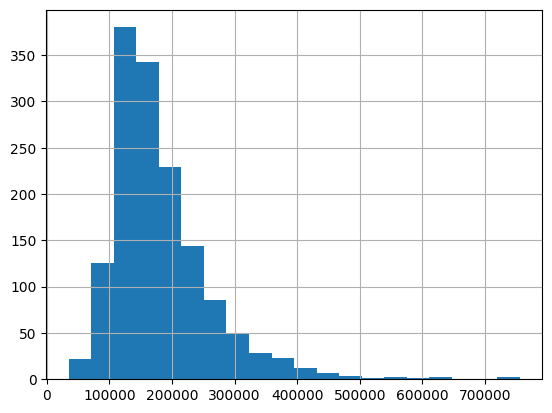

In [101]:
df.loc[df['SalePrice']>0,'SalePrice'].hist(bins=20);

- Sale Price is right skewed, most of the data points lies within USD400k

In [102]:
df[df['SalePrice']>500000]

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,IsTest
178,179,20,RL,63.0,17423,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,StoneBr,Norm,Norm,1Fam,1Story,9,5,2008,2009,Hip,CompShg,VinylSd,VinylSd,Stone,748.0,Ex,TA,PConc,Ex,TA,No,GLQ,1904.0,Unf,0.0,312.0,2216.0,GasA,Ex,Y,SBrkr,2234,0,0,2234,1.0,0.0,2,0,1,1,Ex,9,Typ,1,Gd,Attchd,2009.0,Fin,3.0,1166.0,TA,TA,Y,0,60,0,0,0,0,NaN,NaN,NaN,0,7,2009,New,Partial,501837,0
440,441,20,RL,105.0,15431,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NridgHt,Norm,Norm,1Fam,1Story,10,5,2008,2008,Hip,CompShg,VinylSd,VinylSd,Stone,200.0,Ex,TA,PConc,Ex,TA,Gd,GLQ,1767.0,ALQ,539.0,788.0,3094.0,GasA,Ex,Y,SBrkr,2402,0,0,2402,1.0,0.0,2,0,2,1,Ex,10,Typ,2,Gd,Attchd,2008.0,Fin,3.0,672.0,TA,TA,Y,0,72,0,0,170,0,NaN,NaN,NaN,0,4,2009,WD,Normal,555000,0
691,692,60,RL,104.0,21535,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NoRidge,Norm,Norm,1Fam,2Story,10,6,1994,1995,Gable,WdShngl,HdBoard,HdBoard,BrkFace,1170.0,Ex,TA,PConc,Ex,TA,Gd,GLQ,1455.0,Unf,0.0,989.0,2444.0,GasA,Ex,Y,SBrkr,2444,1872,0,4316,0.0,1.0,3,1,4,1,Ex,10,Typ,2,Ex,Attchd,1994.0,Fin,3.0,832.0,TA,TA,Y,382,50,0,0,0,0,NaN,NaN,NaN,0,1,2007,WD,Normal,755000,0
769,770,60,RL,47.0,53504,Pave,NaN,IR2,HLS,AllPub,CulDSac,Mod,StoneBr,Norm,Norm,1Fam,2Story,8,5,2003,2003,Hip,CompShg,CemntBd,Wd Shng,BrkFace,603.0,Ex,TA,PConc,Gd,TA,Gd,ALQ,1416.0,Unf,0.0,234.0,1650.0,GasA,Ex,Y,SBrkr,1690,1589,0,3279,1.0,0.0,3,1,4,1,Ex,12,Mod,1,Gd,BuiltIn,2003.0,Fin,3.0,841.0,TA,TA,Y,503,36,0,0,210,0,NaN,NaN,NaN,0,6,2010,WD,Normal,538000,0
803,804,60,RL,107.0,13891,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NridgHt,Norm,Norm,1Fam,2Story,9,5,2008,2009,Hip,CompShg,VinylSd,VinylSd,Stone,424.0,Ex,TA,PConc,Ex,TA,Gd,Unf,0.0,Unf,0.0,1734.0,1734.0,GasA,Ex,Y,SBrkr,1734,1088,0,2822,0.0,0.0,3,1,4,1,Ex,12,Typ,1,Gd,BuiltIn,2009.0,RFn,3.0,1020.0,TA,TA,Y,52,170,0,0,192,0,NaN,NaN,NaN,0,1,2009,New,Partial,582933,0
898,899,20,RL,100.0,12919,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NridgHt,Norm,Norm,1Fam,1Story,9,5,2009,2010,Hip,CompShg,VinylSd,VinylSd,Stone,760.0,Ex,TA,PConc,Ex,TA,Gd,GLQ,2188.0,Unf,0.0,142.0,2330.0,GasA,Ex,Y,SBrkr,2364,0,0,2364,1.0,0.0,2,1,2,1,Ex,11,Typ,2,Gd,Attchd,2009.0,Fin,3.0,820.0,TA,TA,Y,0,67,0,0,0,0,NaN,NaN,NaN,0,3,2010,New,Partial,611657,0
1046,1047,60,RL,85.0,16056,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,StoneBr,Norm,Norm,1Fam,2Story,9,5,2005,2006,Hip,CompShg,CemntBd,CmentBd,Stone,208.0,Gd,TA,PConc,Ex,TA,Av,GLQ,240.0,Unf,0.0,1752.0,1992.0,GasA,Ex,Y,SBrkr,1992,876,0,2868,0.0,0.0,3,1,4,1,Ex,11,Typ,1,Gd,BuiltIn,2005.0,Fin,3.0,716.0,TA,TA,Y,214,108,0,0,0,0,NaN,NaN,NaN,0,7,2006,New,Partial,556581,0
1169,1170,60,RL,118.0,35760,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,NoRidge,Norm,Norm,1Fam,2Story,10,5,1995,1996,Hip,CompShg,HdBoard,HdBoard,BrkFace,1378.0,Gd,Gd,PConc,Ex,TA,Gd,GLQ,1387.0,Unf,0.0,543.0,1930.0,GasA,Ex,Y,SBrkr,1831,1796,0,3627,1.0,0.0,3,1,4,1,Gd,10,Typ,1,TA,Attchd,1995.0,Fin,3.0,807.0,TA,TA,Y,361,76,0,0,0,0,NaN,NaN,NaN,0,7,2006,WD,Normal,625000,0
1182,1183,60,RL,160.0,15623,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NoRidge,Norm,Norm,1Fam,2Story,10,5,1996,1996,Hip,CompShg,Wd Sdng,ImStucc,None,0.0,Gd,TA,PConc,Ex,TA,Av,GLQ,2096.0,Unf,0.0,300.0,2396.0,GasA,Ex,Y,SBrkr,2411,2065,0,4476,1.0,0.0,3,1,4,1,Ex,10,Typ,2,TA,Attchd,1996.0,Fin,3.0,813.0,TA,

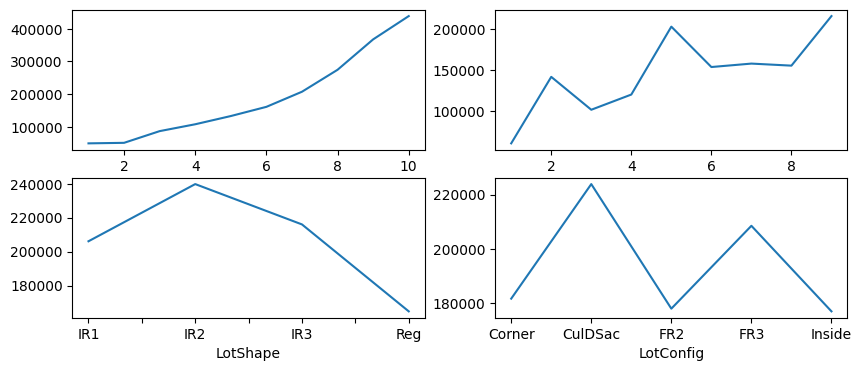

In [119]:
plt.figure(figsize=(10,4))
plt.subplot(2,2,1)
df[df['SalePrice']>0].groupby('OverallQual')['SalePrice'].mean().plot()
plt.subplot(2,2,2)
df[df['SalePrice']>0].groupby('OverallCond')['SalePrice'].mean().plot()
plt.subplot(2,2,3)
df[df['SalePrice']>0].groupby('LotShape')['SalePrice'].mean().plot()
plt.subplot(2,2,4)
df[df['SalePrice']>0].groupby('LotConfig')['SalePrice'].mean().plot();

- Overall quality clearly has linear relationship with price, whereas overall condition has three peaks irrespective of their values.
- In case of lotshape IR2 has higher average sale price. Culdsac is the clear high price winner in lot configuration

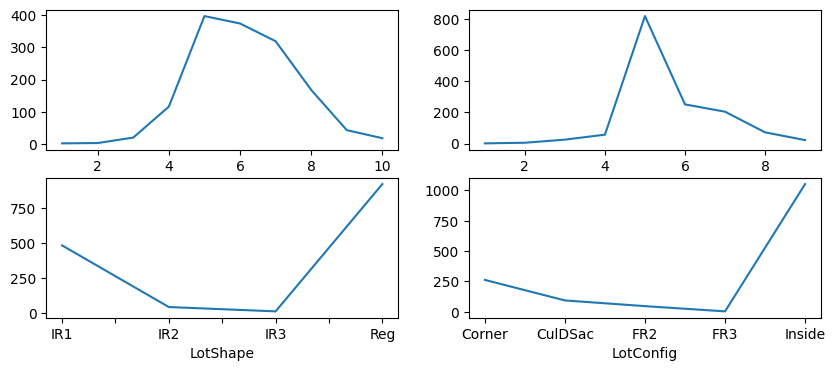

In [121]:
plt.figure(figsize=(10,4))
plt.subplot(2,2,1)
df[df['SalePrice']>0].groupby('OverallQual')['SalePrice'].count().plot()
plt.subplot(2,2,2)
df[df['SalePrice']>0].groupby('OverallCond')['SalePrice'].count().plot()
plt.subplot(2,2,3)
df[df['SalePrice']>0].groupby('LotShape')['SalePrice'].count().plot()
plt.subplot(2,2,4)
df[df['SalePrice']>0].groupby('LotConfig')['SalePrice'].count().plot();

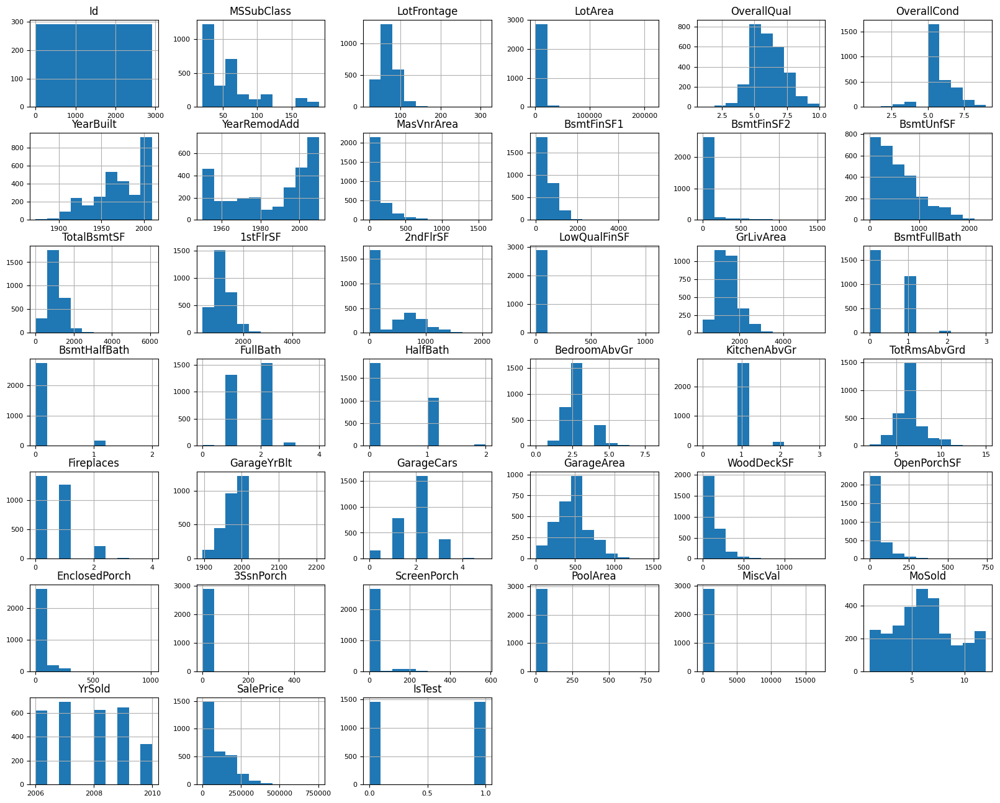

In [123]:
# Distribution of values in numerical Features
df.hist(figsize=(20,16),xlabelsize=8,ylabelsize=8);

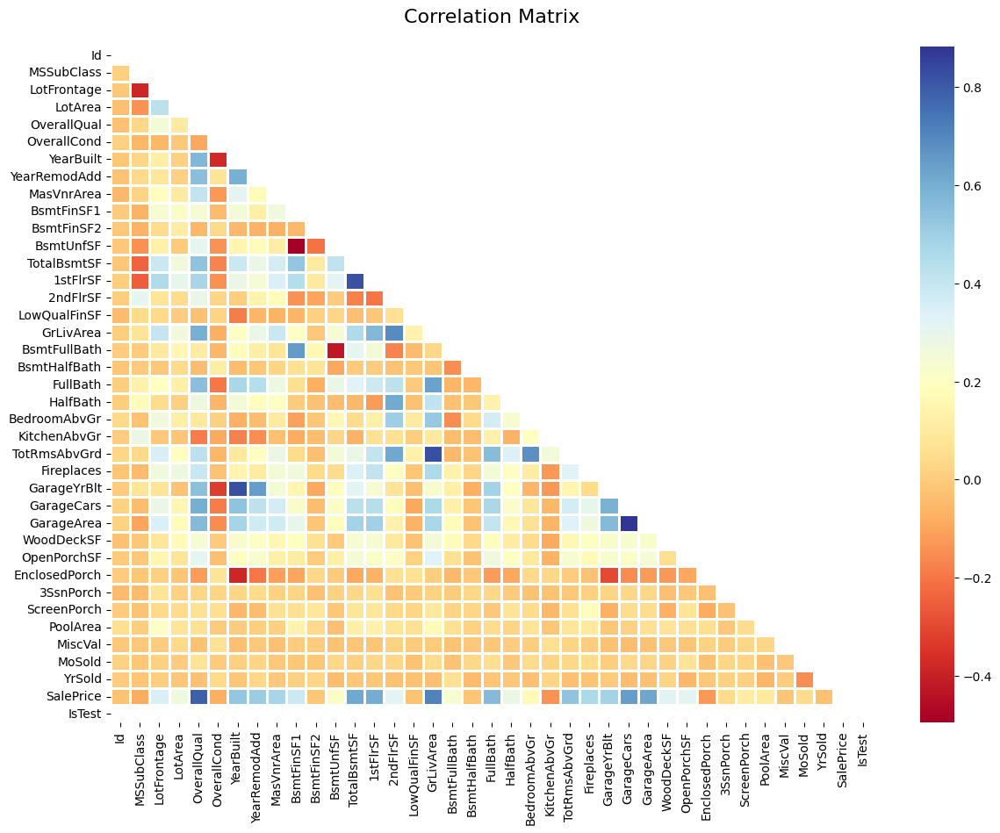

In [94]:
# Correlation matrix
fig,ax = plt.subplots(figsize=(14,10))
triu_mask = np.triu(df[df['IsTest']==0].corr())
ax = sns.heatmap(df[df['IsTest']==0].corr(),linewidths = 2,mask= triu_mask,cmap='RdYlBu')
# ax = sns.heatmap(df_train.corr(),cmap='mako')
plt.title("Correlation Matrix", fontsize=16,pad=20);

- Most of the features are either positive or negatively correlated with Saleprice column except ID

## Preprocessing data

In [126]:
# Checking for duplicates
df.duplicated().sum()

0

In [129]:
# Checking for nan values
df.isnull().sum()[df.isnull().sum()>0]

MSZoning           4
LotFrontage      486
Alley           2721
Utilities          2
Exterior1st        1
Exterior2nd        1
MasVnrType        24
MasVnrArea        23
BsmtQual          81
BsmtCond          82
BsmtExposure      82
BsmtFinType1      79
BsmtFinSF1         1
BsmtFinType2      80
BsmtFinSF2         1
BsmtUnfSF          1
TotalBsmtSF        1
Electrical         1
BsmtFullBath       2
BsmtHalfBath       2
KitchenQual        1
Functional         2
FireplaceQu     1420
GarageType       157
GarageYrBlt      159
GarageFinish     159
GarageCars         1
GarageArea         1
GarageQual       159
GarageCond       159
PoolQC          2909
Fence           2348
MiscFeature     2814
SaleType           1
dtype: int64

In [130]:
df.isnull().sum()[df.isnull().sum()>0].count()

34

In [56]:
# Checking on null values and categorizing as Categorical and Numerical features
category = []
integer = []
for label, content in df.items():
    if pd.isnull(content).sum():
        if pd.api.types.is_string_dtype(content):
            category.append(label)
        else:
            integer.append(label)
        
category, integer

(['MSZoning',
  'Alley',
  'Utilities',
  'Exterior1st',
  'Exterior2nd',
  'MasVnrType',
  'BsmtQual',
  'BsmtCond',
  'BsmtExposure',
  'BsmtFinType1',
  'BsmtFinType2',
  'Electrical',
  'KitchenQual',
  'Functional',
  'FireplaceQu',
  'GarageType',
  'GarageFinish',
  'GarageQual',
  'GarageCond',
  'PoolQC',
  'Fence',
  'MiscFeature',
  'SaleType'],
 ['LotFrontage',
  'MasVnrArea',
  'BsmtFinSF1',
  'BsmtFinSF2',
  'BsmtUnfSF',
  'TotalBsmtSF',
  'BsmtFullBath',
  'BsmtHalfBath',
  'GarageYrBlt',
  'GarageCars',
  'GarageArea'])

In [131]:
# Treating nan values for quantitative columns
for i in integer:
    df[i].fillna(0,inplace=True)
    
df.isnull().sum()[df.isnull().sum()>0].count()

23

In [140]:
# Treating nan values for qualitative columns
for i in category:
    df[i].fillna('Other',inplace=True)
    
df.isnull().sum()[df.isnull().sum()>0].count()

0

In [141]:
# Converting string datatype to categorical
for label, content in df.items():
    if pd.api.types.is_string_dtype(content):`
        df[label] = content.astype('category').cat.as_ordered()

In [142]:
for label, content in df.items():
    if not pd.api.types.is_numeric_dtype(content):
        df[label] = pd.Categorical(content).codes+1

# Machine Learning
## Choosing correct Regressor model for our problem

In [152]:
# separating train and test data
dftrain = df[df['IsTest']== 0]
dftest = df[df['IsTest']== 1]

# removing istest column 
dftrain.drop('IsTest',axis=1,inplace=True)
dftest.drop('IsTest',axis=1,inplace=True)

# removing target column from test data 
dftest.drop('SalePrice',axis=1,inplace=True)

dftrain.sample()

/tmp/ipykernel_154304/4036324099.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dftrain.drop('IsTest',axis=1,inplace=True)
/tmp/ipykernel_154304/4036324099.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dftest.drop('IsTest',axis=1,inplace=True)


,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
453,454,60,2,75.0,9000,2,2,4,4,1,5,1,22,3,3,1,6,8,5,2008,2008,2,2,14,14,3,0.0,3,5,3,3,5,4,7,0.0,7,0.0,768.0,768.0,2,1,2,6,786,804,0,1590,0.0,0.0,2,1,3,1,3,6,8,0,4,2,2008.0,3,2.0,676.0,6,6,3,0,30,0,0,0,0,4,5,2,0,6,2009,10,5,210000


In [154]:
# Splitting data for training and validating
X_train, X_valid, y_train, y_valid = train_test_split(dftrain.drop("SalePrice", axis=1), dftrain["SalePrice"], test_size=0.1)

In [156]:
X_train.shape

(1314, 80)

In [157]:
 X_valid.shape

(146, 80)

In [158]:
trial_model = RandomForestRegressor(random_state=42)
trial_model.fit(X_train, y_train)
trial_model.score(X_valid, y_valid)

0.9022425832933058

In [160]:
y_preds = trial_model.predict(X_valid)
np.sqrt(mean_squared_log_error(y_valid,y_preds)), mean_squared_log_error(y_valid,y_preds)

(0.15194840107475927, 0.023088316589175904)

In [161]:
trial_dtr = DecisionTreeRegressor()
trial_dtr.fit(X_train, y_train)
dtr_pred = trial_dtr.predict(X_valid)
trial_dtr.score(X_valid, y_valid)

0.7592313787116981

In [162]:
np.sqrt(mean_squared_log_error(y_valid,dtr_pred))

0.2200290834350096

In [163]:

models = {"RandomForest": RandomForestRegressor(),
          "DecisionTree": DecisionTreeRegressor(),
          "Ridge" : Ridge(),
          "BayesRidge": BayesianRidge(),
          "GradientBoost": GradientBoostingRegressor(),
          "CatBoost": CatBoostRegressor()}
m_score = {}
rmse = {}
for name, model in models.items():
    model.fit(X_train,y_train)
    sc = model.score(X_valid,y_valid)
    y_preds = model.predict(X_valid)
    msq = np.sqrt(mean_squared_log_error(y_valid,y_preds))
    m_score[name] = sc
    rmse[name] = msq
m_score, rmse
    

Learning rate set to 0.042748
0:	learn: 78354.1516851	total: 60.5ms	remaining: 1m
1:	learn: 76381.6225727	total: 63.5ms	remaining: 31.7s
2:	learn: 74586.9991707	total: 66.4ms	remaining: 22.1s
3:	learn: 72655.6714897	total: 69.3ms	remaining: 17.3s
4:	learn: 70839.0491886	total: 72.1ms	remaining: 14.4s
5:	learn: 68989.1827985	total: 75.2ms	remaining: 12.5s
6:	learn: 67220.9013226	total: 78ms	remaining: 11.1s
7:	learn: 65557.9169984	total: 80.6ms	remaining: 10s
8:	learn: 63985.4393273	total: 83.6ms	remaining: 9.21s
9:	learn: 62563.3709705	total: 86.6ms	remaining: 8.57s
10:	learn: 61140.2061253	total: 89.3ms	remaining: 8.03s
11:	learn: 59687.8327430	total: 92ms	remaining: 7.58s
12:	learn: 58243.2240213	total: 94.8ms	remaining: 7.2s
13:	learn: 57008.9417831	total: 97.4ms	remaining: 6.86s
14:	learn: 55892.3055299	total: 100ms	remaining: 6.58s
15:	learn: 54597.6920651	total: 103ms	remaining: 6.33s
16:	learn: 53432.6508687	total: 106ms	remaining: 6.11s
17:	learn: 52340.0759299	total: 108ms	rem

158:	learn: 18716.5176460	total: 782ms	remaining: 4.14s
159:	learn: 18660.0657875	total: 786ms	remaining: 4.13s
160:	learn: 18604.9448965	total: 789ms	remaining: 4.11s
161:	learn: 18558.7738958	total: 795ms	remaining: 4.11s
162:	learn: 18518.3853308	total: 799ms	remaining: 4.1s
163:	learn: 18445.5068926	total: 803ms	remaining: 4.09s
164:	learn: 18395.9906287	total: 810ms	remaining: 4.1s
165:	learn: 18361.5621831	total: 815ms	remaining: 4.09s
166:	learn: 18332.8793399	total: 818ms	remaining: 4.08s
167:	learn: 18304.0937440	total: 824ms	remaining: 4.08s
168:	learn: 18262.6328833	total: 829ms	remaining: 4.07s
169:	learn: 18234.2875097	total: 832ms	remaining: 4.06s
170:	learn: 18192.6321440	total: 835ms	remaining: 4.05s
171:	learn: 18149.0189082	total: 841ms	remaining: 4.05s
172:	learn: 18121.8318332	total: 846ms	remaining: 4.04s
173:	learn: 18067.3120422	total: 849ms	remaining: 4.03s
174:	learn: 18024.1713502	total: 852ms	remaining: 4.01s
175:	learn: 17982.8423716	total: 859ms	remaining: 

339:	learn: 13296.7793135	total: 1.58s	remaining: 3.06s
340:	learn: 13282.8044338	total: 1.58s	remaining: 3.05s
341:	learn: 13279.8223750	total: 1.58s	remaining: 3.05s
342:	learn: 13268.3227834	total: 1.59s	remaining: 3.04s
343:	learn: 13240.2674847	total: 1.59s	remaining: 3.03s
344:	learn: 13212.0126665	total: 1.6s	remaining: 3.03s
345:	learn: 13194.8166200	total: 1.61s	remaining: 3.04s
346:	learn: 13191.6924603	total: 1.61s	remaining: 3.04s
347:	learn: 13164.5697151	total: 1.62s	remaining: 3.03s
348:	learn: 13143.1967395	total: 1.62s	remaining: 3.02s
349:	learn: 13111.8686918	total: 1.62s	remaining: 3.02s
350:	learn: 13083.1367166	total: 1.63s	remaining: 3.01s
351:	learn: 13054.0091789	total: 1.63s	remaining: 3s
352:	learn: 13021.4614855	total: 1.63s	remaining: 3s
353:	learn: 13005.8921862	total: 1.64s	remaining: 2.99s
354:	learn: 12991.2192789	total: 1.64s	remaining: 2.98s
355:	learn: 12973.0775733	total: 1.64s	remaining: 2.97s
356:	learn: 12957.2569677	total: 1.65s	remaining: 2.96s

495:	learn: 10412.2834794	total: 2.6s	remaining: 2.65s
496:	learn: 10399.3638201	total: 2.61s	remaining: 2.64s
497:	learn: 10387.0665486	total: 2.62s	remaining: 2.64s
498:	learn: 10363.1733269	total: 2.62s	remaining: 2.63s
499:	learn: 10353.1822154	total: 2.63s	remaining: 2.63s
500:	learn: 10323.0002593	total: 2.63s	remaining: 2.62s
501:	learn: 10316.8434225	total: 2.64s	remaining: 2.62s
502:	learn: 10305.7415500	total: 2.64s	remaining: 2.61s
503:	learn: 10295.8485033	total: 2.65s	remaining: 2.6s
504:	learn: 10282.4634535	total: 2.65s	remaining: 2.6s
505:	learn: 10271.1082776	total: 2.65s	remaining: 2.59s
506:	learn: 10252.5348656	total: 2.66s	remaining: 2.58s
507:	learn: 10238.8732116	total: 2.66s	remaining: 2.58s
508:	learn: 10219.5695603	total: 2.67s	remaining: 2.57s
509:	learn: 10207.4732082	total: 2.67s	remaining: 2.56s
510:	learn: 10194.6600177	total: 2.67s	remaining: 2.56s
511:	learn: 10175.6677104	total: 2.68s	remaining: 2.55s
512:	learn: 10152.3484039	total: 2.68s	remaining: 2

651:	learn: 8470.9211074	total: 3.19s	remaining: 1.7s
652:	learn: 8463.5686726	total: 3.19s	remaining: 1.7s
653:	learn: 8454.7525096	total: 3.2s	remaining: 1.69s
654:	learn: 8449.9271197	total: 3.2s	remaining: 1.69s
655:	learn: 8441.6758270	total: 3.21s	remaining: 1.68s
656:	learn: 8430.2751685	total: 3.22s	remaining: 1.68s
657:	learn: 8429.4981024	total: 3.22s	remaining: 1.68s
658:	learn: 8414.1763571	total: 3.23s	remaining: 1.67s
659:	learn: 8402.4855741	total: 3.23s	remaining: 1.66s
660:	learn: 8392.2621789	total: 3.23s	remaining: 1.66s
661:	learn: 8381.6995035	total: 3.23s	remaining: 1.65s
662:	learn: 8370.3530912	total: 3.24s	remaining: 1.65s
663:	learn: 8361.3438000	total: 3.24s	remaining: 1.64s
664:	learn: 8360.6420918	total: 3.25s	remaining: 1.63s
665:	learn: 8346.9191154	total: 3.25s	remaining: 1.63s
666:	learn: 8341.5361867	total: 3.25s	remaining: 1.62s
667:	learn: 8334.5605925	total: 3.25s	remaining: 1.62s
668:	learn: 8326.7047214	total: 3.26s	remaining: 1.61s
669:	learn: 83

828:	learn: 6808.7482027	total: 4.22s	remaining: 871ms
829:	learn: 6796.1172726	total: 4.23s	remaining: 866ms
830:	learn: 6787.6120759	total: 4.23s	remaining: 860ms
831:	learn: 6777.0013530	total: 4.23s	remaining: 855ms
832:	learn: 6764.3309510	total: 4.24s	remaining: 850ms
833:	learn: 6757.5679899	total: 4.24s	remaining: 844ms
834:	learn: 6747.3453903	total: 4.25s	remaining: 839ms
835:	learn: 6737.2017430	total: 4.25s	remaining: 834ms
836:	learn: 6731.9674551	total: 4.26s	remaining: 830ms
837:	learn: 6725.6285517	total: 4.26s	remaining: 824ms
838:	learn: 6714.2337269	total: 4.27s	remaining: 819ms
839:	learn: 6697.6564192	total: 4.27s	remaining: 813ms
840:	learn: 6697.0200973	total: 4.27s	remaining: 808ms
841:	learn: 6692.8371185	total: 4.28s	remaining: 802ms
842:	learn: 6687.3683886	total: 4.28s	remaining: 797ms
843:	learn: 6678.3199168	total: 4.28s	remaining: 791ms
844:	learn: 6673.2675540	total: 4.29s	remaining: 786ms
845:	learn: 6668.1746186	total: 4.29s	remaining: 781ms
846:	learn

({'RandomForest': 0.9058825338173939,
  'DecisionTree': 0.7241441920829963,
  'Ridge': 0.891171305597923,
  'BayesRidge': 0.8965590580813609,
  'GradientBoost': 0.9215638492280563,
  'CatBoost': 0.9406508231892825},
 {'RandomForest': 0.15560201029908372,
  'DecisionTree': 0.2205440860639381,
  'Ridge': 0.17506754132369315,
  'BayesRidge': 0.16937804026471343,
  'GradientBoost': 0.13736685616976385,
  'CatBoost': 0.11837731743573043})

From above results cat boost has better rmse score and better prediction score

## Cat boost hyper parameter tuning

In [164]:
%%time
cb_pgrid = {"iterations": [100,150,200],
            "learning_rate": [0.1,0.01,0.04,0.02],
            "depth": [2,4,6,8,10],
            "l2_leaf_reg": [0.2,0.5,1,3]}

cb_gscv = GridSearchCV(estimator = CatBoostRegressor(), param_grid= cb_pgrid)
cb_gscv.fit(X_train,y_train)

0:	learn: 76575.7524276	total: 892us	remaining: 88.3ms
1:	learn: 72831.7761197	total: 1.86ms	remaining: 91.2ms
2:	learn: 69076.3503518	total: 2.54ms	remaining: 82.1ms
3:	learn: 66069.5770578	total: 3.19ms	remaining: 76.6ms
4:	learn: 63243.4988490	total: 3.89ms	remaining: 73.9ms
5:	learn: 60483.8968950	total: 4.59ms	remaining: 71.9ms
6:	learn: 58021.4893964	total: 5.89ms	remaining: 78.2ms
7:	learn: 56060.7378994	total: 6.6ms	remaining: 75.9ms
8:	learn: 54028.3632521	total: 7.31ms	remaining: 73.9ms
9:	learn: 52175.8726111	total: 7.96ms	remaining: 71.7ms
10:	learn: 50441.4413357	total: 8.75ms	remaining: 70.8ms
11:	learn: 49044.1487495	total: 9.76ms	remaining: 71.6ms
12:	learn: 47607.2903858	total: 10.4ms	remaining: 69.7ms
13:	learn: 46340.0076755	total: 11.8ms	remaining: 72.6ms
14:	learn: 45090.6036824	total: 12.7ms	remaining: 71.9ms
15:	learn: 43887.2247166	total: 13.4ms	remaining: 70.2ms
16:	learn: 42739.1987199	total: 14ms	remaining: 68.4ms
17:	learn: 41801.2099484	total: 15ms	remainin

59:	learn: 25726.0684757	total: 56.2ms	remaining: 37.4ms
60:	learn: 25601.7777797	total: 57.1ms	remaining: 36.5ms
61:	learn: 25502.2398266	total: 57.9ms	remaining: 35.5ms
62:	learn: 25416.1490310	total: 58.6ms	remaining: 34.4ms
63:	learn: 25239.6743776	total: 59.7ms	remaining: 33.6ms
64:	learn: 25154.8975611	total: 60.9ms	remaining: 32.8ms
65:	learn: 25026.8273526	total: 61.6ms	remaining: 31.7ms
66:	learn: 24913.2064792	total: 62.2ms	remaining: 30.6ms
67:	learn: 24818.5772734	total: 62.8ms	remaining: 29.6ms
68:	learn: 24722.7183097	total: 63.5ms	remaining: 28.5ms
69:	learn: 24630.4309091	total: 64ms	remaining: 27.4ms
70:	learn: 24396.3108710	total: 64.6ms	remaining: 26.4ms
71:	learn: 24311.9935922	total: 65.2ms	remaining: 25.3ms
72:	learn: 24220.2467848	total: 65.9ms	remaining: 24.4ms
73:	learn: 24152.0648342	total: 71.2ms	remaining: 25ms
74:	learn: 24069.6329593	total: 71.9ms	remaining: 24ms
75:	learn: 23953.5573220	total: 72.7ms	remaining: 23ms
76:	learn: 23867.6465540	total: 73.4ms	

0:	learn: 80809.9636591	total: 2.4ms	remaining: 237ms
1:	learn: 80375.3344374	total: 5.28ms	remaining: 259ms
2:	learn: 79903.6619910	total: 7.42ms	remaining: 240ms
3:	learn: 79472.5741400	total: 9.89ms	remaining: 237ms
4:	learn: 79017.9919230	total: 12.1ms	remaining: 230ms
5:	learn: 78622.2029698	total: 14.3ms	remaining: 224ms
6:	learn: 78173.7142318	total: 16.5ms	remaining: 220ms
7:	learn: 77804.5430345	total: 18.8ms	remaining: 216ms
8:	learn: 77368.1076886	total: 20.8ms	remaining: 210ms
9:	learn: 76995.8129936	total: 22.2ms	remaining: 200ms
10:	learn: 76581.0802996	total: 23.6ms	remaining: 191ms
11:	learn: 76179.6203449	total: 25.2ms	remaining: 185ms
12:	learn: 75798.5371803	total: 26.8ms	remaining: 180ms
13:	learn: 75418.8600523	total: 28.4ms	remaining: 174ms
14:	learn: 75032.9652948	total: 29.5ms	remaining: 167ms
15:	learn: 74640.8598593	total: 30.6ms	remaining: 161ms
16:	learn: 74267.8722061	total: 31.7ms	remaining: 155ms
17:	learn: 73893.1163492	total: 32.9ms	remaining: 150ms
18:

0:	learn: 77310.4245829	total: 953us	remaining: 94.4ms
1:	learn: 76883.2537980	total: 3.2ms	remaining: 157ms
2:	learn: 76434.3290752	total: 4.77ms	remaining: 154ms
3:	learn: 76006.0059114	total: 5.78ms	remaining: 139ms
4:	learn: 75615.8404751	total: 6.54ms	remaining: 124ms
5:	learn: 75214.1966033	total: 7.29ms	remaining: 114ms
6:	learn: 74849.4790618	total: 8.19ms	remaining: 109ms
7:	learn: 74433.3854962	total: 9.15ms	remaining: 105ms
8:	learn: 74064.2035518	total: 9.96ms	remaining: 101ms
9:	learn: 73701.1806773	total: 11ms	remaining: 99ms
10:	learn: 73337.4495460	total: 11.7ms	remaining: 94.9ms
11:	learn: 72990.5382215	total: 12.7ms	remaining: 93.1ms
12:	learn: 72597.4056534	total: 13.4ms	remaining: 89.6ms
13:	learn: 72220.6873230	total: 14.1ms	remaining: 86.5ms
14:	learn: 71871.4321546	total: 15.3ms	remaining: 86.5ms
15:	learn: 71487.8833070	total: 16.9ms	remaining: 88.6ms
16:	learn: 71133.0490843	total: 17.6ms	remaining: 86ms
17:	learn: 70773.3885169	total: 18.3ms	remaining: 83.4ms


72:	learn: 34053.2597477	total: 53ms	remaining: 19.6ms
73:	learn: 33856.5832818	total: 53.9ms	remaining: 18.9ms
74:	learn: 33646.0799970	total: 54.5ms	remaining: 18.2ms
75:	learn: 33435.1144405	total: 55.2ms	remaining: 17.4ms
76:	learn: 33269.5485852	total: 57.2ms	remaining: 17.1ms
77:	learn: 33112.4774229	total: 57.8ms	remaining: 16.3ms
78:	learn: 32948.9965345	total: 58.4ms	remaining: 15.5ms
79:	learn: 32769.9237368	total: 58.9ms	remaining: 14.7ms
80:	learn: 32617.4298761	total: 59.4ms	remaining: 13.9ms
81:	learn: 32489.0066329	total: 60ms	remaining: 13.2ms
82:	learn: 32332.6244208	total: 60.5ms	remaining: 12.4ms
83:	learn: 32167.2169899	total: 61.2ms	remaining: 11.6ms
84:	learn: 32039.5721974	total: 61.8ms	remaining: 10.9ms
85:	learn: 31882.2315243	total: 62.6ms	remaining: 10.2ms
86:	learn: 31684.0819876	total: 63.2ms	remaining: 9.44ms
87:	learn: 31529.4929936	total: 63.8ms	remaining: 8.7ms
88:	learn: 31405.8076068	total: 65.1ms	remaining: 8.04ms
89:	learn: 31277.6518386	total: 65.7

0:	learn: 80078.0058258	total: 790us	remaining: 78.2ms
1:	learn: 78628.6008680	total: 1.75ms	remaining: 86ms
2:	learn: 77042.3493791	total: 2.4ms	remaining: 77.7ms
3:	learn: 75645.9469843	total: 3.02ms	remaining: 72.6ms
4:	learn: 74208.5276625	total: 3.66ms	remaining: 69.5ms
5:	learn: 72931.9898901	total: 4.32ms	remaining: 67.7ms
6:	learn: 71657.9494151	total: 4.93ms	remaining: 65.5ms
7:	learn: 70296.2939031	total: 5.56ms	remaining: 63.9ms
8:	learn: 69047.7346850	total: 6.18ms	remaining: 62.5ms
9:	learn: 67950.5747986	total: 6.76ms	remaining: 60.9ms
10:	learn: 66759.7356867	total: 7.38ms	remaining: 59.8ms
11:	learn: 65668.2773841	total: 8.03ms	remaining: 58.9ms
12:	learn: 64385.4424645	total: 8.64ms	remaining: 57.9ms
13:	learn: 63339.3545284	total: 9.26ms	remaining: 56.9ms
14:	learn: 62178.3570525	total: 9.84ms	remaining: 55.8ms
15:	learn: 61136.8676670	total: 10.5ms	remaining: 55ms
16:	learn: 60073.1691282	total: 11.1ms	remaining: 54.2ms
17:	learn: 59123.4695791	total: 11.7ms	remainin

91:	learn: 41802.6539223	total: 66.6ms	remaining: 5.79ms
92:	learn: 41607.7295500	total: 67.4ms	remaining: 5.07ms
93:	learn: 41386.6120673	total: 68ms	remaining: 4.34ms
94:	learn: 41156.2378047	total: 68.6ms	remaining: 3.61ms
95:	learn: 40989.8826205	total: 70ms	remaining: 2.92ms
96:	learn: 40782.7784462	total: 70.8ms	remaining: 2.19ms
97:	learn: 40603.5330651	total: 71.5ms	remaining: 1.46ms
98:	learn: 40447.6363033	total: 72.1ms	remaining: 728us
99:	learn: 40277.2241917	total: 73ms	remaining: 0us
0:	learn: 80345.3155452	total: 696us	remaining: 68.9ms
1:	learn: 79489.1474537	total: 1.31ms	remaining: 64.3ms
2:	learn: 78570.5613893	total: 1.93ms	remaining: 62.5ms
3:	learn: 77742.4878529	total: 2.55ms	remaining: 61.2ms
4:	learn: 76966.6998420	total: 3.19ms	remaining: 60.7ms
5:	learn: 76209.3510601	total: 3.78ms	remaining: 59.2ms
6:	learn: 75368.5865627	total: 4.34ms	remaining: 57.7ms
7:	learn: 74660.6156195	total: 4.98ms	remaining: 57.3ms
8:	learn: 73858.9657729	total: 5.56ms	remaining: 5

60:	learn: 49067.6240337	total: 36ms	remaining: 23ms
61:	learn: 48743.8107110	total: 38.4ms	remaining: 23.6ms
62:	learn: 48418.8622592	total: 39.3ms	remaining: 23.1ms
63:	learn: 48148.1999612	total: 40.1ms	remaining: 22.6ms
64:	learn: 47818.6429632	total: 40.8ms	remaining: 22ms
65:	learn: 47507.4762957	total: 41.5ms	remaining: 21.4ms
66:	learn: 47210.3093090	total: 42.1ms	remaining: 20.8ms
67:	learn: 46912.4749872	total: 42.8ms	remaining: 20.1ms
68:	learn: 46664.5582938	total: 43.4ms	remaining: 19.5ms
69:	learn: 46405.9394647	total: 44ms	remaining: 18.9ms
70:	learn: 46158.3300752	total: 44.6ms	remaining: 18.2ms
71:	learn: 45862.4600270	total: 45.3ms	remaining: 17.6ms
72:	learn: 45639.5930679	total: 45.9ms	remaining: 17ms
73:	learn: 45377.2591673	total: 46.5ms	remaining: 16.3ms
74:	learn: 45116.2946506	total: 47.1ms	remaining: 15.7ms
75:	learn: 44865.9251954	total: 47.7ms	remaining: 15.1ms
76:	learn: 44640.6956951	total: 48.3ms	remaining: 14.4ms
77:	learn: 44395.9241508	total: 49.1ms	re

0:	learn: 76591.6323167	total: 726us	remaining: 71.9ms
1:	learn: 72854.6852127	total: 1.5ms	remaining: 73.5ms
2:	learn: 69106.3053675	total: 2.43ms	remaining: 78.7ms
3:	learn: 66107.1472017	total: 3.02ms	remaining: 72.5ms
4:	learn: 63286.2973997	total: 3.61ms	remaining: 68.6ms
5:	learn: 60528.9153227	total: 4.21ms	remaining: 65.9ms
6:	learn: 58065.7795823	total: 4.82ms	remaining: 64.1ms
7:	learn: 56105.0739511	total: 5.43ms	remaining: 62.5ms
8:	learn: 54074.1197888	total: 6.15ms	remaining: 62.2ms
9:	learn: 52220.4239383	total: 6.87ms	remaining: 61.9ms
10:	learn: 50484.7345210	total: 7.62ms	remaining: 61.6ms
11:	learn: 49090.0854865	total: 8.38ms	remaining: 61.5ms
12:	learn: 47652.3691819	total: 9.19ms	remaining: 61.5ms
13:	learn: 46383.5391185	total: 9.84ms	remaining: 60.5ms
14:	learn: 45134.4031183	total: 10.5ms	remaining: 59.6ms
15:	learn: 43970.9962155	total: 11.2ms	remaining: 58.6ms
16:	learn: 42828.3296252	total: 11.8ms	remaining: 57.6ms
17:	learn: 41887.8571115	total: 12.4ms	rema

0:	learn: 76241.4492346	total: 3.21ms	remaining: 318ms
1:	learn: 72523.3522890	total: 7.67ms	remaining: 376ms
2:	learn: 69129.6032619	total: 10.2ms	remaining: 330ms
3:	learn: 66267.8271044	total: 12.6ms	remaining: 301ms
4:	learn: 63429.4197881	total: 15.1ms	remaining: 287ms
5:	learn: 60460.2147498	total: 17.6ms	remaining: 275ms
6:	learn: 58349.2303560	total: 20.1ms	remaining: 267ms
7:	learn: 55988.3393702	total: 22.6ms	remaining: 260ms
8:	learn: 53909.3422230	total: 24.9ms	remaining: 252ms
9:	learn: 52052.2744569	total: 26.8ms	remaining: 241ms
10:	learn: 50264.0611264	total: 28.3ms	remaining: 229ms
11:	learn: 48799.0447533	total: 29.9ms	remaining: 219ms
12:	learn: 47193.7714716	total: 31.5ms	remaining: 211ms
13:	learn: 45907.0057291	total: 33ms	remaining: 203ms
14:	learn: 44716.2467349	total: 34.3ms	remaining: 195ms
15:	learn: 43479.3494383	total: 35.4ms	remaining: 186ms
16:	learn: 42443.6586082	total: 36.6ms	remaining: 179ms
17:	learn: 41520.6542671	total: 37.7ms	remaining: 172ms
18:	

0:	learn: 77420.6995699	total: 2.67ms	remaining: 264ms
1:	learn: 73515.7021986	total: 6.68ms	remaining: 327ms
2:	learn: 70120.0695793	total: 9.78ms	remaining: 316ms
3:	learn: 67221.9085674	total: 13.7ms	remaining: 328ms
4:	learn: 64639.1650188	total: 15.9ms	remaining: 301ms
5:	learn: 62116.7745895	total: 18.3ms	remaining: 287ms
6:	learn: 59773.8631125	total: 20.9ms	remaining: 278ms
7:	learn: 57267.7186883	total: 24.5ms	remaining: 282ms
8:	learn: 55509.9483615	total: 28.4ms	remaining: 287ms
9:	learn: 53830.9329407	total: 33.6ms	remaining: 303ms
10:	learn: 51896.0118904	total: 35.8ms	remaining: 290ms
11:	learn: 50154.6726410	total: 40.1ms	remaining: 294ms
12:	learn: 48509.5210826	total: 41.7ms	remaining: 279ms
13:	learn: 47099.3138444	total: 43.5ms	remaining: 267ms
14:	learn: 45694.5900262	total: 46.8ms	remaining: 265ms
15:	learn: 44481.2117967	total: 48.5ms	remaining: 254ms
16:	learn: 43534.1756030	total: 49.7ms	remaining: 242ms
17:	learn: 42293.8490341	total: 51ms	remaining: 232ms
18:	

55:	learn: 62452.3243222	total: 37.9ms	remaining: 29.8ms
56:	learn: 62197.3932623	total: 38.9ms	remaining: 29.3ms
57:	learn: 61929.9702927	total: 39.9ms	remaining: 28.9ms
58:	learn: 61693.8812616	total: 40.5ms	remaining: 28.2ms
59:	learn: 61444.7670146	total: 41.7ms	remaining: 27.8ms
60:	learn: 61153.1500767	total: 42.2ms	remaining: 27ms
61:	learn: 60929.6249506	total: 42.7ms	remaining: 26.2ms
62:	learn: 60645.5932591	total: 43.3ms	remaining: 25.4ms
63:	learn: 60429.6563055	total: 43.9ms	remaining: 24.7ms
64:	learn: 60169.6237508	total: 44.6ms	remaining: 24ms
65:	learn: 59925.8243853	total: 45.4ms	remaining: 23.4ms
66:	learn: 59675.5301799	total: 46.1ms	remaining: 22.7ms
67:	learn: 59434.2536097	total: 46.7ms	remaining: 22ms
68:	learn: 59174.0988343	total: 47.3ms	remaining: 21.3ms
69:	learn: 58948.0930471	total: 47.9ms	remaining: 20.5ms
70:	learn: 58737.3906197	total: 48.4ms	remaining: 19.8ms
71:	learn: 58525.4860022	total: 49ms	remaining: 19ms
72:	learn: 58272.8564621	total: 49.5ms	re

0:	learn: 77311.3137681	total: 2.93ms	remaining: 290ms
1:	learn: 76885.0446918	total: 5.94ms	remaining: 291ms
2:	learn: 76436.8422461	total: 8.26ms	remaining: 267ms
3:	learn: 76009.1170280	total: 10.9ms	remaining: 263ms
4:	learn: 75619.6473097	total: 13.5ms	remaining: 257ms
5:	learn: 75218.6694217	total: 15.8ms	remaining: 248ms
6:	learn: 74854.6291436	total: 18.2ms	remaining: 242ms
7:	learn: 74439.3471625	total: 20.6ms	remaining: 237ms
8:	learn: 74070.8291995	total: 22.9ms	remaining: 231ms
9:	learn: 73708.4991696	total: 25.2ms	remaining: 227ms
10:	learn: 73345.3257445	total: 27.9ms	remaining: 226ms
11:	learn: 72999.0422619	total: 30.2ms	remaining: 221ms
12:	learn: 72606.5081763	total: 32.4ms	remaining: 217ms
13:	learn: 72230.0460233	total: 34.1ms	remaining: 209ms
14:	learn: 71881.0451626	total: 35.7ms	remaining: 202ms
15:	learn: 71498.3361275	total: 37.5ms	remaining: 197ms
16:	learn: 71143.7607003	total: 39.1ms	remaining: 191ms
17:	learn: 70784.6268529	total: 42.2ms	remaining: 192ms
18

48:	learn: 40704.4546292	total: 37.7ms	remaining: 39.3ms
49:	learn: 40314.4547560	total: 38.6ms	remaining: 38.6ms
50:	learn: 40005.0549007	total: 39.2ms	remaining: 37.7ms
51:	learn: 39620.9067042	total: 39.9ms	remaining: 36.8ms
52:	learn: 39331.3890371	total: 40.5ms	remaining: 35.9ms
53:	learn: 39011.9357250	total: 41.2ms	remaining: 35.1ms
54:	learn: 38721.2597499	total: 41.8ms	remaining: 34.2ms
55:	learn: 38404.0330430	total: 42.5ms	remaining: 33.4ms
56:	learn: 38108.0063248	total: 43.2ms	remaining: 32.6ms
57:	learn: 37803.8478752	total: 43.8ms	remaining: 31.7ms
58:	learn: 37528.5749075	total: 44.5ms	remaining: 30.9ms
59:	learn: 37266.3807871	total: 45.1ms	remaining: 30.1ms
60:	learn: 37010.7976183	total: 45.7ms	remaining: 29.2ms
61:	learn: 36771.4909643	total: 46.3ms	remaining: 28.4ms
62:	learn: 36537.0049979	total: 46.9ms	remaining: 27.6ms
63:	learn: 36281.4402214	total: 47.5ms	remaining: 26.7ms
64:	learn: 36073.4690798	total: 48.1ms	remaining: 25.9ms
65:	learn: 35823.8453473	total:

0:	learn: 78950.0087864	total: 3.31ms	remaining: 327ms
1:	learn: 77300.2768304	total: 6.36ms	remaining: 312ms
2:	learn: 75645.9496296	total: 9.3ms	remaining: 301ms
3:	learn: 74282.9920414	total: 12.2ms	remaining: 294ms
4:	learn: 72775.4396616	total: 15.3ms	remaining: 291ms
5:	learn: 71456.2382972	total: 17.7ms	remaining: 277ms
6:	learn: 70046.1462040	total: 20.2ms	remaining: 268ms
7:	learn: 68765.8988458	total: 22.6ms	remaining: 260ms
8:	learn: 67466.6904675	total: 25ms	remaining: 253ms
9:	learn: 66158.1495330	total: 27.7ms	remaining: 249ms
10:	learn: 64925.4179020	total: 30.1ms	remaining: 244ms
11:	learn: 63812.1387119	total: 32.5ms	remaining: 238ms
12:	learn: 62644.4389801	total: 36.2ms	remaining: 242ms
13:	learn: 61581.2259378	total: 38.1ms	remaining: 234ms
14:	learn: 60599.8390885	total: 39.9ms	remaining: 226ms
15:	learn: 59694.2340539	total: 41.7ms	remaining: 219ms
16:	learn: 58741.7270471	total: 45.2ms	remaining: 221ms
17:	learn: 57832.2164508	total: 48.3ms	remaining: 220ms
18:	l

0:	learn: 80080.5170604	total: 1ms	remaining: 99.5ms
1:	learn: 78632.8841039	total: 2.27ms	remaining: 111ms
2:	learn: 77049.7945216	total: 3.29ms	remaining: 107ms
3:	learn: 75656.2964043	total: 4.41ms	remaining: 106ms
4:	learn: 74221.4486101	total: 5.52ms	remaining: 105ms
5:	learn: 72947.6504214	total: 6.42ms	remaining: 101ms
6:	learn: 71675.4604659	total: 7.27ms	remaining: 96.6ms
7:	learn: 70276.7771269	total: 8.12ms	remaining: 93.3ms
8:	learn: 69038.1483190	total: 8.86ms	remaining: 89.6ms
9:	learn: 67959.4378923	total: 9.6ms	remaining: 86.4ms
10:	learn: 66744.5593741	total: 10.3ms	remaining: 83.6ms
11:	learn: 65607.6549473	total: 11.1ms	remaining: 81.7ms
12:	learn: 64331.3179980	total: 11.9ms	remaining: 79.9ms
13:	learn: 63295.0439353	total: 12.8ms	remaining: 78.4ms
14:	learn: 62139.5819505	total: 13.5ms	remaining: 76.5ms
15:	learn: 61132.8231607	total: 14.2ms	remaining: 74.7ms
16:	learn: 60087.4477524	total: 15ms	remaining: 73.1ms
17:	learn: 59151.1509980	total: 15.7ms	remaining: 71

13:	learn: 70217.6460881	total: 9.04ms	remaining: 55.6ms
14:	learn: 69574.8903653	total: 9.88ms	remaining: 56ms
15:	learn: 68937.4593807	total: 10.6ms	remaining: 55.6ms
16:	learn: 68304.1402112	total: 11.3ms	remaining: 55.1ms
17:	learn: 67676.2223089	total: 14.9ms	remaining: 68.1ms
18:	learn: 67111.8610316	total: 15.6ms	remaining: 66.7ms
19:	learn: 66464.0776556	total: 16.3ms	remaining: 65.3ms
20:	learn: 65851.2931236	total: 17ms	remaining: 64ms
21:	learn: 65306.1371599	total: 17.7ms	remaining: 62.8ms
22:	learn: 64797.4981736	total: 18.4ms	remaining: 61.5ms
23:	learn: 64202.1296292	total: 19ms	remaining: 60.2ms
24:	learn: 63624.7810377	total: 19.7ms	remaining: 59ms
25:	learn: 63037.4836420	total: 20.3ms	remaining: 57.9ms
26:	learn: 62565.8204675	total: 21ms	remaining: 56.8ms
27:	learn: 62072.1756984	total: 21.7ms	remaining: 55.8ms
28:	learn: 61582.0415649	total: 22.4ms	remaining: 54.8ms
29:	learn: 61058.1041018	total: 23.1ms	remaining: 53.8ms
30:	learn: 60558.6432904	total: 23.8ms	rema

0:	learn: 80984.7010010	total: 749us	remaining: 74.2ms
1:	learn: 80236.6883811	total: 1.62ms	remaining: 79.3ms
2:	learn: 79408.3230603	total: 2.32ms	remaining: 74.9ms
3:	learn: 78669.7951765	total: 2.94ms	remaining: 70.7ms
4:	learn: 77881.7872715	total: 3.56ms	remaining: 67.7ms
5:	learn: 77161.9091892	total: 4.18ms	remaining: 65.6ms
6:	learn: 76446.1157816	total: 4.99ms	remaining: 66.3ms
7:	learn: 75644.1037550	total: 5.91ms	remaining: 68ms
8:	learn: 74895.8847018	total: 6.59ms	remaining: 66.6ms
9:	learn: 74221.5593283	total: 7.2ms	remaining: 64.8ms
10:	learn: 73507.7722446	total: 7.8ms	remaining: 63.1ms
11:	learn: 72894.0742846	total: 8.43ms	remaining: 61.8ms
12:	learn: 72167.7660905	total: 9.04ms	remaining: 60.5ms
13:	learn: 71478.8766095	total: 9.66ms	remaining: 59.3ms
14:	learn: 70749.2345541	total: 10.3ms	remaining: 58.1ms
15:	learn: 70085.0015999	total: 10.9ms	remaining: 57.3ms
16:	learn: 69401.3511998	total: 11.8ms	remaining: 57.7ms
17:	learn: 68693.9605363	total: 12.7ms	remaini

65:	learn: 25643.9202316	total: 55.5ms	remaining: 28.6ms
66:	learn: 25526.8547383	total: 56.2ms	remaining: 27.7ms
67:	learn: 25355.2872265	total: 56.8ms	remaining: 26.8ms
68:	learn: 25240.3761359	total: 57.5ms	remaining: 25.8ms
69:	learn: 25162.5076880	total: 58.1ms	remaining: 24.9ms
70:	learn: 25020.6089033	total: 58.8ms	remaining: 24ms
71:	learn: 24871.4906571	total: 59.5ms	remaining: 23.1ms
72:	learn: 24750.1821026	total: 60.2ms	remaining: 22.3ms
73:	learn: 24614.3057045	total: 60.8ms	remaining: 21.3ms
74:	learn: 24494.0989681	total: 61.4ms	remaining: 20.5ms
75:	learn: 24384.9991389	total: 62ms	remaining: 19.6ms
76:	learn: 24282.1053692	total: 62.6ms	remaining: 18.7ms
77:	learn: 24168.0970305	total: 63.2ms	remaining: 17.8ms
78:	learn: 24059.6947445	total: 63.8ms	remaining: 17ms
79:	learn: 23967.5130617	total: 64.4ms	remaining: 16.1ms
80:	learn: 23862.5435433	total: 65.1ms	remaining: 15.3ms
81:	learn: 23759.0602085	total: 65.8ms	remaining: 14.4ms
82:	learn: 23579.0324455	total: 66.6m

0:	learn: 77430.8046979	total: 1.16ms	remaining: 114ms
1:	learn: 73535.9553055	total: 2.09ms	remaining: 102ms
2:	learn: 70162.4781371	total: 2.81ms	remaining: 91ms
3:	learn: 67271.3165019	total: 3.52ms	remaining: 84.5ms
4:	learn: 64691.8306474	total: 4.24ms	remaining: 80.6ms
5:	learn: 62180.4428552	total: 4.92ms	remaining: 77.1ms
6:	learn: 59838.3421349	total: 5.58ms	remaining: 74.1ms
7:	learn: 57335.1750667	total: 6.15ms	remaining: 70.7ms
8:	learn: 55576.3948978	total: 6.68ms	remaining: 67.5ms
9:	learn: 53897.6698245	total: 7.23ms	remaining: 65.1ms
10:	learn: 51970.9329669	total: 7.8ms	remaining: 63.1ms
11:	learn: 50229.2723020	total: 8.34ms	remaining: 61.2ms
12:	learn: 48585.0197279	total: 8.88ms	remaining: 59.4ms
13:	learn: 47251.4610334	total: 9.48ms	remaining: 58.2ms
14:	learn: 45845.0118052	total: 10.1ms	remaining: 57.1ms
15:	learn: 44629.4479738	total: 10.7ms	remaining: 56.1ms
16:	learn: 43681.8163594	total: 11.2ms	remaining: 54.8ms
17:	learn: 42493.7235508	total: 11.8ms	remaini

58:	learn: 61659.0389879	total: 60ms	remaining: 41.7ms
59:	learn: 61425.6481533	total: 61ms	remaining: 40.6ms
60:	learn: 61138.1375668	total: 61.7ms	remaining: 39.4ms
61:	learn: 60911.2723133	total: 62.7ms	remaining: 38.4ms
62:	learn: 60670.8861562	total: 63.4ms	remaining: 37.2ms
63:	learn: 60454.2768506	total: 64ms	remaining: 36ms
64:	learn: 60196.3999008	total: 64.6ms	remaining: 34.8ms
65:	learn: 59956.0589134	total: 65.2ms	remaining: 33.6ms
66:	learn: 59692.7102113	total: 66.5ms	remaining: 32.7ms
67:	learn: 59449.0983025	total: 67.8ms	remaining: 31.9ms
68:	learn: 59185.1835166	total: 69ms	remaining: 31ms
69:	learn: 58957.9777741	total: 70ms	remaining: 30ms
70:	learn: 58738.6408061	total: 70.6ms	remaining: 28.9ms
71:	learn: 58523.8405585	total: 71.3ms	remaining: 27.7ms
72:	learn: 58275.1295419	total: 71.9ms	remaining: 26.6ms
73:	learn: 58057.2751818	total: 72.5ms	remaining: 25.5ms
74:	learn: 57848.5049050	total: 73.1ms	remaining: 24.4ms
75:	learn: 57620.0763215	total: 73.7ms	remainin

0:	learn: 77312.7840709	total: 798us	remaining: 79.1ms
1:	learn: 76888.0058159	total: 2.28ms	remaining: 112ms
2:	learn: 76440.9983713	total: 3.88ms	remaining: 125ms
3:	learn: 76014.2660814	total: 4.83ms	remaining: 116ms
4:	learn: 75625.9455363	total: 5.49ms	remaining: 104ms
5:	learn: 75226.0706791	total: 6.12ms	remaining: 95.9ms
6:	learn: 74863.1507961	total: 6.76ms	remaining: 89.9ms
7:	learn: 74449.1933649	total: 8.95ms	remaining: 103ms
8:	learn: 74081.7749633	total: 10.1ms	remaining: 102ms
9:	learn: 73720.5843853	total: 10.9ms	remaining: 98.4ms
10:	learn: 73358.3348054	total: 11.8ms	remaining: 95.6ms
11:	learn: 73013.0839484	total: 12.5ms	remaining: 91.9ms
12:	learn: 72621.5404263	total: 13.4ms	remaining: 89.6ms
13:	learn: 72245.5057473	total: 14.5ms	remaining: 89.1ms
14:	learn: 71896.9287732	total: 15.5ms	remaining: 87.7ms
15:	learn: 71515.6105417	total: 16.2ms	remaining: 84.8ms
16:	learn: 71161.4670638	total: 16.9ms	remaining: 82.5ms
17:	learn: 70803.2051082	total: 17.5ms	remaining

0:	learn: 79287.7542530	total: 748us	remaining: 74.1ms
1:	learn: 77690.3281878	total: 1.64ms	remaining: 80.2ms
2:	learn: 76017.5512479	total: 2.4ms	remaining: 77.6ms
3:	learn: 74589.0521302	total: 3.36ms	remaining: 80.7ms
4:	learn: 73089.0883998	total: 4.21ms	remaining: 80ms
5:	learn: 71589.1225967	total: 4.96ms	remaining: 77.8ms
6:	learn: 70218.9886580	total: 5.87ms	remaining: 78ms
7:	learn: 69072.7244345	total: 7.31ms	remaining: 84.1ms
8:	learn: 67845.2053558	total: 9.87ms	remaining: 99.8ms
9:	learn: 66546.4159276	total: 10.8ms	remaining: 97.6ms
10:	learn: 65434.0800807	total: 11.5ms	remaining: 93.1ms
11:	learn: 64297.5589192	total: 12.1ms	remaining: 89.1ms
12:	learn: 63234.7270765	total: 12.8ms	remaining: 85.5ms
13:	learn: 62205.4511793	total: 13.4ms	remaining: 82.3ms
14:	learn: 61188.3388158	total: 14ms	remaining: 79.4ms
15:	learn: 60242.7950993	total: 14.7ms	remaining: 77.1ms
16:	learn: 59329.2891361	total: 15.7ms	remaining: 76.9ms
17:	learn: 58354.0985840	total: 16.6ms	remaining:

90:	learn: 31415.8650631	total: 59ms	remaining: 5.84ms
91:	learn: 31313.3283834	total: 59.9ms	remaining: 5.21ms
92:	learn: 31188.4779317	total: 60.5ms	remaining: 4.55ms
93:	learn: 31069.4859991	total: 61.1ms	remaining: 3.9ms
94:	learn: 30949.5042597	total: 62.1ms	remaining: 3.27ms
95:	learn: 30863.1193305	total: 63ms	remaining: 2.63ms
96:	learn: 30724.1394417	total: 63.7ms	remaining: 1.97ms
97:	learn: 30625.8098452	total: 64.3ms	remaining: 1.31ms
98:	learn: 30501.2152985	total: 64.9ms	remaining: 655us
99:	learn: 30395.8936293	total: 65.5ms	remaining: 0us
0:	learn: 78954.1197673	total: 964us	remaining: 95.4ms
1:	learn: 77309.2617394	total: 1.74ms	remaining: 85.4ms
2:	learn: 75658.0343155	total: 2.64ms	remaining: 85.3ms
3:	learn: 74300.8644434	total: 3.42ms	remaining: 82ms
4:	learn: 72797.2143100	total: 4.15ms	remaining: 78.8ms
5:	learn: 71484.6687400	total: 4.89ms	remaining: 76.6ms
6:	learn: 70079.6300138	total: 5.66ms	remaining: 75.3ms
7:	learn: 68808.3347230	total: 6.44ms	remaining: 7

28:	learn: 51001.9173081	total: 45.7ms	remaining: 112ms
29:	learn: 50405.0274283	total: 47.8ms	remaining: 112ms
30:	learn: 49776.9812062	total: 50.9ms	remaining: 113ms
31:	learn: 49148.8366538	total: 53.1ms	remaining: 113ms
32:	learn: 48554.6184970	total: 54.7ms	remaining: 111ms
33:	learn: 48015.4191933	total: 55.8ms	remaining: 108ms
34:	learn: 47518.7328291	total: 57.9ms	remaining: 108ms
35:	learn: 46992.2306707	total: 59.1ms	remaining: 105ms
36:	learn: 46560.9571931	total: 60.6ms	remaining: 103ms
37:	learn: 46087.1024531	total: 61.7ms	remaining: 101ms
38:	learn: 45603.5773511	total: 63.5ms	remaining: 99.3ms
39:	learn: 45126.6651082	total: 65.5ms	remaining: 98.3ms
40:	learn: 44670.9474300	total: 67.7ms	remaining: 97.4ms
41:	learn: 44288.5176410	total: 69.2ms	remaining: 95.6ms
42:	learn: 43823.5651152	total: 70ms	remaining: 92.8ms
43:	learn: 43417.5981470	total: 70.7ms	remaining: 90ms
44:	learn: 43004.8404981	total: 71.4ms	remaining: 87.3ms
45:	learn: 42614.1017392	total: 74.8ms	remain

1:	learn: 79022.7212656	total: 6.73ms	remaining: 330ms
2:	learn: 78145.4268912	total: 10.4ms	remaining: 336ms
3:	learn: 77440.0326479	total: 12.8ms	remaining: 308ms
4:	learn: 76628.6377805	total: 24.8ms	remaining: 471ms
5:	learn: 75904.8204539	total: 26.5ms	remaining: 415ms
6:	learn: 75158.1050685	total: 28.1ms	remaining: 373ms
7:	learn: 74435.8999777	total: 30.5ms	remaining: 351ms
8:	learn: 73676.3419613	total: 32ms	remaining: 324ms
9:	learn: 72896.7686208	total: 33.2ms	remaining: 299ms
10:	learn: 72193.7835276	total: 34.4ms	remaining: 278ms
11:	learn: 71542.7690125	total: 35.5ms	remaining: 261ms
12:	learn: 70932.4215872	total: 36.9ms	remaining: 247ms
13:	learn: 70249.8678960	total: 38ms	remaining: 233ms
14:	learn: 69608.3240862	total: 38.9ms	remaining: 220ms
15:	learn: 68971.8562403	total: 39.8ms	remaining: 209ms
16:	learn: 68340.8787743	total: 40.8ms	remaining: 199ms
17:	learn: 67713.6299050	total: 41.7ms	remaining: 190ms
18:	learn: 67150.0218401	total: 43ms	remaining: 183ms
19:	lea

70:	learn: 45070.4178993	total: 43.6ms	remaining: 17.8ms
71:	learn: 44869.6373337	total: 44.6ms	remaining: 17.3ms
72:	learn: 44666.4431567	total: 45.4ms	remaining: 16.8ms
73:	learn: 44483.7699264	total: 55.2ms	remaining: 19.4ms
74:	learn: 44272.3291153	total: 55.9ms	remaining: 18.6ms
75:	learn: 44034.6797514	total: 56.6ms	remaining: 17.9ms
76:	learn: 43871.8022141	total: 57.3ms	remaining: 17.1ms
77:	learn: 43676.6424140	total: 58.2ms	remaining: 16.4ms
78:	learn: 43475.4907500	total: 59.9ms	remaining: 15.9ms
79:	learn: 43314.5953651	total: 62.6ms	remaining: 15.7ms
80:	learn: 43131.1769090	total: 64.9ms	remaining: 15.2ms
81:	learn: 42905.9885512	total: 66.2ms	remaining: 14.5ms
82:	learn: 42711.1944230	total: 67.6ms	remaining: 13.8ms
83:	learn: 42529.6235276	total: 68.9ms	remaining: 13.1ms
84:	learn: 42347.4481236	total: 70.8ms	remaining: 12.5ms
85:	learn: 42152.1820134	total: 71.4ms	remaining: 11.6ms
86:	learn: 41976.8409196	total: 72ms	remaining: 10.8ms
87:	learn: 41789.5443399	total: 7

45:	learn: 30665.0823848	total: 92ms	remaining: 108ms
46:	learn: 30391.2432679	total: 93ms	remaining: 105ms
47:	learn: 30155.0898170	total: 95ms	remaining: 103ms
48:	learn: 29917.5749231	total: 96.5ms	remaining: 100ms
49:	learn: 29721.3941003	total: 97.4ms	remaining: 97.4ms
50:	learn: 29391.3219504	total: 98.3ms	remaining: 94.4ms
51:	learn: 29212.3303534	total: 99.6ms	remaining: 91.9ms
52:	learn: 28948.8492631	total: 102ms	remaining: 90.3ms
53:	learn: 28802.8291219	total: 103ms	remaining: 88.1ms
54:	learn: 28584.5015212	total: 105ms	remaining: 86.1ms
55:	learn: 28386.2627917	total: 106ms	remaining: 83.3ms
56:	learn: 28210.1201411	total: 107ms	remaining: 80.5ms
57:	learn: 28062.1618373	total: 108ms	remaining: 78.1ms
58:	learn: 27943.4037378	total: 109ms	remaining: 75.7ms
59:	learn: 27805.5968491	total: 110ms	remaining: 73.4ms
60:	learn: 27642.3219117	total: 111ms	remaining: 71.1ms
61:	learn: 27566.2049438	total: 113ms	remaining: 69.2ms
62:	learn: 27363.0862765	total: 114ms	remaining: 66

3:	learn: 66421.9110255	total: 3.08ms	remaining: 73.9ms
4:	learn: 63657.4705777	total: 3.77ms	remaining: 71.6ms
5:	learn: 60735.6133733	total: 4.43ms	remaining: 69.4ms
6:	learn: 58489.8675607	total: 5.12ms	remaining: 68ms
7:	learn: 56328.8110950	total: 10.3ms	remaining: 119ms
8:	learn: 54326.8449772	total: 11.1ms	remaining: 112ms
9:	learn: 52478.3733243	total: 11.7ms	remaining: 106ms
10:	learn: 51020.2692736	total: 12.4ms	remaining: 100ms
11:	learn: 49518.9320772	total: 13.1ms	remaining: 96.2ms
12:	learn: 47997.5916608	total: 13.8ms	remaining: 92.2ms
13:	learn: 47049.0939574	total: 14.5ms	remaining: 88.9ms
14:	learn: 45622.1334849	total: 15.2ms	remaining: 85.9ms
15:	learn: 44494.1620800	total: 15.9ms	remaining: 83.2ms
16:	learn: 43298.9711487	total: 16.6ms	remaining: 81ms
17:	learn: 42191.1941977	total: 17.3ms	remaining: 78.7ms
18:	learn: 41390.5582287	total: 18ms	remaining: 76.7ms
19:	learn: 40533.0548031	total: 19.7ms	remaining: 78.6ms
20:	learn: 39769.9442929	total: 20.5ms	remaining

0:	learn: 77470.6961646	total: 4.12ms	remaining: 408ms
1:	learn: 73615.7632521	total: 7.6ms	remaining: 373ms
2:	learn: 70327.2583950	total: 11ms	remaining: 354ms
3:	learn: 67463.7667203	total: 15ms	remaining: 360ms
4:	learn: 64897.5109427	total: 18.1ms	remaining: 344ms
5:	learn: 62428.0868711	total: 21.5ms	remaining: 337ms
6:	learn: 60089.8842918	total: 24.9ms	remaining: 331ms
7:	learn: 57598.9467012	total: 27.8ms	remaining: 320ms
8:	learn: 55835.9574354	total: 30.9ms	remaining: 312ms
9:	learn: 54159.1747144	total: 33.8ms	remaining: 304ms
10:	learn: 52263.9990783	total: 36.3ms	remaining: 294ms
11:	learn: 50521.7671068	total: 38ms	remaining: 279ms
12:	learn: 48881.8941944	total: 39.7ms	remaining: 266ms
13:	learn: 47673.8930425	total: 41.4ms	remaining: 255ms
14:	learn: 46483.9999869	total: 43ms	remaining: 244ms
15:	learn: 45459.1070171	total: 44.1ms	remaining: 232ms
16:	learn: 44333.4818757	total: 45.4ms	remaining: 222ms
17:	learn: 43468.2310879	total: 46.8ms	remaining: 213ms
18:	learn: 

0:	learn: 80338.3443576	total: 735us	remaining: 72.8ms
1:	learn: 79912.0282980	total: 1.38ms	remaining: 67.7ms
2:	learn: 79464.1113546	total: 2.3ms	remaining: 74.5ms
3:	learn: 79038.4594084	total: 2.92ms	remaining: 70ms
4:	learn: 78619.2288190	total: 3.56ms	remaining: 67.7ms
5:	learn: 78236.8806962	total: 4.13ms	remaining: 64.7ms
6:	learn: 77841.6358202	total: 4.85ms	remaining: 64.4ms
7:	learn: 77423.1052448	total: 5.42ms	remaining: 62.4ms
8:	learn: 77033.0529179	total: 6ms	remaining: 60.7ms
9:	learn: 76618.0860658	total: 6.61ms	remaining: 59.5ms
10:	learn: 76231.0330569	total: 7.21ms	remaining: 58.3ms
11:	learn: 75857.9626891	total: 7.84ms	remaining: 57.5ms
12:	learn: 75514.3736808	total: 8.46ms	remaining: 56.6ms
13:	learn: 75127.3963323	total: 9.41ms	remaining: 57.8ms
14:	learn: 74758.4455224	total: 10.6ms	remaining: 60ms
15:	learn: 74392.8142847	total: 11.2ms	remaining: 58.9ms
16:	learn: 74045.5065316	total: 11.8ms	remaining: 57.7ms
17:	learn: 73658.1862136	total: 12.4ms	remaining: 

16:	learn: 75259.0296635	total: 43.4ms	remaining: 212ms
17:	learn: 74856.5988130	total: 46.5ms	remaining: 212ms
18:	learn: 74470.4964173	total: 48.2ms	remaining: 205ms
19:	learn: 74086.3164846	total: 49.8ms	remaining: 199ms
20:	learn: 73725.8074108	total: 51.3ms	remaining: 193ms
21:	learn: 73366.3940359	total: 52.8ms	remaining: 187ms
22:	learn: 72983.9576745	total: 54ms	remaining: 181ms
23:	learn: 72616.3874498	total: 55.6ms	remaining: 176ms
24:	learn: 72277.9233389	total: 56.6ms	remaining: 170ms
25:	learn: 71963.3487863	total: 57.4ms	remaining: 163ms
26:	learn: 71637.0499167	total: 58.3ms	remaining: 158ms
27:	learn: 71284.3731611	total: 59.1ms	remaining: 152ms
28:	learn: 71031.8736871	total: 60ms	remaining: 147ms
29:	learn: 70705.0525190	total: 60.9ms	remaining: 142ms
30:	learn: 70391.9421549	total: 62.4ms	remaining: 139ms
31:	learn: 70064.3974357	total: 63.9ms	remaining: 136ms
32:	learn: 69731.2881455	total: 65.1ms	remaining: 132ms
33:	learn: 69422.1377216	total: 73ms	remaining: 142m

71:	learn: 35183.2320193	total: 58.5ms	remaining: 22.8ms
72:	learn: 35016.4562236	total: 59.2ms	remaining: 21.9ms
73:	learn: 34828.6044337	total: 59.9ms	remaining: 21ms
74:	learn: 34661.3353451	total: 60.5ms	remaining: 20.2ms
75:	learn: 34470.8594816	total: 61.2ms	remaining: 19.3ms
76:	learn: 34285.9898273	total: 61.9ms	remaining: 18.5ms
77:	learn: 34177.1736887	total: 62.5ms	remaining: 17.6ms
78:	learn: 34046.2553665	total: 63.1ms	remaining: 16.8ms
79:	learn: 33860.1918503	total: 63.7ms	remaining: 15.9ms
80:	learn: 33705.9785517	total: 64.3ms	remaining: 15.1ms
81:	learn: 33526.3454914	total: 64.9ms	remaining: 14.3ms
82:	learn: 33348.5276514	total: 65.5ms	remaining: 13.4ms
83:	learn: 33212.1617685	total: 66.1ms	remaining: 12.6ms
84:	learn: 33115.6021950	total: 66.8ms	remaining: 11.8ms
85:	learn: 32959.2859804	total: 67.6ms	remaining: 11ms
86:	learn: 32810.7912954	total: 68.2ms	remaining: 10.2ms
87:	learn: 32681.7725058	total: 68.9ms	remaining: 9.39ms
88:	learn: 32546.0386579	total: 69.

42:	learn: 42294.6261305	total: 42.3ms	remaining: 56.1ms
43:	learn: 41920.0126746	total: 43.1ms	remaining: 54.9ms
44:	learn: 41596.1309457	total: 44ms	remaining: 53.8ms
45:	learn: 41287.2819406	total: 45.2ms	remaining: 53ms
46:	learn: 40997.4429912	total: 49.2ms	remaining: 55.5ms
47:	learn: 40683.6211366	total: 50.5ms	remaining: 54.7ms
48:	learn: 40422.5116406	total: 51.6ms	remaining: 53.7ms
49:	learn: 40097.7408495	total: 52.4ms	remaining: 52.4ms
50:	learn: 39838.6048655	total: 53ms	remaining: 50.9ms
51:	learn: 39601.5766065	total: 53.6ms	remaining: 49.5ms
52:	learn: 39341.3254871	total: 54.2ms	remaining: 48.1ms
53:	learn: 39125.6980473	total: 54.9ms	remaining: 46.8ms
54:	learn: 38895.7138388	total: 55.5ms	remaining: 45.4ms
55:	learn: 38621.4325455	total: 56.1ms	remaining: 44.1ms
56:	learn: 38399.4909762	total: 56.8ms	remaining: 42.8ms
57:	learn: 38174.8855903	total: 57.4ms	remaining: 41.6ms
58:	learn: 37954.1500116	total: 58ms	remaining: 40.3ms
59:	learn: 37717.8746492	total: 58.6ms	

91:	learn: 33417.2094599	total: 75.2ms	remaining: 6.54ms
92:	learn: 33316.5168504	total: 76.1ms	remaining: 5.72ms
93:	learn: 33176.2426268	total: 76.7ms	remaining: 4.9ms
94:	learn: 33069.6189789	total: 77.4ms	remaining: 4.07ms
95:	learn: 32957.4282533	total: 79.5ms	remaining: 3.31ms
96:	learn: 32854.3747995	total: 80.1ms	remaining: 2.48ms
97:	learn: 32735.7215717	total: 80.6ms	remaining: 1.65ms
98:	learn: 32670.3767541	total: 81.3ms	remaining: 821us
99:	learn: 32568.8703776	total: 81.9ms	remaining: 0us
0:	learn: 80215.3883629	total: 860us	remaining: 85.2ms
1:	learn: 79495.7289319	total: 1.7ms	remaining: 83.1ms
2:	learn: 78616.5964713	total: 2.53ms	remaining: 81.9ms
3:	learn: 77865.2235360	total: 3.22ms	remaining: 77.3ms
4:	learn: 77039.9215759	total: 3.87ms	remaining: 73.5ms
5:	learn: 76232.2606733	total: 4.56ms	remaining: 71.5ms
6:	learn: 75435.1421915	total: 5.18ms	remaining: 68.8ms
7:	learn: 74749.9344188	total: 5.82ms	remaining: 66.9ms
8:	learn: 73997.7944315	total: 6.46ms	remainin

63:	learn: 48174.6573314	total: 41.6ms	remaining: 23.4ms
64:	learn: 47915.5856059	total: 42.6ms	remaining: 22.9ms
65:	learn: 47631.2715217	total: 43.3ms	remaining: 22.3ms
66:	learn: 47345.5942623	total: 44ms	remaining: 21.7ms
67:	learn: 47054.0506792	total: 44.6ms	remaining: 21ms
68:	learn: 46808.0235330	total: 45.3ms	remaining: 20.4ms
69:	learn: 46575.4555057	total: 46ms	remaining: 19.7ms
70:	learn: 46354.4104752	total: 46.5ms	remaining: 19ms
71:	learn: 46112.7966896	total: 47.1ms	remaining: 18.3ms
72:	learn: 45855.2724677	total: 47.6ms	remaining: 17.6ms
73:	learn: 45614.8958410	total: 48.2ms	remaining: 16.9ms
74:	learn: 45384.0298854	total: 48.7ms	remaining: 16.2ms
75:	learn: 45143.1474192	total: 49.2ms	remaining: 15.6ms
76:	learn: 44910.1153531	total: 49.8ms	remaining: 14.9ms
77:	learn: 44690.9096067	total: 50.5ms	remaining: 14.2ms
78:	learn: 44437.8346615	total: 51.1ms	remaining: 13.6ms
79:	learn: 44223.9847946	total: 51.7ms	remaining: 12.9ms
80:	learn: 44008.3770773	total: 52.4ms	

0:	learn: 80995.1037385	total: 2.51ms	remaining: 249ms
1:	learn: 80254.8829167	total: 5.71ms	remaining: 280ms
2:	learn: 79440.5156555	total: 7.99ms	remaining: 258ms
3:	learn: 78715.0173507	total: 10.9ms	remaining: 262ms
4:	learn: 77939.7883592	total: 13.2ms	remaining: 250ms
5:	learn: 77232.8425171	total: 15.3ms	remaining: 240ms
6:	learn: 76527.1012397	total: 18.4ms	remaining: 244ms
7:	learn: 75741.8309541	total: 20.5ms	remaining: 236ms
8:	learn: 75003.6135338	total: 23.3ms	remaining: 236ms
9:	learn: 74339.2736660	total: 25.6ms	remaining: 230ms
10:	learn: 73630.2329276	total: 27.9ms	remaining: 226ms
11:	learn: 73034.9740046	total: 30.9ms	remaining: 226ms
12:	learn: 72322.3251129	total: 33.2ms	remaining: 222ms
13:	learn: 71640.9780433	total: 35.2ms	remaining: 217ms
14:	learn: 70922.9866503	total: 37.4ms	remaining: 212ms
15:	learn: 70270.1019089	total: 39ms	remaining: 204ms
16:	learn: 69597.6862473	total: 40.5ms	remaining: 198ms
17:	learn: 68907.2398669	total: 42.4ms	remaining: 193ms
18:	

33:	learn: 31716.4415355	total: 27.4ms	remaining: 93.6ms
34:	learn: 31398.8979608	total: 28.1ms	remaining: 92.4ms
35:	learn: 31062.7003784	total: 28.7ms	remaining: 91ms
36:	learn: 30819.2953503	total: 31.1ms	remaining: 94.9ms
37:	learn: 30492.2937659	total: 31.8ms	remaining: 93.6ms
38:	learn: 30273.8150202	total: 32.4ms	remaining: 92.1ms
39:	learn: 29925.9460622	total: 33ms	remaining: 90.7ms
40:	learn: 29737.4244346	total: 33.6ms	remaining: 89.3ms
41:	learn: 29485.8442179	total: 34.2ms	remaining: 87.9ms
42:	learn: 29187.8526451	total: 35.3ms	remaining: 87.8ms
43:	learn: 28951.2730017	total: 35.9ms	remaining: 86.5ms
44:	learn: 28492.2752140	total: 36.7ms	remaining: 85.6ms
45:	learn: 28253.4544181	total: 37.7ms	remaining: 85.2ms
46:	learn: 27973.8792430	total: 38.3ms	remaining: 83.9ms
47:	learn: 27795.7713513	total: 38.9ms	remaining: 82.8ms
48:	learn: 27641.9512731	total: 39.6ms	remaining: 81.6ms
49:	learn: 27392.5010956	total: 40.2ms	remaining: 80.3ms
50:	learn: 27174.4106141	total: 40.

79:	learn: 23582.8912362	total: 248ms	remaining: 217ms
80:	learn: 23504.6501542	total: 250ms	remaining: 213ms
81:	learn: 23421.2699386	total: 252ms	remaining: 209ms
82:	learn: 23349.9422343	total: 253ms	remaining: 205ms
83:	learn: 23272.4260402	total: 255ms	remaining: 200ms
84:	learn: 23114.5830689	total: 257ms	remaining: 197ms
85:	learn: 23033.5053849	total: 259ms	remaining: 193ms
86:	learn: 22928.8323868	total: 261ms	remaining: 189ms
87:	learn: 22858.2523467	total: 262ms	remaining: 185ms
88:	learn: 22783.8316000	total: 263ms	remaining: 180ms
89:	learn: 22699.9116953	total: 265ms	remaining: 177ms
90:	learn: 22638.2701322	total: 274ms	remaining: 178ms
91:	learn: 22570.5070339	total: 277ms	remaining: 175ms
92:	learn: 22504.8916997	total: 279ms	remaining: 171ms
93:	learn: 22452.1617137	total: 285ms	remaining: 170ms
94:	learn: 22390.8558777	total: 289ms	remaining: 167ms
95:	learn: 22334.6168045	total: 293ms	remaining: 165ms
96:	learn: 22284.5944367	total: 299ms	remaining: 163ms
97:	learn:

89:	learn: 22913.9711968	total: 181ms	remaining: 120ms
90:	learn: 22827.3301646	total: 182ms	remaining: 118ms
91:	learn: 22715.2928000	total: 182ms	remaining: 115ms
92:	learn: 22643.3012670	total: 184ms	remaining: 112ms
93:	learn: 22553.9476260	total: 185ms	remaining: 110ms
94:	learn: 22477.7515237	total: 187ms	remaining: 108ms
95:	learn: 22421.7137447	total: 188ms	remaining: 106ms
96:	learn: 22346.2464429	total: 189ms	remaining: 103ms
97:	learn: 22256.7636849	total: 189ms	remaining: 100ms
98:	learn: 22161.5601427	total: 190ms	remaining: 98ms
99:	learn: 22039.7932311	total: 191ms	remaining: 95.7ms
100:	learn: 21972.4161418	total: 192ms	remaining: 93.3ms
101:	learn: 21921.5015823	total: 193ms	remaining: 90.8ms
102:	learn: 21863.8643327	total: 193ms	remaining: 88.3ms
103:	learn: 21795.5348472	total: 194ms	remaining: 85.9ms
104:	learn: 21739.8359180	total: 195ms	remaining: 83.5ms
105:	learn: 21684.7300686	total: 196ms	remaining: 81.2ms
106:	learn: 21622.2357137	total: 196ms	remaining: 78.

10:	learn: 76591.0384609	total: 12.9ms	remaining: 163ms
11:	learn: 76202.6172096	total: 14.9ms	remaining: 171ms
12:	learn: 75795.6836059	total: 16.4ms	remaining: 173ms
13:	learn: 75424.6154011	total: 19.1ms	remaining: 186ms
14:	learn: 75028.0326662	total: 20.6ms	remaining: 186ms
15:	learn: 74645.6390017	total: 21.5ms	remaining: 180ms
16:	learn: 74271.6222349	total: 22.3ms	remaining: 175ms
17:	learn: 73907.7787600	total: 23.2ms	remaining: 170ms
18:	learn: 73552.9773334	total: 28.6ms	remaining: 197ms
19:	learn: 73176.9305088	total: 31.7ms	remaining: 206ms
20:	learn: 72846.1557455	total: 33.5ms	remaining: 206ms
21:	learn: 72499.8817551	total: 35.4ms	remaining: 206ms
22:	learn: 72183.1859457	total: 37.5ms	remaining: 207ms
23:	learn: 71893.7361328	total: 38.5ms	remaining: 202ms
24:	learn: 71530.9080011	total: 39.4ms	remaining: 197ms
25:	learn: 71230.4173322	total: 40.1ms	remaining: 191ms
26:	learn: 70884.3716805	total: 40.8ms	remaining: 186ms
27:	learn: 70557.1466345	total: 41.5ms	remaining

15:	learn: 74640.8598593	total: 16.3ms	remaining: 137ms
16:	learn: 74267.8722061	total: 17.4ms	remaining: 136ms
17:	learn: 73893.1163492	total: 18.2ms	remaining: 134ms
18:	learn: 73548.8111149	total: 19.1ms	remaining: 132ms
19:	learn: 73171.4041912	total: 19.9ms	remaining: 130ms
20:	learn: 72801.9390323	total: 20.7ms	remaining: 127ms
21:	learn: 72417.1097825	total: 21.6ms	remaining: 125ms
22:	learn: 72017.1526260	total: 22.4ms	remaining: 124ms
23:	learn: 71681.8340800	total: 23.2ms	remaining: 122ms
24:	learn: 71307.9882661	total: 24ms	remaining: 120ms
25:	learn: 70953.7938776	total: 24.8ms	remaining: 118ms
26:	learn: 70603.8010961	total: 25.5ms	remaining: 116ms
27:	learn: 70309.8581275	total: 26.2ms	remaining: 114ms
28:	learn: 70036.0329229	total: 26.8ms	remaining: 112ms
29:	learn: 69711.9776470	total: 27.5ms	remaining: 110ms
30:	learn: 69380.8165582	total: 28.1ms	remaining: 108ms
31:	learn: 69046.5091430	total: 28.8ms	remaining: 106ms
32:	learn: 68734.0120334	total: 29.4ms	remaining: 

36:	learn: 67260.8646376	total: 36ms	remaining: 110ms
37:	learn: 66926.8453348	total: 36.8ms	remaining: 108ms
38:	learn: 66622.2482429	total: 37.6ms	remaining: 107ms
39:	learn: 66308.6600467	total: 38.4ms	remaining: 106ms
40:	learn: 66023.2137218	total: 39.2ms	remaining: 104ms
41:	learn: 65737.7110688	total: 40.2ms	remaining: 103ms
42:	learn: 65454.2495840	total: 41ms	remaining: 102ms
43:	learn: 65157.3111292	total: 41.7ms	remaining: 100ms
44:	learn: 64863.3464250	total: 42.4ms	remaining: 98.9ms
45:	learn: 64587.9911598	total: 43.1ms	remaining: 97.3ms
46:	learn: 64314.3855276	total: 43.7ms	remaining: 95.8ms
47:	learn: 64056.1889596	total: 44.4ms	remaining: 94.2ms
48:	learn: 63809.8322358	total: 45ms	remaining: 92.8ms
49:	learn: 63530.0224411	total: 45.7ms	remaining: 91.4ms
50:	learn: 63252.7782863	total: 46.3ms	remaining: 90ms
51:	learn: 62997.8142557	total: 47ms	remaining: 88.6ms
52:	learn: 62768.2519800	total: 47.7ms	remaining: 87.4ms
53:	learn: 62515.5943211	total: 48.4ms	remaining:

0:	learn: 81439.2886360	total: 844us	remaining: 126ms
1:	learn: 81058.7295939	total: 2.35ms	remaining: 174ms
2:	learn: 80634.3466330	total: 3.71ms	remaining: 182ms
3:	learn: 80253.5829692	total: 4.3ms	remaining: 157ms
4:	learn: 79840.4094392	total: 4.86ms	remaining: 141ms
5:	learn: 79457.5281232	total: 5.4ms	remaining: 130ms
6:	learn: 79077.9019384	total: 5.94ms	remaining: 121ms
7:	learn: 78647.7091312	total: 6.48ms	remaining: 115ms
8:	learn: 78237.1942847	total: 7ms	remaining: 110ms
9:	learn: 77847.5538077	total: 7.54ms	remaining: 106ms
10:	learn: 77458.0206639	total: 8.07ms	remaining: 102ms
11:	learn: 77118.1059109	total: 9.06ms	remaining: 104ms
12:	learn: 76712.1037626	total: 10.2ms	remaining: 107ms
13:	learn: 76316.1064758	total: 12ms	remaining: 116ms
14:	learn: 75899.7660296	total: 14.8ms	remaining: 133ms
15:	learn: 75510.5843119	total: 18.3ms	remaining: 153ms
16:	learn: 75127.5584824	total: 20.1ms	remaining: 157ms
17:	learn: 74713.0776702	total: 22.7ms	remaining: 166ms
18:	learn:

20:	learn: 55600.2066131	total: 18.7ms	remaining: 115ms
21:	learn: 54868.7634143	total: 19.4ms	remaining: 113ms
22:	learn: 54034.1552955	total: 20.1ms	remaining: 111ms
23:	learn: 53432.1785815	total: 21.9ms	remaining: 115ms
24:	learn: 52566.9388207	total: 23ms	remaining: 115ms
25:	learn: 51866.0781038	total: 23.7ms	remaining: 113ms
26:	learn: 51220.5567190	total: 24.4ms	remaining: 111ms
27:	learn: 50601.1370153	total: 25.4ms	remaining: 111ms
28:	learn: 49966.6513721	total: 26.1ms	remaining: 109ms
29:	learn: 49362.3574449	total: 26.8ms	remaining: 107ms
30:	learn: 48767.8603091	total: 27.5ms	remaining: 105ms
31:	learn: 48158.8800444	total: 28.1ms	remaining: 104ms
32:	learn: 47620.6151778	total: 28.9ms	remaining: 102ms
33:	learn: 46967.0737724	total: 29.5ms	remaining: 101ms
34:	learn: 46446.1704242	total: 30.1ms	remaining: 98.9ms
35:	learn: 45927.1896091	total: 30.8ms	remaining: 97.5ms
36:	learn: 45418.8270614	total: 31.5ms	remaining: 96.2ms
37:	learn: 44956.2177777	total: 32.1ms	remainin

40:	learn: 43274.0353690	total: 36.9ms	remaining: 98ms
41:	learn: 42868.8168774	total: 37.6ms	remaining: 96.7ms
42:	learn: 42454.8578594	total: 38.3ms	remaining: 95.2ms
43:	learn: 42024.7890012	total: 38.9ms	remaining: 93.8ms
44:	learn: 41588.2694509	total: 39.6ms	remaining: 92.3ms
45:	learn: 41180.4987365	total: 40.2ms	remaining: 90.8ms
46:	learn: 40830.4012933	total: 40.8ms	remaining: 89.4ms
47:	learn: 40491.0916187	total: 41.4ms	remaining: 87.9ms
48:	learn: 40130.1834672	total: 42ms	remaining: 86.6ms
49:	learn: 39753.0305353	total: 42.6ms	remaining: 85.2ms
50:	learn: 39429.9096845	total: 43.2ms	remaining: 83.9ms
51:	learn: 39116.1352849	total: 43.8ms	remaining: 82.5ms
52:	learn: 38769.6371452	total: 44.4ms	remaining: 81.3ms
53:	learn: 38482.9820206	total: 45ms	remaining: 80ms
54:	learn: 38196.3190777	total: 45.6ms	remaining: 78.8ms
55:	learn: 37896.7598361	total: 46.3ms	remaining: 77.6ms
56:	learn: 37636.3600685	total: 46.9ms	remaining: 76.5ms
57:	learn: 37326.2362234	total: 48ms	re

0:	learn: 75981.5366648	total: 816us	remaining: 122ms
1:	learn: 74387.2027839	total: 1.67ms	remaining: 124ms
2:	learn: 72710.8193826	total: 2.3ms	remaining: 113ms
3:	learn: 71168.1394827	total: 2.93ms	remaining: 107ms
4:	learn: 69816.4433326	total: 3.52ms	remaining: 102ms
5:	learn: 68401.6504551	total: 4.11ms	remaining: 98.6ms
6:	learn: 67203.3185746	total: 4.74ms	remaining: 96.9ms
7:	learn: 65854.2284594	total: 5.51ms	remaining: 97.8ms
8:	learn: 64731.3256485	total: 6.41ms	remaining: 100ms
9:	learn: 63557.5128444	total: 7ms	remaining: 98.1ms
10:	learn: 62498.2182031	total: 7.59ms	remaining: 95.9ms
11:	learn: 61519.7663879	total: 8.18ms	remaining: 94ms
12:	learn: 60457.3306827	total: 8.75ms	remaining: 92.2ms
13:	learn: 59411.2024354	total: 9.38ms	remaining: 91.1ms
14:	learn: 58499.3484361	total: 9.98ms	remaining: 89.8ms
15:	learn: 57537.7389511	total: 10.6ms	remaining: 88.5ms
16:	learn: 56685.3124865	total: 11.2ms	remaining: 87.3ms
17:	learn: 55841.2980126	total: 11.9ms	remaining: 86.9

0:	learn: 80078.0058258	total: 4.57ms	remaining: 681ms
1:	learn: 78628.6008680	total: 7.56ms	remaining: 560ms
2:	learn: 77042.3493791	total: 10.2ms	remaining: 499ms
3:	learn: 75645.9469843	total: 12.6ms	remaining: 459ms
4:	learn: 74208.5276625	total: 15.1ms	remaining: 439ms
5:	learn: 72931.9898901	total: 17.6ms	remaining: 422ms
6:	learn: 71657.9494151	total: 19.9ms	remaining: 407ms
7:	learn: 70296.2939031	total: 22.9ms	remaining: 407ms
8:	learn: 69047.7346850	total: 25.1ms	remaining: 393ms
9:	learn: 67950.5747986	total: 27.4ms	remaining: 384ms
10:	learn: 66759.7356867	total: 30.7ms	remaining: 387ms
11:	learn: 65668.2773841	total: 33.3ms	remaining: 383ms
12:	learn: 64385.4424645	total: 35.7ms	remaining: 377ms
13:	learn: 63339.3545284	total: 37.9ms	remaining: 369ms
14:	learn: 62178.3570525	total: 40.4ms	remaining: 363ms
15:	learn: 61136.8676670	total: 43.3ms	remaining: 363ms
16:	learn: 60073.1691282	total: 44.9ms	remaining: 351ms
17:	learn: 59123.4695791	total: 46.3ms	remaining: 340ms
18

0:	learn: 80186.0467618	total: 814us	remaining: 121ms
1:	learn: 79452.6251566	total: 1.88ms	remaining: 139ms
2:	learn: 78561.3714432	total: 2.6ms	remaining: 127ms
3:	learn: 77786.3667838	total: 3.26ms	remaining: 119ms
4:	learn: 76942.8025060	total: 4.06ms	remaining: 118ms
5:	learn: 76119.5156464	total: 5.22ms	remaining: 125ms
6:	learn: 75312.2250031	total: 5.94ms	remaining: 121ms
7:	learn: 74616.2838437	total: 6.69ms	remaining: 119ms
8:	learn: 73852.4545549	total: 7.48ms	remaining: 117ms
9:	learn: 73116.7103475	total: 9.88ms	remaining: 138ms
10:	learn: 72419.7551283	total: 12.4ms	remaining: 157ms
11:	learn: 71710.5624889	total: 14.4ms	remaining: 165ms
12:	learn: 71002.3953296	total: 15.9ms	remaining: 167ms
13:	learn: 70356.0791107	total: 17.4ms	remaining: 169ms
14:	learn: 69673.7771670	total: 18.8ms	remaining: 170ms
15:	learn: 69030.5380883	total: 19.8ms	remaining: 165ms
16:	learn: 68397.7888264	total: 20.4ms	remaining: 159ms
17:	learn: 67801.6173140	total: 21ms	remaining: 154ms
18:	le

102:	learn: 39291.4071064	total: 56.6ms	remaining: 25.8ms
103:	learn: 39115.2435635	total: 57.3ms	remaining: 25.3ms
104:	learn: 38944.1824152	total: 57.9ms	remaining: 24.8ms
105:	learn: 38792.1902650	total: 58.6ms	remaining: 24.3ms
106:	learn: 38626.3585062	total: 59.2ms	remaining: 23.8ms
107:	learn: 38505.9223345	total: 59.8ms	remaining: 23.3ms
108:	learn: 38374.1106561	total: 60.5ms	remaining: 22.8ms
109:	learn: 38207.0075778	total: 61.3ms	remaining: 22.3ms
110:	learn: 38041.3700116	total: 62ms	remaining: 21.8ms
111:	learn: 37890.8895667	total: 62.6ms	remaining: 21.2ms
112:	learn: 37751.0739223	total: 63.3ms	remaining: 20.7ms
113:	learn: 37609.3543089	total: 63.8ms	remaining: 20.2ms
114:	learn: 37461.2790537	total: 64.5ms	remaining: 19.6ms
115:	learn: 37312.8115327	total: 65.1ms	remaining: 19.1ms
116:	learn: 37179.8275195	total: 65.7ms	remaining: 18.5ms
117:	learn: 37055.8264572	total: 66.9ms	remaining: 18.1ms
118:	learn: 36926.5750380	total: 67.7ms	remaining: 17.6ms
119:	learn: 3681

146:	learn: 33671.1018341	total: 115ms	remaining: 2.35ms
147:	learn: 33581.7986738	total: 116ms	remaining: 1.56ms
148:	learn: 33482.1277358	total: 116ms	remaining: 780us
149:	learn: 33379.0723199	total: 117ms	remaining: 0us
0:	learn: 76865.4906496	total: 819us	remaining: 122ms
1:	learn: 76051.7903672	total: 1.46ms	remaining: 108ms
2:	learn: 75173.4493381	total: 2.1ms	remaining: 103ms
3:	learn: 74345.5150760	total: 2.7ms	remaining: 98.6ms
4:	learn: 73601.0222280	total: 3.32ms	remaining: 96.2ms
5:	learn: 72902.3597217	total: 3.91ms	remaining: 93.8ms
6:	learn: 72211.4681580	total: 4.54ms	remaining: 92.8ms
7:	learn: 71420.1425547	total: 5.12ms	remaining: 90.9ms
8:	learn: 70760.2444680	total: 5.72ms	remaining: 89.6ms
9:	learn: 70097.4699606	total: 6.3ms	remaining: 88.2ms
10:	learn: 69409.7532994	total: 6.91ms	remaining: 87.4ms
11:	learn: 68789.1804392	total: 7.5ms	remaining: 86.3ms
12:	learn: 68097.1732160	total: 8.1ms	remaining: 85.3ms
13:	learn: 67423.3115294	total: 8.69ms	remaining: 84.5

0:	learn: 80983.4335975	total: 2.87ms	remaining: 428ms
1:	learn: 80234.4736042	total: 6.24ms	remaining: 462ms
2:	learn: 79404.3773864	total: 8.64ms	remaining: 423ms
3:	learn: 78664.2408535	total: 11ms	remaining: 401ms
4:	learn: 77874.6605765	total: 13.6ms	remaining: 396ms
5:	learn: 77153.0357761	total: 16.1ms	remaining: 386ms
6:	learn: 76436.0135449	total: 18.5ms	remaining: 378ms
7:	learn: 75631.9400167	total: 21.2ms	remaining: 376ms
8:	learn: 74882.4410935	total: 23.7ms	remaining: 371ms
9:	learn: 74206.8827854	total: 27.2ms	remaining: 381ms
10:	learn: 73492.5254022	total: 30ms	remaining: 379ms
11:	learn: 72876.4731893	total: 32.8ms	remaining: 377ms
12:	learn: 72148.4690274	total: 35.9ms	remaining: 378ms
13:	learn: 71458.6247020	total: 41.4ms	remaining: 403ms
14:	learn: 70727.5535751	total: 43.2ms	remaining: 389ms
15:	learn: 70061.9201941	total: 44.9ms	remaining: 376ms
16:	learn: 69376.8928776	total: 46.4ms	remaining: 363ms
17:	learn: 68667.3791085	total: 48ms	remaining: 352ms
18:	lear

0:	learn: 76591.6323167	total: 2.68ms	remaining: 399ms
1:	learn: 72854.6852127	total: 5.13ms	remaining: 379ms
2:	learn: 69106.3053675	total: 8.32ms	remaining: 408ms
3:	learn: 66107.1472017	total: 10.7ms	remaining: 391ms
4:	learn: 63286.2973997	total: 13.1ms	remaining: 380ms
5:	learn: 60528.9153227	total: 15.6ms	remaining: 375ms
6:	learn: 58065.7795823	total: 18ms	remaining: 368ms
7:	learn: 56105.0739511	total: 19.8ms	remaining: 351ms
8:	learn: 54074.1197888	total: 21.4ms	remaining: 336ms
9:	learn: 52220.4239383	total: 23ms	remaining: 322ms
10:	learn: 50484.7345210	total: 24.7ms	remaining: 312ms
11:	learn: 49090.0854865	total: 26.3ms	remaining: 303ms
12:	learn: 47652.3691819	total: 27.6ms	remaining: 291ms
13:	learn: 46383.5391185	total: 28.8ms	remaining: 280ms
14:	learn: 45134.4031183	total: 30.9ms	remaining: 278ms
15:	learn: 43970.9962155	total: 32.3ms	remaining: 270ms
16:	learn: 42828.3296252	total: 33.7ms	remaining: 264ms
17:	learn: 41887.8571115	total: 37.1ms	remaining: 272ms
18:	le

57:	learn: 25901.2967769	total: 34.2ms	remaining: 54.2ms
58:	learn: 25791.0852924	total: 34.8ms	remaining: 53.6ms
59:	learn: 25644.4892821	total: 35.4ms	remaining: 53.1ms
60:	learn: 25523.0048222	total: 36ms	remaining: 52.6ms
61:	learn: 25417.9222519	total: 36.7ms	remaining: 52.1ms
62:	learn: 25260.9536371	total: 37.3ms	remaining: 51.5ms
63:	learn: 25045.1113747	total: 37.9ms	remaining: 50.9ms
64:	learn: 24935.8828847	total: 38.5ms	remaining: 50.3ms
65:	learn: 24798.3017521	total: 39.1ms	remaining: 49.8ms
66:	learn: 24684.8537379	total: 39.7ms	remaining: 49.2ms
67:	learn: 24532.5300333	total: 40.3ms	remaining: 48.6ms
68:	learn: 24421.2518210	total: 40.9ms	remaining: 48ms
69:	learn: 24328.5465279	total: 41.5ms	remaining: 47.4ms
70:	learn: 24240.3756421	total: 42ms	remaining: 46.8ms
71:	learn: 24141.1428137	total: 42.6ms	remaining: 46.2ms
72:	learn: 23980.1956973	total: 43.3ms	remaining: 45.6ms
73:	learn: 23870.7304786	total: 43.9ms	remaining: 45.1ms
74:	learn: 23743.6317495	total: 44.5m

136:	learn: 20546.1922414	total: 82ms	remaining: 7.78ms
137:	learn: 20515.5533990	total: 85.5ms	remaining: 7.43ms
138:	learn: 20475.8417120	total: 86.1ms	remaining: 6.82ms
139:	learn: 20446.9910988	total: 86.7ms	remaining: 6.19ms
140:	learn: 20418.5399290	total: 87.4ms	remaining: 5.58ms
141:	learn: 20401.8363979	total: 88ms	remaining: 4.96ms
142:	learn: 20366.3370306	total: 88.6ms	remaining: 4.33ms
143:	learn: 20337.7255752	total: 89.1ms	remaining: 3.71ms
144:	learn: 20276.8554328	total: 89.7ms	remaining: 3.09ms
145:	learn: 20246.5642752	total: 90.3ms	remaining: 2.47ms
146:	learn: 20197.3720894	total: 90.9ms	remaining: 1.85ms
147:	learn: 20144.7335422	total: 91.6ms	remaining: 1.24ms
148:	learn: 20119.1858737	total: 92.1ms	remaining: 618us
149:	learn: 20100.6222805	total: 92.7ms	remaining: 0us
0:	learn: 73388.0550945	total: 752us	remaining: 112ms
1:	learn: 69658.3247912	total: 1.38ms	remaining: 102ms
2:	learn: 66426.4152301	total: 2.02ms	remaining: 99ms
3:	learn: 63135.4383686	total: 2.

0:	learn: 77420.6995699	total: 2.55ms	remaining: 380ms
1:	learn: 73515.7021986	total: 7.68ms	remaining: 569ms
2:	learn: 70120.0695793	total: 11ms	remaining: 541ms
3:	learn: 67221.9085674	total: 14.2ms	remaining: 518ms
4:	learn: 64639.1650188	total: 16.9ms	remaining: 490ms
5:	learn: 62116.7745895	total: 19.2ms	remaining: 460ms
6:	learn: 59773.8631125	total: 21.7ms	remaining: 443ms
7:	learn: 57267.7186883	total: 23.9ms	remaining: 424ms
8:	learn: 55509.9483615	total: 25.9ms	remaining: 406ms
9:	learn: 53830.9329407	total: 28.5ms	remaining: 399ms
10:	learn: 51896.0118904	total: 30.6ms	remaining: 387ms
11:	learn: 50154.6726410	total: 32.8ms	remaining: 377ms
12:	learn: 48509.5210826	total: 34.9ms	remaining: 368ms
13:	learn: 47099.3138444	total: 37.9ms	remaining: 368ms
14:	learn: 45694.5900262	total: 39.8ms	remaining: 358ms
15:	learn: 44481.2117967	total: 41.1ms	remaining: 344ms
16:	learn: 43534.1756030	total: 42.5ms	remaining: 333ms
17:	learn: 42293.8490341	total: 44ms	remaining: 323ms
18:	le

0:	learn: 80648.5710747	total: 2.7ms	remaining: 402ms
1:	learn: 80276.6763406	total: 5.92ms	remaining: 438ms
2:	learn: 79888.8591994	total: 8.11ms	remaining: 398ms
3:	learn: 79491.0938822	total: 10.6ms	remaining: 386ms
4:	learn: 79052.6858429	total: 12.8ms	remaining: 372ms
5:	learn: 78620.4519056	total: 15ms	remaining: 361ms
6:	learn: 78189.8014885	total: 17.2ms	remaining: 352ms
7:	learn: 77813.2275509	total: 19.4ms	remaining: 345ms
8:	learn: 77401.5542432	total: 21.7ms	remaining: 340ms
9:	learn: 76991.7102192	total: 24ms	remaining: 336ms
10:	learn: 76600.8817862	total: 26.4ms	remaining: 333ms
11:	learn: 76213.0310803	total: 27.8ms	remaining: 320ms
12:	learn: 75806.7593749	total: 29.4ms	remaining: 309ms
13:	learn: 75435.9729240	total: 31.7ms	remaining: 308ms
14:	learn: 75040.0207207	total: 33.4ms	remaining: 300ms
15:	learn: 74658.0944961	total: 35ms	remaining: 293ms
16:	learn: 74284.5958221	total: 38.3ms	remaining: 299ms
17:	learn: 73921.2648174	total: 41.3ms	remaining: 303ms
18:	learn

3:	learn: 79475.8239824	total: 6.48ms	remaining: 237ms
4:	learn: 79022.3163571	total: 8.73ms	remaining: 253ms
5:	learn: 78627.4944491	total: 10.1ms	remaining: 242ms
6:	learn: 78179.6044132	total: 11.2ms	remaining: 229ms
7:	learn: 77811.3450371	total: 12.4ms	remaining: 219ms
8:	learn: 77375.7223249	total: 13.5ms	remaining: 211ms
9:	learn: 77004.3575218	total: 14.6ms	remaining: 204ms
10:	learn: 76590.0958505	total: 15.7ms	remaining: 198ms
11:	learn: 76189.1955837	total: 16.8ms	remaining: 193ms
12:	learn: 75808.7624145	total: 17.9ms	remaining: 189ms
13:	learn: 75429.3657520	total: 18.8ms	remaining: 183ms
14:	learn: 75044.1568045	total: 19.6ms	remaining: 177ms
15:	learn: 74652.4880850	total: 20.5ms	remaining: 172ms
16:	learn: 74280.1092032	total: 21.4ms	remaining: 168ms
17:	learn: 73905.8164772	total: 22.3ms	remaining: 164ms
18:	learn: 73562.0422078	total: 23.2ms	remaining: 160ms
19:	learn: 73185.1033215	total: 24.1ms	remaining: 157ms
20:	learn: 72816.7613632	total: 25.1ms	remaining: 154ms

22:	learn: 71816.7735146	total: 25ms	remaining: 138ms
23:	learn: 71445.2540107	total: 26ms	remaining: 136ms
24:	learn: 71134.8313662	total: 26.8ms	remaining: 134ms
25:	learn: 70801.2434261	total: 27.6ms	remaining: 131ms
26:	learn: 70460.5723571	total: 28.3ms	remaining: 129ms
27:	learn: 70138.8410079	total: 29.1ms	remaining: 127ms
28:	learn: 69810.0128295	total: 29.9ms	remaining: 125ms
29:	learn: 69482.6751785	total: 30.7ms	remaining: 123ms
30:	learn: 69146.3441566	total: 31.4ms	remaining: 121ms
31:	learn: 68835.3518957	total: 32.1ms	remaining: 118ms
32:	learn: 68529.7796733	total: 32.8ms	remaining: 116ms
33:	learn: 68201.3905062	total: 33.4ms	remaining: 114ms
34:	learn: 67908.0406789	total: 34ms	remaining: 112ms
35:	learn: 67589.7662292	total: 34.6ms	remaining: 110ms
36:	learn: 67285.9943959	total: 35.2ms	remaining: 108ms
37:	learn: 66953.0291926	total: 35.9ms	remaining: 106ms
38:	learn: 66648.5773613	total: 36.5ms	remaining: 104ms
39:	learn: 66335.5179059	total: 37.2ms	remaining: 102m

0:	learn: 81439.9252106	total: 3.14ms	remaining: 469ms
1:	learn: 81059.8552483	total: 6.92ms	remaining: 512ms
2:	learn: 80636.3759060	total: 9.56ms	remaining: 468ms
3:	learn: 80256.4567154	total: 11.8ms	remaining: 430ms
4:	learn: 79844.1453528	total: 14ms	remaining: 406ms
5:	learn: 79462.2404420	total: 16.3ms	remaining: 392ms
6:	learn: 79083.3113952	total: 18.5ms	remaining: 378ms
7:	learn: 78654.2934010	total: 20.7ms	remaining: 368ms
8:	learn: 78244.5741432	total: 23ms	remaining: 360ms
9:	learn: 77855.7296408	total: 25.1ms	remaining: 351ms
10:	learn: 77466.9243883	total: 27.3ms	remaining: 345ms
11:	learn: 77128.3409735	total: 29.6ms	remaining: 340ms
12:	learn: 76723.3613636	total: 31.8ms	remaining: 335ms
13:	learn: 76328.0517240	total: 34.1ms	remaining: 331ms
14:	learn: 75912.6296811	total: 36.4ms	remaining: 328ms
15:	learn: 75524.6141873	total: 38.1ms	remaining: 319ms
16:	learn: 75142.2218622	total: 39.7ms	remaining: 310ms
17:	learn: 74729.0861225	total: 41.2ms	remaining: 302ms
18:	le

0:	learn: 79277.0222662	total: 2.5ms	remaining: 372ms
1:	learn: 77673.9214389	total: 5.48ms	remaining: 405ms
2:	learn: 75997.5401619	total: 7.81ms	remaining: 383ms
3:	learn: 74564.3096478	total: 10ms	remaining: 365ms
4:	learn: 73059.1828461	total: 12.3ms	remaining: 357ms
5:	learn: 71554.6812072	total: 14.1ms	remaining: 338ms
6:	learn: 70179.4567079	total: 15.7ms	remaining: 322ms
7:	learn: 69031.2021916	total: 17.2ms	remaining: 306ms
8:	learn: 67801.6244850	total: 18.8ms	remaining: 294ms
9:	learn: 66497.1108799	total: 20.6ms	remaining: 288ms
10:	learn: 65381.6060372	total: 22.2ms	remaining: 280ms
11:	learn: 64242.1224160	total: 23.3ms	remaining: 268ms
12:	learn: 63177.5255263	total: 24.7ms	remaining: 260ms
13:	learn: 62148.3439859	total: 26.5ms	remaining: 257ms
14:	learn: 61130.3487306	total: 29.4ms	remaining: 264ms
15:	learn: 60185.0254258	total: 31.6ms	remaining: 264ms
16:	learn: 59271.2778638	total: 33.5ms	remaining: 262ms
17:	learn: 58294.9818386	total: 35.4ms	remaining: 260ms
18:	l

9:	learn: 66603.2677080	total: 15.3ms	remaining: 214ms
10:	learn: 65370.6230416	total: 16.5ms	remaining: 209ms
11:	learn: 64187.9697323	total: 17.8ms	remaining: 205ms
12:	learn: 63088.2309071	total: 19.1ms	remaining: 201ms
13:	learn: 62041.3813698	total: 20.6ms	remaining: 200ms
14:	learn: 60999.3427566	total: 22.1ms	remaining: 199ms
15:	learn: 60037.9773993	total: 23.3ms	remaining: 195ms
16:	learn: 59081.1920006	total: 24.5ms	remaining: 191ms
17:	learn: 58213.9072836	total: 25.5ms	remaining: 187ms
18:	learn: 57185.1791501	total: 26.4ms	remaining: 182ms
19:	learn: 56259.0431365	total: 27.4ms	remaining: 178ms
20:	learn: 55407.4889779	total: 28.4ms	remaining: 174ms
21:	learn: 54558.2728688	total: 29.4ms	remaining: 171ms
22:	learn: 53683.8595283	total: 30.3ms	remaining: 167ms
23:	learn: 52950.4986318	total: 31.1ms	remaining: 164ms
24:	learn: 52243.2687510	total: 32ms	remaining: 160ms
25:	learn: 51591.3295592	total: 32.8ms	remaining: 157ms
26:	learn: 50937.3824340	total: 33.8ms	remaining: 1

106:	learn: 29405.8332307	total: 59.5ms	remaining: 23.9ms
107:	learn: 29315.4080857	total: 60.2ms	remaining: 23.4ms
108:	learn: 29216.6480703	total: 60.9ms	remaining: 22.9ms
109:	learn: 29133.2606597	total: 61.5ms	remaining: 22.4ms
110:	learn: 29034.0478396	total: 62.2ms	remaining: 21.8ms
111:	learn: 28975.6082284	total: 62.8ms	remaining: 21.3ms
112:	learn: 28845.6287078	total: 63.5ms	remaining: 20.8ms
113:	learn: 28762.5861920	total: 64.1ms	remaining: 20.2ms
114:	learn: 28601.9466197	total: 64.7ms	remaining: 19.7ms
115:	learn: 28513.2801030	total: 65.3ms	remaining: 19.2ms
116:	learn: 28441.8866711	total: 66ms	remaining: 18.6ms
117:	learn: 28347.0586336	total: 66.6ms	remaining: 18.1ms
118:	learn: 28277.0356594	total: 67.2ms	remaining: 17.5ms
119:	learn: 28143.0273045	total: 67.8ms	remaining: 16.9ms
120:	learn: 28072.0926896	total: 68.4ms	remaining: 16.4ms
121:	learn: 28014.7347487	total: 69.1ms	remaining: 15.9ms
122:	learn: 27936.2289045	total: 69.7ms	remaining: 15.3ms
123:	learn: 2784

9:	learn: 67959.4378923	total: 23.9ms	remaining: 335ms
10:	learn: 66744.5593741	total: 26.5ms	remaining: 334ms
11:	learn: 65607.6549473	total: 28.9ms	remaining: 332ms
12:	learn: 64331.3179980	total: 31.3ms	remaining: 330ms
13:	learn: 63295.0439353	total: 34.5ms	remaining: 335ms
14:	learn: 62139.5819505	total: 36.9ms	remaining: 332ms
15:	learn: 61132.8231607	total: 39.4ms	remaining: 330ms
16:	learn: 60087.4477524	total: 41.8ms	remaining: 327ms
17:	learn: 59151.1509980	total: 43.7ms	remaining: 321ms
18:	learn: 58287.0021053	total: 45.3ms	remaining: 313ms
19:	learn: 57409.9150154	total: 46.9ms	remaining: 305ms
20:	learn: 56586.7773091	total: 48.5ms	remaining: 298ms
21:	learn: 55694.3829498	total: 50.1ms	remaining: 292ms
22:	learn: 54908.7561955	total: 51.6ms	remaining: 285ms
23:	learn: 54198.3611372	total: 52.8ms	remaining: 277ms
24:	learn: 53509.0712913	total: 53.9ms	remaining: 270ms
25:	learn: 52829.8897742	total: 55.1ms	remaining: 263ms
26:	learn: 52097.5701215	total: 56.3ms	remaining:

55:	learn: 50393.7739286	total: 33.1ms	remaining: 55.6ms
56:	learn: 50041.9728919	total: 33.8ms	remaining: 55.2ms
57:	learn: 49735.8553238	total: 34.6ms	remaining: 54.8ms
58:	learn: 49453.2895536	total: 35.2ms	remaining: 54.3ms
59:	learn: 49084.2191211	total: 35.9ms	remaining: 53.8ms
60:	learn: 48774.6495452	total: 36.9ms	remaining: 53.8ms
61:	learn: 48482.2107465	total: 37.5ms	remaining: 53.3ms
62:	learn: 48147.6033188	total: 38.2ms	remaining: 52.8ms
63:	learn: 47877.9866417	total: 38.9ms	remaining: 52.2ms
64:	learn: 47549.8755853	total: 39.5ms	remaining: 51.6ms
65:	learn: 47263.1845143	total: 40.1ms	remaining: 51ms
66:	learn: 46996.0961650	total: 40.7ms	remaining: 50.4ms
67:	learn: 46735.4166863	total: 41.3ms	remaining: 49.8ms
68:	learn: 46494.4389611	total: 41.9ms	remaining: 49.1ms
69:	learn: 46238.8130007	total: 42.5ms	remaining: 48.5ms
70:	learn: 45973.9967129	total: 43.1ms	remaining: 47.9ms
71:	learn: 45738.9878480	total: 43.6ms	remaining: 47.3ms
72:	learn: 45457.5873669	total: 4

0:	learn: 76867.2613001	total: 785us	remaining: 117ms
1:	learn: 76024.1047853	total: 4.38ms	remaining: 324ms
2:	learn: 75148.5192188	total: 6.76ms	remaining: 331ms
3:	learn: 74322.3137110	total: 8.67ms	remaining: 317ms
4:	learn: 73579.3449388	total: 9.38ms	remaining: 272ms
5:	learn: 72823.8107766	total: 10.4ms	remaining: 250ms
6:	learn: 72135.7945918	total: 11.7ms	remaining: 239ms
7:	learn: 71353.4427413	total: 13ms	remaining: 230ms
8:	learn: 70693.1526865	total: 14.4ms	remaining: 226ms
9:	learn: 70004.7236267	total: 15ms	remaining: 211ms
10:	learn: 69318.9357503	total: 15.6ms	remaining: 198ms
11:	learn: 68700.1539427	total: 16.2ms	remaining: 187ms
12:	learn: 68010.5549938	total: 16.8ms	remaining: 177ms
13:	learn: 67323.3391858	total: 17.4ms	remaining: 169ms
14:	learn: 66718.5182900	total: 18ms	remaining: 162ms
15:	learn: 66057.7011206	total: 18.7ms	remaining: 156ms
16:	learn: 65453.5239158	total: 19.3ms	remaining: 151ms
17:	learn: 64844.8860699	total: 19.8ms	remaining: 145ms
18:	learn

5:	learn: 77161.9091892	total: 15ms	remaining: 361ms
6:	learn: 76446.1157816	total: 18.2ms	remaining: 373ms
7:	learn: 75644.1037550	total: 20.7ms	remaining: 368ms
8:	learn: 74895.8847018	total: 23.2ms	remaining: 364ms
9:	learn: 74221.5593283	total: 26.3ms	remaining: 368ms
10:	learn: 73507.7722446	total: 28.8ms	remaining: 364ms
11:	learn: 72894.0742846	total: 31.4ms	remaining: 361ms
12:	learn: 72167.7660905	total: 33.9ms	remaining: 357ms
13:	learn: 71478.8766095	total: 36.3ms	remaining: 352ms
14:	learn: 70749.2345541	total: 38.7ms	remaining: 348ms
15:	learn: 70085.0015999	total: 41.1ms	remaining: 344ms
16:	learn: 69401.3511998	total: 44.3ms	remaining: 346ms
17:	learn: 68693.9605363	total: 45.9ms	remaining: 336ms
18:	learn: 68071.5121036	total: 47.5ms	remaining: 327ms
19:	learn: 67426.9527451	total: 49ms	remaining: 319ms
20:	learn: 66850.4120062	total: 50.7ms	remaining: 311ms
21:	learn: 66230.7262350	total: 51.9ms	remaining: 302ms
22:	learn: 65688.7183695	total: 53.1ms	remaining: 293ms
2

0:	learn: 76722.0381590	total: 1.7ms	remaining: 253ms
1:	learn: 73188.2773033	total: 3.28ms	remaining: 243ms
2:	learn: 69480.2642181	total: 4.78ms	remaining: 234ms
3:	learn: 66161.6581965	total: 5.96ms	remaining: 218ms
4:	learn: 63055.8576019	total: 7.24ms	remaining: 210ms
5:	learn: 60497.4103557	total: 8.41ms	remaining: 202ms
6:	learn: 57952.2336354	total: 9.53ms	remaining: 195ms
7:	learn: 55731.3891339	total: 10.7ms	remaining: 189ms
8:	learn: 53490.7443592	total: 11.8ms	remaining: 184ms
9:	learn: 51660.0154413	total: 12.9ms	remaining: 180ms
10:	learn: 50124.3748709	total: 13.8ms	remaining: 175ms
11:	learn: 48617.1839236	total: 14.7ms	remaining: 169ms
12:	learn: 47179.2554265	total: 15.6ms	remaining: 164ms
13:	learn: 45837.2962685	total: 16.5ms	remaining: 161ms
14:	learn: 44579.9160216	total: 17.5ms	remaining: 157ms
15:	learn: 43305.2086937	total: 18.4ms	remaining: 154ms
16:	learn: 42296.6330016	total: 19.3ms	remaining: 151ms
17:	learn: 41407.4339320	total: 20.2ms	remaining: 148ms
18:

139:	learn: 20915.2745584	total: 73.9ms	remaining: 5.28ms
140:	learn: 20884.6296234	total: 74.7ms	remaining: 4.77ms
141:	learn: 20842.3240910	total: 75.5ms	remaining: 4.25ms
142:	learn: 20791.8464495	total: 76.2ms	remaining: 3.73ms
143:	learn: 20734.5124591	total: 76.9ms	remaining: 3.21ms
144:	learn: 20711.7527514	total: 77.6ms	remaining: 2.67ms
145:	learn: 20664.4224490	total: 78.6ms	remaining: 2.15ms
146:	learn: 20630.3566877	total: 79.2ms	remaining: 1.61ms
147:	learn: 20582.7459433	total: 79.8ms	remaining: 1.08ms
148:	learn: 20554.6085646	total: 80.3ms	remaining: 539us
149:	learn: 20512.7564394	total: 80.9ms	remaining: 0us
0:	learn: 73402.1453365	total: 785us	remaining: 117ms
1:	learn: 69682.2589649	total: 1.48ms	remaining: 109ms
2:	learn: 66461.3307145	total: 2.16ms	remaining: 106ms
3:	learn: 63174.5111528	total: 2.81ms	remaining: 103ms
4:	learn: 60721.5827884	total: 3.46ms	remaining: 100ms
5:	learn: 58148.0550900	total: 4.06ms	remaining: 97.4ms
6:	learn: 55865.1300259	total: 4.66m

0:	learn: 77430.8046979	total: 2.59ms	remaining: 386ms
1:	learn: 73535.9553055	total: 5.56ms	remaining: 411ms
2:	learn: 70162.4781371	total: 7.95ms	remaining: 389ms
3:	learn: 67271.3165019	total: 10.3ms	remaining: 377ms
4:	learn: 64691.8306474	total: 12.8ms	remaining: 371ms
5:	learn: 62180.4428552	total: 15.2ms	remaining: 364ms
6:	learn: 59838.3421349	total: 17.6ms	remaining: 359ms
7:	learn: 57335.1750667	total: 20ms	remaining: 355ms
8:	learn: 55576.3948978	total: 22.4ms	remaining: 351ms
9:	learn: 53897.6698245	total: 24.8ms	remaining: 347ms
10:	learn: 51970.9329669	total: 28.1ms	remaining: 355ms
11:	learn: 50229.2723020	total: 31.6ms	remaining: 363ms
12:	learn: 48585.0197279	total: 34.1ms	remaining: 359ms
13:	learn: 47251.4610334	total: 39.7ms	remaining: 386ms
14:	learn: 45845.0118052	total: 42.5ms	remaining: 383ms
15:	learn: 44629.4479738	total: 44.3ms	remaining: 371ms
16:	learn: 43681.8163594	total: 46.4ms	remaining: 363ms
17:	learn: 42493.7235508	total: 48.5ms	remaining: 356ms
18:	

0:	learn: 80651.2897109	total: 1.85ms	remaining: 276ms
1:	learn: 80280.6936250	total: 4.29ms	remaining: 318ms
2:	learn: 79894.2015946	total: 5.9ms	remaining: 289ms
3:	learn: 79498.7120717	total: 7.51ms	remaining: 274ms
4:	learn: 79062.1180420	total: 10.5ms	remaining: 304ms
5:	learn: 78631.4562552	total: 12.9ms	remaining: 309ms
6:	learn: 78201.9158278	total: 15.6ms	remaining: 319ms
7:	learn: 77826.5740722	total: 17ms	remaining: 301ms
8:	learn: 77415.8220472	total: 18.6ms	remaining: 291ms
9:	learn: 77006.7801964	total: 20.1ms	remaining: 282ms
10:	learn: 76617.0360982	total: 22ms	remaining: 278ms
11:	learn: 76230.1056813	total: 24.3ms	remaining: 280ms
12:	learn: 75824.9283452	total: 26ms	remaining: 274ms
13:	learn: 75454.6106618	total: 27.4ms	remaining: 266ms
14:	learn: 75059.7011241	total: 29ms	remaining: 261ms
15:	learn: 74678.5479788	total: 30.4ms	remaining: 255ms
16:	learn: 74305.8802172	total: 31.8ms	remaining: 249ms
17:	learn: 73943.3932975	total: 33.3ms	remaining: 244ms
18:	learn: 

2:	learn: 79909.7551962	total: 8.64ms	remaining: 423ms
3:	learn: 79481.2047379	total: 11.1ms	remaining: 404ms
4:	learn: 79029.4744534	total: 13.5ms	remaining: 392ms
5:	learn: 78636.2489055	total: 15.7ms	remaining: 377ms
6:	learn: 78189.3523721	total: 17.3ms	remaining: 354ms
7:	learn: 77822.6012656	total: 18.9ms	remaining: 336ms
8:	learn: 77388.3246234	total: 20.6ms	remaining: 322ms
9:	learn: 77018.3831958	total: 22.1ms	remaining: 310ms
10:	learn: 76604.9068946	total: 23.3ms	remaining: 295ms
11:	learn: 76204.9063170	total: 24.5ms	remaining: 282ms
12:	learn: 75825.5506370	total: 25.7ms	remaining: 271ms
13:	learn: 75446.6211700	total: 27ms	remaining: 262ms
14:	learn: 75062.5487670	total: 28.1ms	remaining: 253ms
15:	learn: 74671.6068953	total: 29.2ms	remaining: 245ms
16:	learn: 74300.2375057	total: 30.4ms	remaining: 238ms
17:	learn: 73926.7135029	total: 31.3ms	remaining: 230ms
18:	learn: 73583.8205984	total: 32.3ms	remaining: 222ms
19:	learn: 73207.6268911	total: 33.2ms	remaining: 216ms
20

19:	learn: 72827.5020765	total: 23.6ms	remaining: 154ms
20:	learn: 72448.7031700	total: 25.3ms	remaining: 155ms
21:	learn: 72108.3535010	total: 26.6ms	remaining: 155ms
22:	learn: 71786.8432883	total: 27.7ms	remaining: 153ms
23:	learn: 71414.5441757	total: 28.7ms	remaining: 151ms
24:	learn: 71086.5912211	total: 33.5ms	remaining: 167ms
25:	learn: 70752.3450655	total: 36.1ms	remaining: 172ms
26:	learn: 70410.9295527	total: 37.5ms	remaining: 171ms
27:	learn: 70088.2078712	total: 38.3ms	remaining: 167ms
28:	learn: 69760.7920778	total: 39ms	remaining: 163ms
29:	learn: 69431.0605753	total: 39.6ms	remaining: 159ms
30:	learn: 69095.0827855	total: 40.3ms	remaining: 155ms
31:	learn: 68784.9573842	total: 40.9ms	remaining: 151ms
32:	learn: 68479.5321610	total: 41.6ms	remaining: 147ms
33:	learn: 68152.9292884	total: 42.2ms	remaining: 144ms
34:	learn: 67861.0510474	total: 42.9ms	remaining: 141ms
35:	learn: 67542.0657962	total: 43.5ms	remaining: 138ms
36:	learn: 67219.5206746	total: 44.4ms	remaining: 

0:	learn: 81440.9815411	total: 740us	remaining: 110ms
1:	learn: 81061.7235872	total: 1.69ms	remaining: 125ms
2:	learn: 80639.7369171	total: 2.32ms	remaining: 114ms
3:	learn: 80261.2133820	total: 2.93ms	remaining: 107ms
4:	learn: 79850.3280151	total: 3.58ms	remaining: 104ms
5:	learn: 79469.9881627	total: 4.25ms	remaining: 102ms
6:	learn: 79092.2141943	total: 4.88ms	remaining: 99.7ms
7:	learn: 78665.1380566	total: 5.48ms	remaining: 97.2ms
8:	learn: 78256.7179938	total: 6.09ms	remaining: 95.4ms
9:	learn: 77869.1916451	total: 6.67ms	remaining: 93.4ms
10:	learn: 77481.5608128	total: 7.25ms	remaining: 91.6ms
11:	learn: 77145.1562414	total: 7.88ms	remaining: 90.6ms
12:	learn: 76741.8627297	total: 8.47ms	remaining: 89.2ms
13:	learn: 76347.6791924	total: 9.07ms	remaining: 88.1ms
14:	learn: 75933.7759312	total: 9.67ms	remaining: 87.1ms
15:	learn: 75547.6772213	total: 10.3ms	remaining: 86ms
16:	learn: 75166.3229572	total: 10.8ms	remaining: 84.9ms
17:	learn: 74755.3994379	total: 11.6ms	remaining: 

107:	learn: 29651.1315197	total: 63.6ms	remaining: 24.7ms
108:	learn: 29569.2069144	total: 64.4ms	remaining: 24.2ms
109:	learn: 29454.4895307	total: 65ms	remaining: 23.6ms
110:	learn: 29359.0499488	total: 65.7ms	remaining: 23.1ms
111:	learn: 29269.4144945	total: 66.3ms	remaining: 22.5ms
112:	learn: 29184.4617528	total: 66.9ms	remaining: 21.9ms
113:	learn: 29096.3590679	total: 67.6ms	remaining: 21.3ms
114:	learn: 29038.8750058	total: 68.3ms	remaining: 20.8ms
115:	learn: 28925.7516407	total: 68.9ms	remaining: 20.2ms
116:	learn: 28836.8269263	total: 69.5ms	remaining: 19.6ms
117:	learn: 28749.8677154	total: 70.1ms	remaining: 19ms
118:	learn: 28651.8910216	total: 70.7ms	remaining: 18.4ms
119:	learn: 28581.8208274	total: 71.3ms	remaining: 17.8ms
120:	learn: 28521.2970973	total: 71.8ms	remaining: 17.2ms
121:	learn: 28449.0508544	total: 72.4ms	remaining: 16.6ms
122:	learn: 28378.2645373	total: 73ms	remaining: 16ms
123:	learn: 28314.9138802	total: 73.6ms	remaining: 15.4ms
124:	learn: 28241.5920

0:	learn: 78954.1197673	total: 2.37ms	remaining: 353ms
1:	learn: 77309.2617394	total: 5.06ms	remaining: 374ms
2:	learn: 75658.0343155	total: 7.15ms	remaining: 350ms
3:	learn: 74300.8644434	total: 9.22ms	remaining: 337ms
4:	learn: 72797.2143100	total: 11.4ms	remaining: 331ms
5:	learn: 71484.6687400	total: 13.6ms	remaining: 327ms
6:	learn: 70079.6300138	total: 15.7ms	remaining: 321ms
7:	learn: 68808.3347230	total: 17.8ms	remaining: 316ms
8:	learn: 67510.6829394	total: 19.9ms	remaining: 311ms
9:	learn: 66208.9374963	total: 22.1ms	remaining: 309ms
10:	learn: 64979.1418047	total: 24.2ms	remaining: 306ms
11:	learn: 63867.7347150	total: 26.3ms	remaining: 303ms
12:	learn: 62703.7594662	total: 28.4ms	remaining: 299ms
13:	learn: 61642.5533088	total: 30.5ms	remaining: 296ms
14:	learn: 60661.4145181	total: 32.5ms	remaining: 293ms
15:	learn: 59757.9017318	total: 34.5ms	remaining: 289ms
16:	learn: 58806.1971356	total: 36.6ms	remaining: 286ms
17:	learn: 57896.2099744	total: 38.7ms	remaining: 284ms
18

49:	learn: 39789.6029028	total: 28.2ms	remaining: 56.4ms
50:	learn: 39526.7094827	total: 29.1ms	remaining: 56.4ms
51:	learn: 39252.0004048	total: 29.7ms	remaining: 56ms
52:	learn: 38983.6402391	total: 30.4ms	remaining: 55.6ms
53:	learn: 38733.5354319	total: 31ms	remaining: 55.1ms
54:	learn: 38468.6773378	total: 31.6ms	remaining: 54.5ms
55:	learn: 38186.0326452	total: 32.3ms	remaining: 54.2ms
56:	learn: 37984.0789413	total: 32.9ms	remaining: 53.7ms
57:	learn: 37770.4720343	total: 33.5ms	remaining: 53.1ms
58:	learn: 37555.8622858	total: 34.1ms	remaining: 52.6ms
59:	learn: 37312.7238229	total: 34.7ms	remaining: 52.1ms
60:	learn: 37082.3135755	total: 35.3ms	remaining: 51.5ms
61:	learn: 36833.1831264	total: 35.9ms	remaining: 51ms
62:	learn: 36585.1364662	total: 36.5ms	remaining: 50.4ms
63:	learn: 36371.5908124	total: 37.1ms	remaining: 49.9ms
64:	learn: 36186.0889202	total: 37.7ms	remaining: 49.3ms
65:	learn: 35979.5244217	total: 38.4ms	remaining: 48.8ms
66:	learn: 35788.3665553	total: 39ms	

0:	learn: 80194.7614180	total: 767us	remaining: 114ms
1:	learn: 79465.4129975	total: 1.75ms	remaining: 130ms
2:	learn: 78577.6682105	total: 2.38ms	remaining: 117ms
3:	learn: 77809.5966639	total: 3.02ms	remaining: 110ms
4:	learn: 76971.3451943	total: 3.63ms	remaining: 105ms
5:	learn: 76152.6039288	total: 4.24ms	remaining: 102ms
6:	learn: 75348.2526232	total: 4.84ms	remaining: 99ms
7:	learn: 74655.5237096	total: 5.48ms	remaining: 97.2ms
8:	learn: 73895.0709226	total: 6.08ms	remaining: 95.3ms
9:	learn: 73161.0691803	total: 6.7ms	remaining: 93.9ms
10:	learn: 72466.5741119	total: 7.31ms	remaining: 92.3ms
11:	learn: 71761.6056273	total: 7.92ms	remaining: 91.1ms
12:	learn: 71056.8085979	total: 8.53ms	remaining: 89.9ms
13:	learn: 70411.3181043	total: 9.13ms	remaining: 88.7ms
14:	learn: 69731.3498418	total: 9.72ms	remaining: 87.5ms
15:	learn: 69089.4972191	total: 10.3ms	remaining: 86.5ms
16:	learn: 68458.6062931	total: 10.9ms	remaining: 85.6ms
17:	learn: 67863.8320381	total: 11.6ms	remaining: 8

85:	learn: 42356.9903138	total: 51.5ms	remaining: 38.3ms
86:	learn: 42175.7295172	total: 52.4ms	remaining: 38ms
87:	learn: 41989.4489471	total: 53.2ms	remaining: 37.5ms
88:	learn: 41827.6258813	total: 53.9ms	remaining: 36.9ms
89:	learn: 41622.7568701	total: 54.6ms	remaining: 36.4ms
90:	learn: 41442.6546720	total: 55.3ms	remaining: 35.8ms
91:	learn: 41270.2160333	total: 56ms	remaining: 35.3ms
92:	learn: 41062.4577922	total: 56.7ms	remaining: 34.7ms
93:	learn: 40896.4683448	total: 57.3ms	remaining: 34.2ms
94:	learn: 40731.2774244	total: 58ms	remaining: 33.6ms
95:	learn: 40565.4070322	total: 58.7ms	remaining: 33ms
96:	learn: 40409.7607607	total: 59.4ms	remaining: 32.4ms
97:	learn: 40254.8545746	total: 60.1ms	remaining: 31.9ms
98:	learn: 40077.3064073	total: 60.8ms	remaining: 31.3ms
99:	learn: 39936.1883908	total: 61.5ms	remaining: 30.7ms
100:	learn: 39790.6474793	total: 62.1ms	remaining: 30.1ms
101:	learn: 39616.3111678	total: 62.8ms	remaining: 29.6ms
102:	learn: 39439.6408902	total: 63.4

56:	learn: 48680.9850571	total: 38ms	remaining: 62ms
57:	learn: 48390.8243768	total: 39ms	remaining: 61.8ms
58:	learn: 48143.4065150	total: 39.9ms	remaining: 61.5ms
59:	learn: 47880.9426402	total: 40.5ms	remaining: 60.8ms
60:	learn: 47577.1712754	total: 41.1ms	remaining: 60ms
61:	learn: 47270.1331640	total: 41.8ms	remaining: 59.3ms
62:	learn: 47045.1714821	total: 42.4ms	remaining: 58.5ms
63:	learn: 46782.3276850	total: 43ms	remaining: 57.8ms
64:	learn: 46504.0695289	total: 43.6ms	remaining: 57.1ms
65:	learn: 46277.4292182	total: 44.3ms	remaining: 56.3ms
66:	learn: 46025.3884585	total: 44.9ms	remaining: 55.6ms
67:	learn: 45781.8416153	total: 45.4ms	remaining: 54.8ms
68:	learn: 45548.8852738	total: 46ms	remaining: 54ms
69:	learn: 45311.7136734	total: 46.7ms	remaining: 53.3ms
70:	learn: 45070.4178993	total: 47.3ms	remaining: 52.6ms
71:	learn: 44869.6373337	total: 47.9ms	remaining: 51.8ms
72:	learn: 44666.4431567	total: 48.5ms	remaining: 51.1ms
73:	learn: 44483.7699264	total: 49.1ms	remain

96:	learn: 41837.3425282	total: 63.1ms	remaining: 34.5ms
97:	learn: 41640.6319055	total: 64ms	remaining: 33.9ms
98:	learn: 41494.9833550	total: 64.8ms	remaining: 33.4ms
99:	learn: 41305.1187753	total: 65.6ms	remaining: 32.8ms
100:	learn: 41138.0045138	total: 66.3ms	remaining: 32.2ms
101:	learn: 40939.2755327	total: 67ms	remaining: 31.5ms
102:	learn: 40795.0153397	total: 67.6ms	remaining: 30.8ms
103:	learn: 40626.1738714	total: 68.2ms	remaining: 30.2ms
104:	learn: 40449.7113429	total: 68.8ms	remaining: 29.5ms
105:	learn: 40261.2821498	total: 69.4ms	remaining: 28.8ms
106:	learn: 40090.8279678	total: 70ms	remaining: 28.1ms
107:	learn: 39931.2415573	total: 70.6ms	remaining: 27.5ms
108:	learn: 39775.4219045	total: 71.3ms	remaining: 26.8ms
109:	learn: 39617.3329326	total: 71.9ms	remaining: 26.1ms
110:	learn: 39475.8422814	total: 72.5ms	remaining: 25.5ms
111:	learn: 39326.5850398	total: 73.1ms	remaining: 24.8ms
112:	learn: 39174.0660215	total: 73.7ms	remaining: 24.1ms
113:	learn: 39025.365876

12:	learn: 48006.4871833	total: 29ms	remaining: 306ms
13:	learn: 46587.9131626	total: 37ms	remaining: 359ms
14:	learn: 45246.2768539	total: 39.5ms	remaining: 355ms
15:	learn: 43938.5392206	total: 42.4ms	remaining: 355ms
16:	learn: 42862.2530433	total: 44.9ms	remaining: 351ms
17:	learn: 41950.6202595	total: 47.3ms	remaining: 347ms
18:	learn: 41100.6539405	total: 49.9ms	remaining: 344ms
19:	learn: 40164.2734169	total: 52.6ms	remaining: 342ms
20:	learn: 39479.7548658	total: 55ms	remaining: 338ms
21:	learn: 38940.8246181	total: 57.5ms	remaining: 335ms
22:	learn: 38185.6239369	total: 60.2ms	remaining: 333ms
23:	learn: 37682.5736240	total: 62.5ms	remaining: 328ms
24:	learn: 36966.7608542	total: 64.8ms	remaining: 324ms
25:	learn: 36551.0139652	total: 67.3ms	remaining: 321ms
26:	learn: 36008.6976005	total: 69.2ms	remaining: 315ms
27:	learn: 35460.2586860	total: 70.9ms	remaining: 309ms
28:	learn: 34919.3027514	total: 72.5ms	remaining: 303ms
29:	learn: 34429.6499576	total: 74.2ms	remaining: 297m

13:	learn: 44705.6753789	total: 13.4ms	remaining: 130ms
14:	learn: 43850.5624625	total: 14.3ms	remaining: 128ms
15:	learn: 42882.3195154	total: 15.1ms	remaining: 126ms
16:	learn: 41957.5136714	total: 15.8ms	remaining: 124ms
17:	learn: 41137.3978454	total: 16.7ms	remaining: 123ms
18:	learn: 40440.9054543	total: 17.5ms	remaining: 121ms
19:	learn: 39773.1172196	total: 18.2ms	remaining: 119ms
20:	learn: 39173.2956193	total: 19ms	remaining: 117ms
21:	learn: 38571.6819853	total: 19.8ms	remaining: 115ms
22:	learn: 38175.1842366	total: 20.5ms	remaining: 113ms
23:	learn: 37750.1962193	total: 21.2ms	remaining: 111ms
24:	learn: 37314.8155925	total: 21.9ms	remaining: 110ms
25:	learn: 36938.4931843	total: 22.5ms	remaining: 107ms
26:	learn: 36428.8659272	total: 23.1ms	remaining: 105ms
27:	learn: 36021.9879890	total: 23.7ms	remaining: 103ms
28:	learn: 35839.9882495	total: 24.3ms	remaining: 101ms
29:	learn: 35537.4221816	total: 24.9ms	remaining: 99.6ms
30:	learn: 35282.8648499	total: 25.5ms	remaining:

33:	learn: 34702.7658060	total: 37.2ms	remaining: 127ms
34:	learn: 34365.6693513	total: 38.2ms	remaining: 126ms
35:	learn: 34078.4764828	total: 39ms	remaining: 123ms
36:	learn: 33790.1157333	total: 39.7ms	remaining: 121ms
37:	learn: 33601.4981319	total: 40.4ms	remaining: 119ms
38:	learn: 33416.2966346	total: 41ms	remaining: 117ms
39:	learn: 33165.0562618	total: 41.7ms	remaining: 115ms
40:	learn: 32939.0492696	total: 42.4ms	remaining: 113ms
41:	learn: 32665.0879393	total: 43ms	remaining: 111ms
42:	learn: 32455.3455209	total: 43.7ms	remaining: 109ms
43:	learn: 32247.3135833	total: 44.3ms	remaining: 107ms
44:	learn: 32134.5750693	total: 44.8ms	remaining: 105ms
45:	learn: 31921.5161293	total: 45.5ms	remaining: 103ms
46:	learn: 31725.9215455	total: 46.1ms	remaining: 101ms
47:	learn: 31596.3942359	total: 46.7ms	remaining: 99.3ms
48:	learn: 31364.4832889	total: 47.4ms	remaining: 97.7ms
49:	learn: 31161.2164889	total: 48ms	remaining: 96ms
50:	learn: 31114.4068603	total: 48.6ms	remaining: 94.3m

6:	learn: 78227.5146173	total: 16.6ms	remaining: 339ms
7:	learn: 77866.6570118	total: 19.7ms	remaining: 350ms
8:	learn: 77437.6628411	total: 22.2ms	remaining: 348ms
9:	learn: 77072.5497259	total: 24.6ms	remaining: 344ms
10:	learn: 76662.2069411	total: 26.8ms	remaining: 339ms
11:	learn: 76265.6115951	total: 29.1ms	remaining: 335ms
12:	learn: 75890.4967119	total: 31.3ms	remaining: 330ms
13:	learn: 75513.4334461	total: 33.6ms	remaining: 326ms
14:	learn: 75133.8273523	total: 35.9ms	remaining: 323ms
15:	learn: 74745.7804195	total: 37.3ms	remaining: 313ms
16:	learn: 74378.3831878	total: 39.2ms	remaining: 307ms
17:	learn: 74007.8972340	total: 40.8ms	remaining: 299ms
18:	learn: 73668.4829279	total: 42.4ms	remaining: 292ms
19:	learn: 73295.0730675	total: 43.9ms	remaining: 285ms
20:	learn: 72935.7590626	total: 45ms	remaining: 277ms
21:	learn: 72556.2864318	total: 46.1ms	remaining: 268ms
22:	learn: 72167.5916270	total: 47.2ms	remaining: 261ms
23:	learn: 71841.8953790	total: 48.4ms	remaining: 254m

30:	learn: 69250.9085448	total: 18.9ms	remaining: 72.6ms
31:	learn: 68941.5152853	total: 19.7ms	remaining: 72.6ms
32:	learn: 68636.8240410	total: 20.4ms	remaining: 72.2ms
33:	learn: 68316.6961341	total: 21.1ms	remaining: 72.1ms
34:	learn: 68028.8195509	total: 21.8ms	remaining: 71.6ms
35:	learn: 67711.9239794	total: 23ms	remaining: 72.9ms
36:	learn: 67393.6789414	total: 24.3ms	remaining: 74.4ms
37:	learn: 67070.3495253	total: 25ms	remaining: 73.7ms
38:	learn: 66761.8696087	total: 26.8ms	remaining: 76.2ms
39:	learn: 66453.3192898	total: 27.4ms	remaining: 75.4ms
40:	learn: 66176.9672285	total: 28.1ms	remaining: 74.6ms
41:	learn: 65891.8396949	total: 28.8ms	remaining: 74.1ms
42:	learn: 65610.0973786	total: 29.4ms	remaining: 73.2ms
43:	learn: 65316.5875986	total: 30.1ms	remaining: 72.4ms
44:	learn: 65050.5389421	total: 30.7ms	remaining: 71.6ms
45:	learn: 64777.8954991	total: 31.3ms	remaining: 70.9ms
46:	learn: 64508.4936527	total: 32ms	remaining: 70.1ms
47:	learn: 64251.3788743	total: 32.6m

139:	learn: 45797.0758669	total: 73.3ms	remaining: 5.24ms
140:	learn: 45688.3656419	total: 74.1ms	remaining: 4.73ms
141:	learn: 45554.5852796	total: 74.7ms	remaining: 4.21ms
142:	learn: 45441.6517662	total: 75.4ms	remaining: 3.69ms
143:	learn: 45317.4449263	total: 76ms	remaining: 3.17ms
144:	learn: 45216.5006567	total: 76.7ms	remaining: 2.64ms
145:	learn: 45111.6585698	total: 77.3ms	remaining: 2.12ms
146:	learn: 44981.3757567	total: 77.9ms	remaining: 1.59ms
147:	learn: 44852.5986631	total: 78.5ms	remaining: 1.06ms
148:	learn: 44743.2401528	total: 79.1ms	remaining: 530us
149:	learn: 44647.3494664	total: 79.7ms	remaining: 0us
0:	learn: 81445.1499419	total: 723us	remaining: 108ms
1:	learn: 81069.1015134	total: 1.4ms	remaining: 104ms
2:	learn: 80652.9260342	total: 2.01ms	remaining: 98.6ms
3:	learn: 80279.8441066	total: 2.62ms	remaining: 95.8ms
4:	learn: 79874.5305895	total: 3.27ms	remaining: 94.8ms
5:	learn: 79499.8744584	total: 3.88ms	remaining: 93.3ms
6:	learn: 79126.6377549	total: 4.46m

7:	learn: 69255.8417958	total: 18.9ms	remaining: 336ms
8:	learn: 68030.5815964	total: 21.2ms	remaining: 333ms
9:	learn: 66754.6613439	total: 23.5ms	remaining: 330ms
10:	learn: 65722.0131003	total: 31.7ms	remaining: 401ms
11:	learn: 64593.6010730	total: 34.8ms	remaining: 400ms
12:	learn: 63531.7256463	total: 37.2ms	remaining: 392ms
13:	learn: 62499.3466709	total: 39.7ms	remaining: 385ms
14:	learn: 61480.6364120	total: 42ms	remaining: 378ms
15:	learn: 60526.0201254	total: 44.6ms	remaining: 373ms
16:	learn: 59608.4153133	total: 47.1ms	remaining: 368ms
17:	learn: 58635.2993708	total: 49.5ms	remaining: 363ms
18:	learn: 57827.1120873	total: 51.6ms	remaining: 356ms
19:	learn: 57004.9023584	total: 53.2ms	remaining: 346ms
20:	learn: 56085.1238524	total: 54.8ms	remaining: 337ms
21:	learn: 55307.5037100	total: 56.5ms	remaining: 329ms
22:	learn: 54497.5711013	total: 58.1ms	remaining: 321ms
23:	learn: 53817.1972813	total: 59.6ms	remaining: 313ms
24:	learn: 52974.4758853	total: 60.8ms	remaining: 304

0:	learn: 78970.3517752	total: 2.7ms	remaining: 402ms
1:	learn: 77344.2110939	total: 6.62ms	remaining: 490ms
2:	learn: 75705.3152737	total: 9.21ms	remaining: 451ms
3:	learn: 74370.7599980	total: 11.7ms	remaining: 427ms
4:	learn: 72882.4887586	total: 14.2ms	remaining: 411ms
5:	learn: 71595.7368197	total: 16.7ms	remaining: 401ms
6:	learn: 70210.3931596	total: 19.1ms	remaining: 391ms
7:	learn: 68973.2820758	total: 21.4ms	remaining: 379ms
8:	learn: 67754.4950821	total: 23.7ms	remaining: 372ms
9:	learn: 66469.8766979	total: 26.4ms	remaining: 369ms
10:	learn: 65445.3910564	total: 28.9ms	remaining: 365ms
11:	learn: 64341.7204076	total: 31.3ms	remaining: 360ms
12:	learn: 63206.7658276	total: 33.7ms	remaining: 355ms
13:	learn: 62145.2234677	total: 35.8ms	remaining: 348ms
14:	learn: 61175.0744223	total: 37.4ms	remaining: 337ms
15:	learn: 60190.1706654	total: 39.2ms	remaining: 328ms
16:	learn: 59242.1844688	total: 40.9ms	remaining: 320ms
17:	learn: 58346.7394761	total: 42.6ms	remaining: 312ms
18:

0:	learn: 76013.5173677	total: 1.28ms	remaining: 191ms
1:	learn: 74444.6512036	total: 2.84ms	remaining: 210ms
2:	learn: 72790.5906362	total: 4.01ms	remaining: 196ms
3:	learn: 71264.4466686	total: 5.18ms	remaining: 189ms
4:	learn: 69930.0316055	total: 6.32ms	remaining: 183ms
5:	learn: 68542.5651367	total: 7.26ms	remaining: 174ms
6:	learn: 67361.2166409	total: 8.18ms	remaining: 167ms
7:	learn: 66024.0597373	total: 9.09ms	remaining: 161ms
8:	learn: 64911.6037004	total: 10ms	remaining: 157ms
9:	learn: 63752.2100857	total: 11.1ms	remaining: 155ms
10:	learn: 62700.3022531	total: 12ms	remaining: 151ms
11:	learn: 61726.8416456	total: 12.9ms	remaining: 149ms
12:	learn: 60672.1668051	total: 13.8ms	remaining: 146ms
13:	learn: 59630.4662311	total: 14.8ms	remaining: 144ms
14:	learn: 58718.9654524	total: 15.6ms	remaining: 141ms
15:	learn: 57763.0563453	total: 16.4ms	remaining: 137ms
16:	learn: 56909.6900269	total: 17.5ms	remaining: 137ms
17:	learn: 56072.1730767	total: 18.5ms	remaining: 136ms
18:	le

29:	learn: 50720.6464267	total: 29.7ms	remaining: 119ms
30:	learn: 50090.4266268	total: 30.8ms	remaining: 118ms
31:	learn: 49525.1661994	total: 31.6ms	remaining: 116ms
32:	learn: 48929.1821889	total: 32.2ms	remaining: 114ms
33:	learn: 48390.1258434	total: 32.9ms	remaining: 112ms
34:	learn: 47898.1360882	total: 33.6ms	remaining: 110ms
35:	learn: 47380.5928869	total: 34.3ms	remaining: 109ms
36:	learn: 46948.4586740	total: 35.2ms	remaining: 107ms
37:	learn: 46471.0993766	total: 35.8ms	remaining: 106ms
38:	learn: 46060.1218117	total: 36.5ms	remaining: 104ms
39:	learn: 45650.2768740	total: 37.1ms	remaining: 102ms
40:	learn: 45250.4254153	total: 37.8ms	remaining: 101ms
41:	learn: 44874.5774975	total: 38.5ms	remaining: 98.9ms
42:	learn: 44452.2729770	total: 39.1ms	remaining: 97.3ms
43:	learn: 44054.0576068	total: 39.8ms	remaining: 95.9ms
44:	learn: 43707.2800978	total: 40.4ms	remaining: 94.2ms
45:	learn: 43304.7388770	total: 41ms	remaining: 92.7ms
46:	learn: 42987.0734590	total: 41.6ms	remain

32:	learn: 60346.4789251	total: 38.4ms	remaining: 136ms
33:	learn: 59953.1622079	total: 39.4ms	remaining: 134ms
34:	learn: 59576.0481753	total: 40.2ms	remaining: 132ms
35:	learn: 59148.6208240	total: 41ms	remaining: 130ms
36:	learn: 58728.3964612	total: 42.1ms	remaining: 128ms
37:	learn: 58251.1955646	total: 42.9ms	remaining: 126ms
38:	learn: 57890.8850700	total: 43.8ms	remaining: 125ms
39:	learn: 57447.9924919	total: 44.6ms	remaining: 123ms
40:	learn: 57109.6190156	total: 45.4ms	remaining: 121ms
41:	learn: 56656.0116051	total: 46.1ms	remaining: 118ms
42:	learn: 56214.5732085	total: 46.8ms	remaining: 116ms
43:	learn: 55761.5647207	total: 47.5ms	remaining: 114ms
44:	learn: 55407.2325641	total: 48.2ms	remaining: 112ms
45:	learn: 55053.1653491	total: 48.9ms	remaining: 111ms
46:	learn: 54645.2426357	total: 49.6ms	remaining: 109ms
47:	learn: 54245.2884033	total: 50.3ms	remaining: 107ms
48:	learn: 53895.8303615	total: 50.9ms	remaining: 105ms
49:	learn: 53512.1636467	total: 51.6ms	remaining: 

101:	learn: 40104.3620585	total: 62.7ms	remaining: 29.5ms
102:	learn: 39937.3652072	total: 63.4ms	remaining: 28.9ms
103:	learn: 39759.8701776	total: 64.3ms	remaining: 28.4ms
104:	learn: 39584.4817554	total: 65.1ms	remaining: 27.9ms
105:	learn: 39436.0250967	total: 65.8ms	remaining: 27.3ms
106:	learn: 39283.1597979	total: 66.5ms	remaining: 26.7ms
107:	learn: 39167.6832425	total: 67.2ms	remaining: 26.1ms
108:	learn: 39031.4163468	total: 68ms	remaining: 25.6ms
109:	learn: 38901.6477102	total: 68.6ms	remaining: 24.9ms
110:	learn: 38759.5548339	total: 69.2ms	remaining: 24.3ms
111:	learn: 38624.1313546	total: 69.9ms	remaining: 23.7ms
112:	learn: 38486.8647139	total: 70.5ms	remaining: 23.1ms
113:	learn: 38349.8936824	total: 71.1ms	remaining: 22.4ms
114:	learn: 38203.3395701	total: 71.7ms	remaining: 21.8ms
115:	learn: 38053.2008524	total: 72.3ms	remaining: 21.2ms
116:	learn: 37956.4861504	total: 72.9ms	remaining: 20.6ms
117:	learn: 37836.0659651	total: 73.5ms	remaining: 19.9ms
118:	learn: 3768

128:	learn: 37042.1327134	total: 70.6ms	remaining: 11.5ms
129:	learn: 36956.8290774	total: 71.3ms	remaining: 11ms
130:	learn: 36893.9241064	total: 71.9ms	remaining: 10.4ms
131:	learn: 36791.5729320	total: 72.5ms	remaining: 9.88ms
132:	learn: 36678.5297018	total: 73.3ms	remaining: 9.36ms
133:	learn: 36591.2730087	total: 73.9ms	remaining: 8.82ms
134:	learn: 36509.7694847	total: 74.7ms	remaining: 8.3ms
135:	learn: 36388.1179922	total: 75.3ms	remaining: 7.75ms
136:	learn: 36290.3725299	total: 75.9ms	remaining: 7.2ms
137:	learn: 36207.4064639	total: 76.5ms	remaining: 6.65ms
138:	learn: 36118.9447007	total: 77.1ms	remaining: 6.1ms
139:	learn: 36042.6245656	total: 77.6ms	remaining: 5.55ms
140:	learn: 35969.7213368	total: 78.3ms	remaining: 5ms
141:	learn: 35907.3434148	total: 78.8ms	remaining: 4.44ms
142:	learn: 35847.1218730	total: 79.4ms	remaining: 3.89ms
143:	learn: 35759.9735199	total: 80ms	remaining: 3.33ms
144:	learn: 35675.2583430	total: 80.6ms	remaining: 2.78ms
145:	learn: 35600.194319

0:	learn: 76575.7524276	total: 1.71ms	remaining: 340ms
1:	learn: 72831.7761197	total: 3.71ms	remaining: 368ms
2:	learn: 69076.3503518	total: 5.2ms	remaining: 341ms
3:	learn: 66069.5770578	total: 6.7ms	remaining: 328ms
4:	learn: 63243.4988490	total: 8.16ms	remaining: 318ms
5:	learn: 60483.8968950	total: 9.73ms	remaining: 315ms
6:	learn: 58021.4893964	total: 11.5ms	remaining: 317ms
7:	learn: 56060.7378994	total: 13.1ms	remaining: 314ms
8:	learn: 54028.3632521	total: 14.9ms	remaining: 316ms
9:	learn: 52175.8726111	total: 16.5ms	remaining: 313ms
10:	learn: 50441.4413357	total: 18ms	remaining: 310ms
11:	learn: 49044.1487495	total: 19.5ms	remaining: 306ms
12:	learn: 47607.2903858	total: 21.5ms	remaining: 309ms
13:	learn: 46340.0076755	total: 22.9ms	remaining: 304ms
14:	learn: 45090.6036824	total: 24.2ms	remaining: 298ms
15:	learn: 43887.2247166	total: 26.1ms	remaining: 300ms
16:	learn: 42739.1987199	total: 28.6ms	remaining: 308ms
17:	learn: 41801.2099484	total: 31.3ms	remaining: 316ms
18:	le

2:	learn: 69410.5985551	total: 3.36ms	remaining: 221ms
3:	learn: 66078.3143730	total: 4.27ms	remaining: 209ms
4:	learn: 62954.9017694	total: 4.96ms	remaining: 193ms
5:	learn: 60387.2417473	total: 5.63ms	remaining: 182ms
6:	learn: 57800.7160450	total: 6.31ms	remaining: 174ms
7:	learn: 55581.0348545	total: 7ms	remaining: 168ms
8:	learn: 53486.4197371	total: 7.68ms	remaining: 163ms
9:	learn: 51691.6988865	total: 8.32ms	remaining: 158ms
10:	learn: 50144.6447073	total: 8.97ms	remaining: 154ms
11:	learn: 48640.9889779	total: 9.63ms	remaining: 151ms
12:	learn: 47224.0811319	total: 10.3ms	remaining: 148ms
13:	learn: 45894.9177690	total: 11ms	remaining: 146ms
14:	learn: 44578.3184345	total: 11.6ms	remaining: 143ms
15:	learn: 43295.6480605	total: 12.2ms	remaining: 141ms
16:	learn: 42271.3572563	total: 12.8ms	remaining: 138ms
17:	learn: 41321.2438322	total: 13.5ms	remaining: 136ms
18:	learn: 40478.8368888	total: 14.1ms	remaining: 134ms
19:	learn: 39493.0517987	total: 14.8ms	remaining: 133ms
20:	l

4:	learn: 63407.3417858	total: 14.2ms	remaining: 553ms
5:	learn: 60433.0475767	total: 17.2ms	remaining: 555ms
6:	learn: 58321.4996438	total: 20.9ms	remaining: 576ms
7:	learn: 55951.6770830	total: 23.9ms	remaining: 573ms
8:	learn: 53857.0002820	total: 26.6ms	remaining: 564ms
9:	learn: 51997.0578858	total: 29.2ms	remaining: 554ms
10:	learn: 50208.4632204	total: 31.8ms	remaining: 547ms
11:	learn: 48739.7011648	total: 34.5ms	remaining: 540ms
12:	learn: 47135.8605244	total: 37ms	remaining: 533ms
13:	learn: 45850.4903413	total: 39.2ms	remaining: 521ms
14:	learn: 44659.5562547	total: 41.4ms	remaining: 510ms
15:	learn: 43363.3253846	total: 43.4ms	remaining: 500ms
16:	learn: 42326.5188252	total: 45.9ms	remaining: 494ms
17:	learn: 41403.2202278	total: 48ms	remaining: 485ms
18:	learn: 40473.0937236	total: 50.1ms	remaining: 477ms
19:	learn: 39565.1612697	total: 52.4ms	remaining: 472ms
20:	learn: 38838.1296240	total: 54.8ms	remaining: 467ms
21:	learn: 37920.1507818	total: 57ms	remaining: 462ms
22:	

0:	learn: 73379.5360109	total: 2.63ms	remaining: 524ms
1:	learn: 69643.8687553	total: 5.41ms	remaining: 536ms
2:	learn: 66405.3219292	total: 9.48ms	remaining: 623ms
3:	learn: 63111.8611091	total: 13.1ms	remaining: 641ms
4:	learn: 60656.8054543	total: 16.4ms	remaining: 640ms
5:	learn: 58079.0439081	total: 18.5ms	remaining: 600ms
6:	learn: 55790.6540812	total: 20.9ms	remaining: 577ms
7:	learn: 53593.7102866	total: 25ms	remaining: 601ms
8:	learn: 51894.0986725	total: 28.2ms	remaining: 599ms
9:	learn: 50213.6766848	total: 30.4ms	remaining: 578ms
10:	learn: 48543.3646452	total: 32.7ms	remaining: 563ms
11:	learn: 47293.1718087	total: 34.4ms	remaining: 539ms
12:	learn: 46075.2829133	total: 35.9ms	remaining: 516ms
13:	learn: 44760.4162655	total: 37.2ms	remaining: 495ms
14:	learn: 43956.0480225	total: 38.7ms	remaining: 477ms
15:	learn: 42923.2159427	total: 40.1ms	remaining: 461ms
16:	learn: 41978.0809219	total: 41.4ms	remaining: 445ms
17:	learn: 41121.9384259	total: 42.6ms	remaining: 430ms
18:	

0:	learn: 77414.6107023	total: 1.32ms	remaining: 262ms
1:	learn: 73503.4914507	total: 2.8ms	remaining: 277ms
2:	learn: 70094.3813150	total: 3.73ms	remaining: 245ms
3:	learn: 67192.0045486	total: 4.64ms	remaining: 227ms
4:	learn: 64607.3168523	total: 5.56ms	remaining: 217ms
5:	learn: 62078.2134871	total: 6.51ms	remaining: 211ms
6:	learn: 59734.8494716	total: 7.44ms	remaining: 205ms
7:	learn: 57226.9368911	total: 8.35ms	remaining: 200ms
8:	learn: 55469.7579913	total: 9.25ms	remaining: 196ms
9:	learn: 53790.6091395	total: 10.2ms	remaining: 194ms
10:	learn: 51850.7167932	total: 11.4ms	remaining: 195ms
11:	learn: 50109.6064772	total: 12.2ms	remaining: 191ms
12:	learn: 48463.9584735	total: 12.9ms	remaining: 186ms
13:	learn: 46999.1477468	total: 13.8ms	remaining: 183ms
14:	learn: 45595.5497319	total: 14.6ms	remaining: 180ms
15:	learn: 44224.3762517	total: 15.5ms	remaining: 179ms
16:	learn: 43173.5983650	total: 16.4ms	remaining: 176ms
17:	learn: 42171.0036606	total: 17.9ms	remaining: 181ms
18:

42:	learn: 65962.7015662	total: 26.1ms	remaining: 95.4ms
43:	learn: 65683.5722801	total: 27ms	remaining: 95.9ms
44:	learn: 65406.3554007	total: 27.7ms	remaining: 95.6ms
45:	learn: 65149.9491204	total: 34.8ms	remaining: 116ms
46:	learn: 64857.6880718	total: 35.6ms	remaining: 116ms
47:	learn: 64572.2676273	total: 36.3ms	remaining: 115ms
48:	learn: 64280.3174880	total: 37ms	remaining: 114ms
49:	learn: 63992.3920557	total: 37.7ms	remaining: 113ms
50:	learn: 63732.6581521	total: 38.3ms	remaining: 112ms
51:	learn: 63467.5417427	total: 39ms	remaining: 111ms
52:	learn: 63196.6902276	total: 39.6ms	remaining: 110ms
53:	learn: 62924.3069928	total: 40.3ms	remaining: 109ms
54:	learn: 62676.7671087	total: 41.1ms	remaining: 108ms
55:	learn: 62403.1416790	total: 41.7ms	remaining: 107ms
56:	learn: 62147.1021653	total: 42.3ms	remaining: 106ms
57:	learn: 61879.3327856	total: 42.9ms	remaining: 105ms
58:	learn: 61644.1072923	total: 44.9ms	remaining: 107ms
59:	learn: 61395.6035758	total: 46.7ms	remaining: 1

51:	learn: 62959.9465650	total: 30.9ms	remaining: 88ms
52:	learn: 62675.5189565	total: 31.8ms	remaining: 88.2ms
53:	learn: 62414.4080893	total: 32.5ms	remaining: 87.9ms
54:	learn: 62129.7604221	total: 33.2ms	remaining: 87.6ms
55:	learn: 61854.3593960	total: 34ms	remaining: 87.3ms
56:	learn: 61592.0040965	total: 34.7ms	remaining: 87ms
57:	learn: 61298.3182670	total: 35.4ms	remaining: 86.6ms
58:	learn: 61050.0785168	total: 36.2ms	remaining: 86.4ms
59:	learn: 60809.2628380	total: 36.8ms	remaining: 85.9ms
60:	learn: 60554.6070759	total: 37.5ms	remaining: 85.5ms
61:	learn: 60315.0175088	total: 38.3ms	remaining: 85.2ms
62:	learn: 60053.2551330	total: 38.9ms	remaining: 84.7ms
63:	learn: 59840.9678333	total: 39.6ms	remaining: 84.2ms
64:	learn: 59587.3213911	total: 40.3ms	remaining: 83.6ms
65:	learn: 59329.1152167	total: 41ms	remaining: 83.1ms
66:	learn: 59103.5720691	total: 41.6ms	remaining: 82.6ms
67:	learn: 58868.9047185	total: 42.3ms	remaining: 82.1ms
68:	learn: 58630.0965255	total: 43ms	re

2:	learn: 79445.5806542	total: 8.32ms	remaining: 546ms
3:	learn: 79074.2362228	total: 11.5ms	remaining: 561ms
4:	learn: 78648.7760139	total: 14ms	remaining: 548ms
5:	learn: 78260.2226343	total: 16.5ms	remaining: 533ms
6:	learn: 77854.3778761	total: 19.1ms	remaining: 525ms
7:	learn: 77426.0297313	total: 21.7ms	remaining: 521ms
8:	learn: 77016.5895115	total: 24.1ms	remaining: 511ms
9:	learn: 76588.1346942	total: 26.5ms	remaining: 503ms
10:	learn: 76196.1184267	total: 28.9ms	remaining: 496ms
11:	learn: 75813.9813831	total: 31.2ms	remaining: 490ms
12:	learn: 75465.3889468	total: 33.7ms	remaining: 484ms
13:	learn: 75073.1282292	total: 36ms	remaining: 479ms
14:	learn: 74699.9306102	total: 38.5ms	remaining: 475ms
15:	learn: 74329.0966428	total: 41ms	remaining: 471ms
16:	learn: 73976.9045871	total: 42.6ms	remaining: 459ms
17:	learn: 73584.3637896	total: 44.2ms	remaining: 447ms
18:	learn: 73221.4427865	total: 45.9ms	remaining: 437ms
19:	learn: 72844.3975830	total: 47.5ms	remaining: 428ms
20:	le

0:	learn: 77310.4245829	total: 2.57ms	remaining: 511ms
1:	learn: 76883.2537980	total: 5.57ms	remaining: 552ms
2:	learn: 76434.3290752	total: 8.21ms	remaining: 539ms
3:	learn: 76006.0059114	total: 10.6ms	remaining: 518ms
4:	learn: 75615.8404751	total: 12.8ms	remaining: 501ms
5:	learn: 75214.1966033	total: 14.5ms	remaining: 469ms
6:	learn: 74849.4790618	total: 17.7ms	remaining: 488ms
7:	learn: 74433.3854962	total: 20.4ms	remaining: 491ms
8:	learn: 74064.2035518	total: 22.8ms	remaining: 484ms
9:	learn: 73701.1806773	total: 24ms	remaining: 456ms
10:	learn: 73337.4495460	total: 25.1ms	remaining: 430ms
11:	learn: 72990.5382215	total: 26.2ms	remaining: 411ms
12:	learn: 72597.4056534	total: 27.5ms	remaining: 395ms
13:	learn: 72220.6873230	total: 28.9ms	remaining: 383ms
14:	learn: 71871.4321546	total: 30.4ms	remaining: 375ms
15:	learn: 71487.8833070	total: 31.8ms	remaining: 365ms
16:	learn: 71133.0490843	total: 32.6ms	remaining: 351ms
17:	learn: 70773.3885169	total: 33.4ms	remaining: 338ms
18:	

0:	learn: 81439.2886360	total: 1.32ms	remaining: 262ms
1:	learn: 81058.7295939	total: 2.84ms	remaining: 281ms
2:	learn: 80634.3466330	total: 4.13ms	remaining: 271ms
3:	learn: 80253.5829692	total: 5.23ms	remaining: 256ms
4:	learn: 79840.4094392	total: 6.17ms	remaining: 241ms
5:	learn: 79457.5281232	total: 7.21ms	remaining: 233ms
6:	learn: 79077.9019384	total: 8.14ms	remaining: 225ms
7:	learn: 78647.7091312	total: 9.04ms	remaining: 217ms
8:	learn: 78237.1942847	total: 9.99ms	remaining: 212ms
9:	learn: 77847.5538077	total: 10.9ms	remaining: 207ms
10:	learn: 77458.0206639	total: 11.8ms	remaining: 203ms
11:	learn: 77118.1059109	total: 12.8ms	remaining: 200ms
12:	learn: 76712.1037626	total: 13.5ms	remaining: 195ms
13:	learn: 76316.1064758	total: 14.3ms	remaining: 190ms
14:	learn: 75899.7660296	total: 15.1ms	remaining: 186ms
15:	learn: 75510.5843119	total: 15.9ms	remaining: 183ms
16:	learn: 75127.5584824	total: 16.7ms	remaining: 179ms
17:	learn: 74713.0776702	total: 17.5ms	remaining: 177ms
18

0:	learn: 79270.4799780	total: 1.95ms	remaining: 387ms
1:	learn: 77663.9403118	total: 3.78ms	remaining: 374ms
2:	learn: 75985.3893164	total: 5.43ms	remaining: 357ms
3:	learn: 74549.3037466	total: 7.25ms	remaining: 355ms
4:	learn: 73041.0617108	total: 8.51ms	remaining: 332ms
5:	learn: 71533.8232238	total: 9.73ms	remaining: 315ms
6:	learn: 70155.5255557	total: 11.1ms	remaining: 306ms
7:	learn: 69006.0524192	total: 12.3ms	remaining: 294ms
8:	learn: 67775.2446975	total: 13.4ms	remaining: 285ms
9:	learn: 66467.2525988	total: 14.6ms	remaining: 278ms
10:	learn: 65349.8353736	total: 15.8ms	remaining: 272ms
11:	learn: 64208.5649628	total: 17.1ms	remaining: 267ms
12:	learn: 63094.0071453	total: 18ms	remaining: 259ms
13:	learn: 62065.0515831	total: 18.9ms	remaining: 251ms
14:	learn: 61029.9781835	total: 19.8ms	remaining: 245ms
15:	learn: 60032.8374742	total: 20.8ms	remaining: 239ms
16:	learn: 59110.1106318	total: 21.8ms	remaining: 234ms
17:	learn: 58142.4807624	total: 22.7ms	remaining: 229ms
18:	

0:	learn: 79422.2081621	total: 2.63ms	remaining: 523ms
1:	learn: 77762.1793484	total: 5.83ms	remaining: 577ms
2:	learn: 76022.3551161	total: 8.24ms	remaining: 541ms
3:	learn: 74497.6486379	total: 10.6ms	remaining: 517ms
4:	learn: 73050.1134578	total: 13.1ms	remaining: 511ms
5:	learn: 71668.9568384	total: 15.7ms	remaining: 508ms
6:	learn: 70208.8665857	total: 18.2ms	remaining: 503ms
7:	learn: 69086.3717618	total: 20.8ms	remaining: 500ms
8:	learn: 67732.4390677	total: 23.3ms	remaining: 495ms
9:	learn: 66579.9088267	total: 25.9ms	remaining: 492ms
10:	learn: 65346.3708833	total: 28.5ms	remaining: 490ms
11:	learn: 64161.7154987	total: 31.9ms	remaining: 500ms
12:	learn: 63060.9037371	total: 34.5ms	remaining: 497ms
13:	learn: 62014.0016262	total: 37.3ms	remaining: 496ms
14:	learn: 60971.0220126	total: 40.5ms	remaining: 499ms
15:	learn: 60008.8208206	total: 44.1ms	remaining: 508ms
16:	learn: 59052.0618089	total: 46.7ms	remaining: 502ms
17:	learn: 58181.4750413	total: 47.9ms	remaining: 484ms
18

0:	learn: 78947.5318688	total: 4.33ms	remaining: 861ms
1:	learn: 77294.8330757	total: 8.41ms	remaining: 833ms
2:	learn: 75638.6433368	total: 11.6ms	remaining: 763ms
3:	learn: 74272.1871471	total: 14ms	remaining: 685ms
4:	learn: 72762.2825130	total: 16.2ms	remaining: 632ms
5:	learn: 71439.0465555	total: 18.3ms	remaining: 593ms
6:	learn: 70025.8966799	total: 20.6ms	remaining: 568ms
7:	learn: 68740.1956263	total: 22.7ms	remaining: 546ms
8:	learn: 67440.0585231	total: 24.7ms	remaining: 525ms
9:	learn: 66127.3775563	total: 27.5ms	remaining: 522ms
10:	learn: 64892.8785962	total: 29.7ms	remaining: 510ms
11:	learn: 63778.4779933	total: 31.7ms	remaining: 497ms
12:	learn: 62608.5360419	total: 33.8ms	remaining: 485ms
13:	learn: 61544.1192900	total: 35.7ms	remaining: 475ms
14:	learn: 60562.5965729	total: 38.1ms	remaining: 470ms
15:	learn: 59655.7348541	total: 40.2ms	remaining: 462ms
16:	learn: 58702.7534281	total: 42.1ms	remaining: 453ms
17:	learn: 57793.5426156	total: 43.5ms	remaining: 440ms
18:	

0:	learn: 75981.5366648	total: 1.25ms	remaining: 249ms
1:	learn: 74387.2027839	total: 5.11ms	remaining: 506ms
2:	learn: 72710.8193826	total: 7.26ms	remaining: 477ms
3:	learn: 71168.1394827	total: 8.56ms	remaining: 419ms
4:	learn: 69816.4433326	total: 9.99ms	remaining: 390ms
5:	learn: 68401.6504551	total: 11.5ms	remaining: 371ms
6:	learn: 67203.3185746	total: 12.8ms	remaining: 352ms
7:	learn: 65854.2284594	total: 13.4ms	remaining: 323ms
8:	learn: 64731.3256485	total: 14ms	remaining: 298ms
9:	learn: 63557.5128444	total: 14.7ms	remaining: 279ms
10:	learn: 62498.2182031	total: 15.2ms	remaining: 262ms
11:	learn: 61519.7663879	total: 15.8ms	remaining: 248ms
12:	learn: 60457.3306827	total: 16.5ms	remaining: 237ms
13:	learn: 59411.2024354	total: 17.1ms	remaining: 227ms
14:	learn: 58499.3484361	total: 17.8ms	remaining: 220ms
15:	learn: 57537.7389511	total: 18.4ms	remaining: 212ms
16:	learn: 56685.3124865	total: 19ms	remaining: 205ms
17:	learn: 55841.2980126	total: 19.6ms	remaining: 198ms
18:	le

24:	learn: 53515.5620309	total: 18.5ms	remaining: 130ms
25:	learn: 52738.4044095	total: 19.4ms	remaining: 130ms
26:	learn: 51995.2751315	total: 20ms	remaining: 128ms
27:	learn: 51281.3721102	total: 20.7ms	remaining: 127ms
28:	learn: 50766.0925496	total: 21.4ms	remaining: 126ms
29:	learn: 50171.9099835	total: 22.1ms	remaining: 125ms
30:	learn: 49572.8137911	total: 22.8ms	remaining: 125ms
31:	learn: 48901.4996815	total: 23.5ms	remaining: 124ms
32:	learn: 48297.5981121	total: 24.2ms	remaining: 123ms
33:	learn: 47782.7220095	total: 24.9ms	remaining: 122ms
34:	learn: 47263.5519639	total: 25.5ms	remaining: 120ms
35:	learn: 46742.7649836	total: 26.2ms	remaining: 119ms
36:	learn: 46303.9606866	total: 26.8ms	remaining: 118ms
37:	learn: 45818.2603898	total: 27.4ms	remaining: 117ms
38:	learn: 45297.3758441	total: 28ms	remaining: 115ms
39:	learn: 44788.7963501	total: 28.6ms	remaining: 114ms
40:	learn: 44380.7365143	total: 29.2ms	remaining: 113ms
41:	learn: 43990.5447779	total: 29.8ms	remaining: 11

17:	learn: 67801.6173140	total: 41.4ms	remaining: 418ms
18:	learn: 67197.4568071	total: 43.2ms	remaining: 412ms
19:	learn: 66585.2599903	total: 46.7ms	remaining: 420ms
20:	learn: 66023.2310045	total: 49.2ms	remaining: 420ms
21:	learn: 65448.5962092	total: 50.8ms	remaining: 411ms
22:	learn: 64919.6875842	total: 52ms	remaining: 400ms
23:	learn: 64455.9752416	total: 53.9ms	remaining: 395ms
24:	learn: 63880.8587211	total: 55ms	remaining: 385ms
25:	learn: 63410.5637552	total: 56.1ms	remaining: 375ms
26:	learn: 62917.3007031	total: 57.2ms	remaining: 366ms
27:	learn: 62308.8755331	total: 58.6ms	remaining: 360ms
28:	learn: 61798.2914502	total: 59.6ms	remaining: 352ms
29:	learn: 61269.6077269	total: 60.5ms	remaining: 343ms
30:	learn: 60790.5619726	total: 61.4ms	remaining: 335ms
31:	learn: 60330.0605549	total: 62.3ms	remaining: 327ms
32:	learn: 59854.5780469	total: 63.3ms	remaining: 320ms
33:	learn: 59456.1317183	total: 64.2ms	remaining: 313ms
34:	learn: 59068.8316841	total: 65.1ms	remaining: 30

49:	learn: 52342.5968235	total: 53.2ms	remaining: 160ms
50:	learn: 51995.6141911	total: 54.1ms	remaining: 158ms
51:	learn: 51639.1161447	total: 54.8ms	remaining: 156ms
52:	learn: 51302.4574656	total: 55.5ms	remaining: 154ms
53:	learn: 50977.1779456	total: 56.4ms	remaining: 152ms
54:	learn: 50589.4306649	total: 57.3ms	remaining: 151ms
55:	learn: 50248.6690732	total: 58.1ms	remaining: 149ms
56:	learn: 49903.4404731	total: 59.5ms	remaining: 149ms
57:	learn: 49540.5561902	total: 61.5ms	remaining: 151ms
58:	learn: 49256.3608765	total: 63.6ms	remaining: 152ms
59:	learn: 48919.2160638	total: 65.4ms	remaining: 152ms
60:	learn: 48571.7258013	total: 67.3ms	remaining: 153ms
61:	learn: 48280.7178629	total: 68.4ms	remaining: 152ms
62:	learn: 47950.1223575	total: 69.7ms	remaining: 151ms
63:	learn: 47684.1149537	total: 70.6ms	remaining: 150ms
64:	learn: 47420.5781127	total: 71.2ms	remaining: 148ms
65:	learn: 47135.9552993	total: 71.7ms	remaining: 146ms
66:	learn: 46870.6177614	total: 72.4ms	remaining

2:	learn: 78135.0025322	total: 8.46ms	remaining: 555ms
3:	learn: 77425.9301975	total: 11.5ms	remaining: 563ms
4:	learn: 76611.1995761	total: 14.1ms	remaining: 548ms
5:	learn: 75883.9392614	total: 16.5ms	remaining: 533ms
6:	learn: 75131.5319279	total: 18.8ms	remaining: 519ms
7:	learn: 74403.4702160	total: 21.2ms	remaining: 508ms
8:	learn: 73641.6391770	total: 23.7ms	remaining: 502ms
9:	learn: 72854.8441228	total: 26.1ms	remaining: 496ms
10:	learn: 72149.6476151	total: 28.6ms	remaining: 492ms
11:	learn: 71495.7895214	total: 31.1ms	remaining: 486ms
12:	learn: 70882.8396358	total: 33.4ms	remaining: 480ms
13:	learn: 70197.8624085	total: 35.8ms	remaining: 475ms
14:	learn: 69554.3348949	total: 38.1ms	remaining: 471ms
15:	learn: 68916.3244203	total: 40.5ms	remaining: 466ms
16:	learn: 68281.5904111	total: 43ms	remaining: 463ms
17:	learn: 67653.2622830	total: 44.8ms	remaining: 453ms
18:	learn: 67088.4538469	total: 46.4ms	remaining: 442ms
19:	learn: 66440.1221358	total: 48ms	remaining: 432ms
20:	

0:	learn: 76865.4906496	total: 1.75ms	remaining: 349ms
1:	learn: 76051.7903672	total: 3.75ms	remaining: 371ms
2:	learn: 75173.4493381	total: 5.6ms	remaining: 368ms
3:	learn: 74345.5150760	total: 7.29ms	remaining: 357ms
4:	learn: 73601.0222280	total: 8.85ms	remaining: 345ms
5:	learn: 72902.3597217	total: 10ms	remaining: 325ms
6:	learn: 72211.4681580	total: 12.9ms	remaining: 355ms
7:	learn: 71420.1425547	total: 15.3ms	remaining: 367ms
8:	learn: 70760.2444680	total: 17.1ms	remaining: 362ms
9:	learn: 70097.4699606	total: 17.9ms	remaining: 340ms
10:	learn: 69409.7532994	total: 18.7ms	remaining: 322ms
11:	learn: 68789.1804392	total: 19.6ms	remaining: 306ms
12:	learn: 68097.1732160	total: 20.3ms	remaining: 293ms
13:	learn: 67423.3115294	total: 21.2ms	remaining: 281ms
14:	learn: 66814.0062770	total: 23.7ms	remaining: 292ms
15:	learn: 66147.5587233	total: 25ms	remaining: 288ms
16:	learn: 65545.8472813	total: 26.4ms	remaining: 284ms
17:	learn: 64931.7347271	total: 28ms	remaining: 283ms
18:	learn

0:	learn: 80983.4335975	total: 1.7ms	remaining: 339ms
1:	learn: 80234.4736042	total: 3.1ms	remaining: 307ms
2:	learn: 79404.3773864	total: 4.3ms	remaining: 283ms
3:	learn: 78664.2408535	total: 5.71ms	remaining: 280ms
4:	learn: 77874.6605765	total: 6.92ms	remaining: 270ms
5:	learn: 77153.0357761	total: 8.12ms	remaining: 263ms
6:	learn: 76436.0135449	total: 9.28ms	remaining: 256ms
7:	learn: 75631.9400167	total: 10.5ms	remaining: 251ms
8:	learn: 74882.4410935	total: 11.4ms	remaining: 243ms
9:	learn: 74206.8827854	total: 12.4ms	remaining: 235ms
10:	learn: 73492.5254022	total: 13.3ms	remaining: 229ms
11:	learn: 72876.4731893	total: 14.3ms	remaining: 224ms
12:	learn: 72148.4690274	total: 15.2ms	remaining: 219ms
13:	learn: 71458.6247020	total: 16.3ms	remaining: 217ms
14:	learn: 70727.5535751	total: 17.3ms	remaining: 213ms
15:	learn: 70061.9201941	total: 18.2ms	remaining: 210ms
16:	learn: 69376.8928776	total: 19.1ms	remaining: 206ms
17:	learn: 68667.3791085	total: 19.9ms	remaining: 202ms
18:	l

31:	learn: 32976.4283716	total: 19.8ms	remaining: 104ms
32:	learn: 32629.5296049	total: 20.6ms	remaining: 104ms
33:	learn: 32262.6577071	total: 21.3ms	remaining: 104ms
34:	learn: 31959.4461398	total: 22ms	remaining: 104ms
35:	learn: 31659.9871384	total: 22.6ms	remaining: 103ms
36:	learn: 31378.1263299	total: 23.3ms	remaining: 103ms
37:	learn: 30904.5448930	total: 24ms	remaining: 102ms
38:	learn: 30360.9530551	total: 24.6ms	remaining: 102ms
39:	learn: 30055.6666730	total: 25.3ms	remaining: 101ms
40:	learn: 29837.4760258	total: 25.9ms	remaining: 100ms
41:	learn: 29591.6779799	total: 26.6ms	remaining: 99.9ms
42:	learn: 29307.3382525	total: 27.2ms	remaining: 99.4ms
43:	learn: 29056.8039922	total: 27.8ms	remaining: 98.7ms
44:	learn: 28826.2354650	total: 28.4ms	remaining: 98ms
45:	learn: 28657.5605005	total: 29.1ms	remaining: 97.3ms
46:	learn: 28446.1079115	total: 29.7ms	remaining: 96.7ms
47:	learn: 28283.6345230	total: 30.3ms	remaining: 96ms
48:	learn: 28162.1000463	total: 31ms	remaining: 9

51:	learn: 26978.0316911	total: 31.7ms	remaining: 90.3ms
52:	learn: 26737.0772290	total: 35ms	remaining: 97ms
53:	learn: 26568.9876730	total: 35.7ms	remaining: 96.4ms
54:	learn: 26417.8530356	total: 36.4ms	remaining: 95.9ms
55:	learn: 26287.2946275	total: 37.1ms	remaining: 95.3ms
56:	learn: 26044.6952684	total: 37.7ms	remaining: 94.6ms
57:	learn: 25901.2967769	total: 38.4ms	remaining: 94ms
58:	learn: 25791.0852924	total: 39.1ms	remaining: 93.3ms
59:	learn: 25644.4892821	total: 39.7ms	remaining: 92.7ms
60:	learn: 25523.0048222	total: 40.4ms	remaining: 92ms
61:	learn: 25417.9222519	total: 41.1ms	remaining: 91.4ms
62:	learn: 25260.9536371	total: 41.7ms	remaining: 90.8ms
63:	learn: 25045.1113747	total: 42.4ms	remaining: 90.1ms
64:	learn: 24935.8828847	total: 43.1ms	remaining: 89.6ms
65:	learn: 24798.3017521	total: 43.8ms	remaining: 88.9ms
66:	learn: 24684.8537379	total: 44.5ms	remaining: 88.3ms
67:	learn: 24532.5300333	total: 45.3ms	remaining: 88ms
68:	learn: 24421.2518210	total: 46ms	rema

2:	learn: 69129.6032619	total: 8.42ms	remaining: 553ms
3:	learn: 66267.8271044	total: 11.1ms	remaining: 543ms
4:	learn: 63429.4197881	total: 13.5ms	remaining: 528ms
5:	learn: 60460.2147498	total: 15.9ms	remaining: 515ms
6:	learn: 58349.2303560	total: 18.8ms	remaining: 518ms
7:	learn: 55988.3393702	total: 21.2ms	remaining: 509ms
8:	learn: 53909.3422230	total: 23.5ms	remaining: 499ms
9:	learn: 52052.2744569	total: 25.9ms	remaining: 491ms
10:	learn: 50264.0611264	total: 28.3ms	remaining: 486ms
11:	learn: 48799.0447533	total: 30.6ms	remaining: 480ms
12:	learn: 47193.7714716	total: 33.1ms	remaining: 475ms
13:	learn: 45907.0057291	total: 35.8ms	remaining: 475ms
14:	learn: 44716.2467349	total: 38.2ms	remaining: 471ms
15:	learn: 43479.3494383	total: 40.5ms	remaining: 466ms
16:	learn: 42443.6586082	total: 42.9ms	remaining: 462ms
17:	learn: 41520.6542671	total: 44.6ms	remaining: 451ms
18:	learn: 40590.2714758	total: 46.1ms	remaining: 439ms
19:	learn: 39681.6888690	total: 47.8ms	remaining: 430ms


0:	learn: 73388.0550945	total: 2.02ms	remaining: 403ms
1:	learn: 69658.3247912	total: 4.26ms	remaining: 421ms
2:	learn: 66426.4152301	total: 5.65ms	remaining: 371ms
3:	learn: 63135.4383686	total: 6.94ms	remaining: 340ms
4:	learn: 60681.1751029	total: 8.59ms	remaining: 335ms
5:	learn: 58104.9947432	total: 11.4ms	remaining: 368ms
6:	learn: 55818.6604234	total: 13.2ms	remaining: 364ms
7:	learn: 53621.7038014	total: 15.3ms	remaining: 367ms
8:	learn: 51922.1381699	total: 16.3ms	remaining: 347ms
9:	learn: 50242.1044422	total: 17.6ms	remaining: 335ms
10:	learn: 48571.8097930	total: 18.8ms	remaining: 324ms
11:	learn: 47323.1182200	total: 20ms	remaining: 314ms
12:	learn: 46104.1560553	total: 21.1ms	remaining: 303ms
13:	learn: 44791.8478912	total: 21.7ms	remaining: 288ms
14:	learn: 43986.2513051	total: 22.3ms	remaining: 275ms
15:	learn: 42952.5191060	total: 22.9ms	remaining: 264ms
16:	learn: 42009.9703036	total: 23.5ms	remaining: 253ms
17:	learn: 41152.8164513	total: 24.2ms	remaining: 244ms
18:	

68:	learn: 25979.8551698	total: 39.6ms	remaining: 75.2ms
69:	learn: 25867.9113364	total: 40.2ms	remaining: 74.7ms
70:	learn: 25756.2633232	total: 40.9ms	remaining: 74.3ms
71:	learn: 25637.0906061	total: 41.5ms	remaining: 73.8ms
72:	learn: 25394.8631570	total: 42.1ms	remaining: 73.3ms
73:	learn: 25142.9714051	total: 43.1ms	remaining: 73.3ms
74:	learn: 25022.2691976	total: 43.7ms	remaining: 72.9ms
75:	learn: 24918.3283974	total: 44.4ms	remaining: 72.4ms
76:	learn: 24779.1822009	total: 45ms	remaining: 71.9ms
77:	learn: 24704.2916597	total: 45.7ms	remaining: 71.4ms
78:	learn: 24545.7851981	total: 46.3ms	remaining: 70.9ms
79:	learn: 24434.9752749	total: 46.9ms	remaining: 70.3ms
80:	learn: 24325.7644758	total: 47.5ms	remaining: 69.8ms
81:	learn: 24266.7692506	total: 48.1ms	remaining: 69.2ms
82:	learn: 24160.5377274	total: 48.7ms	remaining: 68.7ms
83:	learn: 24074.4674963	total: 49.3ms	remaining: 68.1ms
84:	learn: 24007.6543560	total: 49.9ms	remaining: 67.5ms
85:	learn: 23935.6961301	total: 5

80:	learn: 56535.8142400	total: 57.7ms	remaining: 84.7ms
81:	learn: 56306.5694374	total: 58.3ms	remaining: 83.9ms
82:	learn: 56093.9577902	total: 59.1ms	remaining: 83.2ms
83:	learn: 55861.8517235	total: 59.7ms	remaining: 82.4ms
84:	learn: 55662.0885762	total: 60.4ms	remaining: 81.7ms
85:	learn: 55460.5683023	total: 61.1ms	remaining: 80.9ms
86:	learn: 55271.0291180	total: 62.1ms	remaining: 80.6ms
87:	learn: 55082.8216361	total: 62.7ms	remaining: 79.8ms
88:	learn: 54891.1992907	total: 63.3ms	remaining: 79ms
89:	learn: 54702.9841785	total: 64ms	remaining: 78.2ms
90:	learn: 54535.2880119	total: 64.6ms	remaining: 77.4ms
91:	learn: 54348.4819597	total: 65.2ms	remaining: 76.6ms
92:	learn: 54164.5942031	total: 65.8ms	remaining: 75.8ms
93:	learn: 53956.3850706	total: 66.5ms	remaining: 74.9ms
94:	learn: 53789.9915276	total: 67.1ms	remaining: 74.1ms
95:	learn: 53612.4797969	total: 67.7ms	remaining: 73.4ms
96:	learn: 53448.2657460	total: 68.3ms	remaining: 72.6ms
97:	learn: 53268.3490629	total: 69m

125:	learn: 48086.4635505	total: 73.2ms	remaining: 43ms
126:	learn: 47941.6546679	total: 75.9ms	remaining: 43.6ms
127:	learn: 47772.7137366	total: 76.6ms	remaining: 43.1ms
128:	learn: 47623.3655267	total: 77.3ms	remaining: 42.5ms
129:	learn: 47490.5485101	total: 77.9ms	remaining: 42ms
130:	learn: 47325.4295149	total: 78.6ms	remaining: 41.4ms
131:	learn: 47188.9220498	total: 79.3ms	remaining: 40.8ms
132:	learn: 47047.4065675	total: 79.9ms	remaining: 40.3ms
133:	learn: 46895.6238981	total: 80.5ms	remaining: 39.7ms
134:	learn: 46754.3278126	total: 81.2ms	remaining: 39.1ms
135:	learn: 46610.7527975	total: 81.8ms	remaining: 38.5ms
136:	learn: 46487.6074304	total: 82.4ms	remaining: 37.9ms
137:	learn: 46360.7937671	total: 83ms	remaining: 37.3ms
138:	learn: 46211.2183228	total: 83.6ms	remaining: 36.7ms
139:	learn: 46085.0528938	total: 84.2ms	remaining: 36.1ms
140:	learn: 45962.5697154	total: 84.8ms	remaining: 35.5ms
141:	learn: 45822.3877975	total: 85.4ms	remaining: 34.9ms
142:	learn: 45703.74

0:	learn: 77311.3137681	total: 2.58ms	remaining: 513ms
1:	learn: 76885.0446918	total: 5.3ms	remaining: 525ms
2:	learn: 76436.8422461	total: 7.62ms	remaining: 500ms
3:	learn: 76009.1170280	total: 9.92ms	remaining: 486ms
4:	learn: 75619.6473097	total: 12.3ms	remaining: 479ms
5:	learn: 75218.6694217	total: 14.1ms	remaining: 457ms
6:	learn: 74854.6291436	total: 15.7ms	remaining: 432ms
7:	learn: 74439.3471625	total: 17.2ms	remaining: 413ms
8:	learn: 74070.8291995	total: 18.8ms	remaining: 399ms
9:	learn: 73708.4991696	total: 20.3ms	remaining: 386ms
10:	learn: 73345.3257445	total: 21.6ms	remaining: 371ms
11:	learn: 72999.0422619	total: 22.7ms	remaining: 356ms
12:	learn: 72606.5081763	total: 23.9ms	remaining: 343ms
13:	learn: 72230.0460233	total: 25ms	remaining: 332ms
14:	learn: 71881.0451626	total: 26.2ms	remaining: 323ms
15:	learn: 71498.3361275	total: 27.3ms	remaining: 314ms
16:	learn: 71143.7607003	total: 28.6ms	remaining: 308ms
17:	learn: 70784.6268529	total: 29.7ms	remaining: 300ms
18:	l

25:	learn: 71848.3562156	total: 16.2ms	remaining: 109ms
26:	learn: 71517.4080096	total: 17.1ms	remaining: 110ms
27:	learn: 71160.7387965	total: 17.8ms	remaining: 109ms
28:	learn: 70901.6161568	total: 18.5ms	remaining: 109ms
29:	learn: 70571.1149459	total: 19.5ms	remaining: 110ms
30:	learn: 70254.7620469	total: 20.2ms	remaining: 110ms
31:	learn: 69920.7186871	total: 20.9ms	remaining: 110ms
32:	learn: 69582.5670421	total: 21.8ms	remaining: 110ms
33:	learn: 69270.9972557	total: 22.4ms	remaining: 109ms
34:	learn: 68966.0264270	total: 23.1ms	remaining: 109ms
35:	learn: 68647.3951368	total: 23.8ms	remaining: 108ms
36:	learn: 68317.5294209	total: 24.4ms	remaining: 108ms
37:	learn: 68018.8630070	total: 25.1ms	remaining: 107ms
38:	learn: 67698.7425790	total: 25.8ms	remaining: 106ms
39:	learn: 67399.9891373	total: 26.4ms	remaining: 106ms
40:	learn: 67111.7181306	total: 27.1ms	remaining: 105ms
41:	learn: 66819.0347269	total: 27.7ms	remaining: 104ms
42:	learn: 66493.9565381	total: 28.4ms	remaining

6:	learn: 70179.4567079	total: 11.6ms	remaining: 319ms
7:	learn: 69031.2021916	total: 13.5ms	remaining: 323ms
8:	learn: 67801.6244850	total: 14.9ms	remaining: 315ms
9:	learn: 66497.1108799	total: 16.1ms	remaining: 307ms
10:	learn: 65381.6060372	total: 17.4ms	remaining: 299ms
11:	learn: 64242.1224160	total: 18.6ms	remaining: 292ms
12:	learn: 63177.5255263	total: 19.8ms	remaining: 285ms
13:	learn: 62148.3439859	total: 20.9ms	remaining: 278ms
14:	learn: 61130.3487306	total: 22ms	remaining: 271ms
15:	learn: 60185.0254258	total: 23.1ms	remaining: 266ms
16:	learn: 59271.2778638	total: 24ms	remaining: 259ms
17:	learn: 58294.9818386	total: 24.9ms	remaining: 252ms
18:	learn: 57284.6457656	total: 25.8ms	remaining: 246ms
19:	learn: 56455.9610135	total: 26.7ms	remaining: 241ms
20:	learn: 55549.0379693	total: 27.6ms	remaining: 235ms
21:	learn: 54837.9167260	total: 28.4ms	remaining: 230ms
22:	learn: 54019.5947563	total: 29.3ms	remaining: 226ms
23:	learn: 53351.6259708	total: 30.2ms	remaining: 221ms


14:	learn: 60999.3427566	total: 9.56ms	remaining: 118ms
15:	learn: 60037.9773993	total: 10.3ms	remaining: 118ms
16:	learn: 59081.1920006	total: 11ms	remaining: 118ms
17:	learn: 58213.9072836	total: 11.7ms	remaining: 118ms
18:	learn: 57185.1791501	total: 12.4ms	remaining: 118ms
19:	learn: 56259.0431365	total: 13.1ms	remaining: 118ms
20:	learn: 55407.4889779	total: 14.2ms	remaining: 121ms
21:	learn: 54558.2728688	total: 14.9ms	remaining: 121ms
22:	learn: 53683.8595283	total: 15.7ms	remaining: 121ms
23:	learn: 52950.4986318	total: 16.3ms	remaining: 120ms
24:	learn: 52243.2687510	total: 17ms	remaining: 119ms
25:	learn: 51591.3295592	total: 17.7ms	remaining: 119ms
26:	learn: 50937.3824340	total: 18.4ms	remaining: 118ms
27:	learn: 50153.6477874	total: 19.1ms	remaining: 117ms
28:	learn: 49562.3372554	total: 19.7ms	remaining: 116ms
29:	learn: 49090.3544160	total: 20.4ms	remaining: 116ms
30:	learn: 48519.6978672	total: 21.2ms	remaining: 116ms
31:	learn: 47899.7403320	total: 21.8ms	remaining: 11

1:	learn: 77300.2768304	total: 4.39ms	remaining: 435ms
2:	learn: 75645.9496296	total: 7.63ms	remaining: 501ms
3:	learn: 74282.9920414	total: 10.2ms	remaining: 500ms
4:	learn: 72775.4396616	total: 12.7ms	remaining: 495ms
5:	learn: 71456.2382972	total: 15.6ms	remaining: 505ms
6:	learn: 70046.1462040	total: 18ms	remaining: 497ms
7:	learn: 68765.8988458	total: 20.2ms	remaining: 485ms
8:	learn: 67466.6904675	total: 22.5ms	remaining: 478ms
9:	learn: 66158.1495330	total: 24.8ms	remaining: 471ms
10:	learn: 64925.4179020	total: 27.1ms	remaining: 466ms
11:	learn: 63812.1387119	total: 29.3ms	remaining: 459ms
12:	learn: 62644.4389801	total: 31.5ms	remaining: 453ms
13:	learn: 61581.2259378	total: 33.7ms	remaining: 447ms
14:	learn: 60599.8390885	total: 36ms	remaining: 443ms
15:	learn: 59694.2340539	total: 38.1ms	remaining: 438ms
16:	learn: 58741.7270471	total: 40.5ms	remaining: 436ms
17:	learn: 57832.2164508	total: 42.4ms	remaining: 428ms
18:	learn: 57020.1367235	total: 43.9ms	remaining: 418ms
19:	l

0:	learn: 75985.0462718	total: 2.82ms	remaining: 561ms
1:	learn: 74393.4938107	total: 8.53ms	remaining: 844ms
2:	learn: 72719.5471514	total: 12.4ms	remaining: 811ms
3:	learn: 71178.6466685	total: 15.5ms	remaining: 757ms
4:	learn: 69828.8352050	total: 18.6ms	remaining: 727ms
5:	learn: 68417.0536818	total: 20.8ms	remaining: 672ms
6:	learn: 67220.5760850	total: 22.8ms	remaining: 630ms
7:	learn: 65872.7680428	total: 25ms	remaining: 601ms
8:	learn: 64750.9878794	total: 27.2ms	remaining: 577ms
9:	learn: 63578.7699121	total: 29.2ms	remaining: 554ms
10:	learn: 62520.2584252	total: 31.2ms	remaining: 536ms
11:	learn: 61542.3530068	total: 33.9ms	remaining: 531ms
12:	learn: 60480.7559246	total: 36ms	remaining: 517ms
13:	learn: 59435.0859468	total: 38ms	remaining: 505ms
14:	learn: 58523.2554731	total: 40.2ms	remaining: 496ms
15:	learn: 57562.2549327	total: 42.3ms	remaining: 486ms
16:	learn: 56709.7041535	total: 44.1ms	remaining: 475ms
17:	learn: 55866.3831805	total: 45.5ms	remaining: 460ms
18:	lear

6:	learn: 71675.4604659	total: 5.07ms	remaining: 140ms
7:	learn: 70276.7771269	total: 5.74ms	remaining: 138ms
8:	learn: 69038.1483190	total: 6.38ms	remaining: 136ms
9:	learn: 67959.4378923	total: 7.04ms	remaining: 134ms
10:	learn: 66744.5593741	total: 7.74ms	remaining: 133ms
11:	learn: 65607.6549473	total: 8.45ms	remaining: 132ms
12:	learn: 64331.3179980	total: 9.09ms	remaining: 131ms
13:	learn: 63295.0439353	total: 9.75ms	remaining: 130ms
14:	learn: 62139.5819505	total: 10.4ms	remaining: 128ms
15:	learn: 61132.8231607	total: 11.1ms	remaining: 127ms
16:	learn: 60087.4477524	total: 11.8ms	remaining: 127ms
17:	learn: 59151.1509980	total: 12.4ms	remaining: 125ms
18:	learn: 58287.0021053	total: 13ms	remaining: 124ms
19:	learn: 57409.9150154	total: 13.7ms	remaining: 123ms
20:	learn: 56586.7773091	total: 14.3ms	remaining: 122ms
21:	learn: 55694.3829498	total: 14.9ms	remaining: 121ms
22:	learn: 54908.7561955	total: 15.5ms	remaining: 119ms
23:	learn: 54198.3611372	total: 16.2ms	remaining: 119m

88:	learn: 42568.1096891	total: 51.1ms	remaining: 63.8ms
89:	learn: 42366.2761769	total: 51.9ms	remaining: 63.4ms
90:	learn: 42216.6131409	total: 52.5ms	remaining: 62.9ms
91:	learn: 42041.1574271	total: 53.1ms	remaining: 62.4ms
92:	learn: 41844.8830887	total: 53.8ms	remaining: 61.9ms
93:	learn: 41625.7147236	total: 54.5ms	remaining: 61.4ms
94:	learn: 41397.1419389	total: 55.2ms	remaining: 61ms
95:	learn: 41234.0757302	total: 55.9ms	remaining: 60.5ms
96:	learn: 41030.5410175	total: 56.5ms	remaining: 60ms
97:	learn: 40853.5556578	total: 57.1ms	remaining: 59.4ms
98:	learn: 40696.4536828	total: 57.7ms	remaining: 58.9ms
99:	learn: 40529.8677707	total: 58.3ms	remaining: 58.3ms
100:	learn: 40376.0049565	total: 58.9ms	remaining: 57.8ms
101:	learn: 40207.6156194	total: 59.5ms	remaining: 57.2ms
102:	learn: 40050.8101303	total: 60.1ms	remaining: 56.6ms
103:	learn: 39904.6668528	total: 60.7ms	remaining: 56ms
104:	learn: 39753.0138798	total: 61.3ms	remaining: 55.5ms
105:	learn: 39587.5350468	total:

104:	learn: 39160.0977317	total: 64.8ms	remaining: 58.7ms
105:	learn: 38987.0271064	total: 66ms	remaining: 58.5ms
106:	learn: 38850.6622143	total: 66.8ms	remaining: 58.1ms
107:	learn: 38700.3833558	total: 67.5ms	remaining: 57.5ms
108:	learn: 38565.0106678	total: 68.1ms	remaining: 56.8ms
109:	learn: 38410.1974529	total: 68.7ms	remaining: 56.2ms
110:	learn: 38247.7330870	total: 69.3ms	remaining: 55.6ms
111:	learn: 38095.2361795	total: 69.9ms	remaining: 54.9ms
112:	learn: 37938.2938293	total: 70.5ms	remaining: 54.3ms
113:	learn: 37799.6856759	total: 71.1ms	remaining: 53.7ms
114:	learn: 37652.9293917	total: 71.8ms	remaining: 53ms
115:	learn: 37512.3679231	total: 72.4ms	remaining: 52.4ms
116:	learn: 37387.3023484	total: 73ms	remaining: 51.8ms
117:	learn: 37265.4231270	total: 73.5ms	remaining: 51.1ms
118:	learn: 37136.5208388	total: 74.1ms	remaining: 50.5ms
119:	learn: 37028.4024498	total: 74.7ms	remaining: 49.8ms
120:	learn: 36881.9448296	total: 75.4ms	remaining: 49.2ms
121:	learn: 36774.53

31:	learn: 57792.1426283	total: 19ms	remaining: 99.5ms
32:	learn: 57356.1741388	total: 19.6ms	remaining: 99.4ms
33:	learn: 56884.5893594	total: 20.3ms	remaining: 99.3ms
34:	learn: 56424.8900769	total: 21.1ms	remaining: 99.5ms
35:	learn: 55954.2556757	total: 22ms	remaining: 100ms
36:	learn: 55534.5040236	total: 22.7ms	remaining: 99.8ms
37:	learn: 55110.2869164	total: 23.5ms	remaining: 100ms
38:	learn: 54706.4957055	total: 24.2ms	remaining: 99.9ms
39:	learn: 54308.1263369	total: 24.9ms	remaining: 99.5ms
40:	learn: 53922.2324985	total: 25.6ms	remaining: 99.1ms
41:	learn: 53530.2218485	total: 26.2ms	remaining: 98.7ms
42:	learn: 53175.0483238	total: 26.9ms	remaining: 98.1ms
43:	learn: 52818.4646007	total: 27.5ms	remaining: 97.6ms
44:	learn: 52473.6875851	total: 28.2ms	remaining: 97ms
45:	learn: 52121.6264643	total: 28.8ms	remaining: 96.5ms
46:	learn: 51761.2003014	total: 29.5ms	remaining: 96ms
47:	learn: 51442.4147768	total: 30.3ms	remaining: 95.9ms
48:	learn: 51134.7607355	total: 31.2ms	re

25:	learn: 64081.5190021	total: 27.9ms	remaining: 187ms
26:	learn: 63565.7761231	total: 28.7ms	remaining: 184ms
27:	learn: 63025.7629369	total: 29.5ms	remaining: 181ms
28:	learn: 62620.5843655	total: 30.3ms	remaining: 179ms
29:	learn: 62121.0329716	total: 31.3ms	remaining: 177ms
30:	learn: 61692.7909399	total: 32.1ms	remaining: 175ms
31:	learn: 61156.8184020	total: 32.9ms	remaining: 173ms
32:	learn: 60630.8300265	total: 33.7ms	remaining: 170ms
33:	learn: 60141.8708150	total: 34.4ms	remaining: 168ms
34:	learn: 59693.1655041	total: 35ms	remaining: 165ms
35:	learn: 59244.9830964	total: 35.7ms	remaining: 163ms
36:	learn: 58777.8507426	total: 36.3ms	remaining: 160ms
37:	learn: 58356.6912275	total: 37ms	remaining: 158ms
38:	learn: 57906.8112967	total: 37.7ms	remaining: 155ms
39:	learn: 57596.1302774	total: 38.3ms	remaining: 153ms
40:	learn: 57200.1708826	total: 39ms	remaining: 151ms
41:	learn: 56777.0531506	total: 39.7ms	remaining: 149ms
42:	learn: 56357.5696615	total: 40.3ms	remaining: 147m

20:	learn: 39356.7857652	total: 18.2ms	remaining: 155ms
21:	learn: 38626.1658037	total: 19.2ms	remaining: 155ms
22:	learn: 37984.5673950	total: 19.9ms	remaining: 153ms
23:	learn: 37384.0411594	total: 20.7ms	remaining: 152ms
24:	learn: 36678.1511096	total: 21.4ms	remaining: 150ms
25:	learn: 36075.5698867	total: 22.1ms	remaining: 148ms
26:	learn: 35541.4400005	total: 22.7ms	remaining: 146ms
27:	learn: 34998.8621037	total: 23.4ms	remaining: 144ms
28:	learn: 34631.1341390	total: 24ms	remaining: 141ms
29:	learn: 34204.3699027	total: 24.6ms	remaining: 140ms
30:	learn: 33763.0654425	total: 25.3ms	remaining: 138ms
31:	learn: 33247.4472036	total: 25.9ms	remaining: 136ms
32:	learn: 32820.4673513	total: 26.5ms	remaining: 134ms
33:	learn: 32425.3240356	total: 27.2ms	remaining: 133ms
34:	learn: 32109.1223035	total: 27.8ms	remaining: 131ms
35:	learn: 31740.1457201	total: 28.4ms	remaining: 129ms
36:	learn: 31470.1400374	total: 29.1ms	remaining: 128ms
37:	learn: 31116.2679241	total: 29.7ms	remaining: 

0:	learn: 76722.0381590	total: 2.52ms	remaining: 502ms
1:	learn: 73188.2773033	total: 5.2ms	remaining: 515ms
2:	learn: 69480.2642181	total: 7.49ms	remaining: 492ms
3:	learn: 66161.6581965	total: 9.92ms	remaining: 486ms
4:	learn: 63055.8576019	total: 12.2ms	remaining: 476ms
5:	learn: 60497.4103557	total: 14.9ms	remaining: 480ms
6:	learn: 57952.2336354	total: 17ms	remaining: 470ms
7:	learn: 55731.3891339	total: 18.9ms	remaining: 452ms
8:	learn: 53490.7443592	total: 20.3ms	remaining: 432ms
9:	learn: 51660.0154413	total: 21.9ms	remaining: 416ms
10:	learn: 50124.3748709	total: 23.4ms	remaining: 402ms
11:	learn: 48617.1839236	total: 24.9ms	remaining: 390ms
12:	learn: 47179.2554265	total: 26.5ms	remaining: 381ms
13:	learn: 45837.2962685	total: 27.7ms	remaining: 368ms
14:	learn: 44579.9160216	total: 28.9ms	remaining: 356ms
15:	learn: 43305.2086937	total: 30ms	remaining: 345ms
16:	learn: 42296.6330016	total: 31.2ms	remaining: 336ms
17:	learn: 41407.4339320	total: 32.4ms	remaining: 327ms
18:	lea

0:	learn: 76251.4289908	total: 3.19ms	remaining: 636ms
1:	learn: 72543.0190042	total: 5.59ms	remaining: 553ms
2:	learn: 69153.4169895	total: 8.86ms	remaining: 582ms
3:	learn: 66299.1197630	total: 12.5ms	remaining: 612ms
4:	learn: 63466.0082044	total: 16.5ms	remaining: 643ms
5:	learn: 60505.2434145	total: 18.9ms	remaining: 611ms
6:	learn: 58395.2074655	total: 22ms	remaining: 607ms
7:	learn: 56048.9838382	total: 24.5ms	remaining: 587ms
8:	learn: 53992.9106255	total: 27.1ms	remaining: 576ms
9:	learn: 52141.0466198	total: 29.2ms	remaining: 556ms
10:	learn: 50353.4294919	total: 31.4ms	remaining: 540ms
11:	learn: 48894.4534209	total: 33.6ms	remaining: 526ms
12:	learn: 47287.2039536	total: 35.7ms	remaining: 513ms
13:	learn: 45998.1491023	total: 37.8ms	remaining: 502ms
14:	learn: 44807.7602489	total: 40ms	remaining: 493ms
15:	learn: 43650.2554353	total: 42.1ms	remaining: 485ms
16:	learn: 42616.7917459	total: 44.2ms	remaining: 476ms
17:	learn: 41695.0192699	total: 45.5ms	remaining: 460ms
18:	le

0:	learn: 73402.1453365	total: 1.87ms	remaining: 373ms
1:	learn: 69682.2589649	total: 4.08ms	remaining: 404ms
2:	learn: 66461.3307145	total: 6.27ms	remaining: 412ms
3:	learn: 63174.5111528	total: 9.25ms	remaining: 453ms
4:	learn: 60721.5827884	total: 12.3ms	remaining: 479ms
5:	learn: 58148.0550900	total: 13.8ms	remaining: 446ms
6:	learn: 55865.1300259	total: 15.5ms	remaining: 428ms
7:	learn: 53668.1822319	total: 17.2ms	remaining: 413ms
8:	learn: 51968.7130471	total: 18.1ms	remaining: 384ms
9:	learn: 50289.3239992	total: 19ms	remaining: 361ms
10:	learn: 48619.0794527	total: 19.8ms	remaining: 341ms
11:	learn: 47372.8622943	total: 20.7ms	remaining: 324ms
12:	learn: 46152.0955201	total: 21.5ms	remaining: 309ms
13:	learn: 44843.9908445	total: 22.3ms	remaining: 296ms
14:	learn: 44036.3726181	total: 23.1ms	remaining: 285ms
15:	learn: 43001.1531016	total: 23.9ms	remaining: 275ms
16:	learn: 42062.7982331	total: 24.6ms	remaining: 265ms
17:	learn: 41203.9482475	total: 25.3ms	remaining: 256ms
18:	

56:	learn: 28255.7012957	total: 33.4ms	remaining: 83.7ms
57:	learn: 28093.7449474	total: 34ms	remaining: 83.2ms
58:	learn: 27929.4457485	total: 34.6ms	remaining: 82.7ms
59:	learn: 27872.1005760	total: 35.2ms	remaining: 82.1ms
60:	learn: 27740.5958116	total: 35.8ms	remaining: 81.5ms
61:	learn: 27610.1869686	total: 36.5ms	remaining: 81.2ms
62:	learn: 27485.9859589	total: 37.1ms	remaining: 80.6ms
63:	learn: 27269.0867364	total: 37.7ms	remaining: 80.1ms
64:	learn: 27197.6859128	total: 38.3ms	remaining: 79.5ms
65:	learn: 26978.6091025	total: 38.9ms	remaining: 79ms
66:	learn: 26814.9608581	total: 39.5ms	remaining: 78.4ms
67:	learn: 26604.0560973	total: 40.1ms	remaining: 77.9ms
68:	learn: 26483.5290367	total: 41.1ms	remaining: 78ms
69:	learn: 26376.8177725	total: 41.6ms	remaining: 77.3ms
70:	learn: 26263.2311012	total: 42.2ms	remaining: 76.7ms
71:	learn: 25965.6891297	total: 42.8ms	remaining: 76ms
72:	learn: 25866.4381306	total: 43.4ms	remaining: 75.4ms
73:	learn: 25784.9813395	total: 43.9ms	

85:	learn: 55533.7259705	total: 54ms	remaining: 71.6ms
86:	learn: 55342.3010177	total: 54.9ms	remaining: 71.3ms
87:	learn: 55153.2863528	total: 55.6ms	remaining: 70.7ms
88:	learn: 54962.6187814	total: 56.2ms	remaining: 70.1ms
89:	learn: 54776.9711212	total: 56.9ms	remaining: 69.5ms
90:	learn: 54607.0344887	total: 57.5ms	remaining: 68.9ms
91:	learn: 54432.5777980	total: 58.2ms	remaining: 68.3ms
92:	learn: 54248.0466726	total: 58.9ms	remaining: 67.7ms
93:	learn: 54042.0739596	total: 59.5ms	remaining: 67.1ms
94:	learn: 53874.0728498	total: 60.2ms	remaining: 66.5ms
95:	learn: 53699.3013103	total: 60.8ms	remaining: 65.9ms
96:	learn: 53535.2805108	total: 61.4ms	remaining: 65.2ms
97:	learn: 53373.0646109	total: 62ms	remaining: 64.5ms
98:	learn: 53220.0560915	total: 62.6ms	remaining: 63.9ms
99:	learn: 53044.4456149	total: 63.2ms	remaining: 63.2ms
100:	learn: 52867.0985580	total: 63.8ms	remaining: 62.6ms
101:	learn: 52722.6942953	total: 64.4ms	remaining: 61.9ms
102:	learn: 52550.4828872	total: 

1:	learn: 79902.7553604	total: 5.82ms	remaining: 576ms
2:	learn: 79450.9786360	total: 8.79ms	remaining: 578ms
3:	learn: 79016.1319122	total: 11.2ms	remaining: 550ms
4:	learn: 78592.4875775	total: 14.2ms	remaining: 553ms
5:	learn: 78205.5934776	total: 16.7ms	remaining: 541ms
6:	learn: 77802.7583472	total: 19.1ms	remaining: 527ms
7:	learn: 77377.2704941	total: 21.6ms	remaining: 518ms
8:	learn: 76969.4490576	total: 24.1ms	remaining: 510ms
9:	learn: 76545.1696802	total: 26.5ms	remaining: 504ms
10:	learn: 76154.4208939	total: 28.9ms	remaining: 496ms
11:	learn: 75774.8278325	total: 31.5ms	remaining: 493ms
12:	learn: 75427.5207868	total: 34ms	remaining: 490ms
13:	learn: 75036.6781926	total: 36.4ms	remaining: 483ms
14:	learn: 74664.5838261	total: 38.7ms	remaining: 478ms
15:	learn: 74295.1091218	total: 40.5ms	remaining: 465ms
16:	learn: 73945.0403700	total: 42.2ms	remaining: 454ms
17:	learn: 73554.0433402	total: 43.8ms	remaining: 443ms
18:	learn: 73192.6369235	total: 45.5ms	remaining: 434ms
19:

0:	learn: 77312.7840709	total: 731us	remaining: 146ms
1:	learn: 76888.0058159	total: 1.62ms	remaining: 161ms
2:	learn: 76440.9983713	total: 2.8ms	remaining: 184ms
3:	learn: 76014.2660814	total: 4.92ms	remaining: 241ms
4:	learn: 75625.9455363	total: 6.81ms	remaining: 265ms
5:	learn: 75226.0706791	total: 8.58ms	remaining: 277ms
6:	learn: 74863.1507961	total: 10.2ms	remaining: 282ms
7:	learn: 74449.1933649	total: 11.8ms	remaining: 284ms
8:	learn: 74081.7749633	total: 12.7ms	remaining: 270ms
9:	learn: 73720.5843853	total: 13.9ms	remaining: 265ms
10:	learn: 73358.3348054	total: 15.3ms	remaining: 263ms
11:	learn: 73013.0839484	total: 16.9ms	remaining: 264ms
12:	learn: 72621.5404263	total: 17.5ms	remaining: 251ms
13:	learn: 72245.5057473	total: 18.2ms	remaining: 241ms
14:	learn: 71896.9287732	total: 18.8ms	remaining: 231ms
15:	learn: 71515.6105417	total: 19.3ms	remaining: 222ms
16:	learn: 71161.4670638	total: 19.9ms	remaining: 214ms
17:	learn: 70803.2051082	total: 20.5ms	remaining: 207ms
18:	

53:	learn: 63671.8376598	total: 33ms	remaining: 89.4ms
54:	learn: 63436.1855288	total: 34ms	remaining: 89.6ms
55:	learn: 63166.1937843	total: 34.6ms	remaining: 89ms
56:	learn: 62917.3122260	total: 35.3ms	remaining: 88.5ms
57:	learn: 62684.7767296	total: 35.9ms	remaining: 87.9ms
58:	learn: 62419.9931029	total: 36.5ms	remaining: 87.2ms
59:	learn: 62168.5771385	total: 37.1ms	remaining: 86.6ms
60:	learn: 61918.0168712	total: 37.9ms	remaining: 86.3ms
61:	learn: 61688.6050505	total: 38.5ms	remaining: 85.6ms
62:	learn: 61443.9458569	total: 39.1ms	remaining: 85ms
63:	learn: 61197.5003042	total: 39.7ms	remaining: 84.3ms
64:	learn: 60966.5752245	total: 40.3ms	remaining: 83.7ms
65:	learn: 60739.0502264	total: 40.8ms	remaining: 82.9ms
66:	learn: 60483.9117360	total: 41.4ms	remaining: 82.3ms
67:	learn: 60252.0624875	total: 42.1ms	remaining: 81.6ms
68:	learn: 60011.6179363	total: 42.6ms	remaining: 81ms
69:	learn: 59777.6152808	total: 43.2ms	remaining: 80.3ms
70:	learn: 59518.1518794	total: 43.8ms	re

48:	learn: 40953.4148420	total: 34.6ms	remaining: 107ms
49:	learn: 40568.8549323	total: 36.1ms	remaining: 108ms
50:	learn: 40255.8681501	total: 36.7ms	remaining: 107ms
51:	learn: 39891.0093893	total: 37.5ms	remaining: 107ms
52:	learn: 39592.1745902	total: 38.1ms	remaining: 106ms
53:	learn: 39233.9448187	total: 38.7ms	remaining: 105ms
54:	learn: 38948.6925590	total: 40.6ms	remaining: 107ms
55:	learn: 38658.1475334	total: 41.7ms	remaining: 107ms
56:	learn: 38380.0610506	total: 43.3ms	remaining: 109ms
57:	learn: 38111.4141785	total: 44.3ms	remaining: 109ms
58:	learn: 37809.7432673	total: 44.9ms	remaining: 107ms
59:	learn: 37544.9803331	total: 45.5ms	remaining: 106ms
60:	learn: 37291.3384613	total: 46.1ms	remaining: 105ms
61:	learn: 37057.3778260	total: 46.7ms	remaining: 104ms
62:	learn: 36808.5004524	total: 47.9ms	remaining: 104ms
63:	learn: 36562.9179266	total: 48.5ms	remaining: 103ms
64:	learn: 36358.9399772	total: 49.1ms	remaining: 102ms
65:	learn: 36124.6872081	total: 49.7ms	remaining

11:	learn: 64231.4736425	total: 19ms	remaining: 297ms
12:	learn: 63133.5238378	total: 21.2ms	remaining: 305ms
13:	learn: 62086.7734320	total: 22.8ms	remaining: 303ms
14:	learn: 61046.2802148	total: 24.5ms	remaining: 302ms
15:	learn: 60086.2672669	total: 26.1ms	remaining: 301ms
16:	learn: 59129.4523500	total: 27.8ms	remaining: 299ms
17:	learn: 58267.5039264	total: 29.4ms	remaining: 297ms
18:	learn: 57241.1770016	total: 31ms	remaining: 296ms
19:	learn: 56315.9740960	total: 32.7ms	remaining: 294ms
20:	learn: 55466.9116685	total: 34ms	remaining: 290ms
21:	learn: 54623.4651591	total: 35.2ms	remaining: 285ms
22:	learn: 53751.7268935	total: 36.4ms	remaining: 280ms
23:	learn: 53020.3531732	total: 37.5ms	remaining: 275ms
24:	learn: 52312.7074423	total: 38.7ms	remaining: 271ms
25:	learn: 51674.7423327	total: 39.9ms	remaining: 267ms
26:	learn: 51022.1511824	total: 41ms	remaining: 263ms
27:	learn: 50240.3375865	total: 42.1ms	remaining: 259ms
28:	learn: 49648.9550812	total: 43.1ms	remaining: 254ms


8:	learn: 67510.6829394	total: 6.12ms	remaining: 130ms
9:	learn: 66208.9374963	total: 6.85ms	remaining: 130ms
10:	learn: 64979.1418047	total: 7.54ms	remaining: 130ms
11:	learn: 63867.7347150	total: 8.21ms	remaining: 129ms
12:	learn: 62703.7594662	total: 8.92ms	remaining: 128ms
13:	learn: 61642.5533088	total: 9.6ms	remaining: 128ms
14:	learn: 60661.4145181	total: 10.3ms	remaining: 127ms
15:	learn: 59757.9017318	total: 11ms	remaining: 126ms
16:	learn: 58806.1971356	total: 11.7ms	remaining: 126ms
17:	learn: 57896.2099744	total: 12.4ms	remaining: 125ms
18:	learn: 57084.1434862	total: 13ms	remaining: 124ms
19:	learn: 56186.7050242	total: 13.7ms	remaining: 123ms
20:	learn: 55391.5692049	total: 14.4ms	remaining: 122ms
21:	learn: 54476.4833472	total: 15ms	remaining: 121ms
22:	learn: 53805.2998096	total: 15.7ms	remaining: 121ms
23:	learn: 53145.9073532	total: 16.3ms	remaining: 120ms
24:	learn: 52385.5734912	total: 17ms	remaining: 119ms
25:	learn: 51737.3137718	total: 18ms	remaining: 120ms
26:	l

0:	learn: 75990.8499943	total: 2.56ms	remaining: 510ms
1:	learn: 74403.9046665	total: 5.72ms	remaining: 567ms
2:	learn: 72733.9940608	total: 8.42ms	remaining: 553ms
3:	learn: 71196.0556076	total: 11.1ms	remaining: 542ms
4:	learn: 69849.3668148	total: 13.6ms	remaining: 529ms
5:	learn: 68442.5584326	total: 16.3ms	remaining: 527ms
6:	learn: 67249.1526831	total: 18.7ms	remaining: 517ms
7:	learn: 65903.4797311	total: 21.1ms	remaining: 507ms
8:	learn: 64783.5690932	total: 23.7ms	remaining: 503ms
9:	learn: 63613.9794948	total: 25.9ms	remaining: 493ms
10:	learn: 62556.7782132	total: 28.3ms	remaining: 486ms
11:	learn: 61579.7736953	total: 30.6ms	remaining: 480ms
12:	learn: 60519.5694869	total: 32.9ms	remaining: 474ms
13:	learn: 59474.6730960	total: 35.1ms	remaining: 466ms
14:	learn: 58562.8899684	total: 36.6ms	remaining: 452ms
15:	learn: 57602.9054149	total: 39.1ms	remaining: 449ms
16:	learn: 56750.1612547	total: 40.9ms	remaining: 440ms
17:	learn: 55907.9977633	total: 42.4ms	remaining: 429ms
18

0:	learn: 80084.6843539	total: 1.94ms	remaining: 387ms
1:	learn: 78639.9940643	total: 5.33ms	remaining: 528ms
2:	learn: 77062.1301286	total: 8.07ms	remaining: 530ms
3:	learn: 75673.4336575	total: 10.3ms	remaining: 504ms
4:	learn: 74242.8444808	total: 12ms	remaining: 469ms
5:	learn: 72973.4220887	total: 13.7ms	remaining: 442ms
6:	learn: 71704.3040728	total: 16.1ms	remaining: 444ms
7:	learn: 70310.7904764	total: 18.6ms	remaining: 446ms
8:	learn: 69074.6298599	total: 20.1ms	remaining: 427ms
9:	learn: 67998.0169145	total: 21.5ms	remaining: 409ms
10:	learn: 66784.1152031	total: 23.4ms	remaining: 401ms
11:	learn: 65648.2589677	total: 24.8ms	remaining: 389ms
12:	learn: 64378.0749332	total: 26.3ms	remaining: 378ms
13:	learn: 63341.9383303	total: 27.7ms	remaining: 368ms
14:	learn: 62191.5246009	total: 28.9ms	remaining: 356ms
15:	learn: 61188.8166812	total: 30ms	remaining: 345ms
16:	learn: 60145.7312358	total: 31.1ms	remaining: 335ms
17:	learn: 59217.8659139	total: 32.2ms	remaining: 325ms
18:	le

0:	learn: 80194.7614180	total: 1.27ms	remaining: 254ms
1:	learn: 79465.4129975	total: 2.51ms	remaining: 248ms
2:	learn: 78577.6682105	total: 3.42ms	remaining: 225ms
3:	learn: 77809.5966639	total: 4.33ms	remaining: 212ms
4:	learn: 76971.3451943	total: 5.23ms	remaining: 204ms
5:	learn: 76152.6039288	total: 6.13ms	remaining: 198ms
6:	learn: 75348.2526232	total: 7.07ms	remaining: 195ms
7:	learn: 74655.5237096	total: 7.95ms	remaining: 191ms
8:	learn: 73895.0709226	total: 8.79ms	remaining: 187ms
9:	learn: 73161.0691803	total: 9.69ms	remaining: 184ms
10:	learn: 72466.5741119	total: 10.6ms	remaining: 182ms
11:	learn: 71761.6056273	total: 11.4ms	remaining: 178ms
12:	learn: 71056.8085979	total: 12.1ms	remaining: 174ms
13:	learn: 70411.3181043	total: 12.8ms	remaining: 171ms
14:	learn: 69731.3498418	total: 13.6ms	remaining: 168ms
15:	learn: 69089.4972191	total: 14.4ms	remaining: 166ms
16:	learn: 68458.6062931	total: 15.2ms	remaining: 164ms
17:	learn: 67863.8320381	total: 16ms	remaining: 162ms
18:	

46:	learn: 53438.6437461	total: 28.6ms	remaining: 93.2ms
47:	learn: 53043.1668118	total: 29.8ms	remaining: 94.4ms
48:	learn: 52640.2930136	total: 30.7ms	remaining: 94.6ms
49:	learn: 52277.1428041	total: 31.4ms	remaining: 94.2ms
50:	learn: 51932.6215565	total: 32.1ms	remaining: 93.9ms
51:	learn: 51579.3709172	total: 32.9ms	remaining: 93.5ms
52:	learn: 51249.6258663	total: 33.6ms	remaining: 93.1ms
53:	learn: 50899.3082738	total: 34.2ms	remaining: 92.5ms
54:	learn: 50511.8228094	total: 34.9ms	remaining: 92.1ms
55:	learn: 50196.1472867	total: 35.6ms	remaining: 91.5ms
56:	learn: 49847.4424708	total: 36.2ms	remaining: 90.8ms
57:	learn: 49485.7470311	total: 36.8ms	remaining: 90.1ms
58:	learn: 49199.9384132	total: 37.4ms	remaining: 89.4ms
59:	learn: 48838.3169761	total: 38.1ms	remaining: 88.8ms
60:	learn: 48507.7252032	total: 38.7ms	remaining: 88.2ms
61:	learn: 48214.3703117	total: 39.3ms	remaining: 87.5ms
62:	learn: 47883.7103895	total: 39.9ms	remaining: 86.8ms
63:	learn: 47657.2823422	total:

62:	learn: 48546.5058680	total: 37.8ms	remaining: 82.2ms
63:	learn: 48253.3669593	total: 38.5ms	remaining: 81.8ms
64:	learn: 47965.6793949	total: 39.2ms	remaining: 81.4ms
65:	learn: 47660.5185188	total: 39.8ms	remaining: 80.9ms
66:	learn: 47367.0969662	total: 40.6ms	remaining: 80.5ms
67:	learn: 47066.8708440	total: 41.3ms	remaining: 80.1ms
68:	learn: 46805.8054410	total: 42ms	remaining: 79.7ms
69:	learn: 46563.2717196	total: 42.6ms	remaining: 79.2ms
70:	learn: 46332.7639906	total: 43.4ms	remaining: 78.8ms
71:	learn: 46042.7871441	total: 44ms	remaining: 78.3ms
72:	learn: 45812.9238015	total: 44.7ms	remaining: 77.8ms
73:	learn: 45553.6381522	total: 45.3ms	remaining: 77.2ms
74:	learn: 45322.0328109	total: 46ms	remaining: 76.6ms
75:	learn: 45072.2387680	total: 46.6ms	remaining: 76ms
76:	learn: 44843.3010484	total: 47.3ms	remaining: 75.5ms
77:	learn: 44597.2550728	total: 47.9ms	remaining: 75ms
78:	learn: 44354.7987515	total: 48.6ms	remaining: 74.5ms
79:	learn: 44134.8623129	total: 49.3ms	re

14:	learn: 66744.9993965	total: 34ms	remaining: 419ms
15:	learn: 66086.2512859	total: 37.4ms	remaining: 430ms
16:	learn: 65482.5295254	total: 39.7ms	remaining: 428ms
17:	learn: 64875.0748240	total: 41.6ms	remaining: 421ms
18:	learn: 64271.4607270	total: 43.2ms	remaining: 412ms
19:	learn: 63685.9112410	total: 45.6ms	remaining: 410ms
20:	learn: 63112.6817132	total: 47.5ms	remaining: 405ms
21:	learn: 62587.0562909	total: 48.8ms	remaining: 395ms
22:	learn: 62050.2562575	total: 50ms	remaining: 385ms
23:	learn: 61579.9432351	total: 51.1ms	remaining: 375ms
24:	learn: 61088.6702594	total: 52.3ms	remaining: 366ms
25:	learn: 60615.7163072	total: 53.5ms	remaining: 358ms
26:	learn: 60126.7942527	total: 54.7ms	remaining: 350ms
27:	learn: 59653.1899930	total: 56ms	remaining: 344ms
28:	learn: 59219.4168890	total: 57ms	remaining: 336ms
29:	learn: 58736.2703445	total: 58ms	remaining: 329ms
30:	learn: 58244.0020882	total: 58.9ms	remaining: 321ms
31:	learn: 57792.7766443	total: 59.8ms	remaining: 314ms
32

60:	learn: 50217.1695233	total: 33.7ms	remaining: 76.8ms
61:	learn: 49962.0437635	total: 34.5ms	remaining: 76.8ms
62:	learn: 49663.2166723	total: 35.1ms	remaining: 76.4ms
63:	learn: 49387.3727233	total: 35.7ms	remaining: 75.9ms
64:	learn: 49101.3984289	total: 36.4ms	remaining: 75.6ms
65:	learn: 48793.8327943	total: 37ms	remaining: 75.2ms
66:	learn: 48493.6798384	total: 37.7ms	remaining: 74.8ms
67:	learn: 48192.5058888	total: 38.3ms	remaining: 74.4ms
68:	learn: 47943.0655835	total: 39ms	remaining: 74ms
69:	learn: 47665.6241711	total: 39.6ms	remaining: 73.6ms
70:	learn: 47378.5313907	total: 40.3ms	remaining: 73.2ms
71:	learn: 47104.4797878	total: 40.9ms	remaining: 72.7ms
72:	learn: 46869.4593866	total: 41.5ms	remaining: 72.2ms
73:	learn: 46636.4328631	total: 42.1ms	remaining: 71.7ms
74:	learn: 46431.3463550	total: 42.7ms	remaining: 71.2ms
75:	learn: 46210.1153568	total: 43.3ms	remaining: 70.6ms
76:	learn: 45964.6465715	total: 43.9ms	remaining: 70.1ms
77:	learn: 45703.9256015	total: 44.5m

54:	learn: 28584.5015212	total: 37.3ms	remaining: 98.3ms
55:	learn: 28386.2627917	total: 38.1ms	remaining: 98ms
56:	learn: 28210.1201411	total: 38.8ms	remaining: 97.2ms
57:	learn: 28062.1618373	total: 39.5ms	remaining: 96.6ms
58:	learn: 27943.4037378	total: 40.1ms	remaining: 95.7ms
59:	learn: 27805.5968491	total: 40.7ms	remaining: 95ms
60:	learn: 27642.3219117	total: 41.4ms	remaining: 94.3ms
61:	learn: 27566.2049438	total: 42ms	remaining: 93.6ms
62:	learn: 27363.0862765	total: 42.7ms	remaining: 92.8ms
63:	learn: 27199.3820294	total: 43.3ms	remaining: 92ms
64:	learn: 27095.6396055	total: 43.9ms	remaining: 91.2ms
65:	learn: 26969.6990847	total: 44.5ms	remaining: 90.3ms
66:	learn: 26859.4239202	total: 45.1ms	remaining: 89.5ms
67:	learn: 26736.1861593	total: 45.7ms	remaining: 88.6ms
68:	learn: 26679.8547038	total: 46.2ms	remaining: 87.8ms
69:	learn: 26581.6955933	total: 46.8ms	remaining: 87ms
70:	learn: 26450.4369857	total: 47.4ms	remaining: 86.2ms
71:	learn: 26342.8972868	total: 48.1ms	re

9:	learn: 52754.5194949	total: 23.4ms	remaining: 445ms
10:	learn: 50954.2956058	total: 26.3ms	remaining: 452ms
11:	learn: 49473.9577761	total: 28.1ms	remaining: 440ms
12:	learn: 48006.4871833	total: 29.7ms	remaining: 428ms
13:	learn: 46587.9131626	total: 31.6ms	remaining: 419ms
14:	learn: 45246.2768539	total: 33.2ms	remaining: 409ms
15:	learn: 43938.5392206	total: 34.7ms	remaining: 399ms
16:	learn: 42862.2530433	total: 35.9ms	remaining: 386ms
17:	learn: 41950.6202595	total: 37.1ms	remaining: 376ms
18:	learn: 41100.6539405	total: 38.4ms	remaining: 365ms
19:	learn: 40164.2734169	total: 39.5ms	remaining: 355ms
20:	learn: 39479.7548658	total: 40.8ms	remaining: 348ms
21:	learn: 38940.8246181	total: 42ms	remaining: 340ms
22:	learn: 38185.6239369	total: 43.1ms	remaining: 332ms
23:	learn: 37682.5736240	total: 44.1ms	remaining: 323ms
24:	learn: 36966.7608542	total: 45ms	remaining: 315ms
25:	learn: 36551.0139652	total: 46ms	remaining: 308ms
26:	learn: 36008.6976005	total: 46.9ms	remaining: 301ms

9:	learn: 52478.3733243	total: 6.94ms	remaining: 132ms
10:	learn: 51020.2692736	total: 7.86ms	remaining: 135ms
11:	learn: 49518.9320772	total: 8.54ms	remaining: 134ms
12:	learn: 47997.5916608	total: 9.28ms	remaining: 133ms
13:	learn: 47049.0939574	total: 10.1ms	remaining: 134ms
14:	learn: 45622.1334849	total: 10.8ms	remaining: 134ms
15:	learn: 44494.1620800	total: 11.5ms	remaining: 132ms
16:	learn: 43298.9711487	total: 12.2ms	remaining: 131ms
17:	learn: 42191.1941977	total: 12.8ms	remaining: 129ms
18:	learn: 41390.5582287	total: 13.4ms	remaining: 127ms
19:	learn: 40533.0548031	total: 14.1ms	remaining: 126ms
20:	learn: 39769.9442929	total: 14.7ms	remaining: 126ms
21:	learn: 39098.1109490	total: 15.4ms	remaining: 125ms
22:	learn: 38498.7171710	total: 16.1ms	remaining: 124ms
23:	learn: 37812.8690996	total: 16.7ms	remaining: 123ms
24:	learn: 37599.5091660	total: 17.4ms	remaining: 122ms
25:	learn: 36965.2358347	total: 18ms	remaining: 121ms
26:	learn: 36402.7992646	total: 18.7ms	remaining: 1

0:	learn: 73457.2057363	total: 2.5ms	remaining: 497ms
1:	learn: 69776.0652978	total: 5.42ms	remaining: 536ms
2:	learn: 66598.0800750	total: 7.6ms	remaining: 499ms
3:	learn: 63328.0846299	total: 9.78ms	remaining: 479ms
4:	learn: 60880.6637571	total: 13.4ms	remaining: 521ms
5:	learn: 58317.9464475	total: 15.8ms	remaining: 512ms
6:	learn: 56048.4830864	total: 18.2ms	remaining: 502ms
7:	learn: 53851.9282920	total: 20.5ms	remaining: 492ms
8:	learn: 52153.0794634	total: 22.9ms	remaining: 486ms
9:	learn: 50403.6741140	total: 25.2ms	remaining: 479ms
10:	learn: 48744.4634012	total: 27.7ms	remaining: 477ms
11:	learn: 47212.6983725	total: 30.2ms	remaining: 473ms
12:	learn: 46012.4422209	total: 32.7ms	remaining: 471ms
13:	learn: 44705.6753789	total: 35ms	remaining: 465ms
14:	learn: 43850.5624625	total: 37.3ms	remaining: 460ms
15:	learn: 42882.3195154	total: 39.7ms	remaining: 457ms
16:	learn: 41957.5136714	total: 41.3ms	remaining: 445ms
17:	learn: 41137.3978454	total: 44ms	remaining: 445ms
18:	lear

0:	learn: 77470.6961646	total: 1.3ms	remaining: 258ms
1:	learn: 73615.7632521	total: 3.16ms	remaining: 313ms
2:	learn: 70327.2583950	total: 4.34ms	remaining: 285ms
3:	learn: 67463.7667203	total: 5.57ms	remaining: 273ms
4:	learn: 64897.5109427	total: 7.46ms	remaining: 291ms
5:	learn: 62428.0868711	total: 8.72ms	remaining: 282ms
6:	learn: 60089.8842918	total: 9.94ms	remaining: 274ms
7:	learn: 57598.9467012	total: 12.3ms	remaining: 296ms
8:	learn: 55835.9574354	total: 14.5ms	remaining: 309ms
9:	learn: 54159.1747144	total: 17.1ms	remaining: 325ms
10:	learn: 52263.9990783	total: 18.4ms	remaining: 317ms
11:	learn: 50521.7671068	total: 20.1ms	remaining: 314ms
12:	learn: 48881.8941944	total: 21.5ms	remaining: 310ms
13:	learn: 47673.8930425	total: 22.6ms	remaining: 300ms
14:	learn: 46483.9999869	total: 23.3ms	remaining: 287ms
15:	learn: 45459.1070171	total: 23.9ms	remaining: 275ms
16:	learn: 44333.4818757	total: 24.6ms	remaining: 264ms
17:	learn: 43468.2310879	total: 25.2ms	remaining: 255ms
18:

58:	learn: 61942.9619162	total: 33.8ms	remaining: 80.9ms
59:	learn: 61694.6402778	total: 34.5ms	remaining: 80.5ms
60:	learn: 61409.3816327	total: 35.1ms	remaining: 80ms
61:	learn: 61185.4206893	total: 35.7ms	remaining: 79.5ms
62:	learn: 60908.3907795	total: 36.3ms	remaining: 79ms
63:	learn: 60665.6235744	total: 37ms	remaining: 78.6ms
64:	learn: 60406.5722014	total: 37.7ms	remaining: 78.2ms
65:	learn: 60163.5349669	total: 38.4ms	remaining: 78ms
66:	learn: 59898.6920166	total: 39.1ms	remaining: 77.5ms
67:	learn: 59653.3156953	total: 39.7ms	remaining: 77ms
68:	learn: 59399.7715609	total: 40.2ms	remaining: 76.4ms
69:	learn: 59172.9519610	total: 40.9ms	remaining: 75.9ms
70:	learn: 58963.1432875	total: 41.4ms	remaining: 75.3ms
71:	learn: 58752.2802035	total: 42ms	remaining: 74.7ms
72:	learn: 58501.7514279	total: 42.6ms	remaining: 74.1ms
73:	learn: 58287.2142739	total: 43.2ms	remaining: 73.6ms
74:	learn: 58079.1085905	total: 43.8ms	remaining: 73ms
75:	learn: 57854.6125838	total: 44.4ms	remain

33:	learn: 68611.4778808	total: 43.4ms	remaining: 212ms
34:	learn: 68342.5245169	total: 44.6ms	remaining: 210ms
35:	learn: 68029.3780921	total: 45.6ms	remaining: 208ms
36:	learn: 67713.9823872	total: 46.5ms	remaining: 205ms
37:	learn: 67374.4629498	total: 47.4ms	remaining: 202ms
38:	learn: 67074.3282530	total: 48.3ms	remaining: 199ms
39:	learn: 66769.7102731	total: 49ms	remaining: 196ms
40:	learn: 66440.6485180	total: 49.9ms	remaining: 193ms
41:	learn: 66116.3225260	total: 50.7ms	remaining: 191ms
42:	learn: 65825.8327396	total: 51.5ms	remaining: 188ms
43:	learn: 65534.6719410	total: 52.3ms	remaining: 185ms
44:	learn: 65251.8409945	total: 53.1ms	remaining: 183ms
45:	learn: 64953.9142715	total: 53.9ms	remaining: 180ms
46:	learn: 64658.2889241	total: 54.6ms	remaining: 178ms
47:	learn: 64378.8797506	total: 55.3ms	remaining: 175ms
48:	learn: 64082.3746044	total: 56ms	remaining: 173ms
49:	learn: 63784.7743740	total: 56.6ms	remaining: 170ms
50:	learn: 63518.7184068	total: 57.4ms	remaining: 16

0:	learn: 80338.3443576	total: 2.51ms	remaining: 499ms
1:	learn: 79912.0282980	total: 5.29ms	remaining: 524ms
2:	learn: 79464.1113546	total: 7.88ms	remaining: 517ms
3:	learn: 79038.4594084	total: 10.2ms	remaining: 497ms
4:	learn: 78619.2288190	total: 12.8ms	remaining: 498ms
5:	learn: 78236.8806962	total: 15ms	remaining: 486ms
6:	learn: 77841.6358202	total: 17.4ms	remaining: 481ms
7:	learn: 77423.1052448	total: 19.6ms	remaining: 470ms
8:	learn: 77033.0529179	total: 22ms	remaining: 466ms
9:	learn: 76618.0860658	total: 24.2ms	remaining: 460ms
10:	learn: 76231.0330569	total: 26.7ms	remaining: 458ms
11:	learn: 75857.9626891	total: 28.8ms	remaining: 452ms
12:	learn: 75514.3736808	total: 31.3ms	remaining: 451ms
13:	learn: 75127.3963323	total: 33.5ms	remaining: 446ms
14:	learn: 74758.4455224	total: 35.9ms	remaining: 443ms
15:	learn: 74392.8142847	total: 38.3ms	remaining: 441ms
16:	learn: 74045.5065316	total: 39.9ms	remaining: 429ms
17:	learn: 73658.1862136	total: 41.5ms	remaining: 419ms
18:	le

0:	learn: 77318.5252801	total: 3.1ms	remaining: 617ms
1:	learn: 76899.5645071	total: 6.13ms	remaining: 607ms
2:	learn: 76457.2347962	total: 8.43ms	remaining: 554ms
3:	learn: 76034.4287085	total: 10.8ms	remaining: 531ms
4:	learn: 75650.5851262	total: 13.2ms	remaining: 516ms
5:	learn: 75255.0395634	total: 15.6ms	remaining: 505ms
6:	learn: 74896.4993076	total: 18.2ms	remaining: 501ms
7:	learn: 74477.9493578	total: 20.7ms	remaining: 497ms
8:	learn: 74126.2368949	total: 24.1ms	remaining: 511ms
9:	learn: 73767.8921412	total: 26.1ms	remaining: 496ms
10:	learn: 73407.4976691	total: 28.1ms	remaining: 484ms
11:	learn: 73049.8195085	total: 30.3ms	remaining: 474ms
12:	learn: 72662.9064105	total: 32.4ms	remaining: 465ms
13:	learn: 72274.6809262	total: 34.5ms	remaining: 458ms
14:	learn: 71929.5699313	total: 36.6ms	remaining: 451ms
15:	learn: 71554.2030494	total: 38.8ms	remaining: 446ms
16:	learn: 71200.6538653	total: 40.9ms	remaining: 440ms
17:	learn: 70847.4074927	total: 42.9ms	remaining: 433ms
18:

0:	learn: 81445.1499419	total: 770us	remaining: 153ms
1:	learn: 81069.1015134	total: 1.62ms	remaining: 161ms
2:	learn: 80652.9260342	total: 2.29ms	remaining: 150ms
3:	learn: 80279.8441066	total: 2.97ms	remaining: 145ms
4:	learn: 79874.5305895	total: 3.64ms	remaining: 142ms
5:	learn: 79499.8744584	total: 4.3ms	remaining: 139ms
6:	learn: 79126.6377549	total: 4.92ms	remaining: 136ms
7:	learn: 78707.1301467	total: 5.58ms	remaining: 134ms
8:	learn: 78303.6186427	total: 6.28ms	remaining: 133ms
9:	learn: 77921.2586714	total: 6.95ms	remaining: 132ms
10:	learn: 77537.9665684	total: 7.63ms	remaining: 131ms
11:	learn: 77209.8148068	total: 8.3ms	remaining: 130ms
12:	learn: 76813.0481903	total: 9ms	remaining: 129ms
13:	learn: 76423.1522927	total: 9.67ms	remaining: 128ms
14:	learn: 76015.1776848	total: 10.4ms	remaining: 128ms
15:	learn: 75636.4250969	total: 11.1ms	remaining: 127ms
16:	learn: 75259.0296635	total: 12.3ms	remaining: 132ms
17:	learn: 74856.5988130	total: 13ms	remaining: 131ms
18:	learn:

11:	learn: 64593.6010730	total: 12ms	remaining: 188ms
12:	learn: 63531.7256463	total: 13.8ms	remaining: 198ms
13:	learn: 62499.3466709	total: 14.7ms	remaining: 195ms
14:	learn: 61480.6364120	total: 15.5ms	remaining: 191ms
15:	learn: 60526.0201254	total: 16.3ms	remaining: 187ms
16:	learn: 59608.4153133	total: 17.4ms	remaining: 187ms
17:	learn: 58635.2993708	total: 18.2ms	remaining: 184ms
18:	learn: 57827.1120873	total: 19.1ms	remaining: 182ms
19:	learn: 57004.9023584	total: 19.8ms	remaining: 178ms
20:	learn: 56085.1238524	total: 20.6ms	remaining: 176ms
21:	learn: 55307.5037100	total: 21.5ms	remaining: 174ms
22:	learn: 54497.5711013	total: 22.2ms	remaining: 171ms
23:	learn: 53817.1972813	total: 22.9ms	remaining: 168ms
24:	learn: 52974.4758853	total: 23.6ms	remaining: 165ms
25:	learn: 52377.2451954	total: 24.2ms	remaining: 162ms
26:	learn: 51735.3280006	total: 24.9ms	remaining: 160ms
27:	learn: 50998.9787078	total: 25.6ms	remaining: 157ms
28:	learn: 50385.4697270	total: 26.3ms	remaining: 

0:	learn: 79446.4387077	total: 2ms	remaining: 399ms
1:	learn: 77817.6008822	total: 3.22ms	remaining: 319ms
2:	learn: 76098.3609600	total: 4.21ms	remaining: 276ms
3:	learn: 74600.6136584	total: 5.21ms	remaining: 256ms
4:	learn: 73174.8442272	total: 6.22ms	remaining: 243ms
5:	learn: 71820.6992019	total: 7.23ms	remaining: 234ms
6:	learn: 70374.2820665	total: 8.22ms	remaining: 227ms
7:	learn: 69270.2281348	total: 9.2ms	remaining: 221ms
8:	learn: 67923.6744686	total: 10.2ms	remaining: 217ms
9:	learn: 66794.0647474	total: 11.2ms	remaining: 213ms
10:	learn: 65568.8956146	total: 12.2ms	remaining: 209ms
11:	learn: 64402.4425804	total: 13.1ms	remaining: 206ms
12:	learn: 63311.6527435	total: 14.1ms	remaining: 202ms
13:	learn: 62265.4283891	total: 15ms	remaining: 200ms
14:	learn: 61230.9052151	total: 16ms	remaining: 197ms
15:	learn: 60275.9775177	total: 16.9ms	remaining: 194ms
16:	learn: 59319.2039325	total: 17.7ms	remaining: 191ms
17:	learn: 58476.9652461	total: 18.5ms	remaining: 187ms
18:	learn:

0:	learn: 78970.3517752	total: 2.6ms	remaining: 519ms
1:	learn: 77344.2110939	total: 6ms	remaining: 595ms
2:	learn: 75705.3152737	total: 8.39ms	remaining: 551ms
3:	learn: 74370.7599980	total: 10.8ms	remaining: 528ms
4:	learn: 72882.4887586	total: 13.2ms	remaining: 513ms
5:	learn: 71595.7368197	total: 15.6ms	remaining: 504ms
6:	learn: 70210.3931596	total: 18.1ms	remaining: 498ms
7:	learn: 68973.2820758	total: 20.7ms	remaining: 496ms
8:	learn: 67754.4950821	total: 23ms	remaining: 489ms
9:	learn: 66469.8766979	total: 25.5ms	remaining: 484ms
10:	learn: 65445.3910564	total: 28ms	remaining: 481ms
11:	learn: 64341.7204076	total: 30.7ms	remaining: 482ms
12:	learn: 63206.7658276	total: 35.5ms	remaining: 510ms
13:	learn: 62145.2234677	total: 38ms	remaining: 505ms
14:	learn: 61175.0744223	total: 41.4ms	remaining: 510ms
15:	learn: 60190.1706654	total: 44.4ms	remaining: 511ms
16:	learn: 59242.1844688	total: 47ms	remaining: 506ms
17:	learn: 58346.7394761	total: 48.9ms	remaining: 495ms
18:	learn: 575

0:	learn: 76013.5173677	total: 1.6ms	remaining: 319ms
1:	learn: 74444.6512036	total: 4.43ms	remaining: 439ms
2:	learn: 72790.5906362	total: 5.29ms	remaining: 348ms
3:	learn: 71264.4466686	total: 6.37ms	remaining: 312ms
4:	learn: 69930.0316055	total: 7.78ms	remaining: 303ms
5:	learn: 68542.5651367	total: 9.12ms	remaining: 295ms
6:	learn: 67361.2166409	total: 10.4ms	remaining: 286ms
7:	learn: 66024.0597373	total: 11ms	remaining: 264ms
8:	learn: 64911.6037004	total: 11.6ms	remaining: 247ms
9:	learn: 63752.2100857	total: 12.2ms	remaining: 232ms
10:	learn: 62700.3022531	total: 12.8ms	remaining: 220ms
11:	learn: 61726.8416456	total: 13.4ms	remaining: 210ms
12:	learn: 60672.1668051	total: 14ms	remaining: 201ms
13:	learn: 59630.4662311	total: 14.7ms	remaining: 195ms
14:	learn: 58718.9654524	total: 15.3ms	remaining: 188ms
15:	learn: 57763.0563453	total: 15.9ms	remaining: 183ms
16:	learn: 56909.6900269	total: 16.5ms	remaining: 178ms
17:	learn: 56072.1730767	total: 17.1ms	remaining: 173ms
18:	lea

0:	learn: 80101.1308719	total: 3.09ms	remaining: 614ms
1:	learn: 78668.0796350	total: 5.48ms	remaining: 542ms
2:	learn: 77110.5898059	total: 7.75ms	remaining: 509ms
3:	learn: 75740.6357670	total: 11.3ms	remaining: 553ms
4:	learn: 74326.7499478	total: 13.8ms	remaining: 537ms
5:	learn: 73073.0895128	total: 16.2ms	remaining: 525ms
6:	learn: 71816.1094717	total: 18.6ms	remaining: 512ms
7:	learn: 70442.9276384	total: 21ms	remaining: 503ms
8:	learn: 69216.1311656	total: 23.7ms	remaining: 503ms
9:	learn: 68147.8718150	total: 26.1ms	remaining: 496ms
10:	learn: 66937.9527130	total: 27.7ms	remaining: 475ms
11:	learn: 65806.3958997	total: 29.2ms	remaining: 458ms
12:	learn: 64559.8852134	total: 30.9ms	remaining: 444ms
13:	learn: 63524.6285237	total: 32.4ms	remaining: 431ms
14:	learn: 62393.7204431	total: 34ms	remaining: 419ms
15:	learn: 61406.5725224	total: 35.2ms	remaining: 405ms
16:	learn: 60372.6378747	total: 36.4ms	remaining: 392ms
17:	learn: 59469.6197315	total: 37.6ms	remaining: 380ms
18:	le

27:	learn: 62688.1357568	total: 15.6ms	remaining: 95.7ms
28:	learn: 62191.7255264	total: 16.2ms	remaining: 95.5ms
29:	learn: 61693.3940917	total: 16.8ms	remaining: 95.4ms
30:	learn: 61218.7324346	total: 17.5ms	remaining: 95.2ms
31:	learn: 60796.2349123	total: 19.3ms	remaining: 101ms
32:	learn: 60346.4789251	total: 20ms	remaining: 101ms
33:	learn: 59953.1622079	total: 20.6ms	remaining: 101ms
34:	learn: 59576.0481753	total: 21.3ms	remaining: 100ms
35:	learn: 59148.6208240	total: 21.8ms	remaining: 99.5ms
36:	learn: 58728.3964612	total: 22.7ms	remaining: 100ms
37:	learn: 58251.1955646	total: 23.3ms	remaining: 99.3ms
38:	learn: 57890.8850700	total: 23.9ms	remaining: 98.8ms
39:	learn: 57447.9924919	total: 24.5ms	remaining: 98.2ms
40:	learn: 57109.6190156	total: 25.2ms	remaining: 97.6ms
41:	learn: 56656.0116051	total: 25.8ms	remaining: 97ms
42:	learn: 56214.5732085	total: 26.4ms	remaining: 96.4ms
43:	learn: 55761.5647207	total: 27ms	remaining: 95.7ms
44:	learn: 55407.2325641	total: 27.6ms	rem

24:	learn: 63797.4230792	total: 20.7ms	remaining: 145ms
25:	learn: 63326.4531868	total: 21.6ms	remaining: 144ms
26:	learn: 62770.7697277	total: 22.3ms	remaining: 143ms
27:	learn: 62231.2781902	total: 23.1ms	remaining: 142ms
28:	learn: 61846.6051683	total: 23.8ms	remaining: 140ms
29:	learn: 61353.3811137	total: 24.5ms	remaining: 139ms
30:	learn: 60866.2660491	total: 25.2ms	remaining: 137ms
31:	learn: 60325.5797882	total: 25.9ms	remaining: 136ms
32:	learn: 59866.9118768	total: 26.6ms	remaining: 134ms
33:	learn: 59404.7978360	total: 27.3ms	remaining: 133ms
34:	learn: 59007.5196152	total: 27.9ms	remaining: 132ms
35:	learn: 58555.1969719	total: 28.5ms	remaining: 130ms
36:	learn: 58115.3677593	total: 29.1ms	remaining: 128ms
37:	learn: 57666.8001497	total: 29.8ms	remaining: 127ms
38:	learn: 57161.1437328	total: 30.4ms	remaining: 125ms
39:	learn: 56714.9596834	total: 31ms	remaining: 124ms
40:	learn: 56273.0633436	total: 31.6ms	remaining: 123ms
41:	learn: 55825.3001438	total: 32.3ms	remaining: 

0:	learn: 79880.3498422	total: 2.53ms	remaining: 504ms
1:	learn: 79040.9098752	total: 4.84ms	remaining: 479ms
2:	learn: 78170.8064247	total: 7.05ms	remaining: 463ms
3:	learn: 77442.2130026	total: 9.25ms	remaining: 453ms
4:	learn: 76639.2693872	total: 11.7ms	remaining: 458ms
5:	learn: 75922.9076209	total: 14.3ms	remaining: 461ms
6:	learn: 75189.4637527	total: 15.9ms	remaining: 439ms
7:	learn: 74481.0477785	total: 17.4ms	remaining: 417ms
8:	learn: 73727.5404158	total: 18.8ms	remaining: 400ms
9:	learn: 72965.1865032	total: 20.3ms	remaining: 387ms
10:	learn: 72267.5347156	total: 21.7ms	remaining: 374ms
11:	learn: 71623.5670039	total: 23.3ms	remaining: 364ms
12:	learn: 71018.1687630	total: 24.4ms	remaining: 351ms
13:	learn: 70340.7157933	total: 25.5ms	remaining: 338ms
14:	learn: 69695.4189225	total: 26.6ms	remaining: 328ms
15:	learn: 69061.8425693	total: 27.7ms	remaining: 318ms
16:	learn: 68440.6249485	total: 28.8ms	remaining: 310ms
17:	learn: 67815.6866461	total: 31.5ms	remaining: 319ms
18

0:	learn: 76881.6229060	total: 2.35ms	remaining: 468ms
1:	learn: 76052.7619276	total: 5.51ms	remaining: 546ms
2:	learn: 75188.2761939	total: 8.78ms	remaining: 577ms
3:	learn: 74371.0327562	total: 11.3ms	remaining: 555ms
4:	learn: 73638.0297960	total: 13.1ms	remaining: 510ms
5:	learn: 72891.8245905	total: 14.6ms	remaining: 474ms
6:	learn: 72213.6665708	total: 17.2ms	remaining: 474ms
7:	learn: 71439.6413790	total: 18.8ms	remaining: 452ms
8:	learn: 70786.5636080	total: 20.9ms	remaining: 443ms
9:	learn: 70107.3574308	total: 23.8ms	remaining: 452ms
10:	learn: 69425.3633506	total: 26.5ms	remaining: 455ms
11:	learn: 68814.3494368	total: 28ms	remaining: 438ms
12:	learn: 68132.1002921	total: 30ms	remaining: 432ms
13:	learn: 67466.0918036	total: 31.6ms	remaining: 419ms
14:	learn: 66862.6901361	total: 32.9ms	remaining: 406ms
15:	learn: 66209.2210355	total: 33.7ms	remaining: 387ms
16:	learn: 65611.4073278	total: 34.5ms	remaining: 371ms
17:	learn: 65005.4909772	total: 35.3ms	remaining: 357ms
18:	le

12:	learn: 72322.3251129	total: 8.63ms	remaining: 124ms
13:	learn: 71640.9780433	total: 9.36ms	remaining: 124ms
14:	learn: 70922.9866503	total: 10.1ms	remaining: 124ms
15:	learn: 70270.1019089	total: 10.8ms	remaining: 124ms
16:	learn: 69597.6862473	total: 11.5ms	remaining: 124ms
17:	learn: 68907.2398669	total: 12.3ms	remaining: 124ms
18:	learn: 68288.1826073	total: 13ms	remaining: 124ms
19:	learn: 67648.4169735	total: 13.7ms	remaining: 123ms
20:	learn: 67061.9957465	total: 14.3ms	remaining: 122ms
21:	learn: 66450.2416180	total: 15ms	remaining: 121ms
22:	learn: 65911.2978576	total: 15.7ms	remaining: 121ms
23:	learn: 65359.7283497	total: 16.3ms	remaining: 120ms
24:	learn: 64825.0614129	total: 17ms	remaining: 119ms
25:	learn: 64321.6223795	total: 17.7ms	remaining: 118ms
26:	learn: 63807.9891069	total: 18.4ms	remaining: 118ms
27:	learn: 63318.1722014	total: 19.2ms	remaining: 118ms
28:	learn: 62916.5720947	total: 19.8ms	remaining: 117ms
29:	learn: 62416.2029205	total: 20.7ms	remaining: 117m

46:	learn: 22014.3529678	total: 54.4ms	remaining: 61.3ms
47:	learn: 21857.9936137	total: 56ms	remaining: 60.7ms
48:	learn: 21616.2351969	total: 57.4ms	remaining: 59.8ms
49:	learn: 21421.8968323	total: 58.8ms	remaining: 58.8ms
50:	learn: 21188.7278767	total: 60.2ms	remaining: 57.8ms
51:	learn: 20980.8904789	total: 61.5ms	remaining: 56.7ms
52:	learn: 20829.0146582	total: 62.7ms	remaining: 55.6ms
53:	learn: 20685.2484013	total: 63.9ms	remaining: 54.5ms
54:	learn: 20532.1744488	total: 65.3ms	remaining: 53.4ms
55:	learn: 20442.5511321	total: 66.5ms	remaining: 52.3ms
56:	learn: 20305.4929546	total: 67.8ms	remaining: 51.2ms
57:	learn: 20203.8677985	total: 69.1ms	remaining: 50ms
58:	learn: 20084.2032849	total: 70.4ms	remaining: 48.9ms
59:	learn: 19966.3376755	total: 71.7ms	remaining: 47.8ms
60:	learn: 19890.6524095	total: 73ms	remaining: 46.7ms
61:	learn: 19801.8156178	total: 75.2ms	remaining: 46.1ms
62:	learn: 19667.9767276	total: 79.1ms	remaining: 46.5ms
63:	learn: 19558.4561742	total: 82.5m

5:	learn: 56051.9883488	total: 27.7ms	remaining: 433ms
6:	learn: 53163.2907413	total: 33ms	remaining: 439ms
7:	learn: 50870.1711080	total: 36.5ms	remaining: 419ms
8:	learn: 48198.8831891	total: 39.9ms	remaining: 403ms
9:	learn: 45804.8344509	total: 42.7ms	remaining: 385ms
10:	learn: 43824.6741893	total: 45ms	remaining: 364ms
11:	learn: 42125.5170680	total: 47.4ms	remaining: 348ms
12:	learn: 40549.8930520	total: 49.8ms	remaining: 333ms
13:	learn: 39226.7838807	total: 51.8ms	remaining: 318ms
14:	learn: 38020.6271551	total: 54.1ms	remaining: 307ms
15:	learn: 36663.3159917	total: 59.7ms	remaining: 314ms
16:	learn: 35506.5013415	total: 63.9ms	remaining: 312ms
17:	learn: 34483.3846726	total: 66.8ms	remaining: 304ms
18:	learn: 33422.7690147	total: 68.9ms	remaining: 294ms
19:	learn: 32521.6573940	total: 70.1ms	remaining: 280ms
20:	learn: 31655.8825764	total: 71.4ms	remaining: 268ms
21:	learn: 30880.7539512	total: 72.6ms	remaining: 257ms
22:	learn: 30252.6479692	total: 73.8ms	remaining: 247ms
2

0:	learn: 76459.8497464	total: 1.76ms	remaining: 174ms
1:	learn: 71466.8376312	total: 3.54ms	remaining: 174ms
2:	learn: 67372.3511868	total: 5.09ms	remaining: 165ms
3:	learn: 63286.7721249	total: 6.99ms	remaining: 168ms
4:	learn: 59947.4030962	total: 10.3ms	remaining: 196ms
5:	learn: 56782.6817729	total: 14.1ms	remaining: 221ms
6:	learn: 53685.7177912	total: 16.7ms	remaining: 221ms
7:	learn: 51340.9264905	total: 19.1ms	remaining: 220ms
8:	learn: 49263.8389923	total: 22ms	remaining: 222ms
9:	learn: 47032.5395435	total: 23.3ms	remaining: 210ms
10:	learn: 45174.8604861	total: 24.6ms	remaining: 199ms
11:	learn: 43673.5847569	total: 25.9ms	remaining: 190ms
12:	learn: 41877.8910974	total: 27.2ms	remaining: 182ms
13:	learn: 40352.0082395	total: 28.5ms	remaining: 175ms
14:	learn: 39026.6436928	total: 29.7ms	remaining: 168ms
15:	learn: 37617.5569745	total: 31ms	remaining: 163ms
16:	learn: 36479.4022907	total: 32.2ms	remaining: 157ms
17:	learn: 35510.4790179	total: 33.4ms	remaining: 152ms
18:	le

1:	learn: 80220.3170178	total: 7.16ms	remaining: 351ms
2:	learn: 79749.9373549	total: 10.1ms	remaining: 326ms
3:	learn: 79289.2819385	total: 12.4ms	remaining: 297ms
4:	learn: 78775.5554509	total: 14.3ms	remaining: 272ms
5:	learn: 78276.8406983	total: 16ms	remaining: 250ms
6:	learn: 77765.5113866	total: 17.6ms	remaining: 234ms
7:	learn: 77305.7812936	total: 19.4ms	remaining: 223ms
8:	learn: 76809.4232913	total: 21ms	remaining: 213ms
9:	learn: 76321.3065518	total: 22.7ms	remaining: 204ms
10:	learn: 75901.2898281	total: 24.4ms	remaining: 197ms
11:	learn: 75437.7628824	total: 28.8ms	remaining: 212ms
12:	learn: 74970.7053535	total: 33.2ms	remaining: 222ms
13:	learn: 74578.0495857	total: 35.5ms	remaining: 218ms
14:	learn: 74111.0230612	total: 38.3ms	remaining: 217ms
15:	learn: 73662.6373082	total: 40ms	remaining: 210ms
16:	learn: 73199.0573646	total: 41.4ms	remaining: 202ms
17:	learn: 72759.8205522	total: 42.6ms	remaining: 194ms
18:	learn: 72329.1818843	total: 43.9ms	remaining: 187ms
19:	lea

0:	learn: 77256.9662080	total: 2.4ms	remaining: 238ms
1:	learn: 76749.2197053	total: 5.82ms	remaining: 285ms
2:	learn: 76223.6529617	total: 11.6ms	remaining: 377ms
3:	learn: 75743.7752092	total: 16.8ms	remaining: 402ms
4:	learn: 75298.6001588	total: 19ms	remaining: 361ms
5:	learn: 74820.8466231	total: 21.2ms	remaining: 332ms
6:	learn: 74350.0693418	total: 26ms	remaining: 345ms
7:	learn: 73924.8118535	total: 31.1ms	remaining: 357ms
8:	learn: 73457.9609504	total: 35.2ms	remaining: 356ms
9:	learn: 72994.0912469	total: 37.6ms	remaining: 339ms
10:	learn: 72566.4113182	total: 42.2ms	remaining: 342ms
11:	learn: 72105.0205360	total: 44.4ms	remaining: 326ms
12:	learn: 71697.9185507	total: 47.2ms	remaining: 316ms
13:	learn: 71262.1620781	total: 48.9ms	remaining: 300ms
14:	learn: 70849.9574853	total: 52.1ms	remaining: 295ms
15:	learn: 70444.4171255	total: 56.4ms	remaining: 296ms
16:	learn: 70029.3906743	total: 58.4ms	remaining: 285ms
17:	learn: 69603.9631586	total: 60.1ms	remaining: 274ms
18:	lea

56:	learn: 30846.6512695	total: 75.5ms	remaining: 57ms
57:	learn: 30548.0992648	total: 76.9ms	remaining: 55.7ms
58:	learn: 30301.1271630	total: 78.5ms	remaining: 54.6ms
59:	learn: 30077.6728567	total: 80.1ms	remaining: 53.4ms
60:	learn: 29838.0685014	total: 81.8ms	remaining: 52.3ms
61:	learn: 29627.7161151	total: 83.2ms	remaining: 51ms
62:	learn: 29346.6020987	total: 84.5ms	remaining: 49.6ms
63:	learn: 29039.5839895	total: 85.7ms	remaining: 48.2ms
64:	learn: 28804.3982538	total: 87.2ms	remaining: 47ms
65:	learn: 28531.9955184	total: 88.9ms	remaining: 45.8ms
66:	learn: 28285.5482019	total: 90.1ms	remaining: 44.4ms
67:	learn: 28095.4877785	total: 91.4ms	remaining: 43ms
68:	learn: 27924.2280562	total: 93.9ms	remaining: 42.2ms
69:	learn: 27715.9240779	total: 97.9ms	remaining: 42ms
70:	learn: 27518.8391460	total: 105ms	remaining: 42.8ms
71:	learn: 27337.7933137	total: 110ms	remaining: 42.6ms
72:	learn: 27136.8852365	total: 114ms	remaining: 42.1ms
73:	learn: 26974.7616830	total: 116ms	remain

31:	learn: 42138.9552514	total: 62ms	remaining: 132ms
32:	learn: 41467.4065719	total: 70ms	remaining: 142ms
33:	learn: 40870.6137651	total: 71.9ms	remaining: 140ms
34:	learn: 40286.7649556	total: 78ms	remaining: 145ms
35:	learn: 39723.5807067	total: 85.4ms	remaining: 152ms
36:	learn: 39108.4133152	total: 88.2ms	remaining: 150ms
37:	learn: 38529.9023607	total: 90.4ms	remaining: 148ms
38:	learn: 38082.6821443	total: 93.4ms	remaining: 146ms
39:	learn: 37593.9013940	total: 98.3ms	remaining: 148ms
40:	learn: 37053.8724985	total: 114ms	remaining: 164ms
41:	learn: 36582.3061652	total: 117ms	remaining: 161ms
42:	learn: 36125.6918246	total: 119ms	remaining: 158ms
43:	learn: 35620.9543605	total: 120ms	remaining: 153ms
44:	learn: 35164.0072780	total: 122ms	remaining: 150ms
45:	learn: 34729.0718765	total: 125ms	remaining: 147ms
46:	learn: 34355.9384916	total: 130ms	remaining: 146ms
47:	learn: 33975.0782983	total: 132ms	remaining: 143ms
48:	learn: 33579.0289334	total: 134ms	remaining: 140ms
49:	lea

0:	learn: 79698.7693561	total: 1.71ms	remaining: 170ms
1:	learn: 77656.9500598	total: 3.4ms	remaining: 167ms
2:	learn: 75736.6545392	total: 4.76ms	remaining: 154ms
3:	learn: 73741.1091929	total: 6.14ms	remaining: 147ms
4:	learn: 71997.1357841	total: 7.77ms	remaining: 148ms
5:	learn: 70321.1477694	total: 9.65ms	remaining: 151ms
6:	learn: 68563.9001102	total: 11.1ms	remaining: 148ms
7:	learn: 67032.4755840	total: 12.5ms	remaining: 144ms
8:	learn: 65557.2528766	total: 14ms	remaining: 142ms
9:	learn: 64178.4354547	total: 15.4ms	remaining: 139ms
10:	learn: 62849.0911581	total: 16.6ms	remaining: 135ms
11:	learn: 61454.9619696	total: 17.9ms	remaining: 131ms
12:	learn: 60117.7098014	total: 19.2ms	remaining: 128ms
13:	learn: 58829.1299541	total: 20.5ms	remaining: 126ms
14:	learn: 57609.6873939	total: 21.8ms	remaining: 124ms
15:	learn: 56395.8238168	total: 23.1ms	remaining: 121ms
16:	learn: 55357.2255263	total: 24.3ms	remaining: 119ms
17:	learn: 54192.6079484	total: 25.5ms	remaining: 116ms
18:	l

16:	learn: 66066.6056490	total: 25.4ms	remaining: 124ms
17:	learn: 65322.3626446	total: 27ms	remaining: 123ms
18:	learn: 64563.2030505	total: 28.3ms	remaining: 121ms
19:	learn: 63922.0556699	total: 29.8ms	remaining: 119ms
20:	learn: 63221.2057065	total: 31.1ms	remaining: 117ms
21:	learn: 62503.2001669	total: 32.5ms	remaining: 115ms
22:	learn: 61782.9545642	total: 33.8ms	remaining: 113ms
23:	learn: 61047.3194194	total: 35.1ms	remaining: 111ms
24:	learn: 60340.5919292	total: 36.4ms	remaining: 109ms
25:	learn: 59690.0725181	total: 37.6ms	remaining: 107ms
26:	learn: 58998.8382567	total: 39ms	remaining: 106ms
27:	learn: 58407.5446572	total: 40.4ms	remaining: 104ms
28:	learn: 57817.5889840	total: 41.7ms	remaining: 102ms
29:	learn: 57170.8594252	total: 43ms	remaining: 100ms
30:	learn: 56585.6033828	total: 44.3ms	remaining: 98.5ms
31:	learn: 56063.3661377	total: 45.5ms	remaining: 96.8ms
32:	learn: 55551.3764918	total: 46.8ms	remaining: 95ms
33:	learn: 54929.3935201	total: 48.2ms	remaining: 93.

41:	learn: 49655.9700900	total: 55ms	remaining: 76ms
42:	learn: 49195.3615923	total: 57.1ms	remaining: 75.7ms
43:	learn: 48716.8417783	total: 58.4ms	remaining: 74.3ms
44:	learn: 48291.7359537	total: 59.6ms	remaining: 72.9ms
45:	learn: 47929.2323742	total: 60.9ms	remaining: 71.5ms
46:	learn: 47506.6317721	total: 62.2ms	remaining: 70.1ms
47:	learn: 47084.9399368	total: 63.5ms	remaining: 68.7ms
48:	learn: 46677.0119042	total: 64.7ms	remaining: 67.3ms
49:	learn: 46291.4060768	total: 66ms	remaining: 66ms
50:	learn: 46002.9778499	total: 67.3ms	remaining: 64.7ms
51:	learn: 45646.4555053	total: 68.6ms	remaining: 63.3ms
52:	learn: 45238.2913646	total: 69.9ms	remaining: 61.9ms
53:	learn: 44882.6429706	total: 71.1ms	remaining: 60.5ms
54:	learn: 44498.9171364	total: 72.3ms	remaining: 59.2ms
55:	learn: 44179.7051678	total: 73.6ms	remaining: 57.8ms
56:	learn: 43812.0029948	total: 74.8ms	remaining: 56.5ms
57:	learn: 43430.5433247	total: 76.2ms	remaining: 55.1ms
58:	learn: 43089.0387561	total: 77.4ms	

72:	learn: 18779.5746052	total: 93.8ms	remaining: 34.7ms
73:	learn: 18677.7794518	total: 95.7ms	remaining: 33.6ms
74:	learn: 18555.1210082	total: 97.2ms	remaining: 32.4ms
75:	learn: 18453.3539789	total: 98.5ms	remaining: 31.1ms
76:	learn: 18312.6228449	total: 100ms	remaining: 29.9ms
77:	learn: 18228.3171591	total: 101ms	remaining: 28.6ms
78:	learn: 18160.4237024	total: 102ms	remaining: 27.2ms
79:	learn: 18051.7706811	total: 104ms	remaining: 25.9ms
80:	learn: 18003.3447406	total: 105ms	remaining: 24.6ms
81:	learn: 17909.0829711	total: 106ms	remaining: 23.3ms
82:	learn: 17799.4275306	total: 108ms	remaining: 22ms
83:	learn: 17749.2390097	total: 109ms	remaining: 20.7ms
84:	learn: 17645.2344141	total: 110ms	remaining: 19.4ms
85:	learn: 17583.8494529	total: 111ms	remaining: 18.1ms
86:	learn: 17518.3218976	total: 113ms	remaining: 16.8ms
87:	learn: 17446.8867119	total: 114ms	remaining: 15.5ms
88:	learn: 17322.2755507	total: 115ms	remaining: 14.2ms
89:	learn: 17279.1013765	total: 116ms	remainin

0:	learn: 72866.7914272	total: 1.43ms	remaining: 142ms
1:	learn: 68524.0537036	total: 3ms	remaining: 147ms
2:	learn: 64110.5429655	total: 4.3ms	remaining: 139ms
3:	learn: 60572.3502391	total: 5.72ms	remaining: 137ms
4:	learn: 57609.5527542	total: 6.97ms	remaining: 132ms
5:	learn: 54815.1120801	total: 8.25ms	remaining: 129ms
6:	learn: 52245.0017872	total: 9.58ms	remaining: 127ms
7:	learn: 50014.6914240	total: 10.8ms	remaining: 125ms
8:	learn: 47615.0892623	total: 12.1ms	remaining: 122ms
9:	learn: 45633.7296711	total: 13.4ms	remaining: 121ms
10:	learn: 44027.2366297	total: 14.8ms	remaining: 119ms
11:	learn: 42378.7757050	total: 16ms	remaining: 117ms
12:	learn: 40746.5807086	total: 17.3ms	remaining: 116ms
13:	learn: 39548.2779726	total: 18.6ms	remaining: 114ms
14:	learn: 38228.6686485	total: 19.8ms	remaining: 112ms
15:	learn: 37149.0360304	total: 21.1ms	remaining: 111ms
16:	learn: 36234.2273049	total: 22.4ms	remaining: 109ms
17:	learn: 35559.5745694	total: 23.7ms	remaining: 108ms
18:	lear

49:	learn: 22085.5487919	total: 196ms	remaining: 196ms
50:	learn: 21928.9708866	total: 200ms	remaining: 192ms
51:	learn: 21721.5307697	total: 208ms	remaining: 192ms
52:	learn: 21623.4629995	total: 211ms	remaining: 187ms
53:	learn: 21484.3175185	total: 216ms	remaining: 184ms
54:	learn: 21381.5904302	total: 222ms	remaining: 182ms
55:	learn: 21233.1776040	total: 239ms	remaining: 187ms
56:	learn: 21070.4350275	total: 254ms	remaining: 192ms
57:	learn: 20946.5587021	total: 264ms	remaining: 191ms
58:	learn: 20788.4536981	total: 274ms	remaining: 191ms
59:	learn: 20628.1906676	total: 286ms	remaining: 191ms
60:	learn: 20491.7934394	total: 295ms	remaining: 189ms
61:	learn: 20300.9927135	total: 305ms	remaining: 187ms
62:	learn: 20191.2877239	total: 316ms	remaining: 185ms
63:	learn: 20069.2887764	total: 318ms	remaining: 179ms
64:	learn: 19981.6856136	total: 324ms	remaining: 175ms
65:	learn: 19874.5103856	total: 332ms	remaining: 171ms
66:	learn: 19794.4411797	total: 341ms	remaining: 168ms
67:	learn:

92:	learn: 49073.7014627	total: 121ms	remaining: 9.07ms
93:	learn: 48884.3037051	total: 122ms	remaining: 7.79ms
94:	learn: 48664.6654503	total: 124ms	remaining: 6.53ms
95:	learn: 48459.0965382	total: 126ms	remaining: 5.24ms
96:	learn: 48248.3895366	total: 127ms	remaining: 3.93ms
97:	learn: 48023.7887297	total: 128ms	remaining: 2.62ms
98:	learn: 47805.0796648	total: 130ms	remaining: 1.31ms
99:	learn: 47596.1964201	total: 132ms	remaining: 0us
0:	learn: 80259.4002166	total: 1.7ms	remaining: 168ms
1:	learn: 79744.3908354	total: 3.02ms	remaining: 148ms
2:	learn: 79230.3693150	total: 4.34ms	remaining: 140ms
3:	learn: 78716.4616547	total: 5.59ms	remaining: 134ms
4:	learn: 78256.0375365	total: 6.89ms	remaining: 131ms
5:	learn: 77788.9514214	total: 8.1ms	remaining: 127ms
6:	learn: 77292.5945170	total: 9.35ms	remaining: 124ms
7:	learn: 76846.3620921	total: 10.5ms	remaining: 121ms
8:	learn: 76380.8818304	total: 11.8ms	remaining: 119ms
9:	learn: 75906.6263298	total: 13.1ms	remaining: 118ms
10:	lea

0:	learn: 81347.4403727	total: 5.84ms	remaining: 578ms
1:	learn: 80798.6434974	total: 9.05ms	remaining: 444ms
2:	learn: 80283.8530868	total: 12.9ms	remaining: 417ms
3:	learn: 79741.5903616	total: 14.8ms	remaining: 356ms
4:	learn: 79264.8565045	total: 16.2ms	remaining: 308ms
5:	learn: 78779.3756919	total: 17.8ms	remaining: 278ms
6:	learn: 78264.7941211	total: 19.5ms	remaining: 259ms
7:	learn: 77751.4837850	total: 21ms	remaining: 242ms
8:	learn: 77280.0234173	total: 22.4ms	remaining: 227ms
9:	learn: 76784.0532054	total: 23.8ms	remaining: 214ms
10:	learn: 76332.8357594	total: 25.3ms	remaining: 205ms
11:	learn: 75878.4486615	total: 26.6ms	remaining: 195ms
12:	learn: 75454.8987855	total: 27.9ms	remaining: 186ms
13:	learn: 75034.9873077	total: 29.1ms	remaining: 179ms
14:	learn: 74572.5553512	total: 30.7ms	remaining: 174ms
15:	learn: 74103.9449162	total: 32.2ms	remaining: 169ms
16:	learn: 73678.2210530	total: 33.5ms	remaining: 163ms
17:	learn: 73211.0322091	total: 34.7ms	remaining: 158ms
18:	

3:	learn: 73613.7640724	total: 15.2ms	remaining: 365ms
4:	learn: 71823.8790172	total: 17.9ms	remaining: 341ms
5:	learn: 70118.1863220	total: 21.1ms	remaining: 331ms
6:	learn: 68388.3775844	total: 23.5ms	remaining: 313ms
7:	learn: 66759.9886083	total: 25.5ms	remaining: 293ms
8:	learn: 65128.0724392	total: 27.6ms	remaining: 279ms
9:	learn: 63662.3031369	total: 29.4ms	remaining: 264ms
10:	learn: 62386.5612582	total: 31.2ms	remaining: 253ms
11:	learn: 61024.4314786	total: 33.1ms	remaining: 243ms
12:	learn: 59627.9505868	total: 34.9ms	remaining: 233ms
13:	learn: 58438.2868935	total: 36.5ms	remaining: 224ms
14:	learn: 57169.9767516	total: 38.6ms	remaining: 219ms
15:	learn: 55999.3568778	total: 42.2ms	remaining: 221ms
16:	learn: 54789.7356046	total: 46.5ms	remaining: 227ms
17:	learn: 53763.1502688	total: 49.8ms	remaining: 227ms
18:	learn: 52755.9764047	total: 53.2ms	remaining: 227ms
19:	learn: 51836.3382310	total: 54.7ms	remaining: 219ms
20:	learn: 50893.6042084	total: 55.9ms	remaining: 210ms

0:	learn: 75778.1598745	total: 5.27ms	remaining: 522ms
1:	learn: 73832.2422916	total: 13.8ms	remaining: 679ms
2:	learn: 71826.5161853	total: 19.3ms	remaining: 625ms
3:	learn: 70113.1299652	total: 26.3ms	remaining: 630ms
4:	learn: 68575.4691203	total: 30.4ms	remaining: 577ms
5:	learn: 66959.1211024	total: 33ms	remaining: 516ms
6:	learn: 65427.6774868	total: 35.2ms	remaining: 467ms
7:	learn: 64050.4396805	total: 37.1ms	remaining: 427ms
8:	learn: 62536.1748795	total: 39.6ms	remaining: 400ms
9:	learn: 61210.9436221	total: 41.8ms	remaining: 376ms
10:	learn: 60000.8922274	total: 47.7ms	remaining: 386ms
11:	learn: 58724.0453996	total: 52.5ms	remaining: 385ms
12:	learn: 57620.0610447	total: 55.3ms	remaining: 370ms
13:	learn: 56518.2351619	total: 58.8ms	remaining: 361ms
14:	learn: 55414.7284885	total: 60.2ms	remaining: 341ms
15:	learn: 54369.3789161	total: 61.6ms	remaining: 324ms
16:	learn: 53269.4518712	total: 62.9ms	remaining: 307ms
17:	learn: 52207.9292008	total: 64.2ms	remaining: 292ms
18:	

0:	learn: 80111.6017316	total: 4.88ms	remaining: 483ms
1:	learn: 79162.2888640	total: 8.55ms	remaining: 419ms
2:	learn: 78259.0760496	total: 11.7ms	remaining: 377ms
3:	learn: 77279.1678340	total: 16.7ms	remaining: 400ms
4:	learn: 76349.9966854	total: 21.4ms	remaining: 407ms
5:	learn: 75486.8420533	total: 24.8ms	remaining: 388ms
6:	learn: 74485.8858167	total: 27.1ms	remaining: 360ms
7:	learn: 73621.0851642	total: 28.5ms	remaining: 328ms
8:	learn: 72718.2961188	total: 30ms	remaining: 304ms
9:	learn: 71867.4602801	total: 31.5ms	remaining: 284ms
10:	learn: 71096.6582095	total: 32.8ms	remaining: 265ms
11:	learn: 70291.9408512	total: 34ms	remaining: 249ms
12:	learn: 69492.4884346	total: 35.2ms	remaining: 236ms
13:	learn: 68803.5419757	total: 36.7ms	remaining: 225ms
14:	learn: 67970.3553731	total: 37.9ms	remaining: 215ms
15:	learn: 67147.3788132	total: 39.1ms	remaining: 205ms
16:	learn: 66371.2195912	total: 40.5ms	remaining: 198ms
17:	learn: 65655.2557883	total: 41.7ms	remaining: 190ms
18:	le

52:	learn: 46245.9685172	total: 61.7ms	remaining: 54.7ms
53:	learn: 45856.0788943	total: 65.3ms	remaining: 55.6ms
54:	learn: 45496.4669459	total: 66.6ms	remaining: 54.5ms
55:	learn: 45110.0132260	total: 67.9ms	remaining: 53.3ms
56:	learn: 44754.1806109	total: 69.1ms	remaining: 52.2ms
57:	learn: 44377.3794943	total: 70.3ms	remaining: 50.9ms
58:	learn: 44042.5518357	total: 71.5ms	remaining: 49.7ms
59:	learn: 43667.4547927	total: 72.9ms	remaining: 48.6ms
60:	learn: 43313.2298647	total: 74.2ms	remaining: 47.4ms
61:	learn: 42999.6577085	total: 75.4ms	remaining: 46.2ms
62:	learn: 42690.8730281	total: 76.7ms	remaining: 45ms
63:	learn: 42368.4741387	total: 78.2ms	remaining: 44ms
64:	learn: 42043.4227032	total: 80.3ms	remaining: 43.2ms
65:	learn: 41717.9175623	total: 85.6ms	remaining: 44.1ms
66:	learn: 41383.7637219	total: 89.7ms	remaining: 44.2ms
67:	learn: 41096.3442496	total: 92.7ms	remaining: 43.6ms
68:	learn: 40852.5597428	total: 94.6ms	remaining: 42.5ms
69:	learn: 40576.3702624	total: 95.

0:	learn: 80799.4866971	total: 4.84ms	remaining: 479ms
1:	learn: 79714.4840553	total: 9.13ms	remaining: 447ms
2:	learn: 78708.3842631	total: 12.1ms	remaining: 392ms
3:	learn: 77654.2586588	total: 15.1ms	remaining: 363ms
4:	learn: 76778.3762033	total: 18ms	remaining: 343ms
5:	learn: 75806.2190842	total: 20.9ms	remaining: 328ms
6:	learn: 74839.4292838	total: 23.7ms	remaining: 315ms
7:	learn: 73880.8830662	total: 26.7ms	remaining: 307ms
8:	learn: 72988.7191507	total: 29.6ms	remaining: 299ms
9:	learn: 72176.9166141	total: 32.6ms	remaining: 293ms
10:	learn: 71350.2285194	total: 34.7ms	remaining: 281ms
11:	learn: 70547.0743369	total: 37ms	remaining: 271ms
12:	learn: 69791.7528114	total: 39.2ms	remaining: 262ms
13:	learn: 68978.9299791	total: 41.3ms	remaining: 254ms
14:	learn: 68174.4733681	total: 43.1ms	remaining: 244ms
15:	learn: 67389.9938097	total: 44.9ms	remaining: 236ms
16:	learn: 66632.7803725	total: 47.4ms	remaining: 232ms
17:	learn: 65907.7228769	total: 50.1ms	remaining: 228ms
18:	le

24:	learn: 30405.9146535	total: 38.6ms	remaining: 116ms
25:	learn: 29708.9979913	total: 40.5ms	remaining: 115ms
26:	learn: 29235.5345796	total: 52.7ms	remaining: 142ms
27:	learn: 28783.0599461	total: 54ms	remaining: 139ms
28:	learn: 28322.8210537	total: 55.3ms	remaining: 135ms
29:	learn: 27864.6283688	total: 56.5ms	remaining: 132ms
30:	learn: 27523.8048734	total: 58.2ms	remaining: 130ms
31:	learn: 27127.3048371	total: 62.4ms	remaining: 133ms
32:	learn: 26783.7701061	total: 70.2ms	remaining: 142ms
33:	learn: 26308.4847413	total: 74.2ms	remaining: 144ms
34:	learn: 25962.3031454	total: 75.7ms	remaining: 141ms
35:	learn: 25625.2073289	total: 77.4ms	remaining: 138ms
36:	learn: 25364.1766072	total: 78.6ms	remaining: 134ms
37:	learn: 25001.4750141	total: 79.9ms	remaining: 130ms
38:	learn: 24585.2370501	total: 81.1ms	remaining: 127ms
39:	learn: 24291.0480106	total: 82.3ms	remaining: 123ms
40:	learn: 24076.9265388	total: 83.5ms	remaining: 120ms
41:	learn: 23887.8228002	total: 84.7ms	remaining: 

6:	learn: 52198.5790169	total: 33.3ms	remaining: 443ms
7:	learn: 49909.8570451	total: 38.1ms	remaining: 438ms
8:	learn: 47595.4805613	total: 43.3ms	remaining: 438ms
9:	learn: 45714.4468052	total: 47.5ms	remaining: 428ms
10:	learn: 44187.0634045	total: 50.6ms	remaining: 409ms
11:	learn: 42675.1310583	total: 53.7ms	remaining: 393ms
12:	learn: 41373.4719121	total: 56.4ms	remaining: 377ms
13:	learn: 40212.6565123	total: 58.7ms	remaining: 361ms
14:	learn: 38999.7275398	total: 61.1ms	remaining: 346ms
15:	learn: 37940.0137472	total: 63.6ms	remaining: 334ms
16:	learn: 37043.9884361	total: 65.9ms	remaining: 322ms
17:	learn: 35960.1959940	total: 68.8ms	remaining: 313ms
18:	learn: 35070.5883331	total: 72.9ms	remaining: 311ms
19:	learn: 34118.0627629	total: 77.1ms	remaining: 308ms
20:	learn: 33360.5486121	total: 80.3ms	remaining: 302ms
21:	learn: 32693.1255840	total: 82.5ms	remaining: 293ms
22:	learn: 31991.1818464	total: 83.8ms	remaining: 280ms
23:	learn: 31396.0428534	total: 85ms	remaining: 269m

0:	learn: 80612.7519484	total: 5.18ms	remaining: 513ms
1:	learn: 80137.0112191	total: 14.9ms	remaining: 729ms
2:	learn: 79645.6924265	total: 22.6ms	remaining: 730ms
3:	learn: 79147.9787894	total: 28.8ms	remaining: 692ms
4:	learn: 78671.2156749	total: 32.1ms	remaining: 610ms
5:	learn: 78223.6697303	total: 35.2ms	remaining: 551ms
6:	learn: 77699.2680319	total: 41.7ms	remaining: 555ms
7:	learn: 77234.9697010	total: 45.6ms	remaining: 524ms
8:	learn: 76758.7150818	total: 48.7ms	remaining: 492ms
9:	learn: 76251.3882631	total: 50.3ms	remaining: 453ms
10:	learn: 75828.2916673	total: 51.8ms	remaining: 419ms
11:	learn: 75390.3750858	total: 53.1ms	remaining: 389ms
12:	learn: 74933.9574359	total: 54.3ms	remaining: 364ms
13:	learn: 74536.3994475	total: 55.6ms	remaining: 341ms
14:	learn: 74092.5564248	total: 56.8ms	remaining: 322ms
15:	learn: 73634.0492817	total: 58ms	remaining: 305ms
16:	learn: 73184.6394161	total: 59.3ms	remaining: 290ms
17:	learn: 72771.1041079	total: 60.5ms	remaining: 276ms
18:	

27:	learn: 68391.0308660	total: 33.3ms	remaining: 85.6ms
28:	learn: 68030.3766846	total: 34.8ms	remaining: 85.2ms
29:	learn: 67624.0483254	total: 36.2ms	remaining: 84.4ms
30:	learn: 67250.1296565	total: 37.6ms	remaining: 83.7ms
31:	learn: 66884.1101431	total: 39.1ms	remaining: 83ms
32:	learn: 66512.2947267	total: 40.4ms	remaining: 81.9ms
33:	learn: 66169.6749800	total: 42ms	remaining: 81.4ms
34:	learn: 65827.7666916	total: 43.2ms	remaining: 80.3ms
35:	learn: 65457.8443469	total: 44.5ms	remaining: 79.2ms
36:	learn: 65078.2234918	total: 46ms	remaining: 78.4ms
37:	learn: 64718.3323755	total: 47.4ms	remaining: 77.3ms
38:	learn: 64323.3845043	total: 48.7ms	remaining: 76.2ms
39:	learn: 63961.7005894	total: 50.1ms	remaining: 75.1ms
40:	learn: 63607.8844938	total: 51.7ms	remaining: 74.3ms
41:	learn: 63258.9342892	total: 54.1ms	remaining: 74.7ms
42:	learn: 62924.4819940	total: 58.9ms	remaining: 78.1ms
43:	learn: 62551.9343591	total: 61.6ms	remaining: 78.4ms
44:	learn: 62184.3367836	total: 62.8m

0:	learn: 81351.6285920	total: 1.56ms	remaining: 154ms
1:	learn: 80809.1607613	total: 4.17ms	remaining: 204ms
2:	learn: 80298.7893536	total: 5.52ms	remaining: 179ms
3:	learn: 79761.1221242	total: 6.71ms	remaining: 161ms
4:	learn: 79292.2027692	total: 7.94ms	remaining: 151ms
5:	learn: 78813.0937989	total: 9.19ms	remaining: 144ms
6:	learn: 78303.8820106	total: 10.4ms	remaining: 138ms
7:	learn: 77845.2828461	total: 14.6ms	remaining: 167ms
8:	learn: 77361.1114208	total: 20.5ms	remaining: 207ms
9:	learn: 76927.2966838	total: 25.1ms	remaining: 226ms
10:	learn: 76481.9414055	total: 27ms	remaining: 219ms
11:	learn: 76029.5270698	total: 29.5ms	remaining: 216ms
12:	learn: 75613.4852178	total: 31.6ms	remaining: 211ms
13:	learn: 75195.0709799	total: 34.7ms	remaining: 213ms
14:	learn: 74742.1534268	total: 38ms	remaining: 215ms
15:	learn: 74276.3481200	total: 39.5ms	remaining: 207ms
16:	learn: 73825.1966899	total: 40.8ms	remaining: 199ms
17:	learn: 73360.2969860	total: 42.1ms	remaining: 192ms
18:	le

12:	learn: 59819.4564527	total: 24.2ms	remaining: 162ms
13:	learn: 58664.8854212	total: 26ms	remaining: 160ms
14:	learn: 57409.6061376	total: 27.8ms	remaining: 158ms
15:	learn: 56329.4629028	total: 29.4ms	remaining: 155ms
16:	learn: 55202.3940042	total: 30.8ms	remaining: 150ms
17:	learn: 54210.0569870	total: 32.2ms	remaining: 147ms
18:	learn: 53160.4756355	total: 33.6ms	remaining: 143ms
19:	learn: 52253.5144920	total: 34.9ms	remaining: 140ms
20:	learn: 51272.8115503	total: 36.4ms	remaining: 137ms
21:	learn: 50318.4939254	total: 37.7ms	remaining: 134ms
22:	learn: 49406.2410946	total: 39.2ms	remaining: 131ms
23:	learn: 48505.7446282	total: 40.7ms	remaining: 129ms
24:	learn: 47632.2433781	total: 42.1ms	remaining: 126ms
25:	learn: 46718.0333050	total: 43.4ms	remaining: 124ms
26:	learn: 46106.3288461	total: 51.1ms	remaining: 138ms
27:	learn: 45355.5001088	total: 55ms	remaining: 141ms
28:	learn: 44630.9495185	total: 58.2ms	remaining: 142ms
29:	learn: 43835.4300519	total: 59.4ms	remaining: 13

0:	learn: 75795.1287236	total: 6.43ms	remaining: 637ms
1:	learn: 73858.9837798	total: 11.5ms	remaining: 564ms
2:	learn: 71872.5666341	total: 17.2ms	remaining: 557ms
3:	learn: 70178.8948567	total: 22.1ms	remaining: 531ms
4:	learn: 68459.3280798	total: 27.1ms	remaining: 514ms
5:	learn: 66859.0998915	total: 32ms	remaining: 501ms
6:	learn: 65339.9915741	total: 36.8ms	remaining: 489ms
7:	learn: 63974.3611612	total: 40.4ms	remaining: 464ms
8:	learn: 62478.2843828	total: 43.8ms	remaining: 443ms
9:	learn: 61216.7667395	total: 47ms	remaining: 423ms
10:	learn: 59963.7650991	total: 49.4ms	remaining: 400ms
11:	learn: 58713.6610360	total: 52ms	remaining: 381ms
12:	learn: 57522.0697710	total: 58.2ms	remaining: 389ms
13:	learn: 56439.3907969	total: 63.1ms	remaining: 387ms
14:	learn: 55324.3690469	total: 66.5ms	remaining: 377ms
15:	learn: 54288.2046143	total: 68.1ms	remaining: 358ms
16:	learn: 53207.2538727	total: 69.5ms	remaining: 339ms
17:	learn: 52155.7673853	total: 70.9ms	remaining: 323ms
18:	lear

0:	learn: 80117.6119889	total: 2.18ms	remaining: 216ms
1:	learn: 79177.1039727	total: 4.02ms	remaining: 197ms
2:	learn: 78214.9050324	total: 5.7ms	remaining: 184ms
3:	learn: 77250.0474126	total: 7.15ms	remaining: 172ms
4:	learn: 76338.5681695	total: 8.68ms	remaining: 165ms
5:	learn: 75485.9229028	total: 12.5ms	remaining: 196ms
6:	learn: 74494.5894423	total: 14.7ms	remaining: 196ms
7:	learn: 73634.9065779	total: 16ms	remaining: 184ms
8:	learn: 72749.1945379	total: 17.3ms	remaining: 175ms
9:	learn: 71910.5714766	total: 18.4ms	remaining: 166ms
10:	learn: 71143.1298538	total: 19.7ms	remaining: 159ms
11:	learn: 70344.7874277	total: 20.9ms	remaining: 153ms
12:	learn: 69551.7245131	total: 24.3ms	remaining: 162ms
13:	learn: 68858.5981172	total: 30.3ms	remaining: 186ms
14:	learn: 68111.6428735	total: 33.7ms	remaining: 191ms
15:	learn: 67302.0290220	total: 37ms	remaining: 194ms
16:	learn: 66534.3588243	total: 38.8ms	remaining: 189ms
17:	learn: 65777.9594134	total: 40.2ms	remaining: 183ms
18:	lea

1:	learn: 78731.7531905	total: 3.35ms	remaining: 164ms
2:	learn: 77772.7783057	total: 6.65ms	remaining: 215ms
3:	learn: 76744.7073745	total: 8.04ms	remaining: 193ms
4:	learn: 75832.7990153	total: 9.38ms	remaining: 178ms
5:	learn: 74955.5353006	total: 10.7ms	remaining: 168ms
6:	learn: 74009.6964056	total: 12ms	remaining: 160ms
7:	learn: 73188.4746424	total: 13.4ms	remaining: 154ms
8:	learn: 72319.0086827	total: 14.9ms	remaining: 151ms
9:	learn: 71504.2288905	total: 16.3ms	remaining: 147ms
10:	learn: 70655.7165286	total: 17.8ms	remaining: 144ms
11:	learn: 69929.7451758	total: 19.2ms	remaining: 141ms
12:	learn: 69082.3782059	total: 20.7ms	remaining: 138ms
13:	learn: 68351.8137547	total: 21.8ms	remaining: 134ms
14:	learn: 67642.1642243	total: 22.9ms	remaining: 130ms
15:	learn: 66897.7163006	total: 23.9ms	remaining: 126ms
16:	learn: 66163.6577561	total: 25ms	remaining: 122ms
17:	learn: 65455.9512271	total: 26.1ms	remaining: 119ms
18:	learn: 64713.7255099	total: 27.2ms	remaining: 116ms
19:	l

2:	learn: 78737.5690365	total: 4.52ms	remaining: 146ms
3:	learn: 77692.1621082	total: 6.19ms	remaining: 149ms
4:	learn: 76854.7946204	total: 7.71ms	remaining: 146ms
5:	learn: 75891.3071829	total: 9.15ms	remaining: 143ms
6:	learn: 74946.3228769	total: 10.5ms	remaining: 140ms
7:	learn: 73999.2498462	total: 11.9ms	remaining: 137ms
8:	learn: 73112.6030098	total: 13.4ms	remaining: 135ms
9:	learn: 72312.6714707	total: 14.8ms	remaining: 133ms
10:	learn: 71495.7502842	total: 16.1ms	remaining: 130ms
11:	learn: 70696.9431869	total: 17.6ms	remaining: 129ms
12:	learn: 69954.7075964	total: 19.1ms	remaining: 128ms
13:	learn: 69164.6288250	total: 20.6ms	remaining: 126ms
14:	learn: 68377.9479389	total: 22.1ms	remaining: 125ms
15:	learn: 67601.3850924	total: 23.6ms	remaining: 124ms
16:	learn: 66848.7553331	total: 24.9ms	remaining: 121ms
17:	learn: 66128.0703119	total: 26.1ms	remaining: 119ms
18:	learn: 65381.7204485	total: 27.7ms	remaining: 118ms
19:	learn: 64696.0629912	total: 30.3ms	remaining: 121ms


0:	learn: 75992.3651216	total: 1.58ms	remaining: 156ms
1:	learn: 71701.5984930	total: 3.31ms	remaining: 162ms
2:	learn: 67937.8008010	total: 4.78ms	remaining: 155ms
3:	learn: 64730.8839517	total: 6.38ms	remaining: 153ms
4:	learn: 61510.9121853	total: 7.93ms	remaining: 151ms
5:	learn: 58603.2663197	total: 9.44ms	remaining: 148ms
6:	learn: 55606.5429505	total: 11.1ms	remaining: 148ms
7:	learn: 53191.1146986	total: 12.8ms	remaining: 147ms
8:	learn: 50703.0077689	total: 14.7ms	remaining: 148ms
9:	learn: 48594.2207882	total: 18.4ms	remaining: 166ms
10:	learn: 46479.5797879	total: 22.4ms	remaining: 182ms
11:	learn: 44813.0482322	total: 25ms	remaining: 183ms
12:	learn: 43156.7744413	total: 28.8ms	remaining: 192ms
13:	learn: 41712.5946202	total: 30.1ms	remaining: 185ms
14:	learn: 40216.9941026	total: 31.7ms	remaining: 180ms
15:	learn: 38952.8002159	total: 32.9ms	remaining: 173ms
16:	learn: 37730.7757086	total: 34.2ms	remaining: 167ms
17:	learn: 36810.1926477	total: 35.4ms	remaining: 161ms
18:	

0:	learn: 73045.2117380	total: 3.77ms	remaining: 373ms
1:	learn: 68780.1233353	total: 7.04ms	remaining: 345ms
2:	learn: 64549.6463820	total: 10.9ms	remaining: 353ms
3:	learn: 60863.6612468	total: 12.5ms	remaining: 300ms
4:	learn: 57694.0257050	total: 14.1ms	remaining: 267ms
5:	learn: 54985.8300608	total: 15.4ms	remaining: 242ms
6:	learn: 52473.8780461	total: 16.7ms	remaining: 222ms
7:	learn: 50492.3288073	total: 17.9ms	remaining: 206ms
8:	learn: 48311.0823038	total: 19.3ms	remaining: 195ms
9:	learn: 46438.3762017	total: 21.4ms	remaining: 193ms
10:	learn: 44927.0310093	total: 22.7ms	remaining: 184ms
11:	learn: 43256.9084413	total: 23.9ms	remaining: 175ms
12:	learn: 42027.3127264	total: 25.5ms	remaining: 171ms
13:	learn: 40540.4363700	total: 27.6ms	remaining: 170ms
14:	learn: 39427.6359672	total: 28.8ms	remaining: 163ms
15:	learn: 38380.3682412	total: 30ms	remaining: 158ms
16:	learn: 37371.3931807	total: 31.2ms	remaining: 152ms
17:	learn: 36638.4347621	total: 32.5ms	remaining: 148ms
18:	

0:	learn: 80624.2260200	total: 4.97ms	remaining: 492ms
1:	learn: 80163.3729206	total: 8.68ms	remaining: 425ms
2:	learn: 79679.5027893	total: 11.7ms	remaining: 378ms
3:	learn: 79215.9578493	total: 14.6ms	remaining: 351ms
4:	learn: 78758.1966431	total: 17.7ms	remaining: 336ms
5:	learn: 78326.0425642	total: 20.6ms	remaining: 323ms
6:	learn: 77818.4320006	total: 23.7ms	remaining: 315ms
7:	learn: 77337.9334038	total: 26.6ms	remaining: 306ms
8:	learn: 76916.0750182	total: 29ms	remaining: 293ms
9:	learn: 76424.6815007	total: 31.1ms	remaining: 280ms
10:	learn: 76006.2940822	total: 33.2ms	remaining: 268ms
11:	learn: 75575.7349378	total: 35.3ms	remaining: 259ms
12:	learn: 75133.9362120	total: 37.2ms	remaining: 249ms
13:	learn: 74744.2458511	total: 39ms	remaining: 240ms
14:	learn: 74320.2307436	total: 40.8ms	remaining: 231ms
15:	learn: 73899.4935996	total: 42.5ms	remaining: 223ms
16:	learn: 73468.3032665	total: 44.1ms	remaining: 216ms
17:	learn: 73054.6142838	total: 45.6ms	remaining: 208ms
18:	le

53:	learn: 60237.5763379	total: 415ms	remaining: 354ms
54:	learn: 59909.3939011	total: 443ms	remaining: 362ms
55:	learn: 59634.9228176	total: 467ms	remaining: 367ms
56:	learn: 59303.6086961	total: 478ms	remaining: 360ms
57:	learn: 59027.8300260	total: 486ms	remaining: 352ms
58:	learn: 58749.1624893	total: 494ms	remaining: 343ms
59:	learn: 58462.9936962	total: 505ms	remaining: 336ms
60:	learn: 58211.1198246	total: 528ms	remaining: 337ms
61:	learn: 57951.7960881	total: 536ms	remaining: 328ms
62:	learn: 57664.1710412	total: 542ms	remaining: 318ms
63:	learn: 57392.4908874	total: 549ms	remaining: 309ms
64:	learn: 57118.1315533	total: 558ms	remaining: 300ms
65:	learn: 56873.7085447	total: 563ms	remaining: 290ms
66:	learn: 56580.9841281	total: 567ms	remaining: 279ms
67:	learn: 56297.2063794	total: 570ms	remaining: 268ms
68:	learn: 56004.4600772	total: 572ms	remaining: 257ms
69:	learn: 55718.8585619	total: 573ms	remaining: 246ms
70:	learn: 55442.4086889	total: 575ms	remaining: 235ms
71:	learn:

0:	learn: 81366.8270972	total: 2.52ms	remaining: 249ms
1:	learn: 80847.1098141	total: 5.08ms	remaining: 249ms
2:	learn: 80352.6291645	total: 6.4ms	remaining: 207ms
3:	learn: 79831.5036703	total: 7.7ms	remaining: 185ms
4:	learn: 79387.0414653	total: 9.19ms	remaining: 175ms
5:	learn: 78925.7581235	total: 11.3ms	remaining: 177ms
6:	learn: 78437.5551506	total: 12.6ms	remaining: 168ms
7:	learn: 77954.3534623	total: 14ms	remaining: 160ms
8:	learn: 77498.8931053	total: 15.2ms	remaining: 154ms
9:	learn: 77093.6936220	total: 16.9ms	remaining: 152ms
10:	learn: 76669.6341557	total: 18.3ms	remaining: 148ms
11:	learn: 76228.5433469	total: 19.6ms	remaining: 144ms
12:	learn: 75788.4501144	total: 20.9ms	remaining: 140ms
13:	learn: 75375.0895470	total: 22.2ms	remaining: 136ms
14:	learn: 74922.7843863	total: 24.5ms	remaining: 139ms
15:	learn: 74471.8916964	total: 25.9ms	remaining: 136ms
16:	learn: 74035.9859141	total: 27.2ms	remaining: 133ms
17:	learn: 73582.2824193	total: 28.5ms	remaining: 130ms
18:	le

14:	learn: 58180.0986773	total: 20.3ms	remaining: 115ms
15:	learn: 56949.9935155	total: 22.1ms	remaining: 116ms
16:	learn: 55964.6190909	total: 23.4ms	remaining: 114ms
17:	learn: 54986.3581584	total: 24.8ms	remaining: 113ms
18:	learn: 54040.5031429	total: 26.1ms	remaining: 111ms
19:	learn: 53213.3882122	total: 27.4ms	remaining: 110ms
20:	learn: 52345.2904598	total: 28.7ms	remaining: 108ms
21:	learn: 51339.2684792	total: 30ms	remaining: 107ms
22:	learn: 50469.8732086	total: 31.3ms	remaining: 105ms
23:	learn: 49649.8784671	total: 32.7ms	remaining: 103ms
24:	learn: 48774.3690886	total: 34ms	remaining: 102ms
25:	learn: 47840.8225375	total: 35.4ms	remaining: 101ms
26:	learn: 47115.9749929	total: 36.7ms	remaining: 99.3ms
27:	learn: 46387.1231399	total: 38ms	remaining: 97.8ms
28:	learn: 45714.6779372	total: 39.3ms	remaining: 96.2ms
29:	learn: 45051.2277156	total: 40.6ms	remaining: 94.8ms
30:	learn: 44378.2851000	total: 42ms	remaining: 93.6ms
31:	learn: 43816.8540528	total: 43.5ms	remaining: 9

31:	learn: 42572.3302623	total: 41.8ms	remaining: 88.9ms
32:	learn: 42058.6875106	total: 43.7ms	remaining: 88.7ms
33:	learn: 41509.6071398	total: 45ms	remaining: 87.3ms
34:	learn: 41073.4129213	total: 46.2ms	remaining: 85.9ms
35:	learn: 40698.9613824	total: 47.5ms	remaining: 84.4ms
36:	learn: 40182.3481908	total: 48.8ms	remaining: 83ms
37:	learn: 39685.1519389	total: 50ms	remaining: 81.6ms
38:	learn: 39305.5888195	total: 51.3ms	remaining: 80.2ms
39:	learn: 38949.9523883	total: 52.6ms	remaining: 78.8ms
40:	learn: 38569.8839877	total: 53.9ms	remaining: 77.6ms
41:	learn: 38217.5943664	total: 55.2ms	remaining: 76.2ms
42:	learn: 37826.2507863	total: 56.5ms	remaining: 74.8ms
43:	learn: 37454.7476598	total: 57.7ms	remaining: 73.5ms
44:	learn: 37111.1221669	total: 59ms	remaining: 72.1ms
45:	learn: 36799.7901815	total: 60.2ms	remaining: 70.7ms
46:	learn: 36459.6375998	total: 61.5ms	remaining: 69.4ms
47:	learn: 36121.4424871	total: 62.9ms	remaining: 68.1ms
48:	learn: 35812.3261232	total: 64.1ms	

12:	learn: 69939.2941988	total: 25.7ms	remaining: 172ms
13:	learn: 69258.3218872	total: 29.3ms	remaining: 180ms
14:	learn: 68554.2761334	total: 30.6ms	remaining: 174ms
15:	learn: 67791.9469701	total: 31.9ms	remaining: 168ms
16:	learn: 67051.3416176	total: 33.2ms	remaining: 162ms
17:	learn: 66328.8591379	total: 34.6ms	remaining: 158ms
18:	learn: 65654.2924047	total: 35.9ms	remaining: 153ms
19:	learn: 64954.5296620	total: 37.3ms	remaining: 149ms
20:	learn: 64297.7329807	total: 38.7ms	remaining: 145ms
21:	learn: 63595.9433563	total: 39.9ms	remaining: 142ms
22:	learn: 62960.6180240	total: 41.2ms	remaining: 138ms
23:	learn: 62299.7015490	total: 42.6ms	remaining: 135ms
24:	learn: 61665.3177494	total: 43.9ms	remaining: 132ms
25:	learn: 61078.0903595	total: 45.2ms	remaining: 129ms
26:	learn: 60454.9380264	total: 46.4ms	remaining: 125ms
27:	learn: 59913.6523705	total: 47.6ms	remaining: 123ms
28:	learn: 59331.7408204	total: 48.9ms	remaining: 120ms
29:	learn: 58746.2398468	total: 50.2ms	remaining

8:	learn: 72637.8095297	total: 32.3ms	remaining: 326ms
9:	learn: 71796.5112217	total: 39.6ms	remaining: 356ms
10:	learn: 70990.2944294	total: 43.1ms	remaining: 348ms
11:	learn: 70283.0894309	total: 44.8ms	remaining: 329ms
12:	learn: 69459.9221183	total: 48.2ms	remaining: 323ms
13:	learn: 68752.4868436	total: 49.6ms	remaining: 304ms
14:	learn: 68053.2331135	total: 50.8ms	remaining: 288ms
15:	learn: 67342.6052470	total: 52.1ms	remaining: 273ms
16:	learn: 66622.9612761	total: 53.3ms	remaining: 260ms
17:	learn: 65946.2988239	total: 54.9ms	remaining: 250ms
18:	learn: 65222.1994080	total: 56.1ms	remaining: 239ms
19:	learn: 64533.3596544	total: 57.5ms	remaining: 230ms
20:	learn: 63843.9980855	total: 58.8ms	remaining: 221ms
21:	learn: 63163.9682329	total: 60.1ms	remaining: 213ms
22:	learn: 62458.8562161	total: 61.3ms	remaining: 205ms
23:	learn: 61874.8941040	total: 62.6ms	remaining: 198ms
24:	learn: 61211.1929850	total: 63.8ms	remaining: 191ms
25:	learn: 60667.6327443	total: 65.1ms	remaining: 

0:	learn: 80838.1484061	total: 4.07ms	remaining: 403ms
1:	learn: 79810.2669902	total: 12.3ms	remaining: 603ms
2:	learn: 78842.8915840	total: 19.8ms	remaining: 639ms
3:	learn: 77828.8734242	total: 26.2ms	remaining: 629ms
4:	learn: 77082.8571210	total: 29.6ms	remaining: 562ms
5:	learn: 76151.4779375	total: 32.2ms	remaining: 505ms
6:	learn: 75270.0800308	total: 34.9ms	remaining: 463ms
7:	learn: 74364.5652166	total: 37.5ms	remaining: 432ms
8:	learn: 73498.4823419	total: 39.6ms	remaining: 400ms
9:	learn: 72745.7799453	total: 41.6ms	remaining: 375ms
10:	learn: 71939.6764441	total: 43.6ms	remaining: 353ms
11:	learn: 71156.4291365	total: 45.6ms	remaining: 334ms
12:	learn: 70370.2312791	total: 47.2ms	remaining: 316ms
13:	learn: 69669.6516036	total: 48.9ms	remaining: 300ms
14:	learn: 68877.0992951	total: 50.5ms	remaining: 286ms
15:	learn: 68129.4094867	total: 52.2ms	remaining: 274ms
16:	learn: 67436.9346688	total: 53.9ms	remaining: 263ms
17:	learn: 66728.9726152	total: 55.3ms	remaining: 252ms
18

88:	learn: 17195.3176576	total: 201ms	remaining: 138ms
89:	learn: 17127.4064280	total: 203ms	remaining: 135ms
90:	learn: 17051.8326391	total: 206ms	remaining: 134ms
91:	learn: 16985.7762160	total: 210ms	remaining: 132ms
92:	learn: 16950.2608612	total: 211ms	remaining: 130ms
93:	learn: 16895.4890724	total: 213ms	remaining: 127ms
94:	learn: 16814.2756495	total: 216ms	remaining: 125ms
95:	learn: 16741.5091371	total: 217ms	remaining: 122ms
96:	learn: 16688.0094389	total: 219ms	remaining: 120ms
97:	learn: 16638.2197982	total: 221ms	remaining: 118ms
98:	learn: 16560.4466163	total: 226ms	remaining: 116ms
99:	learn: 16477.1694516	total: 228ms	remaining: 114ms
100:	learn: 16421.3182265	total: 231ms	remaining: 112ms
101:	learn: 16321.9102468	total: 232ms	remaining: 109ms
102:	learn: 16278.4931263	total: 234ms	remaining: 107ms
103:	learn: 16230.2389380	total: 235ms	remaining: 104ms
104:	learn: 16141.4184773	total: 241ms	remaining: 103ms
105:	learn: 16045.3961719	total: 243ms	remaining: 101ms
106:

0:	learn: 75470.8530654	total: 1.53ms	remaining: 228ms
1:	learn: 70794.9931919	total: 3.14ms	remaining: 233ms
2:	learn: 66507.3370360	total: 4.43ms	remaining: 217ms
3:	learn: 62564.8004287	total: 5.68ms	remaining: 207ms
4:	learn: 59232.5510805	total: 6.93ms	remaining: 201ms
5:	learn: 56051.9883488	total: 8.19ms	remaining: 197ms
6:	learn: 53163.2907413	total: 9.46ms	remaining: 193ms
7:	learn: 50870.1711080	total: 10.7ms	remaining: 189ms
8:	learn: 48198.8831891	total: 11.9ms	remaining: 187ms
9:	learn: 45804.8344509	total: 13.2ms	remaining: 185ms
10:	learn: 43824.6741893	total: 14.4ms	remaining: 182ms
11:	learn: 42125.5170680	total: 15.6ms	remaining: 180ms
12:	learn: 40549.8930520	total: 16.8ms	remaining: 177ms
13:	learn: 39226.7838807	total: 18ms	remaining: 175ms
14:	learn: 38020.6271551	total: 19.3ms	remaining: 173ms
15:	learn: 36663.3159917	total: 20.5ms	remaining: 171ms
16:	learn: 35506.5013415	total: 21.6ms	remaining: 169ms
17:	learn: 34483.3846726	total: 22.9ms	remaining: 168ms
18:	

0:	learn: 72839.3214384	total: 3.97ms	remaining: 592ms
1:	learn: 68486.9029115	total: 8.54ms	remaining: 632ms
2:	learn: 64049.4336416	total: 12.3ms	remaining: 601ms
3:	learn: 60432.0642261	total: 16ms	remaining: 583ms
4:	learn: 57447.4051576	total: 19.7ms	remaining: 571ms
5:	learn: 54645.6179528	total: 23.3ms	remaining: 559ms
6:	learn: 52073.6028776	total: 27.1ms	remaining: 553ms
7:	learn: 49783.9100366	total: 30.7ms	remaining: 546ms
8:	learn: 47369.6766005	total: 34.3ms	remaining: 538ms
9:	learn: 45390.4573525	total: 38.1ms	remaining: 534ms
10:	learn: 43781.4616321	total: 41.8ms	remaining: 528ms
11:	learn: 42115.1887803	total: 45.7ms	remaining: 525ms
12:	learn: 40502.8498296	total: 49.6ms	remaining: 523ms
13:	learn: 39314.1165636	total: 52.7ms	remaining: 512ms
14:	learn: 37983.6590247	total: 55.3ms	remaining: 497ms
15:	learn: 36849.7038487	total: 57.9ms	remaining: 485ms
16:	learn: 35622.5361920	total: 60.3ms	remaining: 472ms
17:	learn: 34541.3918074	total: 62.1ms	remaining: 455ms
18:	

63:	learn: 19955.1065396	total: 103ms	remaining: 138ms
64:	learn: 19831.5733393	total: 104ms	remaining: 136ms
65:	learn: 19763.8794882	total: 106ms	remaining: 134ms
66:	learn: 19689.7415221	total: 107ms	remaining: 133ms
67:	learn: 19573.8689291	total: 108ms	remaining: 131ms
68:	learn: 19432.4090117	total: 110ms	remaining: 129ms
69:	learn: 19259.0405855	total: 111ms	remaining: 127ms
70:	learn: 19150.2191109	total: 112ms	remaining: 125ms
71:	learn: 18988.9852146	total: 113ms	remaining: 123ms
72:	learn: 18857.3087024	total: 115ms	remaining: 121ms
73:	learn: 18745.7465465	total: 116ms	remaining: 119ms
74:	learn: 18609.0231154	total: 117ms	remaining: 117ms
75:	learn: 18529.0419427	total: 118ms	remaining: 115ms
76:	learn: 18401.3986370	total: 125ms	remaining: 119ms
77:	learn: 18298.8352033	total: 129ms	remaining: 120ms
78:	learn: 18198.7655583	total: 131ms	remaining: 118ms
79:	learn: 18114.7926886	total: 132ms	remaining: 115ms
80:	learn: 18008.3709727	total: 134ms	remaining: 114ms
81:	learn:

0:	learn: 80721.2256718	total: 2.23ms	remaining: 332ms
1:	learn: 80220.3170178	total: 9.29ms	remaining: 687ms
2:	learn: 79749.9373549	total: 13.2ms	remaining: 647ms
3:	learn: 79289.2819385	total: 17.1ms	remaining: 625ms
4:	learn: 78775.5554509	total: 19.8ms	remaining: 574ms
5:	learn: 78276.8406983	total: 21.3ms	remaining: 512ms
6:	learn: 77765.5113866	total: 22.8ms	remaining: 466ms
7:	learn: 77305.7812936	total: 24.2ms	remaining: 430ms
8:	learn: 76809.4232913	total: 25.5ms	remaining: 400ms
9:	learn: 76321.3065518	total: 26.9ms	remaining: 377ms
10:	learn: 75901.2898281	total: 28.3ms	remaining: 358ms
11:	learn: 75437.7628824	total: 29.6ms	remaining: 341ms
12:	learn: 74970.7053535	total: 30.9ms	remaining: 326ms
13:	learn: 74578.0495857	total: 32.1ms	remaining: 312ms
14:	learn: 74111.0230612	total: 33.4ms	remaining: 301ms
15:	learn: 73662.6373082	total: 34.6ms	remaining: 290ms
16:	learn: 73199.0573646	total: 35.8ms	remaining: 280ms
17:	learn: 72759.8205522	total: 37ms	remaining: 272ms
18:	

0:	learn: 80256.9728905	total: 4.69ms	remaining: 699ms
1:	learn: 79735.1250081	total: 9.4ms	remaining: 696ms
2:	learn: 79217.9580966	total: 13.8ms	remaining: 674ms
3:	learn: 78700.3790787	total: 18ms	remaining: 658ms
4:	learn: 78225.9719972	total: 22.3ms	remaining: 648ms
5:	learn: 77756.3921091	total: 26.6ms	remaining: 639ms
6:	learn: 77257.8819701	total: 30.9ms	remaining: 631ms
7:	learn: 76810.7745140	total: 35.2ms	remaining: 625ms
8:	learn: 76341.2960018	total: 39.7ms	remaining: 622ms
9:	learn: 75864.7857933	total: 44ms	remaining: 615ms
10:	learn: 75389.7542251	total: 47.2ms	remaining: 596ms
11:	learn: 74973.3083567	total: 50ms	remaining: 575ms
12:	learn: 74506.6086339	total: 52.9ms	remaining: 557ms
13:	learn: 74077.4372075	total: 55.2ms	remaining: 536ms
14:	learn: 73654.3221191	total: 57.3ms	remaining: 516ms
15:	learn: 73223.3313621	total: 59.4ms	remaining: 498ms
16:	learn: 72777.5718499	total: 61.5ms	remaining: 481ms
17:	learn: 72348.1719024	total: 63.4ms	remaining: 465ms
18:	learn

93:	learn: 47465.7331010	total: 109ms	remaining: 65.2ms
94:	learn: 47258.4949809	total: 111ms	remaining: 64.4ms
95:	learn: 47091.9437104	total: 113ms	remaining: 63.3ms
96:	learn: 46921.9487515	total: 114ms	remaining: 62.2ms
97:	learn: 46741.3556473	total: 115ms	remaining: 61.1ms
98:	learn: 46564.3973451	total: 116ms	remaining: 59.9ms
99:	learn: 46384.6054425	total: 118ms	remaining: 58.8ms
100:	learn: 46198.3328719	total: 119ms	remaining: 57.7ms
101:	learn: 46017.9801923	total: 120ms	remaining: 56.5ms
102:	learn: 45807.6715937	total: 121ms	remaining: 55.4ms
103:	learn: 45614.4047247	total: 123ms	remaining: 54.2ms
104:	learn: 45449.5258760	total: 124ms	remaining: 53.1ms
105:	learn: 45268.4750758	total: 126ms	remaining: 52.3ms
106:	learn: 45098.2252569	total: 128ms	remaining: 51.5ms
107:	learn: 44936.1047313	total: 132ms	remaining: 51.5ms
108:	learn: 44783.7251534	total: 136ms	remaining: 51.3ms
109:	learn: 44606.9890141	total: 140ms	remaining: 50.8ms
110:	learn: 44424.3100637	total: 141ms

0:	learn: 79113.9644774	total: 1.48ms	remaining: 220ms
1:	learn: 77248.6182379	total: 3.08ms	remaining: 228ms
2:	learn: 75394.6488058	total: 4.44ms	remaining: 217ms
3:	learn: 73561.7731556	total: 5.73ms	remaining: 209ms
4:	learn: 71831.6364962	total: 6.99ms	remaining: 203ms
5:	learn: 70177.8508367	total: 8.21ms	remaining: 197ms
6:	learn: 68468.4533534	total: 9.48ms	remaining: 194ms
7:	learn: 66693.1428925	total: 10.7ms	remaining: 189ms
8:	learn: 65107.8860101	total: 12ms	remaining: 188ms
9:	learn: 63713.3503384	total: 13.2ms	remaining: 185ms
10:	learn: 62463.9986596	total: 14.5ms	remaining: 184ms
11:	learn: 61163.1719851	total: 15.7ms	remaining: 181ms
12:	learn: 59841.7031481	total: 17ms	remaining: 179ms
13:	learn: 58489.9105123	total: 18.2ms	remaining: 177ms
14:	learn: 57266.6133827	total: 19.5ms	remaining: 175ms
15:	learn: 56179.4951538	total: 20.7ms	remaining: 174ms
16:	learn: 54962.0391682	total: 22ms	remaining: 172ms
17:	learn: 53991.9977884	total: 23.2ms	remaining: 170ms
18:	lear

0:	learn: 79065.8326063	total: 3.85ms	remaining: 574ms
1:	learn: 77129.5213188	total: 6.82ms	remaining: 504ms
2:	learn: 75236.0269498	total: 8.99ms	remaining: 440ms
3:	learn: 73579.3740479	total: 11.2ms	remaining: 409ms
4:	learn: 71774.5550468	total: 13.3ms	remaining: 386ms
5:	learn: 70045.9260077	total: 15.4ms	remaining: 370ms
6:	learn: 68311.6802492	total: 17.8ms	remaining: 364ms
7:	learn: 66674.6290805	total: 19.5ms	remaining: 347ms
8:	learn: 65040.7632898	total: 21.3ms	remaining: 333ms
9:	learn: 63566.7165637	total: 23.2ms	remaining: 325ms
10:	learn: 62252.1388278	total: 25.1ms	remaining: 317ms
11:	learn: 60884.5220892	total: 26.7ms	remaining: 307ms
12:	learn: 59487.6351444	total: 28.1ms	remaining: 296ms
13:	learn: 58323.2161160	total: 29.5ms	remaining: 287ms
14:	learn: 57048.2285422	total: 30.9ms	remaining: 279ms
15:	learn: 55883.1624499	total: 32.4ms	remaining: 271ms
16:	learn: 54664.0421286	total: 34ms	remaining: 266ms
17:	learn: 53637.4453791	total: 35.3ms	remaining: 259ms
18:	

0:	learn: 78643.9849458	total: 3.09ms	remaining: 461ms
1:	learn: 76637.2340918	total: 6.45ms	remaining: 477ms
2:	learn: 74792.7155960	total: 9.43ms	remaining: 462ms
3:	learn: 72898.2098773	total: 12.3ms	remaining: 450ms
4:	learn: 71146.2389284	total: 15.4ms	remaining: 446ms
5:	learn: 69566.8558428	total: 18.6ms	remaining: 446ms
6:	learn: 67967.3489817	total: 21.4ms	remaining: 438ms
7:	learn: 66557.0756889	total: 24.3ms	remaining: 431ms
8:	learn: 64818.2570961	total: 27ms	remaining: 423ms
9:	learn: 63383.8283139	total: 29.8ms	remaining: 417ms
10:	learn: 61960.1666038	total: 32.7ms	remaining: 413ms
11:	learn: 60806.8589033	total: 35.6ms	remaining: 409ms
12:	learn: 59401.5600795	total: 38.4ms	remaining: 405ms
13:	learn: 58246.2639963	total: 41.2ms	remaining: 401ms
14:	learn: 57192.7017500	total: 44.1ms	remaining: 397ms
15:	learn: 56068.1084594	total: 46.6ms	remaining: 390ms
16:	learn: 54904.1785746	total: 48.7ms	remaining: 381ms
17:	learn: 53887.9699980	total: 50.9ms	remaining: 373ms
18:	

60:	learn: 30445.7640495	total: 130ms	remaining: 189ms
61:	learn: 30208.7253671	total: 131ms	remaining: 186ms
62:	learn: 29904.2343997	total: 132ms	remaining: 183ms
63:	learn: 29589.6791107	total: 134ms	remaining: 180ms
64:	learn: 29350.4613240	total: 135ms	remaining: 177ms
65:	learn: 29108.3297623	total: 136ms	remaining: 173ms
66:	learn: 28904.3167196	total: 138ms	remaining: 170ms
67:	learn: 28714.5492076	total: 139ms	remaining: 167ms
68:	learn: 28494.6460661	total: 140ms	remaining: 164ms
69:	learn: 28305.5645423	total: 141ms	remaining: 162ms
70:	learn: 28131.1503358	total: 143ms	remaining: 159ms
71:	learn: 27943.2825314	total: 145ms	remaining: 157ms
72:	learn: 27784.6443695	total: 148ms	remaining: 156ms
73:	learn: 27647.8666302	total: 153ms	remaining: 157ms
74:	learn: 27478.5688263	total: 156ms	remaining: 156ms
75:	learn: 27260.3103822	total: 158ms	remaining: 154ms
76:	learn: 27094.5463308	total: 160ms	remaining: 152ms
77:	learn: 26930.0620734	total: 161ms	remaining: 149ms
78:	learn:

19:	learn: 64218.9779647	total: 25.2ms	remaining: 164ms
20:	learn: 63548.6934209	total: 26.9ms	remaining: 165ms
21:	learn: 62825.1289904	total: 28.4ms	remaining: 166ms
22:	learn: 62158.8794975	total: 29.9ms	remaining: 165ms
23:	learn: 61474.8271909	total: 31.2ms	remaining: 164ms
24:	learn: 60787.4742232	total: 32.5ms	remaining: 162ms
25:	learn: 60193.6143750	total: 33.8ms	remaining: 161ms
26:	learn: 59560.0450244	total: 35.1ms	remaining: 160ms
27:	learn: 58958.6609195	total: 36.3ms	remaining: 158ms
28:	learn: 58353.0247786	total: 37.7ms	remaining: 157ms
29:	learn: 57763.8498181	total: 39ms	remaining: 156ms
30:	learn: 57170.0559198	total: 40.3ms	remaining: 155ms
31:	learn: 56572.1705877	total: 42.5ms	remaining: 157ms
32:	learn: 56032.4273683	total: 46.7ms	remaining: 166ms
33:	learn: 55466.8428403	total: 50.5ms	remaining: 172ms
34:	learn: 54932.9646936	total: 53.5ms	remaining: 176ms
35:	learn: 54344.7060189	total: 56.3ms	remaining: 178ms
36:	learn: 53841.0588383	total: 57.9ms	remaining: 

0:	learn: 79717.4579808	total: 2.23ms	remaining: 332ms
1:	learn: 78686.3065549	total: 4.74ms	remaining: 350ms
2:	learn: 77716.1457813	total: 6.84ms	remaining: 335ms
3:	learn: 76677.3716962	total: 9.15ms	remaining: 334ms
4:	learn: 75724.8825652	total: 11.2ms	remaining: 326ms
5:	learn: 74835.8809478	total: 13.4ms	remaining: 321ms
6:	learn: 73876.1818601	total: 15.5ms	remaining: 317ms
7:	learn: 73051.6539183	total: 17.6ms	remaining: 313ms
8:	learn: 72159.5114111	total: 19.7ms	remaining: 309ms
9:	learn: 71333.6236922	total: 21.8ms	remaining: 305ms
10:	learn: 70467.1925507	total: 23.7ms	remaining: 300ms
11:	learn: 69730.3628873	total: 25.8ms	remaining: 297ms
12:	learn: 68877.9068347	total: 28.8ms	remaining: 304ms
13:	learn: 68131.9859747	total: 30.9ms	remaining: 300ms
14:	learn: 67418.6104499	total: 33ms	remaining: 297ms
15:	learn: 66655.5084054	total: 35.3ms	remaining: 295ms
16:	learn: 65915.7212098	total: 37ms	remaining: 289ms
17:	learn: 65194.0066999	total: 38.7ms	remaining: 283ms
18:	le

0:	learn: 76758.4437772	total: 1.47ms	remaining: 218ms
1:	learn: 75755.9559074	total: 3.08ms	remaining: 228ms
2:	learn: 74725.2238351	total: 4.38ms	remaining: 214ms
3:	learn: 73783.2156722	total: 5.57ms	remaining: 203ms
4:	learn: 72932.7798364	total: 6.77ms	remaining: 196ms
5:	learn: 72024.2556818	total: 7.98ms	remaining: 192ms
6:	learn: 71149.5348705	total: 9.17ms	remaining: 187ms
7:	learn: 70358.4327314	total: 10.4ms	remaining: 184ms
8:	learn: 69493.2993540	total: 11.5ms	remaining: 181ms
9:	learn: 68733.7644191	total: 12.7ms	remaining: 178ms
10:	learn: 67961.4746628	total: 13.9ms	remaining: 176ms
11:	learn: 67130.8089219	total: 15.1ms	remaining: 174ms
12:	learn: 66396.6300443	total: 16.4ms	remaining: 172ms
13:	learn: 65676.4318992	total: 17.6ms	remaining: 171ms
14:	learn: 64947.3222759	total: 18.8ms	remaining: 169ms
15:	learn: 64251.3512849	total: 20.1ms	remaining: 169ms
16:	learn: 63546.2975076	total: 21.3ms	remaining: 167ms
17:	learn: 62828.1954043	total: 22.6ms	remaining: 165ms
18

0:	learn: 80794.2775526	total: 3.21ms	remaining: 478ms
1:	learn: 79701.5360807	total: 6.74ms	remaining: 499ms
2:	learn: 78690.1630281	total: 9.76ms	remaining: 478ms
3:	learn: 77630.5549576	total: 12.7ms	remaining: 465ms
4:	learn: 76725.1431064	total: 15.6ms	remaining: 451ms
5:	learn: 75787.8796292	total: 18.4ms	remaining: 441ms
6:	learn: 74803.6843461	total: 21.3ms	remaining: 434ms
7:	learn: 73836.1871142	total: 24.2ms	remaining: 429ms
8:	learn: 72880.0490747	total: 26.9ms	remaining: 421ms
9:	learn: 72054.7147919	total: 29.7ms	remaining: 416ms
10:	learn: 71223.8625701	total: 32.5ms	remaining: 411ms
11:	learn: 70412.9969383	total: 35.4ms	remaining: 407ms
12:	learn: 69647.2296888	total: 37.7ms	remaining: 397ms
13:	learn: 68910.2759197	total: 39.8ms	remaining: 387ms
14:	learn: 68099.4994841	total: 41.9ms	remaining: 377ms
15:	learn: 67306.7461792	total: 44.1ms	remaining: 369ms
16:	learn: 66507.2350298	total: 45.9ms	remaining: 359ms
17:	learn: 65778.3194207	total: 47.5ms	remaining: 349ms
18

133:	learn: 14564.9030531	total: 150ms	remaining: 17.9ms
134:	learn: 14518.2747486	total: 152ms	remaining: 16.9ms
135:	learn: 14469.7799178	total: 153ms	remaining: 15.8ms
136:	learn: 14402.5031398	total: 155ms	remaining: 14.7ms
137:	learn: 14349.8062862	total: 156ms	remaining: 13.6ms
138:	learn: 14304.1202748	total: 157ms	remaining: 12.5ms
139:	learn: 14244.3668487	total: 159ms	remaining: 11.3ms
140:	learn: 14196.4447349	total: 160ms	remaining: 10.2ms
141:	learn: 14160.8895904	total: 161ms	remaining: 9.07ms
142:	learn: 14119.2203170	total: 162ms	remaining: 7.94ms
143:	learn: 14077.2719775	total: 164ms	remaining: 6.81ms
144:	learn: 14020.3913583	total: 165ms	remaining: 5.68ms
145:	learn: 13947.3297621	total: 166ms	remaining: 4.55ms
146:	learn: 13906.1719570	total: 167ms	remaining: 3.42ms
147:	learn: 13854.6279951	total: 169ms	remaining: 2.28ms
148:	learn: 13823.5104298	total: 171ms	remaining: 1.15ms
149:	learn: 13777.1185955	total: 175ms	remaining: 0us
0:	learn: 75828.0466626	total: 1.5

71:	learn: 19376.9256735	total: 84.6ms	remaining: 91.7ms
72:	learn: 19245.5257907	total: 85.9ms	remaining: 90.6ms
73:	learn: 19162.1913894	total: 87.5ms	remaining: 89.9ms
74:	learn: 19102.4137522	total: 88.8ms	remaining: 88.8ms
75:	learn: 19041.7323334	total: 90ms	remaining: 87.7ms
76:	learn: 18934.6982304	total: 91.3ms	remaining: 86.5ms
77:	learn: 18831.7032329	total: 92.6ms	remaining: 85.4ms
78:	learn: 18703.0411076	total: 93.8ms	remaining: 84.3ms
79:	learn: 18641.7205992	total: 95ms	remaining: 83.1ms
80:	learn: 18553.5763874	total: 96.4ms	remaining: 82.1ms
81:	learn: 18385.6918665	total: 97.6ms	remaining: 81ms
82:	learn: 18300.6453235	total: 98.9ms	remaining: 79.9ms
83:	learn: 18225.0780627	total: 100ms	remaining: 78.9ms
84:	learn: 18142.8022648	total: 102ms	remaining: 77.9ms
85:	learn: 18069.1495187	total: 106ms	remaining: 78.5ms
86:	learn: 17974.3715262	total: 110ms	remaining: 79.5ms
87:	learn: 17901.5766448	total: 112ms	remaining: 79.2ms
88:	learn: 17817.2097974	total: 116ms	rema

142:	learn: 14318.0500457	total: 201ms	remaining: 9.84ms
143:	learn: 14271.5323701	total: 202ms	remaining: 8.44ms
144:	learn: 14216.7191805	total: 204ms	remaining: 7.03ms
145:	learn: 14175.7352337	total: 205ms	remaining: 5.62ms
146:	learn: 14128.6023092	total: 206ms	remaining: 4.21ms
147:	learn: 14079.8055741	total: 208ms	remaining: 2.81ms
148:	learn: 14022.3954826	total: 209ms	remaining: 1.4ms
149:	learn: 13974.9336041	total: 210ms	remaining: 0us
0:	learn: 76485.1633341	total: 4.48ms	remaining: 667ms
1:	learn: 71520.7447743	total: 8.96ms	remaining: 663ms
2:	learn: 67441.9176681	total: 13.3ms	remaining: 650ms
3:	learn: 63371.8103411	total: 17.6ms	remaining: 643ms
4:	learn: 60222.7290160	total: 22ms	remaining: 637ms
5:	learn: 57099.4875298	total: 26.3ms	remaining: 632ms
6:	learn: 54033.6821197	total: 30.6ms	remaining: 626ms
7:	learn: 51673.6622101	total: 34.9ms	remaining: 619ms
8:	learn: 49601.1755816	total: 39.3ms	remaining: 615ms
9:	learn: 47334.4354887	total: 43.4ms	remaining: 607ms


0:	learn: 80609.7353443	total: 2.58ms	remaining: 384ms
1:	learn: 80129.5089293	total: 4.74ms	remaining: 351ms
2:	learn: 79636.2593499	total: 6.72ms	remaining: 329ms
3:	learn: 79131.1523550	total: 8.66ms	remaining: 316ms
4:	learn: 78645.5710738	total: 10.7ms	remaining: 311ms
5:	learn: 78192.1924495	total: 12.4ms	remaining: 299ms
6:	learn: 77662.9521166	total: 14.4ms	remaining: 293ms
7:	learn: 77196.0795730	total: 18.3ms	remaining: 325ms
8:	learn: 76710.8147616	total: 22.4ms	remaining: 351ms
9:	learn: 76195.8152060	total: 25.4ms	remaining: 355ms
10:	learn: 75771.0602211	total: 28.3ms	remaining: 358ms
11:	learn: 75330.6948833	total: 29.8ms	remaining: 342ms
12:	learn: 74871.3527447	total: 31.1ms	remaining: 328ms
13:	learn: 74471.3459481	total: 32.4ms	remaining: 315ms
14:	learn: 74022.1419689	total: 33.6ms	remaining: 303ms
15:	learn: 73554.8609654	total: 34.9ms	remaining: 292ms
16:	learn: 73100.4133007	total: 36.1ms	remaining: 282ms
17:	learn: 72681.1069940	total: 37.4ms	remaining: 274ms
18

0:	learn: 80723.3744517	total: 1.45ms	remaining: 216ms
1:	learn: 80225.5001691	total: 3.12ms	remaining: 231ms
2:	learn: 79753.6804836	total: 4.33ms	remaining: 212ms
3:	learn: 79295.6938730	total: 5.41ms	remaining: 197ms
4:	learn: 78786.2566975	total: 6.64ms	remaining: 193ms
5:	learn: 78291.3470675	total: 7.75ms	remaining: 186ms
6:	learn: 77782.0328182	total: 8.93ms	remaining: 183ms
7:	learn: 77324.5413960	total: 10.1ms	remaining: 180ms
8:	learn: 76832.5611192	total: 11.4ms	remaining: 179ms
9:	learn: 76348.1271247	total: 12.7ms	remaining: 178ms
10:	learn: 75929.2076561	total: 13.9ms	remaining: 176ms
11:	learn: 75469.6211299	total: 15.1ms	remaining: 174ms
12:	learn: 75003.3256230	total: 16.4ms	remaining: 172ms
13:	learn: 74611.8526912	total: 17.5ms	remaining: 170ms
14:	learn: 74148.2832713	total: 18.8ms	remaining: 170ms
15:	learn: 73706.6613848	total: 20ms	remaining: 168ms
16:	learn: 73245.2409401	total: 21.2ms	remaining: 166ms
17:	learn: 72820.5826738	total: 22.4ms	remaining: 164ms
18:	

0:	learn: 80259.4002166	total: 6.4ms	remaining: 953ms
1:	learn: 79744.3908354	total: 12.1ms	remaining: 894ms
2:	learn: 79230.3693150	total: 17.1ms	remaining: 840ms
3:	learn: 78716.4616547	total: 21.6ms	remaining: 788ms
4:	learn: 78256.0375365	total: 25.8ms	remaining: 748ms
5:	learn: 77788.9514214	total: 30.2ms	remaining: 724ms
6:	learn: 77292.5945170	total: 34.6ms	remaining: 706ms
7:	learn: 76846.3620921	total: 38.8ms	remaining: 688ms
8:	learn: 76380.8818304	total: 41.7ms	remaining: 654ms
9:	learn: 75906.6263298	total: 44.7ms	remaining: 626ms
10:	learn: 75435.5653680	total: 47.4ms	remaining: 599ms
11:	learn: 75022.0471610	total: 49.5ms	remaining: 569ms
12:	learn: 74556.7496204	total: 51.6ms	remaining: 543ms
13:	learn: 74131.5216881	total: 53.7ms	remaining: 521ms
14:	learn: 73709.8464357	total: 55.7ms	remaining: 501ms
15:	learn: 73282.4409475	total: 57.4ms	remaining: 480ms
16:	learn: 72838.7576481	total: 59.1ms	remaining: 462ms
17:	learn: 72412.9037074	total: 60.7ms	remaining: 445ms
18:

41:	learn: 60990.1102213	total: 91.8ms	remaining: 236ms
42:	learn: 60671.9778664	total: 93.4ms	remaining: 232ms
43:	learn: 60316.6891724	total: 94.8ms	remaining: 228ms
44:	learn: 60000.8378568	total: 96.2ms	remaining: 224ms
45:	learn: 59698.8147699	total: 97.5ms	remaining: 220ms
46:	learn: 59367.0338057	total: 98.8ms	remaining: 217ms
47:	learn: 59036.2293315	total: 100ms	remaining: 213ms
48:	learn: 58718.9536664	total: 101ms	remaining: 209ms
49:	learn: 58396.0289297	total: 103ms	remaining: 205ms
50:	learn: 58150.5552422	total: 104ms	remaining: 202ms
51:	learn: 57871.1788998	total: 105ms	remaining: 198ms
52:	learn: 57537.8265821	total: 107ms	remaining: 195ms
53:	learn: 57228.6017645	total: 109ms	remaining: 193ms
54:	learn: 56953.6199497	total: 113ms	remaining: 196ms
55:	learn: 56679.1310313	total: 121ms	remaining: 203ms
56:	learn: 56404.9108802	total: 123ms	remaining: 201ms
57:	learn: 56123.0650144	total: 124ms	remaining: 197ms
58:	learn: 55845.5462181	total: 126ms	remaining: 194ms
59:	

136:	learn: 41720.2771092	total: 196ms	remaining: 18.6ms
137:	learn: 41578.2594639	total: 198ms	remaining: 17.2ms
138:	learn: 41430.5526151	total: 202ms	remaining: 16ms
139:	learn: 41263.3717105	total: 203ms	remaining: 14.5ms
140:	learn: 41124.4826660	total: 205ms	remaining: 13.1ms
141:	learn: 40979.0017637	total: 206ms	remaining: 11.6ms
142:	learn: 40849.8866866	total: 207ms	remaining: 10.1ms
143:	learn: 40694.9268261	total: 208ms	remaining: 8.68ms
144:	learn: 40544.4699335	total: 210ms	remaining: 7.23ms
145:	learn: 40428.7141063	total: 211ms	remaining: 5.78ms
146:	learn: 40294.9480004	total: 212ms	remaining: 4.33ms
147:	learn: 40149.7015881	total: 216ms	remaining: 2.92ms
148:	learn: 40007.8389976	total: 220ms	remaining: 1.48ms
149:	learn: 39856.9822602	total: 224ms	remaining: 0us
0:	learn: 79121.2399502	total: 2.25ms	remaining: 335ms
1:	learn: 77267.2783908	total: 4.17ms	remaining: 309ms
2:	learn: 75417.2160465	total: 5.89ms	remaining: 289ms
3:	learn: 73589.2131756	total: 7.75ms	rema

37:	learn: 38476.5229897	total: 77.2ms	remaining: 228ms
38:	learn: 37932.2881108	total: 78.9ms	remaining: 224ms
39:	learn: 37420.3782520	total: 80.3ms	remaining: 221ms
40:	learn: 36928.4807612	total: 81.6ms	remaining: 217ms
41:	learn: 36471.3103198	total: 82.9ms	remaining: 213ms
42:	learn: 35974.0563471	total: 84.2ms	remaining: 209ms
43:	learn: 35550.3612294	total: 85.5ms	remaining: 206ms
44:	learn: 35148.5454711	total: 86.8ms	remaining: 203ms
45:	learn: 34711.3738130	total: 88.1ms	remaining: 199ms
46:	learn: 34324.4557056	total: 89.5ms	remaining: 196ms
47:	learn: 33942.2358103	total: 90.9ms	remaining: 193ms
48:	learn: 33611.4607809	total: 95.4ms	remaining: 197ms
49:	learn: 33245.2579897	total: 103ms	remaining: 206ms
50:	learn: 32920.2561846	total: 105ms	remaining: 205ms
51:	learn: 32576.3149709	total: 107ms	remaining: 201ms
52:	learn: 32312.8843997	total: 108ms	remaining: 197ms
53:	learn: 31986.3605275	total: 109ms	remaining: 194ms
54:	learn: 31673.4235295	total: 110ms	remaining: 190m

145:	learn: 20824.1830477	total: 197ms	remaining: 5.39ms
146:	learn: 20780.0082511	total: 198ms	remaining: 4.05ms
147:	learn: 20702.4658302	total: 200ms	remaining: 2.71ms
148:	learn: 20650.6566920	total: 202ms	remaining: 1.35ms
149:	learn: 20595.0826701	total: 203ms	remaining: 0us
0:	learn: 75778.1598745	total: 1.49ms	remaining: 222ms
1:	learn: 73832.2422916	total: 2.77ms	remaining: 205ms
2:	learn: 71826.5161853	total: 4.01ms	remaining: 196ms
3:	learn: 70113.1299652	total: 5.22ms	remaining: 191ms
4:	learn: 68575.4691203	total: 6.47ms	remaining: 188ms
5:	learn: 66959.1211024	total: 7.85ms	remaining: 188ms
6:	learn: 65427.6774868	total: 9.04ms	remaining: 185ms
7:	learn: 64050.4396805	total: 10.2ms	remaining: 182ms
8:	learn: 62536.1748795	total: 11.4ms	remaining: 179ms
9:	learn: 61210.9436221	total: 12.6ms	remaining: 176ms
10:	learn: 60000.8922274	total: 13.8ms	remaining: 174ms
11:	learn: 58724.0453996	total: 15ms	remaining: 173ms
12:	learn: 57620.0610447	total: 16.2ms	remaining: 171ms
13

93:	learn: 24770.4857314	total: 111ms	remaining: 65.9ms
94:	learn: 24658.0847975	total: 112ms	remaining: 64.9ms
95:	learn: 24567.1622432	total: 114ms	remaining: 64.1ms
96:	learn: 24445.8680004	total: 115ms	remaining: 63ms
97:	learn: 24368.4201321	total: 117ms	remaining: 61.8ms
98:	learn: 24248.1142816	total: 118ms	remaining: 60.6ms
99:	learn: 24105.4356010	total: 119ms	remaining: 59.5ms
100:	learn: 24021.9084296	total: 120ms	remaining: 58.3ms
101:	learn: 23892.9204314	total: 121ms	remaining: 57.1ms
102:	learn: 23771.0342236	total: 123ms	remaining: 56ms
103:	learn: 23639.7216183	total: 124ms	remaining: 54.8ms
104:	learn: 23566.2529841	total: 125ms	remaining: 53.6ms
105:	learn: 23502.7843446	total: 127ms	remaining: 52.5ms
106:	learn: 23385.6982775	total: 128ms	remaining: 51.5ms
107:	learn: 23273.2661838	total: 131ms	remaining: 50.9ms
108:	learn: 23208.3757221	total: 134ms	remaining: 50.5ms
109:	learn: 23128.2584600	total: 138ms	remaining: 50.2ms
110:	learn: 23043.8972558	total: 140ms	rem

62:	learn: 42434.4377619	total: 72.1ms	remaining: 99.6ms
63:	learn: 42079.8255612	total: 73.5ms	remaining: 98.7ms
64:	learn: 41768.6493270	total: 75.1ms	remaining: 98.2ms
65:	learn: 41443.1616428	total: 76.4ms	remaining: 97.2ms
66:	learn: 41142.2957651	total: 77.7ms	remaining: 96.3ms
67:	learn: 40822.3492182	total: 79.1ms	remaining: 95.4ms
68:	learn: 40508.9753262	total: 80.4ms	remaining: 94.4ms
69:	learn: 40202.0052973	total: 81.7ms	remaining: 93.3ms
70:	learn: 39905.9254130	total: 82.9ms	remaining: 92.2ms
71:	learn: 39601.2909172	total: 84.1ms	remaining: 91.1ms
72:	learn: 39347.6285512	total: 85.5ms	remaining: 90.1ms
73:	learn: 39080.2015590	total: 86.7ms	remaining: 89.1ms
74:	learn: 38804.6102605	total: 88ms	remaining: 88ms
75:	learn: 38586.7802640	total: 89.6ms	remaining: 87.2ms
76:	learn: 38348.6164649	total: 95ms	remaining: 90ms
77:	learn: 38094.0459651	total: 99.7ms	remaining: 92ms
78:	learn: 37858.2451209	total: 103ms	remaining: 92.2ms
79:	learn: 37616.0306753	total: 106ms	rema

0:	learn: 76764.0965565	total: 5.09ms	remaining: 758ms
1:	learn: 75765.3329514	total: 10.9ms	remaining: 804ms
2:	learn: 74738.5303746	total: 15.6ms	remaining: 766ms
3:	learn: 73818.1407153	total: 20.3ms	remaining: 739ms
4:	learn: 72975.6296306	total: 25.4ms	remaining: 736ms
5:	learn: 72072.6617946	total: 30.1ms	remaining: 723ms
6:	learn: 71201.3951784	total: 36.7ms	remaining: 750ms
7:	learn: 70413.7296110	total: 44.4ms	remaining: 787ms
8:	learn: 69554.2580562	total: 48ms	remaining: 752ms
9:	learn: 68717.0220429	total: 52.3ms	remaining: 732ms
10:	learn: 67955.1872872	total: 54.5ms	remaining: 689ms
11:	learn: 67129.6270973	total: 56.2ms	remaining: 646ms
12:	learn: 66402.3748372	total: 57.9ms	remaining: 610ms
13:	learn: 65685.9501150	total: 59.5ms	remaining: 578ms
14:	learn: 64961.3582947	total: 61.4ms	remaining: 552ms
15:	learn: 64232.4954474	total: 63ms	remaining: 528ms
16:	learn: 63485.7037187	total: 64.4ms	remaining: 504ms
17:	learn: 62768.9171655	total: 65.8ms	remaining: 483ms
18:	le

103:	learn: 33345.7256102	total: 126ms	remaining: 55.7ms
104:	learn: 33197.1416038	total: 128ms	remaining: 54.7ms
105:	learn: 33062.7865564	total: 129ms	remaining: 53.6ms
106:	learn: 32895.7663227	total: 130ms	remaining: 52.4ms
107:	learn: 32747.0712222	total: 132ms	remaining: 51.2ms
108:	learn: 32587.4923596	total: 133ms	remaining: 50ms
109:	learn: 32429.1661133	total: 134ms	remaining: 48.8ms
110:	learn: 32309.7838964	total: 135ms	remaining: 47.6ms
111:	learn: 32176.0189446	total: 137ms	remaining: 46.3ms
112:	learn: 32011.6936941	total: 138ms	remaining: 45.2ms
113:	learn: 31887.7830014	total: 139ms	remaining: 44ms
114:	learn: 31746.5071612	total: 140ms	remaining: 42.8ms
115:	learn: 31629.5335522	total: 142ms	remaining: 41.6ms
116:	learn: 31463.8429497	total: 143ms	remaining: 40.4ms
117:	learn: 31314.8670831	total: 146ms	remaining: 39.5ms
118:	learn: 31155.9257342	total: 153ms	remaining: 39.9ms
119:	learn: 31056.1148437	total: 156ms	remaining: 38.9ms
120:	learn: 30930.0721728	total: 15

21:	learn: 32314.3047817	total: 27.2ms	remaining: 158ms
22:	learn: 31620.6631486	total: 28.8ms	remaining: 159ms
23:	learn: 31023.7042965	total: 30.2ms	remaining: 159ms
24:	learn: 30405.9146535	total: 31.6ms	remaining: 158ms
25:	learn: 29708.9979913	total: 32.9ms	remaining: 157ms
26:	learn: 29235.5345796	total: 34.2ms	remaining: 156ms
27:	learn: 28783.0599461	total: 35.5ms	remaining: 155ms
28:	learn: 28322.8210537	total: 36.8ms	remaining: 153ms
29:	learn: 27864.6283688	total: 38.1ms	remaining: 152ms
30:	learn: 27523.8048734	total: 39.4ms	remaining: 151ms
31:	learn: 27127.3048371	total: 40.7ms	remaining: 150ms
32:	learn: 26783.7701061	total: 42.1ms	remaining: 149ms
33:	learn: 26308.4847413	total: 43.8ms	remaining: 149ms
34:	learn: 25962.3031454	total: 47.8ms	remaining: 157ms
35:	learn: 25625.2073289	total: 51.1ms	remaining: 162ms
36:	learn: 25364.1766072	total: 53.1ms	remaining: 162ms
37:	learn: 25001.4750141	total: 54.4ms	remaining: 160ms
38:	learn: 24585.2370501	total: 55.6ms	remaining

0:	learn: 72908.3787311	total: 3.09ms	remaining: 460ms
1:	learn: 68581.5327890	total: 6.44ms	remaining: 476ms
2:	learn: 64206.8646048	total: 9.39ms	remaining: 460ms
3:	learn: 60438.7277582	total: 12.1ms	remaining: 443ms
4:	learn: 57512.8778964	total: 14.9ms	remaining: 433ms
5:	learn: 54750.0026286	total: 17.7ms	remaining: 425ms
6:	learn: 52198.5790169	total: 20.7ms	remaining: 422ms
7:	learn: 49909.8570451	total: 23.4ms	remaining: 416ms
8:	learn: 47595.4805613	total: 26.2ms	remaining: 410ms
9:	learn: 45714.4468052	total: 29.1ms	remaining: 407ms
10:	learn: 44187.0634045	total: 31.8ms	remaining: 402ms
11:	learn: 42675.1310583	total: 34.7ms	remaining: 399ms
12:	learn: 41373.4719121	total: 37.5ms	remaining: 395ms
13:	learn: 40212.6565123	total: 40.3ms	remaining: 391ms
14:	learn: 38999.7275398	total: 42.4ms	remaining: 382ms
15:	learn: 37940.0137472	total: 44.5ms	remaining: 373ms
16:	learn: 37043.9884361	total: 46.4ms	remaining: 363ms
17:	learn: 35960.1959940	total: 48.4ms	remaining: 355ms
18

148:	learn: 14718.4348396	total: 193ms	remaining: 1.29ms
149:	learn: 14685.5884236	total: 194ms	remaining: 0us
0:	learn: 76525.7901104	total: 4.57ms	remaining: 681ms
1:	learn: 71607.5455124	total: 9.07ms	remaining: 671ms
2:	learn: 67553.9494470	total: 13.4ms	remaining: 655ms
3:	learn: 63508.4338440	total: 17.9ms	remaining: 654ms
4:	learn: 60434.2176174	total: 22.6ms	remaining: 654ms
5:	learn: 57385.4467341	total: 27ms	remaining: 649ms
6:	learn: 54373.9835105	total: 30.6ms	remaining: 625ms
7:	learn: 52011.1477976	total: 33.5ms	remaining: 594ms
8:	learn: 49938.0226569	total: 36.6ms	remaining: 574ms
9:	learn: 47671.3533212	total: 38.9ms	remaining: 545ms
10:	learn: 45852.8433274	total: 41ms	remaining: 518ms
11:	learn: 44105.9031608	total: 43ms	remaining: 495ms
12:	learn: 42299.8226534	total: 45.2ms	remaining: 476ms
13:	learn: 40843.9417953	total: 47.1ms	remaining: 458ms
14:	learn: 39403.2383669	total: 48.9ms	remaining: 440ms
15:	learn: 38063.6013921	total: 50.6ms	remaining: 423ms
16:	learn

47:	learn: 61537.9617571	total: 54.8ms	remaining: 116ms
48:	learn: 61226.5507264	total: 56.5ms	remaining: 116ms
49:	learn: 60916.1257868	total: 57.9ms	remaining: 116ms
50:	learn: 60609.7073145	total: 59.3ms	remaining: 115ms
51:	learn: 60302.6496946	total: 60.6ms	remaining: 114ms
52:	learn: 59987.5242386	total: 61.8ms	remaining: 113ms
53:	learn: 59684.9436775	total: 63.1ms	remaining: 112ms
54:	learn: 59366.4890581	total: 64.4ms	remaining: 111ms
55:	learn: 59104.1630354	total: 65.6ms	remaining: 110ms
56:	learn: 58779.4197303	total: 66.9ms	remaining: 109ms
57:	learn: 58486.9162203	total: 68.2ms	remaining: 108ms
58:	learn: 58212.5205219	total: 70.7ms	remaining: 109ms
59:	learn: 57936.4940336	total: 74.9ms	remaining: 112ms
60:	learn: 57672.0044072	total: 78.6ms	remaining: 115ms
61:	learn: 57382.2404637	total: 80.4ms	remaining: 114ms
62:	learn: 57095.2220708	total: 83.1ms	remaining: 115ms
63:	learn: 56787.7959061	total: 85.7ms	remaining: 115ms
64:	learn: 56525.6008694	total: 87ms	remaining: 

0:	learn: 80263.1777004	total: 1.81ms	remaining: 270ms
1:	learn: 79758.0979173	total: 3.92ms	remaining: 290ms
2:	learn: 79249.1062912	total: 5.69ms	remaining: 279ms
3:	learn: 78740.6740195	total: 7.42ms	remaining: 271ms
4:	learn: 78297.6805594	total: 9.05ms	remaining: 262ms
5:	learn: 77834.6207654	total: 10.8ms	remaining: 258ms
6:	learn: 77341.6227762	total: 12.5ms	remaining: 256ms
7:	learn: 76896.8063731	total: 14.2ms	remaining: 252ms
8:	learn: 76437.4245974	total: 15.8ms	remaining: 248ms
9:	learn: 75992.2771144	total: 17.9ms	remaining: 250ms
10:	learn: 75527.1947961	total: 19.8ms	remaining: 251ms
11:	learn: 75118.3392118	total: 21.6ms	remaining: 248ms
12:	learn: 74650.9339168	total: 23.3ms	remaining: 245ms
13:	learn: 74230.9921614	total: 25ms	remaining: 242ms
14:	learn: 73811.7057607	total: 26.7ms	remaining: 240ms
15:	learn: 73389.6498882	total: 28.4ms	remaining: 238ms
16:	learn: 72950.0250924	total: 30ms	remaining: 234ms
17:	learn: 72530.2942585	total: 31.7ms	remaining: 233ms
18:	le

0:	learn: 77264.0818167	total: 1.62ms	remaining: 241ms
1:	learn: 76760.9706144	total: 3.36ms	remaining: 249ms
2:	learn: 76240.7823038	total: 4.75ms	remaining: 233ms
3:	learn: 75770.5588846	total: 6.12ms	remaining: 223ms
4:	learn: 75335.6549149	total: 7.5ms	remaining: 218ms
5:	learn: 74865.3633941	total: 8.84ms	remaining: 212ms
6:	learn: 74398.3530736	total: 10.2ms	remaining: 209ms
7:	learn: 73978.1912024	total: 11.6ms	remaining: 206ms
8:	learn: 73516.5201262	total: 12.9ms	remaining: 203ms
9:	learn: 73058.9509071	total: 14.3ms	remaining: 201ms
10:	learn: 72641.7643683	total: 15.7ms	remaining: 199ms
11:	learn: 72188.0011757	total: 17.1ms	remaining: 196ms
12:	learn: 71784.9577479	total: 18.4ms	remaining: 194ms
13:	learn: 71351.0174790	total: 19.8ms	remaining: 193ms
14:	learn: 70944.1739608	total: 21.2ms	remaining: 191ms
15:	learn: 70543.2264798	total: 22.5ms	remaining: 189ms
16:	learn: 70131.9324235	total: 23.8ms	remaining: 186ms
17:	learn: 69710.1105508	total: 25.2ms	remaining: 184ms
18:

0:	learn: 81351.6285920	total: 3ms	remaining: 446ms
1:	learn: 80809.1607613	total: 6.51ms	remaining: 482ms
2:	learn: 80298.7893536	total: 9.54ms	remaining: 467ms
3:	learn: 79761.1221242	total: 12.4ms	remaining: 454ms
4:	learn: 79292.2027692	total: 15.3ms	remaining: 443ms
5:	learn: 78813.0937989	total: 18ms	remaining: 433ms
6:	learn: 78303.8820106	total: 20.9ms	remaining: 426ms
7:	learn: 77845.2828461	total: 23.8ms	remaining: 422ms
8:	learn: 77361.1114208	total: 26.6ms	remaining: 417ms
9:	learn: 76927.2966838	total: 29.4ms	remaining: 412ms
10:	learn: 76481.9414055	total: 32.3ms	remaining: 408ms
11:	learn: 76029.5270698	total: 35.4ms	remaining: 407ms
12:	learn: 75613.4852178	total: 37.4ms	remaining: 394ms
13:	learn: 75195.0709799	total: 39.5ms	remaining: 384ms
14:	learn: 74742.1534268	total: 41.6ms	remaining: 374ms
15:	learn: 74276.3481200	total: 43.7ms	remaining: 366ms
16:	learn: 73825.1966899	total: 45.4ms	remaining: 355ms
17:	learn: 73360.2969860	total: 47.1ms	remaining: 346ms
18:	lea

134:	learn: 21466.6789473	total: 152ms	remaining: 16.9ms
135:	learn: 21403.0474197	total: 154ms	remaining: 15.9ms
136:	learn: 21353.6404093	total: 156ms	remaining: 14.8ms
137:	learn: 21275.2088943	total: 157ms	remaining: 13.6ms
138:	learn: 21230.7078400	total: 158ms	remaining: 12.5ms
139:	learn: 21171.9526089	total: 159ms	remaining: 11.4ms
140:	learn: 21128.5135715	total: 161ms	remaining: 10.3ms
141:	learn: 21065.2775491	total: 162ms	remaining: 9.12ms
142:	learn: 21007.3056626	total: 163ms	remaining: 7.98ms
143:	learn: 20954.3021660	total: 164ms	remaining: 6.85ms
144:	learn: 20863.2948057	total: 166ms	remaining: 5.71ms
145:	learn: 20830.3989579	total: 167ms	remaining: 4.57ms
146:	learn: 20795.9559553	total: 168ms	remaining: 3.43ms
147:	learn: 20727.9021853	total: 169ms	remaining: 2.29ms
148:	learn: 20691.3966734	total: 171ms	remaining: 1.15ms
149:	learn: 20651.1576765	total: 175ms	remaining: 0us
0:	learn: 79088.2771186	total: 1.47ms	remaining: 219ms
1:	learn: 77181.7272192	total: 2.74m

88:	learn: 25927.4723681	total: 102ms	remaining: 69.6ms
89:	learn: 25789.5431351	total: 103ms	remaining: 68.8ms
90:	learn: 25655.0810391	total: 105ms	remaining: 67.9ms
91:	learn: 25498.6275528	total: 106ms	remaining: 66.9ms
92:	learn: 25355.8882015	total: 107ms	remaining: 65.8ms
93:	learn: 25238.1179725	total: 109ms	remaining: 64.6ms
94:	learn: 25156.6287364	total: 110ms	remaining: 63.5ms
95:	learn: 25019.3422129	total: 111ms	remaining: 62.4ms
96:	learn: 24866.8658135	total: 112ms	remaining: 61.3ms
97:	learn: 24795.3049219	total: 113ms	remaining: 60.2ms
98:	learn: 24685.9068748	total: 115ms	remaining: 59.1ms
99:	learn: 24569.4801586	total: 116ms	remaining: 58ms
100:	learn: 24437.6827142	total: 117ms	remaining: 56.9ms
101:	learn: 24344.6668440	total: 120ms	remaining: 56.4ms
102:	learn: 24258.2360650	total: 124ms	remaining: 56.4ms
103:	learn: 24145.8353556	total: 128ms	remaining: 56.4ms
104:	learn: 24033.0136298	total: 130ms	remaining: 55.9ms
105:	learn: 23901.2007255	total: 133ms	remain

137:	learn: 21703.1233912	total: 416ms	remaining: 36.2ms
138:	learn: 21596.1097599	total: 422ms	remaining: 33.4ms
139:	learn: 21503.8166845	total: 427ms	remaining: 30.5ms
140:	learn: 21468.1645067	total: 431ms	remaining: 27.5ms
141:	learn: 21412.0617229	total: 435ms	remaining: 24.5ms
142:	learn: 21352.1125317	total: 437ms	remaining: 21.4ms
143:	learn: 21295.9198820	total: 439ms	remaining: 18.3ms
144:	learn: 21243.8815950	total: 442ms	remaining: 15.2ms
145:	learn: 21171.8725237	total: 445ms	remaining: 12.2ms
146:	learn: 21133.4120450	total: 452ms	remaining: 9.22ms
147:	learn: 21071.1923184	total: 454ms	remaining: 6.13ms
148:	learn: 21023.4507389	total: 460ms	remaining: 3.09ms
149:	learn: 20983.6917923	total: 464ms	remaining: 0us
0:	learn: 79725.7148440	total: 2.07ms	remaining: 309ms
1:	learn: 77699.3764438	total: 4.31ms	remaining: 319ms
2:	learn: 75804.0823925	total: 5.78ms	remaining: 283ms
3:	learn: 73834.2829850	total: 7.13ms	remaining: 260ms
4:	learn: 72131.7696650	total: 8.61ms	rema

0:	learn: 80117.6119889	total: 3.1ms	remaining: 461ms
1:	learn: 79177.1039727	total: 5.07ms	remaining: 375ms
2:	learn: 78214.9050324	total: 6.85ms	remaining: 336ms
3:	learn: 77250.0474126	total: 9.06ms	remaining: 331ms
4:	learn: 76338.5681695	total: 11.1ms	remaining: 323ms
5:	learn: 75485.9229028	total: 12.8ms	remaining: 307ms
6:	learn: 74494.5894423	total: 14.6ms	remaining: 298ms
7:	learn: 73634.9065779	total: 16.9ms	remaining: 300ms
8:	learn: 72749.1945379	total: 18.6ms	remaining: 291ms
9:	learn: 71910.5714766	total: 20.1ms	remaining: 281ms
10:	learn: 71143.1298538	total: 21.6ms	remaining: 273ms
11:	learn: 70344.7874277	total: 23.9ms	remaining: 274ms
12:	learn: 69551.7245131	total: 26.7ms	remaining: 281ms
13:	learn: 68858.5981172	total: 33.6ms	remaining: 327ms
14:	learn: 68111.6428735	total: 35.1ms	remaining: 316ms
15:	learn: 67302.0290220	total: 38.4ms	remaining: 322ms
16:	learn: 66534.3588243	total: 41.2ms	remaining: 322ms
17:	learn: 65777.9594134	total: 43.9ms	remaining: 322ms
18:

94:	learn: 34636.8466757	total: 112ms	remaining: 65ms
95:	learn: 34464.5003542	total: 114ms	remaining: 64.1ms
96:	learn: 34296.5152858	total: 115ms	remaining: 63ms
97:	learn: 34090.6538309	total: 120ms	remaining: 63.5ms
98:	learn: 33902.1914458	total: 121ms	remaining: 62.4ms
99:	learn: 33717.4601854	total: 122ms	remaining: 61.1ms
100:	learn: 33535.2770025	total: 124ms	remaining: 60ms
101:	learn: 33407.3688983	total: 125ms	remaining: 58.9ms
102:	learn: 33209.4449959	total: 127ms	remaining: 57.8ms
103:	learn: 33026.9468993	total: 128ms	remaining: 56.6ms
104:	learn: 32895.3616971	total: 129ms	remaining: 55.4ms
105:	learn: 32723.3151655	total: 131ms	remaining: 54.4ms
106:	learn: 32577.4964272	total: 135ms	remaining: 54.2ms
107:	learn: 32406.0855860	total: 139ms	remaining: 53.9ms
108:	learn: 32249.4274738	total: 142ms	remaining: 53.3ms
109:	learn: 32089.3762227	total: 145ms	remaining: 52.7ms
110:	learn: 31946.7896063	total: 148ms	remaining: 52.1ms
111:	learn: 31806.2820070	total: 150ms	rema

0:	learn: 76772.6321239	total: 6.12ms	remaining: 912ms
1:	learn: 75779.1097674	total: 9.82ms	remaining: 727ms
2:	learn: 74758.7421154	total: 13.2ms	remaining: 647ms
3:	learn: 73849.3531732	total: 16.8ms	remaining: 615ms
4:	learn: 73018.3385240	total: 21.5ms	remaining: 624ms
5:	learn: 72123.8137264	total: 26ms	remaining: 623ms
6:	learn: 71257.6453150	total: 30ms	remaining: 612ms
7:	learn: 70475.3555192	total: 33.1ms	remaining: 588ms
8:	learn: 69624.8704789	total: 35ms	remaining: 549ms
9:	learn: 68869.4353073	total: 36.3ms	remaining: 509ms
10:	learn: 68115.4062702	total: 37.7ms	remaining: 477ms
11:	learn: 67297.5168042	total: 39.2ms	remaining: 451ms
12:	learn: 66571.0638841	total: 40.5ms	remaining: 427ms
13:	learn: 65857.1437666	total: 42.3ms	remaining: 410ms
14:	learn: 65136.8301793	total: 43.7ms	remaining: 394ms
15:	learn: 64447.7975848	total: 45ms	remaining: 377ms
16:	learn: 63747.6184919	total: 46.3ms	remaining: 362ms
17:	learn: 63034.5431374	total: 47.9ms	remaining: 351ms
18:	learn:

0:	learn: 80807.8375140	total: 1.85ms	remaining: 276ms
1:	learn: 79735.2570181	total: 3.91ms	remaining: 289ms
2:	learn: 78737.5690365	total: 5.72ms	remaining: 280ms
3:	learn: 77692.1621082	total: 7.64ms	remaining: 279ms
4:	learn: 76854.7946204	total: 9.32ms	remaining: 270ms
5:	learn: 75891.3071829	total: 11ms	remaining: 264ms
6:	learn: 74946.3228769	total: 12.8ms	remaining: 261ms
7:	learn: 73999.2498462	total: 14.5ms	remaining: 257ms
8:	learn: 73112.6030098	total: 16.2ms	remaining: 253ms
9:	learn: 72312.6714707	total: 17.9ms	remaining: 250ms
10:	learn: 71495.7502842	total: 19.5ms	remaining: 246ms
11:	learn: 70696.9431869	total: 21.2ms	remaining: 244ms
12:	learn: 69954.7075964	total: 22.9ms	remaining: 241ms
13:	learn: 69164.6288250	total: 24.6ms	remaining: 239ms
14:	learn: 68377.9479389	total: 26.3ms	remaining: 237ms
15:	learn: 67601.3850924	total: 28.1ms	remaining: 235ms
16:	learn: 66848.7553331	total: 29.8ms	remaining: 233ms
17:	learn: 66128.0703119	total: 31.5ms	remaining: 231ms
18:	

0:	learn: 76339.8727074	total: 2.01ms	remaining: 299ms
1:	learn: 72553.5322297	total: 3.68ms	remaining: 272ms
2:	learn: 68570.9437350	total: 5.2ms	remaining: 255ms
3:	learn: 65175.2699805	total: 6.64ms	remaining: 242ms
4:	learn: 61859.1779164	total: 8.18ms	remaining: 237ms
5:	learn: 58448.1243197	total: 9.6ms	remaining: 231ms
6:	learn: 55492.7901825	total: 11.1ms	remaining: 226ms
7:	learn: 52870.9575315	total: 12.5ms	remaining: 222ms
8:	learn: 50532.1767009	total: 13.9ms	remaining: 218ms
9:	learn: 48599.7234932	total: 15.3ms	remaining: 214ms
10:	learn: 46843.1728506	total: 16.8ms	remaining: 212ms
11:	learn: 45001.3321961	total: 18.2ms	remaining: 209ms
12:	learn: 43440.7650773	total: 19.6ms	remaining: 207ms
13:	learn: 41933.1037611	total: 21ms	remaining: 204ms
14:	learn: 40703.7538098	total: 22.5ms	remaining: 203ms
15:	learn: 39307.5280115	total: 23.8ms	remaining: 200ms
16:	learn: 38055.8559084	total: 25.4ms	remaining: 199ms
17:	learn: 37132.3578821	total: 27ms	remaining: 198ms
18:	lear

0:	learn: 75992.3651216	total: 5.49ms	remaining: 817ms
1:	learn: 71701.5984930	total: 10.8ms	remaining: 801ms
2:	learn: 67937.8008010	total: 13.7ms	remaining: 673ms
3:	learn: 64730.8839517	total: 15ms	remaining: 547ms
4:	learn: 61510.9121853	total: 16.3ms	remaining: 472ms
5:	learn: 58603.2663197	total: 17.6ms	remaining: 422ms
6:	learn: 55606.5429505	total: 18.8ms	remaining: 385ms
7:	learn: 53191.1146986	total: 20ms	remaining: 356ms
8:	learn: 50703.0077689	total: 21.3ms	remaining: 333ms
9:	learn: 48594.2207882	total: 22.5ms	remaining: 316ms
10:	learn: 46479.5797879	total: 23.9ms	remaining: 302ms
11:	learn: 44813.0482322	total: 25.3ms	remaining: 291ms
12:	learn: 43156.7744413	total: 26.5ms	remaining: 280ms
13:	learn: 41712.5946202	total: 27.8ms	remaining: 270ms
14:	learn: 40216.9941026	total: 29ms	remaining: 261ms
15:	learn: 38952.8002159	total: 30.2ms	remaining: 253ms
16:	learn: 37730.7757086	total: 31.5ms	remaining: 246ms
17:	learn: 36810.1926477	total: 32.6ms	remaining: 239ms
18:	lear

0:	learn: 75660.2409864	total: 1.85ms	remaining: 276ms
1:	learn: 71095.6513189	total: 4.29ms	remaining: 318ms
2:	learn: 67123.5411007	total: 7.37ms	remaining: 361ms
3:	learn: 63366.4113789	total: 13ms	remaining: 473ms
4:	learn: 60520.8532689	total: 19ms	remaining: 552ms
5:	learn: 58093.1014248	total: 24.1ms	remaining: 579ms
6:	learn: 55210.8660221	total: 28.5ms	remaining: 582ms
7:	learn: 52964.0901009	total: 30.8ms	remaining: 546ms
8:	learn: 50315.7911657	total: 32.9ms	remaining: 516ms
9:	learn: 47874.7633174	total: 36ms	remaining: 504ms
10:	learn: 46048.9874420	total: 40.7ms	remaining: 514ms
11:	learn: 44618.1518683	total: 42.9ms	remaining: 493ms
12:	learn: 43180.7375194	total: 44.5ms	remaining: 469ms
13:	learn: 41853.7487354	total: 46.3ms	remaining: 449ms
14:	learn: 40681.9148568	total: 48.2ms	remaining: 433ms
15:	learn: 39422.0318697	total: 54.5ms	remaining: 456ms
16:	learn: 38107.0952850	total: 57.2ms	remaining: 448ms
17:	learn: 37116.0049501	total: 59.7ms	remaining: 438ms
18:	lear

79:	learn: 20533.7901401	total: 100ms	remaining: 87.5ms
80:	learn: 20447.7371939	total: 102ms	remaining: 86.5ms
81:	learn: 20358.1643236	total: 103ms	remaining: 85.3ms
82:	learn: 20252.9253803	total: 104ms	remaining: 84ms
83:	learn: 20219.0273056	total: 105ms	remaining: 82.6ms
84:	learn: 20186.7953329	total: 106ms	remaining: 81.3ms
85:	learn: 20138.4284597	total: 107ms	remaining: 80ms
86:	learn: 20036.4209301	total: 109ms	remaining: 78.7ms
87:	learn: 19916.6963864	total: 110ms	remaining: 77.5ms
88:	learn: 19870.7799600	total: 111ms	remaining: 76.2ms
89:	learn: 19763.9940432	total: 113ms	remaining: 75.5ms
90:	learn: 19685.6012746	total: 115ms	remaining: 74.4ms
91:	learn: 19606.0967614	total: 119ms	remaining: 75.3ms
92:	learn: 19513.6709052	total: 123ms	remaining: 75.1ms
93:	learn: 19441.9836065	total: 125ms	remaining: 74.2ms
94:	learn: 19365.2453890	total: 128ms	remaining: 74.1ms
95:	learn: 19305.8967921	total: 130ms	remaining: 73.1ms
96:	learn: 19261.5608171	total: 131ms	remaining: 71.

33:	learn: 66940.8084637	total: 41.2ms	remaining: 141ms
34:	learn: 66571.8599480	total: 42.7ms	remaining: 140ms
35:	learn: 66207.6182186	total: 44.1ms	remaining: 140ms
36:	learn: 65890.6382537	total: 45.7ms	remaining: 139ms
37:	learn: 65507.0896663	total: 47ms	remaining: 139ms
38:	learn: 65143.0999742	total: 48.4ms	remaining: 138ms
39:	learn: 64786.5379500	total: 49.6ms	remaining: 137ms
40:	learn: 64496.7340720	total: 50.9ms	remaining: 135ms
41:	learn: 64147.5534615	total: 52.2ms	remaining: 134ms
42:	learn: 63812.9412492	total: 53.5ms	remaining: 133ms
43:	learn: 63478.0204895	total: 54.8ms	remaining: 132ms
44:	learn: 63197.4007285	total: 56ms	remaining: 131ms
45:	learn: 62832.2305004	total: 57.4ms	remaining: 130ms
46:	learn: 62519.6610166	total: 58.8ms	remaining: 129ms
47:	learn: 62225.3176024	total: 60.6ms	remaining: 129ms
48:	learn: 61915.5231713	total: 65.1ms	remaining: 134ms
49:	learn: 61614.6886896	total: 69.3ms	remaining: 139ms
50:	learn: 61298.8043280	total: 71.3ms	remaining: 13

0:	learn: 80276.4504708	total: 1.81ms	remaining: 270ms
1:	learn: 79800.9146612	total: 3.63ms	remaining: 268ms
2:	learn: 79309.9651274	total: 5.43ms	remaining: 266ms
3:	learn: 78819.4209550	total: 7.14ms	remaining: 261ms
4:	learn: 78417.9791583	total: 8.82ms	remaining: 256ms
5:	learn: 77969.9882308	total: 10.5ms	remaining: 252ms
6:	learn: 77488.8999193	total: 12.3ms	remaining: 251ms
7:	learn: 77049.4474884	total: 14ms	remaining: 249ms
8:	learn: 76609.7261909	total: 15.8ms	remaining: 247ms
9:	learn: 76176.9554255	total: 17.5ms	remaining: 245ms
10:	learn: 75734.5693050	total: 19.2ms	remaining: 243ms
11:	learn: 75334.6598845	total: 20.6ms	remaining: 237ms
12:	learn: 74879.5415331	total: 22ms	remaining: 232ms
13:	learn: 74472.3080159	total: 23.4ms	remaining: 227ms
14:	learn: 74061.5667807	total: 24.8ms	remaining: 224ms
15:	learn: 73637.8476190	total: 26.2ms	remaining: 219ms
16:	learn: 73209.8098028	total: 27.5ms	remaining: 215ms
17:	learn: 72808.8817456	total: 28.7ms	remaining: 211ms
18:	le

0:	learn: 77278.1241802	total: 3.07ms	remaining: 458ms
1:	learn: 76783.6199965	total: 6.3ms	remaining: 466ms
2:	learn: 76276.0281817	total: 9.13ms	remaining: 447ms
3:	learn: 75780.8266883	total: 12ms	remaining: 437ms
4:	learn: 75305.4434516	total: 14.8ms	remaining: 429ms
5:	learn: 74852.5829135	total: 17.5ms	remaining: 420ms
6:	learn: 74395.0188786	total: 20.4ms	remaining: 417ms
7:	learn: 73986.3754363	total: 23.3ms	remaining: 413ms
8:	learn: 73536.5796398	total: 26.1ms	remaining: 409ms
9:	learn: 73091.8488465	total: 28.9ms	remaining: 405ms
10:	learn: 72676.9202392	total: 31.7ms	remaining: 401ms
11:	learn: 72239.7010613	total: 34.3ms	remaining: 395ms
12:	learn: 71846.4423943	total: 37.1ms	remaining: 391ms
13:	learn: 71418.0208058	total: 39.9ms	remaining: 387ms
14:	learn: 71023.9611646	total: 42.8ms	remaining: 385ms
15:	learn: 70633.7673736	total: 45.5ms	remaining: 381ms
16:	learn: 70232.5899800	total: 48.3ms	remaining: 378ms
17:	learn: 69819.0016303	total: 51.3ms	remaining: 376ms
18:	l

111:	learn: 47286.3461111	total: 131ms	remaining: 44.5ms
112:	learn: 47119.7719785	total: 133ms	remaining: 43.5ms
113:	learn: 46921.5618938	total: 134ms	remaining: 42.4ms
114:	learn: 46747.3111170	total: 136ms	remaining: 41.3ms
115:	learn: 46565.6418018	total: 137ms	remaining: 40.1ms
116:	learn: 46394.9439954	total: 138ms	remaining: 39ms
117:	learn: 46223.2770230	total: 140ms	remaining: 37.9ms
118:	learn: 46041.4610271	total: 141ms	remaining: 36.7ms
119:	learn: 45874.8769498	total: 142ms	remaining: 35.5ms
120:	learn: 45719.5915296	total: 143ms	remaining: 34.3ms
121:	learn: 45529.9713635	total: 145ms	remaining: 33.2ms
122:	learn: 45387.8022618	total: 146ms	remaining: 32ms
123:	learn: 45233.1375944	total: 147ms	remaining: 30.9ms
124:	learn: 45095.9040239	total: 150ms	remaining: 29.9ms
125:	learn: 44934.8624679	total: 152ms	remaining: 28.9ms
126:	learn: 44779.9806853	total: 157ms	remaining: 28.4ms
127:	learn: 44619.4005579	total: 161ms	remaining: 27.7ms
128:	learn: 44454.4680263	total: 16

37:	learn: 40169.4167002	total: 44.3ms	remaining: 131ms
38:	learn: 39613.2262664	total: 46.1ms	remaining: 131ms
39:	learn: 39092.9919356	total: 47.5ms	remaining: 131ms
40:	learn: 38577.3919830	total: 48.8ms	remaining: 130ms
41:	learn: 38195.5408899	total: 50.1ms	remaining: 129ms
42:	learn: 37842.0177760	total: 51.4ms	remaining: 128ms
43:	learn: 37417.7536662	total: 52.7ms	remaining: 127ms
44:	learn: 37086.1869062	total: 54.1ms	remaining: 126ms
45:	learn: 36615.1360784	total: 55.3ms	remaining: 125ms
46:	learn: 36187.8587082	total: 56.7ms	remaining: 124ms
47:	learn: 35808.1147853	total: 58.1ms	remaining: 123ms
48:	learn: 35505.5297883	total: 59.5ms	remaining: 123ms
49:	learn: 35158.4636648	total: 62.8ms	remaining: 126ms
50:	learn: 34808.4447059	total: 67.5ms	remaining: 131ms
51:	learn: 34472.8001027	total: 71ms	remaining: 134ms
52:	learn: 34217.6999680	total: 73.7ms	remaining: 135ms
53:	learn: 33903.5981580	total: 75.2ms	remaining: 134ms
54:	learn: 33614.4151644	total: 76.4ms	remaining: 

140:	learn: 23131.9036778	total: 194ms	remaining: 12.4ms
141:	learn: 23088.1196598	total: 196ms	remaining: 11ms
142:	learn: 23020.6694573	total: 197ms	remaining: 9.64ms
143:	learn: 22986.5901008	total: 198ms	remaining: 8.26ms
144:	learn: 22963.0070810	total: 200ms	remaining: 6.88ms
145:	learn: 22926.4413294	total: 201ms	remaining: 5.5ms
146:	learn: 22903.0268505	total: 202ms	remaining: 4.12ms
147:	learn: 22842.0753838	total: 203ms	remaining: 2.75ms
148:	learn: 22796.4176151	total: 205ms	remaining: 1.37ms
149:	learn: 22748.4357916	total: 206ms	remaining: 0us
0:	learn: 75850.8497527	total: 5.34ms	remaining: 796ms
1:	learn: 73885.0597231	total: 9.72ms	remaining: 719ms
2:	learn: 71972.5301703	total: 14.3ms	remaining: 700ms
3:	learn: 70181.9243515	total: 18.6ms	remaining: 680ms
4:	learn: 68517.6402685	total: 22.8ms	remaining: 660ms
5:	learn: 66972.3146376	total: 27.1ms	remaining: 650ms
6:	learn: 65484.7096618	total: 31.3ms	remaining: 639ms
7:	learn: 64173.4482902	total: 35.4ms	remaining: 62

30:	learn: 44939.5844656	total: 38.7ms	remaining: 149ms
31:	learn: 44322.9782799	total: 40.4ms	remaining: 149ms
32:	learn: 43689.7213706	total: 42ms	remaining: 149ms
33:	learn: 43057.4193105	total: 43.5ms	remaining: 149ms
34:	learn: 42485.2902733	total: 45ms	remaining: 148ms
35:	learn: 41978.4038329	total: 46.3ms	remaining: 147ms
36:	learn: 41393.0356627	total: 47.7ms	remaining: 146ms
37:	learn: 40954.7436132	total: 49.1ms	remaining: 145ms
38:	learn: 40493.8020616	total: 50.5ms	remaining: 144ms
39:	learn: 39984.5666358	total: 51.9ms	remaining: 143ms
40:	learn: 39476.3652746	total: 53.3ms	remaining: 142ms
41:	learn: 39068.2431297	total: 54.7ms	remaining: 141ms
42:	learn: 38665.9284424	total: 58.5ms	remaining: 146ms
43:	learn: 38197.9675122	total: 62.9ms	remaining: 151ms
44:	learn: 37802.5474602	total: 66.8ms	remaining: 156ms
45:	learn: 37383.1017399	total: 69.6ms	remaining: 157ms
46:	learn: 37079.2614419	total: 70.9ms	remaining: 155ms
47:	learn: 36675.1851113	total: 72.3ms	remaining: 15

0:	learn: 80205.6659179	total: 1.51ms	remaining: 225ms
1:	learn: 79264.6527539	total: 3.02ms	remaining: 223ms
2:	learn: 78298.0884937	total: 4.32ms	remaining: 212ms
3:	learn: 77447.5171610	total: 5.59ms	remaining: 204ms
4:	learn: 76525.3692247	total: 6.82ms	remaining: 198ms
5:	learn: 75624.9949921	total: 8.16ms	remaining: 196ms
6:	learn: 74671.5853187	total: 9.46ms	remaining: 193ms
7:	learn: 73789.8354727	total: 10.7ms	remaining: 190ms
8:	learn: 72931.0393805	total: 11.9ms	remaining: 187ms
9:	learn: 72091.4106520	total: 13.1ms	remaining: 183ms
10:	learn: 71351.1277861	total: 14.3ms	remaining: 181ms
11:	learn: 70568.4453843	total: 15.5ms	remaining: 178ms
12:	learn: 69722.4748856	total: 16.8ms	remaining: 177ms
13:	learn: 69052.7902987	total: 18ms	remaining: 175ms
14:	learn: 68296.5819302	total: 19.2ms	remaining: 173ms
15:	learn: 67512.4346519	total: 20.4ms	remaining: 171ms
16:	learn: 66763.5997571	total: 21.6ms	remaining: 169ms
17:	learn: 65996.5339426	total: 22.8ms	remaining: 167ms
18:	

0:	learn: 79756.3033281	total: 7.54ms	remaining: 1.12s
1:	learn: 78816.5265688	total: 13.8ms	remaining: 1.02s
2:	learn: 77883.1401208	total: 18.8ms	remaining: 921ms
3:	learn: 76878.6777331	total: 23.9ms	remaining: 872ms
4:	learn: 76037.0369841	total: 28.3ms	remaining: 822ms
5:	learn: 75187.0208323	total: 32.6ms	remaining: 782ms
6:	learn: 74274.0086298	total: 37ms	remaining: 755ms
7:	learn: 73460.7254389	total: 40.9ms	remaining: 726ms
8:	learn: 72637.8095297	total: 43.8ms	remaining: 687ms
9:	learn: 71796.5112217	total: 46.7ms	remaining: 654ms
10:	learn: 70990.2944294	total: 49.2ms	remaining: 622ms
11:	learn: 70283.0894309	total: 51.3ms	remaining: 590ms
12:	learn: 69459.9221183	total: 53.3ms	remaining: 561ms
13:	learn: 68752.4868436	total: 55.3ms	remaining: 537ms
14:	learn: 68053.2331135	total: 57.3ms	remaining: 516ms
15:	learn: 67342.6052470	total: 58.9ms	remaining: 493ms
16:	learn: 66622.9612761	total: 60.8ms	remaining: 476ms
17:	learn: 65946.2988239	total: 62.8ms	remaining: 461ms
18:	

54:	learn: 45374.2126603	total: 104ms	remaining: 179ms
55:	learn: 45054.5548264	total: 105ms	remaining: 176ms
56:	learn: 44722.3938611	total: 107ms	remaining: 174ms
57:	learn: 44396.4842374	total: 108ms	remaining: 172ms
58:	learn: 44108.4396767	total: 110ms	remaining: 169ms
59:	learn: 43846.2059708	total: 111ms	remaining: 167ms
60:	learn: 43551.8769258	total: 112ms	remaining: 164ms
61:	learn: 43273.6447822	total: 114ms	remaining: 161ms
62:	learn: 42982.1703918	total: 115ms	remaining: 159ms
63:	learn: 42699.1025495	total: 116ms	remaining: 156ms
64:	learn: 42440.8761382	total: 117ms	remaining: 154ms
65:	learn: 42177.0727148	total: 119ms	remaining: 151ms
66:	learn: 41916.7288639	total: 125ms	remaining: 155ms
67:	learn: 41660.2317278	total: 128ms	remaining: 154ms
68:	learn: 41391.9244874	total: 131ms	remaining: 154ms
69:	learn: 41125.2041723	total: 134ms	remaining: 153ms
70:	learn: 40866.7360518	total: 135ms	remaining: 150ms
71:	learn: 40602.1079345	total: 136ms	remaining: 147ms
72:	learn:

125:	learn: 32368.1527838	total: 196ms	remaining: 37.4ms
126:	learn: 32257.7082774	total: 198ms	remaining: 35.8ms
127:	learn: 32142.6995664	total: 200ms	remaining: 34.4ms
128:	learn: 32004.9620284	total: 202ms	remaining: 32.9ms
129:	learn: 31891.6183750	total: 204ms	remaining: 31.3ms
130:	learn: 31806.9195438	total: 205ms	remaining: 29.7ms
131:	learn: 31678.2441447	total: 206ms	remaining: 28.1ms
132:	learn: 31574.5650385	total: 208ms	remaining: 26.5ms
133:	learn: 31479.7467475	total: 209ms	remaining: 24.9ms
134:	learn: 31368.5723867	total: 210ms	remaining: 23.4ms
135:	learn: 31283.2858404	total: 211ms	remaining: 21.8ms
136:	learn: 31182.3247143	total: 213ms	remaining: 20.2ms
137:	learn: 31075.4782943	total: 214ms	remaining: 18.6ms
138:	learn: 30966.7583906	total: 219ms	remaining: 17.3ms
139:	learn: 30875.6233281	total: 223ms	remaining: 15.9ms
140:	learn: 30808.5266838	total: 225ms	remaining: 14.4ms
141:	learn: 30692.0557529	total: 228ms	remaining: 12.9ms
142:	learn: 30586.7240794	total

0:	learn: 75807.2308656	total: 4.75ms	remaining: 946ms
1:	learn: 71305.8666014	total: 10.3ms	remaining: 1.02s
2:	learn: 67493.9625134	total: 14.5ms	remaining: 952ms
3:	learn: 64172.3657539	total: 17.2ms	remaining: 842ms
4:	learn: 60739.9643997	total: 19.3ms	remaining: 751ms
5:	learn: 57634.7477498	total: 20.7ms	remaining: 669ms
6:	learn: 54236.3205858	total: 22ms	remaining: 608ms
7:	learn: 51623.7470429	total: 23.3ms	remaining: 560ms
8:	learn: 49262.6382361	total: 24.6ms	remaining: 522ms
9:	learn: 46726.8392523	total: 25.8ms	remaining: 491ms
10:	learn: 44901.8389837	total: 27.1ms	remaining: 465ms
11:	learn: 43070.4105763	total: 28.3ms	remaining: 443ms
12:	learn: 41495.0586527	total: 29.5ms	remaining: 424ms
13:	learn: 39786.5293087	total: 30.7ms	remaining: 408ms
14:	learn: 38504.7571130	total: 31.9ms	remaining: 394ms
15:	learn: 37182.7789467	total: 33.2ms	remaining: 382ms
16:	learn: 36103.0967971	total: 34.6ms	remaining: 373ms
17:	learn: 35035.0275134	total: 35.9ms	remaining: 363ms
18:	

161:	learn: 13363.7856850	total: 196ms	remaining: 46ms
162:	learn: 13316.6871078	total: 198ms	remaining: 44.9ms
163:	learn: 13260.6714553	total: 200ms	remaining: 43.9ms
164:	learn: 13231.9573011	total: 201ms	remaining: 42.7ms
165:	learn: 13170.9237922	total: 203ms	remaining: 41.5ms
166:	learn: 13125.3685935	total: 204ms	remaining: 40.3ms
167:	learn: 13088.3568598	total: 205ms	remaining: 39.1ms
168:	learn: 13047.1346829	total: 206ms	remaining: 37.9ms
169:	learn: 13000.7970289	total: 208ms	remaining: 36.7ms
170:	learn: 12942.4523368	total: 209ms	remaining: 35.5ms
171:	learn: 12920.2769275	total: 212ms	remaining: 34.4ms
172:	learn: 12852.8298196	total: 215ms	remaining: 33.6ms
173:	learn: 12829.8341448	total: 220ms	remaining: 32.8ms
174:	learn: 12797.8384938	total: 222ms	remaining: 31.8ms
175:	learn: 12755.9791280	total: 226ms	remaining: 30.8ms
176:	learn: 12726.6255983	total: 227ms	remaining: 29.5ms
177:	learn: 12690.2702040	total: 229ms	remaining: 28.2ms
178:	learn: 12650.7117921	total: 

161:	learn: 13400.8664536	total: 238ms	remaining: 55.7ms
162:	learn: 13365.8325390	total: 239ms	remaining: 54.3ms
163:	learn: 13314.2940161	total: 241ms	remaining: 52.8ms
164:	learn: 13253.9595354	total: 242ms	remaining: 51.4ms
165:	learn: 13219.8499444	total: 243ms	remaining: 49.8ms
166:	learn: 13207.3599337	total: 245ms	remaining: 48.3ms
167:	learn: 13162.0406562	total: 246ms	remaining: 46.8ms
168:	learn: 13127.6531397	total: 247ms	remaining: 45.3ms
169:	learn: 13059.9493933	total: 248ms	remaining: 43.8ms
170:	learn: 13023.1566141	total: 250ms	remaining: 42.4ms
171:	learn: 13000.9164563	total: 252ms	remaining: 41.1ms
172:	learn: 12980.9912801	total: 257ms	remaining: 40.1ms
173:	learn: 12949.8274554	total: 261ms	remaining: 39ms
174:	learn: 12909.5787519	total: 264ms	remaining: 37.7ms
175:	learn: 12858.4365352	total: 267ms	remaining: 36.4ms
176:	learn: 12810.5662963	total: 268ms	remaining: 34.9ms
177:	learn: 12781.5276012	total: 270ms	remaining: 33.3ms
178:	learn: 12715.6798100	total: 

183:	learn: 11858.3763846	total: 257ms	remaining: 22.3ms
184:	learn: 11823.1433595	total: 258ms	remaining: 20.9ms
185:	learn: 11786.2616091	total: 263ms	remaining: 19.8ms
186:	learn: 11750.9857010	total: 264ms	remaining: 18.4ms
187:	learn: 11717.1542946	total: 266ms	remaining: 16.9ms
188:	learn: 11672.8167206	total: 267ms	remaining: 15.5ms
189:	learn: 11656.1022284	total: 268ms	remaining: 14.1ms
190:	learn: 11603.7102388	total: 269ms	remaining: 12.7ms
191:	learn: 11580.8239199	total: 271ms	remaining: 11.3ms
192:	learn: 11556.3590403	total: 272ms	remaining: 9.87ms
193:	learn: 11528.7421903	total: 274ms	remaining: 8.46ms
194:	learn: 11486.0492102	total: 278ms	remaining: 7.13ms
195:	learn: 11461.6257054	total: 281ms	remaining: 5.74ms
196:	learn: 11429.9615550	total: 283ms	remaining: 4.31ms
197:	learn: 11408.8963078	total: 285ms	remaining: 2.88ms
198:	learn: 11374.9350920	total: 288ms	remaining: 1.45ms
199:	learn: 11351.3357065	total: 290ms	remaining: 0us
0:	learn: 76459.8497464	total: 1.4

1:	learn: 80124.6514292	total: 5.55ms	remaining: 550ms
2:	learn: 79630.2279078	total: 7.92ms	remaining: 520ms
3:	learn: 79120.1992764	total: 9.96ms	remaining: 488ms
4:	learn: 78626.8045859	total: 12ms	remaining: 467ms
5:	learn: 78168.8087093	total: 13.8ms	remaining: 447ms
6:	learn: 77636.4903585	total: 15.5ms	remaining: 428ms
7:	learn: 77167.9264878	total: 17.2ms	remaining: 413ms
8:	learn: 76707.9204039	total: 18.9ms	remaining: 400ms
9:	learn: 76187.7934038	total: 20.5ms	remaining: 389ms
10:	learn: 75760.9210328	total: 22.2ms	remaining: 382ms
11:	learn: 75313.7565602	total: 23.7ms	remaining: 372ms
12:	learn: 74852.6318323	total: 25.5ms	remaining: 368ms
13:	learn: 74454.0527018	total: 29.1ms	remaining: 387ms
14:	learn: 74000.5084284	total: 33.8ms	remaining: 417ms
15:	learn: 73525.6177402	total: 37ms	remaining: 425ms
16:	learn: 73067.7135231	total: 40ms	remaining: 431ms
17:	learn: 72643.5328015	total: 41.3ms	remaining: 418ms
18:	learn: 72208.0814630	total: 42.5ms	remaining: 405ms
19:	lea

153:	learn: 38411.8568943	total: 196ms	remaining: 58.4ms
154:	learn: 38256.5741248	total: 197ms	remaining: 57.2ms
155:	learn: 38115.0392618	total: 199ms	remaining: 56.3ms
156:	learn: 37965.5642573	total: 201ms	remaining: 55ms
157:	learn: 37830.7849657	total: 202ms	remaining: 53.7ms
158:	learn: 37688.0413544	total: 203ms	remaining: 52.5ms
159:	learn: 37559.5386358	total: 205ms	remaining: 51.2ms
160:	learn: 37432.5100584	total: 206ms	remaining: 49.9ms
161:	learn: 37312.7112518	total: 207ms	remaining: 48.6ms
162:	learn: 37202.8135422	total: 209ms	remaining: 47.3ms
163:	learn: 37084.6626664	total: 210ms	remaining: 46.1ms
164:	learn: 36964.1453952	total: 211ms	remaining: 44.9ms
165:	learn: 36860.4505766	total: 213ms	remaining: 43.6ms
166:	learn: 36735.3142283	total: 216ms	remaining: 42.8ms
167:	learn: 36633.6302216	total: 221ms	remaining: 42.1ms
168:	learn: 36521.9245067	total: 223ms	remaining: 41ms
169:	learn: 36401.0659974	total: 226ms	remaining: 39.9ms
170:	learn: 36290.9464319	total: 22

0:	learn: 80256.9728905	total: 1.49ms	remaining: 296ms
1:	learn: 79735.1250081	total: 3.09ms	remaining: 306ms
2:	learn: 79217.9580966	total: 4.56ms	remaining: 300ms
3:	learn: 78700.3790787	total: 5.83ms	remaining: 286ms
4:	learn: 78225.9719972	total: 7.06ms	remaining: 275ms
5:	learn: 77756.3921091	total: 8.33ms	remaining: 269ms
6:	learn: 77257.8819701	total: 9.58ms	remaining: 264ms
7:	learn: 76810.7745140	total: 10.8ms	remaining: 259ms
8:	learn: 76341.2960018	total: 12ms	remaining: 256ms
9:	learn: 75864.7857933	total: 13.3ms	remaining: 253ms
10:	learn: 75389.7542251	total: 14.6ms	remaining: 250ms
11:	learn: 74973.3083567	total: 15.8ms	remaining: 248ms
12:	learn: 74506.6086339	total: 17ms	remaining: 245ms
13:	learn: 74077.4372075	total: 18.3ms	remaining: 243ms
14:	learn: 73654.3221191	total: 19.5ms	remaining: 241ms
15:	learn: 73223.3313621	total: 20.7ms	remaining: 239ms
16:	learn: 72777.5718499	total: 22ms	remaining: 237ms
17:	learn: 72348.1719024	total: 23.3ms	remaining: 235ms
18:	lear

168:	learn: 36347.4853431	total: 193ms	remaining: 35.3ms
169:	learn: 36231.7282871	total: 194ms	remaining: 34.3ms
170:	learn: 36131.1420136	total: 196ms	remaining: 33.2ms
171:	learn: 36021.7013054	total: 197ms	remaining: 32.1ms
172:	learn: 35918.9501487	total: 198ms	remaining: 31ms
173:	learn: 35807.4708726	total: 200ms	remaining: 29.8ms
174:	learn: 35696.7509447	total: 201ms	remaining: 28.7ms
175:	learn: 35602.5439010	total: 202ms	remaining: 27.6ms
176:	learn: 35501.6562613	total: 203ms	remaining: 26.4ms
177:	learn: 35388.8378906	total: 205ms	remaining: 25.3ms
178:	learn: 35289.3859449	total: 206ms	remaining: 24.2ms
179:	learn: 35178.4763952	total: 207ms	remaining: 23ms
180:	learn: 35065.8757871	total: 209ms	remaining: 22ms
181:	learn: 34953.1542321	total: 214ms	remaining: 21.1ms
182:	learn: 34849.3704675	total: 218ms	remaining: 20.2ms
183:	learn: 34742.4704210	total: 221ms	remaining: 19.2ms
184:	learn: 34646.2516824	total: 224ms	remaining: 18.1ms
185:	learn: 34549.9966312	total: 225m

0:	learn: 81344.8274757	total: 5.78ms	remaining: 1.15s
1:	learn: 80792.0859070	total: 15.8ms	remaining: 1.57s
2:	learn: 80274.5230541	total: 21.6ms	remaining: 1.42s
3:	learn: 79729.3710411	total: 26.5ms	remaining: 1.3s
4:	learn: 79247.3788165	total: 30.8ms	remaining: 1.2s
5:	learn: 78757.9191272	total: 35.7ms	remaining: 1.16s
6:	learn: 78240.0402476	total: 40.4ms	remaining: 1.11s
7:	learn: 77722.6337851	total: 43.6ms	remaining: 1.05s
8:	learn: 77246.2228173	total: 46.5ms	remaining: 988ms
9:	learn: 76738.8113467	total: 49.5ms	remaining: 940ms
10:	learn: 76283.9888180	total: 51.7ms	remaining: 889ms
11:	learn: 75827.7876698	total: 53.9ms	remaining: 844ms
12:	learn: 75398.6122639	total: 56.1ms	remaining: 807ms
13:	learn: 74978.0361487	total: 58.2ms	remaining: 773ms
14:	learn: 74508.5160140	total: 60ms	remaining: 739ms
15:	learn: 74037.7858628	total: 61.6ms	remaining: 708ms
16:	learn: 73609.9726289	total: 63.3ms	remaining: 682ms
17:	learn: 73141.4241540	total: 65ms	remaining: 658ms
18:	lear

32:	learn: 41739.0797298	total: 44.5ms	remaining: 225ms
33:	learn: 41170.2215058	total: 46.4ms	remaining: 227ms
34:	learn: 40487.4565675	total: 47.9ms	remaining: 226ms
35:	learn: 39904.8307582	total: 49.2ms	remaining: 224ms
36:	learn: 39282.6367221	total: 50.5ms	remaining: 223ms
37:	learn: 38769.6441890	total: 52ms	remaining: 222ms
38:	learn: 38075.6169646	total: 53.2ms	remaining: 220ms
39:	learn: 37508.3649658	total: 54.5ms	remaining: 218ms
40:	learn: 37053.8213457	total: 55.8ms	remaining: 216ms
41:	learn: 36617.3961741	total: 57.1ms	remaining: 215ms
42:	learn: 36190.2806065	total: 58.3ms	remaining: 213ms
43:	learn: 35662.7380956	total: 59.7ms	remaining: 212ms
44:	learn: 35242.2082850	total: 61.1ms	remaining: 211ms
45:	learn: 34801.2253054	total: 62.7ms	remaining: 210ms
46:	learn: 34385.2441893	total: 67.5ms	remaining: 220ms
47:	learn: 33948.2249560	total: 71.7ms	remaining: 227ms
48:	learn: 33506.3373104	total: 73.8ms	remaining: 227ms
49:	learn: 33197.3754832	total: 76.8ms	remaining: 

184:	learn: 18080.0070117	total: 236ms	remaining: 19.1ms
185:	learn: 18040.4301901	total: 237ms	remaining: 17.8ms
186:	learn: 18007.2099016	total: 238ms	remaining: 16.6ms
187:	learn: 17984.7728146	total: 240ms	remaining: 15.3ms
188:	learn: 17942.8797929	total: 241ms	remaining: 14ms
189:	learn: 17916.9673776	total: 242ms	remaining: 12.8ms
190:	learn: 17879.1203746	total: 244ms	remaining: 11.5ms
191:	learn: 17846.1168652	total: 245ms	remaining: 10.2ms
192:	learn: 17818.9316253	total: 246ms	remaining: 8.93ms
193:	learn: 17794.3465902	total: 248ms	remaining: 7.66ms
194:	learn: 17759.9709152	total: 251ms	remaining: 6.43ms
195:	learn: 17709.7075656	total: 255ms	remaining: 5.21ms
196:	learn: 17684.4504145	total: 259ms	remaining: 3.94ms
197:	learn: 17617.4696489	total: 261ms	remaining: 2.63ms
198:	learn: 17581.8019920	total: 264ms	remaining: 1.32ms
199:	learn: 17558.0700562	total: 266ms	remaining: 0us
0:	learn: 79065.8326063	total: 1.38ms	remaining: 274ms
1:	learn: 77129.5213188	total: 2.58ms	

30:	learn: 42765.9277458	total: 37.4ms	remaining: 204ms
31:	learn: 42138.9552514	total: 39.1ms	remaining: 205ms
32:	learn: 41467.4065719	total: 40.6ms	remaining: 205ms
33:	learn: 40870.6137651	total: 42.1ms	remaining: 205ms
34:	learn: 40286.7649556	total: 43.5ms	remaining: 205ms
35:	learn: 39723.5807067	total: 45ms	remaining: 205ms
36:	learn: 39108.4133152	total: 46.4ms	remaining: 204ms
37:	learn: 38529.9023607	total: 47.8ms	remaining: 204ms
38:	learn: 38082.6821443	total: 49.1ms	remaining: 203ms
39:	learn: 37593.9013940	total: 50.5ms	remaining: 202ms
40:	learn: 37053.8724985	total: 51.9ms	remaining: 201ms
41:	learn: 36582.3061652	total: 53.4ms	remaining: 201ms
42:	learn: 36125.6918246	total: 54.9ms	remaining: 201ms
43:	learn: 35620.9543605	total: 56.8ms	remaining: 201ms
44:	learn: 35164.0072780	total: 61.1ms	remaining: 210ms
45:	learn: 34729.0718765	total: 65.2ms	remaining: 218ms
46:	learn: 34355.9384916	total: 67.9ms	remaining: 221ms
47:	learn: 33975.0782983	total: 70.7ms	remaining: 

191:	learn: 18523.8956706	total: 227ms	remaining: 9.48ms
192:	learn: 18476.8170486	total: 229ms	remaining: 8.3ms
193:	learn: 18416.7580859	total: 230ms	remaining: 7.12ms
194:	learn: 18379.9394717	total: 232ms	remaining: 5.94ms
195:	learn: 18332.3431312	total: 233ms	remaining: 4.76ms
196:	learn: 18305.9797252	total: 234ms	remaining: 3.57ms
197:	learn: 18255.8305877	total: 236ms	remaining: 2.38ms
198:	learn: 18215.4351970	total: 237ms	remaining: 1.19ms
199:	learn: 18181.5212604	total: 238ms	remaining: 0us
0:	learn: 75766.9289063	total: 4.48ms	remaining: 891ms
1:	learn: 73814.0698659	total: 8.69ms	remaining: 860ms
2:	learn: 71796.4134995	total: 14.1ms	remaining: 927ms
3:	learn: 70038.8163993	total: 18.3ms	remaining: 897ms
4:	learn: 68487.1020954	total: 22.4ms	remaining: 875ms
5:	learn: 66861.1960890	total: 26.6ms	remaining: 861ms
6:	learn: 65324.1207157	total: 29.6ms	remaining: 815ms
7:	learn: 63941.0915943	total: 32.2ms	remaining: 774ms
8:	learn: 62419.5156451	total: 35.1ms	remaining: 74

0:	learn: 79698.7693561	total: 5.42ms	remaining: 1.08s
1:	learn: 77656.9500598	total: 15.8ms	remaining: 1.57s
2:	learn: 75736.6545392	total: 22.5ms	remaining: 1.48s
3:	learn: 73741.1091929	total: 26.7ms	remaining: 1.31s
4:	learn: 71997.1357841	total: 31.4ms	remaining: 1.23s
5:	learn: 70321.1477694	total: 35.8ms	remaining: 1.16s
6:	learn: 68563.9001102	total: 40.1ms	remaining: 1.11s
7:	learn: 67032.4755840	total: 43ms	remaining: 1.03s
8:	learn: 65557.2528766	total: 46.1ms	remaining: 978ms
9:	learn: 64178.4354547	total: 49.1ms	remaining: 934ms
10:	learn: 62849.0911581	total: 51.4ms	remaining: 882ms
11:	learn: 61454.9619696	total: 53.5ms	remaining: 838ms
12:	learn: 60117.7098014	total: 55.6ms	remaining: 800ms
13:	learn: 58829.1299541	total: 57.5ms	remaining: 764ms
14:	learn: 57609.6873939	total: 59.2ms	remaining: 730ms
15:	learn: 56395.8238168	total: 60.9ms	remaining: 700ms
16:	learn: 55357.2255263	total: 62.6ms	remaining: 674ms
17:	learn: 54192.6079484	total: 64.3ms	remaining: 650ms
18:	

33:	learn: 55466.8428403	total: 46ms	remaining: 225ms
34:	learn: 54932.9646936	total: 47.5ms	remaining: 224ms
35:	learn: 54344.7060189	total: 48.9ms	remaining: 223ms
36:	learn: 53841.0588383	total: 50.5ms	remaining: 222ms
37:	learn: 53268.3308748	total: 51.8ms	remaining: 221ms
38:	learn: 52733.9278329	total: 53.1ms	remaining: 219ms
39:	learn: 52186.7430905	total: 54.3ms	remaining: 217ms
40:	learn: 51731.0588210	total: 55.6ms	remaining: 216ms
41:	learn: 51219.9683462	total: 56.9ms	remaining: 214ms
42:	learn: 50681.9801862	total: 58.2ms	remaining: 213ms
43:	learn: 50232.1785448	total: 59.5ms	remaining: 211ms
44:	learn: 49859.2140950	total: 60.9ms	remaining: 210ms
45:	learn: 49382.3419769	total: 63.2ms	remaining: 212ms
46:	learn: 48943.1249966	total: 65.7ms	remaining: 214ms
47:	learn: 48477.3543589	total: 70.4ms	remaining: 223ms
48:	learn: 48090.0576688	total: 74.3ms	remaining: 229ms
49:	learn: 47688.4863038	total: 77.1ms	remaining: 231ms
50:	learn: 47292.7840709	total: 78.6ms	remaining: 

0:	learn: 80167.6009948	total: 1.39ms	remaining: 277ms
1:	learn: 79176.9837576	total: 2.96ms	remaining: 293ms
2:	learn: 78187.0433492	total: 4.31ms	remaining: 283ms
3:	learn: 77250.1236294	total: 5.57ms	remaining: 273ms
4:	learn: 76267.6562548	total: 6.81ms	remaining: 266ms
5:	learn: 75321.4925825	total: 8.14ms	remaining: 263ms
6:	learn: 74325.3614339	total: 9.41ms	remaining: 260ms
7:	learn: 73398.0975184	total: 10.6ms	remaining: 255ms
8:	learn: 72479.0584559	total: 11.9ms	remaining: 252ms
9:	learn: 71590.6874452	total: 13.1ms	remaining: 249ms
10:	learn: 70838.3971175	total: 14.4ms	remaining: 247ms
11:	learn: 70003.5699846	total: 15.7ms	remaining: 245ms
12:	learn: 69117.9969500	total: 16.9ms	remaining: 243ms
13:	learn: 68436.1190852	total: 18.1ms	remaining: 240ms
14:	learn: 67618.0462960	total: 19.3ms	remaining: 238ms
15:	learn: 66839.4048777	total: 20.5ms	remaining: 236ms
16:	learn: 66066.6056490	total: 21.7ms	remaining: 234ms
17:	learn: 65322.3626446	total: 23ms	remaining: 232ms
18:	

164:	learn: 25781.1778242	total: 193ms	remaining: 41ms
165:	learn: 25682.2714559	total: 195ms	remaining: 39.8ms
166:	learn: 25594.6025708	total: 196ms	remaining: 38.7ms
167:	learn: 25534.6758495	total: 197ms	remaining: 37.6ms
168:	learn: 25450.8484296	total: 199ms	remaining: 36.4ms
169:	learn: 25375.7884231	total: 200ms	remaining: 35.3ms
170:	learn: 25312.0525551	total: 201ms	remaining: 34.1ms
171:	learn: 25247.5135887	total: 203ms	remaining: 33ms
172:	learn: 25183.1096050	total: 204ms	remaining: 31.8ms
173:	learn: 25108.1861483	total: 205ms	remaining: 30.7ms
174:	learn: 25049.2771197	total: 207ms	remaining: 29.5ms
175:	learn: 24975.3235019	total: 208ms	remaining: 28.4ms
176:	learn: 24906.4212500	total: 211ms	remaining: 27.4ms
177:	learn: 24845.0086836	total: 216ms	remaining: 26.6ms
178:	learn: 24785.3970677	total: 218ms	remaining: 25.5ms
179:	learn: 24735.1781054	total: 219ms	remaining: 24.3ms
180:	learn: 24671.4917073	total: 222ms	remaining: 23.3ms
181:	learn: 24621.3909414	total: 22

177:	learn: 24752.8911934	total: 249ms	remaining: 30.8ms
178:	learn: 24695.5219317	total: 250ms	remaining: 29.4ms
179:	learn: 24654.7381042	total: 252ms	remaining: 28ms
180:	learn: 24586.9813113	total: 253ms	remaining: 26.6ms
181:	learn: 24525.2222002	total: 254ms	remaining: 25.2ms
182:	learn: 24470.7649346	total: 256ms	remaining: 23.7ms
183:	learn: 24409.0044337	total: 257ms	remaining: 22.3ms
184:	learn: 24340.2603307	total: 258ms	remaining: 20.9ms
185:	learn: 24286.0575147	total: 259ms	remaining: 19.5ms
186:	learn: 24240.8864418	total: 260ms	remaining: 18.1ms
187:	learn: 24188.1344439	total: 262ms	remaining: 16.7ms
188:	learn: 24144.1370395	total: 263ms	remaining: 15.3ms
189:	learn: 24064.9322313	total: 264ms	remaining: 13.9ms
190:	learn: 24024.7628706	total: 266ms	remaining: 12.5ms
191:	learn: 23971.7160740	total: 269ms	remaining: 11.2ms
192:	learn: 23913.4847135	total: 274ms	remaining: 9.93ms
193:	learn: 23840.0793788	total: 277ms	remaining: 8.56ms
194:	learn: 23793.9834236	total: 

9:	learn: 72054.7147919	total: 20.9ms	remaining: 398ms
10:	learn: 71223.8625701	total: 23.2ms	remaining: 399ms
11:	learn: 70412.9969383	total: 25.4ms	remaining: 397ms
12:	learn: 69647.2296888	total: 27.1ms	remaining: 389ms
13:	learn: 68910.2759197	total: 28.7ms	remaining: 382ms
14:	learn: 68099.4994841	total: 30.4ms	remaining: 375ms
15:	learn: 67306.7461792	total: 32.1ms	remaining: 369ms
16:	learn: 66507.2350298	total: 33.7ms	remaining: 363ms
17:	learn: 65778.3194207	total: 35.2ms	remaining: 356ms
18:	learn: 64998.0938778	total: 36.5ms	remaining: 348ms
19:	learn: 64258.9568256	total: 37.9ms	remaining: 341ms
20:	learn: 63606.7566384	total: 39.3ms	remaining: 335ms
21:	learn: 62887.3657676	total: 40.7ms	remaining: 330ms
22:	learn: 62176.4938482	total: 43.2ms	remaining: 333ms
23:	learn: 61542.0909345	total: 47.3ms	remaining: 347ms
24:	learn: 60818.7293748	total: 50.7ms	remaining: 355ms
25:	learn: 60188.3577114	total: 52.4ms	remaining: 351ms
26:	learn: 59535.4128812	total: 54.4ms	remaining:

162:	learn: 26460.6208854	total: 211ms	remaining: 47.9ms
163:	learn: 26400.3146767	total: 212ms	remaining: 46.6ms
164:	learn: 26324.8742111	total: 214ms	remaining: 45.4ms
165:	learn: 26267.3817412	total: 215ms	remaining: 44.1ms
166:	learn: 26165.1728606	total: 219ms	remaining: 43.2ms
167:	learn: 26106.2971520	total: 220ms	remaining: 41.9ms
168:	learn: 26051.9820770	total: 221ms	remaining: 40.6ms
169:	learn: 25969.2388068	total: 223ms	remaining: 39.3ms
170:	learn: 25886.1885799	total: 224ms	remaining: 38ms
171:	learn: 25776.8822680	total: 225ms	remaining: 36.6ms
172:	learn: 25701.8801636	total: 226ms	remaining: 35.3ms
173:	learn: 25638.4621040	total: 228ms	remaining: 34ms
174:	learn: 25549.7425599	total: 229ms	remaining: 32.7ms
175:	learn: 25479.5766612	total: 231ms	remaining: 31.4ms
176:	learn: 25422.9430411	total: 235ms	remaining: 30.5ms
177:	learn: 25378.6076533	total: 239ms	remaining: 29.6ms
178:	learn: 25313.9683622	total: 242ms	remaining: 28.4ms
179:	learn: 25257.7675311	total: 24

0:	learn: 75828.0466626	total: 5.95ms	remaining: 1.18s
1:	learn: 71351.9935535	total: 11.7ms	remaining: 1.16s
2:	learn: 67548.9007791	total: 16.7ms	remaining: 1.09s
3:	learn: 64241.8985268	total: 21.4ms	remaining: 1.05s
4:	learn: 60832.8347466	total: 25.8ms	remaining: 1s
5:	learn: 57843.9671873	total: 30.2ms	remaining: 975ms
6:	learn: 54472.7905803	total: 34.5ms	remaining: 951ms
7:	learn: 51887.2213304	total: 38.7ms	remaining: 929ms
8:	learn: 49529.9576740	total: 43.1ms	remaining: 915ms
9:	learn: 46994.7726858	total: 46.4ms	remaining: 882ms
10:	learn: 45191.5304654	total: 49.5ms	remaining: 850ms
11:	learn: 43345.4597768	total: 52.4ms	remaining: 821ms
12:	learn: 41712.9474679	total: 54.6ms	remaining: 785ms
13:	learn: 40176.4952523	total: 56.6ms	remaining: 752ms
14:	learn: 38799.0594182	total: 58.9ms	remaining: 726ms
15:	learn: 37502.4872555	total: 60.9ms	remaining: 701ms
16:	learn: 36276.5061369	total: 62.8ms	remaining: 676ms
17:	learn: 35148.5919314	total: 64.5ms	remaining: 652ms
18:	l

3:	learn: 62664.1912214	total: 20ms	remaining: 981ms
4:	learn: 59418.7711576	total: 25.6ms	remaining: 998ms
5:	learn: 56265.5693665	total: 32.3ms	remaining: 1.04s
6:	learn: 53422.4469465	total: 36.9ms	remaining: 1.02s
7:	learn: 51138.1572998	total: 40.3ms	remaining: 966ms
8:	learn: 48526.8527577	total: 43.5ms	remaining: 922ms
9:	learn: 46122.2856255	total: 46.5ms	remaining: 884ms
10:	learn: 44153.0864074	total: 48.9ms	remaining: 841ms
11:	learn: 42462.6348439	total: 51.3ms	remaining: 803ms
12:	learn: 40685.9240312	total: 53.6ms	remaining: 772ms
13:	learn: 39465.3685794	total: 56.3ms	remaining: 748ms
14:	learn: 38031.3800265	total: 60.1ms	remaining: 742ms
15:	learn: 36861.0354744	total: 64.8ms	remaining: 745ms
16:	learn: 35771.6566113	total: 68ms	remaining: 733ms
17:	learn: 34742.7837299	total: 71ms	remaining: 718ms
18:	learn: 33789.6640546	total: 73.1ms	remaining: 696ms
19:	learn: 32900.2117487	total: 74.3ms	remaining: 669ms
20:	learn: 31891.4842588	total: 75.6ms	remaining: 644ms
21:	l

52:	learn: 21644.5482681	total: 63.2ms	remaining: 175ms
53:	learn: 21516.0368040	total: 64.7ms	remaining: 175ms
54:	learn: 21305.1119746	total: 66.2ms	remaining: 174ms
55:	learn: 21101.5188148	total: 67.5ms	remaining: 174ms
56:	learn: 20962.9663549	total: 68.8ms	remaining: 173ms
57:	learn: 20789.2900787	total: 70.1ms	remaining: 172ms
58:	learn: 20657.2757889	total: 71.3ms	remaining: 170ms
59:	learn: 20536.9252829	total: 72.6ms	remaining: 169ms
60:	learn: 20408.6267762	total: 73.8ms	remaining: 168ms
61:	learn: 20269.4330533	total: 75ms	remaining: 167ms
62:	learn: 20182.0394124	total: 76.3ms	remaining: 166ms
63:	learn: 20051.2271563	total: 77.5ms	remaining: 165ms
64:	learn: 19968.8778124	total: 78.8ms	remaining: 164ms
65:	learn: 19852.2058171	total: 80.6ms	remaining: 164ms
66:	learn: 19663.1186201	total: 81.9ms	remaining: 163ms
67:	learn: 19525.8358431	total: 86.2ms	remaining: 167ms
68:	learn: 19407.6128142	total: 90.1ms	remaining: 171ms
69:	learn: 19316.4891056	total: 93ms	remaining: 17

0:	learn: 76485.1633341	total: 2.03ms	remaining: 405ms
1:	learn: 71520.7447743	total: 4.11ms	remaining: 406ms
2:	learn: 67441.9176681	total: 5.86ms	remaining: 385ms
3:	learn: 63371.8103411	total: 7.54ms	remaining: 369ms
4:	learn: 60222.7290160	total: 9.3ms	remaining: 363ms
5:	learn: 57099.4875298	total: 11ms	remaining: 356ms
6:	learn: 54033.6821197	total: 12.7ms	remaining: 351ms
7:	learn: 51673.6622101	total: 14.4ms	remaining: 345ms
8:	learn: 49601.1755816	total: 16.2ms	remaining: 343ms
9:	learn: 47334.4354887	total: 17.9ms	remaining: 340ms
10:	learn: 45489.2578422	total: 19.5ms	remaining: 336ms
11:	learn: 43694.1719596	total: 21.2ms	remaining: 332ms
12:	learn: 41860.8904271	total: 23.4ms	remaining: 337ms
13:	learn: 40379.4782300	total: 25.2ms	remaining: 335ms
14:	learn: 39109.0335573	total: 27.1ms	remaining: 334ms
15:	learn: 37744.1138679	total: 28.8ms	remaining: 331ms
16:	learn: 36747.1382110	total: 30.5ms	remaining: 328ms
17:	learn: 35735.2068909	total: 31.9ms	remaining: 322ms
18:	l

164:	learn: 13170.9271716	total: 192ms	remaining: 40.8ms
165:	learn: 13129.1246805	total: 194ms	remaining: 39.7ms
166:	learn: 13086.0254194	total: 195ms	remaining: 38.6ms
167:	learn: 13058.6963371	total: 197ms	remaining: 37.5ms
168:	learn: 13020.1436104	total: 198ms	remaining: 36.3ms
169:	learn: 12981.5053210	total: 199ms	remaining: 35.2ms
170:	learn: 12941.6218461	total: 201ms	remaining: 34ms
171:	learn: 12907.9029559	total: 202ms	remaining: 32.8ms
172:	learn: 12852.1731430	total: 203ms	remaining: 31.7ms
173:	learn: 12801.8848877	total: 204ms	remaining: 30.5ms
174:	learn: 12768.9915469	total: 206ms	remaining: 29.4ms
175:	learn: 12745.2799858	total: 207ms	remaining: 28.2ms
176:	learn: 12678.7878906	total: 208ms	remaining: 27.1ms
177:	learn: 12625.4934908	total: 210ms	remaining: 25.9ms
178:	learn: 12592.2587890	total: 215ms	remaining: 25.3ms
179:	learn: 12560.1197628	total: 219ms	remaining: 24.4ms
180:	learn: 12492.9639005	total: 223ms	remaining: 23.4ms
181:	learn: 12450.6956599	total: 

166:	learn: 37078.3023478	total: 243ms	remaining: 47.9ms
167:	learn: 36957.7221502	total: 244ms	remaining: 46.5ms
168:	learn: 36847.6102288	total: 245ms	remaining: 45ms
169:	learn: 36727.2126135	total: 247ms	remaining: 43.5ms
170:	learn: 36616.6424698	total: 248ms	remaining: 42.1ms
171:	learn: 36495.7482849	total: 249ms	remaining: 40.6ms
172:	learn: 36389.9098854	total: 251ms	remaining: 39.1ms
173:	learn: 36261.5478846	total: 252ms	remaining: 37.6ms
174:	learn: 36164.2286399	total: 253ms	remaining: 36.1ms
175:	learn: 36046.6741028	total: 254ms	remaining: 34.7ms
176:	learn: 35928.2585114	total: 256ms	remaining: 33.2ms
177:	learn: 35834.1839041	total: 257ms	remaining: 31.8ms
178:	learn: 35750.1469718	total: 260ms	remaining: 30.5ms
179:	learn: 35656.8351811	total: 264ms	remaining: 29.3ms
180:	learn: 35553.7488691	total: 268ms	remaining: 28.1ms
181:	learn: 35452.3474108	total: 269ms	remaining: 26.6ms
182:	learn: 35351.8099036	total: 272ms	remaining: 25.3ms
183:	learn: 35264.2559196	total: 

179:	learn: 35518.5325804	total: 259ms	remaining: 28.8ms
180:	learn: 35410.9395941	total: 261ms	remaining: 27.4ms
181:	learn: 35301.7265590	total: 263ms	remaining: 26ms
182:	learn: 35195.5699914	total: 264ms	remaining: 24.5ms
183:	learn: 35093.2307892	total: 265ms	remaining: 23.1ms
184:	learn: 34990.3629112	total: 267ms	remaining: 21.6ms
185:	learn: 34893.5009778	total: 268ms	remaining: 20.2ms
186:	learn: 34794.1377989	total: 269ms	remaining: 18.7ms
187:	learn: 34692.4107121	total: 270ms	remaining: 17.3ms
188:	learn: 34592.1561460	total: 272ms	remaining: 15.8ms
189:	learn: 34496.6882978	total: 273ms	remaining: 14.4ms
190:	learn: 34408.3537679	total: 274ms	remaining: 12.9ms
191:	learn: 34316.0129372	total: 276ms	remaining: 11.5ms
192:	learn: 34221.5228374	total: 279ms	remaining: 10.1ms
193:	learn: 34119.0543827	total: 282ms	remaining: 8.73ms
194:	learn: 34018.4338798	total: 286ms	remaining: 7.33ms
195:	learn: 33929.1419427	total: 288ms	remaining: 5.88ms
196:	learn: 33828.6040649	total: 

1:	learn: 76753.9808793	total: 5.25ms	remaining: 519ms
2:	learn: 76230.4555501	total: 7.39ms	remaining: 485ms
3:	learn: 75754.5007390	total: 10ms	remaining: 490ms
4:	learn: 75313.4431718	total: 12ms	remaining: 466ms
5:	learn: 74838.5340321	total: 13.9ms	remaining: 450ms
6:	learn: 74369.1730100	total: 15.5ms	remaining: 428ms
7:	learn: 73945.8724519	total: 17.2ms	remaining: 413ms
8:	learn: 73481.0629610	total: 18.9ms	remaining: 401ms
9:	learn: 73019.7030118	total: 20.5ms	remaining: 389ms
10:	learn: 72596.1640622	total: 22.1ms	remaining: 380ms
11:	learn: 72137.7635736	total: 23.6ms	remaining: 370ms
12:	learn: 71732.2192018	total: 25.1ms	remaining: 360ms
13:	learn: 71297.1449418	total: 27ms	remaining: 358ms
14:	learn: 70887.0127855	total: 31ms	remaining: 383ms
15:	learn: 70483.2354278	total: 34.4ms	remaining: 396ms
16:	learn: 70069.6341318	total: 36.1ms	remaining: 389ms
17:	learn: 69645.6278805	total: 38.4ms	remaining: 389ms
18:	learn: 69248.0469777	total: 41.6ms	remaining: 396ms
19:	learn

154:	learn: 38428.7439749	total: 196ms	remaining: 56.8ms
155:	learn: 38284.1969963	total: 197ms	remaining: 55.6ms
156:	learn: 38166.3927020	total: 198ms	remaining: 54.4ms
157:	learn: 38062.9776075	total: 200ms	remaining: 53.1ms
158:	learn: 37955.7648969	total: 201ms	remaining: 51.9ms
159:	learn: 37857.8801027	total: 202ms	remaining: 50.6ms
160:	learn: 37739.9000534	total: 204ms	remaining: 49.3ms
161:	learn: 37640.8032638	total: 205ms	remaining: 48.1ms
162:	learn: 37528.5492827	total: 206ms	remaining: 46.8ms
163:	learn: 37420.4698679	total: 207ms	remaining: 45.5ms
164:	learn: 37323.9465466	total: 209ms	remaining: 44.3ms
165:	learn: 37223.0493235	total: 211ms	remaining: 43.3ms
166:	learn: 37119.5174400	total: 213ms	remaining: 42ms
167:	learn: 37023.4298929	total: 214ms	remaining: 40.8ms
168:	learn: 36927.0635713	total: 218ms	remaining: 40ms
169:	learn: 36819.0159331	total: 222ms	remaining: 39.2ms
170:	learn: 36699.5525403	total: 225ms	remaining: 38.1ms
171:	learn: 36585.7552525	total: 22

5:	learn: 70259.2371428	total: 8.35ms	remaining: 270ms
6:	learn: 68554.6246244	total: 9.89ms	remaining: 273ms
7:	learn: 66788.6586511	total: 12.4ms	remaining: 297ms
8:	learn: 65221.0394335	total: 13.9ms	remaining: 295ms
9:	learn: 63857.8876404	total: 15.3ms	remaining: 290ms
10:	learn: 62610.7511338	total: 16.7ms	remaining: 287ms
11:	learn: 61313.7657925	total: 18ms	remaining: 283ms
12:	learn: 59994.6627002	total: 19.5ms	remaining: 281ms
13:	learn: 58654.3735992	total: 20.9ms	remaining: 278ms
14:	learn: 57434.5606094	total: 22.3ms	remaining: 275ms
15:	learn: 56350.9133609	total: 24.2ms	remaining: 278ms
16:	learn: 55133.9978477	total: 25.7ms	remaining: 277ms
17:	learn: 54039.6799550	total: 27.2ms	remaining: 275ms
18:	learn: 53012.1410455	total: 31.4ms	remaining: 299ms
19:	learn: 51995.5252132	total: 35.1ms	remaining: 316ms
20:	learn: 51158.9144127	total: 38.6ms	remaining: 329ms
21:	learn: 50194.2956259	total: 41.4ms	remaining: 335ms
22:	learn: 49294.9773201	total: 44.7ms	remaining: 344ms

173:	learn: 18989.3762122	total: 215ms	remaining: 32.1ms
174:	learn: 18956.2781832	total: 216ms	remaining: 30.9ms
175:	learn: 18908.2492165	total: 218ms	remaining: 29.7ms
176:	learn: 18880.4810719	total: 219ms	remaining: 28.5ms
177:	learn: 18838.7634149	total: 220ms	remaining: 27.2ms
178:	learn: 18799.1044017	total: 222ms	remaining: 26ms
179:	learn: 18755.7316089	total: 223ms	remaining: 24.8ms
180:	learn: 18704.5135279	total: 224ms	remaining: 23.5ms
181:	learn: 18670.9675702	total: 225ms	remaining: 22.3ms
182:	learn: 18634.0693879	total: 227ms	remaining: 21.1ms
183:	learn: 18576.6694085	total: 228ms	remaining: 19.8ms
184:	learn: 18530.5267503	total: 229ms	remaining: 18.6ms
185:	learn: 18487.9940819	total: 233ms	remaining: 17.5ms
186:	learn: 18456.4783329	total: 236ms	remaining: 16.4ms
187:	learn: 18432.8119582	total: 239ms	remaining: 15.2ms
188:	learn: 18385.0245215	total: 240ms	remaining: 14ms
189:	learn: 18352.2254707	total: 242ms	remaining: 12.8ms
190:	learn: 18315.8769045	total: 24

8:	learn: 64926.2981748	total: 11.7ms	remaining: 248ms
9:	learn: 63501.5834402	total: 13.2ms	remaining: 250ms
10:	learn: 62089.1594808	total: 14.6ms	remaining: 251ms
11:	learn: 60943.3506568	total: 16ms	remaining: 251ms
12:	learn: 59561.3480218	total: 17.5ms	remaining: 252ms
13:	learn: 58461.0557137	total: 18.8ms	remaining: 250ms
14:	learn: 57391.0667462	total: 20.1ms	remaining: 248ms
15:	learn: 56280.1803618	total: 21.5ms	remaining: 247ms
16:	learn: 55189.7651201	total: 22.8ms	remaining: 246ms
17:	learn: 54178.4922723	total: 24.2ms	remaining: 244ms
18:	learn: 53117.6453031	total: 25.5ms	remaining: 243ms
19:	learn: 52056.0397331	total: 26.9ms	remaining: 243ms
20:	learn: 51187.2676530	total: 28.3ms	remaining: 242ms
21:	learn: 50247.9359926	total: 32.4ms	remaining: 263ms
22:	learn: 49314.4920393	total: 36.4ms	remaining: 280ms
23:	learn: 48392.3612467	total: 39.1ms	remaining: 287ms
24:	learn: 47499.7379805	total: 40.6ms	remaining: 284ms
25:	learn: 46675.0775992	total: 43ms	remaining: 288m

168:	learn: 19760.0635167	total: 202ms	remaining: 37.1ms
169:	learn: 19734.6005010	total: 204ms	remaining: 36ms
170:	learn: 19708.2573766	total: 205ms	remaining: 34.8ms
171:	learn: 19679.3671081	total: 207ms	remaining: 33.7ms
172:	learn: 19641.6409525	total: 208ms	remaining: 32.5ms
173:	learn: 19586.3111160	total: 209ms	remaining: 31.3ms
174:	learn: 19548.3850601	total: 211ms	remaining: 30.1ms
175:	learn: 19526.3524667	total: 212ms	remaining: 28.9ms
176:	learn: 19492.1128972	total: 213ms	remaining: 27.7ms
177:	learn: 19456.8544529	total: 214ms	remaining: 26.5ms
178:	learn: 19422.8112286	total: 216ms	remaining: 25.3ms
179:	learn: 19389.3425986	total: 217ms	remaining: 24.1ms
180:	learn: 19336.9114549	total: 218ms	remaining: 22.9ms
181:	learn: 19291.7626989	total: 220ms	remaining: 21.8ms
182:	learn: 19251.6019563	total: 224ms	remaining: 20.8ms
183:	learn: 19193.5147874	total: 227ms	remaining: 19.7ms
184:	learn: 19148.5257445	total: 229ms	remaining: 18.5ms
185:	learn: 19104.6977463	total: 

5:	learn: 70297.7473592	total: 8.04ms	remaining: 260ms
6:	learn: 68566.3115430	total: 9.51ms	remaining: 262ms
7:	learn: 66891.8494149	total: 11ms	remaining: 264ms
8:	learn: 65402.0073692	total: 12.6ms	remaining: 268ms
9:	learn: 64043.2054061	total: 14ms	remaining: 267ms
10:	learn: 62716.3933870	total: 15.8ms	remaining: 272ms
11:	learn: 61434.2340529	total: 17.2ms	remaining: 270ms
12:	learn: 60071.6242195	total: 18.6ms	remaining: 267ms
13:	learn: 58819.1584908	total: 19.9ms	remaining: 264ms
14:	learn: 57580.2597179	total: 21.3ms	remaining: 262ms
15:	learn: 56377.9362842	total: 22.7ms	remaining: 261ms
16:	learn: 55346.9828918	total: 24.1ms	remaining: 259ms
17:	learn: 54288.9592012	total: 25.5ms	remaining: 258ms
18:	learn: 53203.2804081	total: 26.9ms	remaining: 257ms
19:	learn: 52208.6177537	total: 30.7ms	remaining: 276ms
20:	learn: 51379.4959972	total: 36.6ms	remaining: 312ms
21:	learn: 50439.4159797	total: 40.1ms	remaining: 325ms
22:	learn: 49558.9914020	total: 42.4ms	remaining: 327ms
2

168:	learn: 19664.8252301	total: 202ms	remaining: 37.1ms
169:	learn: 19638.8183012	total: 204ms	remaining: 36ms
170:	learn: 19602.0456137	total: 205ms	remaining: 34.8ms
171:	learn: 19559.9007192	total: 207ms	remaining: 33.6ms
172:	learn: 19525.8662775	total: 208ms	remaining: 32.5ms
173:	learn: 19480.8189575	total: 209ms	remaining: 31.3ms
174:	learn: 19430.2225745	total: 211ms	remaining: 30.1ms
175:	learn: 19371.8161654	total: 213ms	remaining: 29ms
176:	learn: 19325.0312650	total: 214ms	remaining: 27.9ms
177:	learn: 19289.9543882	total: 217ms	remaining: 26.8ms
178:	learn: 19264.8405273	total: 218ms	remaining: 25.6ms
179:	learn: 19233.6055837	total: 221ms	remaining: 24.5ms
180:	learn: 19172.0491831	total: 225ms	remaining: 23.6ms
181:	learn: 19129.2585702	total: 232ms	remaining: 22.9ms
182:	learn: 19095.5307466	total: 235ms	remaining: 21.8ms
183:	learn: 19032.6614704	total: 236ms	remaining: 20.5ms
184:	learn: 18986.3095569	total: 237ms	remaining: 19.2ms
185:	learn: 18947.6452921	total: 23

163:	learn: 25952.7289434	total: 244ms	remaining: 53.5ms
164:	learn: 25861.8096538	total: 245ms	remaining: 52ms
165:	learn: 25765.8583577	total: 246ms	remaining: 50.5ms
166:	learn: 25690.2059505	total: 248ms	remaining: 49ms
167:	learn: 25619.0886307	total: 249ms	remaining: 47.5ms
168:	learn: 25551.8360961	total: 251ms	remaining: 46ms
169:	learn: 25499.2113154	total: 252ms	remaining: 44.4ms
170:	learn: 25419.2902907	total: 253ms	remaining: 42.9ms
171:	learn: 25365.3077481	total: 254ms	remaining: 41.4ms
172:	learn: 25307.8208260	total: 256ms	remaining: 39.9ms
173:	learn: 25232.9258934	total: 257ms	remaining: 38.4ms
174:	learn: 25178.8544357	total: 258ms	remaining: 36.9ms
175:	learn: 25091.2155262	total: 261ms	remaining: 35.7ms
176:	learn: 24986.0768064	total: 266ms	remaining: 34.6ms
177:	learn: 24936.7560069	total: 270ms	remaining: 33.4ms
178:	learn: 24878.6721941	total: 273ms	remaining: 32ms
179:	learn: 24826.4886318	total: 276ms	remaining: 30.6ms
180:	learn: 24768.0265537	total: 277ms	

6:	learn: 73929.0943606	total: 10.2ms	remaining: 281ms
7:	learn: 73105.8212083	total: 11.8ms	remaining: 283ms
8:	learn: 72222.6952673	total: 13.3ms	remaining: 283ms
9:	learn: 71401.1323903	total: 14.8ms	remaining: 281ms
10:	learn: 70541.5839611	total: 16.2ms	remaining: 278ms
11:	learn: 69809.7630197	total: 17.8ms	remaining: 279ms
12:	learn: 68959.1969203	total: 19.2ms	remaining: 276ms
13:	learn: 68220.0938383	total: 20.6ms	remaining: 273ms
14:	learn: 67508.1572290	total: 22ms	remaining: 271ms
15:	learn: 66752.9736178	total: 23.4ms	remaining: 269ms
16:	learn: 66015.4139177	total: 24.8ms	remaining: 267ms
17:	learn: 65299.2075985	total: 26.5ms	remaining: 267ms
18:	learn: 64552.2619168	total: 28ms	remaining: 267ms
19:	learn: 63844.4654911	total: 29.4ms	remaining: 265ms
20:	learn: 63126.7651869	total: 34.1ms	remaining: 291ms
21:	learn: 62451.1531000	total: 38.4ms	remaining: 311ms
22:	learn: 61755.6670601	total: 40.2ms	remaining: 309ms
23:	learn: 61114.6261627	total: 43.1ms	remaining: 316ms


160:	learn: 26506.6829635	total: 201ms	remaining: 48.6ms
161:	learn: 26423.7764334	total: 202ms	remaining: 47.4ms
162:	learn: 26321.2582687	total: 204ms	remaining: 46.2ms
163:	learn: 26238.6413211	total: 205ms	remaining: 45.1ms
164:	learn: 26165.5132263	total: 207ms	remaining: 43.9ms
165:	learn: 26093.6815678	total: 208ms	remaining: 42.6ms
166:	learn: 26020.1231329	total: 209ms	remaining: 41.4ms
167:	learn: 25960.9267230	total: 211ms	remaining: 40.1ms
168:	learn: 25890.4293918	total: 212ms	remaining: 38.9ms
169:	learn: 25787.7519388	total: 213ms	remaining: 37.7ms
170:	learn: 25701.0606002	total: 215ms	remaining: 36.4ms
171:	learn: 25605.2717335	total: 216ms	remaining: 35.2ms
172:	learn: 25540.5565979	total: 219ms	remaining: 34.2ms
173:	learn: 25480.1352952	total: 223ms	remaining: 33.3ms
174:	learn: 25410.2290737	total: 226ms	remaining: 32.3ms
175:	learn: 25322.0502332	total: 228ms	remaining: 31.1ms
176:	learn: 25255.0034237	total: 231ms	remaining: 30ms
177:	learn: 25180.3189174	total: 

0:	learn: 80799.4866971	total: 2.44ms	remaining: 486ms
1:	learn: 79714.4840553	total: 4.86ms	remaining: 481ms
2:	learn: 78708.3842631	total: 6.88ms	remaining: 452ms
3:	learn: 77654.2586588	total: 8.79ms	remaining: 431ms
4:	learn: 76778.3762033	total: 10.6ms	remaining: 415ms
5:	learn: 75806.2190842	total: 12.3ms	remaining: 397ms
6:	learn: 74839.4292838	total: 13.8ms	remaining: 380ms
7:	learn: 73880.8830662	total: 15.4ms	remaining: 370ms
8:	learn: 72988.7191507	total: 16.9ms	remaining: 360ms
9:	learn: 72176.9166141	total: 18.5ms	remaining: 351ms
10:	learn: 71350.2285194	total: 20ms	remaining: 344ms
11:	learn: 70547.0743369	total: 21.6ms	remaining: 338ms
12:	learn: 69791.7528114	total: 23.3ms	remaining: 335ms
13:	learn: 68978.9299791	total: 27.6ms	remaining: 367ms
14:	learn: 68174.4733681	total: 31.9ms	remaining: 393ms
15:	learn: 67389.9938097	total: 35.1ms	remaining: 403ms
16:	learn: 66632.7803725	total: 37.8ms	remaining: 407ms
17:	learn: 65907.7228769	total: 39.2ms	remaining: 396ms
18:	

153:	learn: 27383.0595084	total: 193ms	remaining: 57.5ms
154:	learn: 27276.9331264	total: 194ms	remaining: 56.3ms
155:	learn: 27199.6718656	total: 195ms	remaining: 55.1ms
156:	learn: 27125.0461258	total: 197ms	remaining: 53.9ms
157:	learn: 27049.1700785	total: 198ms	remaining: 52.7ms
158:	learn: 26958.1616613	total: 199ms	remaining: 51.4ms
159:	learn: 26881.2181288	total: 201ms	remaining: 50.2ms
160:	learn: 26812.8550216	total: 202ms	remaining: 48.9ms
161:	learn: 26746.4395858	total: 203ms	remaining: 47.7ms
162:	learn: 26638.2409020	total: 204ms	remaining: 46.4ms
163:	learn: 26585.6160984	total: 206ms	remaining: 45.2ms
164:	learn: 26505.4104874	total: 207ms	remaining: 43.9ms
165:	learn: 26447.3989589	total: 209ms	remaining: 42.7ms
166:	learn: 26361.8878277	total: 210ms	remaining: 41.6ms
167:	learn: 26285.5938342	total: 215ms	remaining: 40.9ms
168:	learn: 26230.9702779	total: 218ms	remaining: 40ms
169:	learn: 26143.5369013	total: 221ms	remaining: 39ms
170:	learn: 26076.2958693	total: 22

163:	learn: 14279.8325061	total: 240ms	remaining: 52.7ms
164:	learn: 14246.9925598	total: 242ms	remaining: 51.3ms
165:	learn: 14217.2392637	total: 243ms	remaining: 49.8ms
166:	learn: 14146.5759628	total: 244ms	remaining: 48.3ms
167:	learn: 14097.9377948	total: 246ms	remaining: 46.8ms
168:	learn: 14059.2929739	total: 247ms	remaining: 45.3ms
169:	learn: 14017.4913560	total: 248ms	remaining: 43.8ms
170:	learn: 14009.9023732	total: 249ms	remaining: 42.3ms
171:	learn: 13960.7867381	total: 251ms	remaining: 40.8ms
172:	learn: 13905.3427777	total: 252ms	remaining: 39.3ms
173:	learn: 13864.0238472	total: 253ms	remaining: 37.8ms
174:	learn: 13833.4565287	total: 254ms	remaining: 36.3ms
175:	learn: 13782.7441150	total: 256ms	remaining: 34.9ms
176:	learn: 13740.2044228	total: 258ms	remaining: 33.5ms
177:	learn: 13672.0806377	total: 262ms	remaining: 32.4ms
178:	learn: 13589.4654908	total: 265ms	remaining: 31.1ms
179:	learn: 13532.5582026	total: 266ms	remaining: 29.6ms
180:	learn: 13479.2081772	total

178:	learn: 13400.9567352	total: 257ms	remaining: 30.2ms
179:	learn: 13376.6178247	total: 259ms	remaining: 28.8ms
180:	learn: 13365.7039981	total: 260ms	remaining: 27.3ms
181:	learn: 13334.2149727	total: 261ms	remaining: 25.9ms
182:	learn: 13320.9008949	total: 263ms	remaining: 24.4ms
183:	learn: 13297.7420515	total: 264ms	remaining: 23ms
184:	learn: 13264.8716449	total: 265ms	remaining: 21.5ms
185:	learn: 13234.5448871	total: 267ms	remaining: 20.1ms
186:	learn: 13227.8597150	total: 268ms	remaining: 18.6ms
187:	learn: 13187.3800877	total: 269ms	remaining: 17.2ms
188:	learn: 13145.7779086	total: 271ms	remaining: 15.8ms
189:	learn: 13109.9918748	total: 272ms	remaining: 14.3ms
190:	learn: 13100.5868974	total: 274ms	remaining: 12.9ms
191:	learn: 13077.1706754	total: 278ms	remaining: 11.6ms
192:	learn: 13029.8831406	total: 282ms	remaining: 10.2ms
193:	learn: 12999.7641152	total: 284ms	remaining: 8.78ms
194:	learn: 12951.0400548	total: 286ms	remaining: 7.34ms
195:	learn: 12880.2969798	total: 

195:	learn: 13134.7948984	total: 268ms	remaining: 5.47ms
196:	learn: 13110.6862932	total: 270ms	remaining: 4.11ms
197:	learn: 13070.7530145	total: 271ms	remaining: 2.74ms
198:	learn: 13041.9400579	total: 273ms	remaining: 1.37ms
199:	learn: 12991.3916967	total: 274ms	remaining: 0us
0:	learn: 72908.3787311	total: 1.41ms	remaining: 280ms
1:	learn: 68581.5327890	total: 2.67ms	remaining: 264ms
2:	learn: 64206.8646048	total: 4ms	remaining: 262ms
3:	learn: 60438.7277582	total: 5.21ms	remaining: 255ms
4:	learn: 57512.8778964	total: 6.44ms	remaining: 251ms
5:	learn: 54750.0026286	total: 7.7ms	remaining: 249ms
6:	learn: 52198.5790169	total: 8.9ms	remaining: 245ms
7:	learn: 49909.8570451	total: 10.1ms	remaining: 242ms
8:	learn: 47595.4805613	total: 11.3ms	remaining: 240ms
9:	learn: 45714.4468052	total: 12.5ms	remaining: 238ms
10:	learn: 44187.0634045	total: 13.7ms	remaining: 236ms
11:	learn: 42675.1310583	total: 15ms	remaining: 234ms
12:	learn: 41373.4719121	total: 16.2ms	remaining: 233ms
13:	lea

32:	learn: 26888.2651983	total: 47.5ms	remaining: 240ms
33:	learn: 26357.3845893	total: 49.4ms	remaining: 241ms
34:	learn: 26116.1087816	total: 50.8ms	remaining: 239ms
35:	learn: 25832.0255116	total: 52.1ms	remaining: 237ms
36:	learn: 25620.6953181	total: 53.4ms	remaining: 235ms
37:	learn: 25232.0684586	total: 54.7ms	remaining: 233ms
38:	learn: 24924.1937130	total: 56ms	remaining: 231ms
39:	learn: 24688.0072446	total: 57.2ms	remaining: 229ms
40:	learn: 24377.5375094	total: 58.4ms	remaining: 226ms
41:	learn: 24266.3192010	total: 59.5ms	remaining: 224ms
42:	learn: 24127.6394050	total: 60.8ms	remaining: 222ms
43:	learn: 23938.7874918	total: 62.1ms	remaining: 220ms
44:	learn: 23795.5074676	total: 63.4ms	remaining: 218ms
45:	learn: 23496.2421671	total: 65.1ms	remaining: 218ms
46:	learn: 23274.7091309	total: 67.4ms	remaining: 219ms
47:	learn: 23008.3386142	total: 72.5ms	remaining: 230ms
48:	learn: 22878.1125485	total: 76ms	remaining: 234ms
49:	learn: 22719.4990973	total: 79ms	remaining: 237m

194:	learn: 12651.7092719	total: 238ms	remaining: 6.1ms
195:	learn: 12620.1154912	total: 239ms	remaining: 4.88ms
196:	learn: 12584.7197477	total: 241ms	remaining: 3.67ms
197:	learn: 12555.9939404	total: 242ms	remaining: 2.45ms
198:	learn: 12504.9584414	total: 244ms	remaining: 1.23ms
199:	learn: 12462.7782378	total: 245ms	remaining: 0us
0:	learn: 80612.7519484	total: 3.03ms	remaining: 603ms
1:	learn: 80137.0112191	total: 6.08ms	remaining: 602ms
2:	learn: 79645.6924265	total: 9.17ms	remaining: 602ms
3:	learn: 79147.9787894	total: 12.1ms	remaining: 592ms
4:	learn: 78671.2156749	total: 15ms	remaining: 585ms
5:	learn: 78223.6697303	total: 17.8ms	remaining: 575ms
6:	learn: 77699.2680319	total: 20.7ms	remaining: 569ms
7:	learn: 77234.9697010	total: 23.8ms	remaining: 570ms
8:	learn: 76758.7150818	total: 26.4ms	remaining: 561ms
9:	learn: 76251.3882631	total: 28.6ms	remaining: 543ms
10:	learn: 75828.2916673	total: 30.8ms	remaining: 529ms
11:	learn: 75390.3750858	total: 32.8ms	remaining: 515ms
12

0:	learn: 80726.8917498	total: 2.54ms	remaining: 506ms
1:	learn: 80233.8561940	total: 5.07ms	remaining: 502ms
2:	learn: 79763.6572247	total: 7.2ms	remaining: 473ms
3:	learn: 79309.7344439	total: 9.43ms	remaining: 462ms
4:	learn: 78806.8661925	total: 11.6ms	remaining: 453ms
5:	learn: 78317.0645577	total: 13.8ms	remaining: 447ms
6:	learn: 77810.9862580	total: 16ms	remaining: 441ms
7:	learn: 77356.6363385	total: 18.1ms	remaining: 435ms
8:	learn: 76871.4099576	total: 20.3ms	remaining: 431ms
9:	learn: 76392.6913428	total: 22.3ms	remaining: 424ms
10:	learn: 75975.4976801	total: 24.4ms	remaining: 420ms
11:	learn: 75521.9490637	total: 26.5ms	remaining: 415ms
12:	learn: 75056.7759621	total: 28.6ms	remaining: 411ms
13:	learn: 74667.0507340	total: 31ms	remaining: 412ms
14:	learn: 74208.9793565	total: 33.2ms	remaining: 410ms
15:	learn: 73776.5338458	total: 35.3ms	remaining: 406ms
16:	learn: 73318.4952404	total: 37.4ms	remaining: 402ms
17:	learn: 72897.1268606	total: 39.5ms	remaining: 399ms
18:	lea

7:	learn: 76896.8063731	total: 35.4ms	remaining: 849ms
8:	learn: 76437.4245974	total: 38.7ms	remaining: 822ms
9:	learn: 75992.2771144	total: 41.5ms	remaining: 789ms
10:	learn: 75527.1947961	total: 43.9ms	remaining: 754ms
11:	learn: 75118.3392118	total: 46.2ms	remaining: 724ms
12:	learn: 74650.9339168	total: 48.6ms	remaining: 700ms
13:	learn: 74230.9921614	total: 50.6ms	remaining: 672ms
14:	learn: 73811.7057607	total: 52.4ms	remaining: 647ms
15:	learn: 73389.6498882	total: 54.4ms	remaining: 626ms
16:	learn: 72950.0250924	total: 56.4ms	remaining: 607ms
17:	learn: 72530.2942585	total: 58.2ms	remaining: 589ms
18:	learn: 72098.5508958	total: 61.6ms	remaining: 587ms
19:	learn: 71669.3361857	total: 65.7ms	remaining: 591ms
20:	learn: 71259.3488254	total: 69.1ms	remaining: 589ms
21:	learn: 70809.6476679	total: 71.1ms	remaining: 576ms
22:	learn: 70378.1167816	total: 73.6ms	remaining: 566ms
23:	learn: 70010.3964306	total: 76.4ms	remaining: 560ms
24:	learn: 69581.0424917	total: 77.8ms	remaining: 5

164:	learn: 37637.8581136	total: 244ms	remaining: 51.8ms
165:	learn: 37518.7920865	total: 246ms	remaining: 50.3ms
166:	learn: 37413.5400701	total: 247ms	remaining: 48.8ms
167:	learn: 37297.8579265	total: 249ms	remaining: 47.4ms
168:	learn: 37184.4806892	total: 250ms	remaining: 45.9ms
169:	learn: 37073.5768431	total: 251ms	remaining: 44.4ms
170:	learn: 36971.0324040	total: 253ms	remaining: 42.9ms
171:	learn: 36871.5009174	total: 254ms	remaining: 41.3ms
172:	learn: 36778.0669935	total: 255ms	remaining: 39.8ms
173:	learn: 36671.3070106	total: 256ms	remaining: 38.3ms
174:	learn: 36563.3066642	total: 258ms	remaining: 36.8ms
175:	learn: 36462.7516421	total: 259ms	remaining: 35.3ms
176:	learn: 36358.8218301	total: 262ms	remaining: 34ms
177:	learn: 36249.6767590	total: 266ms	remaining: 32.9ms
178:	learn: 36159.3457805	total: 270ms	remaining: 31.7ms
179:	learn: 36051.2475229	total: 273ms	remaining: 30.3ms
180:	learn: 35942.1408019	total: 274ms	remaining: 28.8ms
181:	learn: 35828.4335965	total: 

0:	learn: 81351.6285920	total: 3.4ms	remaining: 678ms
1:	learn: 80809.1607613	total: 4.96ms	remaining: 491ms
2:	learn: 80298.7893536	total: 6.56ms	remaining: 431ms
3:	learn: 79761.1221242	total: 8.17ms	remaining: 400ms
4:	learn: 79292.2027692	total: 11ms	remaining: 428ms
5:	learn: 78813.0937989	total: 13.8ms	remaining: 446ms
6:	learn: 78303.8820106	total: 15.2ms	remaining: 419ms
7:	learn: 77845.2828461	total: 16.5ms	remaining: 395ms
8:	learn: 77361.1114208	total: 17.7ms	remaining: 376ms
9:	learn: 76927.2966838	total: 18.9ms	remaining: 359ms
10:	learn: 76481.9414055	total: 20.1ms	remaining: 346ms
11:	learn: 76029.5270698	total: 21.3ms	remaining: 334ms
12:	learn: 75613.4852178	total: 22.6ms	remaining: 324ms
13:	learn: 75195.0709799	total: 23.8ms	remaining: 317ms
14:	learn: 74742.1534268	total: 25.1ms	remaining: 309ms
15:	learn: 74276.3481200	total: 26.3ms	remaining: 302ms
16:	learn: 73825.1966899	total: 27.5ms	remaining: 296ms
17:	learn: 73360.2969860	total: 28.7ms	remaining: 290ms
18:	l

158:	learn: 39011.6389077	total: 195ms	remaining: 50.2ms
159:	learn: 38896.3969637	total: 196ms	remaining: 49.1ms
160:	learn: 38775.6729955	total: 198ms	remaining: 47.9ms
161:	learn: 38663.5176053	total: 199ms	remaining: 46.7ms
162:	learn: 38546.4852150	total: 200ms	remaining: 45.5ms
163:	learn: 38455.8961837	total: 202ms	remaining: 44.3ms
164:	learn: 38325.7253594	total: 203ms	remaining: 43.1ms
165:	learn: 38227.2925056	total: 204ms	remaining: 41.8ms
166:	learn: 38108.1331767	total: 205ms	remaining: 40.6ms
167:	learn: 37991.1141547	total: 207ms	remaining: 39.4ms
168:	learn: 37874.9119953	total: 208ms	remaining: 38.2ms
169:	learn: 37768.6626819	total: 209ms	remaining: 37ms
170:	learn: 37655.3993702	total: 211ms	remaining: 35.8ms
171:	learn: 37540.0563494	total: 216ms	remaining: 35.2ms
172:	learn: 37418.2767823	total: 220ms	remaining: 34.4ms
173:	learn: 37317.8585886	total: 223ms	remaining: 33.3ms
174:	learn: 37193.4605744	total: 224ms	remaining: 32.1ms
175:	learn: 37086.2824689	total: 

163:	learn: 19922.0223073	total: 240ms	remaining: 52.7ms
164:	learn: 19868.4285139	total: 241ms	remaining: 51.2ms
165:	learn: 19816.1946340	total: 243ms	remaining: 49.8ms
166:	learn: 19737.6668098	total: 245ms	remaining: 48.4ms
167:	learn: 19704.3444596	total: 246ms	remaining: 46.9ms
168:	learn: 19663.7519114	total: 247ms	remaining: 45.3ms
169:	learn: 19590.2972940	total: 248ms	remaining: 43.8ms
170:	learn: 19552.3989039	total: 250ms	remaining: 42.3ms
171:	learn: 19522.8505079	total: 251ms	remaining: 40.8ms
172:	learn: 19472.3831167	total: 252ms	remaining: 39.4ms
173:	learn: 19431.8494141	total: 253ms	remaining: 37.9ms
174:	learn: 19394.0472504	total: 255ms	remaining: 36.4ms
175:	learn: 19339.2318018	total: 260ms	remaining: 35.4ms
176:	learn: 19283.0393463	total: 263ms	remaining: 34.2ms
177:	learn: 19256.4809464	total: 265ms	remaining: 32.8ms
178:	learn: 19203.2736846	total: 267ms	remaining: 31.3ms
179:	learn: 19171.8814163	total: 269ms	remaining: 29.9ms
180:	learn: 19120.6374719	total

165:	learn: 19917.1016141	total: 246ms	remaining: 50.4ms
166:	learn: 19886.6037221	total: 248ms	remaining: 49ms
167:	learn: 19852.4511131	total: 249ms	remaining: 47.5ms
168:	learn: 19810.2720710	total: 251ms	remaining: 46ms
169:	learn: 19763.3288022	total: 252ms	remaining: 44.4ms
170:	learn: 19715.0800409	total: 253ms	remaining: 42.9ms
171:	learn: 19668.2149430	total: 254ms	remaining: 41.4ms
172:	learn: 19626.3601541	total: 256ms	remaining: 39.9ms
173:	learn: 19577.9571769	total: 257ms	remaining: 38.4ms
174:	learn: 19534.9616131	total: 258ms	remaining: 36.9ms
175:	learn: 19470.4950838	total: 260ms	remaining: 35.5ms
176:	learn: 19435.3292969	total: 264ms	remaining: 34.2ms
177:	learn: 19398.2893534	total: 268ms	remaining: 33.2ms
178:	learn: 19368.3056530	total: 271ms	remaining: 31.8ms
179:	learn: 19329.7752246	total: 274ms	remaining: 30.4ms
180:	learn: 19299.2091714	total: 276ms	remaining: 28.9ms
181:	learn: 19268.0907419	total: 277ms	remaining: 27.4ms
182:	learn: 19226.1007671	total: 27

195:	learn: 19073.3434714	total: 255ms	remaining: 5.21ms
196:	learn: 19016.4047120	total: 257ms	remaining: 3.91ms
197:	learn: 18967.8281845	total: 258ms	remaining: 2.61ms
198:	learn: 18923.6296990	total: 259ms	remaining: 1.3ms
199:	learn: 18896.8863218	total: 261ms	remaining: 0us
0:	learn: 75795.1287236	total: 1.49ms	remaining: 297ms
1:	learn: 73858.9837798	total: 2.76ms	remaining: 274ms
2:	learn: 71872.5666341	total: 4.02ms	remaining: 264ms
3:	learn: 70178.8948567	total: 5.2ms	remaining: 255ms
4:	learn: 68459.3280798	total: 7.14ms	remaining: 278ms
5:	learn: 66859.0998915	total: 8.95ms	remaining: 289ms
6:	learn: 65339.9915741	total: 13.6ms	remaining: 375ms
7:	learn: 63974.3611612	total: 17.6ms	remaining: 423ms
8:	learn: 62478.2843828	total: 26.5ms	remaining: 563ms
9:	learn: 61216.7667395	total: 27.7ms	remaining: 527ms
10:	learn: 59963.7650991	total: 28.9ms	remaining: 496ms
11:	learn: 58713.6610360	total: 30.1ms	remaining: 472ms
12:	learn: 57522.0697710	total: 31.3ms	remaining: 451ms
13

10:	learn: 62926.4652827	total: 24.1ms	remaining: 414ms
11:	learn: 61564.6371733	total: 26.6ms	remaining: 416ms
12:	learn: 60252.2037530	total: 29ms	remaining: 418ms
13:	learn: 59022.9695489	total: 31.2ms	remaining: 414ms
14:	learn: 57796.0505792	total: 33.2ms	remaining: 409ms
15:	learn: 56633.3106510	total: 34.9ms	remaining: 401ms
16:	learn: 55617.9128728	total: 36.5ms	remaining: 393ms
17:	learn: 54581.3161687	total: 38.1ms	remaining: 385ms
18:	learn: 53472.5071648	total: 39.7ms	remaining: 378ms
19:	learn: 52503.2486953	total: 41.4ms	remaining: 372ms
20:	learn: 51555.5161815	total: 42.9ms	remaining: 365ms
21:	learn: 50642.7334542	total: 44.6ms	remaining: 361ms
22:	learn: 49687.8791502	total: 46.9ms	remaining: 361ms
23:	learn: 48958.5356500	total: 50.7ms	remaining: 372ms
24:	learn: 48069.3555309	total: 54.9ms	remaining: 384ms
25:	learn: 47318.3946456	total: 58ms	remaining: 388ms
26:	learn: 46564.3132945	total: 61.3ms	remaining: 393ms
27:	learn: 45772.7150713	total: 62.6ms	remaining: 38

160:	learn: 20344.5621367	total: 215ms	remaining: 52.2ms
161:	learn: 20293.3835207	total: 217ms	remaining: 50.9ms
162:	learn: 20246.4816051	total: 218ms	remaining: 49.5ms
163:	learn: 20171.4367413	total: 220ms	remaining: 48.2ms
164:	learn: 20128.4689710	total: 221ms	remaining: 46.9ms
165:	learn: 20093.1856012	total: 222ms	remaining: 45.5ms
166:	learn: 20043.9676036	total: 223ms	remaining: 44.1ms
167:	learn: 20010.3794605	total: 225ms	remaining: 42.8ms
168:	learn: 19968.3121701	total: 226ms	remaining: 41.4ms
169:	learn: 19941.8278269	total: 227ms	remaining: 40.1ms
170:	learn: 19897.5829410	total: 228ms	remaining: 38.7ms
171:	learn: 19861.7162978	total: 230ms	remaining: 37.4ms
172:	learn: 19830.4968253	total: 231ms	remaining: 36.1ms
173:	learn: 19786.8191680	total: 232ms	remaining: 34.7ms
174:	learn: 19730.5261583	total: 236ms	remaining: 33.7ms
175:	learn: 19673.5118144	total: 240ms	remaining: 32.7ms
176:	learn: 19639.3776614	total: 243ms	remaining: 31.5ms
177:	learn: 19597.3276882	total

156:	learn: 26879.0791784	total: 239ms	remaining: 65.5ms
157:	learn: 26769.4047849	total: 241ms	remaining: 63.9ms
158:	learn: 26674.2943105	total: 242ms	remaining: 62.4ms
159:	learn: 26558.1277103	total: 243ms	remaining: 60.8ms
160:	learn: 26493.2077276	total: 245ms	remaining: 59.3ms
161:	learn: 26408.4291490	total: 246ms	remaining: 57.7ms
162:	learn: 26324.5045304	total: 247ms	remaining: 56.1ms
163:	learn: 26258.3769869	total: 249ms	remaining: 54.6ms
164:	learn: 26166.3959870	total: 250ms	remaining: 53ms
165:	learn: 26069.4875023	total: 251ms	remaining: 51.4ms
166:	learn: 25991.2521934	total: 252ms	remaining: 49.9ms
167:	learn: 25920.6815873	total: 254ms	remaining: 48.3ms
168:	learn: 25865.3292946	total: 255ms	remaining: 46.8ms
169:	learn: 25791.8753683	total: 257ms	remaining: 45.3ms
170:	learn: 25712.9683724	total: 259ms	remaining: 44ms
171:	learn: 25658.0796694	total: 264ms	remaining: 43ms
172:	learn: 25600.5486555	total: 267ms	remaining: 41.7ms
173:	learn: 25515.7782079	total: 270m

169:	learn: 25945.5220260	total: 250ms	remaining: 44.1ms
170:	learn: 25875.8558302	total: 252ms	remaining: 42.7ms
171:	learn: 25812.4407971	total: 253ms	remaining: 41.2ms
172:	learn: 25752.5860194	total: 255ms	remaining: 39.7ms
173:	learn: 25673.5117807	total: 256ms	remaining: 38.2ms
174:	learn: 25625.9928405	total: 257ms	remaining: 36.7ms
175:	learn: 25562.6656159	total: 258ms	remaining: 35.2ms
176:	learn: 25479.8327549	total: 260ms	remaining: 33.8ms
177:	learn: 25418.6094466	total: 261ms	remaining: 32.3ms
178:	learn: 25360.8499528	total: 262ms	remaining: 30.8ms
179:	learn: 25308.0080850	total: 264ms	remaining: 29.3ms
180:	learn: 25255.3025135	total: 265ms	remaining: 27.8ms
181:	learn: 25177.0864283	total: 267ms	remaining: 26.4ms
182:	learn: 25118.6716358	total: 270ms	remaining: 25.1ms
183:	learn: 25060.7692607	total: 275ms	remaining: 23.9ms
184:	learn: 24994.6127805	total: 279ms	remaining: 22.6ms
185:	learn: 24941.4065591	total: 282ms	remaining: 21.2ms
186:	learn: 24892.7374613	total

0:	learn: 76772.6321239	total: 1.58ms	remaining: 316ms
1:	learn: 75779.1097674	total: 3.38ms	remaining: 335ms
2:	learn: 74758.7421154	total: 4.76ms	remaining: 313ms
3:	learn: 73849.3531732	total: 6.74ms	remaining: 330ms
4:	learn: 73018.3385240	total: 8.15ms	remaining: 318ms
5:	learn: 72123.8137264	total: 9.6ms	remaining: 310ms
6:	learn: 71257.6453150	total: 11ms	remaining: 302ms
7:	learn: 70475.3555192	total: 12.3ms	remaining: 295ms
8:	learn: 69624.8704789	total: 13.7ms	remaining: 290ms
9:	learn: 68869.4353073	total: 15.3ms	remaining: 290ms
10:	learn: 68115.4062702	total: 17ms	remaining: 291ms
11:	learn: 67297.5168042	total: 18.2ms	remaining: 286ms
12:	learn: 66571.0638841	total: 19.5ms	remaining: 280ms
13:	learn: 65857.1437666	total: 20.7ms	remaining: 275ms
14:	learn: 65136.8301793	total: 22ms	remaining: 272ms
15:	learn: 64447.7975848	total: 23.2ms	remaining: 267ms
16:	learn: 63747.6184919	total: 24.4ms	remaining: 263ms
17:	learn: 63034.5431374	total: 25.6ms	remaining: 259ms
18:	learn

173:	learn: 26314.7233989	total: 192ms	remaining: 28.7ms
174:	learn: 26265.7177130	total: 194ms	remaining: 27.7ms
175:	learn: 26182.8598535	total: 195ms	remaining: 26.6ms
176:	learn: 26083.8517328	total: 196ms	remaining: 25.5ms
177:	learn: 26031.5189110	total: 197ms	remaining: 24.4ms
178:	learn: 25952.7543409	total: 199ms	remaining: 23.3ms
179:	learn: 25894.8028351	total: 200ms	remaining: 22.2ms
180:	learn: 25823.7789423	total: 201ms	remaining: 21.1ms
181:	learn: 25754.9195399	total: 202ms	remaining: 20ms
182:	learn: 25689.9664941	total: 204ms	remaining: 18.9ms
183:	learn: 25625.9674385	total: 205ms	remaining: 17.8ms
184:	learn: 25573.0464508	total: 206ms	remaining: 16.7ms
185:	learn: 25515.4303038	total: 207ms	remaining: 15.6ms
186:	learn: 25457.9587313	total: 212ms	remaining: 14.7ms
187:	learn: 25369.0482390	total: 216ms	remaining: 13.8ms
188:	learn: 25304.0414209	total: 218ms	remaining: 12.7ms
189:	learn: 25233.9555435	total: 221ms	remaining: 11.6ms
190:	learn: 25160.2720805	total: 

0:	learn: 76339.8727074	total: 4.65ms	remaining: 926ms
1:	learn: 72553.5322297	total: 11.3ms	remaining: 1.12s
2:	learn: 68570.9437350	total: 18ms	remaining: 1.18s
3:	learn: 65175.2699805	total: 25.5ms	remaining: 1.25s
4:	learn: 61859.1779164	total: 29.9ms	remaining: 1.17s
5:	learn: 58448.1243197	total: 34.2ms	remaining: 1.1s
6:	learn: 55492.7901825	total: 38.9ms	remaining: 1.07s
7:	learn: 52870.9575315	total: 43.2ms	remaining: 1.04s
8:	learn: 50532.1767009	total: 47.6ms	remaining: 1.01s
9:	learn: 48599.7234932	total: 50.4ms	remaining: 958ms
10:	learn: 46843.1728506	total: 53.5ms	remaining: 920ms
11:	learn: 45001.3321961	total: 56.4ms	remaining: 884ms
12:	learn: 43440.7650773	total: 58.6ms	remaining: 843ms
13:	learn: 41933.1037611	total: 60.7ms	remaining: 806ms
14:	learn: 40703.7538098	total: 62.9ms	remaining: 775ms
15:	learn: 39307.5280115	total: 64.9ms	remaining: 746ms
16:	learn: 38055.8559084	total: 66.6ms	remaining: 717ms
17:	learn: 37132.3578821	total: 68.2ms	remaining: 690ms
18:	l

3:	learn: 64730.8839517	total: 19.8ms	remaining: 970ms
4:	learn: 61510.9121853	total: 25.3ms	remaining: 986ms
5:	learn: 58603.2663197	total: 31.2ms	remaining: 1.01s
6:	learn: 55606.5429505	total: 36.5ms	remaining: 1s
7:	learn: 53191.1146986	total: 41.7ms	remaining: 1s
8:	learn: 50703.0077689	total: 46.3ms	remaining: 983ms
9:	learn: 48594.2207882	total: 49.7ms	remaining: 945ms
10:	learn: 46479.5797879	total: 53.2ms	remaining: 915ms
11:	learn: 44813.0482322	total: 55.7ms	remaining: 872ms
12:	learn: 43156.7744413	total: 58.5ms	remaining: 841ms
13:	learn: 41712.5946202	total: 64.3ms	remaining: 854ms
14:	learn: 40216.9941026	total: 70.4ms	remaining: 868ms
15:	learn: 38952.8002159	total: 73ms	remaining: 839ms
16:	learn: 37730.7757086	total: 76.7ms	remaining: 825ms
17:	learn: 36810.1926477	total: 78.1ms	remaining: 790ms
18:	learn: 35811.3689319	total: 79.4ms	remaining: 756ms
19:	learn: 34916.8721832	total: 80.6ms	remaining: 725ms
20:	learn: 34057.2618515	total: 81.8ms	remaining: 697ms
21:	lea

18:	learn: 36296.5520575	total: 36.9ms	remaining: 351ms
19:	learn: 35353.6899816	total: 38.5ms	remaining: 347ms
20:	learn: 34381.6929818	total: 40ms	remaining: 341ms
21:	learn: 33573.8558982	total: 41.4ms	remaining: 335ms
22:	learn: 32789.3569784	total: 42.8ms	remaining: 330ms
23:	learn: 32321.0013890	total: 44.3ms	remaining: 325ms
24:	learn: 31816.4639332	total: 45.5ms	remaining: 319ms
25:	learn: 31334.6006079	total: 46.8ms	remaining: 313ms
26:	learn: 30913.2463930	total: 48.1ms	remaining: 308ms
27:	learn: 30420.4296148	total: 49.4ms	remaining: 303ms
28:	learn: 29914.4784611	total: 50.7ms	remaining: 299ms
29:	learn: 29501.7840062	total: 52ms	remaining: 295ms
30:	learn: 29034.7351892	total: 53.4ms	remaining: 291ms
31:	learn: 28593.3701872	total: 54.9ms	remaining: 288ms
32:	learn: 28211.2663142	total: 56ms	remaining: 283ms
33:	learn: 27943.5087171	total: 60.3ms	remaining: 294ms
34:	learn: 27626.8757440	total: 65.2ms	remaining: 307ms
35:	learn: 27364.3023314	total: 67.9ms	remaining: 310m

180:	learn: 15126.3094062	total: 227ms	remaining: 23.9ms
181:	learn: 15077.1828255	total: 229ms	remaining: 22.6ms
182:	learn: 15036.5491447	total: 230ms	remaining: 21.4ms
183:	learn: 15020.1948161	total: 232ms	remaining: 20.1ms
184:	learn: 14951.7946621	total: 233ms	remaining: 18.9ms
185:	learn: 14912.6761686	total: 234ms	remaining: 17.6ms
186:	learn: 14881.0094299	total: 236ms	remaining: 16.4ms
187:	learn: 14861.0048938	total: 237ms	remaining: 15.1ms
188:	learn: 14833.2767878	total: 239ms	remaining: 13.9ms
189:	learn: 14784.8414576	total: 241ms	remaining: 12.7ms
190:	learn: 14739.6543232	total: 243ms	remaining: 11.4ms
191:	learn: 14721.6610690	total: 244ms	remaining: 10.2ms
192:	learn: 14695.7810240	total: 246ms	remaining: 8.92ms
193:	learn: 14660.8304580	total: 250ms	remaining: 7.73ms
194:	learn: 14610.7248256	total: 255ms	remaining: 6.53ms
195:	learn: 14568.4645537	total: 257ms	remaining: 5.24ms
196:	learn: 14533.7115118	total: 259ms	remaining: 3.95ms
197:	learn: 14500.6634095	total

0:	learn: 76673.5541200	total: 2.58ms	remaining: 514ms
1:	learn: 71925.1833880	total: 5.47ms	remaining: 541ms
2:	learn: 67964.6981144	total: 7.76ms	remaining: 510ms
3:	learn: 64008.1428262	total: 9.8ms	remaining: 480ms
4:	learn: 60993.4052464	total: 11.7ms	remaining: 456ms
5:	learn: 57969.0489614	total: 13.6ms	remaining: 440ms
6:	learn: 55169.7011014	total: 15.6ms	remaining: 430ms
7:	learn: 52571.7750799	total: 17.2ms	remaining: 414ms
8:	learn: 50304.4430495	total: 19.2ms	remaining: 407ms
9:	learn: 48225.5771065	total: 21.1ms	remaining: 400ms
10:	learn: 46275.3842776	total: 25.2ms	remaining: 433ms
11:	learn: 44837.2248467	total: 29.1ms	remaining: 456ms
12:	learn: 43269.7233322	total: 32ms	remaining: 460ms
13:	learn: 41893.8981187	total: 35ms	remaining: 465ms
14:	learn: 40479.9686961	total: 36.5ms	remaining: 450ms
15:	learn: 39218.3300049	total: 37.9ms	remaining: 435ms
16:	learn: 37980.0210546	total: 39ms	remaining: 420ms
17:	learn: 37007.0978214	total: 40.1ms	remaining: 405ms
18:	learn

157:	learn: 15856.0117575	total: 193ms	remaining: 51.3ms
158:	learn: 15826.3803271	total: 194ms	remaining: 50.1ms
159:	learn: 15774.4007953	total: 196ms	remaining: 48.9ms
160:	learn: 15761.9736043	total: 197ms	remaining: 47.7ms
161:	learn: 15707.2187025	total: 198ms	remaining: 46.5ms
162:	learn: 15671.7275009	total: 199ms	remaining: 45.3ms
163:	learn: 15601.7156914	total: 201ms	remaining: 44.1ms
164:	learn: 15559.5067954	total: 202ms	remaining: 42.8ms
165:	learn: 15528.7450703	total: 203ms	remaining: 41.6ms
166:	learn: 15463.0538853	total: 204ms	remaining: 40.4ms
167:	learn: 15437.2967268	total: 206ms	remaining: 39.2ms
168:	learn: 15405.5078172	total: 207ms	remaining: 38ms
169:	learn: 15397.3515552	total: 210ms	remaining: 37ms
170:	learn: 15334.7694506	total: 213ms	remaining: 36.2ms
171:	learn: 15297.3721370	total: 218ms	remaining: 35.5ms
172:	learn: 15262.2986085	total: 223ms	remaining: 34.8ms
173:	learn: 15215.2811774	total: 226ms	remaining: 33.7ms
174:	learn: 15173.1277426	total: 22

0:	learn: 80740.3171776	total: 2.37ms	remaining: 472ms
1:	learn: 80264.6718805	total: 4.56ms	remaining: 451ms
2:	learn: 79800.1905209	total: 6.59ms	remaining: 433ms
3:	learn: 79360.1284726	total: 8.7ms	remaining: 426ms
4:	learn: 78878.9582451	total: 10.8ms	remaining: 423ms
5:	learn: 78425.0308604	total: 13ms	remaining: 421ms
6:	learn: 77919.9826936	total: 15.2ms	remaining: 418ms
7:	learn: 77475.4254274	total: 17.3ms	remaining: 415ms
8:	learn: 77012.9122710	total: 19.5ms	remaining: 413ms
9:	learn: 76554.0759154	total: 21.6ms	remaining: 410ms
10:	learn: 76143.3767314	total: 23.7ms	remaining: 407ms
11:	learn: 75710.2533959	total: 25.8ms	remaining: 404ms
12:	learn: 75248.8735566	total: 28.1ms	remaining: 404ms
13:	learn: 74865.2860972	total: 30.3ms	remaining: 402ms
14:	learn: 74426.4639805	total: 32.5ms	remaining: 400ms
15:	learn: 73979.1649860	total: 34.6ms	remaining: 398ms
16:	learn: 73533.6347034	total: 36.7ms	remaining: 395ms
17:	learn: 73123.8256974	total: 38.8ms	remaining: 392ms
18:	l

149:	learn: 40681.6790262	total: 193ms	remaining: 64.3ms
150:	learn: 40560.3138496	total: 194ms	remaining: 63ms
151:	learn: 40416.6710602	total: 196ms	remaining: 61.8ms
152:	learn: 40269.5598891	total: 197ms	remaining: 60.6ms
153:	learn: 40133.7913459	total: 199ms	remaining: 59.3ms
154:	learn: 39997.9140786	total: 200ms	remaining: 58ms
155:	learn: 39866.8660065	total: 201ms	remaining: 56.7ms
156:	learn: 39739.9462435	total: 202ms	remaining: 55.4ms
157:	learn: 39623.3632106	total: 204ms	remaining: 54.1ms
158:	learn: 39494.4123966	total: 205ms	remaining: 52.9ms
159:	learn: 39387.0997936	total: 206ms	remaining: 51.6ms
160:	learn: 39293.7953077	total: 209ms	remaining: 50.7ms
161:	learn: 39185.0753019	total: 215ms	remaining: 50.4ms
162:	learn: 39060.7668419	total: 219ms	remaining: 49.8ms
163:	learn: 38943.6454250	total: 222ms	remaining: 48.7ms
164:	learn: 38821.9489519	total: 224ms	remaining: 47.5ms
165:	learn: 38702.8332005	total: 225ms	remaining: 46.1ms
166:	learn: 38572.7749084	total: 22

165:	learn: 38673.6353691	total: 232ms	remaining: 47.4ms
166:	learn: 38563.5910397	total: 233ms	remaining: 46.1ms
167:	learn: 38463.2250379	total: 234ms	remaining: 44.6ms
168:	learn: 38352.9360721	total: 236ms	remaining: 43.2ms
169:	learn: 38258.4212593	total: 237ms	remaining: 41.8ms
170:	learn: 38151.4519840	total: 238ms	remaining: 40.4ms
171:	learn: 38051.6252876	total: 240ms	remaining: 39ms
172:	learn: 37948.0748254	total: 241ms	remaining: 37.6ms
173:	learn: 37822.7277446	total: 242ms	remaining: 36.2ms
174:	learn: 37716.0744922	total: 243ms	remaining: 34.8ms
175:	learn: 37617.3067040	total: 245ms	remaining: 33.4ms
176:	learn: 37524.4772298	total: 246ms	remaining: 32ms
177:	learn: 37421.4792994	total: 249ms	remaining: 30.8ms
178:	learn: 37316.9610226	total: 252ms	remaining: 29.6ms
179:	learn: 37216.3710031	total: 256ms	remaining: 28.5ms
180:	learn: 37123.2188712	total: 258ms	remaining: 27.1ms
181:	learn: 37020.4693043	total: 260ms	remaining: 25.8ms
182:	learn: 36930.8688196	total: 26

0:	learn: 81366.8270972	total: 2.81ms	remaining: 559ms
1:	learn: 80847.1098141	total: 7.98ms	remaining: 790ms
2:	learn: 80352.6291645	total: 12.9ms	remaining: 850ms
3:	learn: 79831.5036703	total: 16ms	remaining: 782ms
4:	learn: 79387.0414653	total: 17.7ms	remaining: 691ms
5:	learn: 78925.7581235	total: 19.1ms	remaining: 619ms
6:	learn: 78437.5551506	total: 20.5ms	remaining: 564ms
7:	learn: 77954.3534623	total: 21.7ms	remaining: 521ms
8:	learn: 77498.8931053	total: 23ms	remaining: 488ms
9:	learn: 77093.6936220	total: 24.2ms	remaining: 460ms
10:	learn: 76669.6341557	total: 25.4ms	remaining: 436ms
11:	learn: 76228.5433469	total: 26.7ms	remaining: 418ms
12:	learn: 75788.4501144	total: 27.9ms	remaining: 401ms
13:	learn: 75375.0895470	total: 29.1ms	remaining: 387ms
14:	learn: 74922.7843863	total: 30.3ms	remaining: 374ms
15:	learn: 74471.8916964	total: 31.6ms	remaining: 363ms
16:	learn: 74035.9859141	total: 32.8ms	remaining: 353ms
17:	learn: 73582.2824193	total: 34.1ms	remaining: 344ms
18:	le

158:	learn: 40405.6808461	total: 193ms	remaining: 49.9ms
159:	learn: 40280.0057629	total: 195ms	remaining: 48.7ms
160:	learn: 40143.6446220	total: 196ms	remaining: 47.5ms
161:	learn: 40033.8211918	total: 198ms	remaining: 46.4ms
162:	learn: 39924.4495827	total: 199ms	remaining: 45.2ms
163:	learn: 39817.6312157	total: 200ms	remaining: 44ms
164:	learn: 39692.7220409	total: 202ms	remaining: 42.8ms
165:	learn: 39589.3819611	total: 203ms	remaining: 41.6ms
166:	learn: 39483.1735481	total: 204ms	remaining: 40.3ms
167:	learn: 39371.1728678	total: 205ms	remaining: 39.1ms
168:	learn: 39260.5842333	total: 207ms	remaining: 37.9ms
169:	learn: 39151.7637020	total: 208ms	remaining: 36.8ms
170:	learn: 39042.4424373	total: 210ms	remaining: 35.6ms
171:	learn: 38931.1164097	total: 212ms	remaining: 34.5ms
172:	learn: 38805.0019409	total: 216ms	remaining: 33.8ms
173:	learn: 38709.6796479	total: 219ms	remaining: 32.7ms
174:	learn: 38591.7888868	total: 222ms	remaining: 31.7ms
175:	learn: 38490.5674522	total: 

165:	learn: 21283.4900390	total: 244ms	remaining: 50ms
166:	learn: 21268.9221501	total: 246ms	remaining: 48.6ms
167:	learn: 21229.2369917	total: 247ms	remaining: 47.1ms
168:	learn: 21169.2478026	total: 248ms	remaining: 45.6ms
169:	learn: 21135.9507458	total: 250ms	remaining: 44.1ms
170:	learn: 21067.0710584	total: 251ms	remaining: 42.6ms
171:	learn: 21028.8277559	total: 252ms	remaining: 41.1ms
172:	learn: 20985.7734244	total: 253ms	remaining: 39.5ms
173:	learn: 20952.6518724	total: 255ms	remaining: 38.1ms
174:	learn: 20907.7393795	total: 256ms	remaining: 36.6ms
175:	learn: 20850.0735644	total: 257ms	remaining: 35.1ms
176:	learn: 20833.5323596	total: 258ms	remaining: 33.6ms
177:	learn: 20820.8149933	total: 261ms	remaining: 32.3ms
178:	learn: 20770.9781533	total: 266ms	remaining: 31.2ms
179:	learn: 20742.6038307	total: 269ms	remaining: 29.9ms
180:	learn: 20646.2528508	total: 271ms	remaining: 28.4ms
181:	learn: 20628.4780654	total: 274ms	remaining: 27.1ms
182:	learn: 20577.1876276	total: 

163:	learn: 21529.4489597	total: 247ms	remaining: 54.3ms
164:	learn: 21479.0585154	total: 249ms	remaining: 52.8ms
165:	learn: 21424.1383598	total: 250ms	remaining: 51.3ms
166:	learn: 21364.2025954	total: 252ms	remaining: 49.7ms
167:	learn: 21310.9317896	total: 253ms	remaining: 48.2ms
168:	learn: 21249.8990926	total: 254ms	remaining: 46.7ms
169:	learn: 21194.9221189	total: 256ms	remaining: 45.1ms
170:	learn: 21168.2348970	total: 257ms	remaining: 43.6ms
171:	learn: 21146.7922179	total: 258ms	remaining: 42ms
172:	learn: 21104.5817666	total: 259ms	remaining: 40.4ms
173:	learn: 21048.7667728	total: 260ms	remaining: 38.9ms
174:	learn: 21014.2797762	total: 262ms	remaining: 37.4ms
175:	learn: 20974.1740465	total: 263ms	remaining: 35.8ms
176:	learn: 20930.3065576	total: 264ms	remaining: 34.3ms
177:	learn: 20889.7863425	total: 273ms	remaining: 33.7ms
178:	learn: 20866.1648078	total: 275ms	remaining: 32.2ms
179:	learn: 20830.9108620	total: 277ms	remaining: 30.8ms
180:	learn: 20812.9490054	total: 

181:	learn: 21365.1081110	total: 249ms	remaining: 24.6ms
182:	learn: 21348.5197787	total: 250ms	remaining: 23.2ms
183:	learn: 21283.9537368	total: 255ms	remaining: 22.2ms
184:	learn: 21262.2114128	total: 257ms	remaining: 20.8ms
185:	learn: 21220.5462884	total: 258ms	remaining: 19.4ms
186:	learn: 21199.0807198	total: 259ms	remaining: 18ms
187:	learn: 21181.5854130	total: 261ms	remaining: 16.6ms
188:	learn: 21141.4558398	total: 262ms	remaining: 15.3ms
189:	learn: 21126.8146577	total: 263ms	remaining: 13.9ms
190:	learn: 21069.6136390	total: 265ms	remaining: 12.5ms
191:	learn: 21024.0583148	total: 273ms	remaining: 11.4ms
192:	learn: 20977.2076944	total: 275ms	remaining: 9.99ms
193:	learn: 20896.6224211	total: 278ms	remaining: 8.61ms
194:	learn: 20880.2813758	total: 280ms	remaining: 7.18ms
195:	learn: 20860.5612715	total: 281ms	remaining: 5.74ms
196:	learn: 20854.4138062	total: 282ms	remaining: 4.3ms
197:	learn: 20818.7885352	total: 284ms	remaining: 2.87ms
198:	learn: 20776.3077795	total: 2

48:	learn: 36311.6153053	total: 55.5ms	remaining: 171ms
49:	learn: 35944.9033941	total: 57.1ms	remaining: 171ms
50:	learn: 35557.2751018	total: 58.5ms	remaining: 171ms
51:	learn: 35144.1864544	total: 59.8ms	remaining: 170ms
52:	learn: 34858.6769807	total: 61.1ms	remaining: 169ms
53:	learn: 34598.8748898	total: 62.3ms	remaining: 169ms
54:	learn: 34341.3284159	total: 63.5ms	remaining: 168ms
55:	learn: 34004.7484210	total: 64.7ms	remaining: 166ms
56:	learn: 33843.2428378	total: 66ms	remaining: 166ms
57:	learn: 33591.3829635	total: 67.1ms	remaining: 164ms
58:	learn: 33340.5065924	total: 68.3ms	remaining: 163ms
59:	learn: 33049.1918252	total: 69.6ms	remaining: 162ms
60:	learn: 32718.6589334	total: 70.9ms	remaining: 162ms
61:	learn: 32534.3207641	total: 72.2ms	remaining: 161ms
62:	learn: 32194.7429741	total: 73.5ms	remaining: 160ms
63:	learn: 31964.4298593	total: 74.9ms	remaining: 159ms
64:	learn: 31758.2467377	total: 79.3ms	remaining: 165ms
65:	learn: 31540.8289102	total: 83.2ms	remaining: 

55:	learn: 46750.9200099	total: 100ms	remaining: 257ms
56:	learn: 46371.8745074	total: 102ms	remaining: 255ms
57:	learn: 46048.4938523	total: 103ms	remaining: 253ms
58:	learn: 45662.9208896	total: 105ms	remaining: 250ms
59:	learn: 45341.1918978	total: 106ms	remaining: 247ms
60:	learn: 45057.4918683	total: 107ms	remaining: 244ms
61:	learn: 44743.4116160	total: 108ms	remaining: 241ms
62:	learn: 44418.6196118	total: 110ms	remaining: 239ms
63:	learn: 44063.3600516	total: 111ms	remaining: 236ms
64:	learn: 43736.2974095	total: 113ms	remaining: 234ms
65:	learn: 43422.8868974	total: 114ms	remaining: 232ms
66:	learn: 43123.4223885	total: 117ms	remaining: 233ms
67:	learn: 42820.3270627	total: 121ms	remaining: 235ms
68:	learn: 42514.8393337	total: 125ms	remaining: 237ms
69:	learn: 42211.0565697	total: 127ms	remaining: 237ms
70:	learn: 41906.0556329	total: 130ms	remaining: 236ms
71:	learn: 41617.5378598	total: 131ms	remaining: 233ms
72:	learn: 41355.9238222	total: 132ms	remaining: 230ms
73:	learn:

134:	learn: 30334.4593955	total: 196ms	remaining: 94.2ms
135:	learn: 30197.1665731	total: 197ms	remaining: 92.8ms
136:	learn: 30073.8266627	total: 198ms	remaining: 91.3ms
137:	learn: 29981.7777868	total: 200ms	remaining: 89.8ms
138:	learn: 29887.3822607	total: 201ms	remaining: 88.3ms
139:	learn: 29787.6438347	total: 203ms	remaining: 86.8ms
140:	learn: 29676.3880815	total: 204ms	remaining: 85.3ms
141:	learn: 29590.8060786	total: 205ms	remaining: 83.7ms
142:	learn: 29491.4068078	total: 206ms	remaining: 82.2ms
143:	learn: 29415.6665541	total: 207ms	remaining: 80.7ms
144:	learn: 29300.2164531	total: 209ms	remaining: 79.2ms
145:	learn: 29202.0594401	total: 210ms	remaining: 77.7ms
146:	learn: 29099.5329920	total: 211ms	remaining: 76.2ms
147:	learn: 28988.3206961	total: 213ms	remaining: 74.7ms
148:	learn: 28911.3709724	total: 214ms	remaining: 73.3ms
149:	learn: 28825.3336179	total: 216ms	remaining: 71.8ms
150:	learn: 28742.6496151	total: 219ms	remaining: 71.1ms
151:	learn: 28671.8686285	total

0:	learn: 76800.6436954	total: 3.87ms	remaining: 770ms
1:	learn: 75823.7782631	total: 6.22ms	remaining: 616ms
2:	learn: 74827.7644096	total: 8.02ms	remaining: 526ms
3:	learn: 73877.0987719	total: 9.68ms	remaining: 474ms
4:	learn: 72965.4584193	total: 11.3ms	remaining: 439ms
5:	learn: 72104.0400353	total: 12.7ms	remaining: 411ms
6:	learn: 71243.5668683	total: 14.2ms	remaining: 393ms
7:	learn: 70481.8582763	total: 15.7ms	remaining: 377ms
8:	learn: 69664.8034936	total: 17.4ms	remaining: 369ms
9:	learn: 68853.7436420	total: 19.1ms	remaining: 363ms
10:	learn: 68141.8939497	total: 20.6ms	remaining: 355ms
11:	learn: 67353.1585970	total: 22.2ms	remaining: 347ms
12:	learn: 66650.4827985	total: 23.8ms	remaining: 342ms
13:	learn: 65955.4970021	total: 25.3ms	remaining: 336ms
14:	learn: 65255.1623725	total: 26.8ms	remaining: 331ms
15:	learn: 64579.3716548	total: 28.4ms	remaining: 326ms
16:	learn: 63851.1071567	total: 29.9ms	remaining: 322ms
17:	learn: 63149.9560174	total: 31.5ms	remaining: 319ms
18

11:	learn: 71156.4291365	total: 44.6ms	remaining: 699ms
12:	learn: 70370.2312791	total: 46.4ms	remaining: 668ms
13:	learn: 69669.6516036	total: 53ms	remaining: 704ms
14:	learn: 68877.0992951	total: 56.8ms	remaining: 700ms
15:	learn: 68129.4094867	total: 58.3ms	remaining: 670ms
16:	learn: 67436.9346688	total: 59.6ms	remaining: 642ms
17:	learn: 66728.9726152	total: 61.3ms	remaining: 620ms
18:	learn: 65992.0696625	total: 71ms	remaining: 677ms
19:	learn: 65318.8152026	total: 72.5ms	remaining: 653ms
20:	learn: 64634.5934351	total: 74.8ms	remaining: 637ms
21:	learn: 63938.6099377	total: 76.8ms	remaining: 621ms
22:	learn: 63247.3811504	total: 78.7ms	remaining: 606ms
23:	learn: 62669.7323938	total: 83ms	remaining: 609ms
24:	learn: 61980.9973467	total: 85.2ms	remaining: 596ms
25:	learn: 61418.8008913	total: 88.8ms	remaining: 595ms
26:	learn: 60789.9414367	total: 90.2ms	remaining: 578ms
27:	learn: 60184.9377275	total: 91.4ms	remaining: 561ms
28:	learn: 59607.1285991	total: 92.9ms	remaining: 548m

24:	learn: 24879.6223828	total: 80.6ms	remaining: 242ms
25:	learn: 24272.3764291	total: 84.4ms	remaining: 240ms
26:	learn: 23686.8508477	total: 89.9ms	remaining: 243ms
27:	learn: 23168.4442704	total: 99.6ms	remaining: 256ms
28:	learn: 22678.0702195	total: 106ms	remaining: 260ms
29:	learn: 22349.9481783	total: 109ms	remaining: 255ms
30:	learn: 22030.7772105	total: 112ms	remaining: 250ms
31:	learn: 21525.2498906	total: 115ms	remaining: 245ms
32:	learn: 21248.0949254	total: 118ms	remaining: 240ms
33:	learn: 20903.1965401	total: 121ms	remaining: 236ms
34:	learn: 20625.1190637	total: 124ms	remaining: 231ms
35:	learn: 20327.5378635	total: 127ms	remaining: 227ms
36:	learn: 20087.9494609	total: 130ms	remaining: 222ms
37:	learn: 19840.0849758	total: 134ms	remaining: 218ms
38:	learn: 19599.9770388	total: 137ms	remaining: 214ms
39:	learn: 19455.3495670	total: 139ms	remaining: 209ms
40:	learn: 19280.1335291	total: 142ms	remaining: 205ms
41:	learn: 19080.2736985	total: 146ms	remaining: 201ms
42:	le

12:	learn: 38415.9280712	total: 36.8ms	remaining: 247ms
13:	learn: 36805.8909020	total: 41.1ms	remaining: 253ms
14:	learn: 35400.5421829	total: 44.4ms	remaining: 251ms
15:	learn: 34067.6322716	total: 47.6ms	remaining: 250ms
16:	learn: 32918.0591432	total: 51ms	remaining: 249ms
17:	learn: 31426.1190440	total: 56.8ms	remaining: 259ms
18:	learn: 30328.1046429	total: 65ms	remaining: 277ms
19:	learn: 29546.5677015	total: 71.6ms	remaining: 286ms
20:	learn: 28819.7339705	total: 74.4ms	remaining: 280ms
21:	learn: 28009.5106892	total: 77.5ms	remaining: 275ms
22:	learn: 27277.3821434	total: 80.3ms	remaining: 269ms
23:	learn: 26512.4295403	total: 83.3ms	remaining: 264ms
24:	learn: 25842.5067277	total: 86.3ms	remaining: 259ms
25:	learn: 25152.0853527	total: 89.3ms	remaining: 254ms
26:	learn: 24603.3042362	total: 92.3ms	remaining: 250ms
27:	learn: 24099.7285839	total: 95.2ms	remaining: 245ms
28:	learn: 23524.8834485	total: 98ms	remaining: 240ms
29:	learn: 23114.2533117	total: 101ms	remaining: 236ms

97:	learn: 12197.5176089	total: 275ms	remaining: 5.62ms
98:	learn: 12144.7343416	total: 279ms	remaining: 2.81ms
99:	learn: 12049.6623901	total: 282ms	remaining: 0us
0:	learn: 76059.6553816	total: 3.18ms	remaining: 315ms
1:	learn: 71326.3056486	total: 6.23ms	remaining: 305ms
2:	learn: 66700.5304555	total: 9.41ms	remaining: 304ms
3:	learn: 62527.3292789	total: 12.3ms	remaining: 296ms
4:	learn: 58901.7732338	total: 15.2ms	remaining: 290ms
5:	learn: 55153.3871413	total: 18.1ms	remaining: 284ms
6:	learn: 51742.3505426	total: 21ms	remaining: 279ms
7:	learn: 49256.9492271	total: 23.8ms	remaining: 274ms
8:	learn: 46237.3367709	total: 26.7ms	remaining: 270ms
9:	learn: 43905.1521935	total: 29.6ms	remaining: 266ms
10:	learn: 41979.3665489	total: 32.4ms	remaining: 262ms
11:	learn: 39980.1282071	total: 36.5ms	remaining: 267ms
12:	learn: 38203.6162203	total: 40.1ms	remaining: 268ms
13:	learn: 36657.4714405	total: 43.3ms	remaining: 266ms
14:	learn: 35023.4213865	total: 47ms	remaining: 266ms
15:	learn

85:	learn: 48050.8185950	total: 280ms	remaining: 45.6ms
86:	learn: 47809.2407687	total: 284ms	remaining: 42.4ms
87:	learn: 47544.6218401	total: 287ms	remaining: 39.1ms
88:	learn: 47307.7885969	total: 290ms	remaining: 35.9ms
89:	learn: 47053.2080042	total: 296ms	remaining: 32.9ms
90:	learn: 46808.0205041	total: 304ms	remaining: 30ms
91:	learn: 46561.3984129	total: 307ms	remaining: 26.7ms
92:	learn: 46290.5617542	total: 314ms	remaining: 23.6ms
93:	learn: 46047.8149361	total: 317ms	remaining: 20.2ms
94:	learn: 45798.4852155	total: 320ms	remaining: 16.9ms
95:	learn: 45535.4092699	total: 323ms	remaining: 13.5ms
96:	learn: 45298.3450770	total: 326ms	remaining: 10.1ms
97:	learn: 45073.8792677	total: 329ms	remaining: 6.72ms
98:	learn: 44807.2064737	total: 332ms	remaining: 3.36ms
99:	learn: 44552.0813065	total: 336ms	remaining: 0us
0:	learn: 80717.9434008	total: 9.86ms	remaining: 976ms
1:	learn: 80203.4509756	total: 19.1ms	remaining: 935ms
2:	learn: 79698.8691425	total: 28.8ms	remaining: 931ms


57:	learn: 55833.5738790	total: 223ms	remaining: 162ms
58:	learn: 55501.5132216	total: 227ms	remaining: 157ms
59:	learn: 55141.3706922	total: 230ms	remaining: 153ms
60:	learn: 54794.0320657	total: 233ms	remaining: 149ms
61:	learn: 54493.1206658	total: 236ms	remaining: 145ms
62:	learn: 54172.8503810	total: 240ms	remaining: 141ms
63:	learn: 53846.1002937	total: 243ms	remaining: 137ms
64:	learn: 53518.4363116	total: 249ms	remaining: 134ms
65:	learn: 53207.8657029	total: 257ms	remaining: 132ms
66:	learn: 52887.4660423	total: 263ms	remaining: 129ms
67:	learn: 52565.0637551	total: 265ms	remaining: 125ms
68:	learn: 52257.8594365	total: 269ms	remaining: 121ms
69:	learn: 51942.9083122	total: 272ms	remaining: 117ms
70:	learn: 51655.0519693	total: 276ms	remaining: 113ms
71:	learn: 51386.3652808	total: 279ms	remaining: 108ms
72:	learn: 51102.2200607	total: 281ms	remaining: 104ms
73:	learn: 50832.4898982	total: 284ms	remaining: 99.9ms
74:	learn: 50533.0921882	total: 287ms	remaining: 95.7ms
75:	lear

19:	learn: 71620.5144231	total: 62.3ms	remaining: 249ms
20:	learn: 71170.3624838	total: 65.4ms	remaining: 246ms
21:	learn: 70694.6480649	total: 68.5ms	remaining: 243ms
22:	learn: 70239.1918440	total: 72.3ms	remaining: 242ms
23:	learn: 69822.5080245	total: 75.7ms	remaining: 240ms
24:	learn: 69397.4933861	total: 85.1ms	remaining: 255ms
25:	learn: 68944.8396577	total: 93ms	remaining: 265ms
26:	learn: 68504.4272238	total: 96.3ms	remaining: 260ms
27:	learn: 68040.3015203	total: 99.3ms	remaining: 255ms
28:	learn: 67613.9507035	total: 102ms	remaining: 251ms
29:	learn: 67206.5675897	total: 105ms	remaining: 246ms
30:	learn: 66789.2774291	total: 108ms	remaining: 241ms
31:	learn: 66379.4466694	total: 111ms	remaining: 237ms
32:	learn: 65958.1714461	total: 114ms	remaining: 232ms
33:	learn: 65545.1545678	total: 117ms	remaining: 228ms
34:	learn: 65114.7378212	total: 121ms	remaining: 224ms
35:	learn: 64704.4415431	total: 124ms	remaining: 220ms
36:	learn: 64248.5537590	total: 126ms	remaining: 215ms
37:

0:	learn: 79052.4978404	total: 6.04ms	remaining: 599ms
1:	learn: 77071.7116547	total: 10.7ms	remaining: 525ms
2:	learn: 75193.4857989	total: 13.4ms	remaining: 432ms
3:	learn: 73082.0700727	total: 17.4ms	remaining: 417ms
4:	learn: 70920.0381934	total: 20.7ms	remaining: 393ms
5:	learn: 68999.6555591	total: 23.9ms	remaining: 374ms
6:	learn: 67285.1391490	total: 27ms	remaining: 359ms
7:	learn: 65549.0570251	total: 29.7ms	remaining: 341ms
8:	learn: 63763.3338620	total: 32.5ms	remaining: 329ms
9:	learn: 62217.2840541	total: 35.3ms	remaining: 318ms
10:	learn: 60723.2009118	total: 38.2ms	remaining: 309ms
11:	learn: 59237.6059230	total: 40.9ms	remaining: 300ms
12:	learn: 57696.8449093	total: 43.7ms	remaining: 292ms
13:	learn: 56434.9818272	total: 46.6ms	remaining: 286ms
14:	learn: 55110.7891256	total: 49.6ms	remaining: 281ms
15:	learn: 53781.0178687	total: 52.5ms	remaining: 276ms
16:	learn: 52470.2556132	total: 55.2ms	remaining: 270ms
17:	learn: 51292.3427465	total: 58ms	remaining: 264ms
18:	le

83:	learn: 21188.9454948	total: 245ms	remaining: 46.7ms
84:	learn: 21060.8310941	total: 248ms	remaining: 43.8ms
85:	learn: 20942.7838392	total: 252ms	remaining: 41ms
86:	learn: 20788.3322562	total: 255ms	remaining: 38.1ms
87:	learn: 20681.9225140	total: 262ms	remaining: 35.7ms
88:	learn: 20564.9383602	total: 272ms	remaining: 33.7ms
89:	learn: 20456.6530163	total: 277ms	remaining: 30.8ms
90:	learn: 20360.4852977	total: 280ms	remaining: 27.7ms
91:	learn: 20231.5278889	total: 283ms	remaining: 24.6ms
92:	learn: 20131.7926590	total: 286ms	remaining: 21.5ms
93:	learn: 20043.3359819	total: 289ms	remaining: 18.5ms
94:	learn: 19950.8760197	total: 292ms	remaining: 15.4ms
95:	learn: 19860.2462077	total: 295ms	remaining: 12.3ms
96:	learn: 19750.4255762	total: 298ms	remaining: 9.21ms
97:	learn: 19672.2477920	total: 303ms	remaining: 6.19ms
98:	learn: 19598.2951714	total: 316ms	remaining: 3.19ms
99:	learn: 19445.5543190	total: 319ms	remaining: 0us
0:	learn: 75608.8174072	total: 8.88ms	remaining: 879m

0:	learn: 80082.0343876	total: 3.53ms	remaining: 349ms
1:	learn: 78964.9200390	total: 6.8ms	remaining: 333ms
2:	learn: 77971.2386854	total: 9.88ms	remaining: 320ms
3:	learn: 76904.7456760	total: 13ms	remaining: 312ms
4:	learn: 75885.0056993	total: 16.2ms	remaining: 307ms
5:	learn: 74866.2052677	total: 19.1ms	remaining: 299ms
6:	learn: 73816.0921301	total: 21.9ms	remaining: 291ms
7:	learn: 72851.8542552	total: 24.8ms	remaining: 286ms
8:	learn: 71887.5545920	total: 28ms	remaining: 283ms
9:	learn: 71003.7569918	total: 30.9ms	remaining: 278ms
10:	learn: 70048.7394385	total: 33.7ms	remaining: 272ms
11:	learn: 69127.2104394	total: 36.4ms	remaining: 267ms
12:	learn: 68235.0883198	total: 39.4ms	remaining: 264ms
13:	learn: 67347.7088021	total: 42.3ms	remaining: 260ms
14:	learn: 66503.8722429	total: 45ms	remaining: 255ms
15:	learn: 65630.8311602	total: 47.8ms	remaining: 251ms
16:	learn: 64821.3269580	total: 50.6ms	remaining: 247ms
17:	learn: 63983.8312228	total: 53.3ms	remaining: 243ms
18:	learn

60:	learn: 39655.1003383	total: 220ms	remaining: 140ms
61:	learn: 39307.6280712	total: 223ms	remaining: 137ms
62:	learn: 38930.8964930	total: 226ms	remaining: 133ms
63:	learn: 38557.4181926	total: 230ms	remaining: 129ms
64:	learn: 38189.2134612	total: 234ms	remaining: 126ms
65:	learn: 37886.9731771	total: 243ms	remaining: 125ms
66:	learn: 37537.1047165	total: 248ms	remaining: 122ms
67:	learn: 37224.7073816	total: 254ms	remaining: 119ms
68:	learn: 36922.6902364	total: 257ms	remaining: 115ms
69:	learn: 36606.3234207	total: 260ms	remaining: 111ms
70:	learn: 36349.6560983	total: 263ms	remaining: 107ms
71:	learn: 36025.5239266	total: 266ms	remaining: 103ms
72:	learn: 35700.9077756	total: 269ms	remaining: 99.5ms
73:	learn: 35408.5650606	total: 272ms	remaining: 95.6ms
74:	learn: 35138.0257490	total: 275ms	remaining: 91.7ms
75:	learn: 34876.8223555	total: 278ms	remaining: 87.8ms
76:	learn: 34599.5602420	total: 281ms	remaining: 83.9ms
77:	learn: 34359.1899669	total: 284ms	remaining: 80.1ms
78:	

13:	learn: 64837.2473353	total: 40ms	remaining: 246ms
14:	learn: 64035.1295594	total: 44.3ms	remaining: 251ms
15:	learn: 63272.4920647	total: 47.3ms	remaining: 248ms
16:	learn: 62482.3468769	total: 50.6ms	remaining: 247ms
17:	learn: 61749.7917296	total: 54.2ms	remaining: 247ms
18:	learn: 60931.4371006	total: 61.9ms	remaining: 264ms
19:	learn: 60216.3045339	total: 69.1ms	remaining: 277ms
20:	learn: 59463.8422579	total: 72.8ms	remaining: 274ms
21:	learn: 58720.7667522	total: 75.6ms	remaining: 268ms
22:	learn: 58013.4506021	total: 78.4ms	remaining: 263ms
23:	learn: 57326.7481737	total: 81.4ms	remaining: 258ms
24:	learn: 56688.4212620	total: 84.2ms	remaining: 253ms
25:	learn: 56010.9705262	total: 87.5ms	remaining: 249ms
26:	learn: 55337.6220433	total: 90.5ms	remaining: 245ms
27:	learn: 54725.0026921	total: 93.4ms	remaining: 240ms
28:	learn: 54111.8759760	total: 96.4ms	remaining: 236ms
29:	learn: 53524.9324910	total: 99.3ms	remaining: 232ms
30:	learn: 52859.3329161	total: 102ms	remaining: 2

2:	learn: 67486.8502448	total: 8.97ms	remaining: 290ms
3:	learn: 63311.0581885	total: 14.6ms	remaining: 350ms
4:	learn: 59836.5997271	total: 17.8ms	remaining: 338ms
5:	learn: 56280.8607315	total: 21ms	remaining: 329ms
6:	learn: 53047.7676339	total: 24.3ms	remaining: 323ms
7:	learn: 50428.2705006	total: 27.9ms	remaining: 320ms
8:	learn: 47739.4199554	total: 37.4ms	remaining: 378ms
9:	learn: 45286.2671106	total: 44.5ms	remaining: 401ms
10:	learn: 43016.0018642	total: 47.7ms	remaining: 386ms
11:	learn: 41101.8823496	total: 50.6ms	remaining: 371ms
12:	learn: 39319.5149073	total: 53.7ms	remaining: 359ms
13:	learn: 37577.7065125	total: 56.6ms	remaining: 348ms
14:	learn: 36018.8252767	total: 59.8ms	remaining: 339ms
15:	learn: 34341.5434005	total: 63ms	remaining: 331ms
16:	learn: 32923.4681930	total: 66ms	remaining: 322ms
17:	learn: 31936.6965151	total: 69.1ms	remaining: 315ms
18:	learn: 30830.9218186	total: 72.1ms	remaining: 307ms
19:	learn: 29779.1635856	total: 75.1ms	remaining: 301ms
20:	le

63:	learn: 16141.2133393	total: 207ms	remaining: 117ms
64:	learn: 16075.8181236	total: 211ms	remaining: 114ms
65:	learn: 15936.2637349	total: 214ms	remaining: 110ms
66:	learn: 15772.1600772	total: 217ms	remaining: 107ms
67:	learn: 15628.0639774	total: 221ms	remaining: 104ms
68:	learn: 15515.4729713	total: 228ms	remaining: 103ms
69:	learn: 15341.9622897	total: 235ms	remaining: 101ms
70:	learn: 15189.5282326	total: 240ms	remaining: 98.1ms
71:	learn: 15094.5888063	total: 244ms	remaining: 94.7ms
72:	learn: 14970.7450208	total: 247ms	remaining: 91.2ms
73:	learn: 14882.8906818	total: 250ms	remaining: 87.7ms
74:	learn: 14747.3099280	total: 253ms	remaining: 84.4ms
75:	learn: 14649.9924147	total: 256ms	remaining: 80.8ms
76:	learn: 14534.4310005	total: 259ms	remaining: 77.4ms
77:	learn: 14411.4058263	total: 262ms	remaining: 73.9ms
78:	learn: 14334.8578932	total: 265ms	remaining: 70.5ms
79:	learn: 14231.8720650	total: 268ms	remaining: 67ms
80:	learn: 14149.2435213	total: 271ms	remaining: 63.6ms
8

55:	learn: 17557.5127440	total: 213ms	remaining: 168ms
56:	learn: 17468.6595171	total: 217ms	remaining: 164ms
57:	learn: 17284.9333911	total: 220ms	remaining: 160ms
58:	learn: 17191.3526694	total: 225ms	remaining: 156ms
59:	learn: 17063.1771109	total: 236ms	remaining: 157ms
60:	learn: 16911.6339448	total: 241ms	remaining: 154ms
61:	learn: 16799.3968471	total: 244ms	remaining: 149ms
62:	learn: 16604.0291098	total: 247ms	remaining: 145ms
63:	learn: 16435.0842217	total: 250ms	remaining: 140ms
64:	learn: 16278.4382625	total: 253ms	remaining: 136ms
65:	learn: 16197.6430855	total: 256ms	remaining: 132ms
66:	learn: 16051.3419833	total: 259ms	remaining: 127ms
67:	learn: 15949.9144391	total: 262ms	remaining: 123ms
68:	learn: 15806.8614559	total: 265ms	remaining: 119ms
69:	learn: 15666.9664799	total: 268ms	remaining: 115ms
70:	learn: 15581.6763197	total: 271ms	remaining: 111ms
71:	learn: 15464.7118440	total: 273ms	remaining: 106ms
72:	learn: 15345.5571643	total: 276ms	remaining: 102ms
73:	learn:

4:	learn: 78501.9424784	total: 30.9ms	remaining: 588ms
5:	learn: 78006.4039384	total: 38.7ms	remaining: 607ms
6:	learn: 77489.2094904	total: 42.9ms	remaining: 570ms
7:	learn: 76990.1402764	total: 46.6ms	remaining: 536ms
8:	learn: 76481.0425768	total: 54.9ms	remaining: 555ms
9:	learn: 75984.7139161	total: 63.9ms	remaining: 575ms
10:	learn: 75476.5958291	total: 67.9ms	remaining: 549ms
11:	learn: 74989.8863676	total: 71.2ms	remaining: 522ms
12:	learn: 74477.5617112	total: 74.2ms	remaining: 496ms
13:	learn: 73989.1171420	total: 77.2ms	remaining: 474ms
14:	learn: 73514.5629019	total: 80.6ms	remaining: 457ms
15:	learn: 73029.5294706	total: 83.6ms	remaining: 439ms
16:	learn: 72563.8519641	total: 86.7ms	remaining: 423ms
17:	learn: 72092.5200118	total: 89.8ms	remaining: 409ms
18:	learn: 71613.5994131	total: 92.7ms	remaining: 395ms
19:	learn: 71174.5712421	total: 95.8ms	remaining: 383ms
20:	learn: 70734.6282295	total: 99ms	remaining: 372ms
21:	learn: 70310.8353069	total: 102ms	remaining: 361ms
2

80:	learn: 49497.6939948	total: 243ms	remaining: 57ms
81:	learn: 49220.9492822	total: 247ms	remaining: 54.1ms
82:	learn: 48934.1604769	total: 251ms	remaining: 51.5ms
83:	learn: 48679.1552555	total: 255ms	remaining: 48.6ms
84:	learn: 48437.0206360	total: 259ms	remaining: 45.7ms
85:	learn: 48193.6975664	total: 268ms	remaining: 43.6ms
86:	learn: 47929.2115496	total: 271ms	remaining: 40.6ms
87:	learn: 47648.3404599	total: 278ms	remaining: 37.9ms
88:	learn: 47407.8394548	total: 281ms	remaining: 34.8ms
89:	learn: 47147.8479256	total: 284ms	remaining: 31.6ms
90:	learn: 46923.8479758	total: 288ms	remaining: 28.4ms
91:	learn: 46671.7941334	total: 291ms	remaining: 25.3ms
92:	learn: 46430.1107486	total: 294ms	remaining: 22.1ms
93:	learn: 46212.0366851	total: 297ms	remaining: 18.9ms
94:	learn: 45975.6318292	total: 300ms	remaining: 15.8ms
95:	learn: 45738.1313335	total: 303ms	remaining: 12.6ms
96:	learn: 45524.6012681	total: 306ms	remaining: 9.46ms
97:	learn: 45270.6429661	total: 309ms	remaining: 6

77:	learn: 49319.8311899	total: 233ms	remaining: 65.7ms
78:	learn: 49081.2809665	total: 236ms	remaining: 62.8ms
79:	learn: 48800.0934333	total: 239ms	remaining: 59.9ms
80:	learn: 48554.0157314	total: 242ms	remaining: 56.8ms
81:	learn: 48297.3880432	total: 246ms	remaining: 53.9ms
82:	learn: 48067.4739470	total: 249ms	remaining: 51.1ms
83:	learn: 47839.1837498	total: 257ms	remaining: 48.9ms
84:	learn: 47614.4496562	total: 265ms	remaining: 46.7ms
85:	learn: 47380.1456862	total: 269ms	remaining: 43.7ms
86:	learn: 47135.5784956	total: 271ms	remaining: 40.6ms
87:	learn: 46919.4003124	total: 274ms	remaining: 37.4ms
88:	learn: 46651.7952274	total: 279ms	remaining: 34.4ms
89:	learn: 46433.1152423	total: 283ms	remaining: 31.4ms
90:	learn: 46202.5369342	total: 290ms	remaining: 28.7ms
91:	learn: 45996.8507643	total: 296ms	remaining: 25.7ms
92:	learn: 45745.4952704	total: 299ms	remaining: 22.5ms
93:	learn: 45526.5557216	total: 302ms	remaining: 19.3ms
94:	learn: 45292.4843312	total: 304ms	remaining:

53:	learn: 28306.5446244	total: 152ms	remaining: 129ms
54:	learn: 28006.0161270	total: 155ms	remaining: 127ms
55:	learn: 27737.7682918	total: 158ms	remaining: 124ms
56:	learn: 27369.5302078	total: 161ms	remaining: 122ms
57:	learn: 26993.3135129	total: 165ms	remaining: 119ms
58:	learn: 26667.4137872	total: 175ms	remaining: 122ms
59:	learn: 26334.2091151	total: 183ms	remaining: 122ms
60:	learn: 26066.7414055	total: 186ms	remaining: 119ms
61:	learn: 25820.0986556	total: 189ms	remaining: 116ms
62:	learn: 25531.3834071	total: 192ms	remaining: 113ms
63:	learn: 25215.1100144	total: 195ms	remaining: 110ms
64:	learn: 25014.4678427	total: 198ms	remaining: 106ms
65:	learn: 24835.3519958	total: 201ms	remaining: 104ms
66:	learn: 24595.2199829	total: 204ms	remaining: 100ms
67:	learn: 24348.8581333	total: 207ms	remaining: 97.4ms
68:	learn: 24149.5380844	total: 210ms	remaining: 94.3ms
69:	learn: 23982.7477341	total: 213ms	remaining: 91.2ms
70:	learn: 23804.5555428	total: 216ms	remaining: 88.2ms
71:	le

66:	learn: 24949.8620975	total: 212ms	remaining: 105ms
67:	learn: 24725.7742262	total: 216ms	remaining: 102ms
68:	learn: 24516.8733347	total: 219ms	remaining: 98.5ms
69:	learn: 24295.2863483	total: 222ms	remaining: 95.2ms
70:	learn: 24057.2537403	total: 225ms	remaining: 92ms
71:	learn: 23844.4076714	total: 228ms	remaining: 88.8ms
72:	learn: 23662.1383385	total: 233ms	remaining: 86.4ms
73:	learn: 23539.9075757	total: 242ms	remaining: 85ms
74:	learn: 23374.5722840	total: 249ms	remaining: 83ms
75:	learn: 23214.4294267	total: 252ms	remaining: 79.5ms
76:	learn: 23013.1965671	total: 255ms	remaining: 76.2ms
77:	learn: 22861.1066419	total: 258ms	remaining: 72.7ms
78:	learn: 22708.3427046	total: 261ms	remaining: 69.3ms
79:	learn: 22523.9687762	total: 264ms	remaining: 65.9ms
80:	learn: 22310.5849554	total: 267ms	remaining: 62.6ms
81:	learn: 22157.7544795	total: 270ms	remaining: 59.2ms
82:	learn: 22021.1851430	total: 273ms	remaining: 55.9ms
83:	learn: 21892.3427183	total: 276ms	remaining: 52.5ms


40:	learn: 34136.7341123	total: 120ms	remaining: 173ms
41:	learn: 33607.9402330	total: 124ms	remaining: 171ms
42:	learn: 33130.1126204	total: 127ms	remaining: 168ms
43:	learn: 32722.4514556	total: 130ms	remaining: 166ms
44:	learn: 32258.8913774	total: 134ms	remaining: 163ms
45:	learn: 31829.6745635	total: 137ms	remaining: 161ms
46:	learn: 31382.5652855	total: 147ms	remaining: 166ms
47:	learn: 30989.1754110	total: 152ms	remaining: 165ms
48:	learn: 30681.9377827	total: 157ms	remaining: 163ms
49:	learn: 30270.6666996	total: 160ms	remaining: 160ms
50:	learn: 29865.0702530	total: 163ms	remaining: 157ms
51:	learn: 29428.7826245	total: 166ms	remaining: 153ms
52:	learn: 29007.4839914	total: 169ms	remaining: 150ms
53:	learn: 28746.4279736	total: 171ms	remaining: 145ms
54:	learn: 28425.1577500	total: 174ms	remaining: 142ms
55:	learn: 28031.7372603	total: 177ms	remaining: 139ms
56:	learn: 27646.1250130	total: 180ms	remaining: 136ms
57:	learn: 27318.2836175	total: 183ms	remaining: 132ms
58:	learn:

0:	learn: 80170.6849390	total: 24.5ms	remaining: 2.42s
1:	learn: 79171.5311074	total: 35.8ms	remaining: 1.75s
2:	learn: 78195.9977242	total: 38.5ms	remaining: 1.24s
3:	learn: 77141.7807746	total: 42.2ms	remaining: 1.01s
4:	learn: 76025.5650699	total: 48.8ms	remaining: 928ms
5:	learn: 74976.9059044	total: 51.9ms	remaining: 814ms
6:	learn: 74036.4056847	total: 55.3ms	remaining: 734ms
7:	learn: 73038.6267239	total: 58.4ms	remaining: 671ms
8:	learn: 72012.4647004	total: 61.4ms	remaining: 621ms
9:	learn: 71139.8920004	total: 64.5ms	remaining: 581ms
10:	learn: 70216.8673359	total: 67.7ms	remaining: 548ms
11:	learn: 69272.5097180	total: 70.7ms	remaining: 519ms
12:	learn: 68380.0440517	total: 73.8ms	remaining: 494ms
13:	learn: 67556.8515060	total: 76.8ms	remaining: 472ms
14:	learn: 66727.1403296	total: 79.8ms	remaining: 452ms
15:	learn: 65851.7637551	total: 82.9ms	remaining: 435ms
16:	learn: 64991.1104516	total: 86ms	remaining: 420ms
17:	learn: 64225.2530753	total: 88.7ms	remaining: 404ms
18:	

61:	learn: 40175.7616987	total: 215ms	remaining: 132ms
62:	learn: 39820.1192675	total: 219ms	remaining: 129ms
63:	learn: 39472.9059598	total: 222ms	remaining: 125ms
64:	learn: 39114.0922280	total: 225ms	remaining: 121ms
65:	learn: 38775.2302447	total: 228ms	remaining: 117ms
66:	learn: 38433.4740591	total: 232ms	remaining: 114ms
67:	learn: 38065.3418957	total: 235ms	remaining: 110ms
68:	learn: 37750.2364412	total: 238ms	remaining: 107ms
69:	learn: 37430.8881729	total: 247ms	remaining: 106ms
70:	learn: 37124.1093433	total: 254ms	remaining: 104ms
71:	learn: 36821.8596808	total: 257ms	remaining: 99.8ms
72:	learn: 36532.5340922	total: 259ms	remaining: 95.9ms
73:	learn: 36261.6479485	total: 262ms	remaining: 92.2ms
74:	learn: 35947.9899387	total: 265ms	remaining: 88.4ms
75:	learn: 35638.9416605	total: 268ms	remaining: 84.7ms
76:	learn: 35358.9854203	total: 273ms	remaining: 81.4ms
77:	learn: 35041.8353567	total: 276ms	remaining: 77.7ms
78:	learn: 34807.9022616	total: 278ms	remaining: 74ms
79:	

14:	learn: 67104.5794993	total: 46.2ms	remaining: 262ms
15:	learn: 66314.7566332	total: 50.4ms	remaining: 265ms
16:	learn: 65499.0468116	total: 53.7ms	remaining: 262ms
17:	learn: 64719.1858335	total: 57ms	remaining: 260ms
18:	learn: 63943.4073084	total: 60.2ms	remaining: 257ms
19:	learn: 63206.0106160	total: 64.7ms	remaining: 259ms
20:	learn: 62432.6840434	total: 73ms	remaining: 275ms
21:	learn: 61671.3941121	total: 80.3ms	remaining: 285ms
22:	learn: 60950.6535044	total: 83.4ms	remaining: 279ms
23:	learn: 60268.8067270	total: 86.7ms	remaining: 275ms
24:	learn: 59592.5850946	total: 89.7ms	remaining: 269ms
25:	learn: 58871.7572530	total: 93.3ms	remaining: 265ms
26:	learn: 58191.4366993	total: 96.4ms	remaining: 261ms
27:	learn: 57491.5412001	total: 99.4ms	remaining: 256ms
28:	learn: 56810.7732591	total: 102ms	remaining: 250ms
29:	learn: 56125.4379850	total: 105ms	remaining: 246ms
30:	learn: 55515.4742275	total: 108ms	remaining: 241ms
31:	learn: 54880.4978603	total: 111ms	remaining: 236ms


93:	learn: 14001.5197658	total: 274ms	remaining: 17.5ms
94:	learn: 13923.2892956	total: 279ms	remaining: 14.7ms
95:	learn: 13839.0003641	total: 282ms	remaining: 11.7ms
96:	learn: 13735.3561520	total: 285ms	remaining: 8.81ms
97:	learn: 13649.2057703	total: 288ms	remaining: 5.88ms
98:	learn: 13549.6576426	total: 292ms	remaining: 2.95ms
99:	learn: 13485.0186446	total: 301ms	remaining: 0us
0:	learn: 75883.9807390	total: 9.23ms	remaining: 914ms
1:	learn: 71499.5459804	total: 18.1ms	remaining: 888ms
2:	learn: 67605.5583666	total: 27.8ms	remaining: 900ms
3:	learn: 63685.7171332	total: 37.1ms	remaining: 889ms
4:	learn: 59844.8072706	total: 46.3ms	remaining: 879ms
5:	learn: 56572.5133849	total: 53.5ms	remaining: 839ms
6:	learn: 53219.3945331	total: 59.6ms	remaining: 792ms
7:	learn: 50354.7818411	total: 64ms	remaining: 736ms
8:	learn: 47854.5287260	total: 68.5ms	remaining: 693ms
9:	learn: 45488.9889627	total: 72.2ms	remaining: 650ms
10:	learn: 43205.2507017	total: 77.6ms	remaining: 628ms
11:	lea

89:	learn: 14544.6116403	total: 260ms	remaining: 28.9ms
90:	learn: 14461.9192781	total: 263ms	remaining: 26ms
91:	learn: 14360.8926105	total: 267ms	remaining: 23.2ms
92:	learn: 14268.4521434	total: 270ms	remaining: 20.3ms
93:	learn: 14188.6839448	total: 273ms	remaining: 17.4ms
94:	learn: 14081.2344820	total: 281ms	remaining: 14.8ms
95:	learn: 13964.3670023	total: 290ms	remaining: 12.1ms
96:	learn: 13863.9608427	total: 294ms	remaining: 9.09ms
97:	learn: 13809.1273445	total: 297ms	remaining: 6.06ms
98:	learn: 13717.5154310	total: 300ms	remaining: 3.03ms
99:	learn: 13600.8537449	total: 303ms	remaining: 0us
0:	learn: 72819.8346189	total: 2.98ms	remaining: 295ms
1:	learn: 68493.9204065	total: 5.78ms	remaining: 283ms
2:	learn: 64407.9081541	total: 8.72ms	remaining: 282ms
3:	learn: 61021.8841182	total: 11.4ms	remaining: 275ms
4:	learn: 57609.8873355	total: 14.1ms	remaining: 267ms
5:	learn: 54698.0559322	total: 16.8ms	remaining: 263ms
6:	learn: 51633.1350126	total: 19.6ms	remaining: 260ms
7:	l

69:	learn: 16377.9870737	total: 208ms	remaining: 89.1ms
70:	learn: 16265.9561475	total: 223ms	remaining: 91.2ms
71:	learn: 16171.0091367	total: 232ms	remaining: 90.3ms
72:	learn: 16117.8128035	total: 237ms	remaining: 87.8ms
73:	learn: 16038.4801270	total: 240ms	remaining: 84.4ms
74:	learn: 15970.0558796	total: 243ms	remaining: 81ms
75:	learn: 15830.1682186	total: 246ms	remaining: 77.7ms
76:	learn: 15747.2783607	total: 249ms	remaining: 74.4ms
77:	learn: 15620.0612221	total: 252ms	remaining: 71.1ms
78:	learn: 15531.6002281	total: 255ms	remaining: 67.8ms
79:	learn: 15416.6911957	total: 258ms	remaining: 64.5ms
80:	learn: 15304.5420620	total: 261ms	remaining: 61.2ms
81:	learn: 15167.1460081	total: 264ms	remaining: 58ms
82:	learn: 15094.3922455	total: 267ms	remaining: 54.7ms
83:	learn: 15008.5235611	total: 270ms	remaining: 51.4ms
84:	learn: 14881.2148970	total: 273ms	remaining: 48.2ms
85:	learn: 14784.0896067	total: 276ms	remaining: 44.9ms
86:	learn: 14688.0262560	total: 279ms	remaining: 41.

64:	learn: 54701.0882515	total: 241ms	remaining: 130ms
65:	learn: 54399.5615604	total: 244ms	remaining: 126ms
66:	learn: 54076.9664541	total: 248ms	remaining: 122ms
67:	learn: 53764.5511162	total: 251ms	remaining: 118ms
68:	learn: 53449.2944515	total: 255ms	remaining: 114ms
69:	learn: 53155.2258315	total: 260ms	remaining: 111ms
70:	learn: 52890.8738583	total: 269ms	remaining: 110ms
71:	learn: 52583.4836744	total: 276ms	remaining: 107ms
72:	learn: 52309.6488324	total: 279ms	remaining: 103ms
73:	learn: 52026.3370313	total: 282ms	remaining: 99ms
74:	learn: 51759.1233717	total: 285ms	remaining: 95ms
75:	learn: 51472.7539730	total: 288ms	remaining: 91ms
76:	learn: 51192.4406394	total: 291ms	remaining: 87ms
77:	learn: 50941.2466435	total: 295ms	remaining: 83.1ms
78:	learn: 50645.5172545	total: 298ms	remaining: 79.2ms
79:	learn: 50392.0792026	total: 301ms	remaining: 75.2ms
80:	learn: 50121.0798473	total: 304ms	remaining: 71.3ms
81:	learn: 49826.0219453	total: 307ms	remaining: 67.4ms
82:	learn

33:	learn: 63127.4520798	total: 89.7ms	remaining: 174ms
34:	learn: 62732.0945147	total: 93.6ms	remaining: 174ms
35:	learn: 62394.0458816	total: 96.6ms	remaining: 172ms
36:	learn: 62039.6249833	total: 99.5ms	remaining: 169ms
37:	learn: 61651.6690480	total: 103ms	remaining: 167ms
38:	learn: 61279.5446447	total: 106ms	remaining: 165ms
39:	learn: 60915.6297940	total: 114ms	remaining: 172ms
40:	learn: 60545.0104345	total: 122ms	remaining: 176ms
41:	learn: 60217.1264619	total: 125ms	remaining: 173ms
42:	learn: 59873.2522820	total: 128ms	remaining: 170ms
43:	learn: 59506.8361077	total: 131ms	remaining: 167ms
44:	learn: 59174.6689664	total: 134ms	remaining: 164ms
45:	learn: 58845.5184749	total: 137ms	remaining: 161ms
46:	learn: 58511.5564991	total: 140ms	remaining: 158ms
47:	learn: 58168.0611556	total: 143ms	remaining: 155ms
48:	learn: 57855.5198314	total: 146ms	remaining: 152ms
49:	learn: 57565.6548723	total: 149ms	remaining: 149ms
50:	learn: 57249.2037456	total: 152ms	remaining: 146ms
51:	le

4:	learn: 71547.8907580	total: 31ms	remaining: 588ms
5:	learn: 69802.7538839	total: 36.8ms	remaining: 576ms
6:	learn: 67966.0585758	total: 40.8ms	remaining: 543ms
7:	learn: 66331.1873854	total: 45.1ms	remaining: 519ms
8:	learn: 64736.7204882	total: 49.9ms	remaining: 505ms
9:	learn: 63265.5380454	total: 59.1ms	remaining: 532ms
10:	learn: 61785.2660114	total: 66.2ms	remaining: 535ms
11:	learn: 60345.9116494	total: 69ms	remaining: 506ms
12:	learn: 58894.4385125	total: 72ms	remaining: 482ms
13:	learn: 57599.5142793	total: 75.1ms	remaining: 461ms
14:	learn: 56372.4590100	total: 78.6ms	remaining: 445ms
15:	learn: 55068.2987292	total: 81.4ms	remaining: 427ms
16:	learn: 53866.8024290	total: 84.5ms	remaining: 413ms
17:	learn: 52719.9975686	total: 87.7ms	remaining: 399ms
18:	learn: 51592.6899658	total: 90.7ms	remaining: 387ms
19:	learn: 50498.3724689	total: 93.6ms	remaining: 374ms
20:	learn: 49565.8792151	total: 96.6ms	remaining: 364ms
21:	learn: 48555.8433861	total: 100ms	remaining: 355ms
22:	l

56:	learn: 28066.7071247	total: 207ms	remaining: 156ms
57:	learn: 27789.4414413	total: 210ms	remaining: 152ms
58:	learn: 27522.7776197	total: 214ms	remaining: 149ms
59:	learn: 27257.4019656	total: 217ms	remaining: 145ms
60:	learn: 27021.8181878	total: 220ms	remaining: 141ms
61:	learn: 26753.2005148	total: 227ms	remaining: 139ms
62:	learn: 26458.5894366	total: 235ms	remaining: 138ms
63:	learn: 26206.9314595	total: 241ms	remaining: 136ms
64:	learn: 25959.9021989	total: 244ms	remaining: 131ms
65:	learn: 25768.1388273	total: 247ms	remaining: 127ms
66:	learn: 25539.2622803	total: 250ms	remaining: 123ms
67:	learn: 25300.6465024	total: 253ms	remaining: 119ms
68:	learn: 25070.4400309	total: 256ms	remaining: 115ms
69:	learn: 24854.9587197	total: 259ms	remaining: 111ms
70:	learn: 24678.1755030	total: 262ms	remaining: 107ms
71:	learn: 24470.5339823	total: 265ms	remaining: 103ms
72:	learn: 24272.1070102	total: 268ms	remaining: 99.2ms
73:	learn: 24083.4812100	total: 271ms	remaining: 95.3ms
74:	lear

25:	learn: 43973.7102481	total: 70.5ms	remaining: 201ms
26:	learn: 43123.9262831	total: 74.2ms	remaining: 201ms
27:	learn: 42420.9453285	total: 77.3ms	remaining: 199ms
28:	learn: 41700.4832438	total: 80.4ms	remaining: 197ms
29:	learn: 41043.1600468	total: 83.7ms	remaining: 195ms
30:	learn: 40248.7434822	total: 90.2ms	remaining: 201ms
31:	learn: 39611.5321427	total: 97ms	remaining: 206ms
32:	learn: 38923.4901708	total: 102ms	remaining: 207ms
33:	learn: 38353.1172488	total: 108ms	remaining: 209ms
34:	learn: 37706.9456523	total: 110ms	remaining: 205ms
35:	learn: 37105.5365157	total: 113ms	remaining: 202ms
36:	learn: 36531.1941581	total: 116ms	remaining: 198ms
37:	learn: 35940.2639369	total: 119ms	remaining: 195ms
38:	learn: 35384.1726307	total: 122ms	remaining: 191ms
39:	learn: 34810.2092919	total: 125ms	remaining: 188ms
40:	learn: 34332.9334218	total: 128ms	remaining: 184ms
41:	learn: 33875.5728634	total: 131ms	remaining: 181ms
42:	learn: 33455.6493675	total: 134ms	remaining: 177ms
43:	l

98:	learn: 20821.5380313	total: 297ms	remaining: 3ms
99:	learn: 20735.0158145	total: 301ms	remaining: 0us
0:	learn: 80102.7117624	total: 3.17ms	remaining: 313ms
1:	learn: 79060.7365408	total: 6.16ms	remaining: 302ms
2:	learn: 78121.2000585	total: 9.13ms	remaining: 295ms
3:	learn: 77094.9578041	total: 12.3ms	remaining: 296ms
4:	learn: 76129.1693861	total: 15.4ms	remaining: 292ms
5:	learn: 75169.1424684	total: 18.5ms	remaining: 290ms
6:	learn: 74152.6815046	total: 21.4ms	remaining: 284ms
7:	learn: 73215.2397336	total: 24.2ms	remaining: 279ms
8:	learn: 72333.1422145	total: 27ms	remaining: 273ms
9:	learn: 71463.7951037	total: 30ms	remaining: 270ms
10:	learn: 70526.3026960	total: 32.8ms	remaining: 265ms
11:	learn: 69630.6073419	total: 35.7ms	remaining: 262ms
12:	learn: 68786.5891356	total: 38.5ms	remaining: 257ms
13:	learn: 67935.7075836	total: 41.2ms	remaining: 253ms
14:	learn: 67158.3280984	total: 44ms	remaining: 249ms
15:	learn: 66357.0741376	total: 46.7ms	remaining: 245ms
16:	learn: 655

67:	learn: 38474.8137306	total: 203ms	remaining: 95.6ms
68:	learn: 38137.8750747	total: 207ms	remaining: 92.9ms
69:	learn: 37805.1492707	total: 210ms	remaining: 90ms
70:	learn: 37552.1236168	total: 213ms	remaining: 87.1ms
71:	learn: 37236.5959457	total: 217ms	remaining: 84.5ms
72:	learn: 36916.3918540	total: 223ms	remaining: 82.4ms
73:	learn: 36620.6029829	total: 230ms	remaining: 80.8ms
74:	learn: 36357.7119310	total: 237ms	remaining: 78.9ms
75:	learn: 36074.9071508	total: 239ms	remaining: 75.6ms
76:	learn: 35790.6459952	total: 242ms	remaining: 72.4ms
77:	learn: 35518.1215228	total: 246ms	remaining: 69.3ms
78:	learn: 35214.8998411	total: 248ms	remaining: 66.1ms
79:	learn: 34923.9239016	total: 251ms	remaining: 62.9ms
80:	learn: 34660.5478994	total: 255ms	remaining: 59.7ms
81:	learn: 34380.1491902	total: 258ms	remaining: 56.5ms
82:	learn: 34123.6891829	total: 261ms	remaining: 53.4ms
83:	learn: 33881.9469835	total: 264ms	remaining: 50.2ms
84:	learn: 33657.5636883	total: 267ms	remaining: 4

76:	learn: 35872.1997156	total: 219ms	remaining: 65.5ms
77:	learn: 35620.1686824	total: 223ms	remaining: 62.8ms
78:	learn: 35381.3312987	total: 226ms	remaining: 60ms
79:	learn: 35112.2847535	total: 229ms	remaining: 57.2ms
80:	learn: 34850.3815793	total: 232ms	remaining: 54.3ms
81:	learn: 34612.2747924	total: 235ms	remaining: 51.6ms
82:	learn: 34378.4244212	total: 241ms	remaining: 49.4ms
83:	learn: 34113.3899811	total: 251ms	remaining: 47.9ms
84:	learn: 33854.5837405	total: 255ms	remaining: 45ms
85:	learn: 33624.8924354	total: 258ms	remaining: 42ms
86:	learn: 33414.0143888	total: 261ms	remaining: 38.9ms
87:	learn: 33202.8289192	total: 263ms	remaining: 35.9ms
88:	learn: 32945.6293625	total: 266ms	remaining: 32.9ms
89:	learn: 32690.7029309	total: 269ms	remaining: 29.9ms
90:	learn: 32454.8324206	total: 273ms	remaining: 27ms
91:	learn: 32286.7738115	total: 276ms	remaining: 24ms
92:	learn: 32083.2169108	total: 279ms	remaining: 21ms
93:	learn: 31878.3353772	total: 281ms	remaining: 18ms
94:	le

47:	learn: 21699.5960716	total: 133ms	remaining: 144ms
48:	learn: 21531.3394670	total: 136ms	remaining: 142ms
49:	learn: 21284.4331060	total: 140ms	remaining: 140ms
50:	learn: 21075.9417569	total: 143ms	remaining: 137ms
51:	learn: 20943.6018421	total: 146ms	remaining: 135ms
52:	learn: 20769.0954255	total: 150ms	remaining: 133ms
53:	learn: 20562.5632404	total: 159ms	remaining: 136ms
54:	learn: 20429.3710892	total: 169ms	remaining: 138ms
55:	learn: 20318.6355561	total: 171ms	remaining: 135ms
56:	learn: 20145.8236374	total: 174ms	remaining: 132ms
57:	learn: 20003.1604699	total: 178ms	remaining: 129ms
58:	learn: 19859.5498575	total: 181ms	remaining: 125ms
59:	learn: 19717.1427704	total: 184ms	remaining: 122ms
60:	learn: 19597.1197946	total: 186ms	remaining: 119ms
61:	learn: 19513.2167038	total: 189ms	remaining: 116ms
62:	learn: 19407.6612416	total: 192ms	remaining: 113ms
63:	learn: 19276.2876674	total: 195ms	remaining: 110ms
64:	learn: 19149.4671145	total: 198ms	remaining: 107ms
65:	learn:

4:	learn: 59235.7990859	total: 14.6ms	remaining: 277ms
5:	learn: 56386.5414245	total: 18.3ms	remaining: 286ms
6:	learn: 53424.3007399	total: 22ms	remaining: 292ms
7:	learn: 50746.6724986	total: 25.3ms	remaining: 291ms
8:	learn: 48515.5410114	total: 28.7ms	remaining: 290ms
9:	learn: 46143.3082779	total: 31.9ms	remaining: 287ms
10:	learn: 44176.7072258	total: 34ms	remaining: 275ms
11:	learn: 42453.4926079	total: 38.4ms	remaining: 282ms
12:	learn: 41052.4665272	total: 48.6ms	remaining: 325ms
13:	learn: 39663.4058794	total: 55.6ms	remaining: 341ms
14:	learn: 38390.9062453	total: 58.5ms	remaining: 332ms
15:	learn: 37003.4596869	total: 61.4ms	remaining: 322ms
16:	learn: 35841.2411782	total: 64.5ms	remaining: 315ms
17:	learn: 34836.9065380	total: 67.4ms	remaining: 307ms
18:	learn: 33930.8843229	total: 70.3ms	remaining: 300ms
19:	learn: 32923.0237463	total: 73.2ms	remaining: 293ms
20:	learn: 32038.9784777	total: 76.2ms	remaining: 287ms
21:	learn: 31249.7420335	total: 79.1ms	remaining: 280ms
22

66:	learn: 19091.8863171	total: 229ms	remaining: 113ms
67:	learn: 18991.2864062	total: 232ms	remaining: 109ms
68:	learn: 18821.3849419	total: 235ms	remaining: 106ms
69:	learn: 18768.9926746	total: 239ms	remaining: 102ms
70:	learn: 18681.3251415	total: 242ms	remaining: 98.7ms
71:	learn: 18615.0079758	total: 250ms	remaining: 97.1ms
72:	learn: 18494.9623874	total: 254ms	remaining: 94.1ms
73:	learn: 18334.2014183	total: 258ms	remaining: 90.5ms
74:	learn: 18252.0492434	total: 264ms	remaining: 87.9ms
75:	learn: 18104.2754934	total: 267ms	remaining: 84.3ms
76:	learn: 17977.9794836	total: 270ms	remaining: 80.7ms
77:	learn: 17836.7835336	total: 273ms	remaining: 77ms
78:	learn: 17770.6704049	total: 276ms	remaining: 73.3ms
79:	learn: 17724.7350244	total: 279ms	remaining: 69.7ms
80:	learn: 17603.4041071	total: 282ms	remaining: 66ms
81:	learn: 17459.8083320	total: 285ms	remaining: 62.5ms
82:	learn: 17297.5481102	total: 287ms	remaining: 58.9ms
83:	learn: 17172.8467525	total: 290ms	remaining: 55.3ms


75:	learn: 53445.6103528	total: 241ms	remaining: 76ms
76:	learn: 53217.7570542	total: 244ms	remaining: 73ms
77:	learn: 52965.7608998	total: 248ms	remaining: 69.8ms
78:	learn: 52702.8711299	total: 251ms	remaining: 66.6ms
79:	learn: 52473.0803171	total: 254ms	remaining: 63.4ms
80:	learn: 52192.1352478	total: 257ms	remaining: 60.3ms
81:	learn: 51942.9324769	total: 260ms	remaining: 57.1ms
82:	learn: 51687.4962908	total: 272ms	remaining: 55.8ms
83:	learn: 51485.7527115	total: 278ms	remaining: 52.9ms
84:	learn: 51252.8364286	total: 281ms	remaining: 49.5ms
85:	learn: 51010.7069631	total: 284ms	remaining: 46.2ms
86:	learn: 50759.4861385	total: 287ms	remaining: 42.9ms
87:	learn: 50510.4147938	total: 290ms	remaining: 39.5ms
88:	learn: 50286.8128675	total: 293ms	remaining: 36.2ms
89:	learn: 50035.1741534	total: 296ms	remaining: 32.9ms
90:	learn: 49806.0009356	total: 299ms	remaining: 29.6ms
91:	learn: 49552.2607796	total: 302ms	remaining: 26.3ms
92:	learn: 49316.0084006	total: 305ms	remaining: 23m

58:	learn: 57592.8015348	total: 208ms	remaining: 144ms
59:	learn: 57295.1326331	total: 211ms	remaining: 141ms
60:	learn: 57026.1176965	total: 214ms	remaining: 137ms
61:	learn: 56711.9916573	total: 217ms	remaining: 133ms
62:	learn: 56403.8859152	total: 220ms	remaining: 129ms
63:	learn: 56118.8580020	total: 230ms	remaining: 129ms
64:	learn: 55821.2906330	total: 237ms	remaining: 128ms
65:	learn: 55528.2201345	total: 240ms	remaining: 124ms
66:	learn: 55273.8298225	total: 243ms	remaining: 120ms
67:	learn: 55018.3340734	total: 246ms	remaining: 116ms
68:	learn: 54738.9168566	total: 249ms	remaining: 112ms
69:	learn: 54449.5430309	total: 252ms	remaining: 108ms
70:	learn: 54191.5735089	total: 255ms	remaining: 104ms
71:	learn: 53930.5324076	total: 258ms	remaining: 100ms
72:	learn: 53680.4325328	total: 261ms	remaining: 96.6ms
73:	learn: 53443.6426311	total: 264ms	remaining: 92.8ms
74:	learn: 53200.7930797	total: 267ms	remaining: 89ms
75:	learn: 52954.6543476	total: 270ms	remaining: 85.2ms
76:	lear

21:	learn: 71861.3657926	total: 59.8ms	remaining: 212ms
22:	learn: 71445.5714714	total: 63.5ms	remaining: 213ms
23:	learn: 71040.9339897	total: 66.7ms	remaining: 211ms
24:	learn: 70612.2190607	total: 69.7ms	remaining: 209ms
25:	learn: 70212.9599254	total: 73.1ms	remaining: 208ms
26:	learn: 69798.0947976	total: 84ms	remaining: 227ms
27:	learn: 69420.7700249	total: 91.4ms	remaining: 235ms
28:	learn: 69044.9536740	total: 94.4ms	remaining: 231ms
29:	learn: 68660.8810079	total: 97.6ms	remaining: 228ms
30:	learn: 68254.2552162	total: 100ms	remaining: 224ms
31:	learn: 67955.1690802	total: 104ms	remaining: 220ms
32:	learn: 67535.1091386	total: 107ms	remaining: 218ms
33:	learn: 67164.2044446	total: 110ms	remaining: 214ms
34:	learn: 66809.5194617	total: 113ms	remaining: 210ms
35:	learn: 66428.2582888	total: 116ms	remaining: 207ms
36:	learn: 66039.0061278	total: 119ms	remaining: 203ms
37:	learn: 65683.5683135	total: 122ms	remaining: 200ms
38:	learn: 65315.0168604	total: 125ms	remaining: 196ms
39:

90:	learn: 24153.0179494	total: 273ms	remaining: 27ms
91:	learn: 24051.6862585	total: 277ms	remaining: 24ms
92:	learn: 23903.1178492	total: 280ms	remaining: 21.1ms
93:	learn: 23748.6013165	total: 283ms	remaining: 18.1ms
94:	learn: 23618.1826029	total: 286ms	remaining: 15.1ms
95:	learn: 23467.3252052	total: 289ms	remaining: 12.1ms
96:	learn: 23348.0991828	total: 297ms	remaining: 9.17ms
97:	learn: 23300.9378579	total: 304ms	remaining: 6.2ms
98:	learn: 23139.9401141	total: 309ms	remaining: 3.12ms
99:	learn: 23063.7192806	total: 312ms	remaining: 0us
0:	learn: 79196.7745027	total: 9.31ms	remaining: 922ms
1:	learn: 77432.4402841	total: 18.4ms	remaining: 902ms
2:	learn: 75680.0720387	total: 25ms	remaining: 809ms
3:	learn: 73653.3873839	total: 33.9ms	remaining: 813ms
4:	learn: 71810.7761780	total: 40.3ms	remaining: 765ms
5:	learn: 70022.1822044	total: 46ms	remaining: 721ms
6:	learn: 68438.8154134	total: 50.7ms	remaining: 673ms
7:	learn: 66743.1184935	total: 54.9ms	remaining: 631ms
8:	learn: 65

64:	learn: 28882.9735653	total: 233ms	remaining: 125ms
65:	learn: 28660.4917104	total: 236ms	remaining: 122ms
66:	learn: 28429.5168332	total: 240ms	remaining: 118ms
67:	learn: 28157.1115261	total: 243ms	remaining: 114ms
68:	learn: 27953.8638996	total: 246ms	remaining: 111ms
69:	learn: 27731.2192195	total: 250ms	remaining: 107ms
70:	learn: 27534.9711631	total: 262ms	remaining: 107ms
71:	learn: 27299.8273583	total: 267ms	remaining: 104ms
72:	learn: 27146.8622370	total: 270ms	remaining: 99.8ms
73:	learn: 26966.7720691	total: 273ms	remaining: 95.8ms
74:	learn: 26790.0841447	total: 276ms	remaining: 91.9ms
75:	learn: 26619.0582009	total: 279ms	remaining: 88.1ms
76:	learn: 26484.1468108	total: 282ms	remaining: 84.2ms
77:	learn: 26307.7981599	total: 285ms	remaining: 80.3ms
78:	learn: 26115.1889759	total: 288ms	remaining: 76.5ms
79:	learn: 25948.5591991	total: 291ms	remaining: 72.6ms
80:	learn: 25794.5153436	total: 293ms	remaining: 68.8ms
81:	learn: 25624.2122970	total: 296ms	remaining: 65.1ms


15:	learn: 57233.6781754	total: 49.6ms	remaining: 261ms
16:	learn: 56074.4360939	total: 53.8ms	remaining: 263ms
17:	learn: 55054.0293898	total: 56.9ms	remaining: 259ms
18:	learn: 53953.1295373	total: 60ms	remaining: 256ms
19:	learn: 52948.7597159	total: 63.5ms	remaining: 254ms
20:	learn: 51898.5928630	total: 74.2ms	remaining: 279ms
21:	learn: 50959.3003824	total: 80.9ms	remaining: 287ms
22:	learn: 50057.4437996	total: 83.9ms	remaining: 281ms
23:	learn: 49110.8642783	total: 87ms	remaining: 276ms
24:	learn: 48211.1226493	total: 90ms	remaining: 270ms
25:	learn: 47454.6420831	total: 93.1ms	remaining: 265ms
26:	learn: 46655.7676987	total: 96.2ms	remaining: 260ms
27:	learn: 45857.4308375	total: 99.4ms	remaining: 256ms
28:	learn: 44940.4775069	total: 102ms	remaining: 250ms
29:	learn: 44224.6285414	total: 105ms	remaining: 245ms
30:	learn: 43452.4709319	total: 109ms	remaining: 242ms
31:	learn: 42893.4392642	total: 112ms	remaining: 238ms
32:	learn: 42250.9714724	total: 115ms	remaining: 233ms
33:

88:	learn: 35471.4029128	total: 278ms	remaining: 34.3ms
89:	learn: 35222.7325191	total: 281ms	remaining: 31.2ms
90:	learn: 34997.2540720	total: 284ms	remaining: 28.1ms
91:	learn: 34745.0351203	total: 287ms	remaining: 24.9ms
92:	learn: 34526.4587716	total: 290ms	remaining: 21.8ms
93:	learn: 34313.4426909	total: 297ms	remaining: 19ms
94:	learn: 34097.2128081	total: 304ms	remaining: 16ms
95:	learn: 33895.3151614	total: 311ms	remaining: 13ms
96:	learn: 33672.3965860	total: 314ms	remaining: 9.71ms
97:	learn: 33457.1162222	total: 317ms	remaining: 6.47ms
98:	learn: 33243.3449524	total: 320ms	remaining: 3.23ms
99:	learn: 33049.0997272	total: 323ms	remaining: 0us
0:	learn: 80233.5595942	total: 9.63ms	remaining: 953ms
1:	learn: 79329.4562777	total: 18.9ms	remaining: 927ms
2:	learn: 78413.2618896	total: 25.1ms	remaining: 813ms
3:	learn: 77449.0749366	total: 34.3ms	remaining: 823ms
4:	learn: 76471.7322341	total: 42.8ms	remaining: 813ms
5:	learn: 75488.3957688	total: 49.2ms	remaining: 770ms
6:	lear

78:	learn: 38088.6935250	total: 233ms	remaining: 61.8ms
79:	learn: 37815.4497514	total: 236ms	remaining: 59.1ms
80:	learn: 37546.3856173	total: 239ms	remaining: 56.1ms
81:	learn: 37321.4934249	total: 242ms	remaining: 53.2ms
82:	learn: 37083.6514168	total: 245ms	remaining: 50.3ms
83:	learn: 36865.1416342	total: 250ms	remaining: 47.5ms
84:	learn: 36634.6809276	total: 259ms	remaining: 45.8ms
85:	learn: 36407.0723707	total: 265ms	remaining: 43.1ms
86:	learn: 36177.4046925	total: 269ms	remaining: 40.3ms
87:	learn: 35927.0025098	total: 273ms	remaining: 37.2ms
88:	learn: 35697.2935138	total: 276ms	remaining: 34.1ms
89:	learn: 35457.0580819	total: 279ms	remaining: 31ms
90:	learn: 35224.1041605	total: 282ms	remaining: 27.9ms
91:	learn: 35029.3181121	total: 285ms	remaining: 24.8ms
92:	learn: 34802.5940593	total: 288ms	remaining: 21.7ms
93:	learn: 34590.7086484	total: 291ms	remaining: 18.6ms
94:	learn: 34373.8262114	total: 294ms	remaining: 15.5ms
95:	learn: 34133.8587677	total: 297ms	remaining: 1

38:	learn: 53397.4586041	total: 107ms	remaining: 168ms
39:	learn: 52912.4124622	total: 111ms	remaining: 166ms
40:	learn: 52392.4327878	total: 114ms	remaining: 164ms
41:	learn: 51948.1392132	total: 117ms	remaining: 162ms
42:	learn: 51490.7565258	total: 120ms	remaining: 160ms
43:	learn: 50999.0590559	total: 125ms	remaining: 159ms
44:	learn: 50584.5784145	total: 133ms	remaining: 163ms
45:	learn: 50109.3133077	total: 140ms	remaining: 164ms
46:	learn: 49679.3231360	total: 143ms	remaining: 161ms
47:	learn: 49256.2662337	total: 146ms	remaining: 158ms
48:	learn: 48820.6702320	total: 149ms	remaining: 155ms
49:	learn: 48384.9986909	total: 151ms	remaining: 151ms
50:	learn: 47959.7677828	total: 155ms	remaining: 149ms
51:	learn: 47525.8434175	total: 158ms	remaining: 146ms
52:	learn: 47087.0606642	total: 161ms	remaining: 143ms
53:	learn: 46679.0565593	total: 164ms	remaining: 140ms
54:	learn: 46282.6235449	total: 167ms	remaining: 136ms
55:	learn: 45880.0780375	total: 171ms	remaining: 134ms
56:	learn:

125:	learn: 10235.2935463	total: 403ms	remaining: 76.7ms
126:	learn: 10173.0327376	total: 406ms	remaining: 73.6ms
127:	learn: 10098.7210572	total: 409ms	remaining: 70.4ms
128:	learn: 10018.6574959	total: 413ms	remaining: 67.2ms
129:	learn: 9934.0931978	total: 416ms	remaining: 64ms
130:	learn: 9866.7135457	total: 422ms	remaining: 61.2ms
131:	learn: 9815.3149284	total: 429ms	remaining: 58.5ms
132:	learn: 9770.2098914	total: 435ms	remaining: 55.7ms
133:	learn: 9689.5191029	total: 439ms	remaining: 52.4ms
134:	learn: 9593.8421445	total: 442ms	remaining: 49.1ms
135:	learn: 9534.7562925	total: 445ms	remaining: 45.8ms
136:	learn: 9457.5259972	total: 448ms	remaining: 42.5ms
137:	learn: 9423.9143540	total: 451ms	remaining: 39.2ms
138:	learn: 9351.2211418	total: 454ms	remaining: 35.9ms
139:	learn: 9316.3987538	total: 457ms	remaining: 32.7ms
140:	learn: 9239.5355036	total: 460ms	remaining: 29.4ms
141:	learn: 9169.6967013	total: 463ms	remaining: 26.1ms
142:	learn: 9119.7216276	total: 466ms	remainin

148:	learn: 8831.1472285	total: 445ms	remaining: 2.98ms
149:	learn: 8773.5998350	total: 448ms	remaining: 0us
0:	learn: 75124.6663053	total: 3.37ms	remaining: 503ms
1:	learn: 70085.0099658	total: 6.37ms	remaining: 471ms
2:	learn: 65386.3488306	total: 9.3ms	remaining: 456ms
3:	learn: 61331.9896046	total: 12.2ms	remaining: 444ms
4:	learn: 57649.0948848	total: 15ms	remaining: 436ms
5:	learn: 54405.2425374	total: 17.9ms	remaining: 430ms
6:	learn: 51191.2771411	total: 20.9ms	remaining: 426ms
7:	learn: 48617.3306966	total: 23.7ms	remaining: 420ms
8:	learn: 46304.1860989	total: 26.5ms	remaining: 415ms
9:	learn: 43891.2728527	total: 29.3ms	remaining: 411ms
10:	learn: 41732.6287526	total: 32.1ms	remaining: 406ms
11:	learn: 39982.3040878	total: 34.7ms	remaining: 399ms
12:	learn: 38415.9280712	total: 37.4ms	remaining: 395ms
13:	learn: 36805.8909020	total: 40.3ms	remaining: 391ms
14:	learn: 35400.5421829	total: 43ms	remaining: 387ms
15:	learn: 34067.6322716	total: 45.8ms	remaining: 383ms
16:	learn:

8:	learn: 45988.2815564	total: 36.1ms	remaining: 566ms
9:	learn: 43905.0615562	total: 39.9ms	remaining: 558ms
10:	learn: 41864.8242706	total: 43ms	remaining: 544ms
11:	learn: 40015.8597420	total: 46.3ms	remaining: 532ms
12:	learn: 38056.5125541	total: 49.5ms	remaining: 522ms
13:	learn: 36469.0851808	total: 55.7ms	remaining: 541ms
14:	learn: 34691.8695984	total: 65ms	remaining: 585ms
15:	learn: 33485.4516115	total: 69.1ms	remaining: 579ms
16:	learn: 32150.7546994	total: 71.9ms	remaining: 563ms
17:	learn: 31254.4517596	total: 75ms	remaining: 550ms
18:	learn: 30130.3751827	total: 78ms	remaining: 538ms
19:	learn: 29177.2104836	total: 80.8ms	remaining: 525ms
20:	learn: 28178.6444831	total: 84.1ms	remaining: 516ms
21:	learn: 27352.7444667	total: 87.5ms	remaining: 509ms
22:	learn: 26694.2753565	total: 90.4ms	remaining: 499ms
23:	learn: 26069.8183456	total: 93.3ms	remaining: 490ms
24:	learn: 25404.5952354	total: 96.1ms	remaining: 481ms
25:	learn: 24843.8717035	total: 98.9ms	remaining: 472ms
26

72:	learn: 14640.4172907	total: 199ms	remaining: 210ms
73:	learn: 14549.5714865	total: 202ms	remaining: 208ms
74:	learn: 14466.4450109	total: 205ms	remaining: 205ms
75:	learn: 14351.2307126	total: 208ms	remaining: 203ms
76:	learn: 14278.5173652	total: 212ms	remaining: 201ms
77:	learn: 14152.1475191	total: 215ms	remaining: 198ms
78:	learn: 14109.9013119	total: 225ms	remaining: 202ms
79:	learn: 14013.3685799	total: 232ms	remaining: 203ms
80:	learn: 13908.0377268	total: 235ms	remaining: 200ms
81:	learn: 13803.6812502	total: 238ms	remaining: 197ms
82:	learn: 13683.7482475	total: 241ms	remaining: 194ms
83:	learn: 13626.2649123	total: 244ms	remaining: 191ms
84:	learn: 13559.4310952	total: 247ms	remaining: 189ms
85:	learn: 13462.0461869	total: 250ms	remaining: 186ms
86:	learn: 13320.6878900	total: 252ms	remaining: 183ms
87:	learn: 13250.0817712	total: 256ms	remaining: 180ms
88:	learn: 13200.9225825	total: 258ms	remaining: 177ms
89:	learn: 13094.8007376	total: 261ms	remaining: 174ms
90:	learn:

92:	learn: 46290.5617542	total: 295ms	remaining: 181ms
93:	learn: 46047.8149361	total: 299ms	remaining: 178ms
94:	learn: 45798.4852155	total: 302ms	remaining: 175ms
95:	learn: 45535.4092699	total: 305ms	remaining: 172ms
96:	learn: 45298.3450770	total: 309ms	remaining: 169ms
97:	learn: 45073.8792677	total: 318ms	remaining: 169ms
98:	learn: 44807.2064737	total: 327ms	remaining: 168ms
99:	learn: 44552.0813065	total: 329ms	remaining: 165ms
100:	learn: 44327.7434011	total: 332ms	remaining: 161ms
101:	learn: 44092.0105532	total: 336ms	remaining: 158ms
102:	learn: 43855.4190271	total: 339ms	remaining: 155ms
103:	learn: 43660.3255055	total: 342ms	remaining: 151ms
104:	learn: 43464.1297112	total: 345ms	remaining: 148ms
105:	learn: 43275.5187449	total: 348ms	remaining: 145ms
106:	learn: 43063.1964903	total: 351ms	remaining: 141ms
107:	learn: 42860.4525248	total: 354ms	remaining: 138ms
108:	learn: 42615.5696835	total: 357ms	remaining: 134ms
109:	learn: 42409.9427701	total: 361ms	remaining: 131ms


126:	learn: 38872.7037597	total: 414ms	remaining: 74.9ms
127:	learn: 38705.8283752	total: 417ms	remaining: 71.7ms
128:	learn: 38531.8582343	total: 420ms	remaining: 68.4ms
129:	learn: 38348.5452328	total: 423ms	remaining: 65.1ms
130:	learn: 38183.2135157	total: 430ms	remaining: 62.3ms
131:	learn: 38019.0069913	total: 439ms	remaining: 59.9ms
132:	learn: 37850.1005384	total: 444ms	remaining: 56.8ms
133:	learn: 37684.1340137	total: 447ms	remaining: 53.4ms
134:	learn: 37507.9210587	total: 450ms	remaining: 50ms
135:	learn: 37335.5114488	total: 453ms	remaining: 46.6ms
136:	learn: 37161.7986790	total: 456ms	remaining: 43.3ms
137:	learn: 36977.9252160	total: 459ms	remaining: 39.9ms
138:	learn: 36795.2857573	total: 462ms	remaining: 36.6ms
139:	learn: 36648.1355171	total: 465ms	remaining: 33.2ms
140:	learn: 36485.8697528	total: 468ms	remaining: 29.9ms
141:	learn: 36346.0203316	total: 471ms	remaining: 26.6ms
142:	learn: 36172.2009399	total: 474ms	remaining: 23.2ms
143:	learn: 36038.5494629	total: 

0:	learn: 77217.7057797	total: 9.65ms	remaining: 1.44s
1:	learn: 76721.3055536	total: 17ms	remaining: 1.26s
2:	learn: 76201.6899205	total: 20.1ms	remaining: 987ms
3:	learn: 75704.6902069	total: 23.2ms	remaining: 845ms
4:	learn: 75212.5597039	total: 26.1ms	remaining: 758ms
5:	learn: 74721.9551335	total: 29ms	remaining: 695ms
6:	learn: 74232.5915714	total: 31.9ms	remaining: 652ms
7:	learn: 73723.4580937	total: 34.9ms	remaining: 619ms
8:	learn: 73267.8177671	total: 37.7ms	remaining: 591ms
9:	learn: 72799.7906175	total: 40.7ms	remaining: 570ms
10:	learn: 72307.2846687	total: 43.6ms	remaining: 551ms
11:	learn: 71821.2392005	total: 46.4ms	remaining: 534ms
12:	learn: 71342.7133588	total: 49.3ms	remaining: 520ms
13:	learn: 70856.9265009	total: 52.6ms	remaining: 511ms
14:	learn: 70406.4411935	total: 55.4ms	remaining: 499ms
15:	learn: 69971.5653610	total: 58.2ms	remaining: 487ms
16:	learn: 69542.1283497	total: 61.2ms	remaining: 479ms
17:	learn: 69103.8169303	total: 64ms	remaining: 469ms
18:	lear

29:	learn: 67206.5675897	total: 90.5ms	remaining: 362ms
30:	learn: 66789.2774291	total: 94.1ms	remaining: 361ms
31:	learn: 66379.4466694	total: 97.4ms	remaining: 359ms
32:	learn: 65958.1714461	total: 101ms	remaining: 357ms
33:	learn: 65545.1545678	total: 104ms	remaining: 355ms
34:	learn: 65114.7378212	total: 111ms	remaining: 365ms
35:	learn: 64704.4415431	total: 120ms	remaining: 379ms
36:	learn: 64248.5537590	total: 124ms	remaining: 378ms
37:	learn: 63934.3190916	total: 127ms	remaining: 374ms
38:	learn: 63534.2851008	total: 130ms	remaining: 370ms
39:	learn: 63128.3804217	total: 133ms	remaining: 365ms
40:	learn: 62751.1253633	total: 136ms	remaining: 362ms
41:	learn: 62389.7484890	total: 139ms	remaining: 357ms
42:	learn: 62020.2840327	total: 142ms	remaining: 353ms
43:	learn: 61643.8484590	total: 145ms	remaining: 350ms
44:	learn: 61320.9827304	total: 149ms	remaining: 347ms
45:	learn: 60946.9684283	total: 152ms	remaining: 343ms
46:	learn: 60600.0993357	total: 155ms	remaining: 339ms
47:	lea

70:	learn: 23452.6530497	total: 203ms	remaining: 226ms
71:	learn: 23259.0635564	total: 207ms	remaining: 225ms
72:	learn: 23083.8296067	total: 210ms	remaining: 222ms
73:	learn: 22859.6939346	total: 213ms	remaining: 219ms
74:	learn: 22704.5223989	total: 217ms	remaining: 217ms
75:	learn: 22478.7806073	total: 226ms	remaining: 220ms
76:	learn: 22333.1483182	total: 233ms	remaining: 221ms
77:	learn: 22225.9295196	total: 236ms	remaining: 218ms
78:	learn: 22014.9178328	total: 239ms	remaining: 215ms
79:	learn: 21852.2769305	total: 243ms	remaining: 212ms
80:	learn: 21736.4937266	total: 246ms	remaining: 209ms
81:	learn: 21599.7034765	total: 249ms	remaining: 206ms
82:	learn: 21417.5703780	total: 252ms	remaining: 204ms
83:	learn: 21280.0263735	total: 255ms	remaining: 200ms
84:	learn: 21078.1911416	total: 258ms	remaining: 197ms
85:	learn: 20979.7215957	total: 261ms	remaining: 194ms
86:	learn: 20869.2248675	total: 264ms	remaining: 191ms
87:	learn: 20685.2519203	total: 267ms	remaining: 188ms
88:	learn:

87:	learn: 20794.7576883	total: 266ms	remaining: 187ms
88:	learn: 20672.6733958	total: 276ms	remaining: 189ms
89:	learn: 20573.7626188	total: 280ms	remaining: 187ms
90:	learn: 20421.3907975	total: 299ms	remaining: 194ms
91:	learn: 20313.5938995	total: 304ms	remaining: 191ms
92:	learn: 20206.2399052	total: 308ms	remaining: 189ms
93:	learn: 20097.9842186	total: 312ms	remaining: 186ms
94:	learn: 19977.8518882	total: 317ms	remaining: 184ms
95:	learn: 19877.0810317	total: 321ms	remaining: 181ms
96:	learn: 19758.2137756	total: 325ms	remaining: 178ms
97:	learn: 19616.0435080	total: 331ms	remaining: 175ms
98:	learn: 19522.6653272	total: 335ms	remaining: 173ms
99:	learn: 19415.7920687	total: 339ms	remaining: 169ms
100:	learn: 19301.4387117	total: 342ms	remaining: 166ms
101:	learn: 19219.2960212	total: 346ms	remaining: 163ms
102:	learn: 19107.4778523	total: 351ms	remaining: 160ms
103:	learn: 19043.9663702	total: 359ms	remaining: 159ms
104:	learn: 18967.9058604	total: 368ms	remaining: 158ms
105:	

98:	learn: 19598.2951714	total: 296ms	remaining: 152ms
99:	learn: 19445.5543190	total: 299ms	remaining: 150ms
100:	learn: 19374.3576435	total: 302ms	remaining: 147ms
101:	learn: 19290.4620243	total: 306ms	remaining: 144ms
102:	learn: 19221.5139315	total: 309ms	remaining: 141ms
103:	learn: 19107.1253210	total: 317ms	remaining: 140ms
104:	learn: 19004.4076102	total: 322ms	remaining: 138ms
105:	learn: 18923.1524882	total: 327ms	remaining: 136ms
106:	learn: 18823.9111918	total: 331ms	remaining: 133ms
107:	learn: 18740.3782297	total: 334ms	remaining: 130ms
108:	learn: 18693.8820465	total: 337ms	remaining: 127ms
109:	learn: 18624.6720535	total: 340ms	remaining: 124ms
110:	learn: 18552.8523844	total: 343ms	remaining: 121ms
111:	learn: 18485.0247525	total: 346ms	remaining: 117ms
112:	learn: 18398.2237943	total: 349ms	remaining: 114ms
113:	learn: 18341.1588532	total: 352ms	remaining: 111ms
114:	learn: 18262.2636196	total: 355ms	remaining: 108ms
115:	learn: 18137.8900961	total: 358ms	remaining: 

138:	learn: 16957.0979518	total: 400ms	remaining: 31.7ms
139:	learn: 16893.7583281	total: 404ms	remaining: 28.8ms
140:	learn: 16830.0774680	total: 407ms	remaining: 26ms
141:	learn: 16779.5842616	total: 410ms	remaining: 23.1ms
142:	learn: 16706.8796752	total: 414ms	remaining: 20.3ms
143:	learn: 16658.1385712	total: 424ms	remaining: 17.7ms
144:	learn: 16619.9484550	total: 431ms	remaining: 14.9ms
145:	learn: 16600.7259338	total: 434ms	remaining: 11.9ms
146:	learn: 16532.6057696	total: 437ms	remaining: 8.91ms
147:	learn: 16480.4231317	total: 439ms	remaining: 5.93ms
148:	learn: 16424.6979635	total: 442ms	remaining: 2.97ms
149:	learn: 16360.3274642	total: 445ms	remaining: 0us
0:	learn: 79541.1794195	total: 2.93ms	remaining: 436ms
1:	learn: 77503.1172386	total: 5.83ms	remaining: 431ms
2:	learn: 75435.8274747	total: 8.55ms	remaining: 419ms
3:	learn: 73397.4975903	total: 11.4ms	remaining: 416ms
4:	learn: 71320.8869056	total: 14.1ms	remaining: 410ms
5:	learn: 69299.0712990	total: 17ms	remaining:

2:	learn: 77971.2386854	total: 9.39ms	remaining: 460ms
3:	learn: 76904.7456760	total: 13.1ms	remaining: 478ms
4:	learn: 75885.0056993	total: 16.3ms	remaining: 473ms
5:	learn: 74866.2052677	total: 19.5ms	remaining: 469ms
6:	learn: 73816.0921301	total: 23ms	remaining: 470ms
7:	learn: 72851.8542552	total: 26.5ms	remaining: 471ms
8:	learn: 71887.5545920	total: 34.5ms	remaining: 541ms
9:	learn: 71003.7569918	total: 40.1ms	remaining: 561ms
10:	learn: 70048.7394385	total: 45.7ms	remaining: 577ms
11:	learn: 69127.2104394	total: 48.8ms	remaining: 561ms
12:	learn: 68235.0883198	total: 51.7ms	remaining: 545ms
13:	learn: 67347.7088021	total: 54.7ms	remaining: 531ms
14:	learn: 66503.8722429	total: 57.6ms	remaining: 518ms
15:	learn: 65630.8311602	total: 60.6ms	remaining: 507ms
16:	learn: 64821.3269580	total: 63.4ms	remaining: 496ms
17:	learn: 63983.8312228	total: 66.4ms	remaining: 487ms
18:	learn: 63178.3253089	total: 69.5ms	remaining: 479ms
19:	learn: 62414.3436493	total: 72.4ms	remaining: 471ms
20

2:	learn: 78159.6756631	total: 45.4ms	remaining: 2.22s
3:	learn: 77084.0117122	total: 53ms	remaining: 1.93s
4:	learn: 75947.1435532	total: 57.5ms	remaining: 1.67s
5:	learn: 74888.6071202	total: 64.2ms	remaining: 1.54s
6:	learn: 73922.5265426	total: 70.8ms	remaining: 1.45s
7:	learn: 72921.0556632	total: 78.7ms	remaining: 1.4s
8:	learn: 71879.4729380	total: 83.1ms	remaining: 1.3s
9:	learn: 70992.4659550	total: 86.4ms	remaining: 1.21s
10:	learn: 70057.1018034	total: 89.4ms	remaining: 1.13s
11:	learn: 69105.2475063	total: 92.5ms	remaining: 1.06s
12:	learn: 68187.4250009	total: 95.7ms	remaining: 1.01s
13:	learn: 67326.9194246	total: 98.6ms	remaining: 958ms
14:	learn: 66481.9577262	total: 102ms	remaining: 915ms
15:	learn: 65562.7303703	total: 105ms	remaining: 876ms
16:	learn: 64678.1546873	total: 108ms	remaining: 842ms
17:	learn: 63890.8744442	total: 111ms	remaining: 811ms
18:	learn: 63121.5532009	total: 114ms	remaining: 784ms
19:	learn: 62305.2842323	total: 117ms	remaining: 757ms
20:	learn:

20:	learn: 61538.7485710	total: 61.2ms	remaining: 376ms
21:	learn: 60772.0066344	total: 64.7ms	remaining: 377ms
22:	learn: 60039.2264436	total: 67.8ms	remaining: 374ms
23:	learn: 59302.0731263	total: 71ms	remaining: 373ms
24:	learn: 58642.7768469	total: 74.4ms	remaining: 372ms
25:	learn: 57950.0491979	total: 78.9ms	remaining: 376ms
26:	learn: 57237.7832130	total: 87.6ms	remaining: 399ms
27:	learn: 56535.9247371	total: 90.6ms	remaining: 395ms
28:	learn: 55816.9700930	total: 96.2ms	remaining: 401ms
29:	learn: 55156.6545305	total: 99.9ms	remaining: 400ms
30:	learn: 54518.9302684	total: 104ms	remaining: 397ms
31:	learn: 53910.9535076	total: 109ms	remaining: 400ms
32:	learn: 53321.9274627	total: 118ms	remaining: 418ms
33:	learn: 52744.1077541	total: 124ms	remaining: 423ms
34:	learn: 52162.7420801	total: 127ms	remaining: 417ms
35:	learn: 51574.4751547	total: 130ms	remaining: 411ms
36:	learn: 50977.9699666	total: 133ms	remaining: 405ms
37:	learn: 50429.7281313	total: 136ms	remaining: 400ms
38

57:	learn: 40532.6016047	total: 154ms	remaining: 244ms
58:	learn: 40177.8888295	total: 158ms	remaining: 243ms
59:	learn: 39871.2406738	total: 161ms	remaining: 241ms
60:	learn: 39486.0063998	total: 164ms	remaining: 239ms
61:	learn: 39132.5028190	total: 167ms	remaining: 237ms
62:	learn: 38832.4482473	total: 171ms	remaining: 236ms
63:	learn: 38437.1676551	total: 181ms	remaining: 243ms
64:	learn: 38112.8600743	total: 187ms	remaining: 245ms
65:	learn: 37793.8150360	total: 193ms	remaining: 246ms
66:	learn: 37496.8478223	total: 197ms	remaining: 244ms
67:	learn: 37218.0344280	total: 200ms	remaining: 241ms
68:	learn: 36920.6883887	total: 203ms	remaining: 238ms
69:	learn: 36588.9121469	total: 206ms	remaining: 235ms
70:	learn: 36350.4111102	total: 209ms	remaining: 232ms
71:	learn: 36058.8997101	total: 212ms	remaining: 229ms
72:	learn: 35771.5339599	total: 214ms	remaining: 226ms
73:	learn: 35510.4766885	total: 217ms	remaining: 223ms
74:	learn: 35268.9340339	total: 220ms	remaining: 220ms
75:	learn:

80:	learn: 33836.8980728	total: 243ms	remaining: 207ms
81:	learn: 33588.4404162	total: 247ms	remaining: 205ms
82:	learn: 33357.7569231	total: 250ms	remaining: 202ms
83:	learn: 33123.1589173	total: 253ms	remaining: 199ms
84:	learn: 32868.7404578	total: 256ms	remaining: 196ms
85:	learn: 32594.1629785	total: 261ms	remaining: 194ms
86:	learn: 32358.3360697	total: 269ms	remaining: 195ms
87:	learn: 32096.6222662	total: 275ms	remaining: 194ms
88:	learn: 31895.5855577	total: 280ms	remaining: 192ms
89:	learn: 31647.9238787	total: 283ms	remaining: 188ms
90:	learn: 31389.5617507	total: 286ms	remaining: 185ms
91:	learn: 31162.9794006	total: 289ms	remaining: 182ms
92:	learn: 30888.6555469	total: 291ms	remaining: 179ms
93:	learn: 30703.7398986	total: 294ms	remaining: 175ms
94:	learn: 30466.2647125	total: 297ms	remaining: 172ms
95:	learn: 30229.7481304	total: 300ms	remaining: 169ms
96:	learn: 30017.8441436	total: 303ms	remaining: 166ms
97:	learn: 29828.8947177	total: 306ms	remaining: 163ms
98:	learn:

139:	learn: 9851.5234026	total: 480ms	remaining: 34.3ms
140:	learn: 9817.9079679	total: 489ms	remaining: 31.2ms
141:	learn: 9745.2454616	total: 495ms	remaining: 27.9ms
142:	learn: 9715.0317261	total: 504ms	remaining: 24.7ms
143:	learn: 9669.1368196	total: 515ms	remaining: 21.5ms
144:	learn: 9613.8486008	total: 519ms	remaining: 17.9ms
145:	learn: 9563.5749604	total: 523ms	remaining: 14.3ms
146:	learn: 9498.6902548	total: 526ms	remaining: 10.7ms
147:	learn: 9448.3312787	total: 529ms	remaining: 7.15ms
148:	learn: 9395.7687447	total: 532ms	remaining: 3.57ms
149:	learn: 9363.3060331	total: 535ms	remaining: 0us
0:	learn: 75820.2932872	total: 9.56ms	remaining: 1.43s
1:	learn: 71272.0323151	total: 18.8ms	remaining: 1.39s
2:	learn: 67333.6001512	total: 26.7ms	remaining: 1.31s
3:	learn: 63034.1327896	total: 32.7ms	remaining: 1.19s
4:	learn: 59165.6686878	total: 37.4ms	remaining: 1.08s
5:	learn: 55767.5216748	total: 42ms	remaining: 1.01s
6:	learn: 52388.6202814	total: 45.8ms	remaining: 936ms
7:	l

144:	learn: 9497.1797625	total: 457ms	remaining: 15.8ms
145:	learn: 9458.8621444	total: 463ms	remaining: 12.7ms
146:	learn: 9395.7543133	total: 469ms	remaining: 9.56ms
147:	learn: 9375.1029102	total: 472ms	remaining: 6.38ms
148:	learn: 9321.3191086	total: 479ms	remaining: 3.21ms
149:	learn: 9232.0814641	total: 488ms	remaining: 0us
0:	learn: 75230.6536504	total: 4.42ms	remaining: 658ms
1:	learn: 70256.0903766	total: 7.94ms	remaining: 587ms
2:	learn: 65623.2291448	total: 11.8ms	remaining: 578ms
3:	learn: 61595.7649634	total: 15ms	remaining: 548ms
4:	learn: 57945.7739243	total: 18.2ms	remaining: 527ms
5:	learn: 54911.4982505	total: 21.2ms	remaining: 510ms
6:	learn: 52076.4564517	total: 24.1ms	remaining: 493ms
7:	learn: 49413.3766896	total: 26.9ms	remaining: 477ms
8:	learn: 47050.4640287	total: 29.8ms	remaining: 467ms
9:	learn: 44750.2785519	total: 32.5ms	remaining: 455ms
10:	learn: 42668.5077587	total: 35.3ms	remaining: 446ms
11:	learn: 40905.7203772	total: 37.9ms	remaining: 436ms
12:	lea

10:	learn: 42569.9067078	total: 31.5ms	remaining: 398ms
11:	learn: 40661.8868265	total: 35ms	remaining: 403ms
12:	learn: 38854.7945373	total: 38.2ms	remaining: 403ms
13:	learn: 37293.6586499	total: 41.2ms	remaining: 400ms
14:	learn: 35570.4457698	total: 44.5ms	remaining: 400ms
15:	learn: 34282.4579497	total: 53.8ms	remaining: 450ms
16:	learn: 33027.1835090	total: 60.6ms	remaining: 474ms
17:	learn: 32076.1558002	total: 65.4ms	remaining: 480ms
18:	learn: 30843.6580652	total: 68.4ms	remaining: 472ms
19:	learn: 30034.3909350	total: 71.3ms	remaining: 463ms
20:	learn: 29267.9993601	total: 74.1ms	remaining: 455ms
21:	learn: 28517.7951861	total: 77.1ms	remaining: 448ms
22:	learn: 27595.3727894	total: 80ms	remaining: 442ms
23:	learn: 27108.3781707	total: 82.9ms	remaining: 435ms
24:	learn: 26293.6922257	total: 85.7ms	remaining: 428ms
25:	learn: 25668.4443854	total: 88.4ms	remaining: 422ms
26:	learn: 25076.0324267	total: 91.2ms	remaining: 416ms
27:	learn: 24567.2584541	total: 94.2ms	remaining: 41

46:	learn: 18632.8648044	total: 129ms	remaining: 282ms
47:	learn: 18489.4217195	total: 132ms	remaining: 281ms
48:	learn: 18347.7328172	total: 135ms	remaining: 279ms
49:	learn: 18206.4335507	total: 139ms	remaining: 277ms
50:	learn: 18013.2122066	total: 142ms	remaining: 275ms
51:	learn: 17890.1148600	total: 148ms	remaining: 278ms
52:	learn: 17759.9208079	total: 158ms	remaining: 289ms
53:	learn: 17629.9225119	total: 163ms	remaining: 289ms
54:	learn: 17499.9155677	total: 166ms	remaining: 286ms
55:	learn: 17359.1407153	total: 169ms	remaining: 283ms
56:	learn: 17262.2395676	total: 172ms	remaining: 280ms
57:	learn: 17141.1559035	total: 175ms	remaining: 277ms
58:	learn: 17071.7592587	total: 178ms	remaining: 274ms
59:	learn: 16829.9171583	total: 181ms	remaining: 271ms
60:	learn: 16704.5366826	total: 184ms	remaining: 268ms
61:	learn: 16541.3944446	total: 187ms	remaining: 265ms
62:	learn: 16439.1333360	total: 190ms	remaining: 262ms
63:	learn: 16349.4101073	total: 193ms	remaining: 259ms
64:	learn:

68:	learn: 53086.6224211	total: 203ms	remaining: 239ms
69:	learn: 52776.1381898	total: 215ms	remaining: 246ms
70:	learn: 52506.6006656	total: 223ms	remaining: 248ms
71:	learn: 52205.7061321	total: 231ms	remaining: 250ms
72:	learn: 51935.5319856	total: 235ms	remaining: 248ms
73:	learn: 51663.4981538	total: 238ms	remaining: 244ms
74:	learn: 51432.3195099	total: 241ms	remaining: 241ms
75:	learn: 51161.0580602	total: 244ms	remaining: 238ms
76:	learn: 50903.2161238	total: 247ms	remaining: 235ms
77:	learn: 50652.2678147	total: 250ms	remaining: 231ms
78:	learn: 50384.8119327	total: 253ms	remaining: 228ms
79:	learn: 50156.1797107	total: 257ms	remaining: 225ms
80:	learn: 49886.4824035	total: 260ms	remaining: 221ms
81:	learn: 49625.9766325	total: 263ms	remaining: 218ms
82:	learn: 49349.2775523	total: 266ms	remaining: 214ms
83:	learn: 49102.6790998	total: 268ms	remaining: 211ms
84:	learn: 48844.3728073	total: 271ms	remaining: 207ms
85:	learn: 48589.4509223	total: 274ms	remaining: 204ms
86:	learn:

86:	learn: 47929.2115496	total: 271ms	remaining: 197ms
87:	learn: 47648.3404599	total: 275ms	remaining: 194ms
88:	learn: 47407.8394548	total: 278ms	remaining: 191ms
89:	learn: 47147.8479256	total: 281ms	remaining: 187ms
90:	learn: 46923.8479758	total: 284ms	remaining: 184ms
91:	learn: 46671.7941334	total: 289ms	remaining: 182ms
92:	learn: 46430.1107486	total: 298ms	remaining: 183ms
93:	learn: 46212.0366851	total: 302ms	remaining: 180ms
94:	learn: 45975.6318292	total: 309ms	remaining: 179ms
95:	learn: 45738.1313335	total: 311ms	remaining: 175ms
96:	learn: 45524.6012681	total: 315ms	remaining: 172ms
97:	learn: 45270.6429661	total: 318ms	remaining: 169ms
98:	learn: 45020.7217142	total: 321ms	remaining: 165ms
99:	learn: 44807.8064006	total: 324ms	remaining: 162ms
100:	learn: 44597.6718492	total: 327ms	remaining: 159ms
101:	learn: 44359.4107567	total: 330ms	remaining: 155ms
102:	learn: 44143.2178444	total: 333ms	remaining: 152ms
103:	learn: 43940.8080368	total: 336ms	remaining: 149ms
104:	l

137:	learn: 37701.0028037	total: 388ms	remaining: 33.8ms
138:	learn: 37550.2709258	total: 394ms	remaining: 31.2ms
139:	learn: 37408.9889664	total: 398ms	remaining: 28.4ms
140:	learn: 37226.6669677	total: 401ms	remaining: 25.6ms
141:	learn: 37095.7177122	total: 405ms	remaining: 22.8ms
142:	learn: 36953.9743696	total: 412ms	remaining: 20.2ms
143:	learn: 36805.0955517	total: 417ms	remaining: 17.4ms
144:	learn: 36639.3489375	total: 423ms	remaining: 14.6ms
145:	learn: 36484.7755169	total: 426ms	remaining: 11.7ms
146:	learn: 36333.4322464	total: 429ms	remaining: 8.76ms
147:	learn: 36167.5218746	total: 432ms	remaining: 5.84ms
148:	learn: 36011.3473482	total: 435ms	remaining: 2.92ms
149:	learn: 35847.5604947	total: 438ms	remaining: 0us
0:	learn: 77226.3630717	total: 2.81ms	remaining: 418ms
1:	learn: 76734.6529429	total: 5.71ms	remaining: 422ms
2:	learn: 76219.7875841	total: 8.56ms	remaining: 419ms
3:	learn: 75729.3109451	total: 11.3ms	remaining: 411ms
4:	learn: 75239.6818636	total: 13.9ms	rema

0:	learn: 81314.3519988	total: 10.7ms	remaining: 1.6s
1:	learn: 80797.0998792	total: 22.7ms	remaining: 1.68s
2:	learn: 80255.1425951	total: 33.1ms	remaining: 1.62s
3:	learn: 79688.3346421	total: 42.9ms	remaining: 1.56s
4:	learn: 79143.6230996	total: 52.7ms	remaining: 1.53s
5:	learn: 78572.8543695	total: 60.3ms	remaining: 1.45s
6:	learn: 78014.1639132	total: 65.9ms	remaining: 1.35s
7:	learn: 77489.9908972	total: 69.3ms	remaining: 1.23s
8:	learn: 76977.8376794	total: 72.8ms	remaining: 1.14s
9:	learn: 76459.0576797	total: 76ms	remaining: 1.06s
10:	learn: 75943.0495986	total: 79.1ms	remaining: 999ms
11:	learn: 75481.3226228	total: 82.2ms	remaining: 946ms
12:	learn: 74984.5632660	total: 85.3ms	remaining: 899ms
13:	learn: 74499.8791000	total: 88.4ms	remaining: 859ms
14:	learn: 74056.1708976	total: 91.5ms	remaining: 824ms
15:	learn: 73612.0304487	total: 94.5ms	remaining: 791ms
16:	learn: 73134.3833315	total: 97.4ms	remaining: 762ms
17:	learn: 72669.4885037	total: 100ms	remaining: 736ms
18:	le

2:	learn: 75105.3915288	total: 29.4ms	remaining: 1.44s
3:	learn: 73133.9032579	total: 42.6ms	remaining: 1.55s
4:	learn: 71294.7453323	total: 55.2ms	remaining: 1.6s
5:	learn: 69488.7247846	total: 60.6ms	remaining: 1.45s
6:	learn: 67629.8822093	total: 67.2ms	remaining: 1.37s
7:	learn: 65929.3133834	total: 76.5ms	remaining: 1.36s
8:	learn: 64289.3164564	total: 81.1ms	remaining: 1.27s
9:	learn: 62812.0501095	total: 84.5ms	remaining: 1.18s
10:	learn: 61314.8924686	total: 87.5ms	remaining: 1.1s
11:	learn: 59854.5893718	total: 90.7ms	remaining: 1.04s
12:	learn: 58410.5270823	total: 94ms	remaining: 990ms
13:	learn: 57062.3735727	total: 97.1ms	remaining: 944ms
14:	learn: 55790.6518194	total: 100ms	remaining: 903ms
15:	learn: 54542.2962493	total: 104ms	remaining: 867ms
16:	learn: 53246.3346217	total: 107ms	remaining: 835ms
17:	learn: 52057.5286990	total: 110ms	remaining: 804ms
18:	learn: 50902.9593080	total: 113ms	remaining: 781ms
19:	learn: 49747.3693345	total: 116ms	remaining: 756ms
20:	learn:

4:	learn: 71074.5535066	total: 35.8ms	remaining: 1.04s
5:	learn: 69169.9192127	total: 40.6ms	remaining: 975ms
6:	learn: 67416.1515248	total: 45.2ms	remaining: 923ms
7:	learn: 65692.0082655	total: 49ms	remaining: 870ms
8:	learn: 64039.2702496	total: 53.4ms	remaining: 837ms
9:	learn: 62524.0566657	total: 64ms	remaining: 895ms
10:	learn: 61041.6603736	total: 71.8ms	remaining: 907ms
11:	learn: 59570.9143234	total: 76.2ms	remaining: 876ms
12:	learn: 58136.5899841	total: 79.2ms	remaining: 835ms
13:	learn: 56872.2136052	total: 82.7ms	remaining: 803ms
14:	learn: 55578.7941729	total: 86.1ms	remaining: 775ms
15:	learn: 54270.0163373	total: 89.2ms	remaining: 747ms
16:	learn: 52952.6650213	total: 92.2ms	remaining: 721ms
17:	learn: 51870.8157332	total: 95.1ms	remaining: 697ms
18:	learn: 50719.1945064	total: 98ms	remaining: 676ms
19:	learn: 49534.6917666	total: 101ms	remaining: 656ms
20:	learn: 48441.9383576	total: 104ms	remaining: 639ms
21:	learn: 47341.8042601	total: 107ms	remaining: 625ms
22:	lea

27:	learn: 42154.9089289	total: 81.3ms	remaining: 354ms
28:	learn: 41361.9225817	total: 84.9ms	remaining: 354ms
29:	learn: 40677.4522327	total: 87.9ms	remaining: 351ms
30:	learn: 39980.9615425	total: 90.9ms	remaining: 349ms
31:	learn: 39400.9253931	total: 94.2ms	remaining: 347ms
32:	learn: 38687.8918696	total: 103ms	remaining: 366ms
33:	learn: 38057.7041419	total: 111ms	remaining: 380ms
34:	learn: 37449.7250357	total: 117ms	remaining: 385ms
35:	learn: 36772.4052022	total: 120ms	remaining: 381ms
36:	learn: 36084.6870989	total: 123ms	remaining: 377ms
37:	learn: 35587.8971333	total: 127ms	remaining: 373ms
38:	learn: 34976.4713350	total: 130ms	remaining: 369ms
39:	learn: 34464.3866190	total: 133ms	remaining: 365ms
40:	learn: 34015.6899364	total: 136ms	remaining: 361ms
41:	learn: 33530.9806584	total: 139ms	remaining: 356ms
42:	learn: 33056.2880670	total: 141ms	remaining: 352ms
43:	learn: 32544.2367380	total: 144ms	remaining: 348ms
44:	learn: 32103.3486885	total: 147ms	remaining: 344ms
45:	l

69:	learn: 24271.0179258	total: 196ms	remaining: 224ms
70:	learn: 24118.4847942	total: 200ms	remaining: 222ms
71:	learn: 23909.0568968	total: 203ms	remaining: 220ms
72:	learn: 23701.6191250	total: 206ms	remaining: 217ms
73:	learn: 23568.3425408	total: 209ms	remaining: 215ms
74:	learn: 23412.0580005	total: 212ms	remaining: 212ms
75:	learn: 23226.2569702	total: 215ms	remaining: 209ms
76:	learn: 23064.8179671	total: 220ms	remaining: 209ms
77:	learn: 22944.5750620	total: 228ms	remaining: 210ms
78:	learn: 22759.0703182	total: 234ms	remaining: 211ms
79:	learn: 22588.8311818	total: 237ms	remaining: 207ms
80:	learn: 22412.5168130	total: 240ms	remaining: 204ms
81:	learn: 22278.9262430	total: 243ms	remaining: 201ms
82:	learn: 22111.1478711	total: 246ms	remaining: 199ms
83:	learn: 21969.4586389	total: 250ms	remaining: 196ms
84:	learn: 21835.3025664	total: 253ms	remaining: 194ms
85:	learn: 21704.8990264	total: 256ms	remaining: 191ms
86:	learn: 21560.3158082	total: 259ms	remaining: 187ms
87:	learn:

99:	learn: 19950.5080720	total: 288ms	remaining: 144ms
100:	learn: 19858.5637870	total: 291ms	remaining: 141ms
101:	learn: 19747.2064971	total: 295ms	remaining: 139ms
102:	learn: 19653.6192660	total: 298ms	remaining: 136ms
103:	learn: 19573.5786386	total: 300ms	remaining: 133ms
104:	learn: 19512.5953736	total: 304ms	remaining: 130ms
105:	learn: 19446.0615223	total: 311ms	remaining: 129ms
106:	learn: 19391.6312816	total: 320ms	remaining: 128ms
107:	learn: 19345.8404151	total: 323ms	remaining: 125ms
108:	learn: 19273.6938239	total: 326ms	remaining: 122ms
109:	learn: 19219.2082737	total: 329ms	remaining: 119ms
110:	learn: 19143.4785235	total: 332ms	remaining: 116ms
111:	learn: 19062.8957807	total: 335ms	remaining: 114ms
112:	learn: 18991.6170546	total: 338ms	remaining: 111ms
113:	learn: 18929.8509938	total: 341ms	remaining: 108ms
114:	learn: 18845.6012827	total: 344ms	remaining: 105ms
115:	learn: 18797.9995612	total: 347ms	remaining: 102ms
116:	learn: 18709.9367982	total: 350ms	remaining:

132:	learn: 25032.5225556	total: 394ms	remaining: 50.4ms
133:	learn: 24932.2739792	total: 398ms	remaining: 47.5ms
134:	learn: 24836.1197121	total: 401ms	remaining: 44.6ms
135:	learn: 24704.0078501	total: 404ms	remaining: 41.6ms
136:	learn: 24612.3940954	total: 407ms	remaining: 38.7ms
137:	learn: 24499.3633743	total: 412ms	remaining: 35.8ms
138:	learn: 24382.8260418	total: 421ms	remaining: 33.3ms
139:	learn: 24264.1175830	total: 428ms	remaining: 30.6ms
140:	learn: 24146.0969001	total: 431ms	remaining: 27.5ms
141:	learn: 24055.4219421	total: 435ms	remaining: 24.5ms
142:	learn: 23953.8442954	total: 438ms	remaining: 21.4ms
143:	learn: 23875.9686281	total: 441ms	remaining: 18.4ms
144:	learn: 23778.8976517	total: 444ms	remaining: 15.3ms
145:	learn: 23698.5804971	total: 447ms	remaining: 12.2ms
146:	learn: 23602.9385417	total: 450ms	remaining: 9.19ms
147:	learn: 23520.6186778	total: 453ms	remaining: 6.13ms
148:	learn: 23438.4906724	total: 456ms	remaining: 3.06ms
149:	learn: 23335.5779284	total

3:	learn: 76452.9267848	total: 12.5ms	remaining: 457ms
4:	learn: 75426.5848256	total: 16.4ms	remaining: 477ms
5:	learn: 74449.0502485	total: 20.2ms	remaining: 485ms
6:	learn: 73483.0192903	total: 23.5ms	remaining: 480ms
7:	learn: 72592.1807467	total: 26.9ms	remaining: 478ms
8:	learn: 71657.1070140	total: 31.5ms	remaining: 494ms
9:	learn: 70731.4897392	total: 40.8ms	remaining: 572ms
10:	learn: 69831.4549569	total: 46.5ms	remaining: 588ms
11:	learn: 68985.8657247	total: 49.5ms	remaining: 569ms
12:	learn: 68149.0125142	total: 52.3ms	remaining: 551ms
13:	learn: 67281.1796686	total: 55.3ms	remaining: 537ms
14:	learn: 66479.2229081	total: 58.4ms	remaining: 525ms
15:	learn: 65651.7449085	total: 61.4ms	remaining: 514ms
16:	learn: 64832.0563990	total: 64.3ms	remaining: 503ms
17:	learn: 64087.1202260	total: 67.3ms	remaining: 494ms
18:	learn: 63241.3248223	total: 70.4ms	remaining: 485ms
19:	learn: 62493.4087411	total: 73.3ms	remaining: 477ms
20:	learn: 61756.4060246	total: 76.4ms	remaining: 469ms

16:	learn: 62673.1422909	total: 69.3ms	remaining: 542ms
17:	learn: 61943.9027109	total: 72.8ms	remaining: 534ms
18:	learn: 61142.9535404	total: 76.7ms	remaining: 529ms
19:	learn: 60455.0848904	total: 79.7ms	remaining: 518ms
20:	learn: 59711.3404171	total: 82.8ms	remaining: 509ms
21:	learn: 58989.8716541	total: 86ms	remaining: 501ms
22:	learn: 58296.4329842	total: 93ms	remaining: 513ms
23:	learn: 57615.8751218	total: 98.7ms	remaining: 518ms
24:	learn: 56980.2881971	total: 108ms	remaining: 538ms
25:	learn: 56315.6954040	total: 110ms	remaining: 526ms
26:	learn: 55661.4079543	total: 113ms	remaining: 516ms
27:	learn: 55056.3186537	total: 116ms	remaining: 506ms
28:	learn: 54450.4070546	total: 119ms	remaining: 497ms
29:	learn: 53882.3949590	total: 122ms	remaining: 488ms
30:	learn: 53230.1264160	total: 125ms	remaining: 480ms
31:	learn: 52734.7951160	total: 128ms	remaining: 472ms
32:	learn: 52206.6069958	total: 131ms	remaining: 464ms
33:	learn: 51631.2361452	total: 134ms	remaining: 456ms
34:	le

58:	learn: 41711.8533530	total: 206ms	remaining: 318ms
59:	learn: 41351.5021640	total: 210ms	remaining: 315ms
60:	learn: 40932.2930297	total: 213ms	remaining: 311ms
61:	learn: 40563.5756171	total: 216ms	remaining: 307ms
62:	learn: 40228.0379754	total: 220ms	remaining: 303ms
63:	learn: 39833.7315736	total: 224ms	remaining: 301ms
64:	learn: 39448.5142926	total: 233ms	remaining: 305ms
65:	learn: 39130.5071290	total: 239ms	remaining: 305ms
66:	learn: 38751.1434105	total: 243ms	remaining: 301ms
67:	learn: 38408.0043997	total: 246ms	remaining: 297ms
68:	learn: 38035.8030168	total: 249ms	remaining: 292ms
69:	learn: 37765.2255235	total: 252ms	remaining: 288ms
70:	learn: 37446.9616753	total: 255ms	remaining: 284ms
71:	learn: 37164.4980477	total: 258ms	remaining: 279ms
72:	learn: 36863.6310099	total: 261ms	remaining: 275ms
73:	learn: 36587.2534428	total: 264ms	remaining: 271ms
74:	learn: 36256.8057537	total: 267ms	remaining: 267ms
75:	learn: 35979.2285406	total: 270ms	remaining: 263ms
76:	learn:

63:	learn: 17090.5569385	total: 227ms	remaining: 305ms
64:	learn: 17003.3490422	total: 230ms	remaining: 301ms
65:	learn: 16925.0815681	total: 233ms	remaining: 297ms
66:	learn: 16791.5269047	total: 237ms	remaining: 293ms
67:	learn: 16632.7080345	total: 240ms	remaining: 290ms
68:	learn: 16489.4724185	total: 248ms	remaining: 291ms
69:	learn: 16436.4505911	total: 258ms	remaining: 295ms
70:	learn: 16324.4394336	total: 264ms	remaining: 293ms
71:	learn: 16231.7501821	total: 267ms	remaining: 289ms
72:	learn: 16157.3801062	total: 270ms	remaining: 284ms
73:	learn: 15968.6159677	total: 273ms	remaining: 280ms
74:	learn: 15861.7175730	total: 276ms	remaining: 276ms
75:	learn: 15791.7390012	total: 279ms	remaining: 271ms
76:	learn: 15723.5959614	total: 282ms	remaining: 267ms
77:	learn: 15609.9563873	total: 284ms	remaining: 263ms
78:	learn: 15536.0904122	total: 288ms	remaining: 258ms
79:	learn: 15459.2576807	total: 290ms	remaining: 254ms
80:	learn: 15319.7153112	total: 293ms	remaining: 250ms
81:	learn:

96:	learn: 13690.4686432	total: 280ms	remaining: 153ms
97:	learn: 13619.5024568	total: 284ms	remaining: 151ms
98:	learn: 13549.3784963	total: 287ms	remaining: 148ms
99:	learn: 13495.6004268	total: 291ms	remaining: 145ms
100:	learn: 13436.8345990	total: 294ms	remaining: 143ms
101:	learn: 13327.9201294	total: 301ms	remaining: 142ms
102:	learn: 13210.8335775	total: 308ms	remaining: 141ms
103:	learn: 13130.2077121	total: 315ms	remaining: 139ms
104:	learn: 13097.9021172	total: 318ms	remaining: 136ms
105:	learn: 13015.9049056	total: 321ms	remaining: 133ms
106:	learn: 12895.7617072	total: 324ms	remaining: 130ms
107:	learn: 12795.5831554	total: 327ms	remaining: 127ms
108:	learn: 12703.0037325	total: 330ms	remaining: 124ms
109:	learn: 12643.5369443	total: 333ms	remaining: 121ms
110:	learn: 12534.4825698	total: 336ms	remaining: 118ms
111:	learn: 12494.4708668	total: 339ms	remaining: 115ms
112:	learn: 12444.4843171	total: 343ms	remaining: 112ms
113:	learn: 12369.7515746	total: 346ms	remaining: 10

133:	learn: 11013.0741319	total: 391ms	remaining: 46.7ms
134:	learn: 10964.4726134	total: 394ms	remaining: 43.8ms
135:	learn: 10911.8556136	total: 398ms	remaining: 40.9ms
136:	learn: 10847.1889945	total: 401ms	remaining: 38ms
137:	learn: 10819.5224496	total: 404ms	remaining: 35.1ms
138:	learn: 10761.8501160	total: 407ms	remaining: 32.2ms
139:	learn: 10677.3607996	total: 417ms	remaining: 29.8ms
140:	learn: 10602.1480159	total: 424ms	remaining: 27.1ms
141:	learn: 10568.8325860	total: 428ms	remaining: 24.1ms
142:	learn: 10548.2534373	total: 430ms	remaining: 21.1ms
143:	learn: 10494.0046795	total: 433ms	remaining: 18.1ms
144:	learn: 10431.5349990	total: 436ms	remaining: 15ms
145:	learn: 10394.5618039	total: 439ms	remaining: 12ms
146:	learn: 10351.6202092	total: 442ms	remaining: 9.03ms
147:	learn: 10304.7599076	total: 445ms	remaining: 6.02ms
148:	learn: 10221.5668151	total: 448ms	remaining: 3.01ms
149:	learn: 10174.2711796	total: 451ms	remaining: 0us
0:	learn: 72819.8346189	total: 5.97ms	re

0:	learn: 76265.5244749	total: 3.2ms	remaining: 477ms
1:	learn: 71966.2724627	total: 6.64ms	remaining: 491ms
2:	learn: 67413.1675117	total: 9.76ms	remaining: 478ms
3:	learn: 63375.4998945	total: 12.8ms	remaining: 468ms
4:	learn: 59889.5408590	total: 15.9ms	remaining: 462ms
5:	learn: 56283.8999227	total: 18.9ms	remaining: 454ms
6:	learn: 53169.1011374	total: 22.4ms	remaining: 457ms
7:	learn: 50674.3715718	total: 25.4ms	remaining: 451ms
8:	learn: 47885.6217498	total: 28.3ms	remaining: 443ms
9:	learn: 45518.7445234	total: 31.4ms	remaining: 439ms
10:	learn: 43296.6715288	total: 34.4ms	remaining: 434ms
11:	learn: 41491.7183867	total: 37.3ms	remaining: 429ms
12:	learn: 39852.7280437	total: 40.3ms	remaining: 424ms
13:	learn: 38214.3782457	total: 43.2ms	remaining: 420ms
14:	learn: 36623.3615341	total: 46.1ms	remaining: 415ms
15:	learn: 35147.4795690	total: 49.1ms	remaining: 411ms
16:	learn: 34006.1613031	total: 51.9ms	remaining: 406ms
17:	learn: 32777.0179232	total: 54.8ms	remaining: 402ms
18:

6:	learn: 77579.3629976	total: 55.9ms	remaining: 1.14s
7:	learn: 77089.5266444	total: 61.3ms	remaining: 1.09s
8:	learn: 76594.9453584	total: 65.9ms	remaining: 1.03s
9:	learn: 76115.5261951	total: 69.8ms	remaining: 977ms
10:	learn: 75615.6086048	total: 73.9ms	remaining: 934ms
11:	learn: 75134.3499456	total: 81.5ms	remaining: 937ms
12:	learn: 74633.3544841	total: 87.6ms	remaining: 923ms
13:	learn: 74155.7873740	total: 94ms	remaining: 913ms
14:	learn: 73700.8904431	total: 96.9ms	remaining: 872ms
15:	learn: 73240.7474604	total: 100ms	remaining: 840ms
16:	learn: 72795.3416771	total: 103ms	remaining: 809ms
17:	learn: 72350.7450017	total: 106ms	remaining: 780ms
18:	learn: 71882.9715869	total: 110ms	remaining: 756ms
19:	learn: 71426.8812000	total: 113ms	remaining: 734ms
20:	learn: 71018.3342075	total: 116ms	remaining: 714ms
21:	learn: 70567.6423743	total: 119ms	remaining: 693ms
22:	learn: 70144.7053185	total: 122ms	remaining: 676ms
23:	learn: 69738.3454558	total: 125ms	remaining: 658ms
24:	lea

19:	learn: 71507.7690952	total: 73.7ms	remaining: 479ms
20:	learn: 71059.3522666	total: 78.8ms	remaining: 484ms
21:	learn: 70614.1906565	total: 82ms	remaining: 477ms
22:	learn: 70145.1518478	total: 85.3ms	remaining: 471ms
23:	learn: 69693.3770295	total: 88.6ms	remaining: 465ms
24:	learn: 69295.9534391	total: 99.6ms	remaining: 498ms
25:	learn: 68805.8595808	total: 107ms	remaining: 508ms
26:	learn: 68375.1767065	total: 109ms	remaining: 498ms
27:	learn: 67953.7321423	total: 112ms	remaining: 490ms
28:	learn: 67522.2600421	total: 115ms	remaining: 481ms
29:	learn: 67121.8471851	total: 119ms	remaining: 475ms
30:	learn: 66679.9032637	total: 122ms	remaining: 467ms
31:	learn: 66264.8523209	total: 125ms	remaining: 460ms
32:	learn: 65882.7147061	total: 128ms	remaining: 453ms
33:	learn: 65485.1625901	total: 131ms	remaining: 446ms
34:	learn: 65091.3457712	total: 134ms	remaining: 440ms
35:	learn: 64676.5238467	total: 137ms	remaining: 434ms
36:	learn: 64284.9317531	total: 140ms	remaining: 427ms
37:	le

70:	learn: 52794.3413843	total: 202ms	remaining: 225ms
71:	learn: 52514.1619816	total: 206ms	remaining: 223ms
72:	learn: 52269.3357206	total: 209ms	remaining: 221ms
73:	learn: 52011.3933560	total: 212ms	remaining: 218ms
74:	learn: 51749.7285404	total: 216ms	remaining: 216ms
75:	learn: 51476.3547342	total: 219ms	remaining: 213ms
76:	learn: 51213.8471474	total: 223ms	remaining: 211ms
77:	learn: 50960.4017471	total: 232ms	remaining: 214ms
78:	learn: 50741.1113464	total: 235ms	remaining: 211ms
79:	learn: 50484.9390753	total: 241ms	remaining: 210ms
80:	learn: 50228.5624393	total: 243ms	remaining: 207ms
81:	learn: 49942.6495019	total: 246ms	remaining: 204ms
82:	learn: 49681.2281713	total: 249ms	remaining: 201ms
83:	learn: 49418.9496820	total: 252ms	remaining: 198ms
84:	learn: 49167.9112651	total: 255ms	remaining: 195ms
85:	learn: 48929.0802640	total: 258ms	remaining: 192ms
86:	learn: 48676.8035805	total: 261ms	remaining: 189ms
87:	learn: 48434.4871724	total: 264ms	remaining: 186ms
88:	learn:

107:	learn: 43238.8971759	total: 306ms	remaining: 119ms
108:	learn: 43066.6825120	total: 310ms	remaining: 116ms
109:	learn: 42878.1812916	total: 313ms	remaining: 114ms
110:	learn: 42695.8999906	total: 316ms	remaining: 111ms
111:	learn: 42509.3452600	total: 319ms	remaining: 108ms
112:	learn: 42320.9754497	total: 322ms	remaining: 105ms
113:	learn: 42148.2344578	total: 330ms	remaining: 104ms
114:	learn: 41953.2442720	total: 338ms	remaining: 103ms
115:	learn: 41789.8113246	total: 343ms	remaining: 100ms
116:	learn: 41606.7267255	total: 346ms	remaining: 97.5ms
117:	learn: 41420.2297886	total: 348ms	remaining: 94.5ms
118:	learn: 41246.8672122	total: 351ms	remaining: 91.5ms
119:	learn: 41079.8083939	total: 354ms	remaining: 88.5ms
120:	learn: 40907.4952052	total: 357ms	remaining: 85.5ms
121:	learn: 40717.5656490	total: 360ms	remaining: 82.5ms
122:	learn: 40560.6529262	total: 363ms	remaining: 79.6ms
123:	learn: 40395.1142883	total: 365ms	remaining: 76.6ms
124:	learn: 40230.6975707	total: 368ms	r

124:	learn: 41427.7038812	total: 399ms	remaining: 79.8ms
125:	learn: 41238.0053887	total: 402ms	remaining: 76.7ms
126:	learn: 41061.5491730	total: 407ms	remaining: 73.7ms
127:	learn: 40864.8376511	total: 410ms	remaining: 70.5ms
128:	learn: 40691.9087661	total: 414ms	remaining: 67.3ms
129:	learn: 40516.0508797	total: 417ms	remaining: 64.1ms
130:	learn: 40321.6437581	total: 425ms	remaining: 61.7ms
131:	learn: 40162.6070190	total: 429ms	remaining: 58.5ms
132:	learn: 40005.2454375	total: 432ms	remaining: 55.3ms
133:	learn: 39859.8061242	total: 440ms	remaining: 52.5ms
134:	learn: 39714.3961499	total: 442ms	remaining: 49.2ms
135:	learn: 39543.0583042	total: 445ms	remaining: 45.9ms
136:	learn: 39360.6879868	total: 448ms	remaining: 42.6ms
137:	learn: 39217.3796477	total: 452ms	remaining: 39.3ms
138:	learn: 39048.9997417	total: 454ms	remaining: 36ms
139:	learn: 38876.3279395	total: 457ms	remaining: 32.7ms
140:	learn: 38732.7851758	total: 462ms	remaining: 29.5ms
141:	learn: 38547.1074813	total: 

126:	learn: 18463.3159462	total: 409ms	remaining: 74.1ms
127:	learn: 18397.1486162	total: 413ms	remaining: 70.9ms
128:	learn: 18330.9807525	total: 416ms	remaining: 67.7ms
129:	learn: 18236.4212086	total: 419ms	remaining: 64.4ms
130:	learn: 18199.9592939	total: 422ms	remaining: 61.2ms
131:	learn: 18163.5220958	total: 425ms	remaining: 58ms
132:	learn: 18115.0645213	total: 432ms	remaining: 55.2ms
133:	learn: 18028.5764921	total: 441ms	remaining: 52.6ms
134:	learn: 17960.4835964	total: 445ms	remaining: 49.5ms
135:	learn: 17919.1703394	total: 449ms	remaining: 46.2ms
136:	learn: 17847.9176756	total: 452ms	remaining: 42.8ms
137:	learn: 17798.9867253	total: 455ms	remaining: 39.5ms
138:	learn: 17748.8957986	total: 458ms	remaining: 36.2ms
139:	learn: 17678.6146932	total: 461ms	remaining: 32.9ms
140:	learn: 17626.6514066	total: 464ms	remaining: 29.6ms
141:	learn: 17584.7279094	total: 467ms	remaining: 26.3ms
142:	learn: 17528.6419615	total: 470ms	remaining: 23ms
143:	learn: 17456.8401204	total: 47

140:	learn: 17719.5707232	total: 438ms	remaining: 28ms
141:	learn: 17677.8007078	total: 442ms	remaining: 24.9ms
142:	learn: 17595.2008282	total: 445ms	remaining: 21.8ms
143:	learn: 17569.9538162	total: 448ms	remaining: 18.7ms
144:	learn: 17525.7908800	total: 452ms	remaining: 15.6ms
145:	learn: 17465.1936647	total: 457ms	remaining: 12.5ms
146:	learn: 17432.3566522	total: 466ms	remaining: 9.5ms
147:	learn: 17371.7512975	total: 472ms	remaining: 6.38ms
148:	learn: 17312.1687567	total: 475ms	remaining: 3.19ms
149:	learn: 17254.6673378	total: 478ms	remaining: 0us
0:	learn: 78613.8339623	total: 2.85ms	remaining: 424ms
1:	learn: 76515.7623905	total: 5.44ms	remaining: 403ms
2:	learn: 74417.3767311	total: 8.27ms	remaining: 405ms
3:	learn: 72373.5700449	total: 11.1ms	remaining: 404ms
4:	learn: 70525.3045748	total: 13.8ms	remaining: 401ms
5:	learn: 68811.5402916	total: 16.6ms	remaining: 399ms
6:	learn: 67137.4224412	total: 19.4ms	remaining: 397ms
7:	learn: 65567.8205987	total: 22.3ms	remaining: 39

4:	learn: 68547.4625044	total: 45.3ms	remaining: 1.31s
5:	learn: 66951.3348690	total: 51.6ms	remaining: 1.24s
6:	learn: 65391.2343894	total: 56.7ms	remaining: 1.16s
7:	learn: 63786.5665604	total: 61.1ms	remaining: 1.08s
8:	learn: 62452.5144272	total: 67.8ms	remaining: 1.06s
9:	learn: 61097.0529769	total: 76.3ms	remaining: 1.07s
10:	learn: 59717.4416170	total: 83.3ms	remaining: 1.05s
11:	learn: 58351.8671607	total: 86.3ms	remaining: 992ms
12:	learn: 57084.9244925	total: 89.5ms	remaining: 943ms
13:	learn: 55937.2743550	total: 92.3ms	remaining: 897ms
14:	learn: 54704.8360914	total: 95.9ms	remaining: 863ms
15:	learn: 53475.0556042	total: 98.8ms	remaining: 827ms
16:	learn: 52405.0333474	total: 101ms	remaining: 794ms
17:	learn: 51424.3692918	total: 105ms	remaining: 767ms
18:	learn: 50274.8703612	total: 107ms	remaining: 740ms
19:	learn: 49296.3568639	total: 110ms	remaining: 717ms
20:	learn: 48210.4276499	total: 113ms	remaining: 695ms
21:	learn: 47284.6034289	total: 116ms	remaining: 675ms
22:	

9:	learn: 63262.5781799	total: 69.1ms	remaining: 968ms
10:	learn: 61787.6593043	total: 74ms	remaining: 935ms
11:	learn: 60462.5584253	total: 78.4ms	remaining: 901ms
12:	learn: 59079.3035468	total: 81.6ms	remaining: 860ms
13:	learn: 57650.5106942	total: 85.3ms	remaining: 828ms
14:	learn: 56448.5838926	total: 91.4ms	remaining: 822ms
15:	learn: 55283.3336840	total: 99.4ms	remaining: 832ms
16:	learn: 54068.3122471	total: 105ms	remaining: 822ms
17:	learn: 52918.4587311	total: 108ms	remaining: 795ms
18:	learn: 51727.9037814	total: 111ms	remaining: 769ms
19:	learn: 50772.3247559	total: 115ms	remaining: 745ms
20:	learn: 49797.3190224	total: 118ms	remaining: 722ms
21:	learn: 48777.5062808	total: 121ms	remaining: 703ms
22:	learn: 47858.8128801	total: 124ms	remaining: 684ms
23:	learn: 47025.7254114	total: 127ms	remaining: 666ms
24:	learn: 46173.6135931	total: 130ms	remaining: 648ms
25:	learn: 45242.5699706	total: 133ms	remaining: 633ms
26:	learn: 44434.5841764	total: 136ms	remaining: 618ms
27:	le

8:	learn: 72333.1422145	total: 66.7ms	remaining: 1.04s
9:	learn: 71463.7951037	total: 71.5ms	remaining: 1s
10:	learn: 70526.3026960	total: 75.4ms	remaining: 952ms
11:	learn: 69630.6073419	total: 79.3ms	remaining: 912ms
12:	learn: 68786.5891356	total: 82.9ms	remaining: 873ms
13:	learn: 67935.7075836	total: 91.2ms	remaining: 886ms
14:	learn: 67158.3280984	total: 97.4ms	remaining: 877ms
15:	learn: 66357.0741376	total: 106ms	remaining: 888ms
16:	learn: 65568.4001152	total: 109ms	remaining: 853ms
17:	learn: 64792.5432276	total: 112ms	remaining: 823ms
18:	learn: 64002.0940345	total: 115ms	remaining: 795ms
19:	learn: 63244.6490982	total: 118ms	remaining: 769ms
20:	learn: 62547.3710848	total: 121ms	remaining: 746ms
21:	learn: 61849.4756205	total: 124ms	remaining: 724ms
22:	learn: 61177.5609115	total: 127ms	remaining: 704ms
23:	learn: 60494.5700573	total: 130ms	remaining: 685ms
24:	learn: 59776.1635751	total: 134ms	remaining: 668ms
25:	learn: 59022.1240893	total: 137ms	remaining: 651ms
26:	lear

36:	learn: 51671.4296306	total: 105ms	remaining: 321ms
37:	learn: 51139.0172571	total: 109ms	remaining: 321ms
38:	learn: 50566.7030427	total: 113ms	remaining: 323ms
39:	learn: 50077.7960020	total: 117ms	remaining: 321ms
40:	learn: 49576.0019281	total: 122ms	remaining: 324ms
41:	learn: 49068.7734408	total: 131ms	remaining: 336ms
42:	learn: 48592.9948698	total: 136ms	remaining: 339ms
43:	learn: 48096.7226261	total: 141ms	remaining: 339ms
44:	learn: 47608.5360842	total: 144ms	remaining: 336ms
45:	learn: 47152.4286737	total: 147ms	remaining: 332ms
46:	learn: 46692.2641655	total: 150ms	remaining: 329ms
47:	learn: 46235.9395927	total: 153ms	remaining: 325ms
48:	learn: 45746.6114627	total: 156ms	remaining: 322ms
49:	learn: 45258.4472581	total: 159ms	remaining: 319ms
50:	learn: 44805.5205090	total: 162ms	remaining: 315ms
51:	learn: 44353.7686929	total: 165ms	remaining: 312ms
52:	learn: 43939.7731164	total: 168ms	remaining: 308ms
53:	learn: 43532.7222606	total: 171ms	remaining: 304ms
54:	learn:

68:	learn: 38667.4574092	total: 199ms	remaining: 234ms
69:	learn: 38355.0970918	total: 203ms	remaining: 232ms
70:	learn: 38038.9180685	total: 206ms	remaining: 229ms
71:	learn: 37741.4780754	total: 209ms	remaining: 227ms
72:	learn: 37477.3623627	total: 212ms	remaining: 224ms
73:	learn: 37217.9080841	total: 217ms	remaining: 223ms
74:	learn: 36901.3618288	total: 225ms	remaining: 225ms
75:	learn: 36660.6526612	total: 233ms	remaining: 227ms
76:	learn: 36369.6908696	total: 236ms	remaining: 223ms
77:	learn: 36100.3276865	total: 238ms	remaining: 220ms
78:	learn: 35806.2870352	total: 241ms	remaining: 217ms
79:	learn: 35552.9110724	total: 244ms	remaining: 214ms
80:	learn: 35311.4166344	total: 247ms	remaining: 211ms
81:	learn: 35044.9331484	total: 250ms	remaining: 208ms
82:	learn: 34755.0846914	total: 253ms	remaining: 205ms
83:	learn: 34481.7332603	total: 256ms	remaining: 201ms
84:	learn: 34278.3963669	total: 259ms	remaining: 198ms
85:	learn: 34024.4124597	total: 262ms	remaining: 195ms
86:	learn:

107:	learn: 29411.0598288	total: 300ms	remaining: 117ms
108:	learn: 29246.8074586	total: 304ms	remaining: 114ms
109:	learn: 29075.2020060	total: 307ms	remaining: 112ms
110:	learn: 28916.7597182	total: 310ms	remaining: 109ms
111:	learn: 28791.7128444	total: 313ms	remaining: 106ms
112:	learn: 28637.7843902	total: 318ms	remaining: 104ms
113:	learn: 28500.2661555	total: 327ms	remaining: 103ms
114:	learn: 28360.9989237	total: 332ms	remaining: 101ms
115:	learn: 28208.1637628	total: 336ms	remaining: 98.5ms
116:	learn: 28041.5933858	total: 339ms	remaining: 95.6ms
117:	learn: 27913.7333580	total: 342ms	remaining: 92.7ms
118:	learn: 27745.1126622	total: 345ms	remaining: 89.8ms
119:	learn: 27616.6449095	total: 348ms	remaining: 86.9ms
120:	learn: 27494.0937397	total: 350ms	remaining: 84ms
121:	learn: 27376.5462085	total: 354ms	remaining: 81.2ms
122:	learn: 27266.4809519	total: 357ms	remaining: 78.3ms
123:	learn: 27107.5741918	total: 360ms	remaining: 75.5ms
124:	learn: 26984.9476624	total: 363ms	re

131:	learn: 26115.6749442	total: 396ms	remaining: 54.1ms
132:	learn: 25992.0056062	total: 400ms	remaining: 51.1ms
133:	learn: 25861.1367590	total: 403ms	remaining: 48.1ms
134:	learn: 25731.3156135	total: 406ms	remaining: 45.1ms
135:	learn: 25601.1809301	total: 409ms	remaining: 42.1ms
136:	learn: 25464.0599168	total: 413ms	remaining: 39.1ms
137:	learn: 25351.4820763	total: 416ms	remaining: 36.2ms
138:	learn: 25252.2667013	total: 427ms	remaining: 33.8ms
139:	learn: 25161.7329914	total: 433ms	remaining: 30.9ms
140:	learn: 25053.7576070	total: 435ms	remaining: 27.8ms
141:	learn: 24950.0729103	total: 438ms	remaining: 24.7ms
142:	learn: 24832.7152643	total: 441ms	remaining: 21.6ms
143:	learn: 24729.6279315	total: 444ms	remaining: 18.5ms
144:	learn: 24614.5162642	total: 448ms	remaining: 15.4ms
145:	learn: 24536.5397340	total: 450ms	remaining: 12.3ms
146:	learn: 24431.9189576	total: 453ms	remaining: 9.25ms
147:	learn: 24333.0761453	total: 456ms	remaining: 6.17ms
148:	learn: 24224.3152932	total

4:	learn: 60707.9667931	total: 18.6ms	remaining: 541ms
5:	learn: 57656.8135152	total: 22.7ms	remaining: 544ms
6:	learn: 54457.0248558	total: 26ms	remaining: 531ms
7:	learn: 51564.1848811	total: 29.3ms	remaining: 520ms
8:	learn: 49214.0423787	total: 33.5ms	remaining: 525ms
9:	learn: 46853.5747352	total: 40.9ms	remaining: 572ms
10:	learn: 44713.0694651	total: 50.5ms	remaining: 638ms
11:	learn: 43164.9304576	total: 53.6ms	remaining: 616ms
12:	learn: 41463.7968517	total: 56.8ms	remaining: 598ms
13:	learn: 39956.7326852	total: 59.9ms	remaining: 582ms
14:	learn: 38585.8103170	total: 63.4ms	remaining: 571ms
15:	learn: 37127.8711380	total: 66.9ms	remaining: 560ms
16:	learn: 35716.2707858	total: 70ms	remaining: 548ms
17:	learn: 34668.6415783	total: 73.1ms	remaining: 536ms
18:	learn: 33642.1353267	total: 76ms	remaining: 524ms
19:	learn: 32636.9080850	total: 79.2ms	remaining: 515ms
20:	learn: 31684.4948828	total: 82.3ms	remaining: 505ms
21:	learn: 30856.3127465	total: 85.2ms	remaining: 496ms
22:	

26:	learn: 28631.5315807	total: 75.9ms	remaining: 346ms
27:	learn: 28127.0836364	total: 79.3ms	remaining: 346ms
28:	learn: 27565.8690829	total: 82.5ms	remaining: 344ms
29:	learn: 27048.6308639	total: 85.6ms	remaining: 342ms
30:	learn: 26722.5200710	total: 88.6ms	remaining: 340ms
31:	learn: 26403.4006182	total: 92ms	remaining: 339ms
32:	learn: 26038.0608922	total: 99.2ms	remaining: 352ms
33:	learn: 25715.0060748	total: 105ms	remaining: 360ms
34:	learn: 25326.7849011	total: 112ms	remaining: 369ms
35:	learn: 25019.6297703	total: 115ms	remaining: 365ms
36:	learn: 24623.3767380	total: 118ms	remaining: 361ms
37:	learn: 24319.5760730	total: 121ms	remaining: 357ms
38:	learn: 24082.2448721	total: 124ms	remaining: 353ms
39:	learn: 23775.2154961	total: 127ms	remaining: 349ms
40:	learn: 23576.5061394	total: 130ms	remaining: 345ms
41:	learn: 23352.8647004	total: 133ms	remaining: 341ms
42:	learn: 23062.9829806	total: 136ms	remaining: 338ms
43:	learn: 22890.1701212	total: 139ms	remaining: 334ms
44:	l

74:	learn: 18252.0492434	total: 197ms	remaining: 197ms
75:	learn: 18104.2754934	total: 200ms	remaining: 195ms
76:	learn: 17977.9794836	total: 203ms	remaining: 193ms
77:	learn: 17836.7835336	total: 207ms	remaining: 191ms
78:	learn: 17770.6704049	total: 210ms	remaining: 189ms
79:	learn: 17724.7350244	total: 214ms	remaining: 187ms
80:	learn: 17603.4041071	total: 224ms	remaining: 191ms
81:	learn: 17459.8083320	total: 231ms	remaining: 192ms
82:	learn: 17297.5481102	total: 234ms	remaining: 189ms
83:	learn: 17172.8467525	total: 237ms	remaining: 186ms
84:	learn: 17030.0404357	total: 240ms	remaining: 183ms
85:	learn: 16931.7516478	total: 243ms	remaining: 181ms
86:	learn: 16827.6300808	total: 246ms	remaining: 178ms
87:	learn: 16741.7382004	total: 249ms	remaining: 175ms
88:	learn: 16651.7212658	total: 251ms	remaining: 172ms
89:	learn: 16572.0124154	total: 254ms	remaining: 170ms
90:	learn: 16467.8179236	total: 257ms	remaining: 167ms
91:	learn: 16421.9859761	total: 260ms	remaining: 164ms
92:	learn:

73:	learn: 17753.3016136	total: 263ms	remaining: 270ms
74:	learn: 17590.9287823	total: 266ms	remaining: 266ms
75:	learn: 17467.6992083	total: 269ms	remaining: 262ms
76:	learn: 17385.1124653	total: 272ms	remaining: 258ms
77:	learn: 17310.2868993	total: 275ms	remaining: 254ms
78:	learn: 17197.9883472	total: 280ms	remaining: 252ms
79:	learn: 17170.4067929	total: 289ms	remaining: 253ms
80:	learn: 17099.3823057	total: 293ms	remaining: 249ms
81:	learn: 17013.3890073	total: 296ms	remaining: 245ms
82:	learn: 16907.3015788	total: 299ms	remaining: 242ms
83:	learn: 16793.2430981	total: 303ms	remaining: 238ms
84:	learn: 16696.3893470	total: 306ms	remaining: 234ms
85:	learn: 16605.2068521	total: 309ms	remaining: 230ms
86:	learn: 16491.0514801	total: 312ms	remaining: 226ms
87:	learn: 16402.7099034	total: 316ms	remaining: 222ms
88:	learn: 16338.6599652	total: 322ms	remaining: 221ms
89:	learn: 16292.1339413	total: 325ms	remaining: 217ms
90:	learn: 16200.3546425	total: 328ms	remaining: 213ms
91:	learn:

101:	learn: 47301.5001600	total: 298ms	remaining: 140ms
102:	learn: 47102.5267342	total: 301ms	remaining: 137ms
103:	learn: 46906.9302991	total: 305ms	remaining: 135ms
104:	learn: 46714.5328109	total: 308ms	remaining: 132ms
105:	learn: 46525.1204758	total: 311ms	remaining: 129ms
106:	learn: 46311.6920981	total: 314ms	remaining: 126ms
107:	learn: 46121.4078351	total: 320ms	remaining: 125ms
108:	learn: 45924.4033961	total: 328ms	remaining: 123ms
109:	learn: 45722.8637140	total: 334ms	remaining: 121ms
110:	learn: 45524.4376426	total: 337ms	remaining: 118ms
111:	learn: 45344.4692959	total: 340ms	remaining: 115ms
112:	learn: 45166.8195008	total: 343ms	remaining: 112ms
113:	learn: 45000.2096306	total: 346ms	remaining: 109ms
114:	learn: 44799.2002487	total: 349ms	remaining: 106ms
115:	learn: 44631.3998116	total: 352ms	remaining: 103ms
116:	learn: 44440.1772418	total: 355ms	remaining: 100ms
117:	learn: 44226.0208249	total: 358ms	remaining: 97.2ms
118:	learn: 44055.8074967	total: 361ms	remainin

128:	learn: 41828.3197997	total: 395ms	remaining: 64.4ms
129:	learn: 41630.6764748	total: 399ms	remaining: 61.4ms
130:	learn: 41469.6237423	total: 402ms	remaining: 58.4ms
131:	learn: 41316.8770307	total: 406ms	remaining: 55.3ms
132:	learn: 41138.5711707	total: 409ms	remaining: 52.2ms
133:	learn: 40955.7640305	total: 414ms	remaining: 49.4ms
134:	learn: 40785.0151326	total: 424ms	remaining: 47.1ms
135:	learn: 40609.1792242	total: 430ms	remaining: 44.3ms
136:	learn: 40437.2369341	total: 433ms	remaining: 41.1ms
137:	learn: 40291.8868384	total: 436ms	remaining: 38ms
138:	learn: 40132.1329253	total: 440ms	remaining: 34.8ms
139:	learn: 39983.1132177	total: 443ms	remaining: 31.6ms
140:	learn: 39830.9497775	total: 446ms	remaining: 28.4ms
141:	learn: 39672.0482346	total: 449ms	remaining: 25.3ms
142:	learn: 39521.8009129	total: 452ms	remaining: 22.1ms
143:	learn: 39397.3851906	total: 455ms	remaining: 18.9ms
144:	learn: 39253.3548064	total: 458ms	remaining: 15.8ms
145:	learn: 39116.1135963	total: 

143:	learn: 39836.8850421	total: 440ms	remaining: 18.3ms
144:	learn: 39692.9194401	total: 443ms	remaining: 15.3ms
145:	learn: 39545.6998218	total: 446ms	remaining: 12.2ms
146:	learn: 39413.8790023	total: 449ms	remaining: 9.17ms
147:	learn: 39283.7713950	total: 453ms	remaining: 6.12ms
148:	learn: 39154.0408482	total: 456ms	remaining: 3.06ms
149:	learn: 39011.3051464	total: 463ms	remaining: 0us
0:	learn: 77274.1358365	total: 3.15ms	remaining: 469ms
1:	learn: 76807.7613256	total: 6.22ms	remaining: 461ms
2:	learn: 76344.6289709	total: 9.06ms	remaining: 444ms
3:	learn: 75891.4566928	total: 11.9ms	remaining: 433ms
4:	learn: 75420.3735609	total: 14.6ms	remaining: 424ms
5:	learn: 74965.9297651	total: 17.5ms	remaining: 420ms
6:	learn: 74522.7472309	total: 20.2ms	remaining: 413ms
7:	learn: 74066.0704231	total: 23ms	remaining: 408ms
8:	learn: 73674.2221773	total: 25.8ms	remaining: 405ms
9:	learn: 73234.0378834	total: 28.6ms	remaining: 400ms
10:	learn: 72787.9194759	total: 31.4ms	remaining: 397ms


0:	learn: 81366.8270972	total: 2.5ms	remaining: 373ms
1:	learn: 80892.5787895	total: 6.26ms	remaining: 463ms
2:	learn: 80460.0187430	total: 9.53ms	remaining: 467ms
3:	learn: 80008.9632094	total: 12.6ms	remaining: 460ms
4:	learn: 79528.3904767	total: 15.9ms	remaining: 462ms
5:	learn: 79061.5471031	total: 19.8ms	remaining: 476ms
6:	learn: 78588.6714597	total: 29.9ms	remaining: 610ms
7:	learn: 78095.0683536	total: 36.5ms	remaining: 648ms
8:	learn: 77602.1343121	total: 39.9ms	remaining: 625ms
9:	learn: 77154.8665297	total: 43.5ms	remaining: 609ms
10:	learn: 76702.7711129	total: 46.6ms	remaining: 588ms
11:	learn: 76249.2557982	total: 49.6ms	remaining: 571ms
12:	learn: 75819.9542761	total: 52.8ms	remaining: 556ms
13:	learn: 75339.9052224	total: 55.7ms	remaining: 541ms
14:	learn: 74911.7581186	total: 58.7ms	remaining: 528ms
15:	learn: 74442.6287239	total: 61.8ms	remaining: 518ms
16:	learn: 74029.0060880	total: 65ms	remaining: 508ms
17:	learn: 73611.6168265	total: 68.1ms	remaining: 499ms
18:	l

4:	learn: 72260.4414706	total: 41.6ms	remaining: 1.21s
5:	learn: 70678.7324745	total: 47.6ms	remaining: 1.14s
6:	learn: 68942.9596402	total: 51.9ms	remaining: 1.06s
7:	learn: 67376.5307953	total: 56.3ms	remaining: 1000ms
8:	learn: 65907.0192109	total: 60.4ms	remaining: 946ms
9:	learn: 64475.3681868	total: 71.2ms	remaining: 996ms
10:	learn: 62975.7939770	total: 78ms	remaining: 985ms
11:	learn: 61573.4207960	total: 81ms	remaining: 932ms
12:	learn: 60218.5357336	total: 84.3ms	remaining: 888ms
13:	learn: 59075.2805552	total: 87.5ms	remaining: 850ms
14:	learn: 57944.2006042	total: 90.8ms	remaining: 817ms
15:	learn: 56759.2379363	total: 93.7ms	remaining: 785ms
16:	learn: 55719.7513204	total: 96.8ms	remaining: 757ms
17:	learn: 54706.7992220	total: 99.7ms	remaining: 731ms
18:	learn: 53574.8209786	total: 103ms	remaining: 709ms
19:	learn: 52530.9375626	total: 105ms	remaining: 686ms
20:	learn: 51602.9056767	total: 109ms	remaining: 667ms
21:	learn: 50612.3817260	total: 111ms	remaining: 649ms
22:	l

45:	learn: 34197.2254470	total: 124ms	remaining: 279ms
46:	learn: 33786.1662895	total: 130ms	remaining: 285ms
47:	learn: 33404.5315900	total: 133ms	remaining: 283ms
48:	learn: 32984.2601075	total: 137ms	remaining: 282ms
49:	learn: 32627.8856659	total: 141ms	remaining: 283ms
50:	learn: 32277.1657125	total: 151ms	remaining: 293ms
51:	learn: 31935.2229718	total: 158ms	remaining: 297ms
52:	learn: 31590.4974422	total: 161ms	remaining: 294ms
53:	learn: 31285.1330554	total: 164ms	remaining: 291ms
54:	learn: 30999.0563462	total: 167ms	remaining: 288ms
55:	learn: 30702.2895456	total: 170ms	remaining: 285ms
56:	learn: 30394.2538408	total: 173ms	remaining: 282ms
57:	learn: 30112.1023160	total: 176ms	remaining: 279ms
58:	learn: 29817.9391795	total: 179ms	remaining: 276ms
59:	learn: 29607.4736105	total: 182ms	remaining: 272ms
60:	learn: 29315.4887176	total: 185ms	remaining: 270ms
61:	learn: 28984.6094670	total: 188ms	remaining: 267ms
62:	learn: 28755.8436432	total: 191ms	remaining: 264ms
63:	learn:

69:	learn: 27731.2192195	total: 210ms	remaining: 240ms
70:	learn: 27534.9711631	total: 214ms	remaining: 238ms
71:	learn: 27299.8273583	total: 217ms	remaining: 235ms
72:	learn: 27146.8622370	total: 221ms	remaining: 233ms
73:	learn: 26966.7720691	total: 225ms	remaining: 231ms
74:	learn: 26790.0841447	total: 233ms	remaining: 233ms
75:	learn: 26619.0582009	total: 240ms	remaining: 234ms
76:	learn: 26484.1468108	total: 246ms	remaining: 233ms
77:	learn: 26307.7981599	total: 250ms	remaining: 231ms
78:	learn: 26115.1889759	total: 253ms	remaining: 227ms
79:	learn: 25948.5591991	total: 256ms	remaining: 224ms
80:	learn: 25794.5153436	total: 259ms	remaining: 221ms
81:	learn: 25624.2122970	total: 262ms	remaining: 217ms
82:	learn: 25571.2353334	total: 265ms	remaining: 214ms
83:	learn: 25440.6130911	total: 268ms	remaining: 210ms
84:	learn: 25243.7255460	total: 271ms	remaining: 207ms
85:	learn: 25110.1011453	total: 274ms	remaining: 204ms
86:	learn: 24948.0357902	total: 277ms	remaining: 200ms
87:	learn:

102:	learn: 22993.7636019	total: 288ms	remaining: 131ms
103:	learn: 22925.1322651	total: 291ms	remaining: 129ms
104:	learn: 22837.2737682	total: 294ms	remaining: 126ms
105:	learn: 22719.8705860	total: 297ms	remaining: 123ms
106:	learn: 22582.8985738	total: 300ms	remaining: 121ms
107:	learn: 22504.8953830	total: 305ms	remaining: 119ms
108:	learn: 22432.1788725	total: 314ms	remaining: 118ms
109:	learn: 22306.6751046	total: 320ms	remaining: 116ms
110:	learn: 22265.2738756	total: 323ms	remaining: 113ms
111:	learn: 22157.6324538	total: 326ms	remaining: 111ms
112:	learn: 22031.1721977	total: 329ms	remaining: 108ms
113:	learn: 21949.0246504	total: 332ms	remaining: 105ms
114:	learn: 21858.1334232	total: 334ms	remaining: 102ms
115:	learn: 21738.3922771	total: 337ms	remaining: 98.8ms
116:	learn: 21637.7635801	total: 340ms	remaining: 95.9ms
117:	learn: 21549.9675433	total: 344ms	remaining: 93.2ms
118:	learn: 21479.4859562	total: 347ms	remaining: 90.3ms
119:	learn: 21400.0180936	total: 349ms	remai

122:	learn: 21124.1060510	total: 413ms	remaining: 90.7ms
123:	learn: 21052.8135364	total: 420ms	remaining: 88.1ms
124:	learn: 21039.3150782	total: 424ms	remaining: 84.7ms
125:	learn: 20973.2214494	total: 427ms	remaining: 81.3ms
126:	learn: 20897.0715074	total: 432ms	remaining: 78.3ms
127:	learn: 20834.6818577	total: 441ms	remaining: 75.8ms
128:	learn: 20757.0209393	total: 447ms	remaining: 72.7ms
129:	learn: 20688.6942883	total: 450ms	remaining: 69.2ms
130:	learn: 20635.5203882	total: 453ms	remaining: 65.7ms
131:	learn: 20578.3379433	total: 456ms	remaining: 62.2ms
132:	learn: 20497.7324044	total: 459ms	remaining: 58.7ms
133:	learn: 20462.2146646	total: 462ms	remaining: 55.2ms
134:	learn: 20390.2512014	total: 465ms	remaining: 51.7ms
135:	learn: 20340.1732394	total: 468ms	remaining: 48.2ms
136:	learn: 20259.5161757	total: 471ms	remaining: 44.7ms
137:	learn: 20189.6324250	total: 474ms	remaining: 41.2ms
138:	learn: 20133.5437116	total: 477ms	remaining: 37.7ms
139:	learn: 20070.9891983	total

124:	learn: 28994.6904040	total: 409ms	remaining: 81.9ms
125:	learn: 28863.4560804	total: 413ms	remaining: 78.6ms
126:	learn: 28736.5241086	total: 416ms	remaining: 75.3ms
127:	learn: 28610.4283092	total: 419ms	remaining: 72ms
128:	learn: 28487.0542368	total: 423ms	remaining: 68.9ms
129:	learn: 28358.9080878	total: 434ms	remaining: 66.8ms
130:	learn: 28239.3468203	total: 440ms	remaining: 63.8ms
131:	learn: 28090.6051953	total: 443ms	remaining: 60.4ms
132:	learn: 27977.6699647	total: 446ms	remaining: 57ms
133:	learn: 27822.9536608	total: 449ms	remaining: 53.6ms
134:	learn: 27728.1320341	total: 452ms	remaining: 50.2ms
135:	learn: 27587.8680895	total: 455ms	remaining: 46.9ms
136:	learn: 27477.8000799	total: 458ms	remaining: 43.5ms
137:	learn: 27357.0392412	total: 461ms	remaining: 40.1ms
138:	learn: 27230.1130546	total: 464ms	remaining: 36.7ms
139:	learn: 27129.9349015	total: 467ms	remaining: 33.4ms
140:	learn: 26999.9557037	total: 470ms	remaining: 30ms
141:	learn: 26918.7165360	total: 473m

0:	learn: 79796.7469766	total: 3.05ms	remaining: 454ms
1:	learn: 78794.3711074	total: 6.35ms	remaining: 470ms
2:	learn: 77755.4578944	total: 9.48ms	remaining: 465ms
3:	learn: 76716.7032250	total: 12.5ms	remaining: 455ms
4:	learn: 75733.0638155	total: 15.4ms	remaining: 446ms
5:	learn: 74859.1962362	total: 18.5ms	remaining: 444ms
6:	learn: 73962.7762574	total: 21.6ms	remaining: 441ms
7:	learn: 73106.5106704	total: 24.5ms	remaining: 434ms
8:	learn: 72231.5541316	total: 27.2ms	remaining: 427ms
9:	learn: 71335.7469528	total: 29.9ms	remaining: 419ms
10:	learn: 70489.7727554	total: 32.7ms	remaining: 413ms
11:	learn: 69676.7596786	total: 35.4ms	remaining: 407ms
12:	learn: 68972.6813091	total: 38.2ms	remaining: 402ms
13:	learn: 68165.7968080	total: 40.9ms	remaining: 397ms
14:	learn: 67455.9782152	total: 43.9ms	remaining: 395ms
15:	learn: 66676.3406726	total: 46.6ms	remaining: 390ms
16:	learn: 65901.5631316	total: 49.4ms	remaining: 386ms
17:	learn: 65239.5256159	total: 52.1ms	remaining: 382ms
18

4:	learn: 73186.2611944	total: 29.5ms	remaining: 856ms
5:	learn: 72318.3246332	total: 35.4ms	remaining: 849ms
6:	learn: 71485.3014013	total: 40ms	remaining: 818ms
7:	learn: 70603.3501935	total: 44.3ms	remaining: 786ms
8:	learn: 69858.7330557	total: 48.1ms	remaining: 754ms
9:	learn: 69075.6582286	total: 52.7ms	remaining: 738ms
10:	learn: 68261.6269306	total: 62.9ms	remaining: 795ms
11:	learn: 67453.8067516	total: 69.7ms	remaining: 801ms
12:	learn: 66667.2590124	total: 72.7ms	remaining: 766ms
13:	learn: 65997.5320676	total: 75.9ms	remaining: 738ms
14:	learn: 65265.3291394	total: 78.9ms	remaining: 710ms
15:	learn: 64498.9798269	total: 81.8ms	remaining: 685ms
16:	learn: 63857.8045976	total: 84.8ms	remaining: 663ms
17:	learn: 63138.8074988	total: 87.5ms	remaining: 642ms
18:	learn: 62395.4444963	total: 90.4ms	remaining: 623ms
19:	learn: 61748.2299220	total: 93.4ms	remaining: 607ms
20:	learn: 61044.6673033	total: 96.2ms	remaining: 591ms
21:	learn: 60387.2942439	total: 99ms	remaining: 576ms
22

39:	learn: 52912.4124622	total: 112ms	remaining: 307ms
40:	learn: 52392.4327878	total: 115ms	remaining: 306ms
41:	learn: 51948.1392132	total: 118ms	remaining: 304ms
42:	learn: 51490.7565258	total: 121ms	remaining: 302ms
43:	learn: 50999.0590559	total: 125ms	remaining: 301ms
44:	learn: 50584.5784145	total: 129ms	remaining: 301ms
45:	learn: 50109.3133077	total: 138ms	remaining: 312ms
46:	learn: 49679.3231360	total: 144ms	remaining: 316ms
47:	learn: 49256.2662337	total: 148ms	remaining: 314ms
48:	learn: 48820.6702320	total: 151ms	remaining: 311ms
49:	learn: 48384.9986909	total: 154ms	remaining: 308ms
50:	learn: 47959.7677828	total: 157ms	remaining: 304ms
51:	learn: 47525.8434175	total: 160ms	remaining: 301ms
52:	learn: 47087.0606642	total: 163ms	remaining: 298ms
53:	learn: 46679.0565593	total: 166ms	remaining: 295ms
54:	learn: 46282.6235449	total: 169ms	remaining: 292ms
55:	learn: 45880.0780375	total: 172ms	remaining: 288ms
56:	learn: 45451.0595940	total: 175ms	remaining: 285ms
57:	learn:

60:	learn: 16017.7825233	total: 197ms	remaining: 449ms
61:	learn: 15971.6374727	total: 202ms	remaining: 449ms
62:	learn: 15849.8528311	total: 205ms	remaining: 445ms
63:	learn: 15725.8186345	total: 208ms	remaining: 442ms
64:	learn: 15671.3794811	total: 211ms	remaining: 439ms
65:	learn: 15587.0686784	total: 215ms	remaining: 436ms
66:	learn: 15497.4738827	total: 225ms	remaining: 447ms
67:	learn: 15363.1493093	total: 232ms	remaining: 450ms
68:	learn: 15287.9009088	total: 235ms	remaining: 446ms
69:	learn: 15107.4006622	total: 238ms	remaining: 441ms
70:	learn: 14975.1242171	total: 241ms	remaining: 438ms
71:	learn: 14881.4891038	total: 244ms	remaining: 434ms
72:	learn: 14773.3721576	total: 247ms	remaining: 430ms
73:	learn: 14600.9688546	total: 250ms	remaining: 426ms
74:	learn: 14426.9287538	total: 253ms	remaining: 422ms
75:	learn: 14319.1822999	total: 256ms	remaining: 418ms
76:	learn: 14195.6056941	total: 259ms	remaining: 414ms
77:	learn: 14074.0585616	total: 262ms	remaining: 410ms
78:	learn:

35:	learn: 20470.6837114	total: 136ms	remaining: 619ms
36:	learn: 20096.2475427	total: 146ms	remaining: 644ms
37:	learn: 19861.7006369	total: 150ms	remaining: 638ms
38:	learn: 19598.2192182	total: 156ms	remaining: 645ms
39:	learn: 19423.1062807	total: 165ms	remaining: 660ms
40:	learn: 19194.8007194	total: 170ms	remaining: 660ms
41:	learn: 18969.3380024	total: 173ms	remaining: 652ms
42:	learn: 18800.7440994	total: 176ms	remaining: 644ms
43:	learn: 18623.0264072	total: 180ms	remaining: 637ms
44:	learn: 18433.0493056	total: 183ms	remaining: 629ms
45:	learn: 18194.2738641	total: 185ms	remaining: 621ms
46:	learn: 18030.7433535	total: 189ms	remaining: 614ms
47:	learn: 17847.9943874	total: 192ms	remaining: 607ms
48:	learn: 17640.4404898	total: 195ms	remaining: 599ms
49:	learn: 17478.6204492	total: 198ms	remaining: 593ms
50:	learn: 17313.5534449	total: 201ms	remaining: 587ms
51:	learn: 17083.5143358	total: 204ms	remaining: 579ms
52:	learn: 16939.9800913	total: 206ms	remaining: 572ms
53:	learn:

0:	learn: 75124.6663053	total: 12.1ms	remaining: 2.41s
1:	learn: 70085.0099658	total: 22.4ms	remaining: 2.22s
2:	learn: 65386.3488306	total: 33.1ms	remaining: 2.17s
3:	learn: 61331.9896046	total: 42.8ms	remaining: 2.1s
4:	learn: 57649.0948848	total: 54ms	remaining: 2.1s
5:	learn: 54405.2425374	total: 61.4ms	remaining: 1.99s
6:	learn: 51191.2771411	total: 65.3ms	remaining: 1.8s
7:	learn: 48617.3306966	total: 68.7ms	remaining: 1.65s
8:	learn: 46304.1860989	total: 72.1ms	remaining: 1.53s
9:	learn: 43891.2728527	total: 75.1ms	remaining: 1.43s
10:	learn: 41732.6287526	total: 77.9ms	remaining: 1.34s
11:	learn: 39982.3040878	total: 80.8ms	remaining: 1.26s
12:	learn: 38415.9280712	total: 83.7ms	remaining: 1.2s
13:	learn: 36805.8909020	total: 86.8ms	remaining: 1.15s
14:	learn: 35400.5421829	total: 89.7ms	remaining: 1.11s
15:	learn: 34067.6322716	total: 93ms	remaining: 1.07s
16:	learn: 32918.0591432	total: 95.9ms	remaining: 1.03s
17:	learn: 31426.1190440	total: 98.7ms	remaining: 998ms
18:	learn:

190:	learn: 7295.8657085	total: 592ms	remaining: 27.9ms
191:	learn: 7251.6327898	total: 596ms	remaining: 24.8ms
192:	learn: 7230.4437282	total: 599ms	remaining: 21.7ms
193:	learn: 7182.1758178	total: 602ms	remaining: 18.6ms
194:	learn: 7146.6756819	total: 605ms	remaining: 15.5ms
195:	learn: 7126.7875841	total: 610ms	remaining: 12.4ms
196:	learn: 7105.1007958	total: 618ms	remaining: 9.42ms
197:	learn: 7043.0140368	total: 626ms	remaining: 6.32ms
198:	learn: 6987.4744234	total: 629ms	remaining: 3.16ms
199:	learn: 6940.9717338	total: 632ms	remaining: 0us
0:	learn: 72438.6273682	total: 2.96ms	remaining: 589ms
1:	learn: 68019.2472370	total: 5.84ms	remaining: 578ms
2:	learn: 63783.3621313	total: 8.75ms	remaining: 574ms
3:	learn: 60237.3290230	total: 11.4ms	remaining: 558ms
4:	learn: 56800.5664316	total: 14.2ms	remaining: 555ms
5:	learn: 53811.8698812	total: 16.9ms	remaining: 547ms
6:	learn: 50790.7744108	total: 19.7ms	remaining: 544ms
7:	learn: 48143.7897130	total: 22.5ms	remaining: 540ms
8:	

167:	learn: 7877.8015676	total: 493ms	remaining: 93.9ms
168:	learn: 7864.9998603	total: 496ms	remaining: 91ms
169:	learn: 7831.0335302	total: 499ms	remaining: 88.1ms
170:	learn: 7768.2937538	total: 502ms	remaining: 85.2ms
171:	learn: 7725.1496967	total: 506ms	remaining: 82.3ms
172:	learn: 7672.2026143	total: 510ms	remaining: 79.7ms
173:	learn: 7623.7183409	total: 521ms	remaining: 77.8ms
174:	learn: 7578.5589704	total: 526ms	remaining: 75.2ms
175:	learn: 7553.8578047	total: 529ms	remaining: 72.2ms
176:	learn: 7510.6268207	total: 532ms	remaining: 69.2ms
177:	learn: 7489.6386889	total: 535ms	remaining: 66.1ms
178:	learn: 7455.1191918	total: 538ms	remaining: 63.1ms
179:	learn: 7423.3850471	total: 541ms	remaining: 60.1ms
180:	learn: 7380.1395501	total: 544ms	remaining: 57.1ms
181:	learn: 7353.5737102	total: 547ms	remaining: 54.1ms
182:	learn: 7330.3618160	total: 549ms	remaining: 51ms
183:	learn: 7284.4852218	total: 552ms	remaining: 48ms
184:	learn: 7263.6680174	total: 556ms	remaining: 45.1m

127:	learn: 9981.4362916	total: 397ms	remaining: 223ms
128:	learn: 9926.3794632	total: 400ms	remaining: 220ms
129:	learn: 9864.6159375	total: 403ms	remaining: 217ms
130:	learn: 9811.2445223	total: 406ms	remaining: 214ms
131:	learn: 9722.3245783	total: 410ms	remaining: 211ms
132:	learn: 9680.5006076	total: 414ms	remaining: 209ms
133:	learn: 9611.8414089	total: 423ms	remaining: 208ms
134:	learn: 9540.6013465	total: 430ms	remaining: 207ms
135:	learn: 9487.9157441	total: 433ms	remaining: 204ms
136:	learn: 9438.5701937	total: 436ms	remaining: 201ms
137:	learn: 9384.3995374	total: 439ms	remaining: 197ms
138:	learn: 9348.7947027	total: 443ms	remaining: 194ms
139:	learn: 9274.5398050	total: 446ms	remaining: 191ms
140:	learn: 9208.8072216	total: 449ms	remaining: 188ms
141:	learn: 9148.3271888	total: 452ms	remaining: 184ms
142:	learn: 9095.7668605	total: 455ms	remaining: 181ms
143:	learn: 9042.5829301	total: 458ms	remaining: 178ms
144:	learn: 8995.7986461	total: 460ms	remaining: 175ms
145:	learn

116:	learn: 40991.1051736	total: 345ms	remaining: 245ms
117:	learn: 40780.4855292	total: 349ms	remaining: 242ms
118:	learn: 40586.0617320	total: 352ms	remaining: 240ms
119:	learn: 40402.3281621	total: 355ms	remaining: 237ms
120:	learn: 40214.1532681	total: 363ms	remaining: 237ms
121:	learn: 40021.4764586	total: 372ms	remaining: 238ms
122:	learn: 39837.4305416	total: 377ms	remaining: 236ms
123:	learn: 39645.0115109	total: 380ms	remaining: 233ms
124:	learn: 39445.5231153	total: 383ms	remaining: 230ms
125:	learn: 39278.5495982	total: 386ms	remaining: 226ms
126:	learn: 39081.6122343	total: 389ms	remaining: 223ms
127:	learn: 38923.0774845	total: 392ms	remaining: 221ms
128:	learn: 38745.5776767	total: 395ms	remaining: 218ms
129:	learn: 38543.0000931	total: 398ms	remaining: 214ms
130:	learn: 38372.3218086	total: 401ms	remaining: 211ms
131:	learn: 38195.6051367	total: 404ms	remaining: 208ms
132:	learn: 38032.1582529	total: 407ms	remaining: 205ms
133:	learn: 37858.6316932	total: 410ms	remaining

87:	learn: 47281.6547828	total: 263ms	remaining: 334ms
88:	learn: 47028.8606080	total: 266ms	remaining: 332ms
89:	learn: 46765.4841436	total: 269ms	remaining: 329ms
90:	learn: 46540.0482629	total: 272ms	remaining: 326ms
91:	learn: 46282.0434455	total: 276ms	remaining: 324ms
92:	learn: 46053.0916178	total: 280ms	remaining: 323ms
93:	learn: 45807.9337164	total: 289ms	remaining: 326ms
94:	learn: 45565.0675972	total: 296ms	remaining: 327ms
95:	learn: 45323.6437254	total: 298ms	remaining: 323ms
96:	learn: 45104.7601809	total: 301ms	remaining: 320ms
97:	learn: 44849.6677305	total: 305ms	remaining: 317ms
98:	learn: 44596.0423622	total: 308ms	remaining: 314ms
99:	learn: 44357.8400425	total: 311ms	remaining: 311ms
100:	learn: 44126.8177233	total: 314ms	remaining: 307ms
101:	learn: 43898.4144271	total: 317ms	remaining: 304ms
102:	learn: 43670.4532570	total: 320ms	remaining: 301ms
103:	learn: 43465.6244391	total: 323ms	remaining: 298ms
104:	learn: 43254.1903692	total: 326ms	remaining: 295ms
105:	

56:	learn: 56149.6336677	total: 206ms	remaining: 517ms
57:	learn: 55833.5738790	total: 210ms	remaining: 513ms
58:	learn: 55501.5132216	total: 213ms	remaining: 508ms
59:	learn: 55141.3706922	total: 216ms	remaining: 503ms
60:	learn: 54794.0320657	total: 219ms	remaining: 499ms
61:	learn: 54493.1206658	total: 230ms	remaining: 512ms
62:	learn: 54172.8503810	total: 236ms	remaining: 514ms
63:	learn: 53846.1002937	total: 239ms	remaining: 508ms
64:	learn: 53518.4363116	total: 242ms	remaining: 503ms
65:	learn: 53207.8657029	total: 245ms	remaining: 497ms
66:	learn: 52887.4660423	total: 248ms	remaining: 493ms
67:	learn: 52565.0637551	total: 251ms	remaining: 488ms
68:	learn: 52257.8594365	total: 254ms	remaining: 483ms
69:	learn: 51942.9083122	total: 257ms	remaining: 478ms
70:	learn: 51655.0519693	total: 260ms	remaining: 472ms
71:	learn: 51386.3652808	total: 263ms	remaining: 467ms
72:	learn: 51102.2200607	total: 266ms	remaining: 463ms
73:	learn: 50832.4898982	total: 269ms	remaining: 458ms
74:	learn:

31:	learn: 63407.8253184	total: 104ms	remaining: 545ms
32:	learn: 63032.6194431	total: 107ms	remaining: 543ms
33:	learn: 62634.1514411	total: 111ms	remaining: 540ms
34:	learn: 62218.5092533	total: 114ms	remaining: 535ms
35:	learn: 61881.3830530	total: 117ms	remaining: 532ms
36:	learn: 61512.1661735	total: 125ms	remaining: 549ms
37:	learn: 61152.6021437	total: 133ms	remaining: 566ms
38:	learn: 60765.2798243	total: 137ms	remaining: 567ms
39:	learn: 60390.6193565	total: 140ms	remaining: 560ms
40:	learn: 60003.2363876	total: 143ms	remaining: 554ms
41:	learn: 59653.8260263	total: 146ms	remaining: 548ms
42:	learn: 59295.1307719	total: 149ms	remaining: 543ms
43:	learn: 58945.7075526	total: 152ms	remaining: 538ms
44:	learn: 58609.4324364	total: 155ms	remaining: 533ms
45:	learn: 58264.3040722	total: 158ms	remaining: 527ms
46:	learn: 57941.1135743	total: 160ms	remaining: 522ms
47:	learn: 57591.3753721	total: 163ms	remaining: 517ms
48:	learn: 57270.6850830	total: 166ms	remaining: 512ms
49:	learn:

0:	learn: 81305.7338030	total: 11.7ms	remaining: 2.33s
1:	learn: 80768.7934513	total: 23.8ms	remaining: 2.35s
2:	learn: 80219.0236494	total: 34.3ms	remaining: 2.25s
3:	learn: 79635.1452947	total: 43.3ms	remaining: 2.12s
4:	learn: 79076.1644874	total: 56ms	remaining: 2.18s
5:	learn: 78493.0590765	total: 63.4ms	remaining: 2.05s
6:	learn: 77928.8204349	total: 67ms	remaining: 1.85s
7:	learn: 77400.0789275	total: 70.3ms	remaining: 1.69s
8:	learn: 76889.0857637	total: 73.7ms	remaining: 1.56s
9:	learn: 76350.3299480	total: 76.7ms	remaining: 1.46s
10:	learn: 75856.2225096	total: 79.7ms	remaining: 1.37s
11:	learn: 75389.7740985	total: 82.9ms	remaining: 1.3s
12:	learn: 74887.5802631	total: 85.9ms	remaining: 1.24s
13:	learn: 74385.4272976	total: 88.9ms	remaining: 1.18s
14:	learn: 73920.5083952	total: 91.9ms	remaining: 1.13s
15:	learn: 73469.8957373	total: 94.9ms	remaining: 1.09s
16:	learn: 72990.0411092	total: 98ms	remaining: 1.05s
17:	learn: 72520.2228216	total: 101ms	remaining: 1.02s
18:	learn:

184:	learn: 31381.0905565	total: 595ms	remaining: 48.2ms
185:	learn: 31262.3011243	total: 600ms	remaining: 45.2ms
186:	learn: 31158.6520502	total: 603ms	remaining: 41.9ms
187:	learn: 31060.9051917	total: 606ms	remaining: 38.7ms
188:	learn: 30950.7289040	total: 610ms	remaining: 35.5ms
189:	learn: 30848.0279530	total: 613ms	remaining: 32.2ms
190:	learn: 30747.7130804	total: 621ms	remaining: 29.3ms
191:	learn: 30677.1561499	total: 628ms	remaining: 26.2ms
192:	learn: 30558.4228101	total: 633ms	remaining: 22.9ms
193:	learn: 30475.0133281	total: 636ms	remaining: 19.7ms
194:	learn: 30375.9022194	total: 639ms	remaining: 16.4ms
195:	learn: 30277.2716405	total: 642ms	remaining: 13.1ms
196:	learn: 30196.5372228	total: 645ms	remaining: 9.82ms
197:	learn: 30108.0088402	total: 648ms	remaining: 6.54ms
198:	learn: 30032.8823213	total: 651ms	remaining: 3.27ms
199:	learn: 29931.1692913	total: 654ms	remaining: 0us
0:	learn: 79061.9722665	total: 5.62ms	remaining: 1.12s
1:	learn: 76882.6510625	total: 9.97m

150:	learn: 15804.0265850	total: 454ms	remaining: 147ms
151:	learn: 15718.4465240	total: 458ms	remaining: 145ms
152:	learn: 15681.9391629	total: 461ms	remaining: 142ms
153:	learn: 15641.2856209	total: 464ms	remaining: 139ms
154:	learn: 15609.9305999	total: 467ms	remaining: 136ms
155:	learn: 15559.5004704	total: 477ms	remaining: 135ms
156:	learn: 15526.4782816	total: 485ms	remaining: 133ms
157:	learn: 15478.3674567	total: 489ms	remaining: 130ms
158:	learn: 15425.3100758	total: 492ms	remaining: 127ms
159:	learn: 15385.7611596	total: 495ms	remaining: 124ms
160:	learn: 15337.2863701	total: 498ms	remaining: 121ms
161:	learn: 15297.8657750	total: 501ms	remaining: 117ms
162:	learn: 15257.6935979	total: 504ms	remaining: 114ms
163:	learn: 15191.9686657	total: 507ms	remaining: 111ms
164:	learn: 15163.9027562	total: 510ms	remaining: 108ms
165:	learn: 15141.6354037	total: 513ms	remaining: 105ms
166:	learn: 15106.7281299	total: 516ms	remaining: 102ms
167:	learn: 15088.8277973	total: 519ms	remaining

136:	learn: 16767.1912256	total: 399ms	remaining: 183ms
137:	learn: 16700.5375411	total: 403ms	remaining: 181ms
138:	learn: 16642.6508730	total: 406ms	remaining: 178ms
139:	learn: 16607.9895186	total: 409ms	remaining: 175ms
140:	learn: 16552.4814659	total: 412ms	remaining: 173ms
141:	learn: 16505.2845216	total: 416ms	remaining: 170ms
142:	learn: 16435.4847731	total: 425ms	remaining: 170ms
143:	learn: 16387.5039554	total: 430ms	remaining: 167ms
144:	learn: 16324.1313888	total: 436ms	remaining: 165ms
145:	learn: 16283.1608456	total: 438ms	remaining: 162ms
146:	learn: 16250.1910114	total: 442ms	remaining: 159ms
147:	learn: 16190.4493718	total: 445ms	remaining: 156ms
148:	learn: 16157.8172133	total: 448ms	remaining: 153ms
149:	learn: 16090.6771981	total: 451ms	remaining: 150ms
150:	learn: 16052.6370144	total: 454ms	remaining: 147ms
151:	learn: 16003.7794286	total: 457ms	remaining: 144ms
152:	learn: 15955.1594823	total: 460ms	remaining: 141ms
153:	learn: 15904.2120877	total: 463ms	remaining

137:	learn: 16858.6957946	total: 394ms	remaining: 177ms
138:	learn: 16796.6807741	total: 397ms	remaining: 174ms
139:	learn: 16755.5037086	total: 400ms	remaining: 171ms
140:	learn: 16681.0508610	total: 403ms	remaining: 169ms
141:	learn: 16627.3059373	total: 406ms	remaining: 166ms
142:	learn: 16570.3458172	total: 410ms	remaining: 163ms
143:	learn: 16524.1110312	total: 419ms	remaining: 163ms
144:	learn: 16467.1632118	total: 426ms	remaining: 162ms
145:	learn: 16385.3828880	total: 429ms	remaining: 159ms
146:	learn: 16322.0812119	total: 432ms	remaining: 156ms
147:	learn: 16252.1095868	total: 435ms	remaining: 153ms
148:	learn: 16193.9890634	total: 438ms	remaining: 150ms
149:	learn: 16144.2256070	total: 441ms	remaining: 147ms
150:	learn: 16089.8652066	total: 444ms	remaining: 144ms
151:	learn: 16059.4803166	total: 447ms	remaining: 141ms
152:	learn: 15995.0310592	total: 450ms	remaining: 138ms
153:	learn: 15942.2918902	total: 453ms	remaining: 135ms
154:	learn: 15918.0450293	total: 456ms	remaining

141:	learn: 16779.5842616	total: 390ms	remaining: 159ms
142:	learn: 16706.8796752	total: 394ms	remaining: 157ms
143:	learn: 16658.1385712	total: 397ms	remaining: 154ms
144:	learn: 16619.9484550	total: 400ms	remaining: 152ms
145:	learn: 16600.7259338	total: 403ms	remaining: 149ms
146:	learn: 16532.6057696	total: 406ms	remaining: 146ms
147:	learn: 16480.4231317	total: 413ms	remaining: 145ms
148:	learn: 16424.6979635	total: 422ms	remaining: 144ms
149:	learn: 16360.3274642	total: 426ms	remaining: 142ms
150:	learn: 16273.5492777	total: 429ms	remaining: 139ms
151:	learn: 16231.1383295	total: 432ms	remaining: 136ms
152:	learn: 16200.2035243	total: 435ms	remaining: 134ms
153:	learn: 16158.3879460	total: 438ms	remaining: 131ms
154:	learn: 16087.6304437	total: 441ms	remaining: 128ms
155:	learn: 16054.0535855	total: 444ms	remaining: 125ms
156:	learn: 16010.0747723	total: 446ms	remaining: 122ms
157:	learn: 15942.2568652	total: 449ms	remaining: 119ms
158:	learn: 15872.2687691	total: 452ms	remaining

125:	learn: 17509.6079238	total: 396ms	remaining: 233ms
126:	learn: 17463.6630630	total: 402ms	remaining: 231ms
127:	learn: 17374.9385817	total: 405ms	remaining: 228ms
128:	learn: 17323.4515524	total: 408ms	remaining: 224ms
129:	learn: 17258.2157807	total: 411ms	remaining: 221ms
130:	learn: 17204.6028995	total: 415ms	remaining: 219ms
131:	learn: 17123.9113253	total: 423ms	remaining: 218ms
132:	learn: 17082.5837943	total: 431ms	remaining: 217ms
133:	learn: 17046.4237968	total: 434ms	remaining: 214ms
134:	learn: 16977.9290011	total: 437ms	remaining: 211ms
135:	learn: 16925.4170368	total: 441ms	remaining: 207ms
136:	learn: 16877.8266614	total: 444ms	remaining: 204ms
137:	learn: 16822.9933344	total: 447ms	remaining: 201ms
138:	learn: 16766.0259964	total: 450ms	remaining: 197ms
139:	learn: 16659.8426322	total: 453ms	remaining: 194ms
140:	learn: 16620.7391481	total: 456ms	remaining: 191ms
141:	learn: 16571.5718653	total: 459ms	remaining: 188ms
142:	learn: 16528.7997489	total: 462ms	remaining

105:	learn: 28403.6730634	total: 314ms	remaining: 278ms
106:	learn: 28227.0521058	total: 317ms	remaining: 276ms
107:	learn: 28045.1559341	total: 320ms	remaining: 273ms
108:	learn: 27909.9219546	total: 323ms	remaining: 270ms
109:	learn: 27740.3969359	total: 327ms	remaining: 267ms
110:	learn: 27574.1530940	total: 333ms	remaining: 267ms
111:	learn: 27420.7447243	total: 340ms	remaining: 267ms
112:	learn: 27256.6506203	total: 347ms	remaining: 267ms
113:	learn: 27090.8688968	total: 350ms	remaining: 264ms
114:	learn: 26937.5179840	total: 354ms	remaining: 262ms
115:	learn: 26772.2991666	total: 357ms	remaining: 259ms
116:	learn: 26643.9606157	total: 360ms	remaining: 255ms
117:	learn: 26508.6012278	total: 363ms	remaining: 252ms
118:	learn: 26365.5053962	total: 366ms	remaining: 249ms
119:	learn: 26211.8005792	total: 369ms	remaining: 246ms
120:	learn: 26064.8788036	total: 372ms	remaining: 243ms
121:	learn: 25964.6401977	total: 375ms	remaining: 240ms
122:	learn: 25809.8383033	total: 378ms	remaining

87:	learn: 31879.5381084	total: 259ms	remaining: 330ms
88:	learn: 31658.1871517	total: 264ms	remaining: 329ms
89:	learn: 31429.1038390	total: 267ms	remaining: 327ms
90:	learn: 31197.5772472	total: 271ms	remaining: 324ms
91:	learn: 30983.0445457	total: 274ms	remaining: 322ms
92:	learn: 30771.9673542	total: 281ms	remaining: 323ms
93:	learn: 30539.5958852	total: 290ms	remaining: 326ms
94:	learn: 30362.4670563	total: 294ms	remaining: 325ms
95:	learn: 30150.2616266	total: 297ms	remaining: 322ms
96:	learn: 29936.7206322	total: 300ms	remaining: 319ms
97:	learn: 29703.4907506	total: 303ms	remaining: 316ms
98:	learn: 29488.1842972	total: 306ms	remaining: 313ms
99:	learn: 29317.9052035	total: 310ms	remaining: 310ms
100:	learn: 29137.5134047	total: 313ms	remaining: 307ms
101:	learn: 28932.4125571	total: 316ms	remaining: 303ms
102:	learn: 28719.3203017	total: 319ms	remaining: 300ms
103:	learn: 28565.1978141	total: 322ms	remaining: 297ms
104:	learn: 28398.4553694	total: 325ms	remaining: 294ms
105:	

63:	learn: 39064.6737188	total: 206ms	remaining: 437ms
64:	learn: 38673.0779865	total: 209ms	remaining: 434ms
65:	learn: 38288.6052449	total: 212ms	remaining: 431ms
66:	learn: 37930.9547301	total: 215ms	remaining: 428ms
67:	learn: 37552.5274381	total: 219ms	remaining: 425ms
68:	learn: 37193.9401372	total: 223ms	remaining: 424ms
69:	learn: 36871.4344942	total: 233ms	remaining: 433ms
70:	learn: 36555.1781709	total: 239ms	remaining: 435ms
71:	learn: 36271.9144669	total: 242ms	remaining: 430ms
72:	learn: 35968.0604660	total: 245ms	remaining: 426ms
73:	learn: 35690.5690783	total: 248ms	remaining: 422ms
74:	learn: 35430.7607194	total: 251ms	remaining: 418ms
75:	learn: 35147.6148156	total: 254ms	remaining: 414ms
76:	learn: 34863.2348761	total: 257ms	remaining: 410ms
77:	learn: 34549.9567716	total: 260ms	remaining: 406ms
78:	learn: 34297.2471125	total: 263ms	remaining: 402ms
79:	learn: 34016.4941983	total: 266ms	remaining: 399ms
80:	learn: 33724.1678179	total: 269ms	remaining: 395ms
81:	learn:

64:	learn: 38112.8600743	total: 202ms	remaining: 419ms
65:	learn: 37793.8150360	total: 205ms	remaining: 417ms
66:	learn: 37496.8478223	total: 208ms	remaining: 413ms
67:	learn: 37218.0344280	total: 211ms	remaining: 410ms
68:	learn: 36920.6883887	total: 214ms	remaining: 407ms
69:	learn: 36588.9121469	total: 218ms	remaining: 405ms
70:	learn: 36350.4111102	total: 226ms	remaining: 411ms
71:	learn: 36058.8997101	total: 234ms	remaining: 416ms
72:	learn: 35771.5339599	total: 238ms	remaining: 414ms
73:	learn: 35510.4766885	total: 241ms	remaining: 410ms
74:	learn: 35268.9340339	total: 244ms	remaining: 406ms
75:	learn: 34990.1214809	total: 247ms	remaining: 403ms
76:	learn: 34732.2665330	total: 250ms	remaining: 399ms
77:	learn: 34487.5692074	total: 253ms	remaining: 395ms
78:	learn: 34215.6716367	total: 255ms	remaining: 391ms
79:	learn: 33926.8562471	total: 258ms	remaining: 387ms
80:	learn: 33649.5274178	total: 261ms	remaining: 384ms
81:	learn: 33404.7717314	total: 264ms	remaining: 380ms
82:	learn:

71:	learn: 36563.5922354	total: 198ms	remaining: 351ms
72:	learn: 36232.0902600	total: 201ms	remaining: 350ms
73:	learn: 35927.4069156	total: 205ms	remaining: 349ms
74:	learn: 35588.2337719	total: 208ms	remaining: 346ms
75:	learn: 35301.6652266	total: 211ms	remaining: 344ms
76:	learn: 34968.1615415	total: 214ms	remaining: 342ms
77:	learn: 34688.4665876	total: 222ms	remaining: 347ms
78:	learn: 34401.0054452	total: 229ms	remaining: 351ms
79:	learn: 34119.2839499	total: 234ms	remaining: 352ms
80:	learn: 33836.8980728	total: 237ms	remaining: 349ms
81:	learn: 33588.4404162	total: 241ms	remaining: 346ms
82:	learn: 33357.7569231	total: 244ms	remaining: 343ms
83:	learn: 33123.1589173	total: 247ms	remaining: 340ms
84:	learn: 32868.7404578	total: 250ms	remaining: 338ms
85:	learn: 32594.1629785	total: 252ms	remaining: 335ms
86:	learn: 32358.3360697	total: 255ms	remaining: 332ms
87:	learn: 32096.6222662	total: 259ms	remaining: 329ms
88:	learn: 31895.5855577	total: 262ms	remaining: 326ms
89:	learn:

71:	learn: 15302.7324880	total: 196ms	remaining: 349ms
72:	learn: 15223.2813203	total: 203ms	remaining: 354ms
73:	learn: 15060.8492702	total: 206ms	remaining: 352ms
74:	learn: 14915.9732641	total: 210ms	remaining: 350ms
75:	learn: 14848.5191332	total: 213ms	remaining: 348ms
76:	learn: 14768.3886305	total: 224ms	remaining: 358ms
77:	learn: 14704.5802528	total: 230ms	remaining: 360ms
78:	learn: 14609.1278418	total: 233ms	remaining: 357ms
79:	learn: 14514.9571687	total: 236ms	remaining: 354ms
80:	learn: 14387.0906412	total: 239ms	remaining: 351ms
81:	learn: 14310.7118219	total: 242ms	remaining: 349ms
82:	learn: 14192.2548540	total: 246ms	remaining: 346ms
83:	learn: 14131.8190830	total: 249ms	remaining: 343ms
84:	learn: 13987.9593165	total: 252ms	remaining: 340ms
85:	learn: 13899.9252795	total: 255ms	remaining: 338ms
86:	learn: 13794.2409495	total: 258ms	remaining: 335ms
87:	learn: 13696.7168345	total: 261ms	remaining: 332ms
88:	learn: 13595.8369548	total: 264ms	remaining: 329ms
89:	learn:

69:	learn: 15341.9622897	total: 200ms	remaining: 371ms
70:	learn: 15189.5282326	total: 204ms	remaining: 370ms
71:	learn: 15094.5888063	total: 207ms	remaining: 369ms
72:	learn: 14970.7450208	total: 211ms	remaining: 367ms
73:	learn: 14882.8906818	total: 215ms	remaining: 366ms
74:	learn: 14747.3099280	total: 224ms	remaining: 373ms
75:	learn: 14649.9924147	total: 232ms	remaining: 379ms
76:	learn: 14534.4310005	total: 235ms	remaining: 376ms
77:	learn: 14411.4058263	total: 238ms	remaining: 373ms
78:	learn: 14334.8578932	total: 241ms	remaining: 369ms
79:	learn: 14231.8720650	total: 244ms	remaining: 367ms
80:	learn: 14149.2435213	total: 247ms	remaining: 364ms
81:	learn: 14024.6817450	total: 251ms	remaining: 361ms
82:	learn: 13951.1878695	total: 254ms	remaining: 358ms
83:	learn: 13851.8952026	total: 257ms	remaining: 355ms
84:	learn: 13697.4383448	total: 260ms	remaining: 351ms
85:	learn: 13621.4123665	total: 263ms	remaining: 349ms
86:	learn: 13541.3802974	total: 266ms	remaining: 346ms
87:	learn:

64:	learn: 16689.2514288	total: 202ms	remaining: 420ms
65:	learn: 16617.1851438	total: 206ms	remaining: 418ms
66:	learn: 16509.5750682	total: 209ms	remaining: 415ms
67:	learn: 16389.3717734	total: 212ms	remaining: 412ms
68:	learn: 16272.5577258	total: 215ms	remaining: 409ms
69:	learn: 16105.7150567	total: 219ms	remaining: 406ms
70:	learn: 16009.4166690	total: 225ms	remaining: 409ms
71:	learn: 15961.7447656	total: 235ms	remaining: 417ms
72:	learn: 15846.8079225	total: 239ms	remaining: 416ms
73:	learn: 15701.9189229	total: 243ms	remaining: 415ms
74:	learn: 15601.3691905	total: 248ms	remaining: 413ms
75:	learn: 15470.0634361	total: 255ms	remaining: 416ms
76:	learn: 15369.3302759	total: 259ms	remaining: 413ms
77:	learn: 15293.4328834	total: 262ms	remaining: 409ms
78:	learn: 15133.1201965	total: 265ms	remaining: 406ms
79:	learn: 15021.9153450	total: 268ms	remaining: 402ms
80:	learn: 14914.4087137	total: 271ms	remaining: 398ms
81:	learn: 14822.2230393	total: 274ms	remaining: 394ms
82:	learn:

78:	learn: 14729.2270397	total: 269ms	remaining: 411ms
79:	learn: 14655.7382300	total: 272ms	remaining: 408ms
80:	learn: 14518.3721714	total: 275ms	remaining: 404ms
81:	learn: 14437.4602388	total: 278ms	remaining: 400ms
82:	learn: 14350.5423126	total: 281ms	remaining: 396ms
83:	learn: 14283.4176510	total: 284ms	remaining: 393ms
84:	learn: 14200.2936834	total: 291ms	remaining: 393ms
85:	learn: 14149.7716519	total: 298ms	remaining: 395ms
86:	learn: 14035.6690408	total: 304ms	remaining: 395ms
87:	learn: 13945.0428844	total: 307ms	remaining: 391ms
88:	learn: 13869.9779871	total: 310ms	remaining: 387ms
89:	learn: 13763.0892793	total: 313ms	remaining: 383ms
90:	learn: 13678.2383681	total: 316ms	remaining: 379ms
91:	learn: 13621.6274426	total: 319ms	remaining: 374ms
92:	learn: 13490.1195739	total: 322ms	remaining: 370ms
93:	learn: 13384.0250999	total: 325ms	remaining: 366ms
94:	learn: 13291.1901006	total: 328ms	remaining: 362ms
95:	learn: 13217.8408289	total: 331ms	remaining: 358ms
96:	learn:

56:	learn: 17262.2395676	total: 204ms	remaining: 512ms
57:	learn: 17141.1559035	total: 209ms	remaining: 512ms
58:	learn: 17071.7592587	total: 212ms	remaining: 508ms
59:	learn: 16829.9171583	total: 215ms	remaining: 503ms
60:	learn: 16704.5366826	total: 219ms	remaining: 499ms
61:	learn: 16541.3944446	total: 228ms	remaining: 508ms
62:	learn: 16439.1333360	total: 236ms	remaining: 512ms
63:	learn: 16349.4101073	total: 239ms	remaining: 507ms
64:	learn: 16182.9122558	total: 242ms	remaining: 502ms
65:	learn: 16091.3850269	total: 245ms	remaining: 497ms
66:	learn: 15969.0830230	total: 248ms	remaining: 492ms
67:	learn: 15899.1287761	total: 251ms	remaining: 487ms
68:	learn: 15838.4210883	total: 254ms	remaining: 482ms
69:	learn: 15721.4114156	total: 257ms	remaining: 477ms
70:	learn: 15612.8613570	total: 260ms	remaining: 472ms
71:	learn: 15501.3432512	total: 263ms	remaining: 468ms
72:	learn: 15434.4770495	total: 266ms	remaining: 463ms
73:	learn: 15337.5115846	total: 269ms	remaining: 458ms
74:	learn:

22:	learn: 69858.8794972	total: 76.7ms	remaining: 590ms
23:	learn: 69439.4769244	total: 80.3ms	remaining: 589ms
24:	learn: 68987.5359039	total: 83.6ms	remaining: 585ms
25:	learn: 68515.2201045	total: 86.9ms	remaining: 582ms
26:	learn: 68062.2411994	total: 91.7ms	remaining: 588ms
27:	learn: 67610.6483253	total: 101ms	remaining: 623ms
28:	learn: 67203.6321701	total: 109ms	remaining: 645ms
29:	learn: 66793.7233818	total: 112ms	remaining: 636ms
30:	learn: 66389.9301686	total: 115ms	remaining: 628ms
31:	learn: 65939.3636710	total: 119ms	remaining: 622ms
32:	learn: 65550.9563152	total: 122ms	remaining: 615ms
33:	learn: 65155.6448053	total: 125ms	remaining: 609ms
34:	learn: 64733.7989673	total: 128ms	remaining: 603ms
35:	learn: 64357.8516415	total: 131ms	remaining: 596ms
36:	learn: 63958.7324491	total: 134ms	remaining: 589ms
37:	learn: 63565.8543717	total: 137ms	remaining: 584ms
38:	learn: 63186.2703319	total: 140ms	remaining: 578ms
39:	learn: 62838.2214680	total: 143ms	remaining: 573ms
40:	l

5:	learn: 78107.7563572	total: 18.3ms	remaining: 593ms
6:	learn: 77558.0991205	total: 21.9ms	remaining: 604ms
7:	learn: 77021.7347157	total: 25.2ms	remaining: 604ms
8:	learn: 76518.1983085	total: 28.6ms	remaining: 607ms
9:	learn: 76061.4320425	total: 31.9ms	remaining: 606ms
10:	learn: 75581.5530451	total: 35.3ms	remaining: 607ms
11:	learn: 75104.2448779	total: 42.1ms	remaining: 660ms
12:	learn: 74608.5641522	total: 48.8ms	remaining: 703ms
13:	learn: 74126.1885876	total: 55.5ms	remaining: 737ms
14:	learn: 73678.6971987	total: 58.6ms	remaining: 722ms
15:	learn: 73150.9469096	total: 62.1ms	remaining: 714ms
16:	learn: 72681.8000637	total: 65ms	remaining: 700ms
17:	learn: 72226.3640061	total: 68.2ms	remaining: 690ms
18:	learn: 71771.4940408	total: 71.3ms	remaining: 679ms
19:	learn: 71281.6718191	total: 74.2ms	remaining: 668ms
20:	learn: 70824.1018478	total: 77.3ms	remaining: 659ms
21:	learn: 70367.3440060	total: 80.2ms	remaining: 649ms
22:	learn: 69892.0737460	total: 83.3ms	remaining: 641ms

199:	learn: 29860.1514449	total: 599ms	remaining: 0us
0:	learn: 80234.0880866	total: 4.59ms	remaining: 913ms
1:	learn: 79679.8449355	total: 9.35ms	remaining: 926ms
2:	learn: 79124.7705772	total: 13.8ms	remaining: 904ms
3:	learn: 78557.4541848	total: 18.1ms	remaining: 886ms
4:	learn: 78024.5826766	total: 22.6ms	remaining: 882ms
5:	learn: 77512.0737103	total: 27.1ms	remaining: 876ms
6:	learn: 76977.3322589	total: 31.7ms	remaining: 873ms
7:	learn: 76487.8568146	total: 35.4ms	remaining: 850ms
8:	learn: 75960.2095390	total: 39.1ms	remaining: 830ms
9:	learn: 75443.4599011	total: 42.6ms	remaining: 810ms
10:	learn: 74934.8382721	total: 45.8ms	remaining: 786ms
11:	learn: 74462.8319989	total: 49ms	remaining: 767ms
12:	learn: 73941.3725863	total: 51.7ms	remaining: 743ms
13:	learn: 73453.9702603	total: 54.4ms	remaining: 723ms
14:	learn: 72994.7123021	total: 57.2ms	remaining: 705ms
15:	learn: 72516.1630184	total: 59.8ms	remaining: 687ms
16:	learn: 72036.3387812	total: 62.3ms	remaining: 670ms
17:	le

181:	learn: 31829.5277447	total: 533ms	remaining: 52.7ms
182:	learn: 31709.2184732	total: 536ms	remaining: 49.8ms
183:	learn: 31611.2279616	total: 539ms	remaining: 46.9ms
184:	learn: 31497.0493086	total: 543ms	remaining: 44ms
185:	learn: 31396.9861900	total: 546ms	remaining: 41.1ms
186:	learn: 31279.7225463	total: 549ms	remaining: 38.1ms
187:	learn: 31185.3262543	total: 552ms	remaining: 35.2ms
188:	learn: 31103.1218368	total: 560ms	remaining: 32.6ms
189:	learn: 31009.9175013	total: 567ms	remaining: 29.9ms
190:	learn: 30908.9675483	total: 572ms	remaining: 26.9ms
191:	learn: 30811.2265641	total: 575ms	remaining: 23.9ms
192:	learn: 30721.6772586	total: 578ms	remaining: 20.9ms
193:	learn: 30639.2776979	total: 580ms	remaining: 17.9ms
194:	learn: 30541.3621957	total: 584ms	remaining: 15ms
195:	learn: 30444.2857083	total: 587ms	remaining: 12ms
196:	learn: 30339.4162752	total: 589ms	remaining: 8.97ms
197:	learn: 30233.7365964	total: 592ms	remaining: 5.98ms
198:	learn: 30136.8486085	total: 595m

136:	learn: 37645.5679906	total: 438ms	remaining: 202ms
137:	learn: 37482.8009059	total: 442ms	remaining: 198ms
138:	learn: 37330.7319685	total: 445ms	remaining: 195ms
139:	learn: 37180.7049126	total: 448ms	remaining: 192ms
140:	learn: 37062.5287528	total: 451ms	remaining: 189ms
141:	learn: 36939.0025996	total: 457ms	remaining: 186ms
142:	learn: 36792.5273142	total: 464ms	remaining: 185ms
143:	learn: 36648.7246830	total: 470ms	remaining: 183ms
144:	learn: 36496.5328281	total: 474ms	remaining: 180ms
145:	learn: 36386.4282815	total: 477ms	remaining: 176ms
146:	learn: 36227.2799025	total: 480ms	remaining: 173ms
147:	learn: 36096.8859986	total: 482ms	remaining: 169ms
148:	learn: 35951.3399086	total: 485ms	remaining: 166ms
149:	learn: 35806.9490564	total: 488ms	remaining: 163ms
150:	learn: 35664.8409899	total: 491ms	remaining: 159ms
151:	learn: 35549.6468667	total: 494ms	remaining: 156ms
152:	learn: 35408.9887063	total: 497ms	remaining: 153ms
153:	learn: 35286.0239282	total: 500ms	remaining

132:	learn: 39183.8644560	total: 392ms	remaining: 197ms
133:	learn: 38992.2437134	total: 396ms	remaining: 195ms
134:	learn: 38842.1641078	total: 399ms	remaining: 192ms
135:	learn: 38699.9230304	total: 402ms	remaining: 189ms
136:	learn: 38558.4144481	total: 407ms	remaining: 187ms
137:	learn: 38391.3833971	total: 419ms	remaining: 188ms
138:	learn: 38244.9245659	total: 424ms	remaining: 186ms
139:	learn: 38056.6085554	total: 427ms	remaining: 183ms
140:	learn: 37901.3792769	total: 430ms	remaining: 180ms
141:	learn: 37729.3787701	total: 433ms	remaining: 177ms
142:	learn: 37537.7276807	total: 436ms	remaining: 174ms
143:	learn: 37389.3342907	total: 439ms	remaining: 171ms
144:	learn: 37216.0104949	total: 442ms	remaining: 168ms
145:	learn: 37068.8355840	total: 445ms	remaining: 165ms
146:	learn: 36899.0894804	total: 448ms	remaining: 162ms
147:	learn: 36734.1511152	total: 451ms	remaining: 159ms
148:	learn: 36585.6934220	total: 454ms	remaining: 156ms
149:	learn: 36430.4924382	total: 457ms	remaining

88:	learn: 21006.9008126	total: 294ms	remaining: 366ms
89:	learn: 20927.0787249	total: 297ms	remaining: 363ms
90:	learn: 20810.4229275	total: 300ms	remaining: 360ms
91:	learn: 20714.9776426	total: 304ms	remaining: 357ms
92:	learn: 20606.3659593	total: 308ms	remaining: 354ms
93:	learn: 20529.3408222	total: 318ms	remaining: 359ms
94:	learn: 20421.6287054	total: 325ms	remaining: 359ms
95:	learn: 20277.4548022	total: 328ms	remaining: 355ms
96:	learn: 20180.5661871	total: 331ms	remaining: 351ms
97:	learn: 20053.0964562	total: 334ms	remaining: 347ms
98:	learn: 19909.4535145	total: 337ms	remaining: 344ms
99:	learn: 19786.8761771	total: 340ms	remaining: 340ms
100:	learn: 19694.6143878	total: 343ms	remaining: 336ms
101:	learn: 19583.2845862	total: 346ms	remaining: 332ms
102:	learn: 19458.6628389	total: 349ms	remaining: 328ms
103:	learn: 19368.1296563	total: 352ms	remaining: 325ms
104:	learn: 19288.8998622	total: 355ms	remaining: 321ms
105:	learn: 19218.4064545	total: 357ms	remaining: 317ms
106:

60:	learn: 26222.3253448	total: 212ms	remaining: 483ms
61:	learn: 25953.5095635	total: 216ms	remaining: 480ms
62:	learn: 25718.8210715	total: 219ms	remaining: 476ms
63:	learn: 25449.2671686	total: 222ms	remaining: 472ms
64:	learn: 25224.0954733	total: 226ms	remaining: 469ms
65:	learn: 25041.8442889	total: 229ms	remaining: 465ms
66:	learn: 24820.0174053	total: 233ms	remaining: 462ms
67:	learn: 24587.4825014	total: 244ms	remaining: 473ms
68:	learn: 24365.9439894	total: 249ms	remaining: 474ms
69:	learn: 24147.4225155	total: 252ms	remaining: 469ms
70:	learn: 23941.3917357	total: 255ms	remaining: 464ms
71:	learn: 23733.4745604	total: 259ms	remaining: 460ms
72:	learn: 23535.9913679	total: 261ms	remaining: 455ms
73:	learn: 23300.7709074	total: 265ms	remaining: 451ms
74:	learn: 23114.6368036	total: 268ms	remaining: 446ms
75:	learn: 22936.0735121	total: 271ms	remaining: 442ms
76:	learn: 22747.3674725	total: 274ms	remaining: 437ms
77:	learn: 22600.5738298	total: 277ms	remaining: 433ms
78:	learn:

28:	learn: 41361.9225817	total: 91.4ms	remaining: 539ms
29:	learn: 40677.4522327	total: 95.1ms	remaining: 539ms
30:	learn: 39980.9615425	total: 98.4ms	remaining: 536ms
31:	learn: 39400.9253931	total: 102ms	remaining: 534ms
32:	learn: 38687.8918696	total: 105ms	remaining: 531ms
33:	learn: 38057.7041419	total: 109ms	remaining: 532ms
34:	learn: 37449.7250357	total: 117ms	remaining: 552ms
35:	learn: 36772.4052022	total: 123ms	remaining: 561ms
36:	learn: 36084.6870989	total: 128ms	remaining: 565ms
37:	learn: 35587.8971333	total: 131ms	remaining: 560ms
38:	learn: 34976.4713350	total: 134ms	remaining: 554ms
39:	learn: 34464.3866190	total: 138ms	remaining: 550ms
40:	learn: 34015.6899364	total: 140ms	remaining: 544ms
41:	learn: 33530.9806584	total: 143ms	remaining: 539ms
42:	learn: 33056.2880670	total: 146ms	remaining: 534ms
43:	learn: 32544.2367380	total: 149ms	remaining: 529ms
44:	learn: 32103.3486885	total: 152ms	remaining: 524ms
45:	learn: 31588.9325793	total: 155ms	remaining: 519ms
46:	lea

0:	learn: 75643.2176532	total: 10.7ms	remaining: 2.14s
1:	learn: 73577.6191258	total: 20.3ms	remaining: 2.01s
2:	learn: 71650.7269150	total: 28.6ms	remaining: 1.88s
3:	learn: 69929.1163684	total: 41.6ms	remaining: 2.04s
4:	learn: 68137.2243851	total: 45.8ms	remaining: 1.78s
5:	learn: 66373.3124263	total: 49ms	remaining: 1.58s
6:	learn: 64794.1026533	total: 52.4ms	remaining: 1.44s
7:	learn: 63176.0995636	total: 55.1ms	remaining: 1.32s
8:	learn: 61852.8766744	total: 58.3ms	remaining: 1.24s
9:	learn: 60480.1611414	total: 61.2ms	remaining: 1.16s
10:	learn: 59039.6641375	total: 64.2ms	remaining: 1.1s
11:	learn: 57661.0795266	total: 67.2ms	remaining: 1.05s
12:	learn: 56351.8395376	total: 70.2ms	remaining: 1.01s
13:	learn: 55143.3225429	total: 73.2ms	remaining: 973ms
14:	learn: 53892.2568725	total: 76.1ms	remaining: 938ms
15:	learn: 52710.3680252	total: 78.9ms	remaining: 907ms
16:	learn: 51623.5303268	total: 81.8ms	remaining: 881ms
17:	learn: 50631.0862451	total: 84.7ms	remaining: 856ms
18:	l

0:	learn: 79575.4280248	total: 9.17ms	remaining: 1.82s
1:	learn: 77619.7509028	total: 20.2ms	remaining: 2s
2:	learn: 75579.5133414	total: 29.5ms	remaining: 1.94s
3:	learn: 73571.7893741	total: 39.3ms	remaining: 1.93s
4:	learn: 71539.1113313	total: 51.9ms	remaining: 2.02s
5:	learn: 69555.8685040	total: 59.6ms	remaining: 1.93s
6:	learn: 67658.7107659	total: 65.3ms	remaining: 1.8s
7:	learn: 66089.4913531	total: 70.5ms	remaining: 1.69s
8:	learn: 64337.0044007	total: 74.7ms	remaining: 1.58s
9:	learn: 62760.3948837	total: 78.3ms	remaining: 1.49s
10:	learn: 61203.6359302	total: 81.9ms	remaining: 1.41s
11:	learn: 59862.2677296	total: 85.3ms	remaining: 1.34s
12:	learn: 58398.4430577	total: 88.6ms	remaining: 1.27s
13:	learn: 57054.7057425	total: 91.6ms	remaining: 1.22s
14:	learn: 55818.3343885	total: 94.5ms	remaining: 1.17s
15:	learn: 54630.0197915	total: 97.3ms	remaining: 1.12s
16:	learn: 53425.1468550	total: 100ms	remaining: 1.08s
17:	learn: 52269.7370518	total: 103ms	remaining: 1.04s
18:	lear

190:	learn: 14782.6823744	total: 595ms	remaining: 28ms
191:	learn: 14750.9893429	total: 598ms	remaining: 24.9ms
192:	learn: 14699.6458168	total: 601ms	remaining: 21.8ms
193:	learn: 14653.9379902	total: 604ms	remaining: 18.7ms
194:	learn: 14609.6079423	total: 608ms	remaining: 15.6ms
195:	learn: 14581.9946134	total: 611ms	remaining: 12.5ms
196:	learn: 14558.8663988	total: 620ms	remaining: 9.45ms
197:	learn: 14534.1208650	total: 628ms	remaining: 6.34ms
198:	learn: 14492.0594720	total: 631ms	remaining: 3.17ms
199:	learn: 14441.0502471	total: 634ms	remaining: 0us
0:	learn: 80090.0161252	total: 9.3ms	remaining: 1.85s
1:	learn: 79004.2100352	total: 15.5ms	remaining: 1.53s
2:	learn: 78035.3887248	total: 20.6ms	remaining: 1.35s
3:	learn: 76984.9184161	total: 25.4ms	remaining: 1.24s
4:	learn: 75995.9956158	total: 29.6ms	remaining: 1.15s
5:	learn: 75002.0778162	total: 33.5ms	remaining: 1.08s
6:	learn: 73965.3778431	total: 37ms	remaining: 1.02s
7:	learn: 73012.0262344	total: 40.8ms	remaining: 979m

146:	learn: 23602.9385417	total: 479ms	remaining: 173ms
147:	learn: 23520.6186778	total: 483ms	remaining: 170ms
148:	learn: 23438.4906724	total: 487ms	remaining: 167ms
149:	learn: 23335.5779284	total: 490ms	remaining: 163ms
150:	learn: 23256.2924721	total: 494ms	remaining: 160ms
151:	learn: 23175.4764100	total: 504ms	remaining: 159ms
152:	learn: 23099.2734835	total: 512ms	remaining: 157ms
153:	learn: 23035.4535704	total: 516ms	remaining: 154ms
154:	learn: 22934.7372336	total: 519ms	remaining: 151ms
155:	learn: 22848.6044038	total: 522ms	remaining: 147ms
156:	learn: 22784.4815729	total: 525ms	remaining: 144ms
157:	learn: 22715.2539349	total: 528ms	remaining: 140ms
158:	learn: 22622.1415214	total: 531ms	remaining: 137ms
159:	learn: 22543.7576594	total: 534ms	remaining: 134ms
160:	learn: 22454.7168499	total: 537ms	remaining: 130ms
161:	learn: 22372.0376281	total: 541ms	remaining: 127ms
162:	learn: 22287.3761980	total: 544ms	remaining: 124ms
163:	learn: 22197.2848771	total: 547ms	remaining

136:	learn: 24542.7750880	total: 396ms	remaining: 182ms
137:	learn: 24428.3676295	total: 404ms	remaining: 181ms
138:	learn: 24315.7397518	total: 407ms	remaining: 179ms
139:	learn: 24206.0613944	total: 410ms	remaining: 176ms
140:	learn: 24073.7346085	total: 415ms	remaining: 174ms
141:	learn: 23984.1920831	total: 427ms	remaining: 174ms
142:	learn: 23887.5632117	total: 431ms	remaining: 172ms
143:	learn: 23774.1776044	total: 434ms	remaining: 169ms
144:	learn: 23669.7741816	total: 437ms	remaining: 166ms
145:	learn: 23571.3379280	total: 440ms	remaining: 163ms
146:	learn: 23485.6931004	total: 443ms	remaining: 160ms
147:	learn: 23410.9068003	total: 446ms	remaining: 157ms
148:	learn: 23331.9447633	total: 449ms	remaining: 154ms
149:	learn: 23232.6686092	total: 452ms	remaining: 151ms
150:	learn: 23136.6577410	total: 455ms	remaining: 148ms
151:	learn: 23052.1776966	total: 458ms	remaining: 145ms
152:	learn: 22974.0316781	total: 461ms	remaining: 142ms
153:	learn: 22904.0441014	total: 464ms	remaining

95:	learn: 30718.8035617	total: 307ms	remaining: 333ms
96:	learn: 30543.1495649	total: 311ms	remaining: 330ms
97:	learn: 30352.8332442	total: 314ms	remaining: 327ms
98:	learn: 30203.8230555	total: 318ms	remaining: 324ms
99:	learn: 29988.8844759	total: 321ms	remaining: 321ms
100:	learn: 29811.0939083	total: 330ms	remaining: 324ms
101:	learn: 29646.2427862	total: 338ms	remaining: 325ms
102:	learn: 29499.2830745	total: 341ms	remaining: 322ms
103:	learn: 29331.5240136	total: 344ms	remaining: 318ms
104:	learn: 29149.7694774	total: 347ms	remaining: 314ms
105:	learn: 28996.6704089	total: 350ms	remaining: 311ms
106:	learn: 28806.6727749	total: 353ms	remaining: 307ms
107:	learn: 28647.4475522	total: 357ms	remaining: 304ms
108:	learn: 28512.4333973	total: 360ms	remaining: 300ms
109:	learn: 28349.7948432	total: 363ms	remaining: 297ms
110:	learn: 28152.6731783	total: 366ms	remaining: 293ms
111:	learn: 27991.5798210	total: 369ms	remaining: 290ms
112:	learn: 27838.1940983	total: 372ms	remaining: 286

68:	learn: 37397.9447612	total: 205ms	remaining: 389ms
69:	learn: 37075.8112989	total: 208ms	remaining: 387ms
70:	learn: 36844.4261307	total: 211ms	remaining: 384ms
71:	learn: 36517.3469206	total: 215ms	remaining: 381ms
72:	learn: 36207.0204710	total: 218ms	remaining: 379ms
73:	learn: 35955.7534944	total: 222ms	remaining: 378ms
74:	learn: 35713.3414600	total: 232ms	remaining: 387ms
75:	learn: 35431.8447219	total: 239ms	remaining: 390ms
76:	learn: 35140.9333546	total: 242ms	remaining: 387ms
77:	learn: 34920.3868943	total: 245ms	remaining: 383ms
78:	learn: 34685.2180346	total: 248ms	remaining: 380ms
79:	learn: 34407.7541905	total: 251ms	remaining: 376ms
80:	learn: 34131.7151548	total: 254ms	remaining: 373ms
81:	learn: 33883.8244969	total: 257ms	remaining: 369ms
82:	learn: 33646.2257851	total: 259ms	remaining: 366ms
83:	learn: 33383.3407798	total: 262ms	remaining: 362ms
84:	learn: 33098.8225719	total: 265ms	remaining: 359ms
85:	learn: 32867.1360775	total: 268ms	remaining: 356ms
86:	learn:

70:	learn: 37446.9616753	total: 196ms	remaining: 356ms
71:	learn: 37164.4980477	total: 199ms	remaining: 354ms
72:	learn: 36863.6310099	total: 203ms	remaining: 352ms
73:	learn: 36587.2534428	total: 206ms	remaining: 350ms
74:	learn: 36256.8057537	total: 209ms	remaining: 348ms
75:	learn: 35979.2285406	total: 212ms	remaining: 346ms
76:	learn: 35641.4973407	total: 215ms	remaining: 344ms
77:	learn: 35342.6259685	total: 223ms	remaining: 349ms
78:	learn: 35073.4914427	total: 228ms	remaining: 349ms
79:	learn: 34789.8077956	total: 234ms	remaining: 350ms
80:	learn: 34490.2892870	total: 238ms	remaining: 349ms
81:	learn: 34240.6942772	total: 241ms	remaining: 347ms
82:	learn: 34010.5746309	total: 244ms	remaining: 345ms
83:	learn: 33774.5634643	total: 247ms	remaining: 341ms
84:	learn: 33545.8567502	total: 250ms	remaining: 338ms
85:	learn: 33291.6554354	total: 253ms	remaining: 336ms
86:	learn: 33042.9887022	total: 256ms	remaining: 333ms
87:	learn: 32795.4645020	total: 259ms	remaining: 330ms
88:	learn:

70:	learn: 16324.4394336	total: 196ms	remaining: 356ms
71:	learn: 16231.7501821	total: 199ms	remaining: 354ms
72:	learn: 16157.3801062	total: 203ms	remaining: 352ms
73:	learn: 15968.6159677	total: 206ms	remaining: 350ms
74:	learn: 15861.7175730	total: 208ms	remaining: 347ms
75:	learn: 15791.7390012	total: 211ms	remaining: 345ms
76:	learn: 15723.5959614	total: 215ms	remaining: 344ms
77:	learn: 15609.9563873	total: 224ms	remaining: 351ms
78:	learn: 15536.0904122	total: 232ms	remaining: 355ms
79:	learn: 15459.2576807	total: 234ms	remaining: 352ms
80:	learn: 15319.7153112	total: 237ms	remaining: 349ms
81:	learn: 15143.8598428	total: 241ms	remaining: 347ms
82:	learn: 15010.2534048	total: 244ms	remaining: 344ms
83:	learn: 14875.2071333	total: 247ms	remaining: 341ms
84:	learn: 14798.2694585	total: 250ms	remaining: 339ms
85:	learn: 14694.3734963	total: 253ms	remaining: 336ms
86:	learn: 14640.3051117	total: 256ms	remaining: 333ms
87:	learn: 14546.5868424	total: 259ms	remaining: 330ms
88:	learn:

70:	learn: 16077.7659000	total: 199ms	remaining: 361ms
71:	learn: 15963.1100324	total: 202ms	remaining: 359ms
72:	learn: 15898.7911008	total: 205ms	remaining: 357ms
73:	learn: 15772.3446259	total: 208ms	remaining: 355ms
74:	learn: 15673.8351360	total: 212ms	remaining: 353ms
75:	learn: 15550.3017013	total: 216ms	remaining: 352ms
76:	learn: 15462.2673240	total: 226ms	remaining: 361ms
77:	learn: 15344.3189397	total: 233ms	remaining: 364ms
78:	learn: 15282.9271317	total: 235ms	remaining: 361ms
79:	learn: 15232.1851348	total: 238ms	remaining: 357ms
80:	learn: 15088.5015610	total: 241ms	remaining: 354ms
81:	learn: 14943.2549431	total: 245ms	remaining: 352ms
82:	learn: 14815.1744655	total: 248ms	remaining: 349ms
83:	learn: 14733.0906720	total: 251ms	remaining: 346ms
84:	learn: 14666.9031505	total: 254ms	remaining: 343ms
85:	learn: 14570.7061616	total: 257ms	remaining: 340ms
86:	learn: 14506.7926568	total: 260ms	remaining: 337ms
87:	learn: 14398.2868583	total: 263ms	remaining: 334ms
88:	learn:

73:	learn: 16119.6629287	total: 196ms	remaining: 334ms
74:	learn: 16000.9146388	total: 200ms	remaining: 333ms
75:	learn: 15910.9770386	total: 203ms	remaining: 331ms
76:	learn: 15757.0626096	total: 206ms	remaining: 329ms
77:	learn: 15666.9806535	total: 209ms	remaining: 327ms
78:	learn: 15572.5596993	total: 213ms	remaining: 326ms
79:	learn: 15497.5352867	total: 217ms	remaining: 326ms
80:	learn: 15381.0262490	total: 227ms	remaining: 334ms
81:	learn: 15301.7578808	total: 234ms	remaining: 337ms
82:	learn: 15175.6539300	total: 237ms	remaining: 334ms
83:	learn: 15123.4699587	total: 240ms	remaining: 332ms
84:	learn: 15001.3635151	total: 243ms	remaining: 329ms
85:	learn: 14884.7818716	total: 246ms	remaining: 326ms
86:	learn: 14805.7270215	total: 249ms	remaining: 324ms
87:	learn: 14732.5869389	total: 252ms	remaining: 321ms
88:	learn: 14625.3906366	total: 255ms	remaining: 318ms
89:	learn: 14544.6116403	total: 258ms	remaining: 315ms
90:	learn: 14461.9192781	total: 261ms	remaining: 312ms
91:	learn:

73:	learn: 15869.6359306	total: 198ms	remaining: 338ms
74:	learn: 15742.8844673	total: 202ms	remaining: 336ms
75:	learn: 15615.8589530	total: 205ms	remaining: 334ms
76:	learn: 15536.1284585	total: 208ms	remaining: 332ms
77:	learn: 15444.5424493	total: 211ms	remaining: 329ms
78:	learn: 15349.1636781	total: 214ms	remaining: 327ms
79:	learn: 15203.1360466	total: 220ms	remaining: 330ms
80:	learn: 15094.2552809	total: 229ms	remaining: 336ms
81:	learn: 14939.5924199	total: 233ms	remaining: 336ms
82:	learn: 14855.6453917	total: 237ms	remaining: 333ms
83:	learn: 14773.3614871	total: 239ms	remaining: 331ms
84:	learn: 14704.9001693	total: 242ms	remaining: 328ms
85:	learn: 14656.7126791	total: 245ms	remaining: 325ms
86:	learn: 14549.3546898	total: 248ms	remaining: 322ms
87:	learn: 14451.7325971	total: 251ms	remaining: 320ms
88:	learn: 14389.9096204	total: 254ms	remaining: 317ms
89:	learn: 14297.5480363	total: 257ms	remaining: 314ms
90:	learn: 14213.4956389	total: 259ms	remaining: 311ms
91:	learn:

72:	learn: 16117.8128035	total: 196ms	remaining: 341ms
73:	learn: 16038.4801270	total: 199ms	remaining: 339ms
74:	learn: 15970.0558796	total: 203ms	remaining: 338ms
75:	learn: 15830.1682186	total: 206ms	remaining: 335ms
76:	learn: 15747.2783607	total: 211ms	remaining: 336ms
77:	learn: 15620.0612221	total: 216ms	remaining: 337ms
78:	learn: 15531.6002281	total: 223ms	remaining: 341ms
79:	learn: 15416.6911957	total: 227ms	remaining: 341ms
80:	learn: 15304.5420620	total: 233ms	remaining: 342ms
81:	learn: 15167.1460081	total: 237ms	remaining: 342ms
82:	learn: 15094.3922455	total: 240ms	remaining: 339ms
83:	learn: 15008.5235611	total: 243ms	remaining: 336ms
84:	learn: 14881.2148970	total: 246ms	remaining: 333ms
85:	learn: 14784.0896067	total: 249ms	remaining: 330ms
86:	learn: 14688.0262560	total: 252ms	remaining: 327ms
87:	learn: 14589.6169886	total: 255ms	remaining: 324ms
88:	learn: 14516.4112644	total: 258ms	remaining: 322ms
89:	learn: 14410.3755452	total: 261ms	remaining: 319ms
90:	learn:

68:	learn: 53704.4218926	total: 197ms	remaining: 374ms
69:	learn: 53399.4315287	total: 200ms	remaining: 372ms
70:	learn: 53135.7231374	total: 204ms	remaining: 370ms
71:	learn: 52843.7292533	total: 207ms	remaining: 367ms
72:	learn: 52573.1177579	total: 210ms	remaining: 365ms
73:	learn: 52295.2010393	total: 213ms	remaining: 362ms
74:	learn: 52065.3827191	total: 220ms	remaining: 367ms
75:	learn: 51801.9076389	total: 229ms	remaining: 374ms
76:	learn: 51537.5699508	total: 234ms	remaining: 374ms
77:	learn: 51292.6298242	total: 237ms	remaining: 370ms
78:	learn: 51034.6355496	total: 240ms	remaining: 367ms
79:	learn: 50801.8516673	total: 243ms	remaining: 364ms
80:	learn: 50506.4470967	total: 246ms	remaining: 362ms
81:	learn: 50240.5261530	total: 250ms	remaining: 359ms
82:	learn: 49962.1961409	total: 252ms	remaining: 356ms
83:	learn: 49724.6970568	total: 256ms	remaining: 353ms
84:	learn: 49474.5971282	total: 259ms	remaining: 350ms
85:	learn: 49224.1577528	total: 262ms	remaining: 347ms
86:	learn:

53:	learn: 58215.7761377	total: 155ms	remaining: 419ms
54:	learn: 57887.5783644	total: 158ms	remaining: 417ms
55:	learn: 57600.1055133	total: 162ms	remaining: 416ms
56:	learn: 57269.0623173	total: 165ms	remaining: 415ms
57:	learn: 56920.9137951	total: 177ms	remaining: 434ms
58:	learn: 56552.1006475	total: 182ms	remaining: 436ms
59:	learn: 56226.9333144	total: 186ms	remaining: 433ms
60:	learn: 55929.7002335	total: 189ms	remaining: 430ms
61:	learn: 55645.6912728	total: 192ms	remaining: 427ms
62:	learn: 55312.6050177	total: 195ms	remaining: 424ms
63:	learn: 54980.8111375	total: 198ms	remaining: 420ms
64:	learn: 54701.0882515	total: 201ms	remaining: 417ms
65:	learn: 54399.5615604	total: 204ms	remaining: 414ms
66:	learn: 54076.9664541	total: 207ms	remaining: 411ms
67:	learn: 53764.5511162	total: 210ms	remaining: 408ms
68:	learn: 53449.2944515	total: 213ms	remaining: 404ms
69:	learn: 53155.2258315	total: 216ms	remaining: 401ms
70:	learn: 52890.8738583	total: 219ms	remaining: 398ms
71:	learn:

21:	learn: 70117.3093287	total: 64.4ms	remaining: 521ms
22:	learn: 69701.3506700	total: 68.1ms	remaining: 524ms
23:	learn: 69283.1179742	total: 71.3ms	remaining: 523ms
24:	learn: 68869.1798289	total: 74.4ms	remaining: 521ms
25:	learn: 68482.8716903	total: 77.6ms	remaining: 520ms
26:	learn: 68041.4534007	total: 82.1ms	remaining: 526ms
27:	learn: 67677.6073510	total: 90.6ms	remaining: 557ms
28:	learn: 67264.3136542	total: 98.5ms	remaining: 581ms
29:	learn: 66840.5248258	total: 101ms	remaining: 574ms
30:	learn: 66401.2139733	total: 104ms	remaining: 569ms
31:	learn: 66025.2051012	total: 107ms	remaining: 563ms
32:	learn: 65630.2490328	total: 110ms	remaining: 558ms
33:	learn: 65254.8456063	total: 113ms	remaining: 553ms
34:	learn: 64839.4079270	total: 116ms	remaining: 547ms
35:	learn: 64431.5145548	total: 119ms	remaining: 544ms
36:	learn: 64038.8939531	total: 122ms	remaining: 539ms
37:	learn: 63694.8306500	total: 125ms	remaining: 534ms
38:	learn: 63305.9211073	total: 128ms	remaining: 530ms
39

0:	learn: 77255.5023575	total: 14.1ms	remaining: 2.81s
1:	learn: 76770.3303875	total: 23.8ms	remaining: 2.36s
2:	learn: 76268.4991886	total: 30.8ms	remaining: 2.02s
3:	learn: 75786.7400666	total: 36.4ms	remaining: 1.78s
4:	learn: 75301.1798539	total: 40.9ms	remaining: 1.6s
5:	learn: 74824.2522076	total: 45ms	remaining: 1.45s
6:	learn: 74351.4779221	total: 48.9ms	remaining: 1.35s
7:	learn: 73855.7772316	total: 52.3ms	remaining: 1.25s
8:	learn: 73449.7515845	total: 55.4ms	remaining: 1.18s
9:	learn: 72990.6310675	total: 58.5ms	remaining: 1.11s
10:	learn: 72513.3684615	total: 61.5ms	remaining: 1.06s
11:	learn: 72040.6855914	total: 64.4ms	remaining: 1.01s
12:	learn: 71580.9211641	total: 67.2ms	remaining: 967ms
13:	learn: 71122.9070393	total: 69.8ms	remaining: 928ms
14:	learn: 70686.4511177	total: 72.4ms	remaining: 893ms
15:	learn: 70257.8505111	total: 75.1ms	remaining: 863ms
16:	learn: 69847.2249112	total: 77.6ms	remaining: 836ms
17:	learn: 69410.9283718	total: 80.3ms	remaining: 812ms
18:	l

0:	learn: 81326.7328757	total: 4.69ms	remaining: 934ms
1:	learn: 80835.2587035	total: 10.3ms	remaining: 1.02s
2:	learn: 80270.8868922	total: 15.2ms	remaining: 1000ms
3:	learn: 79723.4440505	total: 19.7ms	remaining: 965ms
4:	learn: 79203.0784543	total: 24.5ms	remaining: 956ms
5:	learn: 78643.9938777	total: 29.1ms	remaining: 940ms
6:	learn: 78108.8467157	total: 33.7ms	remaining: 928ms
7:	learn: 77589.7159451	total: 38.3ms	remaining: 918ms
8:	learn: 77107.8876555	total: 42.6ms	remaining: 904ms
9:	learn: 76588.3179582	total: 46.4ms	remaining: 882ms
10:	learn: 76081.2960593	total: 50.1ms	remaining: 860ms
11:	learn: 75602.5072554	total: 53.2ms	remaining: 834ms
12:	learn: 75114.6513184	total: 56.6ms	remaining: 814ms
13:	learn: 74637.7187675	total: 59.7ms	remaining: 793ms
14:	learn: 74202.3848466	total: 62.5ms	remaining: 771ms
15:	learn: 73758.6443365	total: 65.5ms	remaining: 754ms
16:	learn: 73312.3480463	total: 68.4ms	remaining: 736ms
17:	learn: 72864.9147417	total: 71.4ms	remaining: 722ms
1

196:	learn: 31562.4235123	total: 590ms	remaining: 8.99ms
197:	learn: 31449.4510665	total: 594ms	remaining: 6ms
198:	learn: 31362.1648650	total: 597ms	remaining: 3ms
199:	learn: 31279.2712925	total: 600ms	remaining: 0us
0:	learn: 79103.0301272	total: 9.39ms	remaining: 1.87s
1:	learn: 77070.7076114	total: 18.3ms	remaining: 1.81s
2:	learn: 75272.2376873	total: 27.6ms	remaining: 1.81s
3:	learn: 73334.6029961	total: 35.9ms	remaining: 1.76s
4:	learn: 71547.8907580	total: 42ms	remaining: 1.64s
5:	learn: 69802.7538839	total: 47ms	remaining: 1.52s
6:	learn: 67966.0585758	total: 51.6ms	remaining: 1.42s
7:	learn: 66331.1873854	total: 55.3ms	remaining: 1.33s
8:	learn: 64736.7204882	total: 59.2ms	remaining: 1.26s
9:	learn: 63265.5380454	total: 62.6ms	remaining: 1.19s
10:	learn: 61785.2660114	total: 65.8ms	remaining: 1.13s
11:	learn: 60345.9116494	total: 69.2ms	remaining: 1.08s
12:	learn: 58894.4385125	total: 72ms	remaining: 1.04s
13:	learn: 57599.5142793	total: 74.9ms	remaining: 995ms
14:	learn: 56

152:	learn: 16918.1632768	total: 491ms	remaining: 151ms
153:	learn: 16873.6971533	total: 494ms	remaining: 148ms
154:	learn: 16826.4577949	total: 498ms	remaining: 144ms
155:	learn: 16759.8596248	total: 501ms	remaining: 141ms
156:	learn: 16712.0434526	total: 506ms	remaining: 138ms
157:	learn: 16658.8455823	total: 515ms	remaining: 137ms
158:	learn: 16631.6224313	total: 521ms	remaining: 134ms
159:	learn: 16568.9697467	total: 524ms	remaining: 131ms
160:	learn: 16541.2176956	total: 527ms	remaining: 128ms
161:	learn: 16508.8701564	total: 530ms	remaining: 124ms
162:	learn: 16465.6188314	total: 533ms	remaining: 121ms
163:	learn: 16402.2621123	total: 536ms	remaining: 118ms
164:	learn: 16367.5337031	total: 539ms	remaining: 114ms
165:	learn: 16309.4882039	total: 542ms	remaining: 111ms
166:	learn: 16273.5544462	total: 545ms	remaining: 108ms
167:	learn: 16243.3491442	total: 548ms	remaining: 104ms
168:	learn: 16194.0306438	total: 551ms	remaining: 101ms
169:	learn: 16150.2731370	total: 555ms	remaining

133:	learn: 18040.7923520	total: 405ms	remaining: 199ms
134:	learn: 18021.4403467	total: 409ms	remaining: 197ms
135:	learn: 17967.2263349	total: 412ms	remaining: 194ms
136:	learn: 17926.7844244	total: 416ms	remaining: 191ms
137:	learn: 17860.1772714	total: 419ms	remaining: 188ms
138:	learn: 17807.3978097	total: 422ms	remaining: 185ms
139:	learn: 17761.3505650	total: 430ms	remaining: 184ms
140:	learn: 17719.5707232	total: 438ms	remaining: 183ms
141:	learn: 17677.8007078	total: 442ms	remaining: 181ms
142:	learn: 17595.2008282	total: 446ms	remaining: 178ms
143:	learn: 17569.9538162	total: 449ms	remaining: 174ms
144:	learn: 17525.7908800	total: 452ms	remaining: 171ms
145:	learn: 17465.1936647	total: 455ms	remaining: 168ms
146:	learn: 17432.3566522	total: 458ms	remaining: 165ms
147:	learn: 17371.7512975	total: 461ms	remaining: 162ms
148:	learn: 17312.1687567	total: 464ms	remaining: 159ms
149:	learn: 17254.6673378	total: 467ms	remaining: 156ms
150:	learn: 17187.5589664	total: 470ms	remaining

122:	learn: 18873.3753544	total: 349ms	remaining: 219ms
123:	learn: 18814.9948674	total: 353ms	remaining: 216ms
124:	learn: 18744.9360830	total: 356ms	remaining: 213ms
125:	learn: 18692.9996170	total: 359ms	remaining: 211ms
126:	learn: 18627.3482707	total: 363ms	remaining: 209ms
127:	learn: 18590.7060969	total: 373ms	remaining: 210ms
128:	learn: 18532.1680509	total: 376ms	remaining: 207ms
129:	learn: 18452.1575622	total: 383ms	remaining: 206ms
130:	learn: 18399.7750725	total: 386ms	remaining: 203ms
131:	learn: 18338.7766019	total: 389ms	remaining: 200ms
132:	learn: 18278.9157453	total: 392ms	remaining: 197ms
133:	learn: 18246.5714315	total: 395ms	remaining: 194ms
134:	learn: 18186.7875155	total: 398ms	remaining: 192ms
135:	learn: 18138.4959427	total: 401ms	remaining: 189ms
136:	learn: 18078.8474066	total: 404ms	remaining: 186ms
137:	learn: 18004.3500294	total: 407ms	remaining: 183ms
138:	learn: 17961.7529205	total: 409ms	remaining: 180ms
139:	learn: 17921.2920161	total: 412ms	remaining

106:	learn: 20042.0257274	total: 309ms	remaining: 269ms
107:	learn: 19945.0579139	total: 312ms	remaining: 266ms
108:	learn: 19883.3289163	total: 316ms	remaining: 264ms
109:	learn: 19773.2516717	total: 319ms	remaining: 261ms
110:	learn: 19705.7349707	total: 323ms	remaining: 259ms
111:	learn: 19615.0085722	total: 332ms	remaining: 260ms
112:	learn: 19530.3317465	total: 338ms	remaining: 260ms
113:	learn: 19448.8614103	total: 341ms	remaining: 258ms
114:	learn: 19363.1037516	total: 345ms	remaining: 255ms
115:	learn: 19285.6373146	total: 348ms	remaining: 252ms
116:	learn: 19201.6917918	total: 350ms	remaining: 248ms
117:	learn: 19129.8608151	total: 353ms	remaining: 245ms
118:	learn: 19068.2790725	total: 356ms	remaining: 242ms
119:	learn: 19000.0098878	total: 359ms	remaining: 239ms
120:	learn: 18912.6416136	total: 362ms	remaining: 236ms
121:	learn: 18816.6272156	total: 364ms	remaining: 233ms
122:	learn: 18761.8432387	total: 367ms	remaining: 230ms
123:	learn: 18688.3227989	total: 370ms	remaining

87:	learn: 22163.2750413	total: 261ms	remaining: 332ms
88:	learn: 21991.2265492	total: 265ms	remaining: 330ms
89:	learn: 21889.3734794	total: 268ms	remaining: 327ms
90:	learn: 21745.1756142	total: 271ms	remaining: 324ms
91:	learn: 21595.2063214	total: 274ms	remaining: 322ms
92:	learn: 21441.7031127	total: 279ms	remaining: 321ms
93:	learn: 21337.5256719	total: 288ms	remaining: 325ms
94:	learn: 21225.5183238	total: 295ms	remaining: 326ms
95:	learn: 21143.1700747	total: 298ms	remaining: 322ms
96:	learn: 21027.6860209	total: 301ms	remaining: 320ms
97:	learn: 20912.2632565	total: 304ms	remaining: 316ms
98:	learn: 20821.5380313	total: 307ms	remaining: 313ms
99:	learn: 20735.0158145	total: 310ms	remaining: 310ms
100:	learn: 20598.7540064	total: 313ms	remaining: 306ms
101:	learn: 20508.5465149	total: 316ms	remaining: 303ms
102:	learn: 20435.6638878	total: 319ms	remaining: 300ms
103:	learn: 20333.0784687	total: 322ms	remaining: 297ms
104:	learn: 20230.7517147	total: 325ms	remaining: 294ms
105:	

63:	learn: 40284.6485399	total: 198ms	remaining: 421ms
64:	learn: 39941.1130518	total: 203ms	remaining: 421ms
65:	learn: 39641.2096056	total: 206ms	remaining: 418ms
66:	learn: 39275.7237793	total: 209ms	remaining: 415ms
67:	learn: 38951.3016870	total: 214ms	remaining: 415ms
68:	learn: 38614.2783844	total: 224ms	remaining: 426ms
69:	learn: 38267.0950964	total: 232ms	remaining: 430ms
70:	learn: 37997.8356248	total: 235ms	remaining: 427ms
71:	learn: 37684.9453046	total: 238ms	remaining: 423ms
72:	learn: 37399.7405205	total: 241ms	remaining: 419ms
73:	learn: 37108.3878250	total: 244ms	remaining: 416ms
74:	learn: 36821.5161219	total: 247ms	remaining: 412ms
75:	learn: 36562.6791655	total: 250ms	remaining: 408ms
76:	learn: 36296.1253219	total: 253ms	remaining: 405ms
77:	learn: 36013.3906961	total: 256ms	remaining: 401ms
78:	learn: 35707.9632591	total: 259ms	remaining: 397ms
79:	learn: 35481.9581654	total: 262ms	remaining: 393ms
80:	learn: 35219.4243571	total: 265ms	remaining: 390ms
81:	learn:

44:	learn: 47608.5360842	total: 128ms	remaining: 441ms
45:	learn: 47152.4286737	total: 132ms	remaining: 441ms
46:	learn: 46692.2641655	total: 135ms	remaining: 439ms
47:	learn: 46235.9395927	total: 138ms	remaining: 438ms
48:	learn: 45746.6114627	total: 142ms	remaining: 437ms
49:	learn: 45258.4472581	total: 146ms	remaining: 439ms
50:	learn: 44805.5205090	total: 156ms	remaining: 455ms
51:	learn: 44353.7686929	total: 163ms	remaining: 463ms
52:	learn: 43939.7731164	total: 166ms	remaining: 460ms
53:	learn: 43532.7222606	total: 169ms	remaining: 456ms
54:	learn: 43121.3715399	total: 172ms	remaining: 453ms
55:	learn: 42764.4385967	total: 175ms	remaining: 450ms
56:	learn: 42387.1601750	total: 178ms	remaining: 446ms
57:	learn: 42007.0421978	total: 181ms	remaining: 442ms
58:	learn: 41645.3198567	total: 184ms	remaining: 439ms
59:	learn: 41272.9894832	total: 187ms	remaining: 435ms
60:	learn: 40949.8505387	total: 190ms	remaining: 432ms
61:	learn: 40576.0916937	total: 193ms	remaining: 429ms
62:	learn:

10:	learn: 70056.4517677	total: 41.3ms	remaining: 709ms
11:	learn: 69191.7578871	total: 44.8ms	remaining: 702ms
12:	learn: 68365.5600801	total: 48.1ms	remaining: 692ms
13:	learn: 67586.1231385	total: 51.2ms	remaining: 681ms
14:	learn: 66831.9101507	total: 54.5ms	remaining: 673ms
15:	learn: 66005.4660870	total: 59.1ms	remaining: 680ms
16:	learn: 65153.7984861	total: 68.7ms	remaining: 740ms
17:	learn: 64414.2283307	total: 72.2ms	remaining: 730ms
18:	learn: 63601.6237616	total: 78.9ms	remaining: 751ms
19:	learn: 62872.0778031	total: 81.8ms	remaining: 736ms
20:	learn: 62136.5890669	total: 84.8ms	remaining: 723ms
21:	learn: 61401.0153630	total: 87.7ms	remaining: 710ms
22:	learn: 60701.1816682	total: 90.9ms	remaining: 699ms
23:	learn: 60052.8222985	total: 93.8ms	remaining: 688ms
24:	learn: 59390.6627615	total: 96.8ms	remaining: 678ms
25:	learn: 58742.9439097	total: 99.9ms	remaining: 668ms
26:	learn: 58039.0279973	total: 103ms	remaining: 658ms
27:	learn: 57463.8338924	total: 106ms	remaining: 

0:	learn: 76755.4135642	total: 6.58ms	remaining: 1.31s
1:	learn: 75796.7174147	total: 10.1ms	remaining: 1s
2:	learn: 74814.5532776	total: 13.2ms	remaining: 868ms
3:	learn: 73883.0839096	total: 16.3ms	remaining: 800ms
4:	learn: 72953.6883309	total: 19.6ms	remaining: 762ms
5:	learn: 72044.0692203	total: 22.6ms	remaining: 730ms
6:	learn: 71157.0465985	total: 25.6ms	remaining: 705ms
7:	learn: 70228.7741621	total: 28.4ms	remaining: 682ms
8:	learn: 69406.8571323	total: 31.3ms	remaining: 665ms
9:	learn: 68567.7478432	total: 34.4ms	remaining: 654ms
10:	learn: 67703.4710597	total: 37.5ms	remaining: 645ms
11:	learn: 66855.7271391	total: 40.5ms	remaining: 635ms
12:	learn: 66067.0329832	total: 44ms	remaining: 632ms
13:	learn: 65315.7741340	total: 47ms	remaining: 624ms
14:	learn: 64531.9168250	total: 49.8ms	remaining: 614ms
15:	learn: 63791.2438254	total: 52.6ms	remaining: 605ms
16:	learn: 63108.0743407	total: 55.3ms	remaining: 595ms
17:	learn: 62364.3447876	total: 58ms	remaining: 586ms
18:	learn: 

0:	learn: 80757.8040662	total: 6.57ms	remaining: 1.31s
1:	learn: 79810.6697413	total: 15.3ms	remaining: 1.52s
2:	learn: 78734.6151273	total: 23ms	remaining: 1.51s
3:	learn: 77672.5565743	total: 29ms	remaining: 1.42s
4:	learn: 76634.8877273	total: 35.3ms	remaining: 1.38s
5:	learn: 75578.7094365	total: 41.4ms	remaining: 1.34s
6:	learn: 74536.0362332	total: 47.6ms	remaining: 1.31s
7:	learn: 73571.2872862	total: 53.7ms	remaining: 1.29s
8:	learn: 72623.6015823	total: 58.7ms	remaining: 1.25s
9:	learn: 71666.0626472	total: 63.2ms	remaining: 1.2s
10:	learn: 70738.7074972	total: 67.1ms	remaining: 1.15s
11:	learn: 69922.8842046	total: 71.2ms	remaining: 1.12s
12:	learn: 69057.4524680	total: 74.7ms	remaining: 1.07s
13:	learn: 68222.8617307	total: 78ms	remaining: 1.04s
14:	learn: 67410.3594987	total: 81.3ms	remaining: 1s
15:	learn: 66635.1822221	total: 84.2ms	remaining: 968ms
16:	learn: 65824.9473186	total: 87ms	remaining: 937ms
17:	learn: 65056.6497959	total: 89.8ms	remaining: 908ms
18:	learn: 642

183:	learn: 21496.8435232	total: 591ms	remaining: 51.4ms
184:	learn: 21440.2862313	total: 595ms	remaining: 48.3ms
185:	learn: 21383.9770272	total: 598ms	remaining: 45ms
186:	learn: 21331.7702098	total: 602ms	remaining: 41.8ms
187:	learn: 21285.8257130	total: 605ms	remaining: 38.6ms
188:	learn: 21246.3038049	total: 608ms	remaining: 35.4ms
189:	learn: 21188.9078965	total: 613ms	remaining: 32.3ms
190:	learn: 21124.1153893	total: 621ms	remaining: 29.3ms
191:	learn: 21067.7330253	total: 627ms	remaining: 26.1ms
192:	learn: 21019.2435775	total: 630ms	remaining: 22.9ms
193:	learn: 20982.1617252	total: 633ms	remaining: 19.6ms
194:	learn: 20919.7801547	total: 636ms	remaining: 16.3ms
195:	learn: 20862.9455732	total: 639ms	remaining: 13ms
196:	learn: 20828.3973633	total: 642ms	remaining: 9.78ms
197:	learn: 20777.7483885	total: 645ms	remaining: 6.51ms
198:	learn: 20715.9364447	total: 648ms	remaining: 3.26ms
199:	learn: 20681.4361015	total: 651ms	remaining: 0us
0:	learn: 76369.5532084	total: 3.12ms	

166:	learn: 11748.7552540	total: 488ms	remaining: 96.4ms
167:	learn: 11656.4006317	total: 491ms	remaining: 93.6ms
168:	learn: 11597.0259832	total: 495ms	remaining: 90.8ms
169:	learn: 11571.3399193	total: 498ms	remaining: 87.9ms
170:	learn: 11505.9277285	total: 501ms	remaining: 85ms
171:	learn: 11434.9652219	total: 504ms	remaining: 82.1ms
172:	learn: 11397.0955946	total: 509ms	remaining: 79.4ms
173:	learn: 11349.1744719	total: 517ms	remaining: 77.3ms
174:	learn: 11253.7116763	total: 524ms	remaining: 74.9ms
175:	learn: 11239.7756598	total: 527ms	remaining: 71.9ms
176:	learn: 11196.9332553	total: 530ms	remaining: 68.9ms
177:	learn: 11155.8894415	total: 533ms	remaining: 65.9ms
178:	learn: 11115.9969617	total: 536ms	remaining: 62.9ms
179:	learn: 11044.2016270	total: 539ms	remaining: 59.9ms
180:	learn: 11001.8543810	total: 542ms	remaining: 56.9ms
181:	learn: 10928.9634057	total: 545ms	remaining: 53.9ms
182:	learn: 10880.3258237	total: 548ms	remaining: 50.9ms
183:	learn: 10834.4511198	total: 

135:	learn: 12757.5848550	total: 418ms	remaining: 197ms
136:	learn: 12661.2890281	total: 422ms	remaining: 194ms
137:	learn: 12594.4628478	total: 425ms	remaining: 191ms
138:	learn: 12516.8187370	total: 428ms	remaining: 188ms
139:	learn: 12475.2075415	total: 431ms	remaining: 185ms
140:	learn: 12402.0041847	total: 435ms	remaining: 182ms
141:	learn: 12366.5436445	total: 445ms	remaining: 182ms
142:	learn: 12354.1944295	total: 452ms	remaining: 180ms
143:	learn: 12287.7744537	total: 455ms	remaining: 177ms
144:	learn: 12233.8908491	total: 458ms	remaining: 174ms
145:	learn: 12218.8587164	total: 461ms	remaining: 171ms
146:	learn: 12186.8558691	total: 464ms	remaining: 167ms
147:	learn: 12112.7508567	total: 467ms	remaining: 164ms
148:	learn: 12047.8365708	total: 470ms	remaining: 161ms
149:	learn: 11961.1038929	total: 473ms	remaining: 158ms
150:	learn: 11886.0511102	total: 476ms	remaining: 154ms
151:	learn: 11862.1562527	total: 479ms	remaining: 151ms
152:	learn: 11824.9188995	total: 482ms	remaining

125:	learn: 14682.8766814	total: 349ms	remaining: 205ms
126:	learn: 14661.6597982	total: 353ms	remaining: 203ms
127:	learn: 14616.4841273	total: 356ms	remaining: 200ms
128:	learn: 14562.5880205	total: 359ms	remaining: 198ms
129:	learn: 14498.8694427	total: 362ms	remaining: 195ms
130:	learn: 14431.9544415	total: 365ms	remaining: 192ms
131:	learn: 14343.7240634	total: 371ms	remaining: 191ms
132:	learn: 14282.6997567	total: 381ms	remaining: 192ms
133:	learn: 14213.9344620	total: 386ms	remaining: 190ms
134:	learn: 14203.7594801	total: 389ms	remaining: 187ms
135:	learn: 14108.6737235	total: 392ms	remaining: 184ms
136:	learn: 14026.3509365	total: 394ms	remaining: 181ms
137:	learn: 13981.7173560	total: 398ms	remaining: 179ms
138:	learn: 13922.7553470	total: 401ms	remaining: 176ms
139:	learn: 13876.8355165	total: 404ms	remaining: 173ms
140:	learn: 13801.5124900	total: 406ms	remaining: 170ms
141:	learn: 13723.1178246	total: 409ms	remaining: 167ms
142:	learn: 13716.2672849	total: 412ms	remaining

108:	learn: 14973.1684552	total: 310ms	remaining: 258ms
109:	learn: 14890.1081540	total: 313ms	remaining: 256ms
110:	learn: 14837.6882778	total: 317ms	remaining: 254ms
111:	learn: 14763.3467456	total: 320ms	remaining: 251ms
112:	learn: 14673.9895118	total: 324ms	remaining: 249ms
113:	learn: 14607.2950226	total: 327ms	remaining: 247ms
114:	learn: 14527.8573142	total: 330ms	remaining: 244ms
115:	learn: 14499.5520404	total: 334ms	remaining: 242ms
116:	learn: 14419.5395071	total: 337ms	remaining: 239ms
117:	learn: 14343.1909836	total: 340ms	remaining: 236ms
118:	learn: 14314.4174746	total: 343ms	remaining: 234ms
119:	learn: 14197.2071191	total: 347ms	remaining: 231ms
120:	learn: 14151.8262784	total: 350ms	remaining: 228ms
121:	learn: 14124.9983060	total: 353ms	remaining: 226ms
122:	learn: 14042.8241309	total: 357ms	remaining: 223ms
123:	learn: 13942.6299094	total: 360ms	remaining: 221ms
124:	learn: 13887.9100951	total: 363ms	remaining: 218ms
125:	learn: 13818.6508062	total: 367ms	remaining

101:	learn: 15231.4720833	total: 397ms	remaining: 381ms
102:	learn: 15155.3783698	total: 400ms	remaining: 377ms
103:	learn: 15104.1720272	total: 403ms	remaining: 372ms
104:	learn: 15074.3153950	total: 406ms	remaining: 367ms
105:	learn: 14935.6182375	total: 409ms	remaining: 363ms
106:	learn: 14878.9970423	total: 413ms	remaining: 359ms
107:	learn: 14849.9154464	total: 415ms	remaining: 354ms
108:	learn: 14816.9226434	total: 418ms	remaining: 349ms
109:	learn: 14752.2416480	total: 425ms	remaining: 347ms
110:	learn: 14679.1708637	total: 434ms	remaining: 348ms
111:	learn: 14576.3845240	total: 440ms	remaining: 346ms
112:	learn: 14522.7979610	total: 443ms	remaining: 341ms
113:	learn: 14430.5504168	total: 446ms	remaining: 337ms
114:	learn: 14325.1346079	total: 449ms	remaining: 332ms
115:	learn: 14268.5173438	total: 452ms	remaining: 327ms
116:	learn: 14159.1745973	total: 455ms	remaining: 323ms
117:	learn: 14060.5146449	total: 458ms	remaining: 318ms
118:	learn: 14002.5256541	total: 461ms	remaining

75:	learn: 53445.6103528	total: 234ms	remaining: 383ms
76:	learn: 53217.7570542	total: 238ms	remaining: 380ms
77:	learn: 52965.7608998	total: 241ms	remaining: 377ms
78:	learn: 52702.8711299	total: 245ms	remaining: 375ms
79:	learn: 52473.0803171	total: 253ms	remaining: 380ms
80:	learn: 52192.1352478	total: 259ms	remaining: 381ms
81:	learn: 51942.9324769	total: 266ms	remaining: 382ms
82:	learn: 51687.4962908	total: 269ms	remaining: 379ms
83:	learn: 51485.7527115	total: 272ms	remaining: 376ms
84:	learn: 51252.8364286	total: 275ms	remaining: 373ms
85:	learn: 51010.7069631	total: 279ms	remaining: 369ms
86:	learn: 50759.4861385	total: 282ms	remaining: 366ms
87:	learn: 50510.4147938	total: 285ms	remaining: 362ms
88:	learn: 50286.8128675	total: 288ms	remaining: 359ms
89:	learn: 50035.1741534	total: 291ms	remaining: 355ms
90:	learn: 49806.0009356	total: 294ms	remaining: 352ms
91:	learn: 49552.2607796	total: 297ms	remaining: 348ms
92:	learn: 49316.0084006	total: 300ms	remaining: 345ms
93:	learn:

68:	learn: 54918.5422281	total: 202ms	remaining: 383ms
69:	learn: 54658.7111503	total: 206ms	remaining: 382ms
70:	learn: 54425.0111078	total: 209ms	remaining: 380ms
71:	learn: 54122.5320334	total: 212ms	remaining: 377ms
72:	learn: 53841.7712924	total: 215ms	remaining: 375ms
73:	learn: 53570.1016406	total: 219ms	remaining: 372ms
74:	learn: 53343.0797257	total: 222ms	remaining: 371ms
75:	learn: 53061.8130499	total: 232ms	remaining: 378ms
76:	learn: 52803.0964986	total: 239ms	remaining: 382ms
77:	learn: 52567.0020266	total: 243ms	remaining: 379ms
78:	learn: 52279.4150983	total: 246ms	remaining: 376ms
79:	learn: 52027.4416817	total: 249ms	remaining: 373ms
80:	learn: 51770.7487707	total: 252ms	remaining: 370ms
81:	learn: 51537.2904679	total: 255ms	remaining: 367ms
82:	learn: 51270.1999360	total: 258ms	remaining: 363ms
83:	learn: 51053.2434267	total: 261ms	remaining: 360ms
84:	learn: 50808.1725169	total: 264ms	remaining: 357ms
85:	learn: 50568.3179368	total: 267ms	remaining: 354ms
86:	learn:

26:	learn: 68630.6942395	total: 144ms	remaining: 922ms
27:	learn: 68284.7806403	total: 156ms	remaining: 961ms
28:	learn: 67892.7350801	total: 163ms	remaining: 963ms
29:	learn: 67538.5597554	total: 171ms	remaining: 968ms
30:	learn: 67141.5752255	total: 178ms	remaining: 969ms
31:	learn: 66776.4095687	total: 181ms	remaining: 948ms
32:	learn: 66397.4114528	total: 184ms	remaining: 930ms
33:	learn: 66009.4330638	total: 187ms	remaining: 912ms
34:	learn: 65629.8865550	total: 190ms	remaining: 894ms
35:	learn: 65255.9272072	total: 193ms	remaining: 878ms
36:	learn: 64906.2059652	total: 196ms	remaining: 863ms
37:	learn: 64562.6803569	total: 199ms	remaining: 847ms
38:	learn: 64190.7812771	total: 202ms	remaining: 833ms
39:	learn: 63858.3098590	total: 205ms	remaining: 819ms
40:	learn: 63532.2357604	total: 208ms	remaining: 806ms
41:	learn: 63188.7609273	total: 211ms	remaining: 792ms
42:	learn: 62848.8886985	total: 214ms	remaining: 780ms
43:	learn: 62480.7763967	total: 216ms	remaining: 767ms
44:	learn:

0:	learn: 77274.1358365	total: 9.35ms	remaining: 1.86s
1:	learn: 76807.7613256	total: 15.9ms	remaining: 1.57s
2:	learn: 76344.6289709	total: 21.6ms	remaining: 1.42s
3:	learn: 75891.4566928	total: 29.8ms	remaining: 1.46s
4:	learn: 75420.3735609	total: 37ms	remaining: 1.44s
5:	learn: 74965.9297651	total: 42.1ms	remaining: 1.36s
6:	learn: 74522.7472309	total: 45.4ms	remaining: 1.25s
7:	learn: 74066.0704231	total: 48.2ms	remaining: 1.16s
8:	learn: 73674.2221773	total: 51ms	remaining: 1.08s
9:	learn: 73234.0378834	total: 54ms	remaining: 1.03s
10:	learn: 72787.9194759	total: 56.8ms	remaining: 976ms
11:	learn: 72341.0244132	total: 59.8ms	remaining: 938ms
12:	learn: 71902.0521160	total: 62.8ms	remaining: 903ms
13:	learn: 71488.5272359	total: 65.7ms	remaining: 873ms
14:	learn: 71078.2806983	total: 68.6ms	remaining: 846ms
15:	learn: 70660.6554443	total: 71.5ms	remaining: 822ms
16:	learn: 70281.8098794	total: 74.3ms	remaining: 800ms
17:	learn: 69860.4559336	total: 77.3ms	remaining: 782ms
18:	lear

0:	learn: 81366.8270972	total: 2.04ms	remaining: 405ms
1:	learn: 80892.5787895	total: 5.41ms	remaining: 536ms
2:	learn: 80460.0187430	total: 8.57ms	remaining: 563ms
3:	learn: 80008.9632094	total: 11.6ms	remaining: 567ms
4:	learn: 79528.3904767	total: 14.5ms	remaining: 566ms
5:	learn: 79061.5471031	total: 17.4ms	remaining: 563ms
6:	learn: 78588.6714597	total: 20.2ms	remaining: 558ms
7:	learn: 78095.0683536	total: 23ms	remaining: 553ms
8:	learn: 77602.1343121	total: 27ms	remaining: 573ms
9:	learn: 77154.8665297	total: 30.8ms	remaining: 586ms
10:	learn: 76702.7711129	total: 34.5ms	remaining: 592ms
11:	learn: 76249.2557982	total: 37.4ms	remaining: 586ms
12:	learn: 75819.9542761	total: 40.3ms	remaining: 579ms
13:	learn: 75339.9052224	total: 43.1ms	remaining: 572ms
14:	learn: 74911.7581186	total: 46.1ms	remaining: 568ms
15:	learn: 74442.6287239	total: 48.8ms	remaining: 562ms
16:	learn: 74029.0060880	total: 51.6ms	remaining: 555ms
17:	learn: 73611.6168265	total: 54.2ms	remaining: 548ms
18:	le

0:	learn: 79192.2140814	total: 4.21ms	remaining: 839ms
1:	learn: 77392.7091227	total: 8.59ms	remaining: 850ms
2:	learn: 75715.3670210	total: 12.5ms	remaining: 823ms
3:	learn: 73919.2762117	total: 16.9ms	remaining: 829ms
4:	learn: 72260.4414706	total: 20.9ms	remaining: 815ms
5:	learn: 70678.7324745	total: 24.8ms	remaining: 801ms
6:	learn: 68942.9596402	total: 28.5ms	remaining: 786ms
7:	learn: 67376.5307953	total: 32.3ms	remaining: 775ms
8:	learn: 65907.0192109	total: 36.3ms	remaining: 771ms
9:	learn: 64475.3681868	total: 39.6ms	remaining: 752ms
10:	learn: 62975.7939770	total: 42.8ms	remaining: 735ms
11:	learn: 61573.4207960	total: 45.9ms	remaining: 720ms
12:	learn: 60218.5357336	total: 48.7ms	remaining: 701ms
13:	learn: 59075.2805552	total: 51.6ms	remaining: 686ms
14:	learn: 57944.2006042	total: 54.6ms	remaining: 673ms
15:	learn: 56759.2379363	total: 57.4ms	remaining: 660ms
16:	learn: 55719.7513204	total: 59.9ms	remaining: 645ms
17:	learn: 54706.7992220	total: 62.7ms	remaining: 634ms
18

198:	learn: 17088.2760603	total: 590ms	remaining: 2.96ms
199:	learn: 17076.6817066	total: 592ms	remaining: 0us
0:	learn: 79196.7745027	total: 3.06ms	remaining: 609ms
1:	learn: 77432.4402841	total: 6.25ms	remaining: 619ms
2:	learn: 75680.0720387	total: 8.26ms	remaining: 542ms
3:	learn: 73653.3873839	total: 11.2ms	remaining: 549ms
4:	learn: 71810.7761780	total: 14.2ms	remaining: 554ms
5:	learn: 70022.1822044	total: 17.3ms	remaining: 560ms
6:	learn: 68438.8154134	total: 20.3ms	remaining: 560ms
7:	learn: 66743.1184935	total: 23.5ms	remaining: 565ms
8:	learn: 65241.5754410	total: 26.8ms	remaining: 570ms
9:	learn: 63868.6792069	total: 29.9ms	remaining: 569ms
10:	learn: 62510.7663670	total: 32.7ms	remaining: 562ms
11:	learn: 61054.6511669	total: 35.4ms	remaining: 555ms
12:	learn: 59644.0738853	total: 38.2ms	remaining: 549ms
13:	learn: 58403.3953870	total: 40.9ms	remaining: 544ms
14:	learn: 57225.4955263	total: 43.6ms	remaining: 538ms
15:	learn: 55998.7026475	total: 46.4ms	remaining: 534ms
16:

186:	learn: 17753.7579343	total: 544ms	remaining: 37.8ms
187:	learn: 17734.5168104	total: 547ms	remaining: 34.9ms
188:	learn: 17672.0236516	total: 551ms	remaining: 32ms
189:	learn: 17636.3923005	total: 554ms	remaining: 29.2ms
190:	learn: 17614.2906980	total: 559ms	remaining: 26.3ms
191:	learn: 17587.8000049	total: 570ms	remaining: 23.8ms
192:	learn: 17551.0815405	total: 575ms	remaining: 20.9ms
193:	learn: 17501.2212781	total: 578ms	remaining: 17.9ms
194:	learn: 17477.1338996	total: 581ms	remaining: 14.9ms
195:	learn: 17454.8369870	total: 584ms	remaining: 11.9ms
196:	learn: 17401.7959980	total: 587ms	remaining: 8.94ms
197:	learn: 17369.9294708	total: 590ms	remaining: 5.96ms
198:	learn: 17339.7709567	total: 594ms	remaining: 2.98ms
199:	learn: 17303.5488217	total: 596ms	remaining: 0us
0:	learn: 78800.6980279	total: 2.83ms	remaining: 564ms
1:	learn: 76839.1981916	total: 5.67ms	remaining: 561ms
2:	learn: 74799.5320740	total: 8.6ms	remaining: 565ms
3:	learn: 72994.8811375	total: 11.4ms	remai

174:	learn: 18564.5721180	total: 500ms	remaining: 71.4ms
175:	learn: 18519.8773152	total: 503ms	remaining: 68.6ms
176:	learn: 18485.4529431	total: 506ms	remaining: 65.8ms
177:	learn: 18439.3667737	total: 509ms	remaining: 62.9ms
178:	learn: 18419.7495774	total: 512ms	remaining: 60.1ms
179:	learn: 18403.2886692	total: 516ms	remaining: 57.3ms
180:	learn: 18360.5992484	total: 522ms	remaining: 54.8ms
181:	learn: 18315.9473473	total: 530ms	remaining: 52.4ms
182:	learn: 18275.3235829	total: 535ms	remaining: 49.7ms
183:	learn: 18211.5354573	total: 538ms	remaining: 46.8ms
184:	learn: 18183.1107529	total: 541ms	remaining: 43.9ms
185:	learn: 18135.6117268	total: 545ms	remaining: 41ms
186:	learn: 18107.0318815	total: 547ms	remaining: 38.1ms
187:	learn: 18089.0098411	total: 550ms	remaining: 35.1ms
188:	learn: 18065.8778230	total: 553ms	remaining: 32.2ms
189:	learn: 18044.8633652	total: 556ms	remaining: 29.3ms
190:	learn: 18008.8310028	total: 559ms	remaining: 26.3ms
191:	learn: 17961.4806802	total: 

134:	learn: 20364.1053849	total: 417ms	remaining: 201ms
135:	learn: 20304.4922215	total: 421ms	remaining: 198ms
136:	learn: 20239.7047760	total: 424ms	remaining: 195ms
137:	learn: 20184.2085607	total: 427ms	remaining: 192ms
138:	learn: 20124.9144862	total: 430ms	remaining: 189ms
139:	learn: 20074.8495989	total: 433ms	remaining: 186ms
140:	learn: 20035.3284354	total: 442ms	remaining: 185ms
141:	learn: 19948.8870946	total: 448ms	remaining: 183ms
142:	learn: 19917.4667432	total: 455ms	remaining: 181ms
143:	learn: 19861.3842499	total: 457ms	remaining: 178ms
144:	learn: 19806.0461639	total: 460ms	remaining: 175ms
145:	learn: 19783.1537630	total: 463ms	remaining: 171ms
146:	learn: 19749.3764163	total: 466ms	remaining: 168ms
147:	learn: 19730.7141595	total: 469ms	remaining: 165ms
148:	learn: 19690.6867831	total: 472ms	remaining: 161ms
149:	learn: 19637.4379587	total: 475ms	remaining: 158ms
150:	learn: 19601.9278959	total: 478ms	remaining: 155ms
151:	learn: 19543.0963631	total: 481ms	remaining

136:	learn: 20259.5161757	total: 390ms	remaining: 180ms
137:	learn: 20189.6324250	total: 394ms	remaining: 177ms
138:	learn: 20133.5437116	total: 397ms	remaining: 174ms
139:	learn: 20070.9891983	total: 400ms	remaining: 172ms
140:	learn: 20025.1743013	total: 404ms	remaining: 169ms
141:	learn: 19945.9118497	total: 409ms	remaining: 167ms
142:	learn: 19865.5041912	total: 419ms	remaining: 167ms
143:	learn: 19799.1954032	total: 424ms	remaining: 165ms
144:	learn: 19771.8220151	total: 427ms	remaining: 162ms
145:	learn: 19692.9628681	total: 430ms	remaining: 159ms
146:	learn: 19620.6174667	total: 433ms	remaining: 156ms
147:	learn: 19545.2510557	total: 436ms	remaining: 153ms
148:	learn: 19497.6532239	total: 439ms	remaining: 150ms
149:	learn: 19421.8311038	total: 442ms	remaining: 147ms
150:	learn: 19375.8914289	total: 445ms	remaining: 145ms
151:	learn: 19349.9382439	total: 448ms	remaining: 142ms
152:	learn: 19316.2577083	total: 451ms	remaining: 139ms
153:	learn: 19264.8685243	total: 454ms	remaining

135:	learn: 27587.8680895	total: 392ms	remaining: 185ms
136:	learn: 27477.8000799	total: 400ms	remaining: 184ms
137:	learn: 27357.0392412	total: 403ms	remaining: 181ms
138:	learn: 27230.1130546	total: 406ms	remaining: 178ms
139:	learn: 27129.9349015	total: 411ms	remaining: 176ms
140:	learn: 26999.9557037	total: 419ms	remaining: 175ms
141:	learn: 26918.7165360	total: 426ms	remaining: 174ms
142:	learn: 26815.1345207	total: 430ms	remaining: 171ms
143:	learn: 26720.3769398	total: 433ms	remaining: 168ms
144:	learn: 26619.7954870	total: 436ms	remaining: 165ms
145:	learn: 26514.3859099	total: 439ms	remaining: 162ms
146:	learn: 26436.2539449	total: 442ms	remaining: 159ms
147:	learn: 26349.5884015	total: 445ms	remaining: 156ms
148:	learn: 26249.2743426	total: 448ms	remaining: 153ms
149:	learn: 26119.7906656	total: 451ms	remaining: 150ms
150:	learn: 26020.8866237	total: 454ms	remaining: 147ms
151:	learn: 25938.6288848	total: 457ms	remaining: 144ms
152:	learn: 25834.1643432	total: 460ms	remaining

115:	learn: 30118.0278201	total: 350ms	remaining: 253ms
116:	learn: 29968.6936913	total: 353ms	remaining: 251ms
117:	learn: 29853.2137094	total: 358ms	remaining: 249ms
118:	learn: 29714.9562948	total: 362ms	remaining: 247ms
119:	learn: 29575.0440927	total: 367ms	remaining: 245ms
120:	learn: 29435.3077550	total: 378ms	remaining: 247ms
121:	learn: 29302.4716740	total: 383ms	remaining: 245ms
122:	learn: 29182.6006345	total: 387ms	remaining: 242ms
123:	learn: 29069.2778089	total: 388ms	remaining: 238ms
124:	learn: 28933.3298822	total: 391ms	remaining: 235ms
125:	learn: 28815.4179408	total: 394ms	remaining: 231ms
126:	learn: 28700.4568192	total: 397ms	remaining: 228ms
127:	learn: 28561.5061706	total: 400ms	remaining: 225ms
128:	learn: 28428.8226313	total: 403ms	remaining: 222ms
129:	learn: 28337.6254990	total: 406ms	remaining: 219ms
130:	learn: 28217.4854108	total: 409ms	remaining: 216ms
131:	learn: 28082.5458627	total: 412ms	remaining: 212ms
132:	learn: 27983.0995400	total: 415ms	remaining

83:	learn: 36865.1416342	total: 262ms	remaining: 362ms
84:	learn: 36634.6809276	total: 266ms	remaining: 360ms
85:	learn: 36407.0723707	total: 269ms	remaining: 357ms
86:	learn: 36177.4046925	total: 272ms	remaining: 354ms
87:	learn: 35927.0025098	total: 277ms	remaining: 352ms
88:	learn: 35697.2935138	total: 287ms	remaining: 357ms
89:	learn: 35457.0580819	total: 293ms	remaining: 358ms
90:	learn: 35224.1041605	total: 296ms	remaining: 355ms
91:	learn: 35029.3181121	total: 299ms	remaining: 351ms
92:	learn: 34802.5940593	total: 302ms	remaining: 348ms
93:	learn: 34590.7086484	total: 305ms	remaining: 344ms
94:	learn: 34373.8262114	total: 308ms	remaining: 341ms
95:	learn: 34133.8587677	total: 312ms	remaining: 338ms
96:	learn: 33922.1108889	total: 315ms	remaining: 335ms
97:	learn: 33701.9085506	total: 318ms	remaining: 331ms
98:	learn: 33535.5970880	total: 321ms	remaining: 328ms
99:	learn: 33348.7229964	total: 324ms	remaining: 324ms
100:	learn: 33173.6523102	total: 327ms	remaining: 321ms
101:	lear

64:	learn: 41107.1792006	total: 206ms	remaining: 427ms
65:	learn: 40797.1303858	total: 209ms	remaining: 425ms
66:	learn: 40490.8356856	total: 212ms	remaining: 421ms
67:	learn: 40220.0854373	total: 216ms	remaining: 418ms
68:	learn: 39933.2896650	total: 219ms	remaining: 415ms
69:	learn: 39651.9511064	total: 222ms	remaining: 412ms
70:	learn: 39385.0069103	total: 225ms	remaining: 409ms
71:	learn: 39098.9192321	total: 228ms	remaining: 406ms
72:	learn: 38815.0681384	total: 232ms	remaining: 403ms
73:	learn: 38544.8371705	total: 235ms	remaining: 400ms
74:	learn: 38286.2751076	total: 238ms	remaining: 397ms
75:	learn: 38015.2940874	total: 245ms	remaining: 399ms
76:	learn: 37734.8654922	total: 252ms	remaining: 402ms
77:	learn: 37527.7168676	total: 255ms	remaining: 399ms
78:	learn: 37291.5396166	total: 259ms	remaining: 397ms
79:	learn: 37048.9754192	total: 262ms	remaining: 393ms
80:	learn: 36773.3942600	total: 268ms	remaining: 393ms
81:	learn: 36539.3377046	total: 273ms	remaining: 392ms
82:	learn:

23:	learn: 62104.6461727	total: 101ms	remaining: 741ms
24:	learn: 61412.6240991	total: 104ms	remaining: 731ms
25:	learn: 60765.9951252	total: 108ms	remaining: 721ms
26:	learn: 60049.0890576	total: 111ms	remaining: 709ms
27:	learn: 59501.2876877	total: 114ms	remaining: 701ms
28:	learn: 58925.7741526	total: 120ms	remaining: 709ms
29:	learn: 58353.1577860	total: 130ms	remaining: 734ms
30:	learn: 57728.2475130	total: 135ms	remaining: 734ms
31:	learn: 57235.2963024	total: 138ms	remaining: 723ms
32:	learn: 56592.6200078	total: 141ms	remaining: 712ms
33:	learn: 56034.2991743	total: 144ms	remaining: 701ms
34:	learn: 55520.2278714	total: 146ms	remaining: 691ms
35:	learn: 54979.5594554	total: 150ms	remaining: 681ms
36:	learn: 54452.5543072	total: 153ms	remaining: 672ms
37:	learn: 53940.6035802	total: 156ms	remaining: 663ms
38:	learn: 53397.4586041	total: 159ms	remaining: 655ms
39:	learn: 52912.4124622	total: 162ms	remaining: 647ms
40:	learn: 52392.4327878	total: 165ms	remaining: 638ms
41:	learn:

1:	learn: 70080.3531652	total: 23.3ms	remaining: 1.14s
2:	learn: 65499.9653334	total: 35.1ms	remaining: 1.13s
3:	learn: 61240.2058666	total: 58.2ms	remaining: 1.4s
4:	learn: 57224.2553984	total: 69ms	remaining: 1.31s
5:	learn: 53356.0341897	total: 81.1ms	remaining: 1.27s
6:	learn: 50229.7738393	total: 92.4ms	remaining: 1.23s
7:	learn: 47291.9512147	total: 103ms	remaining: 1.19s
8:	learn: 44516.6101307	total: 113ms	remaining: 1.15s
9:	learn: 42205.4279037	total: 124ms	remaining: 1.11s
10:	learn: 39719.9801046	total: 134ms	remaining: 1.08s
11:	learn: 37583.5953004	total: 144ms	remaining: 1.06s
12:	learn: 35466.5009400	total: 154ms	remaining: 1.03s
13:	learn: 33747.5516927	total: 164ms	remaining: 1.01s
14:	learn: 32190.6961342	total: 174ms	remaining: 984ms
15:	learn: 30777.6110238	total: 184ms	remaining: 964ms
16:	learn: 29425.3093721	total: 194ms	remaining: 946ms
17:	learn: 28033.2444702	total: 204ms	remaining: 928ms
18:	learn: 26823.5236456	total: 214ms	remaining: 911ms
19:	learn: 25849

60:	learn: 12474.5861263	total: 686ms	remaining: 438ms
61:	learn: 12265.5375168	total: 697ms	remaining: 427ms
62:	learn: 12171.5117379	total: 715ms	remaining: 420ms
63:	learn: 12066.2284408	total: 731ms	remaining: 411ms
64:	learn: 11884.5345373	total: 743ms	remaining: 400ms
65:	learn: 11746.0961522	total: 754ms	remaining: 388ms
66:	learn: 11577.0041044	total: 764ms	remaining: 376ms
67:	learn: 11464.4672227	total: 774ms	remaining: 364ms
68:	learn: 11349.6831127	total: 784ms	remaining: 352ms
69:	learn: 11203.8994218	total: 795ms	remaining: 341ms
70:	learn: 11119.6669664	total: 804ms	remaining: 329ms
71:	learn: 11042.1280271	total: 815ms	remaining: 317ms
72:	learn: 10842.0378474	total: 825ms	remaining: 305ms
73:	learn: 10670.5931431	total: 835ms	remaining: 293ms
74:	learn: 10545.8663857	total: 845ms	remaining: 282ms
75:	learn: 10457.3269328	total: 855ms	remaining: 270ms
76:	learn: 10376.4265957	total: 866ms	remaining: 259ms
77:	learn: 10317.9008324	total: 876ms	remaining: 247ms
78:	learn:

12:	learn: 34987.6047707	total: 130ms	remaining: 872ms
13:	learn: 33510.6870059	total: 141ms	remaining: 867ms
14:	learn: 31924.0855785	total: 161ms	remaining: 912ms
15:	learn: 30655.1848291	total: 173ms	remaining: 909ms
16:	learn: 29300.9357934	total: 184ms	remaining: 898ms
17:	learn: 28004.0636195	total: 195ms	remaining: 887ms
18:	learn: 26727.0947095	total: 206ms	remaining: 878ms
19:	learn: 25754.6803095	total: 216ms	remaining: 866ms
20:	learn: 24691.8184376	total: 226ms	remaining: 850ms
21:	learn: 23763.9744642	total: 236ms	remaining: 836ms
22:	learn: 23077.9782151	total: 246ms	remaining: 823ms
23:	learn: 22269.7706296	total: 256ms	remaining: 811ms
24:	learn: 21591.9676927	total: 266ms	remaining: 798ms
25:	learn: 21038.1763465	total: 276ms	remaining: 785ms
26:	learn: 20524.6642594	total: 285ms	remaining: 771ms
27:	learn: 20083.7830023	total: 295ms	remaining: 759ms
28:	learn: 19590.5149814	total: 305ms	remaining: 746ms
29:	learn: 19100.1923314	total: 314ms	remaining: 733ms
30:	learn:

76:	learn: 10358.5213535	total: 855ms	remaining: 255ms
77:	learn: 10299.3675370	total: 867ms	remaining: 244ms
78:	learn: 10197.8222681	total: 889ms	remaining: 236ms
79:	learn: 10117.4410939	total: 900ms	remaining: 225ms
80:	learn: 9991.7293609	total: 912ms	remaining: 214ms
81:	learn: 9854.7370809	total: 923ms	remaining: 203ms
82:	learn: 9767.5190009	total: 934ms	remaining: 191ms
83:	learn: 9683.2852010	total: 944ms	remaining: 180ms
84:	learn: 9593.1688580	total: 954ms	remaining: 168ms
85:	learn: 9465.0861480	total: 964ms	remaining: 157ms
86:	learn: 9359.9053500	total: 975ms	remaining: 146ms
87:	learn: 9200.4780755	total: 984ms	remaining: 134ms
88:	learn: 8980.5633446	total: 994ms	remaining: 123ms
89:	learn: 8845.4233069	total: 1s	remaining: 112ms
90:	learn: 8694.5385859	total: 1.01s	remaining: 100ms
91:	learn: 8569.2294819	total: 1.02s	remaining: 89.1ms
92:	learn: 8482.9727601	total: 1.03s	remaining: 77.8ms
93:	learn: 8385.1313712	total: 1.04s	remaining: 66.7ms
94:	learn: 8278.3927758	

35:	learn: 63211.2672854	total: 371ms	remaining: 659ms
36:	learn: 62782.4600968	total: 383ms	remaining: 652ms
37:	learn: 62356.9804398	total: 408ms	remaining: 666ms
38:	learn: 61906.2886954	total: 419ms	remaining: 655ms
39:	learn: 61475.5106927	total: 431ms	remaining: 646ms
40:	learn: 61056.0699373	total: 443ms	remaining: 637ms
41:	learn: 60651.1665453	total: 453ms	remaining: 626ms
42:	learn: 60247.4951248	total: 463ms	remaining: 614ms
43:	learn: 59848.3970473	total: 473ms	remaining: 602ms
44:	learn: 59452.6714889	total: 484ms	remaining: 591ms
45:	learn: 59037.7206123	total: 494ms	remaining: 580ms
46:	learn: 58651.3259284	total: 505ms	remaining: 569ms
47:	learn: 58260.9369718	total: 515ms	remaining: 558ms
48:	learn: 57898.5474888	total: 525ms	remaining: 546ms
49:	learn: 57511.5000682	total: 535ms	remaining: 535ms
50:	learn: 57150.0133149	total: 545ms	remaining: 523ms
51:	learn: 56805.2906175	total: 554ms	remaining: 512ms
52:	learn: 56437.8861588	total: 564ms	remaining: 500ms
53:	learn:

94:	learn: 43493.6606070	total: 1.04s	remaining: 55ms
95:	learn: 43228.8757032	total: 1.06s	remaining: 44ms
96:	learn: 42981.9346544	total: 1.08s	remaining: 33.4ms
97:	learn: 42745.6124044	total: 1.09s	remaining: 22.3ms
98:	learn: 42493.5496505	total: 1.1s	remaining: 11.1ms
99:	learn: 42257.2395332	total: 1.11s	remaining: 0us
0:	learn: 77194.7212834	total: 24ms	remaining: 2.38s
1:	learn: 76614.0800787	total: 47.2ms	remaining: 2.31s
2:	learn: 76073.1757133	total: 71.8ms	remaining: 2.32s
3:	learn: 75523.9706037	total: 90.1ms	remaining: 2.16s
4:	learn: 75014.4343765	total: 110ms	remaining: 2.09s
5:	learn: 74474.3239468	total: 123ms	remaining: 1.92s
6:	learn: 73996.1318242	total: 134ms	remaining: 1.78s
7:	learn: 73494.2324424	total: 145ms	remaining: 1.66s
8:	learn: 72961.2666650	total: 155ms	remaining: 1.56s
9:	learn: 72425.1109468	total: 166ms	remaining: 1.49s
10:	learn: 71936.7525528	total: 176ms	remaining: 1.42s
11:	learn: 71423.6591490	total: 185ms	remaining: 1.36s
12:	learn: 70941.762

63:	learn: 53031.8660243	total: 739ms	remaining: 416ms
64:	learn: 52694.8839773	total: 763ms	remaining: 411ms
65:	learn: 52334.9898990	total: 773ms	remaining: 398ms
66:	learn: 51974.3924722	total: 785ms	remaining: 387ms
67:	learn: 51650.7934305	total: 796ms	remaining: 374ms
68:	learn: 51327.3898036	total: 807ms	remaining: 362ms
69:	learn: 51007.0198047	total: 817ms	remaining: 350ms
70:	learn: 50677.8314121	total: 830ms	remaining: 339ms
71:	learn: 50390.2651655	total: 840ms	remaining: 327ms
72:	learn: 50049.7365912	total: 850ms	remaining: 314ms
73:	learn: 49716.2215864	total: 860ms	remaining: 302ms
74:	learn: 49401.3360764	total: 870ms	remaining: 290ms
75:	learn: 49098.0693516	total: 880ms	remaining: 278ms
76:	learn: 48778.9272668	total: 890ms	remaining: 266ms
77:	learn: 48449.3881270	total: 900ms	remaining: 254ms
78:	learn: 48165.6507709	total: 910ms	remaining: 242ms
79:	learn: 47886.8508914	total: 921ms	remaining: 230ms
80:	learn: 47589.6929541	total: 931ms	remaining: 218ms
81:	learn:

27:	learn: 39174.1908862	total: 295ms	remaining: 758ms
28:	learn: 38395.5209862	total: 307ms	remaining: 752ms
29:	learn: 37518.7075703	total: 328ms	remaining: 765ms
30:	learn: 36742.2258546	total: 340ms	remaining: 756ms
31:	learn: 36043.9515399	total: 351ms	remaining: 747ms
32:	learn: 35362.2362676	total: 363ms	remaining: 736ms
33:	learn: 34657.4445172	total: 373ms	remaining: 725ms
34:	learn: 33939.0349860	total: 384ms	remaining: 712ms
35:	learn: 33285.3574242	total: 393ms	remaining: 699ms
36:	learn: 32690.0328958	total: 404ms	remaining: 688ms
37:	learn: 32057.0255339	total: 414ms	remaining: 675ms
38:	learn: 31388.7064717	total: 425ms	remaining: 664ms
39:	learn: 30789.8309703	total: 436ms	remaining: 654ms
40:	learn: 30222.5244877	total: 446ms	remaining: 641ms
41:	learn: 29746.8681071	total: 456ms	remaining: 629ms
42:	learn: 29231.7941802	total: 468ms	remaining: 620ms
43:	learn: 28732.7049514	total: 478ms	remaining: 608ms
44:	learn: 28173.3689333	total: 488ms	remaining: 596ms
45:	learn:

76:	learn: 18763.5677765	total: 826ms	remaining: 247ms
77:	learn: 18604.0156332	total: 841ms	remaining: 237ms
78:	learn: 18500.3684705	total: 861ms	remaining: 229ms
79:	learn: 18345.8011395	total: 872ms	remaining: 218ms
80:	learn: 18168.1470248	total: 883ms	remaining: 207ms
81:	learn: 18028.3999854	total: 894ms	remaining: 196ms
82:	learn: 17903.3382263	total: 903ms	remaining: 185ms
83:	learn: 17731.9550261	total: 913ms	remaining: 174ms
84:	learn: 17598.1563235	total: 923ms	remaining: 163ms
85:	learn: 17440.6454787	total: 933ms	remaining: 152ms
86:	learn: 17317.2120942	total: 943ms	remaining: 141ms
87:	learn: 17163.5676598	total: 952ms	remaining: 130ms
88:	learn: 17034.6970743	total: 962ms	remaining: 119ms
89:	learn: 16873.1829523	total: 972ms	remaining: 108ms
90:	learn: 16773.3491194	total: 982ms	remaining: 97.1ms
91:	learn: 16666.4815851	total: 991ms	remaining: 86.2ms
92:	learn: 16543.3835375	total: 1s	remaining: 75.4ms
93:	learn: 16410.5021373	total: 1.01s	remaining: 64.6ms
94:	learn

41:	learn: 29791.1966054	total: 525ms	remaining: 726ms
42:	learn: 29192.3702512	total: 537ms	remaining: 712ms
43:	learn: 28784.4517219	total: 559ms	remaining: 711ms
44:	learn: 28321.9214168	total: 570ms	remaining: 697ms
45:	learn: 27811.7029905	total: 581ms	remaining: 682ms
46:	learn: 27323.0423150	total: 592ms	remaining: 667ms
47:	learn: 26833.8817055	total: 602ms	remaining: 652ms
48:	learn: 26379.5379463	total: 612ms	remaining: 637ms
49:	learn: 26006.8934410	total: 622ms	remaining: 622ms
50:	learn: 25582.2480556	total: 631ms	remaining: 607ms
51:	learn: 25079.6307822	total: 642ms	remaining: 592ms
52:	learn: 24730.3782608	total: 652ms	remaining: 578ms
53:	learn: 24410.9935633	total: 662ms	remaining: 564ms
54:	learn: 24115.4918604	total: 672ms	remaining: 550ms
55:	learn: 23861.4753619	total: 682ms	remaining: 536ms
56:	learn: 23494.9438910	total: 691ms	remaining: 522ms
57:	learn: 23187.2037646	total: 701ms	remaining: 508ms
58:	learn: 22881.8370713	total: 711ms	remaining: 494ms
59:	learn:

0:	learn: 80065.9617176	total: 11.3ms	remaining: 1.12s
1:	learn: 78888.3013418	total: 23.5ms	remaining: 1.15s
2:	learn: 77741.7672361	total: 44.8ms	remaining: 1.45s
3:	learn: 76649.7022922	total: 57ms	remaining: 1.37s
4:	learn: 75518.7852194	total: 67.9ms	remaining: 1.29s
5:	learn: 74427.8765059	total: 79.3ms	remaining: 1.24s
6:	learn: 73368.2160533	total: 90.1ms	remaining: 1.2s
7:	learn: 72346.5247071	total: 100ms	remaining: 1.15s
8:	learn: 71356.2406950	total: 110ms	remaining: 1.11s
9:	learn: 70299.0349832	total: 120ms	remaining: 1.08s
10:	learn: 69284.8615760	total: 131ms	remaining: 1.06s
11:	learn: 68309.2800354	total: 141ms	remaining: 1.03s
12:	learn: 67314.4012736	total: 151ms	remaining: 1.01s
13:	learn: 66400.5772969	total: 161ms	remaining: 990ms
14:	learn: 65533.3504372	total: 171ms	remaining: 970ms
15:	learn: 64687.4115474	total: 181ms	remaining: 951ms
16:	learn: 63844.0288785	total: 191ms	remaining: 933ms
17:	learn: 62944.5490094	total: 201ms	remaining: 917ms
18:	learn: 62031

63:	learn: 36151.9395680	total: 693ms	remaining: 390ms
64:	learn: 35769.8096222	total: 706ms	remaining: 380ms
65:	learn: 35372.7655352	total: 732ms	remaining: 377ms
66:	learn: 35013.7544125	total: 743ms	remaining: 366ms
67:	learn: 34646.0894296	total: 754ms	remaining: 355ms
68:	learn: 34288.7735561	total: 764ms	remaining: 343ms
69:	learn: 33952.1271998	total: 775ms	remaining: 332ms
70:	learn: 33612.7200925	total: 785ms	remaining: 321ms
71:	learn: 33288.4188430	total: 794ms	remaining: 309ms
72:	learn: 32951.4354477	total: 804ms	remaining: 297ms
73:	learn: 32643.4193722	total: 814ms	remaining: 286ms
74:	learn: 32291.7760090	total: 824ms	remaining: 275ms
75:	learn: 31975.9346930	total: 834ms	remaining: 263ms
76:	learn: 31657.7298626	total: 844ms	remaining: 252ms
77:	learn: 31330.0186491	total: 854ms	remaining: 241ms
78:	learn: 31059.7935624	total: 864ms	remaining: 230ms
79:	learn: 30774.3429880	total: 874ms	remaining: 218ms
80:	learn: 30482.3862971	total: 883ms	remaining: 207ms
81:	learn:

16:	learn: 64133.3924460	total: 232ms	remaining: 1.13s
17:	learn: 63259.9805321	total: 243ms	remaining: 1.11s
18:	learn: 62468.7437996	total: 268ms	remaining: 1.14s
19:	learn: 61675.4341776	total: 278ms	remaining: 1.11s
20:	learn: 60834.8542596	total: 290ms	remaining: 1.09s
21:	learn: 60029.6437341	total: 301ms	remaining: 1.07s
22:	learn: 59308.1578896	total: 312ms	remaining: 1.04s
23:	learn: 58478.1443347	total: 322ms	remaining: 1.02s
24:	learn: 57730.3544218	total: 332ms	remaining: 995ms
25:	learn: 56901.2511135	total: 342ms	remaining: 973ms
26:	learn: 56151.2243617	total: 352ms	remaining: 950ms
27:	learn: 55389.2027219	total: 361ms	remaining: 928ms
28:	learn: 54754.9341348	total: 371ms	remaining: 909ms
29:	learn: 54031.5391309	total: 381ms	remaining: 889ms
30:	learn: 53378.5854028	total: 391ms	remaining: 870ms
31:	learn: 52766.7779412	total: 401ms	remaining: 852ms
32:	learn: 52122.9665344	total: 411ms	remaining: 835ms
33:	learn: 51448.1627781	total: 421ms	remaining: 818ms
34:	learn:

73:	learn: 11448.8827778	total: 831ms	remaining: 292ms
74:	learn: 11336.5379861	total: 843ms	remaining: 281ms
75:	learn: 11152.9581808	total: 855ms	remaining: 270ms
76:	learn: 11023.2015710	total: 877ms	remaining: 262ms
77:	learn: 10897.3884208	total: 888ms	remaining: 250ms
78:	learn: 10783.3263747	total: 899ms	remaining: 239ms
79:	learn: 10695.4472762	total: 910ms	remaining: 227ms
80:	learn: 10532.8158112	total: 921ms	remaining: 216ms
81:	learn: 10461.4639618	total: 932ms	remaining: 205ms
82:	learn: 10384.1905817	total: 942ms	remaining: 193ms
83:	learn: 10198.7081095	total: 952ms	remaining: 181ms
84:	learn: 10117.1352421	total: 962ms	remaining: 170ms
85:	learn: 10046.9267206	total: 971ms	remaining: 158ms
86:	learn: 9940.5704612	total: 981ms	remaining: 147ms
87:	learn: 9886.2824874	total: 991ms	remaining: 135ms
88:	learn: 9771.8275582	total: 1s	remaining: 124ms
89:	learn: 9711.7352129	total: 1.01s	remaining: 112ms
90:	learn: 9634.8719741	total: 1.02s	remaining: 101ms
91:	learn: 9568.41

29:	learn: 20252.6176218	total: 324ms	remaining: 757ms
30:	learn: 19843.4142042	total: 345ms	remaining: 767ms
31:	learn: 19353.6745136	total: 360ms	remaining: 765ms
32:	learn: 19038.8558318	total: 371ms	remaining: 754ms
33:	learn: 18692.6752963	total: 382ms	remaining: 741ms
34:	learn: 18353.6055764	total: 392ms	remaining: 727ms
35:	learn: 18004.8227093	total: 402ms	remaining: 715ms
36:	learn: 17749.0851952	total: 412ms	remaining: 702ms
37:	learn: 17496.0211541	total: 423ms	remaining: 690ms
38:	learn: 17144.9073413	total: 433ms	remaining: 678ms
39:	learn: 16842.0022635	total: 443ms	remaining: 665ms
40:	learn: 16609.7261931	total: 453ms	remaining: 652ms
41:	learn: 16368.2991052	total: 463ms	remaining: 640ms
42:	learn: 15997.3335708	total: 473ms	remaining: 627ms
43:	learn: 15764.8626444	total: 482ms	remaining: 614ms
44:	learn: 15542.3584037	total: 493ms	remaining: 602ms
45:	learn: 15349.9067578	total: 502ms	remaining: 589ms
46:	learn: 15153.1473865	total: 512ms	remaining: 577ms
47:	learn:

95:	learn: 8913.9130400	total: 1.03s	remaining: 43.1ms
96:	learn: 8778.5363305	total: 1.05s	remaining: 32.4ms
97:	learn: 8710.8786735	total: 1.06s	remaining: 21.7ms
98:	learn: 8604.4924180	total: 1.08s	remaining: 10.9ms
99:	learn: 8535.1731755	total: 1.09s	remaining: 0us
0:	learn: 75920.4448833	total: 9.87ms	remaining: 977ms
1:	learn: 70819.9466611	total: 20ms	remaining: 981ms
2:	learn: 66304.5326927	total: 29.7ms	remaining: 959ms
3:	learn: 61952.1963877	total: 40ms	remaining: 960ms
4:	learn: 57709.6292017	total: 50.1ms	remaining: 952ms
5:	learn: 53944.5389744	total: 60.1ms	remaining: 941ms
6:	learn: 50479.4690329	total: 70.2ms	remaining: 933ms
7:	learn: 47442.0299875	total: 81.9ms	remaining: 942ms
8:	learn: 44787.2271589	total: 95.3ms	remaining: 963ms
9:	learn: 42327.0455767	total: 109ms	remaining: 978ms
10:	learn: 39743.1373220	total: 130ms	remaining: 1.05s
11:	learn: 37764.2679448	total: 145ms	remaining: 1.06s
12:	learn: 36017.1996969	total: 156ms	remaining: 1.04s
13:	learn: 34333.0

51:	learn: 57289.5526172	total: 563ms	remaining: 520ms
52:	learn: 56924.2029417	total: 574ms	remaining: 509ms
53:	learn: 56594.9070128	total: 598ms	remaining: 509ms
54:	learn: 56249.0673673	total: 609ms	remaining: 498ms
55:	learn: 55889.5398980	total: 620ms	remaining: 487ms
56:	learn: 55526.1713328	total: 631ms	remaining: 476ms
57:	learn: 55175.1439500	total: 641ms	remaining: 464ms
58:	learn: 54843.9221086	total: 651ms	remaining: 452ms
59:	learn: 54520.9538553	total: 660ms	remaining: 440ms
60:	learn: 54186.8759761	total: 670ms	remaining: 428ms
61:	learn: 53876.6405090	total: 680ms	remaining: 417ms
62:	learn: 53538.7994981	total: 690ms	remaining: 406ms
63:	learn: 53239.7455029	total: 700ms	remaining: 394ms
64:	learn: 52921.5461043	total: 710ms	remaining: 382ms
65:	learn: 52586.9345636	total: 720ms	remaining: 371ms
66:	learn: 52267.8474924	total: 730ms	remaining: 359ms
67:	learn: 51944.0260647	total: 740ms	remaining: 348ms
68:	learn: 51678.0842649	total: 750ms	remaining: 337ms
69:	learn:

9:	learn: 75293.4654806	total: 101ms	remaining: 908ms
10:	learn: 74780.6309556	total: 113ms	remaining: 910ms
11:	learn: 74281.2577150	total: 137ms	remaining: 1s
12:	learn: 73778.5429974	total: 142ms	remaining: 952ms
13:	learn: 73267.9651704	total: 154ms	remaining: 944ms
14:	learn: 72757.2478548	total: 164ms	remaining: 931ms
15:	learn: 72273.8661469	total: 175ms	remaining: 921ms
16:	learn: 71769.4149526	total: 186ms	remaining: 906ms
17:	learn: 71314.6518839	total: 195ms	remaining: 889ms
18:	learn: 70838.6580444	total: 205ms	remaining: 873ms
19:	learn: 70377.7728656	total: 214ms	remaining: 857ms
20:	learn: 69894.6491498	total: 224ms	remaining: 843ms
21:	learn: 69418.5580613	total: 234ms	remaining: 831ms
22:	learn: 68970.8499123	total: 245ms	remaining: 819ms
23:	learn: 68528.7907446	total: 255ms	remaining: 807ms
24:	learn: 68068.9784666	total: 265ms	remaining: 795ms
25:	learn: 67612.4117738	total: 275ms	remaining: 783ms
26:	learn: 67170.8361655	total: 284ms	remaining: 769ms
27:	learn: 667

60:	learn: 52413.8950668	total: 647ms	remaining: 413ms
61:	learn: 52100.7928460	total: 658ms	remaining: 403ms
62:	learn: 51771.2407716	total: 681ms	remaining: 400ms
63:	learn: 51475.8095536	total: 691ms	remaining: 389ms
64:	learn: 51176.8080986	total: 702ms	remaining: 378ms
65:	learn: 50873.9914648	total: 713ms	remaining: 367ms
66:	learn: 50571.0929489	total: 724ms	remaining: 356ms
67:	learn: 50280.1007996	total: 734ms	remaining: 345ms
68:	learn: 49996.7846547	total: 743ms	remaining: 334ms
69:	learn: 49711.1106289	total: 753ms	remaining: 323ms
70:	learn: 49435.0840930	total: 763ms	remaining: 312ms
71:	learn: 49139.4581257	total: 773ms	remaining: 301ms
72:	learn: 48854.1351518	total: 783ms	remaining: 290ms
73:	learn: 48588.0821761	total: 792ms	remaining: 278ms
74:	learn: 48311.9916661	total: 802ms	remaining: 267ms
75:	learn: 48054.5818790	total: 812ms	remaining: 256ms
76:	learn: 47784.1956220	total: 822ms	remaining: 246ms
77:	learn: 47520.7962994	total: 832ms	remaining: 235ms
78:	learn:

14:	learn: 54565.7998552	total: 157ms	remaining: 889ms
15:	learn: 53357.1121876	total: 169ms	remaining: 887ms
16:	learn: 51978.8136011	total: 191ms	remaining: 930ms
17:	learn: 50656.1982905	total: 202ms	remaining: 920ms
18:	learn: 49747.7126525	total: 204ms	remaining: 868ms
19:	learn: 48660.4731249	total: 215ms	remaining: 859ms
20:	learn: 47519.9679530	total: 226ms	remaining: 850ms
21:	learn: 46349.5019317	total: 236ms	remaining: 838ms
22:	learn: 45266.9028369	total: 247ms	remaining: 826ms
23:	learn: 44235.3051115	total: 257ms	remaining: 813ms
24:	learn: 43348.3522993	total: 267ms	remaining: 800ms
25:	learn: 42402.2782075	total: 276ms	remaining: 786ms
26:	learn: 41526.3680700	total: 286ms	remaining: 774ms
27:	learn: 40599.9793450	total: 296ms	remaining: 762ms
28:	learn: 39783.8774264	total: 306ms	remaining: 749ms
29:	learn: 38980.1473158	total: 316ms	remaining: 737ms
30:	learn: 38170.6056364	total: 326ms	remaining: 726ms
31:	learn: 37434.2519602	total: 335ms	remaining: 713ms
32:	learn:

77:	learn: 19610.4349816	total: 863ms	remaining: 243ms
78:	learn: 19460.8854841	total: 876ms	remaining: 233ms
79:	learn: 19323.3137374	total: 900ms	remaining: 225ms
80:	learn: 19148.6934218	total: 910ms	remaining: 214ms
81:	learn: 18984.5375850	total: 922ms	remaining: 202ms
82:	learn: 18813.9894717	total: 933ms	remaining: 191ms
83:	learn: 18637.8918418	total: 944ms	remaining: 180ms
84:	learn: 18491.6184701	total: 954ms	remaining: 168ms
85:	learn: 18328.0753261	total: 964ms	remaining: 157ms
86:	learn: 18166.9924789	total: 975ms	remaining: 146ms
87:	learn: 18049.9816259	total: 987ms	remaining: 135ms
88:	learn: 17921.3514872	total: 997ms	remaining: 123ms
89:	learn: 17788.8868803	total: 1.01s	remaining: 112ms
90:	learn: 17663.7724866	total: 1.02s	remaining: 101ms
91:	learn: 17528.2702974	total: 1.03s	remaining: 89.3ms
92:	learn: 17420.5230967	total: 1.04s	remaining: 78ms
93:	learn: 17293.0435109	total: 1.05s	remaining: 66.8ms
94:	learn: 17166.2249360	total: 1.06s	remaining: 55.6ms
95:	lear

38:	learn: 31995.8881179	total: 418ms	remaining: 654ms
39:	learn: 31437.1127714	total: 430ms	remaining: 644ms
40:	learn: 30882.6957410	total: 441ms	remaining: 635ms
41:	learn: 30410.1982463	total: 464ms	remaining: 641ms
42:	learn: 29887.7704820	total: 477ms	remaining: 632ms
43:	learn: 29465.4556596	total: 489ms	remaining: 622ms
44:	learn: 29019.2515366	total: 501ms	remaining: 612ms
45:	learn: 28533.9086995	total: 511ms	remaining: 600ms
46:	learn: 28026.4327371	total: 521ms	remaining: 587ms
47:	learn: 27610.4249334	total: 530ms	remaining: 575ms
48:	learn: 27258.1351296	total: 541ms	remaining: 563ms
49:	learn: 26855.9323143	total: 550ms	remaining: 550ms
50:	learn: 26491.0843571	total: 560ms	remaining: 538ms
51:	learn: 26098.1625123	total: 569ms	remaining: 525ms
52:	learn: 25810.1176112	total: 579ms	remaining: 513ms
53:	learn: 25469.0267223	total: 589ms	remaining: 502ms
54:	learn: 25097.2065572	total: 600ms	remaining: 491ms
55:	learn: 24811.4062045	total: 609ms	remaining: 478ms
56:	learn:

99:	learn: 16085.5409337	total: 1.1s	remaining: 0us
0:	learn: 79991.1629090	total: 10.7ms	remaining: 1.06s
1:	learn: 78843.7087574	total: 21.9ms	remaining: 1.07s
2:	learn: 77766.0222047	total: 32.4ms	remaining: 1.05s
3:	learn: 76697.3129763	total: 42.3ms	remaining: 1.01s
4:	learn: 75670.4907977	total: 51.9ms	remaining: 987ms
5:	learn: 74577.7296117	total: 62.2ms	remaining: 974ms
6:	learn: 73587.9610682	total: 71.6ms	remaining: 951ms
7:	learn: 72631.6879532	total: 81.5ms	remaining: 937ms
8:	learn: 71630.3112446	total: 90.9ms	remaining: 919ms
9:	learn: 70666.7461915	total: 101ms	remaining: 911ms
10:	learn: 69712.8268205	total: 112ms	remaining: 902ms
11:	learn: 68753.5589507	total: 122ms	remaining: 892ms
12:	learn: 67876.3416233	total: 132ms	remaining: 883ms
13:	learn: 66974.0316343	total: 142ms	remaining: 874ms
14:	learn: 66103.7853117	total: 152ms	remaining: 861ms
15:	learn: 65205.0439839	total: 164ms	remaining: 861ms
16:	learn: 64338.9134192	total: 182ms	remaining: 887ms
17:	learn: 634

61:	learn: 37958.7335795	total: 673ms	remaining: 413ms
62:	learn: 37562.1729269	total: 685ms	remaining: 402ms
63:	learn: 37208.7679760	total: 704ms	remaining: 396ms
64:	learn: 36821.0935589	total: 719ms	remaining: 387ms
65:	learn: 36445.0050544	total: 730ms	remaining: 376ms
66:	learn: 36082.2486347	total: 742ms	remaining: 365ms
67:	learn: 35719.8316960	total: 753ms	remaining: 354ms
68:	learn: 35386.4682827	total: 763ms	remaining: 343ms
69:	learn: 35064.4569446	total: 773ms	remaining: 331ms
70:	learn: 34730.5959963	total: 784ms	remaining: 320ms
71:	learn: 34385.9587248	total: 794ms	remaining: 309ms
72:	learn: 34069.9000706	total: 804ms	remaining: 298ms
73:	learn: 33766.4431164	total: 814ms	remaining: 286ms
74:	learn: 33433.1212503	total: 825ms	remaining: 275ms
75:	learn: 33136.9918207	total: 835ms	remaining: 264ms
76:	learn: 32834.7286197	total: 845ms	remaining: 252ms
77:	learn: 32540.4295050	total: 855ms	remaining: 241ms
78:	learn: 32263.5722556	total: 865ms	remaining: 230ms
79:	learn:

11:	learn: 66076.9321544	total: 121ms	remaining: 891ms
12:	learn: 65215.4584624	total: 134ms	remaining: 896ms
13:	learn: 64411.5593966	total: 154ms	remaining: 945ms
14:	learn: 63547.4390323	total: 165ms	remaining: 935ms
15:	learn: 62734.7875237	total: 176ms	remaining: 924ms
16:	learn: 62032.4886956	total: 187ms	remaining: 914ms
17:	learn: 61258.5763840	total: 197ms	remaining: 898ms
18:	learn: 60467.4888490	total: 206ms	remaining: 879ms
19:	learn: 59700.1701608	total: 216ms	remaining: 864ms
20:	learn: 58938.8758733	total: 226ms	remaining: 848ms
21:	learn: 58181.3311111	total: 235ms	remaining: 834ms
22:	learn: 57488.5001657	total: 245ms	remaining: 819ms
23:	learn: 56755.5999683	total: 255ms	remaining: 808ms
24:	learn: 56043.3137140	total: 265ms	remaining: 795ms
25:	learn: 55334.9643048	total: 275ms	remaining: 782ms
26:	learn: 54614.9241018	total: 284ms	remaining: 769ms
27:	learn: 53974.8645089	total: 294ms	remaining: 756ms
28:	learn: 53294.4738509	total: 304ms	remaining: 744ms
29:	learn:

75:	learn: 33363.8711731	total: 858ms	remaining: 271ms
76:	learn: 33062.6783133	total: 879ms	remaining: 263ms
77:	learn: 32759.3664527	total: 893ms	remaining: 252ms
78:	learn: 32436.5225211	total: 904ms	remaining: 240ms
79:	learn: 32115.0485785	total: 915ms	remaining: 229ms
80:	learn: 31831.3560494	total: 926ms	remaining: 217ms
81:	learn: 31508.5881952	total: 936ms	remaining: 205ms
82:	learn: 31223.2664318	total: 946ms	remaining: 194ms
83:	learn: 30941.2696626	total: 955ms	remaining: 182ms
84:	learn: 30621.9761395	total: 965ms	remaining: 170ms
85:	learn: 30350.3900292	total: 974ms	remaining: 159ms
86:	learn: 30117.6914706	total: 985ms	remaining: 147ms
87:	learn: 29872.6309448	total: 994ms	remaining: 136ms
88:	learn: 29602.3115435	total: 1s	remaining: 124ms
89:	learn: 29338.3749505	total: 1.01s	remaining: 113ms
90:	learn: 29049.5150806	total: 1.02s	remaining: 101ms
91:	learn: 28826.0264836	total: 1.03s	remaining: 89.9ms
92:	learn: 28584.0882015	total: 1.04s	remaining: 78.5ms
93:	learn: 

38:	learn: 17916.8086401	total: 422ms	remaining: 661ms
39:	learn: 17599.0587942	total: 435ms	remaining: 652ms
40:	learn: 17346.2505176	total: 458ms	remaining: 659ms
41:	learn: 17108.1115789	total: 469ms	remaining: 648ms
42:	learn: 16864.2878645	total: 481ms	remaining: 638ms
43:	learn: 16541.1868791	total: 492ms	remaining: 626ms
44:	learn: 16342.7642986	total: 502ms	remaining: 613ms
45:	learn: 16140.6538892	total: 512ms	remaining: 602ms
46:	learn: 15954.1981458	total: 522ms	remaining: 589ms
47:	learn: 15800.0165465	total: 532ms	remaining: 577ms
48:	learn: 15627.3625448	total: 542ms	remaining: 564ms
49:	learn: 15431.2919658	total: 553ms	remaining: 553ms
50:	learn: 15260.6670904	total: 563ms	remaining: 541ms
51:	learn: 15086.0643794	total: 573ms	remaining: 529ms
52:	learn: 14970.0702625	total: 583ms	remaining: 517ms
53:	learn: 14818.6246359	total: 592ms	remaining: 505ms
54:	learn: 14662.6175974	total: 602ms	remaining: 493ms
55:	learn: 14568.4290481	total: 612ms	remaining: 481ms
56:	learn:

92:	learn: 10377.4234197	total: 1.05s	remaining: 79.3ms
93:	learn: 10240.8479401	total: 1.06s	remaining: 68ms
94:	learn: 10147.5664732	total: 1.08s	remaining: 56.7ms
95:	learn: 10068.1996322	total: 1.1s	remaining: 45.8ms
96:	learn: 9987.2118745	total: 1.11s	remaining: 34.3ms
97:	learn: 9913.1021639	total: 1.12s	remaining: 22.9ms
98:	learn: 9792.3786603	total: 1.13s	remaining: 11.4ms
99:	learn: 9704.8552024	total: 1.14s	remaining: 0us
0:	learn: 72410.0732531	total: 26.3ms	remaining: 2.6s
1:	learn: 67576.5731290	total: 59.9ms	remaining: 2.93s
2:	learn: 63575.0226147	total: 77ms	remaining: 2.49s
3:	learn: 59582.6414093	total: 89.3ms	remaining: 2.14s
4:	learn: 56224.6473121	total: 101ms	remaining: 1.91s
5:	learn: 53147.8977509	total: 111ms	remaining: 1.74s
6:	learn: 50104.7908234	total: 121ms	remaining: 1.6s
7:	learn: 47596.3718493	total: 130ms	remaining: 1.5s
8:	learn: 45042.9349046	total: 140ms	remaining: 1.41s
9:	learn: 42774.2314317	total: 150ms	remaining: 1.35s
10:	learn: 40832.170684

55:	learn: 14392.9250468	total: 669ms	remaining: 525ms
56:	learn: 14282.2024538	total: 680ms	remaining: 513ms
57:	learn: 14098.6556220	total: 700ms	remaining: 507ms
58:	learn: 13933.6705820	total: 714ms	remaining: 496ms
59:	learn: 13747.6572039	total: 725ms	remaining: 483ms
60:	learn: 13620.7133543	total: 736ms	remaining: 471ms
61:	learn: 13501.2328572	total: 746ms	remaining: 457ms
62:	learn: 13397.7943707	total: 756ms	remaining: 444ms
63:	learn: 13302.5183505	total: 766ms	remaining: 431ms
64:	learn: 13174.3883234	total: 776ms	remaining: 418ms
65:	learn: 13000.6540557	total: 787ms	remaining: 405ms
66:	learn: 12878.7292053	total: 797ms	remaining: 392ms
67:	learn: 12772.3689844	total: 807ms	remaining: 380ms
68:	learn: 12598.3479578	total: 816ms	remaining: 367ms
69:	learn: 12524.0434709	total: 826ms	remaining: 354ms
70:	learn: 12418.9228273	total: 836ms	remaining: 341ms
71:	learn: 12291.7642154	total: 846ms	remaining: 329ms
72:	learn: 12193.2618717	total: 856ms	remaining: 317ms
73:	learn:

18:	learn: 71568.0099945	total: 214ms	remaining: 911ms
19:	learn: 71091.3708264	total: 225ms	remaining: 899ms
20:	learn: 70635.2273718	total: 251ms	remaining: 942ms
21:	learn: 70190.1474180	total: 263ms	remaining: 934ms
22:	learn: 69794.4536110	total: 274ms	remaining: 918ms
23:	learn: 69351.5241376	total: 285ms	remaining: 904ms
24:	learn: 68871.0395147	total: 296ms	remaining: 888ms
25:	learn: 68425.0895199	total: 306ms	remaining: 870ms
26:	learn: 67984.7102109	total: 316ms	remaining: 854ms
27:	learn: 67549.5248221	total: 326ms	remaining: 838ms
28:	learn: 67139.6278148	total: 336ms	remaining: 822ms
29:	learn: 66718.9365525	total: 346ms	remaining: 807ms
30:	learn: 66266.7915857	total: 356ms	remaining: 792ms
31:	learn: 65858.8082832	total: 366ms	remaining: 778ms
32:	learn: 65422.6756537	total: 376ms	remaining: 764ms
33:	learn: 65006.1696128	total: 386ms	remaining: 750ms
34:	learn: 64581.4553959	total: 397ms	remaining: 737ms
35:	learn: 64143.8707642	total: 407ms	remaining: 723ms
36:	learn:

84:	learn: 48098.2943335	total: 915ms	remaining: 161ms
85:	learn: 47847.4095277	total: 927ms	remaining: 151ms
86:	learn: 47594.5587592	total: 949ms	remaining: 142ms
87:	learn: 47335.5149253	total: 960ms	remaining: 131ms
88:	learn: 47083.1371778	total: 971ms	remaining: 120ms
89:	learn: 46830.7091246	total: 981ms	remaining: 109ms
90:	learn: 46587.2893412	total: 991ms	remaining: 98ms
91:	learn: 46336.0592724	total: 1s	remaining: 87ms
92:	learn: 46094.9874560	total: 1.01s	remaining: 76ms
93:	learn: 45863.8235441	total: 1.02s	remaining: 65.2ms
94:	learn: 45630.6816573	total: 1.03s	remaining: 54.2ms
95:	learn: 45392.1588090	total: 1.04s	remaining: 43.4ms
96:	learn: 45164.7930254	total: 1.05s	remaining: 32.5ms
97:	learn: 44926.3599097	total: 1.06s	remaining: 21.6ms
98:	learn: 44662.3570539	total: 1.07s	remaining: 10.8ms
99:	learn: 44432.6776112	total: 1.08s	remaining: 0us
0:	learn: 77215.5630179	total: 22.9ms	remaining: 2.27s
1:	learn: 76690.4673495	total: 46.5ms	remaining: 2.28s
2:	learn: 76

39:	learn: 63395.7218944	total: 480ms	remaining: 720ms
40:	learn: 63003.5051928	total: 493ms	remaining: 710ms
41:	learn: 62632.8147675	total: 513ms	remaining: 708ms
42:	learn: 62248.2489430	total: 524ms	remaining: 695ms
43:	learn: 61884.6134201	total: 535ms	remaining: 681ms
44:	learn: 61505.6042613	total: 546ms	remaining: 668ms
45:	learn: 61143.6391485	total: 558ms	remaining: 655ms
46:	learn: 60769.5699411	total: 567ms	remaining: 640ms
47:	learn: 60406.9629358	total: 577ms	remaining: 626ms
48:	learn: 60015.2120738	total: 588ms	remaining: 612ms
49:	learn: 59646.4760099	total: 598ms	remaining: 598ms
50:	learn: 59274.5930848	total: 608ms	remaining: 584ms
51:	learn: 58906.2349105	total: 618ms	remaining: 570ms
52:	learn: 58575.3788977	total: 628ms	remaining: 557ms
53:	learn: 58233.6417472	total: 638ms	remaining: 543ms
54:	learn: 57925.9286411	total: 641ms	remaining: 524ms
55:	learn: 57590.9739514	total: 651ms	remaining: 512ms
56:	learn: 57257.4792053	total: 661ms	remaining: 499ms
57:	learn:

0:	learn: 78991.9374496	total: 11.7ms	remaining: 1.16s
1:	learn: 76782.9634044	total: 23.8ms	remaining: 1.17s
2:	learn: 74706.9135065	total: 33.9ms	remaining: 1.1s
3:	learn: 72880.0631758	total: 44ms	remaining: 1.05s
4:	learn: 70915.3015347	total: 53.6ms	remaining: 1.02s
5:	learn: 69023.1295718	total: 63.5ms	remaining: 996ms
6:	learn: 67347.9283557	total: 74.2ms	remaining: 986ms
7:	learn: 65676.1642596	total: 84.5ms	remaining: 972ms
8:	learn: 64052.5874154	total: 94.7ms	remaining: 958ms
9:	learn: 62341.2876139	total: 105ms	remaining: 943ms
10:	learn: 60742.1016770	total: 115ms	remaining: 934ms
11:	learn: 59326.4241675	total: 126ms	remaining: 921ms
12:	learn: 57869.2273574	total: 136ms	remaining: 909ms
13:	learn: 56612.7065069	total: 146ms	remaining: 895ms
14:	learn: 55353.6953274	total: 155ms	remaining: 881ms
15:	learn: 54076.4181059	total: 166ms	remaining: 870ms
16:	learn: 52848.2410685	total: 175ms	remaining: 855ms
17:	learn: 51610.4225325	total: 186ms	remaining: 845ms
18:	learn: 503

63:	learn: 23952.5704298	total: 696ms	remaining: 391ms
64:	learn: 23712.2560435	total: 707ms	remaining: 381ms
65:	learn: 23485.0142706	total: 725ms	remaining: 373ms
66:	learn: 23242.8644144	total: 741ms	remaining: 365ms
67:	learn: 23016.1772629	total: 752ms	remaining: 354ms
68:	learn: 22769.0907695	total: 762ms	remaining: 343ms
69:	learn: 22545.4198901	total: 774ms	remaining: 332ms
70:	learn: 22341.6013947	total: 784ms	remaining: 320ms
71:	learn: 22167.7568078	total: 794ms	remaining: 309ms
72:	learn: 21989.4628783	total: 805ms	remaining: 298ms
73:	learn: 21793.2626873	total: 815ms	remaining: 286ms
74:	learn: 21568.1579918	total: 825ms	remaining: 275ms
75:	learn: 21421.1454669	total: 835ms	remaining: 264ms
76:	learn: 21246.7315618	total: 844ms	remaining: 252ms
77:	learn: 21055.0905332	total: 854ms	remaining: 241ms
78:	learn: 20863.9460410	total: 864ms	remaining: 230ms
79:	learn: 20657.5790270	total: 874ms	remaining: 218ms
80:	learn: 20478.4868309	total: 884ms	remaining: 207ms
81:	learn:

21:	learn: 47321.8212189	total: 275ms	remaining: 976ms
22:	learn: 46410.0416050	total: 288ms	remaining: 964ms
23:	learn: 45346.5343761	total: 306ms	remaining: 969ms
24:	learn: 44474.0754364	total: 321ms	remaining: 963ms
25:	learn: 43493.2163494	total: 333ms	remaining: 947ms
26:	learn: 42563.0031541	total: 343ms	remaining: 928ms
27:	learn: 41730.0616428	total: 354ms	remaining: 911ms
28:	learn: 41060.0116684	total: 364ms	remaining: 892ms
29:	learn: 40282.2767407	total: 374ms	remaining: 872ms
30:	learn: 39496.6375901	total: 383ms	remaining: 853ms
31:	learn: 38731.9466750	total: 394ms	remaining: 838ms
32:	learn: 38129.1781870	total: 405ms	remaining: 823ms
33:	learn: 37446.2214184	total: 416ms	remaining: 808ms
34:	learn: 36823.2846431	total: 427ms	remaining: 794ms
35:	learn: 36142.0060809	total: 437ms	remaining: 777ms
36:	learn: 35476.1567216	total: 447ms	remaining: 762ms
37:	learn: 34876.9448423	total: 457ms	remaining: 746ms
38:	learn: 34245.5997841	total: 467ms	remaining: 730ms
39:	learn:

78:	learn: 33579.9371463	total: 876ms	remaining: 233ms
79:	learn: 33303.7079306	total: 887ms	remaining: 222ms
80:	learn: 32976.9621351	total: 906ms	remaining: 213ms
81:	learn: 32655.1352096	total: 922ms	remaining: 202ms
82:	learn: 32384.0652530	total: 933ms	remaining: 191ms
83:	learn: 32108.7468803	total: 944ms	remaining: 180ms
84:	learn: 31844.7652695	total: 954ms	remaining: 168ms
85:	learn: 31592.6879382	total: 964ms	remaining: 157ms
86:	learn: 31285.8934501	total: 974ms	remaining: 145ms
87:	learn: 31050.4915015	total: 983ms	remaining: 134ms
88:	learn: 30790.0725317	total: 993ms	remaining: 123ms
89:	learn: 30567.2562705	total: 1s	remaining: 111ms
90:	learn: 30345.8266509	total: 1.01s	remaining: 100ms
91:	learn: 30110.8888493	total: 1.02s	remaining: 89ms
92:	learn: 29881.0248685	total: 1.03s	remaining: 77.8ms
93:	learn: 29642.5789313	total: 1.04s	remaining: 66.6ms
94:	learn: 29397.6802674	total: 1.05s	remaining: 55.4ms
95:	learn: 29149.5845321	total: 1.06s	remaining: 44.3ms
96:	learn:

40:	learn: 48910.7521151	total: 436ms	remaining: 627ms
41:	learn: 48357.4987690	total: 455ms	remaining: 629ms
42:	learn: 47846.8597990	total: 470ms	remaining: 623ms
43:	learn: 47325.2630504	total: 481ms	remaining: 612ms
44:	learn: 46790.8095837	total: 492ms	remaining: 602ms
45:	learn: 46299.2705151	total: 504ms	remaining: 591ms
46:	learn: 45802.3941922	total: 514ms	remaining: 580ms
47:	learn: 45328.7699438	total: 524ms	remaining: 567ms
48:	learn: 44847.3479783	total: 533ms	remaining: 555ms
49:	learn: 44384.4335782	total: 543ms	remaining: 543ms
50:	learn: 43974.9565263	total: 553ms	remaining: 531ms
51:	learn: 43544.2846751	total: 563ms	remaining: 519ms
52:	learn: 43092.2815081	total: 573ms	remaining: 508ms
53:	learn: 42690.2068059	total: 582ms	remaining: 496ms
54:	learn: 42260.2658096	total: 592ms	remaining: 484ms
55:	learn: 41844.2609418	total: 601ms	remaining: 472ms
56:	learn: 41407.9493112	total: 611ms	remaining: 461ms
57:	learn: 41012.3376309	total: 621ms	remaining: 450ms
58:	learn:

96:	learn: 29014.1611501	total: 1.1s	remaining: 33.9ms
97:	learn: 28810.1352779	total: 1.11s	remaining: 22.6ms
98:	learn: 28622.6254246	total: 1.13s	remaining: 11.4ms
99:	learn: 28396.4814096	total: 1.14s	remaining: 0us
0:	learn: 80743.3198826	total: 22.7ms	remaining: 2.24s
1:	learn: 79647.3853717	total: 46.7ms	remaining: 2.29s
2:	learn: 78596.4437772	total: 66ms	remaining: 2.13s
3:	learn: 77557.7562608	total: 88.3ms	remaining: 2.12s
4:	learn: 76460.6175313	total: 102ms	remaining: 1.94s
5:	learn: 75427.7475382	total: 114ms	remaining: 1.78s
6:	learn: 74379.7907772	total: 125ms	remaining: 1.66s
7:	learn: 73414.2792736	total: 135ms	remaining: 1.55s
8:	learn: 72464.5739369	total: 144ms	remaining: 1.46s
9:	learn: 71516.7660669	total: 155ms	remaining: 1.39s
10:	learn: 70590.0414449	total: 165ms	remaining: 1.33s
11:	learn: 69745.2953515	total: 175ms	remaining: 1.28s
12:	learn: 68854.1783257	total: 185ms	remaining: 1.24s
13:	learn: 67949.6231837	total: 194ms	remaining: 1.19s
14:	learn: 67081.5

59:	learn: 17057.7119587	total: 692ms	remaining: 461ms
60:	learn: 16851.5494901	total: 704ms	remaining: 450ms
61:	learn: 16699.3699094	total: 723ms	remaining: 443ms
62:	learn: 16535.1696886	total: 737ms	remaining: 433ms
63:	learn: 16461.9041770	total: 748ms	remaining: 421ms
64:	learn: 16274.3478413	total: 760ms	remaining: 409ms
65:	learn: 16122.8493557	total: 770ms	remaining: 397ms
66:	learn: 16007.2431612	total: 781ms	remaining: 385ms
67:	learn: 15860.3227966	total: 791ms	remaining: 372ms
68:	learn: 15745.3696239	total: 801ms	remaining: 360ms
69:	learn: 15604.3860712	total: 811ms	remaining: 347ms
70:	learn: 15508.6308015	total: 821ms	remaining: 335ms
71:	learn: 15421.4667994	total: 831ms	remaining: 323ms
72:	learn: 15244.0736571	total: 841ms	remaining: 311ms
73:	learn: 15226.4040201	total: 850ms	remaining: 299ms
74:	learn: 15096.1815895	total: 860ms	remaining: 287ms
75:	learn: 14875.5186055	total: 871ms	remaining: 275ms
76:	learn: 14775.0909196	total: 880ms	remaining: 263ms
77:	learn:

14:	learn: 37805.3762569	total: 152ms	remaining: 862ms
15:	learn: 36218.0939811	total: 164ms	remaining: 859ms
16:	learn: 34801.8560409	total: 188ms	remaining: 918ms
17:	learn: 33691.0528158	total: 199ms	remaining: 905ms
18:	learn: 32535.9368891	total: 210ms	remaining: 894ms
19:	learn: 31720.8137653	total: 221ms	remaining: 886ms
20:	learn: 30855.5780999	total: 232ms	remaining: 873ms
21:	learn: 29953.9064800	total: 242ms	remaining: 857ms
22:	learn: 29124.4648283	total: 251ms	remaining: 842ms
23:	learn: 28237.3200711	total: 261ms	remaining: 828ms
24:	learn: 27421.1359445	total: 271ms	remaining: 813ms
25:	learn: 26749.7992719	total: 274ms	remaining: 780ms
26:	learn: 26133.0587815	total: 283ms	remaining: 766ms
27:	learn: 25620.1632194	total: 293ms	remaining: 754ms
28:	learn: 25189.3887360	total: 303ms	remaining: 742ms
29:	learn: 24761.5202083	total: 313ms	remaining: 730ms
30:	learn: 24288.8447883	total: 323ms	remaining: 718ms
31:	learn: 23884.6406094	total: 332ms	remaining: 706ms
32:	learn:

81:	learn: 14751.2582809	total: 880ms	remaining: 193ms
82:	learn: 14670.7860511	total: 891ms	remaining: 183ms
83:	learn: 14641.6883043	total: 893ms	remaining: 170ms
84:	learn: 14536.4389864	total: 925ms	remaining: 163ms
85:	learn: 14457.2757888	total: 938ms	remaining: 153ms
86:	learn: 14350.2115165	total: 949ms	remaining: 142ms
87:	learn: 14241.8996949	total: 960ms	remaining: 131ms
88:	learn: 14142.3558618	total: 970ms	remaining: 120ms
89:	learn: 14044.2968113	total: 980ms	remaining: 109ms
90:	learn: 13954.0843535	total: 989ms	remaining: 97.9ms
91:	learn: 13893.6777321	total: 999ms	remaining: 86.9ms
92:	learn: 13825.7153168	total: 1.01s	remaining: 75.9ms
93:	learn: 13772.3275654	total: 1.02s	remaining: 65ms
94:	learn: 13680.3335092	total: 1.03s	remaining: 54.1ms
95:	learn: 13582.3192428	total: 1.04s	remaining: 43.3ms
96:	learn: 13511.7387703	total: 1.05s	remaining: 32.4ms
97:	learn: 13386.9769587	total: 1.06s	remaining: 21.6ms
98:	learn: 13297.2250315	total: 1.07s	remaining: 10.8ms
99:

39:	learn: 64258.1807102	total: 438ms	remaining: 657ms
40:	learn: 63917.5717331	total: 449ms	remaining: 646ms
41:	learn: 63587.9702090	total: 462ms	remaining: 638ms
42:	learn: 63250.2830041	total: 483ms	remaining: 640ms
43:	learn: 62925.6296826	total: 495ms	remaining: 630ms
44:	learn: 62563.4455218	total: 507ms	remaining: 619ms
45:	learn: 62215.0928424	total: 518ms	remaining: 608ms
46:	learn: 61886.6122284	total: 528ms	remaining: 595ms
47:	learn: 61544.9192006	total: 537ms	remaining: 582ms
48:	learn: 61263.4388410	total: 548ms	remaining: 570ms
49:	learn: 60936.0073372	total: 557ms	remaining: 557ms
50:	learn: 60619.1142500	total: 568ms	remaining: 546ms
51:	learn: 60294.4726150	total: 579ms	remaining: 534ms
52:	learn: 59975.5538954	total: 589ms	remaining: 522ms
53:	learn: 59647.8454654	total: 598ms	remaining: 510ms
54:	learn: 59320.6543291	total: 609ms	remaining: 498ms
55:	learn: 58992.0732507	total: 618ms	remaining: 486ms
56:	learn: 58673.1326267	total: 628ms	remaining: 474ms
57:	learn:

90:	learn: 49303.5118607	total: 1.05s	remaining: 104ms
91:	learn: 49038.5631619	total: 1.06s	remaining: 92.1ms
92:	learn: 48827.2651973	total: 1.08s	remaining: 81.6ms
93:	learn: 48596.9683370	total: 1.1s	remaining: 70ms
94:	learn: 48383.4668283	total: 1.11s	remaining: 58.3ms
95:	learn: 48154.4762375	total: 1.12s	remaining: 46.6ms
96:	learn: 47952.0117548	total: 1.13s	remaining: 34.9ms
97:	learn: 47731.9659982	total: 1.14s	remaining: 23.3ms
98:	learn: 47496.1384855	total: 1.15s	remaining: 11.6ms
99:	learn: 47267.3480986	total: 1.16s	remaining: 0us
0:	learn: 80322.4913455	total: 9.76ms	remaining: 967ms
1:	learn: 79825.3568721	total: 19.3ms	remaining: 947ms
2:	learn: 79322.5152824	total: 29.1ms	remaining: 942ms
3:	learn: 78862.5990533	total: 40.4ms	remaining: 969ms
4:	learn: 78370.6959823	total: 53.6ms	remaining: 1.02s
5:	learn: 77862.4196024	total: 75.2ms	remaining: 1.18s
6:	learn: 77367.7652172	total: 86.2ms	remaining: 1.15s
7:	learn: 76905.4123829	total: 97.5ms	remaining: 1.12s
8:	lear

44:	learn: 60189.0926946	total: 502ms	remaining: 614ms
45:	learn: 59850.9037293	total: 516ms	remaining: 606ms
46:	learn: 59534.7924227	total: 544ms	remaining: 613ms
47:	learn: 59211.5365988	total: 558ms	remaining: 605ms
48:	learn: 58890.5405986	total: 570ms	remaining: 593ms
49:	learn: 58594.8828005	total: 579ms	remaining: 579ms
50:	learn: 58301.8647140	total: 589ms	remaining: 566ms
51:	learn: 57972.7672891	total: 599ms	remaining: 553ms
52:	learn: 57672.4738964	total: 609ms	remaining: 540ms
53:	learn: 57376.3546473	total: 619ms	remaining: 527ms
54:	learn: 57076.4734390	total: 628ms	remaining: 514ms
55:	learn: 56786.9285868	total: 638ms	remaining: 501ms
56:	learn: 56507.4608222	total: 648ms	remaining: 488ms
57:	learn: 56200.5715294	total: 657ms	remaining: 476ms
58:	learn: 55919.1009919	total: 667ms	remaining: 464ms
59:	learn: 55624.0911149	total: 677ms	remaining: 451ms
60:	learn: 55321.3230024	total: 687ms	remaining: 439ms
61:	learn: 55022.7896040	total: 697ms	remaining: 427ms
62:	learn:

94:	learn: 49381.4930008	total: 1.01s	remaining: 53.3ms
95:	learn: 49150.1722332	total: 1.02s	remaining: 42.7ms
96:	learn: 48893.3778653	total: 1.04s	remaining: 32.3ms
97:	learn: 48689.1723388	total: 1.06s	remaining: 21.6ms
98:	learn: 48458.2968565	total: 1.07s	remaining: 10.8ms
99:	learn: 48226.6142247	total: 1.08s	remaining: 0us
0:	learn: 79072.4613492	total: 9.72ms	remaining: 962ms
1:	learn: 76941.2524847	total: 19.9ms	remaining: 974ms
2:	learn: 75047.7814845	total: 30.5ms	remaining: 985ms
3:	learn: 73375.8669014	total: 40.4ms	remaining: 970ms
4:	learn: 71626.4789198	total: 50.6ms	remaining: 961ms
5:	learn: 69903.7015511	total: 60.6ms	remaining: 949ms
6:	learn: 68310.0049498	total: 71ms	remaining: 943ms
7:	learn: 66664.1771178	total: 81.3ms	remaining: 935ms
8:	learn: 65072.6431925	total: 91.2ms	remaining: 922ms
9:	learn: 63549.2586132	total: 102ms	remaining: 922ms
10:	learn: 62180.3026963	total: 114ms	remaining: 922ms
11:	learn: 60719.9884946	total: 134ms	remaining: 982ms
12:	learn:

56:	learn: 29415.4204595	total: 627ms	remaining: 473ms
57:	learn: 29149.6593846	total: 638ms	remaining: 462ms
58:	learn: 28852.4576437	total: 664ms	remaining: 461ms
59:	learn: 28555.1814562	total: 677ms	remaining: 451ms
60:	learn: 28216.0130845	total: 687ms	remaining: 440ms
61:	learn: 27908.8866173	total: 698ms	remaining: 428ms
62:	learn: 27634.1003416	total: 708ms	remaining: 416ms
63:	learn: 27359.3002451	total: 719ms	remaining: 404ms
64:	learn: 27079.9828541	total: 729ms	remaining: 393ms
65:	learn: 26836.6189935	total: 739ms	remaining: 381ms
66:	learn: 26631.4479702	total: 749ms	remaining: 369ms
67:	learn: 26367.6775007	total: 759ms	remaining: 357ms
68:	learn: 26126.8576479	total: 769ms	remaining: 346ms
69:	learn: 25912.7176741	total: 780ms	remaining: 334ms
70:	learn: 25701.0620548	total: 790ms	remaining: 323ms
71:	learn: 25511.9943709	total: 800ms	remaining: 311ms
72:	learn: 25326.1639892	total: 810ms	remaining: 299ms
73:	learn: 25098.4056777	total: 820ms	remaining: 288ms
74:	learn:

22:	learn: 47410.1131573	total: 259ms	remaining: 869ms
23:	learn: 46471.1344833	total: 273ms	remaining: 863ms
24:	learn: 45660.5008891	total: 293ms	remaining: 880ms
25:	learn: 44888.9238817	total: 305ms	remaining: 867ms
26:	learn: 44167.5590006	total: 315ms	remaining: 853ms
27:	learn: 43421.7726299	total: 326ms	remaining: 839ms
28:	learn: 42706.6508550	total: 337ms	remaining: 825ms
29:	learn: 42008.7442347	total: 347ms	remaining: 809ms
30:	learn: 41259.9112127	total: 356ms	remaining: 793ms
31:	learn: 40646.2038640	total: 366ms	remaining: 778ms
32:	learn: 40099.2383638	total: 368ms	remaining: 747ms
33:	learn: 39489.0266709	total: 378ms	remaining: 733ms
34:	learn: 38837.5323309	total: 388ms	remaining: 720ms
35:	learn: 38265.9880904	total: 397ms	remaining: 707ms
36:	learn: 37795.3451045	total: 407ms	remaining: 694ms
37:	learn: 37314.8052348	total: 417ms	remaining: 681ms
38:	learn: 36780.6267195	total: 427ms	remaining: 668ms
39:	learn: 36277.1019141	total: 437ms	remaining: 655ms
40:	learn:

71:	learn: 25820.0192958	total: 765ms	remaining: 298ms
72:	learn: 25607.4659799	total: 776ms	remaining: 287ms
73:	learn: 25401.8621905	total: 791ms	remaining: 278ms
74:	learn: 25184.7499819	total: 814ms	remaining: 271ms
75:	learn: 24977.5976448	total: 826ms	remaining: 261ms
76:	learn: 24792.5285503	total: 837ms	remaining: 250ms
77:	learn: 24568.8197996	total: 848ms	remaining: 239ms
78:	learn: 24400.4266804	total: 859ms	remaining: 228ms
79:	learn: 24220.9719701	total: 869ms	remaining: 217ms
80:	learn: 24051.2299064	total: 879ms	remaining: 206ms
81:	learn: 23871.8861921	total: 889ms	remaining: 195ms
82:	learn: 23696.4271899	total: 899ms	remaining: 184ms
83:	learn: 23519.8267568	total: 910ms	remaining: 173ms
84:	learn: 23302.0358163	total: 920ms	remaining: 162ms
85:	learn: 23104.4025580	total: 929ms	remaining: 151ms
86:	learn: 22967.2533618	total: 939ms	remaining: 140ms
87:	learn: 22819.4122200	total: 949ms	remaining: 129ms
88:	learn: 22677.0757373	total: 959ms	remaining: 118ms
89:	learn:

28:	learn: 57791.4757426	total: 317ms	remaining: 776ms
29:	learn: 57282.8819136	total: 329ms	remaining: 767ms
30:	learn: 56626.2648904	total: 351ms	remaining: 780ms
31:	learn: 56070.4156538	total: 363ms	remaining: 772ms
32:	learn: 55498.1207549	total: 374ms	remaining: 760ms
33:	learn: 54920.8083675	total: 385ms	remaining: 748ms
34:	learn: 54327.4164876	total: 396ms	remaining: 735ms
35:	learn: 53745.8989450	total: 406ms	remaining: 721ms
36:	learn: 53287.9657267	total: 415ms	remaining: 707ms
37:	learn: 52822.2633290	total: 425ms	remaining: 693ms
38:	learn: 52292.9391365	total: 436ms	remaining: 681ms
39:	learn: 51808.8582421	total: 446ms	remaining: 669ms
40:	learn: 51263.5170154	total: 457ms	remaining: 658ms
41:	learn: 50770.5184820	total: 467ms	remaining: 645ms
42:	learn: 50253.3934094	total: 478ms	remaining: 633ms
43:	learn: 49731.1110933	total: 487ms	remaining: 620ms
44:	learn: 49264.7836117	total: 497ms	remaining: 608ms
45:	learn: 48737.7759239	total: 507ms	remaining: 595ms
46:	learn:

93:	learn: 33425.9247396	total: 1.05s	remaining: 66.8ms
94:	learn: 33231.0118815	total: 1.07s	remaining: 56.1ms
95:	learn: 33020.1035204	total: 1.08s	remaining: 45ms
96:	learn: 32815.5000750	total: 1.09s	remaining: 33.7ms
97:	learn: 32628.5690917	total: 1.1s	remaining: 22.5ms
98:	learn: 32425.0175115	total: 1.11s	remaining: 11.2ms
99:	learn: 32236.4460426	total: 1.12s	remaining: 0us
0:	learn: 76740.0352670	total: 16.5ms	remaining: 1.64s
1:	learn: 75763.3009287	total: 29.1ms	remaining: 1.43s
2:	learn: 74872.4385461	total: 40.1ms	remaining: 1.3s
3:	learn: 73957.4534134	total: 53.6ms	remaining: 1.29s
4:	learn: 73074.2960035	total: 65.4ms	remaining: 1.24s
5:	learn: 72294.0498777	total: 87.1ms	remaining: 1.36s
6:	learn: 71547.0758246	total: 98.7ms	remaining: 1.31s
7:	learn: 70744.5423832	total: 109ms	remaining: 1.26s
8:	learn: 69957.7855664	total: 120ms	remaining: 1.21s
9:	learn: 69143.2255876	total: 130ms	remaining: 1.17s
10:	learn: 68401.5171154	total: 140ms	remaining: 1.13s
11:	learn: 67

54:	learn: 45915.2479154	total: 566ms	remaining: 463ms
55:	learn: 45500.7926196	total: 581ms	remaining: 456ms
56:	learn: 45076.6015451	total: 605ms	remaining: 456ms
57:	learn: 44670.9587057	total: 616ms	remaining: 446ms
58:	learn: 44267.0532484	total: 627ms	remaining: 436ms
59:	learn: 43902.1147724	total: 638ms	remaining: 425ms
60:	learn: 43553.5525200	total: 649ms	remaining: 415ms
61:	learn: 43176.6842962	total: 659ms	remaining: 404ms
62:	learn: 42773.0614305	total: 670ms	remaining: 393ms
63:	learn: 42434.0706306	total: 679ms	remaining: 382ms
64:	learn: 42078.0280061	total: 690ms	remaining: 372ms
65:	learn: 41687.6063630	total: 700ms	remaining: 361ms
66:	learn: 41333.9412983	total: 710ms	remaining: 350ms
67:	learn: 41011.0215857	total: 720ms	remaining: 339ms
68:	learn: 40656.5820677	total: 730ms	remaining: 328ms
69:	learn: 40323.1092236	total: 740ms	remaining: 317ms
70:	learn: 40013.5157321	total: 750ms	remaining: 306ms
71:	learn: 39708.0713030	total: 762ms	remaining: 296ms
72:	learn:

116:	learn: 6514.1633907	total: 1.31s	remaining: 369ms
117:	learn: 6442.5807605	total: 1.32s	remaining: 358ms
118:	learn: 6384.8221134	total: 1.34s	remaining: 349ms
119:	learn: 6324.7249022	total: 1.35s	remaining: 338ms
120:	learn: 6286.8429517	total: 1.36s	remaining: 327ms
121:	learn: 6224.4815506	total: 1.37s	remaining: 315ms
122:	learn: 6168.5800910	total: 1.38s	remaining: 304ms
123:	learn: 6099.6787877	total: 1.39s	remaining: 292ms
124:	learn: 6026.2280485	total: 1.4s	remaining: 281ms
125:	learn: 5986.4883016	total: 1.41s	remaining: 269ms
126:	learn: 5908.6965636	total: 1.42s	remaining: 258ms
127:	learn: 5842.8905804	total: 1.43s	remaining: 246ms
128:	learn: 5783.0234663	total: 1.44s	remaining: 235ms
129:	learn: 5725.4373541	total: 1.45s	remaining: 224ms
130:	learn: 5686.5205012	total: 1.46s	remaining: 212ms
131:	learn: 5611.4247078	total: 1.47s	remaining: 201ms
132:	learn: 5534.7283220	total: 1.48s	remaining: 190ms
133:	learn: 5466.8243736	total: 1.49s	remaining: 178ms
134:	learn:

125:	learn: 6053.2187917	total: 1.44s	remaining: 275ms
126:	learn: 5942.9504950	total: 1.45s	remaining: 263ms
127:	learn: 5860.9309012	total: 1.48s	remaining: 254ms
128:	learn: 5771.3157537	total: 1.49s	remaining: 243ms
129:	learn: 5682.2708246	total: 1.5s	remaining: 231ms
130:	learn: 5632.5994408	total: 1.51s	remaining: 219ms
131:	learn: 5568.8487381	total: 1.52s	remaining: 208ms
132:	learn: 5524.7422647	total: 1.53s	remaining: 196ms
133:	learn: 5475.4584636	total: 1.54s	remaining: 184ms
134:	learn: 5411.6056386	total: 1.55s	remaining: 173ms
135:	learn: 5333.1561144	total: 1.56s	remaining: 161ms
136:	learn: 5275.3976034	total: 1.57s	remaining: 149ms
137:	learn: 5194.4583595	total: 1.58s	remaining: 138ms
138:	learn: 5133.3039174	total: 1.59s	remaining: 126ms
139:	learn: 5108.5771089	total: 1.6s	remaining: 115ms
140:	learn: 5085.4498323	total: 1.61s	remaining: 103ms
141:	learn: 5028.0952167	total: 1.62s	remaining: 91.5ms
142:	learn: 4956.6336721	total: 1.63s	remaining: 80ms
143:	learn: 

132:	learn: 5808.2685147	total: 1.49s	remaining: 190ms
133:	learn: 5723.8968797	total: 1.5s	remaining: 179ms
134:	learn: 5660.6430946	total: 1.52s	remaining: 169ms
135:	learn: 5614.9410735	total: 1.53s	remaining: 158ms
136:	learn: 5576.4184577	total: 1.54s	remaining: 146ms
137:	learn: 5514.3273719	total: 1.55s	remaining: 135ms
138:	learn: 5429.6828248	total: 1.56s	remaining: 124ms
139:	learn: 5379.9726043	total: 1.57s	remaining: 113ms
140:	learn: 5316.1440160	total: 1.58s	remaining: 101ms
141:	learn: 5255.1083476	total: 1.59s	remaining: 89.9ms
142:	learn: 5184.6637192	total: 1.61s	remaining: 78.7ms
143:	learn: 5131.9315531	total: 1.62s	remaining: 67.4ms
144:	learn: 5103.2998584	total: 1.63s	remaining: 56.1ms
145:	learn: 5058.2981736	total: 1.64s	remaining: 44.8ms
146:	learn: 4998.2170451	total: 1.65s	remaining: 33.6ms
147:	learn: 4938.9324898	total: 1.66s	remaining: 22.4ms
148:	learn: 4873.9626771	total: 1.67s	remaining: 11.2ms
149:	learn: 4829.1215038	total: 1.68s	remaining: 0us
0:	le

136:	learn: 5083.5195771	total: 1.47s	remaining: 140ms
137:	learn: 5019.8023375	total: 1.48s	remaining: 129ms
138:	learn: 4974.6229829	total: 1.5s	remaining: 119ms
139:	learn: 4932.1361882	total: 1.52s	remaining: 108ms
140:	learn: 4869.1166753	total: 1.53s	remaining: 97.5ms
141:	learn: 4797.7031110	total: 1.54s	remaining: 86.7ms
142:	learn: 4736.9123291	total: 1.55s	remaining: 75.9ms
143:	learn: 4693.3867901	total: 1.56s	remaining: 65ms
144:	learn: 4643.0431552	total: 1.57s	remaining: 54.1ms
145:	learn: 4596.6890443	total: 1.58s	remaining: 43.3ms
146:	learn: 4554.2179297	total: 1.59s	remaining: 32.4ms
147:	learn: 4507.3911346	total: 1.6s	remaining: 21.6ms
148:	learn: 4448.2394854	total: 1.61s	remaining: 10.8ms
149:	learn: 4413.6959404	total: 1.62s	remaining: 0us
0:	learn: 75731.6574791	total: 9.38ms	remaining: 1.4s
1:	learn: 70564.1762800	total: 19.7ms	remaining: 1.46s
2:	learn: 65973.6509281	total: 31.2ms	remaining: 1.53s
3:	learn: 61532.1606457	total: 52.6ms	remaining: 1.92s
4:	learn

148:	learn: 4673.1809152	total: 1.65s	remaining: 11.1ms
149:	learn: 4619.4464180	total: 1.67s	remaining: 0us
0:	learn: 80533.4401607	total: 10.7ms	remaining: 1.59s
1:	learn: 79941.0482562	total: 20.6ms	remaining: 1.52s
2:	learn: 79374.6117719	total: 30.8ms	remaining: 1.51s
3:	learn: 78789.6130309	total: 40.7ms	remaining: 1.49s
4:	learn: 78240.8257070	total: 50.6ms	remaining: 1.47s
5:	learn: 77660.0133076	total: 60.5ms	remaining: 1.45s
6:	learn: 77121.2323396	total: 70.4ms	remaining: 1.44s
7:	learn: 76581.1142021	total: 80ms	remaining: 1.42s
8:	learn: 76036.2144272	total: 89.8ms	remaining: 1.41s
9:	learn: 75498.6615862	total: 101ms	remaining: 1.42s
10:	learn: 74961.3953086	total: 111ms	remaining: 1.41s
11:	learn: 74417.6380763	total: 121ms	remaining: 1.39s
12:	learn: 73899.6926266	total: 131ms	remaining: 1.39s
13:	learn: 73388.4990016	total: 143ms	remaining: 1.39s
14:	learn: 72871.5111177	total: 154ms	remaining: 1.39s
15:	learn: 72379.6299366	total: 176ms	remaining: 1.47s
16:	learn: 718

5:	learn: 77769.2158581	total: 63.1ms	remaining: 1.51s
6:	learn: 77209.1428780	total: 74.8ms	remaining: 1.53s
7:	learn: 76661.7993797	total: 98.6ms	remaining: 1.75s
8:	learn: 76125.5605516	total: 109ms	remaining: 1.71s
9:	learn: 75588.5191406	total: 121ms	remaining: 1.7s
10:	learn: 75070.8427897	total: 133ms	remaining: 1.68s
11:	learn: 74538.1797307	total: 144ms	remaining: 1.65s
12:	learn: 73982.8798460	total: 154ms	remaining: 1.62s
13:	learn: 73474.5749991	total: 164ms	remaining: 1.59s
14:	learn: 72977.0296470	total: 174ms	remaining: 1.57s
15:	learn: 72487.1129161	total: 184ms	remaining: 1.54s
16:	learn: 71999.2829038	total: 194ms	remaining: 1.52s
17:	learn: 71484.3318790	total: 204ms	remaining: 1.5s
18:	learn: 71094.8930223	total: 206ms	remaining: 1.42s
19:	learn: 70583.4720515	total: 216ms	remaining: 1.4s
20:	learn: 70160.0846773	total: 218ms	remaining: 1.34s
21:	learn: 69662.0474545	total: 228ms	remaining: 1.32s
22:	learn: 69190.0321416	total: 238ms	remaining: 1.31s
23:	learn: 6871

18:	learn: 70543.0401465	total: 215ms	remaining: 1.48s
19:	learn: 70085.8788268	total: 226ms	remaining: 1.47s
20:	learn: 69614.9287288	total: 247ms	remaining: 1.52s
21:	learn: 69127.8026888	total: 261ms	remaining: 1.52s
22:	learn: 68662.7187478	total: 272ms	remaining: 1.5s
23:	learn: 68167.6578277	total: 283ms	remaining: 1.49s
24:	learn: 67709.6710837	total: 293ms	remaining: 1.47s
25:	learn: 67217.2445345	total: 304ms	remaining: 1.45s
26:	learn: 66735.6797797	total: 313ms	remaining: 1.43s
27:	learn: 66241.6686904	total: 323ms	remaining: 1.41s
28:	learn: 65907.6754352	total: 324ms	remaining: 1.35s
29:	learn: 65446.9119746	total: 334ms	remaining: 1.34s
30:	learn: 65012.0300493	total: 345ms	remaining: 1.32s
31:	learn: 64581.5239142	total: 355ms	remaining: 1.31s
32:	learn: 64190.0476134	total: 365ms	remaining: 1.29s
33:	learn: 63781.7321219	total: 374ms	remaining: 1.28s
34:	learn: 63346.9860856	total: 384ms	remaining: 1.26s
35:	learn: 62929.8068461	total: 394ms	remaining: 1.25s
36:	learn: 

34:	learn: 60991.1965858	total: 370ms	remaining: 1.22s
35:	learn: 60584.0851675	total: 382ms	remaining: 1.21s
36:	learn: 60185.9817593	total: 400ms	remaining: 1.22s
37:	learn: 59827.3538705	total: 415ms	remaining: 1.22s
38:	learn: 59443.1910209	total: 426ms	remaining: 1.21s
39:	learn: 59056.2849591	total: 437ms	remaining: 1.2s
40:	learn: 58659.9727455	total: 448ms	remaining: 1.19s
41:	learn: 58263.6590021	total: 458ms	remaining: 1.18s
42:	learn: 57882.6297800	total: 467ms	remaining: 1.16s
43:	learn: 57501.8208931	total: 477ms	remaining: 1.15s
44:	learn: 57144.5932354	total: 486ms	remaining: 1.13s
45:	learn: 56808.9245007	total: 497ms	remaining: 1.12s
46:	learn: 56433.1096010	total: 507ms	remaining: 1.11s
47:	learn: 56081.1726000	total: 517ms	remaining: 1.1s
48:	learn: 55726.5116134	total: 527ms	remaining: 1.08s
49:	learn: 55376.7698774	total: 537ms	remaining: 1.07s
50:	learn: 55035.8725557	total: 546ms	remaining: 1.06s
51:	learn: 54676.4387016	total: 556ms	remaining: 1.05s
52:	learn: 5

45:	learn: 59580.7646832	total: 513ms	remaining: 1.16s
46:	learn: 59201.0696292	total: 525ms	remaining: 1.15s
47:	learn: 58788.8741809	total: 545ms	remaining: 1.16s
48:	learn: 58414.0721137	total: 556ms	remaining: 1.15s
49:	learn: 58048.5604765	total: 568ms	remaining: 1.14s
50:	learn: 57644.6355383	total: 579ms	remaining: 1.12s
51:	learn: 57254.7117748	total: 590ms	remaining: 1.11s
52:	learn: 56910.9420428	total: 600ms	remaining: 1.1s
53:	learn: 56550.1673316	total: 609ms	remaining: 1.08s
54:	learn: 56202.6142872	total: 620ms	remaining: 1.07s
55:	learn: 55859.4713440	total: 630ms	remaining: 1.06s
56:	learn: 55496.8924175	total: 640ms	remaining: 1.04s
57:	learn: 55144.9330072	total: 650ms	remaining: 1.03s
58:	learn: 54798.2726728	total: 660ms	remaining: 1.02s
59:	learn: 54444.0904234	total: 670ms	remaining: 1s
60:	learn: 54079.6498869	total: 680ms	remaining: 992ms
61:	learn: 53717.0638555	total: 690ms	remaining: 979ms
62:	learn: 53373.4693466	total: 700ms	remaining: 966ms
63:	learn: 530

56:	learn: 23658.0917430	total: 645ms	remaining: 1.05s
57:	learn: 23361.6179552	total: 657ms	remaining: 1.04s
58:	learn: 23098.3848975	total: 680ms	remaining: 1.05s
59:	learn: 22862.2963425	total: 691ms	remaining: 1.04s
60:	learn: 22579.6296347	total: 702ms	remaining: 1.02s
61:	learn: 22309.7304877	total: 712ms	remaining: 1.01s
62:	learn: 22008.2550307	total: 723ms	remaining: 999ms
63:	learn: 21708.7164015	total: 733ms	remaining: 985ms
64:	learn: 21487.9663976	total: 743ms	remaining: 972ms
65:	learn: 21211.4749097	total: 753ms	remaining: 959ms
66:	learn: 21013.8368790	total: 763ms	remaining: 945ms
67:	learn: 20752.8123277	total: 773ms	remaining: 932ms
68:	learn: 20494.6813325	total: 783ms	remaining: 919ms
69:	learn: 20250.2514263	total: 793ms	remaining: 906ms
70:	learn: 20038.7507166	total: 803ms	remaining: 894ms
71:	learn: 19807.8405062	total: 813ms	remaining: 880ms
72:	learn: 19570.3126181	total: 823ms	remaining: 868ms
73:	learn: 19323.4836731	total: 832ms	remaining: 855ms
74:	learn:

66:	learn: 20806.1058284	total: 730ms	remaining: 904ms
67:	learn: 20606.7144387	total: 741ms	remaining: 894ms
68:	learn: 20359.8788503	total: 756ms	remaining: 887ms
69:	learn: 20126.7485734	total: 774ms	remaining: 885ms
70:	learn: 19931.7236092	total: 785ms	remaining: 874ms
71:	learn: 19736.6307354	total: 797ms	remaining: 863ms
72:	learn: 19562.2171002	total: 807ms	remaining: 852ms
73:	learn: 19352.0520260	total: 818ms	remaining: 840ms
74:	learn: 19153.6058973	total: 828ms	remaining: 828ms
75:	learn: 18968.1349267	total: 838ms	remaining: 816ms
76:	learn: 18798.3007893	total: 849ms	remaining: 805ms
77:	learn: 18611.1277015	total: 860ms	remaining: 794ms
78:	learn: 18449.1674254	total: 871ms	remaining: 783ms
79:	learn: 18323.9130749	total: 881ms	remaining: 771ms
80:	learn: 18169.2820236	total: 891ms	remaining: 759ms
81:	learn: 18011.2984217	total: 901ms	remaining: 747ms
82:	learn: 17861.9640427	total: 911ms	remaining: 736ms
83:	learn: 17680.5257787	total: 922ms	remaining: 724ms
84:	learn:

76:	learn: 18763.5677765	total: 851ms	remaining: 807ms
77:	learn: 18604.0156332	total: 863ms	remaining: 796ms
78:	learn: 18500.3684705	total: 878ms	remaining: 789ms
79:	learn: 18345.8011395	total: 897ms	remaining: 785ms
80:	learn: 18168.1470248	total: 908ms	remaining: 774ms
81:	learn: 18028.3999854	total: 920ms	remaining: 763ms
82:	learn: 17903.3382263	total: 930ms	remaining: 751ms
83:	learn: 17731.9550261	total: 940ms	remaining: 738ms
84:	learn: 17598.1563235	total: 949ms	remaining: 726ms
85:	learn: 17440.6454787	total: 959ms	remaining: 714ms
86:	learn: 17317.2120942	total: 968ms	remaining: 701ms
87:	learn: 17163.5676598	total: 978ms	remaining: 689ms
88:	learn: 17034.6970743	total: 988ms	remaining: 677ms
89:	learn: 16873.1829523	total: 997ms	remaining: 665ms
90:	learn: 16773.3491194	total: 1.01s	remaining: 653ms
91:	learn: 16666.4815851	total: 1.02s	remaining: 641ms
92:	learn: 16543.3835375	total: 1.03s	remaining: 629ms
93:	learn: 16410.5021373	total: 1.04s	remaining: 618ms
94:	learn:

78:	learn: 18464.0756551	total: 842ms	remaining: 756ms
79:	learn: 18325.5318604	total: 853ms	remaining: 746ms
80:	learn: 18163.4033614	total: 873ms	remaining: 744ms
81:	learn: 17962.0461562	total: 886ms	remaining: 734ms
82:	learn: 17828.4106254	total: 897ms	remaining: 724ms
83:	learn: 17665.7108103	total: 908ms	remaining: 713ms
84:	learn: 17540.3188434	total: 918ms	remaining: 702ms
85:	learn: 17415.1576024	total: 927ms	remaining: 690ms
86:	learn: 17267.6505438	total: 937ms	remaining: 678ms
87:	learn: 17091.7443130	total: 947ms	remaining: 667ms
88:	learn: 16936.3794516	total: 956ms	remaining: 656ms
89:	learn: 16842.7929241	total: 966ms	remaining: 644ms
90:	learn: 16680.1585080	total: 976ms	remaining: 633ms
91:	learn: 16578.0838834	total: 985ms	remaining: 621ms
92:	learn: 16476.5561861	total: 995ms	remaining: 610ms
93:	learn: 16353.4588040	total: 1s	remaining: 599ms
94:	learn: 16233.8013002	total: 1.01s	remaining: 588ms
95:	learn: 16127.4166332	total: 1.02s	remaining: 576ms
96:	learn: 16

92:	learn: 16259.7674058	total: 1.04s	remaining: 639ms
93:	learn: 16080.8575234	total: 1.05s	remaining: 628ms
94:	learn: 15995.6728512	total: 1.07s	remaining: 621ms
95:	learn: 15894.9792387	total: 1.09s	remaining: 612ms
96:	learn: 15757.6711070	total: 1.1s	remaining: 601ms
97:	learn: 15654.5095299	total: 1.11s	remaining: 589ms
98:	learn: 15545.3190796	total: 1.12s	remaining: 577ms
99:	learn: 15460.7390724	total: 1.13s	remaining: 566ms
100:	learn: 15375.1679246	total: 1.14s	remaining: 554ms
101:	learn: 15281.2716638	total: 1.15s	remaining: 542ms
102:	learn: 15215.0544524	total: 1.16s	remaining: 530ms
103:	learn: 15087.3814760	total: 1.17s	remaining: 518ms
104:	learn: 14967.6296746	total: 1.18s	remaining: 506ms
105:	learn: 14895.8088564	total: 1.19s	remaining: 494ms
106:	learn: 14818.6041893	total: 1.2s	remaining: 483ms
107:	learn: 14761.9587397	total: 1.21s	remaining: 471ms
108:	learn: 14676.7688673	total: 1.22s	remaining: 459ms
109:	learn: 14595.9750371	total: 1.23s	remaining: 448ms
11

105:	learn: 24778.4330904	total: 1.16s	remaining: 480ms
106:	learn: 24571.7755029	total: 1.17s	remaining: 470ms
107:	learn: 24408.3469718	total: 1.18s	remaining: 459ms
108:	learn: 24238.8279133	total: 1.2s	remaining: 453ms
109:	learn: 24055.2772761	total: 1.21s	remaining: 442ms
110:	learn: 23907.3862435	total: 1.23s	remaining: 431ms
111:	learn: 23767.7982169	total: 1.24s	remaining: 420ms
112:	learn: 23626.4632156	total: 1.25s	remaining: 409ms
113:	learn: 23478.2076927	total: 1.26s	remaining: 397ms
114:	learn: 23315.5280382	total: 1.27s	remaining: 386ms
115:	learn: 23143.2879452	total: 1.28s	remaining: 374ms
116:	learn: 22974.0227816	total: 1.29s	remaining: 363ms
117:	learn: 22795.9060870	total: 1.3s	remaining: 352ms
118:	learn: 22651.1047801	total: 1.31s	remaining: 340ms
119:	learn: 22517.9618504	total: 1.32s	remaining: 329ms
120:	learn: 22350.1258703	total: 1.33s	remaining: 318ms
121:	learn: 22208.5088947	total: 1.34s	remaining: 307ms
122:	learn: 22055.0257834	total: 1.35s	remaining: 

120:	learn: 22427.6898237	total: 1.33s	remaining: 319ms
121:	learn: 22256.7010295	total: 1.34s	remaining: 308ms
122:	learn: 22098.3757969	total: 1.37s	remaining: 300ms
123:	learn: 21970.4456619	total: 1.38s	remaining: 289ms
124:	learn: 21835.3957737	total: 1.39s	remaining: 278ms
125:	learn: 21693.9867081	total: 1.4s	remaining: 267ms
126:	learn: 21553.6619000	total: 1.41s	remaining: 256ms
127:	learn: 21425.3405192	total: 1.42s	remaining: 244ms
128:	learn: 21291.5687105	total: 1.43s	remaining: 233ms
129:	learn: 21159.2421143	total: 1.44s	remaining: 222ms
130:	learn: 21028.8613100	total: 1.45s	remaining: 211ms
131:	learn: 20883.8592644	total: 1.46s	remaining: 199ms
132:	learn: 20773.8261017	total: 1.47s	remaining: 188ms
133:	learn: 20624.4361324	total: 1.48s	remaining: 177ms
134:	learn: 20516.1044763	total: 1.49s	remaining: 166ms
135:	learn: 20393.5272535	total: 1.5s	remaining: 155ms
136:	learn: 20274.0713362	total: 1.51s	remaining: 144ms
137:	learn: 20153.8649270	total: 1.52s	remaining: 

128:	learn: 21285.2321958	total: 1.44s	remaining: 234ms
129:	learn: 21170.6968423	total: 1.45s	remaining: 223ms
130:	learn: 21025.6258885	total: 1.46s	remaining: 212ms
131:	learn: 20908.5840697	total: 1.49s	remaining: 203ms
132:	learn: 20772.3881884	total: 1.5s	remaining: 191ms
133:	learn: 20641.6673948	total: 1.51s	remaining: 180ms
134:	learn: 20503.6892264	total: 1.52s	remaining: 169ms
135:	learn: 20391.6539544	total: 1.53s	remaining: 158ms
136:	learn: 20276.2094143	total: 1.54s	remaining: 146ms
137:	learn: 20156.5839511	total: 1.55s	remaining: 135ms
138:	learn: 20034.5299391	total: 1.56s	remaining: 123ms
139:	learn: 19947.7358506	total: 1.57s	remaining: 112ms
140:	learn: 19833.4659982	total: 1.58s	remaining: 101ms
141:	learn: 19718.2274401	total: 1.59s	remaining: 89.5ms
142:	learn: 19623.1125834	total: 1.6s	remaining: 78.3ms
143:	learn: 19525.1904376	total: 1.61s	remaining: 67.1ms
144:	learn: 19416.7892792	total: 1.62s	remaining: 55.8ms
145:	learn: 19343.4812754	total: 1.63s	remaini

140:	learn: 19960.8497137	total: 1.53s	remaining: 97.6ms
141:	learn: 19865.7029686	total: 1.54s	remaining: 86.7ms
142:	learn: 19765.0322955	total: 1.56s	remaining: 76.4ms
143:	learn: 19670.0156774	total: 1.57s	remaining: 65.5ms
144:	learn: 19586.4880700	total: 1.58s	remaining: 54.6ms
145:	learn: 19492.4145858	total: 1.59s	remaining: 43.7ms
146:	learn: 19393.3915179	total: 1.6s	remaining: 32.8ms
147:	learn: 19286.5498327	total: 1.61s	remaining: 21.8ms
148:	learn: 19192.2241820	total: 1.62s	remaining: 10.9ms
149:	learn: 19094.9333867	total: 1.63s	remaining: 0us
0:	learn: 80652.2516277	total: 9.8ms	remaining: 1.46s
1:	learn: 79485.8214514	total: 20.4ms	remaining: 1.51s
2:	learn: 78378.5238388	total: 31.4ms	remaining: 1.54s
3:	learn: 77247.5688533	total: 41.1ms	remaining: 1.5s
4:	learn: 76087.5014644	total: 53.8ms	remaining: 1.56s
5:	learn: 74998.0116492	total: 73.2ms	remaining: 1.76s
6:	learn: 73857.0301175	total: 87.2ms	remaining: 1.78s
7:	learn: 72791.2317629	total: 98.9ms	remaining: 1.

149:	learn: 18871.0599497	total: 1.68s	remaining: 0us
0:	learn: 75580.9705891	total: 24.6ms	remaining: 3.67s
1:	learn: 70343.1188442	total: 49.3ms	remaining: 3.65s
2:	learn: 65861.0506515	total: 68.6ms	remaining: 3.36s
3:	learn: 61778.3802144	total: 80.9ms	remaining: 2.95s
4:	learn: 57842.9405935	total: 91.8ms	remaining: 2.66s
5:	learn: 54034.1009859	total: 104ms	remaining: 2.5s
6:	learn: 51012.7078878	total: 117ms	remaining: 2.38s
7:	learn: 48150.9674012	total: 139ms	remaining: 2.46s
8:	learn: 45416.1302520	total: 149ms	remaining: 2.34s
9:	learn: 42738.4450931	total: 160ms	remaining: 2.25s
10:	learn: 40245.6048512	total: 172ms	remaining: 2.17s
11:	learn: 38273.4866581	total: 182ms	remaining: 2.09s
12:	learn: 36183.1762955	total: 200ms	remaining: 2.11s
13:	learn: 34567.7375880	total: 213ms	remaining: 2.07s
14:	learn: 32971.2888467	total: 223ms	remaining: 2.01s
15:	learn: 31539.3584832	total: 234ms	remaining: 1.96s
16:	learn: 30106.5219529	total: 246ms	remaining: 1.92s
17:	learn: 28840.

0:	learn: 75401.9763365	total: 10.8ms	remaining: 1.61s
1:	learn: 70210.6812777	total: 22.7ms	remaining: 1.68s
2:	learn: 65475.9630384	total: 34.5ms	remaining: 1.69s
3:	learn: 61252.4674240	total: 44.4ms	remaining: 1.62s
4:	learn: 57119.3893330	total: 54.2ms	remaining: 1.57s
5:	learn: 53300.7859220	total: 64.5ms	remaining: 1.55s
6:	learn: 49951.7466968	total: 74.3ms	remaining: 1.52s
7:	learn: 47143.6388326	total: 84.2ms	remaining: 1.49s
8:	learn: 44529.7012289	total: 94.4ms	remaining: 1.48s
9:	learn: 42093.3912201	total: 104ms	remaining: 1.46s
10:	learn: 39936.9907034	total: 114ms	remaining: 1.44s
11:	learn: 37861.0793513	total: 125ms	remaining: 1.43s
12:	learn: 36055.2487774	total: 135ms	remaining: 1.43s
13:	learn: 34451.8644415	total: 145ms	remaining: 1.41s
14:	learn: 32917.7337841	total: 151ms	remaining: 1.35s
15:	learn: 31587.8374857	total: 161ms	remaining: 1.34s
16:	learn: 30146.0507825	total: 171ms	remaining: 1.33s
17:	learn: 28829.3944575	total: 181ms	remaining: 1.33s
18:	learn: 

7:	learn: 47396.5546797	total: 85.3ms	remaining: 1.51s
8:	learn: 44956.2663246	total: 97ms	remaining: 1.52s
9:	learn: 42398.4931499	total: 108ms	remaining: 1.52s
10:	learn: 40388.7241874	total: 123ms	remaining: 1.56s
11:	learn: 38245.1484800	total: 136ms	remaining: 1.57s
12:	learn: 36298.8421873	total: 149ms	remaining: 1.57s
13:	learn: 34561.6619992	total: 160ms	remaining: 1.55s
14:	learn: 33071.9215025	total: 170ms	remaining: 1.53s
15:	learn: 31487.7935471	total: 180ms	remaining: 1.5s
16:	learn: 30090.2896199	total: 190ms	remaining: 1.48s
17:	learn: 28999.6682651	total: 199ms	remaining: 1.46s
18:	learn: 27714.4790046	total: 209ms	remaining: 1.44s
19:	learn: 26683.5319982	total: 219ms	remaining: 1.42s
20:	learn: 25690.8380883	total: 228ms	remaining: 1.4s
21:	learn: 24891.5907290	total: 238ms	remaining: 1.39s
22:	learn: 24223.1819995	total: 248ms	remaining: 1.37s
23:	learn: 23564.9292855	total: 258ms	remaining: 1.35s
24:	learn: 22818.1138803	total: 267ms	remaining: 1.34s
25:	learn: 2220

22:	learn: 24685.1878334	total: 248ms	remaining: 1.37s
23:	learn: 23900.4127692	total: 259ms	remaining: 1.36s
24:	learn: 23230.8878479	total: 279ms	remaining: 1.39s
25:	learn: 22605.4972310	total: 292ms	remaining: 1.39s
26:	learn: 22026.7739750	total: 304ms	remaining: 1.38s
27:	learn: 21380.3916933	total: 314ms	remaining: 1.37s
28:	learn: 20803.5500814	total: 325ms	remaining: 1.36s
29:	learn: 20224.2984368	total: 336ms	remaining: 1.34s
30:	learn: 19781.6964856	total: 345ms	remaining: 1.32s
31:	learn: 19369.6270297	total: 355ms	remaining: 1.31s
32:	learn: 18939.0373300	total: 365ms	remaining: 1.29s
33:	learn: 18572.4906633	total: 375ms	remaining: 1.28s
34:	learn: 18297.1563715	total: 384ms	remaining: 1.26s
35:	learn: 18023.2990558	total: 394ms	remaining: 1.25s
36:	learn: 17582.4891049	total: 403ms	remaining: 1.23s
37:	learn: 17327.7591613	total: 413ms	remaining: 1.22s
38:	learn: 17059.6781128	total: 423ms	remaining: 1.2s
39:	learn: 16699.3403681	total: 433ms	remaining: 1.19s
40:	learn: 

33:	learn: 18264.1037505	total: 363ms	remaining: 1.24s
34:	learn: 17956.0596118	total: 374ms	remaining: 1.23s
35:	learn: 17568.3931355	total: 386ms	remaining: 1.22s
36:	learn: 17276.2027978	total: 409ms	remaining: 1.25s
37:	learn: 17057.2111363	total: 421ms	remaining: 1.24s
38:	learn: 16815.9852976	total: 431ms	remaining: 1.23s
39:	learn: 16497.0954163	total: 443ms	remaining: 1.22s
40:	learn: 16367.9552494	total: 453ms	remaining: 1.2s
41:	learn: 16194.1794674	total: 463ms	remaining: 1.19s
42:	learn: 15902.9120039	total: 472ms	remaining: 1.18s
43:	learn: 15715.3438250	total: 483ms	remaining: 1.16s
44:	learn: 15412.6117703	total: 492ms	remaining: 1.15s
45:	learn: 15209.7343680	total: 502ms	remaining: 1.14s
46:	learn: 15003.2730144	total: 513ms	remaining: 1.12s
47:	learn: 14864.5999569	total: 523ms	remaining: 1.11s
48:	learn: 14738.1349627	total: 532ms	remaining: 1.1s
49:	learn: 14576.0300663	total: 542ms	remaining: 1.08s
50:	learn: 14400.0475978	total: 552ms	remaining: 1.07s
51:	learn: 1

46:	learn: 59144.6969224	total: 511ms	remaining: 1.12s
47:	learn: 58757.8815139	total: 530ms	remaining: 1.13s
48:	learn: 58401.7688295	total: 547ms	remaining: 1.13s
49:	learn: 58009.6021545	total: 566ms	remaining: 1.13s
50:	learn: 57647.1337262	total: 577ms	remaining: 1.12s
51:	learn: 57289.5526172	total: 589ms	remaining: 1.11s
52:	learn: 56924.2029417	total: 600ms	remaining: 1.1s
53:	learn: 56594.9070128	total: 611ms	remaining: 1.09s
54:	learn: 56249.0673673	total: 622ms	remaining: 1.07s
55:	learn: 55889.5398980	total: 632ms	remaining: 1.06s
56:	learn: 55526.1713328	total: 641ms	remaining: 1.05s
57:	learn: 55175.1439500	total: 652ms	remaining: 1.03s
58:	learn: 54843.9221086	total: 663ms	remaining: 1.02s
59:	learn: 54520.9538553	total: 672ms	remaining: 1.01s
60:	learn: 54186.8759761	total: 683ms	remaining: 997ms
61:	learn: 53876.6405090	total: 693ms	remaining: 984ms
62:	learn: 53538.7994981	total: 704ms	remaining: 972ms
63:	learn: 53239.7455029	total: 716ms	remaining: 963ms
64:	learn: 

58:	learn: 54989.4589658	total: 629ms	remaining: 971ms
59:	learn: 54638.0682520	total: 642ms	remaining: 963ms
60:	learn: 54289.7858111	total: 664ms	remaining: 968ms
61:	learn: 53930.4556637	total: 676ms	remaining: 959ms
62:	learn: 53577.6111424	total: 687ms	remaining: 949ms
63:	learn: 53251.1914114	total: 698ms	remaining: 938ms
64:	learn: 52911.2281835	total: 708ms	remaining: 925ms
65:	learn: 52591.0116842	total: 718ms	remaining: 913ms
66:	learn: 52257.4766275	total: 728ms	remaining: 902ms
67:	learn: 51931.9943625	total: 738ms	remaining: 890ms
68:	learn: 51640.5044013	total: 748ms	remaining: 878ms
69:	learn: 51321.9383214	total: 758ms	remaining: 866ms
70:	learn: 50999.5260849	total: 769ms	remaining: 856ms
71:	learn: 50693.4371083	total: 780ms	remaining: 846ms
72:	learn: 50397.6519999	total: 791ms	remaining: 834ms
73:	learn: 50104.7883420	total: 801ms	remaining: 822ms
74:	learn: 49800.7384191	total: 811ms	remaining: 811ms
75:	learn: 49525.2372213	total: 821ms	remaining: 799ms
76:	learn:

69:	learn: 51201.7057733	total: 787ms	remaining: 900ms
70:	learn: 50894.0755996	total: 800ms	remaining: 890ms
71:	learn: 50589.1076245	total: 811ms	remaining: 879ms
72:	learn: 50303.0732032	total: 835ms	remaining: 880ms
73:	learn: 50009.3442210	total: 846ms	remaining: 869ms
74:	learn: 49724.1404311	total: 856ms	remaining: 856ms
75:	learn: 49433.6491351	total: 868ms	remaining: 845ms
76:	learn: 49142.9202034	total: 878ms	remaining: 833ms
77:	learn: 48826.8856351	total: 888ms	remaining: 820ms
78:	learn: 48569.4490085	total: 897ms	remaining: 807ms
79:	learn: 48291.3076664	total: 907ms	remaining: 794ms
80:	learn: 48020.7309948	total: 917ms	remaining: 781ms
81:	learn: 47734.2726037	total: 927ms	remaining: 769ms
82:	learn: 47454.6582677	total: 937ms	remaining: 756ms
83:	learn: 47172.5890318	total: 946ms	remaining: 744ms
84:	learn: 46896.4817486	total: 957ms	remaining: 731ms
85:	learn: 46646.7664388	total: 967ms	remaining: 720ms
86:	learn: 46388.5708028	total: 977ms	remaining: 707ms
87:	learn:

71:	learn: 49139.4581257	total: 851ms	remaining: 922ms
72:	learn: 48854.1351518	total: 863ms	remaining: 910ms
73:	learn: 48588.0821761	total: 886ms	remaining: 910ms
74:	learn: 48311.9916661	total: 897ms	remaining: 897ms
75:	learn: 48054.5818790	total: 908ms	remaining: 884ms
76:	learn: 47784.1956220	total: 919ms	remaining: 871ms
77:	learn: 47520.7962994	total: 930ms	remaining: 858ms
78:	learn: 47222.8719310	total: 940ms	remaining: 845ms
79:	learn: 46972.7806445	total: 950ms	remaining: 831ms
80:	learn: 46704.5271494	total: 960ms	remaining: 817ms
81:	learn: 46446.9959637	total: 969ms	remaining: 804ms
82:	learn: 46196.8851764	total: 979ms	remaining: 790ms
83:	learn: 45961.7057695	total: 988ms	remaining: 777ms
84:	learn: 45704.2514503	total: 999ms	remaining: 764ms
85:	learn: 45436.6343876	total: 1.01s	remaining: 750ms
86:	learn: 45193.3724788	total: 1.02s	remaining: 737ms
87:	learn: 44941.8131724	total: 1.02s	remaining: 721ms
88:	learn: 44662.5196949	total: 1.03s	remaining: 708ms
89:	learn:

74:	learn: 50329.1683013	total: 882ms	remaining: 882ms
75:	learn: 50040.3517694	total: 893ms	remaining: 869ms
76:	learn: 49724.8956960	total: 913ms	remaining: 866ms
77:	learn: 49407.6492086	total: 928ms	remaining: 856ms
78:	learn: 49118.5917397	total: 939ms	remaining: 844ms
79:	learn: 48848.4314162	total: 950ms	remaining: 831ms
80:	learn: 48552.1726305	total: 960ms	remaining: 818ms
81:	learn: 48247.0214584	total: 970ms	remaining: 804ms
82:	learn: 47933.6591854	total: 980ms	remaining: 791ms
83:	learn: 47663.4241261	total: 990ms	remaining: 778ms
84:	learn: 47374.6344426	total: 1000ms	remaining: 765ms
85:	learn: 47127.9733766	total: 1.01s	remaining: 752ms
86:	learn: 46850.6646234	total: 1.02s	remaining: 739ms
87:	learn: 46569.3382863	total: 1.03s	remaining: 726ms
88:	learn: 46297.6340345	total: 1.04s	remaining: 713ms
89:	learn: 46067.8725628	total: 1.05s	remaining: 700ms
90:	learn: 45792.7371142	total: 1.06s	remaining: 687ms
91:	learn: 45538.5146068	total: 1.07s	remaining: 674ms
92:	learn

88:	learn: 17444.2027280	total: 994ms	remaining: 681ms
89:	learn: 17261.4201224	total: 1s	remaining: 671ms
90:	learn: 17167.7258057	total: 1.03s	remaining: 667ms
91:	learn: 17061.9772361	total: 1.04s	remaining: 657ms
92:	learn: 16965.0178646	total: 1.05s	remaining: 645ms
93:	learn: 16843.2090189	total: 1.06s	remaining: 634ms
94:	learn: 16733.4996612	total: 1.07s	remaining: 622ms
95:	learn: 16599.7322929	total: 1.08s	remaining: 610ms
96:	learn: 16481.4861621	total: 1.09s	remaining: 598ms
97:	learn: 16353.5457398	total: 1.1s	remaining: 586ms
98:	learn: 16271.8355617	total: 1.11s	remaining: 574ms
99:	learn: 16168.4381211	total: 1.12s	remaining: 562ms
100:	learn: 16081.9634411	total: 1.13s	remaining: 550ms
101:	learn: 15974.7319066	total: 1.14s	remaining: 538ms
102:	learn: 15892.4692306	total: 1.15s	remaining: 526ms
103:	learn: 15818.9678397	total: 1.16s	remaining: 515ms
104:	learn: 15712.2558977	total: 1.17s	remaining: 503ms
105:	learn: 15640.6219164	total: 1.18s	remaining: 492ms
106:	lea

97:	learn: 16800.8776298	total: 1.09s	remaining: 579ms
98:	learn: 16667.7527176	total: 1.1s	remaining: 568ms
99:	learn: 16554.5847108	total: 1.12s	remaining: 562ms
100:	learn: 16448.7413203	total: 1.14s	remaining: 551ms
101:	learn: 16373.3131111	total: 1.15s	remaining: 540ms
102:	learn: 16253.6054729	total: 1.16s	remaining: 529ms
103:	learn: 16130.8454186	total: 1.17s	remaining: 518ms
104:	learn: 16028.3800142	total: 1.18s	remaining: 506ms
105:	learn: 15921.3218890	total: 1.19s	remaining: 495ms
106:	learn: 15856.3308577	total: 1.2s	remaining: 483ms
107:	learn: 15784.1667920	total: 1.21s	remaining: 472ms
108:	learn: 15702.8040853	total: 1.22s	remaining: 460ms
109:	learn: 15634.9347654	total: 1.23s	remaining: 448ms
110:	learn: 15579.5363653	total: 1.24s	remaining: 437ms
111:	learn: 15516.6651407	total: 1.25s	remaining: 425ms
112:	learn: 15450.4875816	total: 1.26s	remaining: 414ms
113:	learn: 15370.5583832	total: 1.27s	remaining: 402ms
114:	learn: 15263.7031993	total: 1.28s	remaining: 391

114:	learn: 15456.6048081	total: 1.25s	remaining: 381ms
115:	learn: 15415.1460510	total: 1.26s	remaining: 370ms
116:	learn: 15352.4992903	total: 1.28s	remaining: 360ms
117:	learn: 15280.8564713	total: 1.29s	remaining: 351ms
118:	learn: 15174.9670861	total: 1.31s	remaining: 341ms
119:	learn: 15114.6205835	total: 1.32s	remaining: 330ms
120:	learn: 15027.5948180	total: 1.33s	remaining: 319ms
121:	learn: 14945.3288079	total: 1.34s	remaining: 308ms
122:	learn: 14878.6364750	total: 1.35s	remaining: 296ms
123:	learn: 14781.9365640	total: 1.36s	remaining: 285ms
124:	learn: 14709.6414918	total: 1.37s	remaining: 274ms
125:	learn: 14638.6024418	total: 1.38s	remaining: 263ms
126:	learn: 14587.6636310	total: 1.39s	remaining: 252ms
127:	learn: 14514.0202334	total: 1.4s	remaining: 241ms
128:	learn: 14429.4283292	total: 1.41s	remaining: 230ms
129:	learn: 14358.3580581	total: 1.42s	remaining: 218ms
130:	learn: 14297.4960240	total: 1.43s	remaining: 207ms
131:	learn: 14236.4941956	total: 1.44s	remaining:

116:	learn: 15115.7169996	total: 1.25s	remaining: 351ms
117:	learn: 15052.7906615	total: 1.26s	remaining: 341ms
118:	learn: 14958.3802463	total: 1.28s	remaining: 334ms
119:	learn: 14903.7140334	total: 1.29s	remaining: 323ms
120:	learn: 14856.9328278	total: 1.3s	remaining: 312ms
121:	learn: 14806.2724950	total: 1.31s	remaining: 301ms
122:	learn: 14732.6600201	total: 1.32s	remaining: 290ms
123:	learn: 14655.2049796	total: 1.33s	remaining: 279ms
124:	learn: 14550.9758352	total: 1.34s	remaining: 268ms
125:	learn: 14436.8462265	total: 1.35s	remaining: 258ms
126:	learn: 14368.0495612	total: 1.36s	remaining: 247ms
127:	learn: 14300.1352896	total: 1.37s	remaining: 236ms
128:	learn: 14242.0675790	total: 1.38s	remaining: 225ms
129:	learn: 14176.7515501	total: 1.39s	remaining: 214ms
130:	learn: 14124.8381426	total: 1.4s	remaining: 203ms
131:	learn: 14057.5359493	total: 1.41s	remaining: 192ms
132:	learn: 14014.7621156	total: 1.42s	remaining: 181ms
133:	learn: 13942.5777600	total: 1.43s	remaining: 

128:	learn: 13744.3699605	total: 1.44s	remaining: 234ms
129:	learn: 13685.6203608	total: 1.45s	remaining: 223ms
130:	learn: 13626.7713663	total: 1.47s	remaining: 214ms
131:	learn: 13556.3874840	total: 1.48s	remaining: 202ms
132:	learn: 13498.3248654	total: 1.5s	remaining: 191ms
133:	learn: 13437.6326233	total: 1.51s	remaining: 180ms
134:	learn: 13387.4671009	total: 1.52s	remaining: 169ms
135:	learn: 13339.0920516	total: 1.53s	remaining: 157ms
136:	learn: 13259.9897309	total: 1.54s	remaining: 146ms
137:	learn: 13189.6488525	total: 1.55s	remaining: 135ms
138:	learn: 13116.4721088	total: 1.56s	remaining: 123ms
139:	learn: 13073.0514334	total: 1.57s	remaining: 112ms
140:	learn: 13010.2787875	total: 1.58s	remaining: 101ms
141:	learn: 12965.7121577	total: 1.59s	remaining: 89.4ms
142:	learn: 12932.7127228	total: 1.6s	remaining: 78.2ms
143:	learn: 12865.7215268	total: 1.61s	remaining: 66.9ms
144:	learn: 12834.7416140	total: 1.62s	remaining: 55.7ms
145:	learn: 12745.7968964	total: 1.63s	remaini

140:	learn: 20715.8284432	total: 1.57s	remaining: 100ms
141:	learn: 20607.7789965	total: 1.58s	remaining: 89.1ms
142:	learn: 20488.1148074	total: 1.6s	remaining: 78.4ms
143:	learn: 20394.9364399	total: 1.62s	remaining: 67.4ms
144:	learn: 20297.6606247	total: 1.63s	remaining: 56.2ms
145:	learn: 20206.4734322	total: 1.64s	remaining: 44.9ms
146:	learn: 20120.5431878	total: 1.65s	remaining: 33.7ms
147:	learn: 20031.5350553	total: 1.66s	remaining: 22.4ms
148:	learn: 19944.9114860	total: 1.67s	remaining: 11.2ms
149:	learn: 19875.1735121	total: 1.68s	remaining: 0us
0:	learn: 80089.2814656	total: 9.71ms	remaining: 1.45s
1:	learn: 78955.1846140	total: 20.4ms	remaining: 1.51s
2:	learn: 77837.9074688	total: 30.5ms	remaining: 1.5s
3:	learn: 76774.9920271	total: 41ms	remaining: 1.5s
4:	learn: 75694.0450305	total: 50.9ms	remaining: 1.48s
5:	learn: 74626.2349552	total: 65.3ms	remaining: 1.57s
6:	learn: 73611.5550119	total: 89.4ms	remaining: 1.83s
7:	learn: 72618.4528546	total: 101ms	remaining: 1.8s
8

0:	learn: 79647.4272192	total: 10.9ms	remaining: 1.62s
1:	learn: 78548.4601402	total: 22.2ms	remaining: 1.65s
2:	learn: 77410.1666832	total: 32.7ms	remaining: 1.6s
3:	learn: 76335.3330884	total: 43ms	remaining: 1.57s
4:	learn: 75211.3959337	total: 52.7ms	remaining: 1.53s
5:	learn: 74138.4685054	total: 62.7ms	remaining: 1.5s
6:	learn: 73079.8931893	total: 72.3ms	remaining: 1.48s
7:	learn: 72128.8339674	total: 82ms	remaining: 1.46s
8:	learn: 71114.0299744	total: 92.5ms	remaining: 1.45s
9:	learn: 70170.8887675	total: 102ms	remaining: 1.43s
10:	learn: 69243.9040183	total: 112ms	remaining: 1.42s
11:	learn: 68351.6936934	total: 122ms	remaining: 1.4s
12:	learn: 67458.4933209	total: 132ms	remaining: 1.39s
13:	learn: 66538.4786781	total: 141ms	remaining: 1.37s
14:	learn: 65637.6822297	total: 152ms	remaining: 1.36s
15:	learn: 64742.5662647	total: 161ms	remaining: 1.35s
16:	learn: 63836.0846154	total: 171ms	remaining: 1.34s
17:	learn: 63034.2950204	total: 181ms	remaining: 1.33s
18:	learn: 62173.2

0:	learn: 76664.4659457	total: 10.9ms	remaining: 1.62s
1:	learn: 75563.5722658	total: 20.9ms	remaining: 1.55s
2:	learn: 74519.3490137	total: 30.7ms	remaining: 1.5s
3:	learn: 73481.6871857	total: 41.2ms	remaining: 1.5s
4:	learn: 72518.6751035	total: 51.2ms	remaining: 1.48s
5:	learn: 71545.5484717	total: 60.4ms	remaining: 1.45s
6:	learn: 70647.0979362	total: 69.8ms	remaining: 1.43s
7:	learn: 69735.5706853	total: 83.1ms	remaining: 1.48s
8:	learn: 68784.0583546	total: 96.1ms	remaining: 1.5s
9:	learn: 67859.8396045	total: 110ms	remaining: 1.54s
10:	learn: 67001.2727006	total: 121ms	remaining: 1.52s
11:	learn: 66076.9321544	total: 131ms	remaining: 1.5s
12:	learn: 65215.4584624	total: 141ms	remaining: 1.48s
13:	learn: 64411.5593966	total: 150ms	remaining: 1.46s
14:	learn: 63547.4390323	total: 160ms	remaining: 1.44s
15:	learn: 62734.7875237	total: 170ms	remaining: 1.42s
16:	learn: 62032.4886956	total: 179ms	remaining: 1.4s
17:	learn: 61258.5763840	total: 189ms	remaining: 1.39s
18:	learn: 60467

0:	learn: 80690.5587139	total: 22.5ms	remaining: 3.35s
1:	learn: 79547.5562527	total: 33.8ms	remaining: 2.5s
2:	learn: 78463.1011946	total: 44.6ms	remaining: 2.18s
3:	learn: 77359.3776181	total: 55.6ms	remaining: 2.03s
4:	learn: 76247.0240323	total: 66.2ms	remaining: 1.92s
5:	learn: 75188.6414235	total: 76.5ms	remaining: 1.84s
6:	learn: 74102.7141665	total: 86.3ms	remaining: 1.76s
7:	learn: 73095.1188534	total: 96.3ms	remaining: 1.71s
8:	learn: 72106.6508970	total: 106ms	remaining: 1.66s
9:	learn: 71122.8184736	total: 117ms	remaining: 1.63s
10:	learn: 70153.0189915	total: 127ms	remaining: 1.6s
11:	learn: 69260.7446152	total: 136ms	remaining: 1.57s
12:	learn: 68333.4555571	total: 146ms	remaining: 1.54s
13:	learn: 67392.0273344	total: 157ms	remaining: 1.52s
14:	learn: 66489.1058355	total: 167ms	remaining: 1.5s
15:	learn: 65572.4284602	total: 177ms	remaining: 1.48s
16:	learn: 64676.8336934	total: 187ms	remaining: 1.46s
17:	learn: 63838.4792922	total: 197ms	remaining: 1.45s
18:	learn: 6305

0:	learn: 75591.1705492	total: 19.8ms	remaining: 2.94s
1:	learn: 70501.7864612	total: 33ms	remaining: 2.44s
2:	learn: 66171.6650252	total: 44.1ms	remaining: 2.16s
3:	learn: 62134.6247268	total: 54.2ms	remaining: 1.98s
4:	learn: 58293.8808001	total: 64.5ms	remaining: 1.87s
5:	learn: 54577.4439775	total: 76.5ms	remaining: 1.84s
6:	learn: 51449.8912444	total: 86.2ms	remaining: 1.76s
7:	learn: 48804.4027508	total: 96.5ms	remaining: 1.71s
8:	learn: 46153.0449134	total: 106ms	remaining: 1.67s
9:	learn: 43618.2215619	total: 116ms	remaining: 1.63s
10:	learn: 41324.2492536	total: 126ms	remaining: 1.59s
11:	learn: 39125.4532033	total: 136ms	remaining: 1.56s
12:	learn: 37170.9438882	total: 147ms	remaining: 1.54s
13:	learn: 35373.9834446	total: 157ms	remaining: 1.52s
14:	learn: 33832.0789956	total: 167ms	remaining: 1.5s
15:	learn: 32453.7338319	total: 177ms	remaining: 1.48s
16:	learn: 31117.3263231	total: 187ms	remaining: 1.46s
17:	learn: 29883.6125142	total: 196ms	remaining: 1.44s
18:	learn: 2872

1:	learn: 70668.7415279	total: 54.2ms	remaining: 4.01s
2:	learn: 66069.3374966	total: 77.3ms	remaining: 3.79s
3:	learn: 62018.1581746	total: 102ms	remaining: 3.71s
4:	learn: 58161.5999347	total: 113ms	remaining: 3.27s
5:	learn: 54462.8367250	total: 124ms	remaining: 2.98s
6:	learn: 51408.7230471	total: 136ms	remaining: 2.77s
7:	learn: 48621.1465300	total: 146ms	remaining: 2.6s
8:	learn: 46104.1258134	total: 156ms	remaining: 2.45s
9:	learn: 43700.8796505	total: 167ms	remaining: 2.33s
10:	learn: 41344.9011022	total: 177ms	remaining: 2.24s
11:	learn: 39276.6419194	total: 187ms	remaining: 2.15s
12:	learn: 37543.1771627	total: 197ms	remaining: 2.08s
13:	learn: 35949.2763376	total: 208ms	remaining: 2.02s
14:	learn: 34360.2601381	total: 213ms	remaining: 1.92s
15:	learn: 33063.1642111	total: 224ms	remaining: 1.87s
16:	learn: 31700.6839035	total: 234ms	remaining: 1.83s
17:	learn: 30378.1459997	total: 244ms	remaining: 1.79s
18:	learn: 29150.4817238	total: 254ms	remaining: 1.75s
19:	learn: 28136.5

17:	learn: 30222.0635089	total: 236ms	remaining: 1.73s
18:	learn: 29007.6479874	total: 248ms	remaining: 1.71s
19:	learn: 28081.0604644	total: 267ms	remaining: 1.73s
20:	learn: 27199.3891040	total: 281ms	remaining: 1.73s
21:	learn: 26370.0107624	total: 293ms	remaining: 1.7s
22:	learn: 25436.2397364	total: 304ms	remaining: 1.68s
23:	learn: 24723.3870743	total: 315ms	remaining: 1.65s
24:	learn: 24098.9205431	total: 324ms	remaining: 1.62s
25:	learn: 23486.2306030	total: 334ms	remaining: 1.59s
26:	learn: 22833.9633736	total: 344ms	remaining: 1.57s
27:	learn: 22255.0133130	total: 354ms	remaining: 1.54s
28:	learn: 21756.5063574	total: 363ms	remaining: 1.52s
29:	learn: 21345.2088791	total: 374ms	remaining: 1.49s
30:	learn: 20966.5643186	total: 384ms	remaining: 1.47s
31:	learn: 20587.8300872	total: 394ms	remaining: 1.45s
32:	learn: 20266.5375834	total: 403ms	remaining: 1.43s
33:	learn: 19909.0939032	total: 412ms	remaining: 1.41s
34:	learn: 19539.5545937	total: 422ms	remaining: 1.39s
35:	learn: 

31:	learn: 20818.4240792	total: 355ms	remaining: 1.31s
32:	learn: 20397.8751410	total: 366ms	remaining: 1.3s
33:	learn: 20019.9780096	total: 387ms	remaining: 1.32s
34:	learn: 19680.3627204	total: 400ms	remaining: 1.31s
35:	learn: 19377.7088611	total: 411ms	remaining: 1.3s
36:	learn: 19198.9932800	total: 413ms	remaining: 1.26s
37:	learn: 18885.7379563	total: 424ms	remaining: 1.25s
38:	learn: 18644.1838924	total: 434ms	remaining: 1.24s
39:	learn: 18426.2084482	total: 444ms	remaining: 1.22s
40:	learn: 18167.0518063	total: 454ms	remaining: 1.21s
41:	learn: 17882.2851847	total: 464ms	remaining: 1.19s
42:	learn: 17687.7949104	total: 473ms	remaining: 1.18s
43:	learn: 17481.7249193	total: 483ms	remaining: 1.16s
44:	learn: 17247.7519120	total: 492ms	remaining: 1.15s
45:	learn: 16969.5321983	total: 502ms	remaining: 1.13s
46:	learn: 16762.2728248	total: 512ms	remaining: 1.12s
47:	learn: 16574.1748735	total: 522ms	remaining: 1.11s
48:	learn: 16361.6710686	total: 531ms	remaining: 1.09s
49:	learn: 1

43:	learn: 16750.3962088	total: 488ms	remaining: 1.18s
44:	learn: 16542.7985989	total: 501ms	remaining: 1.17s
45:	learn: 16348.1776552	total: 513ms	remaining: 1.16s
46:	learn: 16079.1193827	total: 534ms	remaining: 1.17s
47:	learn: 15962.3296778	total: 545ms	remaining: 1.16s
48:	learn: 15789.5677482	total: 557ms	remaining: 1.15s
49:	learn: 15593.7563635	total: 567ms	remaining: 1.13s
50:	learn: 15377.9414376	total: 577ms	remaining: 1.12s
51:	learn: 15133.6351185	total: 587ms	remaining: 1.11s
52:	learn: 14921.0556361	total: 597ms	remaining: 1.09s
53:	learn: 14811.8814302	total: 607ms	remaining: 1.08s
54:	learn: 14599.5785394	total: 616ms	remaining: 1.06s
55:	learn: 14392.9250468	total: 626ms	remaining: 1.05s
56:	learn: 14282.2024538	total: 636ms	remaining: 1.04s
57:	learn: 14098.6556220	total: 647ms	remaining: 1.03s
58:	learn: 13933.6705820	total: 657ms	remaining: 1.01s
59:	learn: 13747.6572039	total: 668ms	remaining: 1s
60:	learn: 13620.7133543	total: 678ms	remaining: 989ms
61:	learn: 13

54:	learn: 57284.3935524	total: 629ms	remaining: 1.09s
55:	learn: 56945.7148514	total: 642ms	remaining: 1.08s
56:	learn: 56586.0044304	total: 655ms	remaining: 1.07s
57:	learn: 56258.1125242	total: 675ms	remaining: 1.07s
58:	learn: 55918.3206382	total: 686ms	remaining: 1.06s
59:	learn: 55567.6481781	total: 698ms	remaining: 1.05s
60:	learn: 55238.9979043	total: 708ms	remaining: 1.03s
61:	learn: 54943.5375325	total: 718ms	remaining: 1.02s
62:	learn: 54601.9719277	total: 729ms	remaining: 1.01s
63:	learn: 54306.0738071	total: 739ms	remaining: 993ms
64:	learn: 53970.4527000	total: 749ms	remaining: 979ms
65:	learn: 53657.0942159	total: 759ms	remaining: 966ms
66:	learn: 53347.7953985	total: 769ms	remaining: 952ms
67:	learn: 53044.5513553	total: 778ms	remaining: 939ms
68:	learn: 52733.5276223	total: 788ms	remaining: 926ms
69:	learn: 52448.7829393	total: 799ms	remaining: 913ms
70:	learn: 52160.3697438	total: 808ms	remaining: 899ms
71:	learn: 51854.0533870	total: 818ms	remaining: 886ms
72:	learn:

63:	learn: 54222.0586382	total: 693ms	remaining: 931ms
64:	learn: 53920.9927382	total: 705ms	remaining: 922ms
65:	learn: 53610.9899868	total: 717ms	remaining: 912ms
66:	learn: 53290.8293224	total: 740ms	remaining: 917ms
67:	learn: 52983.4033551	total: 751ms	remaining: 906ms
68:	learn: 52705.9691364	total: 762ms	remaining: 895ms
69:	learn: 52410.5888114	total: 773ms	remaining: 884ms
70:	learn: 52100.1235344	total: 784ms	remaining: 872ms
71:	learn: 51798.7747397	total: 794ms	remaining: 861ms
72:	learn: 51512.2986191	total: 804ms	remaining: 848ms
73:	learn: 51217.3538508	total: 815ms	remaining: 837ms
74:	learn: 50925.5864634	total: 825ms	remaining: 825ms
75:	learn: 50642.6542152	total: 837ms	remaining: 815ms
76:	learn: 50347.5532833	total: 848ms	remaining: 804ms
77:	learn: 50045.0769524	total: 858ms	remaining: 792ms
78:	learn: 49763.5702418	total: 868ms	remaining: 780ms
79:	learn: 49495.0069775	total: 878ms	remaining: 768ms
80:	learn: 49231.1435647	total: 888ms	remaining: 757ms
81:	learn:

75:	learn: 50553.6166863	total: 816ms	remaining: 795ms
76:	learn: 50283.1447968	total: 828ms	remaining: 785ms
77:	learn: 49970.4152549	total: 843ms	remaining: 778ms
78:	learn: 49718.0181400	total: 862ms	remaining: 774ms
79:	learn: 49448.1764919	total: 872ms	remaining: 763ms
80:	learn: 49184.9875348	total: 884ms	remaining: 753ms
81:	learn: 48900.5300186	total: 895ms	remaining: 742ms
82:	learn: 48625.9377152	total: 905ms	remaining: 730ms
83:	learn: 48349.5224664	total: 914ms	remaining: 718ms
84:	learn: 48098.2943335	total: 924ms	remaining: 707ms
85:	learn: 47847.4095277	total: 940ms	remaining: 699ms
86:	learn: 47594.5587592	total: 959ms	remaining: 694ms
87:	learn: 47335.5149253	total: 969ms	remaining: 682ms
88:	learn: 47083.1371778	total: 978ms	remaining: 671ms
89:	learn: 46830.7091246	total: 988ms	remaining: 659ms
90:	learn: 46587.2893412	total: 998ms	remaining: 647ms
91:	learn: 46336.0592724	total: 1.01s	remaining: 635ms
92:	learn: 46094.9874560	total: 1.02s	remaining: 625ms
93:	learn:

87:	learn: 46071.7876546	total: 931ms	remaining: 656ms
88:	learn: 45835.0278198	total: 942ms	remaining: 646ms
89:	learn: 45605.1572130	total: 955ms	remaining: 636ms
90:	learn: 45363.9491527	total: 975ms	remaining: 632ms
91:	learn: 45136.2127114	total: 986ms	remaining: 622ms
92:	learn: 44868.7558187	total: 997ms	remaining: 611ms
93:	learn: 44649.8456022	total: 1.01s	remaining: 601ms
94:	learn: 44438.0594725	total: 1.02s	remaining: 589ms
95:	learn: 44210.0546564	total: 1.03s	remaining: 578ms
96:	learn: 43971.5281537	total: 1.04s	remaining: 567ms
97:	learn: 43770.9263503	total: 1.05s	remaining: 555ms
98:	learn: 43562.1145862	total: 1.06s	remaining: 544ms
99:	learn: 43360.3241319	total: 1.06s	remaining: 533ms
100:	learn: 43133.7295366	total: 1.07s	remaining: 522ms
101:	learn: 42923.4425522	total: 1.08s	remaining: 511ms
102:	learn: 42697.9581038	total: 1.09s	remaining: 500ms
103:	learn: 42482.0917970	total: 1.1s	remaining: 488ms
104:	learn: 42260.8598162	total: 1.11s	remaining: 477ms
105:	l

103:	learn: 44017.6347537	total: 1.14s	remaining: 503ms
104:	learn: 43765.7405965	total: 1.15s	remaining: 492ms
105:	learn: 43542.8850594	total: 1.16s	remaining: 483ms
106:	learn: 43332.2438911	total: 1.18s	remaining: 475ms
107:	learn: 43125.8527758	total: 1.19s	remaining: 464ms
108:	learn: 42881.5723039	total: 1.2s	remaining: 453ms
109:	learn: 42673.1637654	total: 1.21s	remaining: 442ms
110:	learn: 42482.8833861	total: 1.23s	remaining: 430ms
111:	learn: 42252.0766521	total: 1.24s	remaining: 419ms
112:	learn: 42046.0994908	total: 1.25s	remaining: 408ms
113:	learn: 41831.2808225	total: 1.26s	remaining: 397ms
114:	learn: 41589.5509214	total: 1.27s	remaining: 385ms
115:	learn: 41376.1926515	total: 1.28s	remaining: 374ms
116:	learn: 41157.2110577	total: 1.29s	remaining: 363ms
117:	learn: 40952.4651201	total: 1.3s	remaining: 351ms
118:	learn: 40765.9767113	total: 1.3s	remaining: 340ms
119:	learn: 40574.5246354	total: 1.31s	remaining: 329ms
120:	learn: 40365.4052322	total: 1.32s	remaining: 3

114:	learn: 15965.5009687	total: 1.27s	remaining: 388ms
115:	learn: 15899.9593940	total: 1.29s	remaining: 377ms
116:	learn: 15858.3648061	total: 1.3s	remaining: 366ms
117:	learn: 15765.8821925	total: 1.32s	remaining: 358ms
118:	learn: 15693.7215136	total: 1.33s	remaining: 347ms
119:	learn: 15624.5468769	total: 1.34s	remaining: 336ms
120:	learn: 15550.5458439	total: 1.35s	remaining: 325ms
121:	learn: 15489.9562323	total: 1.36s	remaining: 313ms
122:	learn: 15420.2991181	total: 1.37s	remaining: 302ms
123:	learn: 15345.4993026	total: 1.38s	remaining: 290ms
124:	learn: 15250.2485418	total: 1.4s	remaining: 280ms
125:	learn: 15197.2471586	total: 1.41s	remaining: 269ms
126:	learn: 15105.7100900	total: 1.43s	remaining: 259ms
127:	learn: 15056.5835613	total: 1.44s	remaining: 248ms
128:	learn: 14992.4453282	total: 1.45s	remaining: 237ms
129:	learn: 14921.8091738	total: 1.46s	remaining: 225ms
130:	learn: 14860.6144721	total: 1.47s	remaining: 214ms
131:	learn: 14759.3711570	total: 1.49s	remaining: 

120:	learn: 15752.7103539	total: 1.36s	remaining: 325ms
121:	learn: 15704.1905135	total: 1.37s	remaining: 314ms
122:	learn: 15626.2814708	total: 1.39s	remaining: 306ms
123:	learn: 15539.1323351	total: 1.4s	remaining: 295ms
124:	learn: 15444.9618200	total: 1.42s	remaining: 283ms
125:	learn: 15363.9788248	total: 1.43s	remaining: 272ms
126:	learn: 15303.6743252	total: 1.44s	remaining: 260ms
127:	learn: 15249.1510441	total: 1.45s	remaining: 249ms
128:	learn: 15190.3524266	total: 1.46s	remaining: 237ms
129:	learn: 15129.1446370	total: 1.47s	remaining: 226ms
130:	learn: 15068.1271693	total: 1.48s	remaining: 214ms
131:	learn: 15013.3424542	total: 1.49s	remaining: 203ms
132:	learn: 14954.5567812	total: 1.5s	remaining: 191ms
133:	learn: 14860.2190776	total: 1.51s	remaining: 180ms
134:	learn: 14794.2575814	total: 1.52s	remaining: 168ms
135:	learn: 14746.6719592	total: 1.53s	remaining: 157ms
136:	learn: 14654.8541842	total: 1.54s	remaining: 146ms
137:	learn: 14570.9027734	total: 1.55s	remaining: 

134:	learn: 14960.8598417	total: 1.46s	remaining: 162ms
135:	learn: 14875.6634078	total: 1.47s	remaining: 152ms
136:	learn: 14838.2189642	total: 1.49s	remaining: 142ms
137:	learn: 14778.0807184	total: 1.51s	remaining: 131ms
138:	learn: 14716.9527355	total: 1.52s	remaining: 120ms
139:	learn: 14664.7934023	total: 1.53s	remaining: 109ms
140:	learn: 14611.4851374	total: 1.54s	remaining: 98.5ms
141:	learn: 14566.8546183	total: 1.55s	remaining: 87.4ms
142:	learn: 14490.1584212	total: 1.56s	remaining: 76.5ms
143:	learn: 14431.6856640	total: 1.57s	remaining: 65.5ms
144:	learn: 14387.9088206	total: 1.58s	remaining: 54.5ms
145:	learn: 14339.1020386	total: 1.59s	remaining: 43.6ms
146:	learn: 14295.8193197	total: 1.6s	remaining: 32.7ms
147:	learn: 14240.5880955	total: 1.61s	remaining: 21.8ms
148:	learn: 14161.4201619	total: 1.62s	remaining: 10.9ms
149:	learn: 14118.5162918	total: 1.63s	remaining: 0us
0:	learn: 75599.3344085	total: 18.7ms	remaining: 2.78s
1:	learn: 73567.5056127	total: 29.3ms	remai

134:	learn: 15035.2134230	total: 1.46s	remaining: 162ms
135:	learn: 14976.1011661	total: 1.47s	remaining: 151ms
136:	learn: 14910.6362982	total: 1.49s	remaining: 141ms
137:	learn: 14837.2210090	total: 1.5s	remaining: 131ms
138:	learn: 14773.2904117	total: 1.51s	remaining: 120ms
139:	learn: 14725.6544786	total: 1.52s	remaining: 109ms
140:	learn: 14679.6710694	total: 1.53s	remaining: 97.9ms
141:	learn: 14606.9713502	total: 1.54s	remaining: 86.9ms
142:	learn: 14558.4236622	total: 1.55s	remaining: 76ms
143:	learn: 14475.2960479	total: 1.56s	remaining: 65.1ms
144:	learn: 14430.6288220	total: 1.57s	remaining: 54.2ms
145:	learn: 14359.4357686	total: 1.58s	remaining: 43.3ms
146:	learn: 14317.2705535	total: 1.59s	remaining: 32.5ms
147:	learn: 14280.3349804	total: 1.6s	remaining: 21.6ms
148:	learn: 14235.5880145	total: 1.61s	remaining: 10.8ms
149:	learn: 14179.5734231	total: 1.62s	remaining: 0us
0:	learn: 79594.5484007	total: 11.3ms	remaining: 1.68s
1:	learn: 77449.6959969	total: 22.9ms	remainin

0:	learn: 79993.4796149	total: 11ms	remaining: 1.64s
1:	learn: 78877.4137518	total: 22.5ms	remaining: 1.66s
2:	learn: 77812.7777558	total: 32.8ms	remaining: 1.61s
3:	learn: 76810.7613777	total: 43.4ms	remaining: 1.58s
4:	learn: 75830.6604626	total: 53.9ms	remaining: 1.56s
5:	learn: 74766.6869428	total: 63.9ms	remaining: 1.53s
6:	learn: 73825.5100576	total: 74.2ms	remaining: 1.52s
7:	learn: 72901.7379211	total: 84.2ms	remaining: 1.49s
8:	learn: 71907.8999711	total: 94.3ms	remaining: 1.48s
9:	learn: 70979.0509820	total: 104ms	remaining: 1.46s
10:	learn: 70059.5595721	total: 115ms	remaining: 1.45s
11:	learn: 69141.3036053	total: 125ms	remaining: 1.43s
12:	learn: 68325.8759402	total: 135ms	remaining: 1.42s
13:	learn: 67574.3834250	total: 145ms	remaining: 1.41s
14:	learn: 66756.6038656	total: 154ms	remaining: 1.39s
15:	learn: 65939.9160350	total: 165ms	remaining: 1.38s
16:	learn: 65110.7865498	total: 175ms	remaining: 1.37s
17:	learn: 64285.2685070	total: 185ms	remaining: 1.36s
18:	learn: 63

10:	learn: 70044.0016854	total: 114ms	remaining: 1.44s
11:	learn: 69116.9514328	total: 125ms	remaining: 1.44s
12:	learn: 68212.2757714	total: 144ms	remaining: 1.52s
13:	learn: 67361.2311924	total: 160ms	remaining: 1.55s
14:	learn: 66542.1201089	total: 171ms	remaining: 1.54s
15:	learn: 65707.4752222	total: 182ms	remaining: 1.52s
16:	learn: 64925.7050295	total: 193ms	remaining: 1.51s
17:	learn: 64080.1700902	total: 203ms	remaining: 1.49s
18:	learn: 63191.2268907	total: 214ms	remaining: 1.47s
19:	learn: 62449.5814480	total: 224ms	remaining: 1.45s
20:	learn: 61694.5881769	total: 234ms	remaining: 1.44s
21:	learn: 60915.2856514	total: 243ms	remaining: 1.42s
22:	learn: 60256.1943807	total: 254ms	remaining: 1.4s
23:	learn: 59470.7267238	total: 263ms	remaining: 1.38s
24:	learn: 58699.9524779	total: 273ms	remaining: 1.36s
25:	learn: 57988.8906621	total: 283ms	remaining: 1.35s
26:	learn: 57283.5433826	total: 293ms	remaining: 1.33s
27:	learn: 56623.6859528	total: 303ms	remaining: 1.32s
28:	learn: 

19:	learn: 62206.8913163	total: 223ms	remaining: 1.45s
20:	learn: 61482.1377336	total: 238ms	remaining: 1.46s
21:	learn: 60767.1926149	total: 260ms	remaining: 1.51s
22:	learn: 60075.2841321	total: 271ms	remaining: 1.5s
23:	learn: 59311.1858292	total: 283ms	remaining: 1.48s
24:	learn: 58635.0962668	total: 293ms	remaining: 1.47s
25:	learn: 57909.1623636	total: 304ms	remaining: 1.45s
26:	learn: 57163.8989038	total: 314ms	remaining: 1.43s
27:	learn: 56510.1298781	total: 323ms	remaining: 1.41s
28:	learn: 56007.8558650	total: 325ms	remaining: 1.35s
29:	learn: 55319.1437361	total: 335ms	remaining: 1.34s
30:	learn: 54679.0545451	total: 345ms	remaining: 1.32s
31:	learn: 54057.7957004	total: 354ms	remaining: 1.31s
32:	learn: 53465.9309428	total: 364ms	remaining: 1.29s
33:	learn: 52912.2459877	total: 374ms	remaining: 1.27s
34:	learn: 52312.0568294	total: 384ms	remaining: 1.26s
35:	learn: 51735.5644042	total: 393ms	remaining: 1.25s
36:	learn: 51127.6175278	total: 404ms	remaining: 1.23s
37:	learn: 

34:	learn: 50394.0928614	total: 365ms	remaining: 1.2s
35:	learn: 49846.8404997	total: 376ms	remaining: 1.19s
36:	learn: 49309.0478352	total: 387ms	remaining: 1.18s
37:	learn: 48831.2486396	total: 409ms	remaining: 1.2s
38:	learn: 48312.8853222	total: 420ms	remaining: 1.2s
39:	learn: 47820.0338948	total: 431ms	remaining: 1.18s
40:	learn: 47318.0890015	total: 441ms	remaining: 1.17s
41:	learn: 46810.8092546	total: 451ms	remaining: 1.16s
42:	learn: 46306.3792761	total: 461ms	remaining: 1.15s
43:	learn: 45812.7545644	total: 471ms	remaining: 1.13s
44:	learn: 45367.8119342	total: 483ms	remaining: 1.13s
45:	learn: 44899.7814327	total: 492ms	remaining: 1.11s
46:	learn: 44448.9289272	total: 502ms	remaining: 1.1s
47:	learn: 44035.0678508	total: 512ms	remaining: 1.09s
48:	learn: 43603.3762674	total: 522ms	remaining: 1.07s
49:	learn: 43180.2144644	total: 532ms	remaining: 1.06s
50:	learn: 42767.6271126	total: 542ms	remaining: 1.05s
51:	learn: 42316.2707269	total: 552ms	remaining: 1.04s
52:	learn: 419

34:	learn: 52620.1399475	total: 375ms	remaining: 1.23s
35:	learn: 52020.4503103	total: 386ms	remaining: 1.22s
36:	learn: 51395.8953297	total: 407ms	remaining: 1.24s
37:	learn: 50844.1789808	total: 422ms	remaining: 1.24s
38:	learn: 50238.9198546	total: 433ms	remaining: 1.23s
39:	learn: 49670.1001795	total: 443ms	remaining: 1.22s
40:	learn: 49079.1320087	total: 454ms	remaining: 1.21s
41:	learn: 48510.2619739	total: 465ms	remaining: 1.2s
42:	learn: 47974.4709346	total: 475ms	remaining: 1.18s
43:	learn: 47522.5793343	total: 485ms	remaining: 1.17s
44:	learn: 47012.1037874	total: 495ms	remaining: 1.16s
45:	learn: 46468.4456880	total: 505ms	remaining: 1.14s
46:	learn: 45973.7425024	total: 515ms	remaining: 1.13s
47:	learn: 45481.8465743	total: 526ms	remaining: 1.12s
48:	learn: 45012.9330023	total: 537ms	remaining: 1.11s
49:	learn: 44551.1566945	total: 547ms	remaining: 1.09s
50:	learn: 44057.8857123	total: 557ms	remaining: 1.08s
51:	learn: 43587.2271214	total: 567ms	remaining: 1.07s
52:	learn: 

41:	learn: 20515.7679475	total: 481ms	remaining: 1.24s
42:	learn: 20182.3846896	total: 492ms	remaining: 1.23s
43:	learn: 19865.5516951	total: 515ms	remaining: 1.24s
44:	learn: 19643.7439629	total: 527ms	remaining: 1.23s
45:	learn: 19451.3420275	total: 538ms	remaining: 1.22s
46:	learn: 19152.2789068	total: 548ms	remaining: 1.2s
47:	learn: 18962.0995982	total: 559ms	remaining: 1.19s
48:	learn: 18777.3702784	total: 568ms	remaining: 1.17s
49:	learn: 18508.1822214	total: 579ms	remaining: 1.16s
50:	learn: 18358.8722981	total: 589ms	remaining: 1.14s
51:	learn: 18191.1116256	total: 599ms	remaining: 1.13s
52:	learn: 18070.7086243	total: 608ms	remaining: 1.11s
53:	learn: 18005.3383970	total: 618ms	remaining: 1.1s
54:	learn: 17811.6641652	total: 628ms	remaining: 1.08s
55:	learn: 17710.5026873	total: 638ms	remaining: 1.07s
56:	learn: 17595.5474024	total: 648ms	remaining: 1.06s
57:	learn: 17467.3777439	total: 658ms	remaining: 1.04s
58:	learn: 17176.0746165	total: 669ms	remaining: 1.03s
59:	learn: 1

43:	learn: 20167.2926726	total: 508ms	remaining: 1.22s
44:	learn: 19932.0966355	total: 520ms	remaining: 1.21s
45:	learn: 19684.8575780	total: 539ms	remaining: 1.22s
46:	learn: 19467.0247851	total: 554ms	remaining: 1.21s
47:	learn: 19253.4694569	total: 565ms	remaining: 1.2s
48:	learn: 19072.5107588	total: 577ms	remaining: 1.19s
49:	learn: 18859.3777447	total: 588ms	remaining: 1.18s
50:	learn: 18690.0969101	total: 598ms	remaining: 1.16s
51:	learn: 18445.1951620	total: 608ms	remaining: 1.15s
52:	learn: 18190.8795698	total: 618ms	remaining: 1.13s
53:	learn: 18050.9425908	total: 628ms	remaining: 1.12s
54:	learn: 17948.0481555	total: 638ms	remaining: 1.1s
55:	learn: 17794.1608207	total: 648ms	remaining: 1.09s
56:	learn: 17674.2772007	total: 658ms	remaining: 1.07s
57:	learn: 17555.2621844	total: 668ms	remaining: 1.06s
58:	learn: 17322.3248539	total: 677ms	remaining: 1.04s
59:	learn: 17227.4014532	total: 688ms	remaining: 1.03s
60:	learn: 17059.2937980	total: 698ms	remaining: 1.02s
61:	learn: 1

56:	learn: 17694.3541727	total: 640ms	remaining: 1.04s
57:	learn: 17528.3284500	total: 651ms	remaining: 1.03s
58:	learn: 17372.4204574	total: 672ms	remaining: 1.04s
59:	learn: 17178.1220919	total: 694ms	remaining: 1.04s
60:	learn: 17057.2106564	total: 705ms	remaining: 1.03s
61:	learn: 16845.2728589	total: 717ms	remaining: 1.02s
62:	learn: 16698.9119832	total: 727ms	remaining: 1s
63:	learn: 16545.8936678	total: 737ms	remaining: 990ms
64:	learn: 16446.7434152	total: 748ms	remaining: 978ms
65:	learn: 16269.5920623	total: 759ms	remaining: 966ms
66:	learn: 16118.2689016	total: 771ms	remaining: 955ms
67:	learn: 16018.5711205	total: 783ms	remaining: 944ms
68:	learn: 15906.4194955	total: 796ms	remaining: 934ms
69:	learn: 15737.5713388	total: 806ms	remaining: 921ms
70:	learn: 15615.0931820	total: 819ms	remaining: 911ms
71:	learn: 15466.7547860	total: 829ms	remaining: 898ms
72:	learn: 15359.9078253	total: 839ms	remaining: 885ms
73:	learn: 15230.0220447	total: 869ms	remaining: 892ms
74:	learn: 15

70:	learn: 15946.9487650	total: 753ms	remaining: 838ms
71:	learn: 15866.2642796	total: 764ms	remaining: 828ms
72:	learn: 15708.1211912	total: 788ms	remaining: 831ms
73:	learn: 15561.1740157	total: 798ms	remaining: 820ms
74:	learn: 15439.6253286	total: 809ms	remaining: 809ms
75:	learn: 15371.5796749	total: 819ms	remaining: 798ms
76:	learn: 15301.6266386	total: 830ms	remaining: 787ms
77:	learn: 15191.7486229	total: 841ms	remaining: 776ms
78:	learn: 15050.4050680	total: 851ms	remaining: 764ms
79:	learn: 14985.1264767	total: 860ms	remaining: 753ms
80:	learn: 14880.6236533	total: 870ms	remaining: 741ms
81:	learn: 14751.2582809	total: 879ms	remaining: 729ms
82:	learn: 14670.7860511	total: 889ms	remaining: 718ms
83:	learn: 14641.6883043	total: 891ms	remaining: 700ms
84:	learn: 14536.4389864	total: 901ms	remaining: 689ms
85:	learn: 14457.2757888	total: 910ms	remaining: 677ms
86:	learn: 14350.2115165	total: 920ms	remaining: 666ms
87:	learn: 14241.8996949	total: 930ms	remaining: 655ms
88:	learn:

77:	learn: 14844.7843169	total: 888ms	remaining: 820ms
78:	learn: 14776.9701570	total: 900ms	remaining: 808ms
79:	learn: 14694.8581115	total: 919ms	remaining: 804ms
80:	learn: 14614.5651178	total: 933ms	remaining: 795ms
81:	learn: 14512.4059283	total: 945ms	remaining: 784ms
82:	learn: 14391.4892254	total: 957ms	remaining: 772ms
83:	learn: 14234.7247840	total: 968ms	remaining: 760ms
84:	learn: 14118.2837146	total: 978ms	remaining: 748ms
85:	learn: 14005.0219571	total: 987ms	remaining: 735ms
86:	learn: 13926.4366522	total: 997ms	remaining: 722ms
87:	learn: 13837.7778236	total: 1.01s	remaining: 709ms
88:	learn: 13719.2531225	total: 1.02s	remaining: 697ms
89:	learn: 13586.1470294	total: 1.03s	remaining: 684ms
90:	learn: 13545.5841115	total: 1.03s	remaining: 672ms
91:	learn: 13426.2521292	total: 1.04s	remaining: 659ms
92:	learn: 13390.6271262	total: 1.05s	remaining: 647ms
93:	learn: 13261.8067508	total: 1.06s	remaining: 635ms
94:	learn: 13114.2729666	total: 1.07s	remaining: 623ms
95:	learn:

89:	learn: 49555.9163795	total: 1.04s	remaining: 693ms
90:	learn: 49301.5507041	total: 1.05s	remaining: 681ms
91:	learn: 49065.7459314	total: 1.07s	remaining: 677ms
92:	learn: 48821.0765769	total: 1.08s	remaining: 665ms
93:	learn: 48611.6535322	total: 1.1s	remaining: 653ms
94:	learn: 48403.8662660	total: 1.11s	remaining: 641ms
95:	learn: 48168.5862728	total: 1.12s	remaining: 629ms
96:	learn: 47935.8202706	total: 1.13s	remaining: 616ms
97:	learn: 47738.7427592	total: 1.14s	remaining: 604ms
98:	learn: 47505.0419903	total: 1.15s	remaining: 591ms
99:	learn: 47305.6725873	total: 1.16s	remaining: 579ms
100:	learn: 47089.3893189	total: 1.17s	remaining: 567ms
101:	learn: 46883.9243399	total: 1.18s	remaining: 554ms
102:	learn: 46691.4153544	total: 1.19s	remaining: 542ms
103:	learn: 46477.5731342	total: 1.2s	remaining: 530ms
104:	learn: 46286.8773778	total: 1.21s	remaining: 518ms
105:	learn: 46072.1625954	total: 1.22s	remaining: 505ms
106:	learn: 45863.1188779	total: 1.23s	remaining: 493ms
107:	

91:	learn: 49038.5631619	total: 1.07s	remaining: 678ms
92:	learn: 48827.2651973	total: 1.09s	remaining: 666ms
93:	learn: 48596.9683370	total: 1.11s	remaining: 662ms
94:	learn: 48383.4668283	total: 1.12s	remaining: 649ms
95:	learn: 48154.4762375	total: 1.13s	remaining: 637ms
96:	learn: 47952.0117548	total: 1.14s	remaining: 625ms
97:	learn: 47731.9659982	total: 1.16s	remaining: 613ms
98:	learn: 47496.1384855	total: 1.17s	remaining: 601ms
99:	learn: 47267.3480986	total: 1.18s	remaining: 588ms
100:	learn: 47054.3075880	total: 1.19s	remaining: 576ms
101:	learn: 46853.6645869	total: 1.2s	remaining: 563ms
102:	learn: 46612.2209849	total: 1.21s	remaining: 550ms
103:	learn: 46385.1214628	total: 1.22s	remaining: 538ms
104:	learn: 46201.6008686	total: 1.23s	remaining: 525ms
105:	learn: 46001.8013810	total: 1.24s	remaining: 513ms
106:	learn: 45798.1062218	total: 1.25s	remaining: 501ms
107:	learn: 45571.7665734	total: 1.25s	remaining: 488ms
108:	learn: 45366.6754741	total: 1.26s	remaining: 476ms
10

104:	learn: 46211.6708327	total: 1.16s	remaining: 497ms
105:	learn: 46008.4765994	total: 1.19s	remaining: 493ms
106:	learn: 45804.3685221	total: 1.2s	remaining: 482ms
107:	learn: 45620.9780611	total: 1.21s	remaining: 471ms
108:	learn: 45441.2837739	total: 1.22s	remaining: 460ms
109:	learn: 45284.2120485	total: 1.23s	remaining: 448ms
110:	learn: 45115.3970498	total: 1.24s	remaining: 436ms
111:	learn: 44914.5463945	total: 1.25s	remaining: 425ms
112:	learn: 44709.8498007	total: 1.26s	remaining: 414ms
113:	learn: 44519.4014933	total: 1.27s	remaining: 402ms
114:	learn: 44319.6255040	total: 1.28s	remaining: 391ms
115:	learn: 44129.9321664	total: 1.29s	remaining: 379ms
116:	learn: 43952.5367208	total: 1.3s	remaining: 368ms
117:	learn: 43772.6473737	total: 1.32s	remaining: 357ms
118:	learn: 43576.4971791	total: 1.33s	remaining: 346ms
119:	learn: 43386.0580740	total: 1.34s	remaining: 335ms
120:	learn: 43216.6169721	total: 1.35s	remaining: 323ms
121:	learn: 43044.6281352	total: 1.36s	remaining: 

119:	learn: 42437.0230889	total: 1.3s	remaining: 325ms
120:	learn: 42268.0106702	total: 1.31s	remaining: 314ms
121:	learn: 42090.4770552	total: 1.33s	remaining: 306ms
122:	learn: 41901.8479495	total: 1.34s	remaining: 295ms
123:	learn: 41728.0473816	total: 1.35s	remaining: 284ms
124:	learn: 41555.9113977	total: 1.36s	remaining: 273ms
125:	learn: 41383.7402670	total: 1.38s	remaining: 262ms
126:	learn: 41231.3252811	total: 1.39s	remaining: 251ms
127:	learn: 41058.7618285	total: 1.4s	remaining: 240ms
128:	learn: 40897.5688971	total: 1.41s	remaining: 229ms
129:	learn: 40728.3702718	total: 1.42s	remaining: 218ms
130:	learn: 40580.8218444	total: 1.43s	remaining: 207ms
131:	learn: 40417.6666762	total: 1.44s	remaining: 196ms
132:	learn: 40277.6827962	total: 1.44s	remaining: 185ms
133:	learn: 40109.6734912	total: 1.45s	remaining: 174ms
134:	learn: 39956.0251121	total: 1.46s	remaining: 163ms
135:	learn: 39799.2622851	total: 1.47s	remaining: 152ms
136:	learn: 39632.1478224	total: 1.48s	remaining: 

134:	learn: 41502.1806787	total: 1.47s	remaining: 163ms
135:	learn: 41337.5769115	total: 1.48s	remaining: 153ms
136:	learn: 41198.4055082	total: 1.49s	remaining: 141ms
137:	learn: 41027.0840063	total: 1.51s	remaining: 131ms
138:	learn: 40860.2530307	total: 1.52s	remaining: 121ms
139:	learn: 40692.8569235	total: 1.53s	remaining: 110ms
140:	learn: 40526.7846226	total: 1.54s	remaining: 98.6ms
141:	learn: 40369.2055583	total: 1.56s	remaining: 87.7ms
142:	learn: 40214.2215573	total: 1.57s	remaining: 76.7ms
143:	learn: 40039.2705615	total: 1.58s	remaining: 65.7ms
144:	learn: 39877.8084704	total: 1.59s	remaining: 54.7ms
145:	learn: 39731.1293799	total: 1.59s	remaining: 43.7ms
146:	learn: 39580.4944001	total: 1.6s	remaining: 32.8ms
147:	learn: 39416.3034877	total: 1.61s	remaining: 21.8ms
148:	learn: 39240.3110724	total: 1.63s	remaining: 10.9ms
149:	learn: 39102.4703067	total: 1.64s	remaining: 0us
0:	learn: 79072.4613492	total: 21.7ms	remaining: 3.23s
1:	learn: 76941.2524847	total: 33.3ms	remai

148:	learn: 16573.0858933	total: 1.66s	remaining: 11.1ms
149:	learn: 16497.4268545	total: 1.67s	remaining: 0us
0:	learn: 79142.0442984	total: 23.3ms	remaining: 3.48s
1:	learn: 77142.5463872	total: 48.8ms	remaining: 3.61s
2:	learn: 75208.4656830	total: 66.1ms	remaining: 3.24s
3:	learn: 73682.8279515	total: 79.3ms	remaining: 2.9s
4:	learn: 71926.1029289	total: 91.6ms	remaining: 2.65s
5:	learn: 70210.1494375	total: 105ms	remaining: 2.52s
6:	learn: 68592.8577204	total: 125ms	remaining: 2.55s
7:	learn: 67066.9445934	total: 136ms	remaining: 2.42s
8:	learn: 65537.7209970	total: 147ms	remaining: 2.31s
9:	learn: 63929.7179017	total: 159ms	remaining: 2.22s
10:	learn: 62392.5786625	total: 169ms	remaining: 2.14s
11:	learn: 61107.1933194	total: 179ms	remaining: 2.06s
12:	learn: 59858.6014608	total: 189ms	remaining: 2s
13:	learn: 58506.1379714	total: 200ms	remaining: 1.94s
14:	learn: 57344.0339943	total: 210ms	remaining: 1.89s
15:	learn: 56095.5335914	total: 220ms	remaining: 1.84s
16:	learn: 55035.5

149:	learn: 16932.1963301	total: 1.72s	remaining: 0us
0:	learn: 78901.8279592	total: 10.6ms	remaining: 1.59s
1:	learn: 76960.1621518	total: 21.6ms	remaining: 1.6s
2:	learn: 75050.6362126	total: 31.9ms	remaining: 1.56s
3:	learn: 73354.8315507	total: 41.6ms	remaining: 1.52s
4:	learn: 71571.3419906	total: 51.2ms	remaining: 1.48s
5:	learn: 69751.2229836	total: 61.3ms	remaining: 1.47s
6:	learn: 68106.6226606	total: 70.8ms	remaining: 1.45s
7:	learn: 66623.4157019	total: 81ms	remaining: 1.44s
8:	learn: 65044.3325831	total: 91.2ms	remaining: 1.43s
9:	learn: 63551.5110996	total: 101ms	remaining: 1.41s
10:	learn: 62100.1445616	total: 111ms	remaining: 1.41s
11:	learn: 60898.1931072	total: 121ms	remaining: 1.39s
12:	learn: 59636.8131411	total: 130ms	remaining: 1.37s
13:	learn: 58391.4333702	total: 140ms	remaining: 1.36s
14:	learn: 57285.6700096	total: 150ms	remaining: 1.35s
15:	learn: 56113.2180286	total: 161ms	remaining: 1.35s
16:	learn: 54860.1618829	total: 173ms	remaining: 1.36s
17:	learn: 5378

13:	learn: 56701.6963362	total: 150ms	remaining: 1.46s
14:	learn: 55500.0708450	total: 177ms	remaining: 1.59s
15:	learn: 54355.1665212	total: 188ms	remaining: 1.58s
16:	learn: 53288.3303448	total: 199ms	remaining: 1.56s
17:	learn: 52344.9280805	total: 210ms	remaining: 1.54s
18:	learn: 51390.0813863	total: 220ms	remaining: 1.52s
19:	learn: 50390.9993328	total: 231ms	remaining: 1.5s
20:	learn: 49375.0155316	total: 241ms	remaining: 1.48s
21:	learn: 48363.7637366	total: 251ms	remaining: 1.46s
22:	learn: 47410.1131573	total: 262ms	remaining: 1.45s
23:	learn: 46471.1344833	total: 272ms	remaining: 1.43s
24:	learn: 45660.5008891	total: 282ms	remaining: 1.41s
25:	learn: 44888.9238817	total: 292ms	remaining: 1.39s
26:	learn: 44167.5590006	total: 302ms	remaining: 1.37s
27:	learn: 43421.7726299	total: 311ms	remaining: 1.36s
28:	learn: 42706.6508550	total: 321ms	remaining: 1.34s
29:	learn: 42008.7442347	total: 330ms	remaining: 1.32s
30:	learn: 41259.9112127	total: 340ms	remaining: 1.3s
31:	learn: 4

14:	learn: 58482.9740606	total: 135ms	remaining: 1.22s
15:	learn: 57268.1252083	total: 147ms	remaining: 1.23s
16:	learn: 56115.9805223	total: 167ms	remaining: 1.31s
17:	learn: 55051.2425328	total: 179ms	remaining: 1.31s
18:	learn: 53942.3660327	total: 190ms	remaining: 1.31s
19:	learn: 52951.2624739	total: 202ms	remaining: 1.31s
20:	learn: 51868.2308891	total: 218ms	remaining: 1.34s
21:	learn: 50864.9135914	total: 229ms	remaining: 1.33s
22:	learn: 49924.7835545	total: 239ms	remaining: 1.32s
23:	learn: 49001.3520035	total: 249ms	remaining: 1.31s
24:	learn: 48240.7543836	total: 260ms	remaining: 1.3s
25:	learn: 47257.9162256	total: 269ms	remaining: 1.28s
26:	learn: 46440.6251250	total: 279ms	remaining: 1.27s
27:	learn: 45708.1432909	total: 289ms	remaining: 1.26s
28:	learn: 44911.8695552	total: 298ms	remaining: 1.24s
29:	learn: 44132.1231391	total: 309ms	remaining: 1.24s
30:	learn: 43368.5954089	total: 319ms	remaining: 1.22s
31:	learn: 42739.7526470	total: 329ms	remaining: 1.21s
32:	learn: 

16:	learn: 66474.8496611	total: 249ms	remaining: 1.95s
17:	learn: 65687.0527726	total: 261ms	remaining: 1.91s
18:	learn: 64921.4867161	total: 271ms	remaining: 1.87s
19:	learn: 64237.5045851	total: 294ms	remaining: 1.91s
20:	learn: 63507.4471202	total: 305ms	remaining: 1.87s
21:	learn: 62828.7914847	total: 316ms	remaining: 1.84s
22:	learn: 62215.1003833	total: 327ms	remaining: 1.81s
23:	learn: 61491.3354347	total: 338ms	remaining: 1.78s
24:	learn: 60792.6743837	total: 348ms	remaining: 1.74s
25:	learn: 60065.1486462	total: 358ms	remaining: 1.71s
26:	learn: 59399.2016492	total: 369ms	remaining: 1.68s
27:	learn: 58795.1543302	total: 379ms	remaining: 1.65s
28:	learn: 58227.5092250	total: 389ms	remaining: 1.62s
29:	learn: 57675.9437480	total: 391ms	remaining: 1.56s
30:	learn: 57122.7727085	total: 401ms	remaining: 1.54s
31:	learn: 56550.0215921	total: 412ms	remaining: 1.52s
32:	learn: 55943.2049489	total: 422ms	remaining: 1.5s
33:	learn: 55376.2245561	total: 433ms	remaining: 1.48s
34:	learn: 

19:	learn: 63781.1437936	total: 223ms	remaining: 1.45s
20:	learn: 63067.0393692	total: 235ms	remaining: 1.44s
21:	learn: 62409.6153892	total: 247ms	remaining: 1.43s
22:	learn: 61807.4759980	total: 271ms	remaining: 1.49s
23:	learn: 61054.4617576	total: 282ms	remaining: 1.48s
24:	learn: 60341.2834589	total: 293ms	remaining: 1.47s
25:	learn: 59665.8432882	total: 304ms	remaining: 1.45s
26:	learn: 58991.1447973	total: 316ms	remaining: 1.44s
27:	learn: 58395.7211610	total: 337ms	remaining: 1.47s
28:	learn: 57791.4757426	total: 347ms	remaining: 1.45s
29:	learn: 57282.8819136	total: 357ms	remaining: 1.43s
30:	learn: 56626.2648904	total: 368ms	remaining: 1.41s
31:	learn: 56070.4156538	total: 378ms	remaining: 1.39s
32:	learn: 55498.1207549	total: 389ms	remaining: 1.38s
33:	learn: 54920.8083675	total: 399ms	remaining: 1.36s
34:	learn: 54327.4164876	total: 409ms	remaining: 1.34s
35:	learn: 53745.8989450	total: 419ms	remaining: 1.33s
36:	learn: 53287.9657267	total: 432ms	remaining: 1.32s
37:	learn:

24:	learn: 60274.9296591	total: 313ms	remaining: 1.56s
25:	learn: 59589.9091741	total: 324ms	remaining: 1.55s
26:	learn: 58931.5889222	total: 336ms	remaining: 1.53s
27:	learn: 58322.9128154	total: 351ms	remaining: 1.53s
28:	learn: 57677.6054204	total: 368ms	remaining: 1.53s
29:	learn: 57124.6845509	total: 379ms	remaining: 1.52s
30:	learn: 56529.5132808	total: 391ms	remaining: 1.5s
31:	learn: 55988.5538477	total: 401ms	remaining: 1.48s
32:	learn: 55378.5309929	total: 411ms	remaining: 1.46s
33:	learn: 54836.4541599	total: 420ms	remaining: 1.43s
34:	learn: 54275.4265160	total: 430ms	remaining: 1.41s
35:	learn: 53709.3230824	total: 440ms	remaining: 1.39s
36:	learn: 53150.2105393	total: 450ms	remaining: 1.37s
37:	learn: 52647.8935327	total: 460ms	remaining: 1.36s
38:	learn: 52177.4337980	total: 470ms	remaining: 1.34s
39:	learn: 51660.1874042	total: 480ms	remaining: 1.32s
40:	learn: 51142.7411234	total: 490ms	remaining: 1.3s
41:	learn: 50637.2888486	total: 500ms	remaining: 1.28s
42:	learn: 5

37:	learn: 51467.2929846	total: 435ms	remaining: 1.28s
38:	learn: 51023.4236063	total: 447ms	remaining: 1.27s
39:	learn: 50567.5722626	total: 458ms	remaining: 1.26s
40:	learn: 50075.2759343	total: 480ms	remaining: 1.27s
41:	learn: 49596.7293695	total: 493ms	remaining: 1.27s
42:	learn: 49141.7239974	total: 504ms	remaining: 1.25s
43:	learn: 48709.3973214	total: 515ms	remaining: 1.24s
44:	learn: 48228.2009539	total: 526ms	remaining: 1.23s
45:	learn: 47804.9169164	total: 536ms	remaining: 1.21s
46:	learn: 47399.3009271	total: 546ms	remaining: 1.2s
47:	learn: 46971.2859099	total: 556ms	remaining: 1.18s
48:	learn: 46592.6996358	total: 566ms	remaining: 1.17s
49:	learn: 46200.5035667	total: 575ms	remaining: 1.15s
50:	learn: 45814.7985068	total: 585ms	remaining: 1.14s
51:	learn: 45379.7268573	total: 595ms	remaining: 1.12s
52:	learn: 45000.3402454	total: 604ms	remaining: 1.1s
53:	learn: 44595.8151652	total: 614ms	remaining: 1.09s
54:	learn: 44202.9145569	total: 624ms	remaining: 1.08s
55:	learn: 4

39:	learn: 52829.1579189	total: 410ms	remaining: 1.13s
40:	learn: 52258.9144310	total: 421ms	remaining: 1.12s
41:	learn: 51789.3571466	total: 445ms	remaining: 1.14s
42:	learn: 51332.9066530	total: 456ms	remaining: 1.13s
43:	learn: 50810.1843344	total: 466ms	remaining: 1.12s
44:	learn: 50335.2603003	total: 477ms	remaining: 1.11s
45:	learn: 49829.6340630	total: 488ms	remaining: 1.1s
46:	learn: 49357.7705506	total: 497ms	remaining: 1.09s
47:	learn: 48906.6877344	total: 507ms	remaining: 1.08s
48:	learn: 48467.1095535	total: 517ms	remaining: 1.06s
49:	learn: 48033.0128672	total: 527ms	remaining: 1.05s
50:	learn: 47564.1342510	total: 537ms	remaining: 1.04s
51:	learn: 47104.9591834	total: 547ms	remaining: 1.03s
52:	learn: 46655.2919989	total: 557ms	remaining: 1.02s
53:	learn: 46206.9591001	total: 568ms	remaining: 1.01s
54:	learn: 45915.2479154	total: 569ms	remaining: 982ms
55:	learn: 45500.7926196	total: 578ms	remaining: 971ms
56:	learn: 45076.6015451	total: 588ms	remaining: 960ms
57:	learn: 

38:	learn: 15981.1765375	total: 412ms	remaining: 1.7s
39:	learn: 15732.5298588	total: 426ms	remaining: 1.7s
40:	learn: 15540.4114645	total: 451ms	remaining: 1.75s
41:	learn: 15323.9230566	total: 464ms	remaining: 1.74s
42:	learn: 15023.3633130	total: 476ms	remaining: 1.74s
43:	learn: 14911.5928901	total: 488ms	remaining: 1.73s
44:	learn: 14694.0252541	total: 499ms	remaining: 1.72s
45:	learn: 14386.5468513	total: 510ms	remaining: 1.71s
46:	learn: 14167.2881377	total: 520ms	remaining: 1.69s
47:	learn: 13969.1883660	total: 530ms	remaining: 1.68s
48:	learn: 13853.1172010	total: 541ms	remaining: 1.67s
49:	learn: 13711.3035335	total: 551ms	remaining: 1.65s
50:	learn: 13556.8878002	total: 561ms	remaining: 1.64s
51:	learn: 13392.9189135	total: 571ms	remaining: 1.63s
52:	learn: 13305.3146226	total: 581ms	remaining: 1.61s
53:	learn: 13100.6493206	total: 591ms	remaining: 1.6s
54:	learn: 12962.1811224	total: 600ms	remaining: 1.58s
55:	learn: 12781.0158578	total: 612ms	remaining: 1.57s
56:	learn: 12

0:	learn: 75286.8998250	total: 18.5ms	remaining: 3.68s
1:	learn: 69902.7783290	total: 30.1ms	remaining: 2.98s
2:	learn: 65054.9008566	total: 41.3ms	remaining: 2.71s
3:	learn: 60602.9966363	total: 52.8ms	remaining: 2.59s
4:	learn: 56523.9427325	total: 62.5ms	remaining: 2.44s
5:	learn: 52612.2247234	total: 73ms	remaining: 2.36s
6:	learn: 49395.2947617	total: 82.9ms	remaining: 2.29s
7:	learn: 46528.3545878	total: 93.2ms	remaining: 2.24s
8:	learn: 43732.8326165	total: 103ms	remaining: 2.19s
9:	learn: 41284.9528293	total: 114ms	remaining: 2.17s
10:	learn: 38979.3961793	total: 132ms	remaining: 2.28s
11:	learn: 36965.5454082	total: 146ms	remaining: 2.29s
12:	learn: 35048.4228591	total: 156ms	remaining: 2.25s
13:	learn: 33183.1732473	total: 166ms	remaining: 2.21s
14:	learn: 31504.4287655	total: 177ms	remaining: 2.18s
15:	learn: 30278.2809952	total: 187ms	remaining: 2.15s
16:	learn: 28871.2745310	total: 197ms	remaining: 2.12s
17:	learn: 27589.3925091	total: 207ms	remaining: 2.09s
18:	learn: 265

161:	learn: 4192.1357830	total: 1.84s	remaining: 432ms
162:	learn: 4167.1702070	total: 1.85s	remaining: 421ms
163:	learn: 4140.5576665	total: 1.87s	remaining: 410ms
164:	learn: 4097.9085396	total: 1.89s	remaining: 400ms
165:	learn: 4077.6500706	total: 1.9s	remaining: 389ms
166:	learn: 4046.6356869	total: 1.91s	remaining: 377ms
167:	learn: 4027.0264647	total: 1.92s	remaining: 366ms
168:	learn: 3948.9669829	total: 1.93s	remaining: 354ms
169:	learn: 3914.9105242	total: 1.94s	remaining: 343ms
170:	learn: 3895.4085307	total: 1.95s	remaining: 331ms
171:	learn: 3866.3737871	total: 1.96s	remaining: 319ms
172:	learn: 3845.2059533	total: 1.97s	remaining: 308ms
173:	learn: 3804.6830114	total: 1.98s	remaining: 296ms
174:	learn: 3763.0719438	total: 1.99s	remaining: 285ms
175:	learn: 3727.4205207	total: 2s	remaining: 273ms
176:	learn: 3683.9578302	total: 2.01s	remaining: 261ms
177:	learn: 3633.7394478	total: 2.02s	remaining: 250ms
178:	learn: 3611.1806783	total: 2.03s	remaining: 238ms
179:	learn: 35

123:	learn: 6363.9662154	total: 1.36s	remaining: 836ms
124:	learn: 6299.9823092	total: 1.38s	remaining: 826ms
125:	learn: 6230.8251915	total: 1.4s	remaining: 822ms
126:	learn: 6155.1463724	total: 1.41s	remaining: 810ms
127:	learn: 6081.6861980	total: 1.42s	remaining: 799ms
128:	learn: 6015.6939911	total: 1.43s	remaining: 788ms
129:	learn: 5973.7670315	total: 1.44s	remaining: 777ms
130:	learn: 5907.3220544	total: 1.45s	remaining: 765ms
131:	learn: 5851.2919023	total: 1.46s	remaining: 753ms
132:	learn: 5808.2685147	total: 1.47s	remaining: 742ms
133:	learn: 5723.8968797	total: 1.48s	remaining: 730ms
134:	learn: 5660.6430946	total: 1.49s	remaining: 719ms
135:	learn: 5614.9410735	total: 1.5s	remaining: 707ms
136:	learn: 5576.4184577	total: 1.51s	remaining: 695ms
137:	learn: 5514.3273719	total: 1.52s	remaining: 684ms
138:	learn: 5429.6828248	total: 1.53s	remaining: 672ms
139:	learn: 5379.9726043	total: 1.54s	remaining: 661ms
140:	learn: 5316.1440160	total: 1.55s	remaining: 649ms
141:	learn: 

73:	learn: 10654.1465646	total: 784ms	remaining: 1.33s
74:	learn: 10455.8343422	total: 795ms	remaining: 1.32s
75:	learn: 10273.2575892	total: 815ms	remaining: 1.33s
76:	learn: 10144.2668473	total: 828ms	remaining: 1.32s
77:	learn: 10034.0397566	total: 838ms	remaining: 1.31s
78:	learn: 9912.8045721	total: 849ms	remaining: 1.3s
79:	learn: 9784.8891533	total: 860ms	remaining: 1.29s
80:	learn: 9652.0118587	total: 871ms	remaining: 1.28s
81:	learn: 9516.6505920	total: 880ms	remaining: 1.27s
82:	learn: 9398.2490283	total: 891ms	remaining: 1.25s
83:	learn: 9315.1900677	total: 900ms	remaining: 1.24s
84:	learn: 9244.9512814	total: 910ms	remaining: 1.23s
85:	learn: 9173.4774545	total: 919ms	remaining: 1.22s
86:	learn: 9090.7495706	total: 929ms	remaining: 1.21s
87:	learn: 9000.3393380	total: 938ms	remaining: 1.19s
88:	learn: 8805.5209549	total: 948ms	remaining: 1.18s
89:	learn: 8746.4266044	total: 958ms	remaining: 1.17s
90:	learn: 8602.8203717	total: 967ms	remaining: 1.16s
91:	learn: 8499.3046730	

37:	learn: 16341.9368966	total: 417ms	remaining: 1.78s
38:	learn: 16125.9051848	total: 430ms	remaining: 1.78s
39:	learn: 15855.0988052	total: 451ms	remaining: 1.8s
40:	learn: 15707.3065442	total: 464ms	remaining: 1.8s
41:	learn: 15507.4065553	total: 476ms	remaining: 1.79s
42:	learn: 15348.2663792	total: 488ms	remaining: 1.78s
43:	learn: 15197.1531367	total: 498ms	remaining: 1.77s
44:	learn: 14979.2827481	total: 508ms	remaining: 1.75s
45:	learn: 14792.8151691	total: 519ms	remaining: 1.74s
46:	learn: 14607.9631970	total: 528ms	remaining: 1.72s
47:	learn: 14459.7040790	total: 538ms	remaining: 1.7s
48:	learn: 14274.4171641	total: 548ms	remaining: 1.69s
49:	learn: 14037.4337322	total: 558ms	remaining: 1.67s
50:	learn: 13855.4682174	total: 567ms	remaining: 1.66s
51:	learn: 13681.3903582	total: 578ms	remaining: 1.64s
52:	learn: 13507.2158591	total: 588ms	remaining: 1.63s
53:	learn: 13397.4338348	total: 598ms	remaining: 1.62s
54:	learn: 13271.3682504	total: 608ms	remaining: 1.6s
55:	learn: 131

199:	learn: 3046.6237214	total: 2.22s	remaining: 0us
0:	learn: 80533.4401607	total: 11.1ms	remaining: 2.2s
1:	learn: 79941.0482562	total: 22.4ms	remaining: 2.22s
2:	learn: 79374.6117719	total: 32.7ms	remaining: 2.15s
3:	learn: 78789.6130309	total: 43ms	remaining: 2.11s
4:	learn: 78240.8257070	total: 53.3ms	remaining: 2.08s
5:	learn: 77660.0133076	total: 63.3ms	remaining: 2.05s
6:	learn: 77121.2323396	total: 73.2ms	remaining: 2.02s
7:	learn: 76581.1142021	total: 82.9ms	remaining: 1.99s
8:	learn: 76036.2144272	total: 92.9ms	remaining: 1.97s
9:	learn: 75498.6615862	total: 103ms	remaining: 1.96s
10:	learn: 74961.3953086	total: 114ms	remaining: 1.95s
11:	learn: 74417.6380763	total: 124ms	remaining: 1.94s
12:	learn: 73899.6926266	total: 134ms	remaining: 1.93s
13:	learn: 73388.4990016	total: 144ms	remaining: 1.91s
14:	learn: 72871.5111177	total: 162ms	remaining: 1.99s
15:	learn: 72379.6299366	total: 181ms	remaining: 2.08s
16:	learn: 71858.9810430	total: 194ms	remaining: 2.09s
17:	learn: 71351

159:	learn: 31035.4911364	total: 1.77s	remaining: 443ms
160:	learn: 30890.6282504	total: 1.78s	remaining: 432ms
161:	learn: 30748.6198039	total: 1.8s	remaining: 423ms
162:	learn: 30597.9947190	total: 1.82s	remaining: 412ms
163:	learn: 30476.0892665	total: 1.83s	remaining: 401ms
164:	learn: 30335.0239503	total: 1.84s	remaining: 390ms
165:	learn: 30181.7207983	total: 1.85s	remaining: 379ms
166:	learn: 30045.7891961	total: 1.86s	remaining: 367ms
167:	learn: 29912.6260183	total: 1.87s	remaining: 356ms
168:	learn: 29757.5862084	total: 1.88s	remaining: 345ms
169:	learn: 29646.8542484	total: 1.89s	remaining: 333ms
170:	learn: 29513.2662490	total: 1.9s	remaining: 322ms
171:	learn: 29390.6847160	total: 1.91s	remaining: 311ms
172:	learn: 29253.6007683	total: 1.92s	remaining: 299ms
173:	learn: 29115.9155959	total: 1.93s	remaining: 288ms
174:	learn: 28994.3035451	total: 1.94s	remaining: 277ms
175:	learn: 28848.1865438	total: 1.95s	remaining: 266ms
176:	learn: 28737.3861328	total: 1.96s	remaining: 

120:	learn: 37692.5972896	total: 1.33s	remaining: 868ms
121:	learn: 37489.1205871	total: 1.34s	remaining: 858ms
122:	learn: 37305.1972720	total: 1.36s	remaining: 852ms
123:	learn: 37099.8148302	total: 1.38s	remaining: 844ms
124:	learn: 36883.7140660	total: 1.39s	remaining: 833ms
125:	learn: 36684.1924861	total: 1.4s	remaining: 822ms
126:	learn: 36501.4872950	total: 1.41s	remaining: 810ms
127:	learn: 36303.0874059	total: 1.42s	remaining: 799ms
128:	learn: 36111.6952717	total: 1.43s	remaining: 787ms
129:	learn: 35922.6965657	total: 1.44s	remaining: 776ms
130:	learn: 35736.7136376	total: 1.45s	remaining: 764ms
131:	learn: 35555.1080925	total: 1.46s	remaining: 753ms
132:	learn: 35359.3223789	total: 1.47s	remaining: 741ms
133:	learn: 35146.3279326	total: 1.48s	remaining: 730ms
134:	learn: 34988.1935770	total: 1.49s	remaining: 718ms
135:	learn: 34808.7974590	total: 1.5s	remaining: 707ms
136:	learn: 34632.2789680	total: 1.51s	remaining: 695ms
137:	learn: 34458.8483923	total: 1.52s	remaining: 

82:	learn: 46741.4667126	total: 912ms	remaining: 1.28s
83:	learn: 46473.1236294	total: 932ms	remaining: 1.29s
84:	learn: 46194.8199158	total: 945ms	remaining: 1.28s
85:	learn: 45935.1428170	total: 956ms	remaining: 1.27s
86:	learn: 45651.0091233	total: 967ms	remaining: 1.25s
87:	learn: 45345.9205318	total: 987ms	remaining: 1.26s
88:	learn: 45061.6862447	total: 998ms	remaining: 1.24s
89:	learn: 44794.7720766	total: 1.01s	remaining: 1.23s
90:	learn: 44528.5815524	total: 1.02s	remaining: 1.22s
91:	learn: 44259.0166667	total: 1.03s	remaining: 1.21s
92:	learn: 43997.3024594	total: 1.04s	remaining: 1.19s
93:	learn: 43754.2774314	total: 1.05s	remaining: 1.18s
94:	learn: 43493.6606070	total: 1.06s	remaining: 1.17s
95:	learn: 43228.8757032	total: 1.07s	remaining: 1.16s
96:	learn: 42981.9346544	total: 1.08s	remaining: 1.14s
97:	learn: 42745.6124044	total: 1.09s	remaining: 1.13s
98:	learn: 42493.5496505	total: 1.1s	remaining: 1.12s
99:	learn: 42257.2395332	total: 1.11s	remaining: 1.11s
100:	learn:

44:	learn: 57144.5932354	total: 513ms	remaining: 1.76s
45:	learn: 56808.9245007	total: 524ms	remaining: 1.75s
46:	learn: 56433.1096010	total: 548ms	remaining: 1.78s
47:	learn: 56081.1726000	total: 560ms	remaining: 1.77s
48:	learn: 55726.5116134	total: 571ms	remaining: 1.76s
49:	learn: 55376.7698774	total: 582ms	remaining: 1.74s
50:	learn: 55035.8725557	total: 592ms	remaining: 1.73s
51:	learn: 54676.4387016	total: 602ms	remaining: 1.71s
52:	learn: 54326.4475262	total: 612ms	remaining: 1.7s
53:	learn: 53973.4480286	total: 621ms	remaining: 1.68s
54:	learn: 53650.2510131	total: 630ms	remaining: 1.66s
55:	learn: 53300.5142988	total: 640ms	remaining: 1.65s
56:	learn: 53001.8522874	total: 650ms	remaining: 1.63s
57:	learn: 52674.9970003	total: 660ms	remaining: 1.61s
58:	learn: 52338.8204165	total: 669ms	remaining: 1.6s
59:	learn: 51990.3024465	total: 680ms	remaining: 1.58s
60:	learn: 51701.0962190	total: 689ms	remaining: 1.57s
61:	learn: 51386.5691480	total: 699ms	remaining: 1.55s
62:	learn: 5

195:	learn: 26398.7790903	total: 2.16s	remaining: 44.1ms
196:	learn: 26302.3002824	total: 2.17s	remaining: 33ms
197:	learn: 26195.7128520	total: 2.19s	remaining: 22.1ms
198:	learn: 26107.7366711	total: 2.2s	remaining: 11.1ms
199:	learn: 26013.2541476	total: 2.21s	remaining: 0us
0:	learn: 81274.0325666	total: 9.6ms	remaining: 1.91s
1:	learn: 80698.8214489	total: 20ms	remaining: 1.98s
2:	learn: 80134.0325047	total: 30.1ms	remaining: 1.98s
3:	learn: 79551.3721454	total: 39.7ms	remaining: 1.94s
4:	learn: 78978.1357750	total: 49.9ms	remaining: 1.94s
5:	learn: 78382.1589957	total: 60.4ms	remaining: 1.95s
6:	learn: 77791.2643415	total: 71.8ms	remaining: 1.98s
7:	learn: 77234.6754114	total: 82ms	remaining: 1.97s
8:	learn: 76685.2657899	total: 92.3ms	remaining: 1.96s
9:	learn: 76134.0718219	total: 105ms	remaining: 1.99s
10:	learn: 75585.1431584	total: 125ms	remaining: 2.15s
11:	learn: 75068.0734751	total: 138ms	remaining: 2.17s
12:	learn: 74552.4972395	total: 149ms	remaining: 2.15s
13:	learn: 7

155:	learn: 31624.0639543	total: 1.73s	remaining: 487ms
156:	learn: 31484.3151466	total: 1.74s	remaining: 476ms
157:	learn: 31352.1604789	total: 1.76s	remaining: 467ms
158:	learn: 31218.7874647	total: 1.77s	remaining: 457ms
159:	learn: 31078.1190539	total: 1.78s	remaining: 446ms
160:	learn: 30921.4116468	total: 1.79s	remaining: 435ms
161:	learn: 30766.1786853	total: 1.8s	remaining: 423ms
162:	learn: 30616.8066188	total: 1.81s	remaining: 412ms
163:	learn: 30466.0491394	total: 1.82s	remaining: 401ms
164:	learn: 30320.7367634	total: 1.83s	remaining: 389ms
165:	learn: 30202.1850858	total: 1.84s	remaining: 378ms
166:	learn: 30071.1879232	total: 1.85s	remaining: 367ms
167:	learn: 29938.1541919	total: 1.86s	remaining: 355ms
168:	learn: 29811.7608328	total: 1.87s	remaining: 344ms
169:	learn: 29686.4282182	total: 1.88s	remaining: 333ms
170:	learn: 29549.2816927	total: 1.89s	remaining: 321ms
171:	learn: 29428.0012278	total: 1.9s	remaining: 310ms
172:	learn: 29313.7868016	total: 1.91s	remaining: 

114:	learn: 14118.5596593	total: 1.27s	remaining: 941ms
115:	learn: 14025.2174688	total: 1.28s	remaining: 931ms
116:	learn: 13991.0287921	total: 1.3s	remaining: 925ms
117:	learn: 13925.5892779	total: 1.32s	remaining: 916ms
118:	learn: 13832.9428563	total: 1.33s	remaining: 906ms
119:	learn: 13778.5857307	total: 1.34s	remaining: 894ms
120:	learn: 13741.2896127	total: 1.35s	remaining: 883ms
121:	learn: 13627.8616144	total: 1.36s	remaining: 871ms
122:	learn: 13539.3964759	total: 1.37s	remaining: 859ms
123:	learn: 13458.0899198	total: 1.38s	remaining: 847ms
124:	learn: 13413.2215494	total: 1.39s	remaining: 835ms
125:	learn: 13369.9113856	total: 1.4s	remaining: 823ms
126:	learn: 13290.2334737	total: 1.41s	remaining: 811ms
127:	learn: 13250.0344527	total: 1.42s	remaining: 800ms
128:	learn: 13196.1142485	total: 1.43s	remaining: 788ms
129:	learn: 13121.4240271	total: 1.44s	remaining: 776ms
130:	learn: 13065.8610545	total: 1.45s	remaining: 764ms
131:	learn: 12977.7502633	total: 1.46s	remaining: 

74:	learn: 19153.6058973	total: 848ms	remaining: 1.41s
75:	learn: 18968.1349267	total: 860ms	remaining: 1.4s
76:	learn: 18798.3007893	total: 884ms	remaining: 1.41s
77:	learn: 18611.1277015	total: 895ms	remaining: 1.4s
78:	learn: 18449.1674254	total: 906ms	remaining: 1.39s
79:	learn: 18323.9130749	total: 917ms	remaining: 1.38s
80:	learn: 18169.2820236	total: 929ms	remaining: 1.36s
81:	learn: 18011.2984217	total: 939ms	remaining: 1.35s
82:	learn: 17861.9640427	total: 950ms	remaining: 1.34s
83:	learn: 17680.5257787	total: 960ms	remaining: 1.32s
84:	learn: 17548.3835940	total: 970ms	remaining: 1.31s
85:	learn: 17418.5555192	total: 980ms	remaining: 1.3s
86:	learn: 17305.2042801	total: 991ms	remaining: 1.29s
87:	learn: 17174.4550247	total: 1s	remaining: 1.27s
88:	learn: 17015.0521828	total: 1.01s	remaining: 1.26s
89:	learn: 16894.8801816	total: 1.02s	remaining: 1.25s
90:	learn: 16785.1059638	total: 1.03s	remaining: 1.23s
91:	learn: 16642.1317798	total: 1.04s	remaining: 1.22s
92:	learn: 16516

39:	learn: 31227.7850233	total: 421ms	remaining: 1.68s
40:	learn: 30725.8737279	total: 432ms	remaining: 1.67s
41:	learn: 30133.9027908	total: 443ms	remaining: 1.67s
42:	learn: 29487.9672201	total: 465ms	remaining: 1.7s
43:	learn: 28961.5430051	total: 476ms	remaining: 1.69s
44:	learn: 28425.5594464	total: 487ms	remaining: 1.68s
45:	learn: 27988.8111999	total: 499ms	remaining: 1.67s
46:	learn: 27604.0045236	total: 508ms	remaining: 1.66s
47:	learn: 27088.4463617	total: 519ms	remaining: 1.64s
48:	learn: 26722.9092554	total: 529ms	remaining: 1.63s
49:	learn: 26272.8209825	total: 539ms	remaining: 1.61s
50:	learn: 25912.2316300	total: 548ms	remaining: 1.6s
51:	learn: 25493.8700072	total: 558ms	remaining: 1.59s
52:	learn: 25101.1923653	total: 567ms	remaining: 1.57s
53:	learn: 24664.1197377	total: 577ms	remaining: 1.56s
54:	learn: 24298.3312458	total: 587ms	remaining: 1.55s
55:	learn: 23964.2826280	total: 597ms	remaining: 1.53s
56:	learn: 23639.7028778	total: 606ms	remaining: 1.52s
57:	learn: 2

187:	learn: 10485.2567212	total: 2.08s	remaining: 133ms
188:	learn: 10446.4660479	total: 2.1s	remaining: 122ms
189:	learn: 10395.1454638	total: 2.12s	remaining: 112ms
190:	learn: 10361.9918867	total: 2.13s	remaining: 100ms
191:	learn: 10292.3382242	total: 2.14s	remaining: 89.3ms
192:	learn: 10217.5353070	total: 2.15s	remaining: 78.2ms
193:	learn: 10161.3890558	total: 2.17s	remaining: 67ms
194:	learn: 10095.3675206	total: 2.17s	remaining: 55.8ms
195:	learn: 10058.5988618	total: 2.18s	remaining: 44.6ms
196:	learn: 10018.2565379	total: 2.19s	remaining: 33.4ms
197:	learn: 9963.1292483	total: 2.2s	remaining: 22.3ms
198:	learn: 9919.2727093	total: 2.21s	remaining: 11.1ms
199:	learn: 9878.1346905	total: 2.22s	remaining: 0us
0:	learn: 75515.9601573	total: 20.7ms	remaining: 4.13s
1:	learn: 73266.8755121	total: 36ms	remaining: 3.56s
2:	learn: 71305.7988828	total: 49.4ms	remaining: 3.25s
3:	learn: 69236.7043392	total: 60.5ms	remaining: 2.96s
4:	learn: 67353.0232430	total: 70ms	remaining: 2.73s
5:

152:	learn: 12188.9711881	total: 1.66s	remaining: 511ms
153:	learn: 12139.6308318	total: 1.68s	remaining: 500ms
154:	learn: 12096.5627349	total: 1.69s	remaining: 489ms
155:	learn: 12022.0798387	total: 1.71s	remaining: 482ms
156:	learn: 11996.0848252	total: 1.72s	remaining: 471ms
157:	learn: 11958.0793266	total: 1.73s	remaining: 460ms
158:	learn: 11885.3275939	total: 1.74s	remaining: 449ms
159:	learn: 11833.4287458	total: 1.75s	remaining: 438ms
160:	learn: 11787.9111908	total: 1.76s	remaining: 427ms
161:	learn: 11736.8906547	total: 1.77s	remaining: 416ms
162:	learn: 11686.1934144	total: 1.78s	remaining: 405ms
163:	learn: 11609.3086343	total: 1.79s	remaining: 393ms
164:	learn: 11577.3956883	total: 1.8s	remaining: 382ms
165:	learn: 11541.5084950	total: 1.81s	remaining: 371ms
166:	learn: 11484.4176431	total: 1.82s	remaining: 360ms
167:	learn: 11402.3833156	total: 1.83s	remaining: 349ms
168:	learn: 11345.8141182	total: 1.84s	remaining: 338ms
169:	learn: 11294.1989539	total: 1.85s	remaining:

107:	learn: 14761.9587397	total: 1.28s	remaining: 1.09s
108:	learn: 14676.7688673	total: 1.3s	remaining: 1.08s
109:	learn: 14595.9750371	total: 1.32s	remaining: 1.08s
110:	learn: 14501.5270247	total: 1.33s	remaining: 1.07s
111:	learn: 14444.5275005	total: 1.34s	remaining: 1.05s
112:	learn: 14388.5358216	total: 1.35s	remaining: 1.04s
113:	learn: 14278.6889216	total: 1.36s	remaining: 1.03s
114:	learn: 14208.3118068	total: 1.37s	remaining: 1.01s
115:	learn: 14133.2339701	total: 1.38s	remaining: 1s
116:	learn: 14069.7577500	total: 1.39s	remaining: 989ms
117:	learn: 13976.0687043	total: 1.41s	remaining: 976ms
118:	learn: 13921.5917550	total: 1.42s	remaining: 964ms
119:	learn: 13859.7605199	total: 1.43s	remaining: 950ms
120:	learn: 13813.0630553	total: 1.44s	remaining: 938ms
121:	learn: 13708.2875878	total: 1.45s	remaining: 925ms
122:	learn: 13608.7056602	total: 1.46s	remaining: 912ms
123:	learn: 13542.7701196	total: 1.47s	remaining: 899ms
124:	learn: 13454.2442333	total: 1.48s	remaining: 88

68:	learn: 34456.2780938	total: 744ms	remaining: 1.41s
69:	learn: 34115.0287286	total: 756ms	remaining: 1.4s
70:	learn: 33742.5109072	total: 767ms	remaining: 1.39s
71:	learn: 33429.3133844	total: 790ms	remaining: 1.4s
72:	learn: 33065.1026705	total: 802ms	remaining: 1.39s
73:	learn: 32771.0893558	total: 813ms	remaining: 1.38s
74:	learn: 32466.6425697	total: 824ms	remaining: 1.37s
75:	learn: 32156.4290944	total: 835ms	remaining: 1.36s
76:	learn: 31859.8005195	total: 846ms	remaining: 1.35s
77:	learn: 31578.7897467	total: 857ms	remaining: 1.34s
78:	learn: 31283.7532502	total: 867ms	remaining: 1.33s
79:	learn: 30973.7400920	total: 876ms	remaining: 1.31s
80:	learn: 30717.1122147	total: 886ms	remaining: 1.3s
81:	learn: 30415.3394296	total: 896ms	remaining: 1.29s
82:	learn: 30096.0586144	total: 906ms	remaining: 1.28s
83:	learn: 29866.7068919	total: 916ms	remaining: 1.26s
84:	learn: 29578.6033664	total: 926ms	remaining: 1.25s
85:	learn: 29294.5099529	total: 936ms	remaining: 1.24s
86:	learn: 29

25:	learn: 56607.6013495	total: 307ms	remaining: 2.06s
26:	learn: 55888.5276300	total: 318ms	remaining: 2.04s
27:	learn: 55176.7896627	total: 335ms	remaining: 2.06s
28:	learn: 54455.1510191	total: 351ms	remaining: 2.07s
29:	learn: 53772.6997708	total: 363ms	remaining: 2.06s
30:	learn: 53025.5193105	total: 374ms	remaining: 2.04s
31:	learn: 52334.3712543	total: 385ms	remaining: 2.02s
32:	learn: 51619.3142531	total: 396ms	remaining: 2s
33:	learn: 50964.6930073	total: 406ms	remaining: 1.98s
34:	learn: 50341.5306102	total: 415ms	remaining: 1.96s
35:	learn: 49695.9621072	total: 425ms	remaining: 1.94s
36:	learn: 49128.7756355	total: 436ms	remaining: 1.92s
37:	learn: 48546.7231579	total: 446ms	remaining: 1.9s
38:	learn: 47917.9918962	total: 456ms	remaining: 1.88s
39:	learn: 47369.0747237	total: 466ms	remaining: 1.86s
40:	learn: 46783.9006778	total: 476ms	remaining: 1.84s
41:	learn: 46218.3903004	total: 486ms	remaining: 1.83s
42:	learn: 45628.1758168	total: 496ms	remaining: 1.81s
43:	learn: 451

189:	learn: 15975.6387755	total: 2.14s	remaining: 113ms
190:	learn: 15928.3673431	total: 2.15s	remaining: 101ms
191:	learn: 15875.6621117	total: 2.17s	remaining: 90.5ms
192:	learn: 15801.4079473	total: 2.19s	remaining: 79.3ms
193:	learn: 15744.2087217	total: 2.2s	remaining: 68ms
194:	learn: 15700.1438443	total: 2.21s	remaining: 56.6ms
195:	learn: 15658.0374908	total: 2.22s	remaining: 45.3ms
196:	learn: 15603.7979184	total: 2.23s	remaining: 33.9ms
197:	learn: 15556.7442700	total: 2.24s	remaining: 22.6ms
198:	learn: 15515.1567242	total: 2.25s	remaining: 11.3ms
199:	learn: 15467.1076902	total: 2.26s	remaining: 0us
0:	learn: 79594.1875851	total: 9.72ms	remaining: 1.93s
1:	learn: 78410.2478620	total: 19.6ms	remaining: 1.94s
2:	learn: 77245.1978147	total: 29.8ms	remaining: 1.96s
3:	learn: 76134.3538467	total: 39.6ms	remaining: 1.94s
4:	learn: 74961.1975940	total: 50.9ms	remaining: 1.98s
5:	learn: 73873.0337857	total: 63.8ms	remaining: 2.06s
6:	learn: 72812.3606322	total: 84.7ms	remaining: 2.

153:	learn: 18599.3312723	total: 1.69s	remaining: 504ms
154:	learn: 18511.7990874	total: 1.7s	remaining: 493ms
155:	learn: 18441.2307011	total: 1.71s	remaining: 483ms
156:	learn: 18347.2180691	total: 1.73s	remaining: 474ms
157:	learn: 18253.8651733	total: 1.74s	remaining: 463ms
158:	learn: 18182.7992704	total: 1.75s	remaining: 452ms
159:	learn: 18096.4274310	total: 1.76s	remaining: 441ms
160:	learn: 18006.1341694	total: 1.77s	remaining: 430ms
161:	learn: 17920.4344568	total: 1.78s	remaining: 419ms
162:	learn: 17855.5027847	total: 1.79s	remaining: 407ms
163:	learn: 17756.7250499	total: 1.8s	remaining: 396ms
164:	learn: 17706.4809139	total: 1.81s	remaining: 385ms
165:	learn: 17651.0615407	total: 1.82s	remaining: 374ms
166:	learn: 17581.1104905	total: 1.83s	remaining: 362ms
167:	learn: 17519.0785047	total: 1.84s	remaining: 351ms
168:	learn: 17449.4392108	total: 1.85s	remaining: 340ms
169:	learn: 17393.2928028	total: 1.86s	remaining: 329ms
170:	learn: 17329.6357597	total: 1.87s	remaining: 

103:	learn: 25142.3975457	total: 1.11s	remaining: 1.02s
104:	learn: 24956.7255180	total: 1.12s	remaining: 1.01s
105:	learn: 24779.2668743	total: 1.14s	remaining: 1.01s
106:	learn: 24585.8069347	total: 1.16s	remaining: 1s
107:	learn: 24411.8894897	total: 1.17s	remaining: 993ms
108:	learn: 24245.5436269	total: 1.18s	remaining: 983ms
109:	learn: 24063.8167927	total: 1.19s	remaining: 971ms
110:	learn: 23903.6793162	total: 1.2s	remaining: 959ms
111:	learn: 23772.4923489	total: 1.21s	remaining: 948ms
112:	learn: 23617.9965505	total: 1.22s	remaining: 936ms
113:	learn: 23462.7180384	total: 1.23s	remaining: 925ms
114:	learn: 23286.4426780	total: 1.24s	remaining: 913ms
115:	learn: 23105.4886507	total: 1.24s	remaining: 901ms
116:	learn: 22966.8251319	total: 1.25s	remaining: 890ms
117:	learn: 22815.9523749	total: 1.27s	remaining: 880ms
118:	learn: 22672.2563770	total: 1.28s	remaining: 869ms
119:	learn: 22561.8949842	total: 1.28s	remaining: 857ms
120:	learn: 22451.9167072	total: 1.29s	remaining: 84

57:	learn: 38868.6453484	total: 628ms	remaining: 1.54s
58:	learn: 38462.1266198	total: 641ms	remaining: 1.53s
59:	learn: 38033.1502832	total: 662ms	remaining: 1.54s
60:	learn: 37653.3561735	total: 674ms	remaining: 1.53s
61:	learn: 37233.7632102	total: 685ms	remaining: 1.52s
62:	learn: 36813.8670879	total: 696ms	remaining: 1.51s
63:	learn: 36442.8233131	total: 707ms	remaining: 1.5s
64:	learn: 36068.0691580	total: 717ms	remaining: 1.49s
65:	learn: 35719.5577735	total: 726ms	remaining: 1.47s
66:	learn: 35324.5040509	total: 736ms	remaining: 1.46s
67:	learn: 34946.6323738	total: 746ms	remaining: 1.45s
68:	learn: 34579.3853931	total: 756ms	remaining: 1.43s
69:	learn: 34222.3964753	total: 765ms	remaining: 1.42s
70:	learn: 33851.7575402	total: 775ms	remaining: 1.41s
71:	learn: 33520.0127463	total: 785ms	remaining: 1.4s
72:	learn: 33182.9707778	total: 795ms	remaining: 1.38s
73:	learn: 32851.1587642	total: 805ms	remaining: 1.37s
74:	learn: 32539.7904048	total: 815ms	remaining: 1.36s
75:	learn: 3

17:	learn: 28840.9241318	total: 227ms	remaining: 2.3s
18:	learn: 27595.1205956	total: 242ms	remaining: 2.3s
19:	learn: 26614.6839559	total: 266ms	remaining: 2.39s
20:	learn: 25757.6884203	total: 285ms	remaining: 2.43s
21:	learn: 24924.6185232	total: 296ms	remaining: 2.4s
22:	learn: 24085.1492800	total: 307ms	remaining: 2.36s
23:	learn: 23416.4635219	total: 317ms	remaining: 2.32s
24:	learn: 22649.6126733	total: 327ms	remaining: 2.29s
25:	learn: 21815.5497955	total: 337ms	remaining: 2.25s
26:	learn: 21312.3649684	total: 347ms	remaining: 2.22s
27:	learn: 20777.7190230	total: 357ms	remaining: 2.19s
28:	learn: 20355.3801021	total: 367ms	remaining: 2.16s
29:	learn: 19871.3489287	total: 376ms	remaining: 2.13s
30:	learn: 19464.6630993	total: 386ms	remaining: 2.11s
31:	learn: 18988.5458946	total: 396ms	remaining: 2.08s
32:	learn: 18635.6322280	total: 407ms	remaining: 2.06s
33:	learn: 18340.7166549	total: 416ms	remaining: 2.03s
34:	learn: 18043.6886653	total: 427ms	remaining: 2.01s
35:	learn: 17

182:	learn: 4230.0916653	total: 2.08s	remaining: 193ms
183:	learn: 4175.5982500	total: 2.09s	remaining: 182ms
184:	learn: 4134.8836614	total: 2.1s	remaining: 170ms
185:	learn: 4101.1503602	total: 2.12s	remaining: 160ms
186:	learn: 4074.8514245	total: 2.13s	remaining: 148ms
187:	learn: 4062.7100953	total: 2.14s	remaining: 137ms
188:	learn: 4018.5158846	total: 2.15s	remaining: 125ms
189:	learn: 3994.4526710	total: 2.17s	remaining: 114ms
190:	learn: 3953.3763027	total: 2.17s	remaining: 103ms
191:	learn: 3921.7203710	total: 2.19s	remaining: 91.1ms
192:	learn: 3861.5442224	total: 2.2s	remaining: 79.7ms
193:	learn: 3827.7576151	total: 2.21s	remaining: 68.2ms
194:	learn: 3788.3346270	total: 2.22s	remaining: 56.8ms
195:	learn: 3757.2262021	total: 2.23s	remaining: 45.4ms
196:	learn: 3732.9089274	total: 2.24s	remaining: 34.1ms
197:	learn: 3687.8977653	total: 2.25s	remaining: 22.7ms
198:	learn: 3649.6668647	total: 2.26s	remaining: 11.3ms
199:	learn: 3617.6561750	total: 2.27s	remaining: 0us
0:	lea

146:	learn: 5260.3746706	total: 1.63s	remaining: 589ms
147:	learn: 5227.4027715	total: 1.64s	remaining: 578ms
148:	learn: 5190.0395794	total: 1.66s	remaining: 569ms
149:	learn: 5158.2806891	total: 1.68s	remaining: 559ms
150:	learn: 5123.8135030	total: 1.69s	remaining: 548ms
151:	learn: 5056.4728846	total: 1.7s	remaining: 537ms
152:	learn: 5001.2193447	total: 1.71s	remaining: 526ms
153:	learn: 4986.4370795	total: 1.72s	remaining: 514ms
154:	learn: 4919.9366784	total: 1.73s	remaining: 503ms
155:	learn: 4883.5431942	total: 1.74s	remaining: 491ms
156:	learn: 4823.1654317	total: 1.75s	remaining: 480ms
157:	learn: 4792.3667429	total: 1.76s	remaining: 468ms
158:	learn: 4753.6035840	total: 1.77s	remaining: 457ms
159:	learn: 4739.5499085	total: 1.78s	remaining: 446ms
160:	learn: 4695.0585051	total: 1.79s	remaining: 434ms
161:	learn: 4663.1458527	total: 1.8s	remaining: 423ms
162:	learn: 4644.5750237	total: 1.81s	remaining: 411ms
163:	learn: 4595.7872113	total: 1.82s	remaining: 400ms
164:	learn: 

96:	learn: 9147.3980916	total: 1.04s	remaining: 1.11s
97:	learn: 9036.7417078	total: 1.06s	remaining: 1.1s
98:	learn: 8947.8322174	total: 1.08s	remaining: 1.1s
99:	learn: 8874.5786941	total: 1.09s	remaining: 1.09s
100:	learn: 8806.8238267	total: 1.1s	remaining: 1.08s
101:	learn: 8711.3924884	total: 1.11s	remaining: 1.07s
102:	learn: 8599.8637998	total: 1.12s	remaining: 1.06s
103:	learn: 8545.0201049	total: 1.13s	remaining: 1.04s
104:	learn: 8469.7220752	total: 1.14s	remaining: 1.03s
105:	learn: 8415.5887690	total: 1.15s	remaining: 1.02s
106:	learn: 8327.9064257	total: 1.16s	remaining: 1.01s
107:	learn: 8240.9575255	total: 1.17s	remaining: 999ms
108:	learn: 8141.7247805	total: 1.18s	remaining: 987ms
109:	learn: 8040.6159177	total: 1.19s	remaining: 976ms
110:	learn: 7949.2716591	total: 1.2s	remaining: 964ms
111:	learn: 7857.9613224	total: 1.21s	remaining: 952ms
112:	learn: 7758.6335579	total: 1.22s	remaining: 941ms
113:	learn: 7717.6542365	total: 1.23s	remaining: 929ms
114:	learn: 7647.5

59:	learn: 13391.6527671	total: 658ms	remaining: 1.53s
60:	learn: 13279.8977361	total: 669ms	remaining: 1.52s
61:	learn: 13200.4619513	total: 688ms	remaining: 1.53s
62:	learn: 13118.6259183	total: 702ms	remaining: 1.53s
63:	learn: 13014.3528682	total: 713ms	remaining: 1.52s
64:	learn: 12886.6565478	total: 724ms	remaining: 1.5s
65:	learn: 12798.6701400	total: 735ms	remaining: 1.49s
66:	learn: 12643.7547557	total: 744ms	remaining: 1.48s
67:	learn: 12424.6769344	total: 754ms	remaining: 1.46s
68:	learn: 12255.0071928	total: 763ms	remaining: 1.45s
69:	learn: 12105.5205847	total: 773ms	remaining: 1.44s
70:	learn: 11963.8115917	total: 782ms	remaining: 1.42s
71:	learn: 11834.8510512	total: 791ms	remaining: 1.41s
72:	learn: 11611.0074778	total: 801ms	remaining: 1.39s
73:	learn: 11470.3112524	total: 811ms	remaining: 1.38s
74:	learn: 11307.9876519	total: 821ms	remaining: 1.37s
75:	learn: 11226.0895663	total: 831ms	remaining: 1.35s
76:	learn: 11139.8948322	total: 840ms	remaining: 1.34s
77:	learn: 

17:	learn: 28528.4364167	total: 231ms	remaining: 2.34s
18:	learn: 27368.9593639	total: 243ms	remaining: 2.32s
19:	learn: 26516.9315725	total: 264ms	remaining: 2.38s
20:	learn: 25589.1803645	total: 278ms	remaining: 2.37s
21:	learn: 24799.9986889	total: 289ms	remaining: 2.34s
22:	learn: 24150.6053429	total: 301ms	remaining: 2.31s
23:	learn: 23363.4472476	total: 312ms	remaining: 2.29s
24:	learn: 22799.5731264	total: 322ms	remaining: 2.25s
25:	learn: 22091.9222917	total: 332ms	remaining: 2.22s
26:	learn: 21497.8191761	total: 343ms	remaining: 2.19s
27:	learn: 20991.6742742	total: 353ms	remaining: 2.17s
28:	learn: 20510.2389475	total: 363ms	remaining: 2.14s
29:	learn: 20042.8045116	total: 373ms	remaining: 2.11s
30:	learn: 19596.8215263	total: 382ms	remaining: 2.08s
31:	learn: 19138.6469578	total: 392ms	remaining: 2.06s
32:	learn: 18729.4540074	total: 402ms	remaining: 2.03s
33:	learn: 18264.1037505	total: 413ms	remaining: 2.01s
34:	learn: 17956.0596118	total: 423ms	remaining: 1.99s
35:	learn:

181:	learn: 4044.7427597	total: 2.06s	remaining: 204ms
182:	learn: 4009.3561095	total: 2.08s	remaining: 193ms
183:	learn: 3975.4076583	total: 2.1s	remaining: 182ms
184:	learn: 3954.3765641	total: 2.11s	remaining: 171ms
185:	learn: 3931.9927612	total: 2.12s	remaining: 160ms
186:	learn: 3895.4835655	total: 2.13s	remaining: 148ms
187:	learn: 3868.5506506	total: 2.14s	remaining: 137ms
188:	learn: 3832.3754730	total: 2.15s	remaining: 125ms
189:	learn: 3804.9750919	total: 2.16s	remaining: 114ms
190:	learn: 3772.1030458	total: 2.17s	remaining: 102ms
191:	learn: 3744.4836864	total: 2.18s	remaining: 91ms
192:	learn: 3709.8046167	total: 2.19s	remaining: 79.6ms
193:	learn: 3678.5237903	total: 2.21s	remaining: 68.2ms
194:	learn: 3648.0796644	total: 2.21s	remaining: 56.8ms
195:	learn: 3630.5688265	total: 2.22s	remaining: 45.4ms
196:	learn: 3575.7323584	total: 2.23s	remaining: 34ms
197:	learn: 3562.4726270	total: 2.25s	remaining: 22.7ms
198:	learn: 3537.7152880	total: 2.25s	remaining: 11.3ms
199:	le

138:	learn: 35034.1600271	total: 1.56s	remaining: 685ms
139:	learn: 34865.6239253	total: 1.57s	remaining: 673ms
140:	learn: 34709.0126515	total: 1.59s	remaining: 666ms
141:	learn: 34535.0287684	total: 1.6s	remaining: 656ms
142:	learn: 34357.7547926	total: 1.62s	remaining: 644ms
143:	learn: 34193.6952454	total: 1.63s	remaining: 633ms
144:	learn: 34021.8333529	total: 1.64s	remaining: 621ms
145:	learn: 33872.3106117	total: 1.65s	remaining: 610ms
146:	learn: 33700.5483703	total: 1.66s	remaining: 598ms
147:	learn: 33558.7825201	total: 1.67s	remaining: 586ms
148:	learn: 33401.9987136	total: 1.68s	remaining: 575ms
149:	learn: 33246.4956785	total: 1.69s	remaining: 563ms
150:	learn: 33087.7677039	total: 1.7s	remaining: 551ms
151:	learn: 32934.7987075	total: 1.71s	remaining: 540ms
152:	learn: 32791.8756529	total: 1.72s	remaining: 528ms
153:	learn: 32641.8756879	total: 1.73s	remaining: 516ms
154:	learn: 32488.4392434	total: 1.74s	remaining: 505ms
155:	learn: 32348.8488687	total: 1.75s	remaining: 

98:	learn: 43480.8642233	total: 1.11s	remaining: 1.14s
99:	learn: 43232.4715683	total: 1.13s	remaining: 1.13s
100:	learn: 42987.9383115	total: 1.15s	remaining: 1.13s
101:	learn: 42784.6065908	total: 1.16s	remaining: 1.11s
102:	learn: 42518.6671159	total: 1.17s	remaining: 1.1s
103:	learn: 42259.5987648	total: 1.18s	remaining: 1.09s
104:	learn: 42025.0952905	total: 1.19s	remaining: 1.08s
105:	learn: 41801.4469256	total: 1.2s	remaining: 1.07s
106:	learn: 41578.4442991	total: 1.21s	remaining: 1.05s
107:	learn: 41347.9228635	total: 1.22s	remaining: 1.04s
108:	learn: 41123.4140600	total: 1.23s	remaining: 1.03s
109:	learn: 40888.1292787	total: 1.24s	remaining: 1.02s
110:	learn: 40668.8476737	total: 1.25s	remaining: 1s
111:	learn: 40429.3877174	total: 1.26s	remaining: 993ms
112:	learn: 40232.4919678	total: 1.27s	remaining: 981ms
113:	learn: 40014.1633163	total: 1.28s	remaining: 969ms
114:	learn: 39796.9907604	total: 1.29s	remaining: 957ms
115:	learn: 39585.3437885	total: 1.3s	remaining: 945ms


59:	learn: 54475.1593170	total: 649ms	remaining: 1.51s
60:	learn: 54137.7235397	total: 661ms	remaining: 1.51s
61:	learn: 53785.5111860	total: 682ms	remaining: 1.52s
62:	learn: 53466.7337888	total: 694ms	remaining: 1.51s
63:	learn: 53150.4894374	total: 705ms	remaining: 1.5s
64:	learn: 52809.1793352	total: 717ms	remaining: 1.49s
65:	learn: 52454.3041345	total: 726ms	remaining: 1.47s
66:	learn: 52135.2819554	total: 736ms	remaining: 1.46s
67:	learn: 51827.1980000	total: 746ms	remaining: 1.45s
68:	learn: 51523.8653769	total: 756ms	remaining: 1.44s
69:	learn: 51201.7057733	total: 766ms	remaining: 1.42s
70:	learn: 50894.0755996	total: 776ms	remaining: 1.41s
71:	learn: 50589.1076245	total: 786ms	remaining: 1.4s
72:	learn: 50303.0732032	total: 796ms	remaining: 1.38s
73:	learn: 50009.3442210	total: 805ms	remaining: 1.37s
74:	learn: 49724.1404311	total: 815ms	remaining: 1.36s
75:	learn: 49433.6491351	total: 825ms	remaining: 1.35s
76:	learn: 49142.9202034	total: 835ms	remaining: 1.33s
77:	learn: 4

25:	learn: 65195.4385896	total: 279ms	remaining: 1.87s
26:	learn: 64788.6295944	total: 290ms	remaining: 1.86s
27:	learn: 64374.0295231	total: 310ms	remaining: 1.91s
28:	learn: 63946.4557894	total: 323ms	remaining: 1.9s
29:	learn: 63511.5333271	total: 334ms	remaining: 1.89s
30:	learn: 63088.4258357	total: 345ms	remaining: 1.88s
31:	learn: 62678.4006879	total: 356ms	remaining: 1.87s
32:	learn: 62285.4032926	total: 367ms	remaining: 1.85s
33:	learn: 61884.8386311	total: 377ms	remaining: 1.84s
34:	learn: 61487.9696035	total: 386ms	remaining: 1.82s
35:	learn: 61093.9870200	total: 396ms	remaining: 1.8s
36:	learn: 60704.3814405	total: 406ms	remaining: 1.79s
37:	learn: 60346.0189434	total: 416ms	remaining: 1.77s
38:	learn: 59980.8829811	total: 426ms	remaining: 1.76s
39:	learn: 59599.7795594	total: 435ms	remaining: 1.74s
40:	learn: 59212.9690204	total: 445ms	remaining: 1.73s
41:	learn: 58827.5343381	total: 455ms	remaining: 1.71s
42:	learn: 58464.7436245	total: 465ms	remaining: 1.7s
43:	learn: 58

179:	learn: 29251.8199308	total: 1.94s	remaining: 216ms
180:	learn: 29148.7279543	total: 1.95s	remaining: 205ms
181:	learn: 29025.2769827	total: 1.97s	remaining: 194ms
182:	learn: 28913.2656840	total: 1.99s	remaining: 185ms
183:	learn: 28796.6669981	total: 2s	remaining: 174ms
184:	learn: 28700.9522005	total: 2.01s	remaining: 163ms
185:	learn: 28575.5169754	total: 2.02s	remaining: 152ms
186:	learn: 28459.1242057	total: 2.03s	remaining: 141ms
187:	learn: 28346.6765465	total: 2.04s	remaining: 130ms
188:	learn: 28253.8310704	total: 2.05s	remaining: 119ms
189:	learn: 28142.1132690	total: 2.06s	remaining: 108ms
190:	learn: 28048.4186834	total: 2.07s	remaining: 97.5ms
191:	learn: 27935.1924422	total: 2.08s	remaining: 86.6ms
192:	learn: 27834.0289609	total: 2.09s	remaining: 75.7ms
193:	learn: 27736.0926027	total: 2.1s	remaining: 64.9ms
194:	learn: 27623.8734164	total: 2.11s	remaining: 54ms
195:	learn: 27512.3092942	total: 2.12s	remaining: 43.2ms
196:	learn: 27416.3389536	total: 2.13s	remaining

141:	learn: 34899.4777165	total: 1.57s	remaining: 640ms
142:	learn: 34712.3966926	total: 1.58s	remaining: 629ms
143:	learn: 34533.7492084	total: 1.6s	remaining: 622ms
144:	learn: 34381.3610764	total: 1.61s	remaining: 611ms
145:	learn: 34229.0727451	total: 1.62s	remaining: 600ms
146:	learn: 34069.9466119	total: 1.63s	remaining: 589ms
147:	learn: 33898.0013174	total: 1.64s	remaining: 578ms
148:	learn: 33737.5330383	total: 1.65s	remaining: 566ms
149:	learn: 33560.6434150	total: 1.66s	remaining: 555ms
150:	learn: 33437.4330164	total: 1.67s	remaining: 543ms
151:	learn: 33303.6409527	total: 1.68s	remaining: 532ms
152:	learn: 33147.7586909	total: 1.69s	remaining: 520ms
153:	learn: 33013.3257083	total: 1.7s	remaining: 509ms
154:	learn: 32866.8404913	total: 1.71s	remaining: 497ms
155:	learn: 32699.0190756	total: 1.72s	remaining: 486ms
156:	learn: 32544.5929653	total: 1.73s	remaining: 475ms
157:	learn: 32398.7105320	total: 1.74s	remaining: 464ms
158:	learn: 32247.8648080	total: 1.75s	remaining: 

97:	learn: 16353.5457398	total: 1.13s	remaining: 1.17s
98:	learn: 16271.8355617	total: 1.14s	remaining: 1.16s
99:	learn: 16168.4381211	total: 1.15s	remaining: 1.15s
100:	learn: 16081.9634411	total: 1.17s	remaining: 1.15s
101:	learn: 15974.7319066	total: 1.18s	remaining: 1.14s
102:	learn: 15892.4692306	total: 1.19s	remaining: 1.13s
103:	learn: 15818.9678397	total: 1.21s	remaining: 1.11s
104:	learn: 15712.2558977	total: 1.22s	remaining: 1.1s
105:	learn: 15640.6219164	total: 1.23s	remaining: 1.09s
106:	learn: 15537.5224760	total: 1.24s	remaining: 1.07s
107:	learn: 15449.8315178	total: 1.25s	remaining: 1.06s
108:	learn: 15383.4180184	total: 1.26s	remaining: 1.05s
109:	learn: 15275.5190942	total: 1.27s	remaining: 1.04s
110:	learn: 15208.9653703	total: 1.28s	remaining: 1.02s
111:	learn: 15126.0584894	total: 1.29s	remaining: 1.01s
112:	learn: 15059.6251613	total: 1.3s	remaining: 999ms
113:	learn: 14945.8758737	total: 1.31s	remaining: 986ms
114:	learn: 14847.0075830	total: 1.32s	remaining: 973

45:	learn: 28715.1005475	total: 503ms	remaining: 1.69s
46:	learn: 28435.2913894	total: 505ms	remaining: 1.64s
47:	learn: 27983.6629420	total: 517ms	remaining: 1.64s
48:	learn: 27563.6697243	total: 542ms	remaining: 1.67s
49:	learn: 27155.3878131	total: 553ms	remaining: 1.66s
50:	learn: 26778.1427269	total: 564ms	remaining: 1.65s
51:	learn: 26420.1999247	total: 575ms	remaining: 1.64s
52:	learn: 26031.7189610	total: 587ms	remaining: 1.63s
53:	learn: 25624.6353566	total: 597ms	remaining: 1.61s
54:	learn: 25291.2484802	total: 607ms	remaining: 1.6s
55:	learn: 24944.6813692	total: 617ms	remaining: 1.59s
56:	learn: 24632.0108720	total: 628ms	remaining: 1.57s
57:	learn: 24286.5991287	total: 638ms	remaining: 1.56s
58:	learn: 24004.9056403	total: 648ms	remaining: 1.55s
59:	learn: 23706.2738178	total: 658ms	remaining: 1.53s
60:	learn: 23418.6748727	total: 667ms	remaining: 1.52s
61:	learn: 23184.7397714	total: 678ms	remaining: 1.51s
62:	learn: 22898.7394745	total: 689ms	remaining: 1.5s
63:	learn: 2

6:	learn: 66189.7702538	total: 70.3ms	remaining: 1.94s
7:	learn: 64516.3304113	total: 82ms	remaining: 1.97s
8:	learn: 62858.5437828	total: 107ms	remaining: 2.27s
9:	learn: 61289.0027802	total: 118ms	remaining: 2.24s
10:	learn: 59865.4807062	total: 124ms	remaining: 2.12s
11:	learn: 58338.7915112	total: 135ms	remaining: 2.11s
12:	learn: 56849.8724820	total: 146ms	remaining: 2.09s
13:	learn: 55326.7408608	total: 157ms	remaining: 2.08s
14:	learn: 53957.8613774	total: 167ms	remaining: 2.06s
15:	learn: 52652.1756995	total: 177ms	remaining: 2.03s
16:	learn: 51399.8501019	total: 187ms	remaining: 2.01s
17:	learn: 50221.3264005	total: 197ms	remaining: 1.99s
18:	learn: 49055.3382898	total: 207ms	remaining: 1.97s
19:	learn: 47950.2736471	total: 216ms	remaining: 1.95s
20:	learn: 46723.7571953	total: 226ms	remaining: 1.93s
21:	learn: 45688.4692343	total: 236ms	remaining: 1.91s
22:	learn: 44735.3736462	total: 247ms	remaining: 1.9s
23:	learn: 43856.5307865	total: 259ms	remaining: 1.9s
24:	learn: 42961

157:	learn: 12925.0248740	total: 1.72s	remaining: 458ms
158:	learn: 12878.9930118	total: 1.74s	remaining: 447ms
159:	learn: 12831.2668580	total: 1.75s	remaining: 438ms
160:	learn: 12773.7741972	total: 1.77s	remaining: 428ms
161:	learn: 12744.7802234	total: 1.78s	remaining: 417ms
162:	learn: 12699.6623455	total: 1.79s	remaining: 406ms
163:	learn: 12636.0743607	total: 1.8s	remaining: 395ms
164:	learn: 12586.3315918	total: 1.81s	remaining: 384ms
165:	learn: 12529.6302316	total: 1.82s	remaining: 373ms
166:	learn: 12489.9198268	total: 1.83s	remaining: 362ms
167:	learn: 12444.7229063	total: 1.84s	remaining: 350ms
168:	learn: 12371.4420223	total: 1.85s	remaining: 339ms
169:	learn: 12330.0674809	total: 1.86s	remaining: 328ms
170:	learn: 12254.5114652	total: 1.87s	remaining: 317ms
171:	learn: 12234.3030809	total: 1.88s	remaining: 306ms
172:	learn: 12205.9757291	total: 1.89s	remaining: 295ms
173:	learn: 12145.2703131	total: 1.9s	remaining: 284ms
174:	learn: 12095.7853152	total: 1.91s	remaining: 

106:	learn: 15977.3007817	total: 1.15s	remaining: 996ms
107:	learn: 15869.7297498	total: 1.16s	remaining: 987ms
108:	learn: 15783.0229335	total: 1.17s	remaining: 978ms
109:	learn: 15705.9029401	total: 1.19s	remaining: 974ms
110:	learn: 15619.5389210	total: 1.2s	remaining: 963ms
111:	learn: 15500.5874544	total: 1.21s	remaining: 953ms
112:	learn: 15425.9325592	total: 1.22s	remaining: 942ms
113:	learn: 15338.8109704	total: 1.23s	remaining: 930ms
114:	learn: 15270.9630097	total: 1.24s	remaining: 918ms
115:	learn: 15185.7251083	total: 1.25s	remaining: 907ms
116:	learn: 15115.7169996	total: 1.26s	remaining: 895ms
117:	learn: 15052.7906615	total: 1.27s	remaining: 884ms
118:	learn: 14958.3802463	total: 1.28s	remaining: 872ms
119:	learn: 14903.7140334	total: 1.29s	remaining: 860ms
120:	learn: 14856.9328278	total: 1.3s	remaining: 849ms
121:	learn: 14806.2724950	total: 1.31s	remaining: 837ms
122:	learn: 14732.6600201	total: 1.32s	remaining: 826ms
123:	learn: 14655.2049796	total: 1.33s	remaining: 

55:	learn: 24743.6160272	total: 621ms	remaining: 1.6s
56:	learn: 24378.1649531	total: 636ms	remaining: 1.59s
57:	learn: 24049.5136619	total: 660ms	remaining: 1.61s
58:	learn: 23770.5605485	total: 670ms	remaining: 1.6s
59:	learn: 23435.1329732	total: 681ms	remaining: 1.59s
60:	learn: 23185.5138801	total: 693ms	remaining: 1.58s
61:	learn: 22870.7830786	total: 704ms	remaining: 1.57s
62:	learn: 22560.0528759	total: 714ms	remaining: 1.55s
63:	learn: 22265.2697363	total: 724ms	remaining: 1.54s
64:	learn: 22061.9339284	total: 735ms	remaining: 1.53s
65:	learn: 21801.7239318	total: 746ms	remaining: 1.51s
66:	learn: 21532.4772526	total: 756ms	remaining: 1.5s
67:	learn: 21257.8343750	total: 766ms	remaining: 1.49s
68:	learn: 21018.5173802	total: 776ms	remaining: 1.47s
69:	learn: 20816.3818685	total: 785ms	remaining: 1.46s
70:	learn: 20612.8251923	total: 795ms	remaining: 1.44s
71:	learn: 20395.8780052	total: 805ms	remaining: 1.43s
72:	learn: 20163.3839081	total: 815ms	remaining: 1.42s
73:	learn: 19

20:	learn: 61046.6311906	total: 270ms	remaining: 2.3s
21:	learn: 60280.3127213	total: 281ms	remaining: 2.27s
22:	learn: 59608.4485911	total: 302ms	remaining: 2.32s
23:	learn: 58830.4466949	total: 316ms	remaining: 2.32s
24:	learn: 58041.9122326	total: 327ms	remaining: 2.29s
25:	learn: 57235.8891916	total: 338ms	remaining: 2.26s
26:	learn: 56527.8442714	total: 350ms	remaining: 2.24s
27:	learn: 55791.8965035	total: 360ms	remaining: 2.21s
28:	learn: 55139.4982392	total: 370ms	remaining: 2.18s
29:	learn: 54492.4492862	total: 379ms	remaining: 2.15s
30:	learn: 53799.4777457	total: 389ms	remaining: 2.12s
31:	learn: 53166.8188789	total: 399ms	remaining: 2.09s
32:	learn: 52576.6459746	total: 409ms	remaining: 2.07s
33:	learn: 51981.4118344	total: 419ms	remaining: 2.04s
34:	learn: 51368.9671510	total: 428ms	remaining: 2.02s
35:	learn: 50773.9184016	total: 438ms	remaining: 2s
36:	learn: 50243.0658569	total: 448ms	remaining: 1.98s
37:	learn: 49642.3735431	total: 458ms	remaining: 1.95s
38:	learn: 490

186:	learn: 17049.8247173	total: 2.1s	remaining: 146ms
187:	learn: 16997.7537524	total: 2.12s	remaining: 135ms
188:	learn: 16960.0983042	total: 2.13s	remaining: 124ms
189:	learn: 16872.9971031	total: 2.15s	remaining: 113ms
190:	learn: 16802.9719073	total: 2.16s	remaining: 102ms
191:	learn: 16756.2210652	total: 2.17s	remaining: 90.5ms
192:	learn: 16690.4972291	total: 2.18s	remaining: 79.2ms
193:	learn: 16627.3220372	total: 2.19s	remaining: 67.8ms
194:	learn: 16567.0292821	total: 2.2s	remaining: 56.5ms
195:	learn: 16526.7875142	total: 2.21s	remaining: 45.2ms
196:	learn: 16471.0904328	total: 2.22s	remaining: 33.9ms
197:	learn: 16418.6467414	total: 2.23s	remaining: 22.6ms
198:	learn: 16373.4070228	total: 2.24s	remaining: 11.3ms
199:	learn: 16304.9654819	total: 2.25s	remaining: 0us
0:	learn: 80089.2814656	total: 10.3ms	remaining: 2.05s
1:	learn: 78955.1846140	total: 22.6ms	remaining: 2.23s
2:	learn: 77837.9074688	total: 43ms	remaining: 2.82s
3:	learn: 76774.9920271	total: 58.6ms	remaining: 

145:	learn: 20306.9523834	total: 1.63s	remaining: 603ms
146:	learn: 20212.6883810	total: 1.64s	remaining: 592ms
147:	learn: 20119.0583388	total: 1.66s	remaining: 584ms
148:	learn: 20021.6018441	total: 1.68s	remaining: 574ms
149:	learn: 19900.7762916	total: 1.69s	remaining: 563ms
150:	learn: 19792.4914847	total: 1.7s	remaining: 552ms
151:	learn: 19715.6462690	total: 1.71s	remaining: 540ms
152:	learn: 19625.6788261	total: 1.72s	remaining: 529ms
153:	learn: 19534.6134750	total: 1.73s	remaining: 517ms
154:	learn: 19462.2932515	total: 1.74s	remaining: 505ms
155:	learn: 19378.5047886	total: 1.75s	remaining: 494ms
156:	learn: 19296.8957449	total: 1.76s	remaining: 482ms
157:	learn: 19209.6966564	total: 1.77s	remaining: 471ms
158:	learn: 19118.6417280	total: 1.78s	remaining: 459ms
159:	learn: 19031.6204448	total: 1.79s	remaining: 448ms
160:	learn: 18927.6404615	total: 1.8s	remaining: 436ms
161:	learn: 18824.8343565	total: 1.81s	remaining: 425ms
162:	learn: 18733.7846582	total: 1.82s	remaining: 

109:	learn: 25341.0858277	total: 1.19s	remaining: 977ms
110:	learn: 25165.7325523	total: 1.21s	remaining: 968ms
111:	learn: 25013.1762803	total: 1.23s	remaining: 966ms
112:	learn: 24839.1221870	total: 1.24s	remaining: 955ms
113:	learn: 24653.3221654	total: 1.25s	remaining: 944ms
114:	learn: 24479.7045583	total: 1.26s	remaining: 933ms
115:	learn: 24333.0588818	total: 1.27s	remaining: 922ms
116:	learn: 24179.9335720	total: 1.28s	remaining: 910ms
117:	learn: 24016.4836333	total: 1.29s	remaining: 898ms
118:	learn: 23876.7526443	total: 1.3s	remaining: 887ms
119:	learn: 23701.2503948	total: 1.31s	remaining: 875ms
120:	learn: 23550.9514474	total: 1.32s	remaining: 863ms
121:	learn: 23378.1067213	total: 1.33s	remaining: 852ms
122:	learn: 23239.1380664	total: 1.34s	remaining: 840ms
123:	learn: 23106.1312593	total: 1.35s	remaining: 829ms
124:	learn: 22995.7143632	total: 1.36s	remaining: 817ms
125:	learn: 22867.8174985	total: 1.37s	remaining: 806ms
126:	learn: 22723.9090016	total: 1.38s	remaining:

57:	learn: 38861.1646815	total: 624ms	remaining: 1.53s
58:	learn: 38457.9889121	total: 636ms	remaining: 1.52s
59:	learn: 38045.6651071	total: 656ms	remaining: 1.53s
60:	learn: 37725.1214795	total: 672ms	remaining: 1.53s
61:	learn: 37382.5974698	total: 683ms	remaining: 1.52s
62:	learn: 36998.7442292	total: 694ms	remaining: 1.51s
63:	learn: 36655.5025778	total: 705ms	remaining: 1.5s
64:	learn: 36290.2508533	total: 715ms	remaining: 1.48s
65:	learn: 35925.3778358	total: 724ms	remaining: 1.47s
66:	learn: 35584.2485842	total: 733ms	remaining: 1.46s
67:	learn: 35252.4380999	total: 743ms	remaining: 1.44s
68:	learn: 34924.1011785	total: 752ms	remaining: 1.43s
69:	learn: 34634.2168083	total: 762ms	remaining: 1.41s
70:	learn: 34352.9022375	total: 772ms	remaining: 1.4s
71:	learn: 34013.9515132	total: 782ms	remaining: 1.39s
72:	learn: 33684.3119404	total: 793ms	remaining: 1.38s
73:	learn: 33353.7951377	total: 802ms	remaining: 1.36s
74:	learn: 32991.5420588	total: 812ms	remaining: 1.35s
75:	learn: 3

5:	learn: 75188.6414235	total: 58.9ms	remaining: 1.9s
6:	learn: 74102.7141665	total: 70.5ms	remaining: 1.94s
7:	learn: 73095.1188534	total: 85.3ms	remaining: 2.05s
8:	learn: 72106.6508970	total: 104ms	remaining: 2.21s
9:	learn: 71122.8184736	total: 115ms	remaining: 2.19s
10:	learn: 70153.0189915	total: 127ms	remaining: 2.18s
11:	learn: 69260.7446152	total: 138ms	remaining: 2.16s
12:	learn: 68333.4555571	total: 149ms	remaining: 2.15s
13:	learn: 67392.0273344	total: 159ms	remaining: 2.11s
14:	learn: 66489.1058355	total: 170ms	remaining: 2.09s
15:	learn: 65572.4284602	total: 179ms	remaining: 2.06s
16:	learn: 64676.8336934	total: 189ms	remaining: 2.03s
17:	learn: 63838.4792922	total: 199ms	remaining: 2.01s
18:	learn: 63054.3348914	total: 209ms	remaining: 1.99s
19:	learn: 62282.6090031	total: 219ms	remaining: 1.97s
20:	learn: 61474.3123935	total: 229ms	remaining: 1.95s
21:	learn: 60669.5722791	total: 239ms	remaining: 1.93s
22:	learn: 59958.2488835	total: 249ms	remaining: 1.92s
23:	learn: 59

171:	learn: 18076.4877672	total: 1.91s	remaining: 310ms
172:	learn: 17998.2222078	total: 1.92s	remaining: 300ms
173:	learn: 17915.4834827	total: 1.94s	remaining: 290ms
174:	learn: 17850.9566743	total: 1.95s	remaining: 279ms
175:	learn: 17775.3703972	total: 1.96s	remaining: 268ms
176:	learn: 17700.8825404	total: 1.97s	remaining: 257ms
177:	learn: 17632.9525765	total: 1.99s	remaining: 245ms
178:	learn: 17554.2620682	total: 1.99s	remaining: 234ms
179:	learn: 17494.4188400	total: 2s	remaining: 223ms
180:	learn: 17431.4452678	total: 2.02s	remaining: 212ms
181:	learn: 17376.7437714	total: 2.02s	remaining: 200ms
182:	learn: 17313.1604480	total: 2.03s	remaining: 189ms
183:	learn: 17249.0197165	total: 2.04s	remaining: 178ms
184:	learn: 17171.6220910	total: 2.06s	remaining: 167ms
185:	learn: 17094.7310059	total: 2.06s	remaining: 155ms
186:	learn: 17056.1311243	total: 2.08s	remaining: 144ms
187:	learn: 16982.8835861	total: 2.08s	remaining: 133ms
188:	learn: 16929.1333114	total: 2.1s	remaining: 12

129:	learn: 7544.1260170	total: 1.5s	remaining: 808ms
130:	learn: 7475.6710018	total: 1.52s	remaining: 802ms
131:	learn: 7405.5285866	total: 1.53s	remaining: 791ms
132:	learn: 7356.2085143	total: 1.55s	remaining: 779ms
133:	learn: 7256.2391605	total: 1.56s	remaining: 767ms
134:	learn: 7191.1775163	total: 1.57s	remaining: 755ms
135:	learn: 7135.3460608	total: 1.58s	remaining: 742ms
136:	learn: 7045.1298964	total: 1.59s	remaining: 730ms
137:	learn: 7009.0685440	total: 1.6s	remaining: 718ms
138:	learn: 6929.7954019	total: 1.61s	remaining: 705ms
139:	learn: 6884.7562000	total: 1.62s	remaining: 693ms
140:	learn: 6845.3503114	total: 1.63s	remaining: 681ms
141:	learn: 6808.8438261	total: 1.64s	remaining: 669ms
142:	learn: 6751.6387769	total: 1.65s	remaining: 656ms
143:	learn: 6710.2188604	total: 1.66s	remaining: 644ms
144:	learn: 6642.8825418	total: 1.67s	remaining: 632ms
145:	learn: 6575.7194778	total: 1.68s	remaining: 620ms
146:	learn: 6541.3582103	total: 1.69s	remaining: 608ms
147:	learn: 

92:	learn: 10480.2215803	total: 1.02s	remaining: 1.18s
93:	learn: 10402.2531221	total: 1.03s	remaining: 1.16s
94:	learn: 10359.3352627	total: 1.05s	remaining: 1.16s
95:	learn: 10247.5451810	total: 1.07s	remaining: 1.15s
96:	learn: 10152.4987822	total: 1.08s	remaining: 1.14s
97:	learn: 10036.9769098	total: 1.09s	remaining: 1.13s
98:	learn: 9927.7970747	total: 1.1s	remaining: 1.12s
99:	learn: 9852.3054748	total: 1.11s	remaining: 1.11s
100:	learn: 9783.0721088	total: 1.12s	remaining: 1.1s
101:	learn: 9682.5563032	total: 1.13s	remaining: 1.09s
102:	learn: 9650.8706044	total: 1.14s	remaining: 1.07s
103:	learn: 9552.8439143	total: 1.15s	remaining: 1.06s
104:	learn: 9454.6092343	total: 1.16s	remaining: 1.05s
105:	learn: 9347.4333471	total: 1.17s	remaining: 1.04s
106:	learn: 9301.6122083	total: 1.18s	remaining: 1.02s
107:	learn: 9214.8691454	total: 1.19s	remaining: 1.01s
108:	learn: 9121.3154129	total: 1.2s	remaining: 1s
109:	learn: 9035.7175875	total: 1.21s	remaining: 990ms
110:	learn: 8945.5

56:	learn: 14430.5728387	total: 619ms	remaining: 1.55s
57:	learn: 14270.8446461	total: 631ms	remaining: 1.54s
58:	learn: 14172.9102509	total: 649ms	remaining: 1.55s
59:	learn: 14063.0642668	total: 663ms	remaining: 1.55s
60:	learn: 13929.9375898	total: 675ms	remaining: 1.54s
61:	learn: 13781.0556590	total: 686ms	remaining: 1.52s
62:	learn: 13669.8106235	total: 697ms	remaining: 1.51s
63:	learn: 13547.6180738	total: 707ms	remaining: 1.5s
64:	learn: 13470.4859746	total: 717ms	remaining: 1.49s
65:	learn: 13334.3280035	total: 727ms	remaining: 1.48s
66:	learn: 13217.5809161	total: 737ms	remaining: 1.46s
67:	learn: 13133.7050058	total: 747ms	remaining: 1.45s
68:	learn: 13016.4731000	total: 757ms	remaining: 1.44s
69:	learn: 12888.8893912	total: 766ms	remaining: 1.42s
70:	learn: 12706.8707847	total: 776ms	remaining: 1.41s
71:	learn: 12640.3711318	total: 786ms	remaining: 1.4s
72:	learn: 12520.9749778	total: 796ms	remaining: 1.38s
73:	learn: 12390.1614399	total: 806ms	remaining: 1.37s
74:	learn: 1

20:	learn: 27719.0500565	total: 224ms	remaining: 1.91s
21:	learn: 26895.6292839	total: 234ms	remaining: 1.9s
22:	learn: 26058.8816699	total: 246ms	remaining: 1.89s
23:	learn: 25235.6942844	total: 270ms	remaining: 1.98s
24:	learn: 24576.3209999	total: 281ms	remaining: 1.97s
25:	learn: 24037.8024365	total: 292ms	remaining: 1.95s
26:	learn: 23338.2740423	total: 303ms	remaining: 1.94s
27:	learn: 22843.6553031	total: 313ms	remaining: 1.93s
28:	learn: 22352.9336517	total: 323ms	remaining: 1.9s
29:	learn: 21775.8731637	total: 333ms	remaining: 1.89s
30:	learn: 21336.7935733	total: 342ms	remaining: 1.87s
31:	learn: 20818.4240792	total: 352ms	remaining: 1.85s
32:	learn: 20397.8751410	total: 362ms	remaining: 1.83s
33:	learn: 20019.9780096	total: 371ms	remaining: 1.81s
34:	learn: 19680.3627204	total: 381ms	remaining: 1.79s
35:	learn: 19377.7088611	total: 390ms	remaining: 1.78s
36:	learn: 19198.9932800	total: 392ms	remaining: 1.73s
37:	learn: 18885.7379563	total: 402ms	remaining: 1.71s
38:	learn: 1

174:	learn: 5040.0065058	total: 1.87s	remaining: 268ms
175:	learn: 4972.7826626	total: 1.89s	remaining: 257ms
176:	learn: 4933.9992850	total: 1.91s	remaining: 248ms
177:	learn: 4906.5707744	total: 1.92s	remaining: 237ms
178:	learn: 4873.4150475	total: 1.93s	remaining: 227ms
179:	learn: 4841.1585095	total: 1.94s	remaining: 216ms
180:	learn: 4806.9666882	total: 1.95s	remaining: 205ms
181:	learn: 4777.8803921	total: 1.96s	remaining: 194ms
182:	learn: 4748.9790466	total: 1.97s	remaining: 183ms
183:	learn: 4716.1838869	total: 1.98s	remaining: 172ms
184:	learn: 4672.3729776	total: 1.99s	remaining: 161ms
185:	learn: 4641.5448049	total: 2s	remaining: 151ms
186:	learn: 4593.7800304	total: 2.01s	remaining: 140ms
187:	learn: 4557.0860620	total: 2.02s	remaining: 129ms
188:	learn: 4503.8751881	total: 2.03s	remaining: 118ms
189:	learn: 4475.4571529	total: 2.04s	remaining: 108ms
190:	learn: 4429.2003747	total: 2.05s	remaining: 96.8ms
191:	learn: 4390.4886216	total: 2.06s	remaining: 85.9ms
192:	learn:

134:	learn: 7340.4601608	total: 1.49s	remaining: 717ms
135:	learn: 7281.1190161	total: 1.5s	remaining: 707ms
136:	learn: 7223.4051332	total: 1.51s	remaining: 697ms
137:	learn: 7139.8146150	total: 1.54s	remaining: 690ms
138:	learn: 7087.7087016	total: 1.55s	remaining: 679ms
139:	learn: 7035.9507829	total: 1.56s	remaining: 668ms
140:	learn: 6949.6423112	total: 1.57s	remaining: 657ms
141:	learn: 6880.2623313	total: 1.58s	remaining: 646ms
142:	learn: 6816.2583817	total: 1.59s	remaining: 635ms
143:	learn: 6766.1917904	total: 1.6s	remaining: 624ms
144:	learn: 6745.6795130	total: 1.61s	remaining: 612ms
145:	learn: 6673.3355873	total: 1.63s	remaining: 601ms
146:	learn: 6598.1921463	total: 1.64s	remaining: 589ms
147:	learn: 6547.1652735	total: 1.64s	remaining: 578ms
148:	learn: 6503.2380666	total: 1.65s	remaining: 566ms
149:	learn: 6399.9375109	total: 1.66s	remaining: 555ms
150:	learn: 6326.3002685	total: 1.67s	remaining: 543ms
151:	learn: 6307.2167980	total: 1.68s	remaining: 532ms
152:	learn: 

93:	learn: 45864.5073085	total: 1.04s	remaining: 1.17s
94:	learn: 45599.1048371	total: 1.05s	remaining: 1.16s
95:	learn: 45354.4673850	total: 1.06s	remaining: 1.15s
96:	learn: 45098.7864110	total: 1.08s	remaining: 1.15s
97:	learn: 44878.1362594	total: 1.09s	remaining: 1.14s
98:	learn: 44660.1183093	total: 1.1s	remaining: 1.13s
99:	learn: 44449.1617523	total: 1.11s	remaining: 1.11s
100:	learn: 44221.9447102	total: 1.13s	remaining: 1.1s
101:	learn: 43999.1279005	total: 1.14s	remaining: 1.09s
102:	learn: 43758.0587608	total: 1.15s	remaining: 1.08s
103:	learn: 43532.4863798	total: 1.16s	remaining: 1.07s
104:	learn: 43318.9982885	total: 1.17s	remaining: 1.05s
105:	learn: 43075.2734742	total: 1.18s	remaining: 1.04s
106:	learn: 42855.8692842	total: 1.19s	remaining: 1.03s
107:	learn: 42620.8440838	total: 1.2s	remaining: 1.02s
108:	learn: 42441.5546117	total: 1.21s	remaining: 1.01s
109:	learn: 42211.5634383	total: 1.22s	remaining: 994ms
110:	learn: 41985.4029193	total: 1.23s	remaining: 982ms
11

57:	learn: 56225.0480738	total: 635ms	remaining: 1.55s
58:	learn: 55904.5255987	total: 648ms	remaining: 1.55s
59:	learn: 55565.6958162	total: 668ms	remaining: 1.56s
60:	learn: 55223.9077703	total: 679ms	remaining: 1.55s
61:	learn: 54873.9975478	total: 691ms	remaining: 1.54s
62:	learn: 54526.1970634	total: 702ms	remaining: 1.52s
63:	learn: 54222.0586382	total: 712ms	remaining: 1.51s
64:	learn: 53920.9927382	total: 721ms	remaining: 1.5s
65:	learn: 53610.9899868	total: 731ms	remaining: 1.48s
66:	learn: 53290.8293224	total: 741ms	remaining: 1.47s
67:	learn: 52983.4033551	total: 751ms	remaining: 1.46s
68:	learn: 52705.9691364	total: 761ms	remaining: 1.44s
69:	learn: 52410.5888114	total: 771ms	remaining: 1.43s
70:	learn: 52100.1235344	total: 781ms	remaining: 1.42s
71:	learn: 51798.7747397	total: 792ms	remaining: 1.41s
72:	learn: 51512.2986191	total: 802ms	remaining: 1.39s
73:	learn: 51217.3538508	total: 812ms	remaining: 1.38s
74:	learn: 50925.5864634	total: 823ms	remaining: 1.37s
75:	learn: 

18:	learn: 71159.9206211	total: 230ms	remaining: 2.19s
19:	learn: 70703.0031600	total: 241ms	remaining: 2.17s
20:	learn: 70268.6556685	total: 254ms	remaining: 2.16s
21:	learn: 69827.2849583	total: 275ms	remaining: 2.23s
22:	learn: 69374.8321390	total: 286ms	remaining: 2.2s
23:	learn: 68928.6768732	total: 298ms	remaining: 2.18s
24:	learn: 68507.2392910	total: 308ms	remaining: 2.16s
25:	learn: 68039.7854542	total: 319ms	remaining: 2.14s
26:	learn: 67601.4889231	total: 329ms	remaining: 2.11s
27:	learn: 67189.9550859	total: 339ms	remaining: 2.08s
28:	learn: 66854.2647902	total: 340ms	remaining: 2.01s
29:	learn: 66411.6556832	total: 350ms	remaining: 1.98s
30:	learn: 66002.1293822	total: 360ms	remaining: 1.96s
31:	learn: 65608.3944971	total: 370ms	remaining: 1.94s
32:	learn: 65238.1580466	total: 379ms	remaining: 1.92s
33:	learn: 64830.5151614	total: 389ms	remaining: 1.9s
34:	learn: 64415.7638395	total: 399ms	remaining: 1.88s
35:	learn: 64042.0446272	total: 410ms	remaining: 1.86s
36:	learn: 6

185:	learn: 30422.8069160	total: 2.06s	remaining: 155ms
186:	learn: 30310.2551494	total: 2.07s	remaining: 144ms
187:	learn: 30179.5066896	total: 2.08s	remaining: 133ms
188:	learn: 30076.8992600	total: 2.11s	remaining: 123ms
189:	learn: 29954.3951265	total: 2.12s	remaining: 112ms
190:	learn: 29839.9128456	total: 2.13s	remaining: 100ms
191:	learn: 29737.9509268	total: 2.14s	remaining: 89.2ms
192:	learn: 29641.2211823	total: 2.15s	remaining: 78ms
193:	learn: 29536.4029121	total: 2.16s	remaining: 66.9ms
194:	learn: 29435.9472216	total: 2.17s	remaining: 55.7ms
195:	learn: 29313.9684622	total: 2.18s	remaining: 44.5ms
196:	learn: 29215.2249588	total: 2.19s	remaining: 33.3ms
197:	learn: 29117.1138438	total: 2.2s	remaining: 22.2ms
198:	learn: 29031.5102500	total: 2.21s	remaining: 11.1ms
199:	learn: 28932.9807485	total: 2.21s	remaining: 0us
0:	learn: 77215.5630179	total: 11.3ms	remaining: 2.25s
1:	learn: 76690.4673495	total: 26.7ms	remaining: 2.64s
2:	learn: 76189.3878937	total: 44.4ms	remaining

140:	learn: 35874.4502610	total: 1.64s	remaining: 685ms
141:	learn: 35724.1908925	total: 1.65s	remaining: 674ms
142:	learn: 35576.5181907	total: 1.66s	remaining: 662ms
143:	learn: 35426.4312805	total: 1.67s	remaining: 650ms
144:	learn: 35278.2412816	total: 1.68s	remaining: 637ms
145:	learn: 35135.5866432	total: 1.69s	remaining: 627ms
146:	learn: 34977.1732952	total: 1.71s	remaining: 615ms
147:	learn: 34844.3058357	total: 1.72s	remaining: 605ms
148:	learn: 34692.3497310	total: 1.74s	remaining: 595ms
149:	learn: 34552.7570104	total: 1.76s	remaining: 587ms
150:	learn: 34417.6879338	total: 1.77s	remaining: 576ms
151:	learn: 34288.0110670	total: 1.79s	remaining: 567ms
152:	learn: 34139.9406780	total: 1.81s	remaining: 557ms
153:	learn: 33999.0107443	total: 1.84s	remaining: 549ms
154:	learn: 33849.1462828	total: 1.86s	remaining: 541ms
155:	learn: 33708.5650026	total: 1.9s	remaining: 535ms
156:	learn: 33575.5235550	total: 1.91s	remaining: 524ms
157:	learn: 33431.5009167	total: 1.93s	remaining:

93:	learn: 46426.0700905	total: 1.02s	remaining: 1.15s
94:	learn: 46162.3764548	total: 1.03s	remaining: 1.14s
95:	learn: 45916.5152088	total: 1.05s	remaining: 1.14s
96:	learn: 45691.8466830	total: 1.07s	remaining: 1.14s
97:	learn: 45465.3508898	total: 1.08s	remaining: 1.13s
98:	learn: 45201.1343527	total: 1.09s	remaining: 1.11s
99:	learn: 44947.5459707	total: 1.1s	remaining: 1.1s
100:	learn: 44700.3560040	total: 1.11s	remaining: 1.09s
101:	learn: 44470.8890561	total: 1.12s	remaining: 1.08s
102:	learn: 44248.5751255	total: 1.13s	remaining: 1.07s
103:	learn: 44017.6347537	total: 1.14s	remaining: 1.05s
104:	learn: 43765.7405965	total: 1.15s	remaining: 1.04s
105:	learn: 43542.8850594	total: 1.16s	remaining: 1.03s
106:	learn: 43332.2438911	total: 1.17s	remaining: 1.02s
107:	learn: 43125.8527758	total: 1.18s	remaining: 1.01s
108:	learn: 42881.5723039	total: 1.19s	remaining: 996ms
109:	learn: 42673.1637654	total: 1.2s	remaining: 985ms
110:	learn: 42482.8833861	total: 1.21s	remaining: 973ms
11

58:	learn: 25216.2620515	total: 696ms	remaining: 1.66s
59:	learn: 24928.0151612	total: 708ms	remaining: 1.65s
60:	learn: 24655.8094613	total: 727ms	remaining: 1.66s
61:	learn: 24367.8693566	total: 742ms	remaining: 1.65s
62:	learn: 24072.7359871	total: 753ms	remaining: 1.64s
63:	learn: 23753.9646090	total: 764ms	remaining: 1.62s
64:	learn: 23443.9382836	total: 774ms	remaining: 1.61s
65:	learn: 23153.8703553	total: 783ms	remaining: 1.59s
66:	learn: 22912.7917696	total: 794ms	remaining: 1.57s
67:	learn: 22662.7144694	total: 803ms	remaining: 1.56s
68:	learn: 22399.3830117	total: 814ms	remaining: 1.54s
69:	learn: 22085.4632393	total: 824ms	remaining: 1.53s
70:	learn: 21843.8307470	total: 834ms	remaining: 1.51s
71:	learn: 21585.7495343	total: 843ms	remaining: 1.5s
72:	learn: 21362.6560548	total: 853ms	remaining: 1.48s
73:	learn: 21132.0792153	total: 863ms	remaining: 1.47s
74:	learn: 20934.9584703	total: 873ms	remaining: 1.45s
75:	learn: 20776.8265212	total: 883ms	remaining: 1.44s
76:	learn: 

20:	learn: 48045.2985786	total: 224ms	remaining: 1.91s
21:	learn: 46963.7152653	total: 236ms	remaining: 1.91s
22:	learn: 46012.0938717	total: 258ms	remaining: 1.98s
23:	learn: 44964.4085086	total: 270ms	remaining: 1.98s
24:	learn: 43960.7061556	total: 281ms	remaining: 1.96s
25:	learn: 42988.4369915	total: 292ms	remaining: 1.95s
26:	learn: 42072.9771548	total: 303ms	remaining: 1.94s
27:	learn: 41248.4317415	total: 316ms	remaining: 1.94s
28:	learn: 40416.6801624	total: 325ms	remaining: 1.92s
29:	learn: 39670.2599305	total: 335ms	remaining: 1.9s
30:	learn: 38839.3706697	total: 346ms	remaining: 1.88s
31:	learn: 38136.3405956	total: 356ms	remaining: 1.87s
32:	learn: 37364.1068796	total: 366ms	remaining: 1.85s
33:	learn: 36661.2132235	total: 375ms	remaining: 1.83s
34:	learn: 35993.5388409	total: 385ms	remaining: 1.82s
35:	learn: 35332.5291096	total: 396ms	remaining: 1.8s
36:	learn: 34778.4238078	total: 405ms	remaining: 1.78s
37:	learn: 34212.2775516	total: 415ms	remaining: 1.77s
38:	learn: 3

185:	learn: 12026.8176548	total: 2.08s	remaining: 156ms
186:	learn: 11988.4839149	total: 2.09s	remaining: 145ms
187:	learn: 11960.8922069	total: 2.11s	remaining: 135ms
188:	learn: 11906.7180035	total: 2.12s	remaining: 123ms
189:	learn: 11880.1392260	total: 2.13s	remaining: 112ms
190:	learn: 11829.7884694	total: 2.14s	remaining: 101ms
191:	learn: 11760.4246757	total: 2.16s	remaining: 89.8ms
192:	learn: 11736.8744131	total: 2.17s	remaining: 78.6ms
193:	learn: 11706.5651759	total: 2.17s	remaining: 67.3ms
194:	learn: 11643.5764176	total: 2.19s	remaining: 56.1ms
195:	learn: 11617.0092335	total: 2.2s	remaining: 44.8ms
196:	learn: 11573.5928767	total: 2.21s	remaining: 33.6ms
197:	learn: 11527.3803477	total: 2.22s	remaining: 22.4ms
198:	learn: 11474.8797535	total: 2.23s	remaining: 11.2ms
199:	learn: 11409.1659329	total: 2.24s	remaining: 0us
0:	learn: 78608.2032052	total: 34.1ms	remaining: 6.78s
1:	learn: 76534.8998419	total: 61.4ms	remaining: 6.08s
2:	learn: 74416.0794515	total: 73.3ms	remaini

150:	learn: 14071.6176182	total: 1.68s	remaining: 544ms
151:	learn: 14020.1892860	total: 1.69s	remaining: 533ms
152:	learn: 13995.4805794	total: 1.7s	remaining: 522ms
153:	learn: 13945.3173708	total: 1.72s	remaining: 514ms
154:	learn: 13908.3711635	total: 1.73s	remaining: 503ms
155:	learn: 13844.4586690	total: 1.74s	remaining: 491ms
156:	learn: 13811.4092625	total: 1.75s	remaining: 480ms
157:	learn: 13745.3223294	total: 1.76s	remaining: 469ms
158:	learn: 13704.9785818	total: 1.77s	remaining: 458ms
159:	learn: 13663.2449006	total: 1.78s	remaining: 446ms
160:	learn: 13630.6363175	total: 1.79s	remaining: 434ms
161:	learn: 13583.9361667	total: 1.8s	remaining: 423ms
162:	learn: 13547.2333845	total: 1.81s	remaining: 412ms
163:	learn: 13504.2007955	total: 1.82s	remaining: 400ms
164:	learn: 13465.7934934	total: 1.83s	remaining: 389ms
165:	learn: 13436.3858961	total: 1.84s	remaining: 377ms
166:	learn: 13372.8361955	total: 1.85s	remaining: 366ms
167:	learn: 13306.8073122	total: 1.86s	remaining: 

115:	learn: 16352.9063207	total: 1.25s	remaining: 908ms
116:	learn: 16252.8700759	total: 1.26s	remaining: 897ms
117:	learn: 16159.6167351	total: 1.28s	remaining: 893ms
118:	learn: 16094.3422284	total: 1.3s	remaining: 884ms
119:	learn: 16017.2008867	total: 1.31s	remaining: 873ms
120:	learn: 15938.2908174	total: 1.32s	remaining: 864ms
121:	learn: 15859.9948705	total: 1.33s	remaining: 852ms
122:	learn: 15778.4117149	total: 1.34s	remaining: 840ms
123:	learn: 15723.6582034	total: 1.35s	remaining: 829ms
124:	learn: 15657.4675578	total: 1.36s	remaining: 817ms
125:	learn: 15589.0874567	total: 1.37s	remaining: 805ms
126:	learn: 15518.8858626	total: 1.38s	remaining: 794ms
127:	learn: 15463.0193059	total: 1.39s	remaining: 783ms
128:	learn: 15398.8228545	total: 1.4s	remaining: 771ms
129:	learn: 15335.8299183	total: 1.41s	remaining: 760ms
130:	learn: 15246.3414910	total: 1.42s	remaining: 748ms
131:	learn: 15191.6040503	total: 1.43s	remaining: 736ms
132:	learn: 15135.4833040	total: 1.44s	remaining: 

72:	learn: 21634.7562267	total: 846ms	remaining: 1.47s
73:	learn: 21383.6782850	total: 857ms	remaining: 1.46s
74:	learn: 21214.6705129	total: 878ms	remaining: 1.46s
75:	learn: 21016.6527870	total: 893ms	remaining: 1.46s
76:	learn: 20789.1436806	total: 904ms	remaining: 1.44s
77:	learn: 20593.5173641	total: 915ms	remaining: 1.43s
78:	learn: 20436.4468601	total: 926ms	remaining: 1.42s
79:	learn: 20220.8852480	total: 935ms	remaining: 1.4s
80:	learn: 20077.8521294	total: 945ms	remaining: 1.39s
81:	learn: 19899.4942829	total: 955ms	remaining: 1.37s
82:	learn: 19706.7670355	total: 965ms	remaining: 1.36s
83:	learn: 19555.7116353	total: 975ms	remaining: 1.35s
84:	learn: 19418.0795421	total: 985ms	remaining: 1.33s
85:	learn: 19272.2457295	total: 996ms	remaining: 1.32s
86:	learn: 19159.7397385	total: 1s	remaining: 1.3s
87:	learn: 19002.1527360	total: 1.01s	remaining: 1.29s
88:	learn: 18809.2039177	total: 1.02s	remaining: 1.28s
89:	learn: 18674.0052435	total: 1.03s	remaining: 1.26s
90:	learn: 1853

37:	learn: 50616.8643209	total: 424ms	remaining: 1.81s
38:	learn: 50002.9990916	total: 435ms	remaining: 1.8s
39:	learn: 49447.5030626	total: 446ms	remaining: 1.78s
40:	learn: 48867.1618497	total: 468ms	remaining: 1.81s
41:	learn: 48384.7355387	total: 479ms	remaining: 1.8s
42:	learn: 47828.9908732	total: 490ms	remaining: 1.79s
43:	learn: 47278.3563315	total: 501ms	remaining: 1.78s
44:	learn: 46784.1753390	total: 511ms	remaining: 1.76s
45:	learn: 46256.1804250	total: 521ms	remaining: 1.74s
46:	learn: 45776.9290458	total: 531ms	remaining: 1.73s
47:	learn: 45317.0012914	total: 541ms	remaining: 1.71s
48:	learn: 44851.6199598	total: 551ms	remaining: 1.7s
49:	learn: 44360.8663495	total: 562ms	remaining: 1.68s
50:	learn: 43927.8341377	total: 571ms	remaining: 1.67s
51:	learn: 43516.7475134	total: 582ms	remaining: 1.66s
52:	learn: 43080.3263324	total: 591ms	remaining: 1.64s
53:	learn: 42624.4493612	total: 601ms	remaining: 1.63s
54:	learn: 42224.3897064	total: 611ms	remaining: 1.61s
55:	learn: 41

185:	learn: 18265.8006972	total: 2.08s	remaining: 156ms
186:	learn: 18202.0613879	total: 2.09s	remaining: 145ms
187:	learn: 18144.5412499	total: 2.11s	remaining: 135ms
188:	learn: 18102.7686801	total: 2.12s	remaining: 124ms
189:	learn: 18049.1707701	total: 2.13s	remaining: 112ms
190:	learn: 17978.7607302	total: 2.14s	remaining: 101ms
191:	learn: 17914.3471576	total: 2.15s	remaining: 89.8ms
192:	learn: 17867.3651975	total: 2.17s	remaining: 78.5ms
193:	learn: 17792.7011222	total: 2.17s	remaining: 67.3ms
194:	learn: 17726.6129320	total: 2.19s	remaining: 56ms
195:	learn: 17673.6321597	total: 2.2s	remaining: 44.8ms
196:	learn: 17635.5664505	total: 2.21s	remaining: 33.6ms
197:	learn: 17570.1880482	total: 2.22s	remaining: 22.4ms
198:	learn: 17523.8107084	total: 2.23s	remaining: 11.2ms
199:	learn: 17456.6815853	total: 2.24s	remaining: 0us
0:	learn: 80131.4800198	total: 12.1ms	remaining: 2.4s
1:	learn: 79055.2162299	total: 27.9ms	remaining: 2.76s
2:	learn: 77974.6986694	total: 46.6ms	remaining:

146:	learn: 21514.4902627	total: 1.64s	remaining: 590ms
147:	learn: 21424.4864096	total: 1.65s	remaining: 579ms
148:	learn: 21317.3076427	total: 1.67s	remaining: 571ms
149:	learn: 21217.4749005	total: 1.68s	remaining: 561ms
150:	learn: 21112.7349187	total: 1.69s	remaining: 549ms
151:	learn: 21035.7311778	total: 1.7s	remaining: 538ms
152:	learn: 20938.1363589	total: 1.72s	remaining: 527ms
153:	learn: 20824.5735285	total: 1.73s	remaining: 515ms
154:	learn: 20751.2487563	total: 1.74s	remaining: 504ms
155:	learn: 20668.3647572	total: 1.75s	remaining: 492ms
156:	learn: 20581.8561643	total: 1.76s	remaining: 481ms
157:	learn: 20477.5260151	total: 1.77s	remaining: 470ms
158:	learn: 20382.8554418	total: 1.78s	remaining: 458ms
159:	learn: 20291.9526715	total: 1.79s	remaining: 447ms
160:	learn: 20190.7156260	total: 1.8s	remaining: 436ms
161:	learn: 20095.9583796	total: 1.81s	remaining: 424ms
162:	learn: 20016.9340937	total: 1.82s	remaining: 413ms
163:	learn: 19922.8556541	total: 1.83s	remaining: 

110:	learn: 26502.8709824	total: 1.22s	remaining: 977ms
111:	learn: 26330.5949288	total: 1.23s	remaining: 966ms
112:	learn: 26165.6937565	total: 1.24s	remaining: 956ms
113:	learn: 25975.0281154	total: 1.26s	remaining: 953ms
114:	learn: 25792.3928210	total: 1.27s	remaining: 942ms
115:	learn: 25602.5506044	total: 1.28s	remaining: 931ms
116:	learn: 25424.4553925	total: 1.3s	remaining: 920ms
117:	learn: 25285.1499328	total: 1.31s	remaining: 908ms
118:	learn: 25137.8014001	total: 1.32s	remaining: 896ms
119:	learn: 24983.9372393	total: 1.32s	remaining: 884ms
120:	learn: 24822.3839060	total: 1.33s	remaining: 872ms
121:	learn: 24650.0573726	total: 1.34s	remaining: 861ms
122:	learn: 24494.0930613	total: 1.36s	remaining: 849ms
123:	learn: 24342.2326600	total: 1.36s	remaining: 837ms
124:	learn: 24214.3528906	total: 1.38s	remaining: 826ms
125:	learn: 24082.9341825	total: 1.39s	remaining: 814ms
126:	learn: 23947.3508898	total: 1.4s	remaining: 802ms
127:	learn: 23806.5422438	total: 1.41s	remaining: 

76:	learn: 33843.2811120	total: 836ms	remaining: 1.33s
77:	learn: 33594.8334985	total: 848ms	remaining: 1.33s
78:	learn: 33331.7203256	total: 863ms	remaining: 1.32s
79:	learn: 33108.0600989	total: 882ms	remaining: 1.32s
80:	learn: 32815.6666973	total: 893ms	remaining: 1.31s
81:	learn: 32532.0749798	total: 904ms	remaining: 1.3s
82:	learn: 32302.7681978	total: 915ms	remaining: 1.29s
83:	learn: 32047.2611620	total: 925ms	remaining: 1.28s
84:	learn: 31819.5315262	total: 935ms	remaining: 1.26s
85:	learn: 31574.6505167	total: 944ms	remaining: 1.25s
86:	learn: 31328.0410393	total: 954ms	remaining: 1.24s
87:	learn: 31072.5644965	total: 964ms	remaining: 1.23s
88:	learn: 30826.6620530	total: 974ms	remaining: 1.21s
89:	learn: 30597.3491647	total: 983ms	remaining: 1.2s
90:	learn: 30347.9454705	total: 993ms	remaining: 1.19s
91:	learn: 30147.0993958	total: 1s	remaining: 1.18s
92:	learn: 29915.4392012	total: 1.01s	remaining: 1.17s
93:	learn: 29684.1520798	total: 1.02s	remaining: 1.15s
94:	learn: 2945

41:	learn: 48510.2619739	total: 461ms	remaining: 1.73s
42:	learn: 47974.4709346	total: 473ms	remaining: 1.73s
43:	learn: 47522.5793343	total: 485ms	remaining: 1.72s
44:	learn: 47012.1037874	total: 506ms	remaining: 1.74s
45:	learn: 46468.4456880	total: 517ms	remaining: 1.73s
46:	learn: 45973.7425024	total: 529ms	remaining: 1.72s
47:	learn: 45481.8465743	total: 540ms	remaining: 1.71s
48:	learn: 45012.9330023	total: 551ms	remaining: 1.7s
49:	learn: 44551.1566945	total: 561ms	remaining: 1.68s
50:	learn: 44057.8857123	total: 571ms	remaining: 1.67s
51:	learn: 43587.2271214	total: 581ms	remaining: 1.65s
52:	learn: 43188.0719792	total: 591ms	remaining: 1.64s
53:	learn: 42768.5042808	total: 601ms	remaining: 1.63s
54:	learn: 42383.3498430	total: 612ms	remaining: 1.61s
55:	learn: 41977.7850677	total: 621ms	remaining: 1.6s
56:	learn: 41554.2135258	total: 631ms	remaining: 1.58s
57:	learn: 41142.4670426	total: 641ms	remaining: 1.57s
58:	learn: 40729.7069137	total: 651ms	remaining: 1.55s
59:	learn: 4

0:	learn: 76058.6433959	total: 12.5ms	remaining: 2.49s
1:	learn: 71056.5217418	total: 37.3ms	remaining: 3.69s
2:	learn: 66900.8910386	total: 48.3ms	remaining: 3.17s
3:	learn: 63731.4854159	total: 59.8ms	remaining: 2.93s
4:	learn: 60038.0334545	total: 71ms	remaining: 2.77s
5:	learn: 56629.9534956	total: 82.3ms	remaining: 2.66s
6:	learn: 53926.4777230	total: 92.5ms	remaining: 2.55s
7:	learn: 51576.9474681	total: 103ms	remaining: 2.46s
8:	learn: 49119.5937930	total: 113ms	remaining: 2.39s
9:	learn: 46878.1163861	total: 122ms	remaining: 2.32s
10:	learn: 44924.2122214	total: 133ms	remaining: 2.28s
11:	learn: 43192.6599345	total: 143ms	remaining: 2.24s
12:	learn: 41624.5053148	total: 153ms	remaining: 2.2s
13:	learn: 40071.7886247	total: 163ms	remaining: 2.16s
14:	learn: 38331.4736215	total: 174ms	remaining: 2.14s
15:	learn: 37037.6851094	total: 184ms	remaining: 2.12s
16:	learn: 35694.5320742	total: 195ms	remaining: 2.1s
17:	learn: 34344.9056561	total: 205ms	remaining: 2.07s
18:	learn: 33135.

149:	learn: 8965.4506818	total: 1.66s	remaining: 553ms
150:	learn: 8910.4176812	total: 1.67s	remaining: 542ms
151:	learn: 8857.7671033	total: 1.68s	remaining: 532ms
152:	learn: 8830.5351157	total: 1.71s	remaining: 524ms
153:	learn: 8778.0777463	total: 1.72s	remaining: 513ms
154:	learn: 8713.9671701	total: 1.73s	remaining: 502ms
155:	learn: 8705.6796365	total: 1.74s	remaining: 491ms
156:	learn: 8647.2895930	total: 1.75s	remaining: 479ms
157:	learn: 8566.8839023	total: 1.76s	remaining: 468ms
158:	learn: 8514.1892904	total: 1.77s	remaining: 456ms
159:	learn: 8462.4953867	total: 1.78s	remaining: 445ms
160:	learn: 8453.3334341	total: 1.79s	remaining: 433ms
161:	learn: 8379.1171668	total: 1.8s	remaining: 422ms
162:	learn: 8361.5965476	total: 1.81s	remaining: 411ms
163:	learn: 8321.6076351	total: 1.82s	remaining: 399ms
164:	learn: 8281.8827195	total: 1.83s	remaining: 388ms
165:	learn: 8272.5771116	total: 1.84s	remaining: 377ms
166:	learn: 8262.3890369	total: 1.85s	remaining: 365ms
167:	learn:

115:	learn: 11442.0616049	total: 1.28s	remaining: 928ms
116:	learn: 11354.4742712	total: 1.29s	remaining: 918ms
117:	learn: 11251.8331973	total: 1.31s	remaining: 913ms
118:	learn: 11199.8076818	total: 1.33s	remaining: 905ms
119:	learn: 11120.7790358	total: 1.34s	remaining: 894ms
120:	learn: 11013.5600768	total: 1.35s	remaining: 883ms
121:	learn: 10952.7938374	total: 1.36s	remaining: 871ms
122:	learn: 10871.6549403	total: 1.37s	remaining: 859ms
123:	learn: 10790.3671931	total: 1.38s	remaining: 847ms
124:	learn: 10735.5598460	total: 1.39s	remaining: 836ms
125:	learn: 10631.9461031	total: 1.4s	remaining: 824ms
126:	learn: 10540.3783473	total: 1.41s	remaining: 812ms
127:	learn: 10465.0650898	total: 1.42s	remaining: 800ms
128:	learn: 10365.9697183	total: 1.43s	remaining: 788ms
129:	learn: 10275.2020774	total: 1.44s	remaining: 777ms
130:	learn: 10205.0814034	total: 1.45s	remaining: 765ms
131:	learn: 10149.9697300	total: 1.46s	remaining: 753ms
132:	learn: 10077.8987109	total: 1.47s	remaining:

78:	learn: 14757.4595619	total: 868ms	remaining: 1.33s
79:	learn: 14612.0468975	total: 880ms	remaining: 1.32s
80:	learn: 14494.6789523	total: 903ms	remaining: 1.33s
81:	learn: 14442.2874527	total: 914ms	remaining: 1.31s
82:	learn: 14364.1220047	total: 925ms	remaining: 1.3s
83:	learn: 14255.7516044	total: 936ms	remaining: 1.29s
84:	learn: 14224.9908556	total: 946ms	remaining: 1.28s
85:	learn: 14202.4053823	total: 956ms	remaining: 1.27s
86:	learn: 14182.9569988	total: 965ms	remaining: 1.25s
87:	learn: 14153.9187705	total: 975ms	remaining: 1.24s
88:	learn: 14093.8529625	total: 985ms	remaining: 1.23s
89:	learn: 14003.5975976	total: 995ms	remaining: 1.22s
90:	learn: 13947.0639521	total: 1s	remaining: 1.2s
91:	learn: 13841.6931135	total: 1.01s	remaining: 1.19s
92:	learn: 13823.0638447	total: 1.02s	remaining: 1.18s
93:	learn: 13809.7932149	total: 1.03s	remaining: 1.16s
94:	learn: 13705.0111235	total: 1.04s	remaining: 1.15s
95:	learn: 13660.5476239	total: 1.05s	remaining: 1.14s
96:	learn: 1348

42:	learn: 20865.3254276	total: 460ms	remaining: 1.68s
43:	learn: 20564.7571686	total: 471ms	remaining: 1.67s
44:	learn: 20285.3649976	total: 491ms	remaining: 1.69s
45:	learn: 20071.3598288	total: 505ms	remaining: 1.69s
46:	learn: 19992.7958017	total: 516ms	remaining: 1.68s
47:	learn: 19821.4446278	total: 527ms	remaining: 1.67s
48:	learn: 19570.9543144	total: 538ms	remaining: 1.66s
49:	learn: 19344.2916856	total: 548ms	remaining: 1.64s
50:	learn: 19164.1687783	total: 558ms	remaining: 1.63s
51:	learn: 18947.1072870	total: 567ms	remaining: 1.61s
52:	learn: 18715.9532308	total: 577ms	remaining: 1.6s
53:	learn: 18513.0789555	total: 587ms	remaining: 1.59s
54:	learn: 18378.0009475	total: 597ms	remaining: 1.57s
55:	learn: 18190.4130313	total: 607ms	remaining: 1.56s
56:	learn: 17940.0542578	total: 617ms	remaining: 1.55s
57:	learn: 17806.5022053	total: 627ms	remaining: 1.53s
58:	learn: 17671.5280509	total: 637ms	remaining: 1.52s
59:	learn: 17521.4750717	total: 646ms	remaining: 1.51s
60:	learn: 

196:	learn: 6807.3141598	total: 2.12s	remaining: 32.3ms
197:	learn: 6745.5587608	total: 2.14s	remaining: 21.6ms
198:	learn: 6690.4596773	total: 2.16s	remaining: 10.8ms
199:	learn: 6631.2994734	total: 2.17s	remaining: 0us
0:	learn: 76673.5541200	total: 2.03ms	remaining: 405ms
1:	learn: 72346.1416137	total: 11.9ms	remaining: 1.18s
2:	learn: 68301.3150053	total: 22ms	remaining: 1.44s
3:	learn: 64620.2591712	total: 31.8ms	remaining: 1.56s
4:	learn: 61024.8122524	total: 41.8ms	remaining: 1.63s
5:	learn: 57576.9243515	total: 51.9ms	remaining: 1.68s
6:	learn: 55068.7268700	total: 53.8ms	remaining: 1.48s
7:	learn: 52609.0807763	total: 63.4ms	remaining: 1.52s
8:	learn: 49701.5923941	total: 73.6ms	remaining: 1.56s
9:	learn: 47451.1947163	total: 83.5ms	remaining: 1.59s
10:	learn: 45188.8623029	total: 93.5ms	remaining: 1.61s
11:	learn: 43354.3748206	total: 104ms	remaining: 1.62s
12:	learn: 41810.6449031	total: 118ms	remaining: 1.7s
13:	learn: 40264.5443716	total: 139ms	remaining: 1.85s
14:	learn: 

157:	learn: 8152.6617575	total: 1.73s	remaining: 459ms
158:	learn: 8071.9468149	total: 1.74s	remaining: 449ms
159:	learn: 8021.5735696	total: 1.75s	remaining: 438ms
160:	learn: 7980.6119053	total: 1.77s	remaining: 430ms
161:	learn: 7941.3960077	total: 1.78s	remaining: 419ms
162:	learn: 7881.3323020	total: 1.79s	remaining: 408ms
163:	learn: 7836.8781085	total: 1.81s	remaining: 396ms
164:	learn: 7793.8210105	total: 1.82s	remaining: 385ms
165:	learn: 7746.9844024	total: 1.83s	remaining: 374ms
166:	learn: 7737.1765401	total: 1.84s	remaining: 363ms
167:	learn: 7673.8347125	total: 1.85s	remaining: 352ms
168:	learn: 7637.5612691	total: 1.86s	remaining: 341ms
169:	learn: 7631.3480853	total: 1.87s	remaining: 329ms
170:	learn: 7583.6937955	total: 1.88s	remaining: 318ms
171:	learn: 7514.8987106	total: 1.89s	remaining: 307ms
172:	learn: 7509.1917105	total: 1.9s	remaining: 296ms
173:	learn: 7455.4428062	total: 1.91s	remaining: 285ms
174:	learn: 7402.8324160	total: 1.92s	remaining: 274ms
175:	learn:

120:	learn: 43101.9209116	total: 1.33s	remaining: 870ms
121:	learn: 42915.8221923	total: 1.34s	remaining: 860ms
122:	learn: 42739.7878602	total: 1.36s	remaining: 854ms
123:	learn: 42545.1489411	total: 1.38s	remaining: 846ms
124:	learn: 42376.1299492	total: 1.39s	remaining: 835ms
125:	learn: 42194.6739396	total: 1.4s	remaining: 823ms
126:	learn: 41999.7889452	total: 1.41s	remaining: 812ms
127:	learn: 41809.3940514	total: 1.42s	remaining: 800ms
128:	learn: 41612.4512534	total: 1.43s	remaining: 789ms
129:	learn: 41441.4828922	total: 1.44s	remaining: 777ms
130:	learn: 41249.4438525	total: 1.45s	remaining: 765ms
131:	learn: 41079.2893919	total: 1.46s	remaining: 754ms
132:	learn: 40888.8759275	total: 1.47s	remaining: 742ms
133:	learn: 40723.4449665	total: 1.48s	remaining: 731ms
134:	learn: 40575.8760452	total: 1.49s	remaining: 719ms
135:	learn: 40383.6665499	total: 1.5s	remaining: 707ms
136:	learn: 40205.2281164	total: 1.51s	remaining: 696ms
137:	learn: 40051.0713146	total: 1.52s	remaining: 

82:	learn: 51291.7858646	total: 910ms	remaining: 1.28s
83:	learn: 51044.2866943	total: 922ms	remaining: 1.27s
84:	learn: 50810.6086306	total: 934ms	remaining: 1.26s
85:	learn: 50556.3693117	total: 956ms	remaining: 1.27s
86:	learn: 50295.7447920	total: 968ms	remaining: 1.26s
87:	learn: 50061.8496792	total: 979ms	remaining: 1.25s
88:	learn: 49808.7606315	total: 991ms	remaining: 1.24s
89:	learn: 49548.6534192	total: 1s	remaining: 1.22s
90:	learn: 49303.5118607	total: 1.01s	remaining: 1.21s
91:	learn: 49038.5631619	total: 1.02s	remaining: 1.2s
92:	learn: 48827.2651973	total: 1.03s	remaining: 1.19s
93:	learn: 48596.9683370	total: 1.04s	remaining: 1.17s
94:	learn: 48383.4668283	total: 1.05s	remaining: 1.16s
95:	learn: 48154.4762375	total: 1.06s	remaining: 1.15s
96:	learn: 47952.0117548	total: 1.07s	remaining: 1.14s
97:	learn: 47731.9659982	total: 1.08s	remaining: 1.13s
98:	learn: 47496.1384855	total: 1.09s	remaining: 1.11s
99:	learn: 47267.3480986	total: 1.1s	remaining: 1.1s
100:	learn: 4705

43:	learn: 62362.5410667	total: 477ms	remaining: 1.69s
44:	learn: 62032.1091159	total: 489ms	remaining: 1.68s
45:	learn: 61730.3150974	total: 510ms	remaining: 1.71s
46:	learn: 61426.9742023	total: 521ms	remaining: 1.7s
47:	learn: 61116.6602431	total: 523ms	remaining: 1.66s
48:	learn: 60781.0183724	total: 533ms	remaining: 1.64s
49:	learn: 60468.3105820	total: 545ms	remaining: 1.63s
50:	learn: 60165.3551041	total: 555ms	remaining: 1.62s
51:	learn: 59852.9456511	total: 565ms	remaining: 1.61s
52:	learn: 59537.3850231	total: 575ms	remaining: 1.59s
53:	learn: 59217.9605342	total: 585ms	remaining: 1.58s
54:	learn: 58877.5358024	total: 595ms	remaining: 1.57s
55:	learn: 58581.5866301	total: 605ms	remaining: 1.55s
56:	learn: 58273.6317126	total: 615ms	remaining: 1.54s
57:	learn: 57963.0466961	total: 625ms	remaining: 1.53s
58:	learn: 57675.0396659	total: 635ms	remaining: 1.52s
59:	learn: 57382.3418019	total: 645ms	remaining: 1.5s
60:	learn: 57086.9487349	total: 654ms	remaining: 1.49s
61:	learn: 5

193:	learn: 33072.8758175	total: 2.11s	remaining: 65.2ms
194:	learn: 32977.0417647	total: 2.12s	remaining: 54.4ms
195:	learn: 32884.1383292	total: 2.13s	remaining: 43.5ms
196:	learn: 32784.9132465	total: 2.15s	remaining: 32.8ms
197:	learn: 32684.9766363	total: 2.17s	remaining: 21.9ms
198:	learn: 32590.1554444	total: 2.18s	remaining: 10.9ms
199:	learn: 32469.1032568	total: 2.19s	remaining: 0us
0:	learn: 77247.9717745	total: 23.5ms	remaining: 4.68s
1:	learn: 76754.2948697	total: 46.7ms	remaining: 4.62s
2:	learn: 76296.0518790	total: 68.7ms	remaining: 4.51s
3:	learn: 75826.2852682	total: 86.4ms	remaining: 4.23s
4:	learn: 75367.0632111	total: 108ms	remaining: 4.22s
5:	learn: 74918.7734429	total: 119ms	remaining: 3.85s
6:	learn: 74524.0042347	total: 130ms	remaining: 3.58s
7:	learn: 74082.9511268	total: 141ms	remaining: 3.38s
8:	learn: 73661.8282937	total: 151ms	remaining: 3.2s
9:	learn: 73224.3919896	total: 161ms	remaining: 3.05s
10:	learn: 72819.2217963	total: 171ms	remaining: 2.93s
11:	le

150:	learn: 37585.4998107	total: 1.7s	remaining: 551ms
151:	learn: 37451.5661450	total: 1.71s	remaining: 540ms
152:	learn: 37333.1647427	total: 1.73s	remaining: 531ms
153:	learn: 37204.9406100	total: 1.74s	remaining: 521ms
154:	learn: 37088.9847438	total: 1.75s	remaining: 509ms
155:	learn: 36961.0402351	total: 1.76s	remaining: 498ms
156:	learn: 36833.5077563	total: 1.77s	remaining: 486ms
157:	learn: 36695.1224752	total: 1.78s	remaining: 474ms
158:	learn: 36580.4407844	total: 1.79s	remaining: 463ms
159:	learn: 36456.6675436	total: 1.8s	remaining: 451ms
160:	learn: 36321.1486470	total: 1.81s	remaining: 439ms
161:	learn: 36194.9815094	total: 1.82s	remaining: 428ms
162:	learn: 36081.2611480	total: 1.83s	remaining: 416ms
163:	learn: 35954.4136785	total: 1.84s	remaining: 405ms
164:	learn: 35849.0497120	total: 1.85s	remaining: 393ms
165:	learn: 35726.5150729	total: 1.86s	remaining: 381ms
166:	learn: 35589.8699393	total: 1.87s	remaining: 370ms
167:	learn: 35461.6590986	total: 1.88s	remaining: 

116:	learn: 44737.7973336	total: 1.26s	remaining: 895ms
117:	learn: 44550.3680032	total: 1.27s	remaining: 885ms
118:	learn: 44377.6573219	total: 1.28s	remaining: 869ms
119:	learn: 44202.8562496	total: 1.3s	remaining: 866ms
120:	learn: 44006.4247083	total: 1.31s	remaining: 855ms
121:	learn: 43813.2781475	total: 1.32s	remaining: 844ms
122:	learn: 43622.0962297	total: 1.33s	remaining: 834ms
123:	learn: 43417.1921407	total: 1.34s	remaining: 822ms
124:	learn: 43237.5846175	total: 1.35s	remaining: 811ms
125:	learn: 43064.7808311	total: 1.35s	remaining: 795ms
126:	learn: 42875.5462509	total: 1.36s	remaining: 784ms
127:	learn: 42686.2671145	total: 1.37s	remaining: 773ms
128:	learn: 42518.4385765	total: 1.38s	remaining: 762ms
129:	learn: 42328.2557789	total: 1.39s	remaining: 751ms
130:	learn: 42172.5247206	total: 1.4s	remaining: 740ms
131:	learn: 42001.3410522	total: 1.41s	remaining: 729ms
132:	learn: 41847.0269014	total: 1.42s	remaining: 717ms
133:	learn: 41686.5540114	total: 1.43s	remaining: 

74:	learn: 24272.2753315	total: 874ms	remaining: 1.46s
75:	learn: 24076.6311828	total: 886ms	remaining: 1.44s
76:	learn: 23908.8236423	total: 898ms	remaining: 1.43s
77:	learn: 23737.8972511	total: 921ms	remaining: 1.44s
78:	learn: 23568.3153167	total: 932ms	remaining: 1.43s
79:	learn: 23382.6282672	total: 943ms	remaining: 1.42s
80:	learn: 23147.2845571	total: 954ms	remaining: 1.4s
81:	learn: 22945.3609059	total: 965ms	remaining: 1.39s
82:	learn: 22795.8048211	total: 975ms	remaining: 1.37s
83:	learn: 22627.1093975	total: 985ms	remaining: 1.36s
84:	learn: 22430.9232755	total: 995ms	remaining: 1.35s
85:	learn: 22303.9184673	total: 1s	remaining: 1.33s
86:	learn: 22161.7669129	total: 1.01s	remaining: 1.32s
87:	learn: 22023.2418820	total: 1.02s	remaining: 1.3s
88:	learn: 21865.0580853	total: 1.03s	remaining: 1.29s
89:	learn: 21748.2618992	total: 1.04s	remaining: 1.28s
90:	learn: 21619.8759183	total: 1.05s	remaining: 1.26s
91:	learn: 21503.9809694	total: 1.06s	remaining: 1.25s
92:	learn: 2138

38:	learn: 36958.1213841	total: 437ms	remaining: 1.8s
39:	learn: 36532.8370105	total: 449ms	remaining: 1.8s
40:	learn: 36024.9170890	total: 470ms	remaining: 1.82s
41:	learn: 35566.4957698	total: 483ms	remaining: 1.82s
42:	learn: 35062.9709579	total: 495ms	remaining: 1.81s
43:	learn: 34569.4590730	total: 506ms	remaining: 1.79s
44:	learn: 34031.2405077	total: 517ms	remaining: 1.78s
45:	learn: 33494.5495657	total: 528ms	remaining: 1.77s
46:	learn: 33040.4138495	total: 537ms	remaining: 1.75s
47:	learn: 32661.2719772	total: 548ms	remaining: 1.73s
48:	learn: 32260.1381181	total: 559ms	remaining: 1.72s
49:	learn: 31846.8191235	total: 569ms	remaining: 1.71s
50:	learn: 31427.4045423	total: 578ms	remaining: 1.69s
51:	learn: 31050.4295068	total: 588ms	remaining: 1.67s
52:	learn: 30680.8582416	total: 599ms	remaining: 1.66s
53:	learn: 30361.4910631	total: 609ms	remaining: 1.65s
54:	learn: 30042.6068220	total: 621ms	remaining: 1.64s
55:	learn: 29737.1031118	total: 632ms	remaining: 1.62s
56:	learn: 2

0:	learn: 78901.8279592	total: 11.1ms	remaining: 2.22s
1:	learn: 76960.1621518	total: 21.7ms	remaining: 2.15s
2:	learn: 75050.6362126	total: 32.9ms	remaining: 2.16s
3:	learn: 73354.8315507	total: 43.4ms	remaining: 2.13s
4:	learn: 71571.3419906	total: 53.1ms	remaining: 2.07s
5:	learn: 69751.2229836	total: 62.8ms	remaining: 2.03s
6:	learn: 68106.6226606	total: 72.4ms	remaining: 2s
7:	learn: 66623.4157019	total: 82.9ms	remaining: 1.99s
8:	learn: 65044.3325831	total: 93.1ms	remaining: 1.98s
9:	learn: 63551.5110996	total: 103ms	remaining: 1.95s
10:	learn: 62100.1445616	total: 113ms	remaining: 1.95s
11:	learn: 60898.1931072	total: 123ms	remaining: 1.92s
12:	learn: 59636.8131411	total: 132ms	remaining: 1.9s
13:	learn: 58391.4333702	total: 142ms	remaining: 1.89s
14:	learn: 57285.6700096	total: 153ms	remaining: 1.89s
15:	learn: 56113.2180286	total: 163ms	remaining: 1.87s
16:	learn: 54860.1618829	total: 173ms	remaining: 1.86s
17:	learn: 53784.3974334	total: 182ms	remaining: 1.84s
18:	learn: 5273

149:	learn: 17158.9308388	total: 1.64s	remaining: 546ms
150:	learn: 17091.4782967	total: 1.65s	remaining: 535ms
151:	learn: 17041.7974882	total: 1.67s	remaining: 527ms
152:	learn: 16987.0233995	total: 1.68s	remaining: 517ms
153:	learn: 16949.9161538	total: 1.69s	remaining: 506ms
154:	learn: 16903.2598902	total: 1.7s	remaining: 495ms
155:	learn: 16849.3454579	total: 1.72s	remaining: 484ms
156:	learn: 16787.4129244	total: 1.73s	remaining: 473ms
157:	learn: 16716.1992997	total: 1.74s	remaining: 462ms
158:	learn: 16663.8490274	total: 1.75s	remaining: 450ms
159:	learn: 16638.0333153	total: 1.76s	remaining: 439ms
160:	learn: 16601.8234964	total: 1.77s	remaining: 428ms
161:	learn: 16546.8585965	total: 1.77s	remaining: 417ms
162:	learn: 16491.8994082	total: 1.78s	remaining: 405ms
163:	learn: 16437.5002680	total: 1.79s	remaining: 394ms
164:	learn: 16369.2512788	total: 1.8s	remaining: 383ms
165:	learn: 16319.9127129	total: 1.81s	remaining: 372ms
166:	learn: 16256.4881939	total: 1.82s	remaining: 

117:	learn: 19286.6595807	total: 1.28s	remaining: 889ms
118:	learn: 19200.4167292	total: 1.29s	remaining: 878ms
119:	learn: 19111.5139604	total: 1.3s	remaining: 869ms
120:	learn: 19021.3820709	total: 1.32s	remaining: 864ms
121:	learn: 18952.5136955	total: 1.33s	remaining: 854ms
122:	learn: 18887.5289471	total: 1.34s	remaining: 842ms
123:	learn: 18796.6983626	total: 1.36s	remaining: 831ms
124:	learn: 18723.2778406	total: 1.37s	remaining: 820ms
125:	learn: 18631.8323510	total: 1.38s	remaining: 808ms
126:	learn: 18532.5288226	total: 1.39s	remaining: 796ms
127:	learn: 18495.1455056	total: 1.4s	remaining: 785ms
128:	learn: 18417.2840962	total: 1.41s	remaining: 774ms
129:	learn: 18327.4738421	total: 1.42s	remaining: 762ms
130:	learn: 18292.3830059	total: 1.43s	remaining: 751ms
131:	learn: 18244.6870092	total: 1.43s	remaining: 739ms
132:	learn: 18197.9373834	total: 1.44s	remaining: 728ms
133:	learn: 18144.1125988	total: 1.45s	remaining: 716ms
134:	learn: 18093.9593343	total: 1.46s	remaining: 

78:	learn: 24400.4266804	total: 865ms	remaining: 1.32s
79:	learn: 24220.9719701	total: 876ms	remaining: 1.31s
80:	learn: 24051.2299064	total: 895ms	remaining: 1.31s
81:	learn: 23871.8861921	total: 910ms	remaining: 1.31s
82:	learn: 23696.4271899	total: 921ms	remaining: 1.3s
83:	learn: 23519.8267568	total: 932ms	remaining: 1.29s
84:	learn: 23302.0358163	total: 943ms	remaining: 1.27s
85:	learn: 23104.4025580	total: 954ms	remaining: 1.26s
86:	learn: 22967.2533618	total: 964ms	remaining: 1.25s
87:	learn: 22819.4122200	total: 974ms	remaining: 1.24s
88:	learn: 22677.0757373	total: 984ms	remaining: 1.23s
89:	learn: 22526.3812139	total: 993ms	remaining: 1.21s
90:	learn: 22375.7798933	total: 1s	remaining: 1.2s
91:	learn: 22263.9446444	total: 1.01s	remaining: 1.19s
92:	learn: 22157.5955251	total: 1.02s	remaining: 1.18s
93:	learn: 22011.6030321	total: 1.03s	remaining: 1.16s
94:	learn: 21926.8798313	total: 1.04s	remaining: 1.15s
95:	learn: 21767.0896376	total: 1.05s	remaining: 1.14s
96:	learn: 2163

40:	learn: 51640.7117144	total: 443ms	remaining: 1.72s
41:	learn: 51158.2111593	total: 454ms	remaining: 1.71s
42:	learn: 50685.8988416	total: 467ms	remaining: 1.71s
43:	learn: 50212.2572781	total: 490ms	remaining: 1.74s
44:	learn: 49768.3585362	total: 501ms	remaining: 1.73s
45:	learn: 49287.1991390	total: 512ms	remaining: 1.71s
46:	learn: 48769.0242117	total: 523ms	remaining: 1.7s
47:	learn: 48300.7727859	total: 533ms	remaining: 1.69s
48:	learn: 47843.0412277	total: 543ms	remaining: 1.67s
49:	learn: 47382.5154784	total: 553ms	remaining: 1.66s
50:	learn: 46926.7193067	total: 564ms	remaining: 1.65s
51:	learn: 46530.7925766	total: 574ms	remaining: 1.63s
52:	learn: 46158.8798938	total: 584ms	remaining: 1.62s
53:	learn: 45787.2898524	total: 594ms	remaining: 1.6s
54:	learn: 45327.7365568	total: 604ms	remaining: 1.59s
55:	learn: 44921.0825803	total: 614ms	remaining: 1.58s
56:	learn: 44598.4630600	total: 624ms	remaining: 1.56s
57:	learn: 44239.9819373	total: 634ms	remaining: 1.55s
58:	learn: 4

1:	learn: 79201.6485039	total: 22.5ms	remaining: 2.22s
2:	learn: 78195.7512898	total: 34.5ms	remaining: 2.27s
3:	learn: 77280.8002941	total: 53.6ms	remaining: 2.63s
4:	learn: 76344.9775228	total: 68.1ms	remaining: 2.65s
5:	learn: 75408.4413956	total: 79.6ms	remaining: 2.57s
6:	learn: 74579.0549930	total: 91.4ms	remaining: 2.52s
7:	learn: 73681.8885548	total: 103ms	remaining: 2.47s
8:	learn: 72820.1237279	total: 113ms	remaining: 2.39s
9:	learn: 71882.1992441	total: 123ms	remaining: 2.34s
10:	learn: 70977.6967162	total: 134ms	remaining: 2.3s
11:	learn: 70102.4237172	total: 143ms	remaining: 2.25s
12:	learn: 69285.3521406	total: 153ms	remaining: 2.21s
13:	learn: 68527.1695520	total: 163ms	remaining: 2.17s
14:	learn: 67798.7224567	total: 173ms	remaining: 2.13s
15:	learn: 66997.6360512	total: 183ms	remaining: 2.11s
16:	learn: 66157.7493401	total: 193ms	remaining: 2.08s
17:	learn: 65367.0723919	total: 205ms	remaining: 2.07s
18:	learn: 64539.1723955	total: 216ms	remaining: 2.05s
19:	learn: 637

165:	learn: 23353.7824456	total: 1.86s	remaining: 380ms
166:	learn: 23260.3892975	total: 1.87s	remaining: 369ms
167:	learn: 23165.9454764	total: 1.89s	remaining: 360ms
168:	learn: 23076.1663066	total: 1.9s	remaining: 349ms
169:	learn: 23006.0015367	total: 1.91s	remaining: 338ms
170:	learn: 22947.1839302	total: 1.92s	remaining: 326ms
171:	learn: 22863.5863440	total: 1.94s	remaining: 315ms
172:	learn: 22800.6330765	total: 1.95s	remaining: 304ms
173:	learn: 22715.8279633	total: 1.96s	remaining: 292ms
174:	learn: 22642.6348348	total: 1.97s	remaining: 281ms
175:	learn: 22567.7532216	total: 1.98s	remaining: 270ms
176:	learn: 22491.9615071	total: 1.99s	remaining: 258ms
177:	learn: 22392.8874367	total: 2s	remaining: 247ms
178:	learn: 22326.3725531	total: 2.01s	remaining: 236ms
179:	learn: 22246.6865770	total: 2.02s	remaining: 224ms
180:	learn: 22173.8020099	total: 2.03s	remaining: 213ms
181:	learn: 22116.7619932	total: 2.04s	remaining: 202ms
182:	learn: 22045.9803920	total: 2.05s	remaining: 19

114:	learn: 29509.5103957	total: 1.24s	remaining: 914ms
115:	learn: 29341.9377944	total: 1.25s	remaining: 903ms
116:	learn: 29178.3218530	total: 1.27s	remaining: 901ms
117:	learn: 29027.2566819	total: 1.28s	remaining: 891ms
118:	learn: 28894.5941848	total: 1.29s	remaining: 880ms
119:	learn: 28748.8009845	total: 1.3s	remaining: 870ms
120:	learn: 28580.2162948	total: 1.31s	remaining: 859ms
121:	learn: 28441.8981219	total: 1.33s	remaining: 848ms
122:	learn: 28320.6485713	total: 1.34s	remaining: 837ms
123:	learn: 28162.0507724	total: 1.35s	remaining: 825ms
124:	learn: 28031.9256527	total: 1.36s	remaining: 814ms
125:	learn: 27878.8307703	total: 1.37s	remaining: 802ms
126:	learn: 27751.4522606	total: 1.38s	remaining: 791ms
127:	learn: 27608.2626473	total: 1.39s	remaining: 779ms
128:	learn: 27466.9152666	total: 1.4s	remaining: 768ms
129:	learn: 27350.5054498	total: 1.41s	remaining: 757ms
130:	learn: 27211.0264373	total: 1.42s	remaining: 745ms
131:	learn: 27089.5707921	total: 1.43s	remaining: 

77:	learn: 36975.0874135	total: 846ms	remaining: 1.32s
78:	learn: 36721.5576815	total: 857ms	remaining: 1.31s
79:	learn: 36488.2835148	total: 881ms	remaining: 1.32s
80:	learn: 36220.4364273	total: 892ms	remaining: 1.31s
81:	learn: 35973.8000525	total: 904ms	remaining: 1.3s
82:	learn: 35719.2480721	total: 914ms	remaining: 1.29s
83:	learn: 35449.2334570	total: 924ms	remaining: 1.28s
84:	learn: 35142.7330654	total: 934ms	remaining: 1.26s
85:	learn: 34913.7966644	total: 944ms	remaining: 1.25s
86:	learn: 34633.1235464	total: 954ms	remaining: 1.24s
87:	learn: 34403.5991196	total: 963ms	remaining: 1.23s
88:	learn: 34177.5132820	total: 973ms	remaining: 1.21s
89:	learn: 33953.3958066	total: 983ms	remaining: 1.2s
90:	learn: 33746.4534816	total: 993ms	remaining: 1.19s
91:	learn: 33519.4721148	total: 1s	remaining: 1.18s
92:	learn: 33299.2543398	total: 1.01s	remaining: 1.16s
93:	learn: 33045.7861060	total: 1.02s	remaining: 1.15s
94:	learn: 32833.9905270	total: 1.03s	remaining: 1.14s
95:	learn: 3264

38:	learn: 53347.1925783	total: 418ms	remaining: 1.73s
39:	learn: 52829.1579189	total: 430ms	remaining: 1.72s
40:	learn: 52258.9144310	total: 441ms	remaining: 1.71s
41:	learn: 51789.3571466	total: 465ms	remaining: 1.75s
42:	learn: 51332.9066530	total: 476ms	remaining: 1.74s
43:	learn: 50810.1843344	total: 487ms	remaining: 1.73s
44:	learn: 50335.2603003	total: 498ms	remaining: 1.72s
45:	learn: 49829.6340630	total: 508ms	remaining: 1.7s
46:	learn: 49357.7705506	total: 518ms	remaining: 1.69s
47:	learn: 48906.6877344	total: 528ms	remaining: 1.67s
48:	learn: 48467.1095535	total: 538ms	remaining: 1.66s
49:	learn: 48033.0128672	total: 547ms	remaining: 1.64s
50:	learn: 47564.1342510	total: 557ms	remaining: 1.63s
51:	learn: 47104.9591834	total: 567ms	remaining: 1.61s
52:	learn: 46655.2919989	total: 577ms	remaining: 1.6s
53:	learn: 46206.9591001	total: 587ms	remaining: 1.59s
54:	learn: 45915.2479154	total: 588ms	remaining: 1.55s
55:	learn: 45500.7926196	total: 598ms	remaining: 1.54s
56:	learn: 4

0:	learn: 74991.4134290	total: 54.2ms	remaining: 5.36s
1:	learn: 69662.0420605	total: 72.7ms	remaining: 3.56s
2:	learn: 64609.5707233	total: 109ms	remaining: 3.51s
3:	learn: 59963.8100005	total: 144ms	remaining: 3.46s
4:	learn: 55680.9808005	total: 178ms	remaining: 3.38s
5:	learn: 51769.2251699	total: 211ms	remaining: 3.31s
6:	learn: 48245.9004584	total: 245ms	remaining: 3.25s
7:	learn: 45118.6152938	total: 297ms	remaining: 3.42s
8:	learn: 42254.7386541	total: 335ms	remaining: 3.38s
9:	learn: 39508.7789850	total: 369ms	remaining: 3.32s
10:	learn: 37163.0036568	total: 402ms	remaining: 3.25s
11:	learn: 34690.3707298	total: 436ms	remaining: 3.19s
12:	learn: 32686.7133451	total: 470ms	remaining: 3.14s
13:	learn: 30810.4244651	total: 505ms	remaining: 3.1s
14:	learn: 29066.9732208	total: 555ms	remaining: 3.15s
15:	learn: 27621.1910799	total: 591ms	remaining: 3.1s
16:	learn: 26128.3101749	total: 625ms	remaining: 3.05s
17:	learn: 24798.2550942	total: 659ms	remaining: 3s
18:	learn: 23731.249916

53:	learn: 9553.4225185	total: 1.95s	remaining: 1.66s
54:	learn: 9460.5042144	total: 1.99s	remaining: 1.63s
55:	learn: 9193.0675588	total: 2.02s	remaining: 1.59s
56:	learn: 8999.8169765	total: 2.06s	remaining: 1.55s
57:	learn: 8743.6502878	total: 2.09s	remaining: 1.51s
58:	learn: 8601.4794220	total: 2.13s	remaining: 1.48s
59:	learn: 8519.6334586	total: 2.16s	remaining: 1.44s
60:	learn: 8440.3038537	total: 2.22s	remaining: 1.42s
61:	learn: 8332.4714656	total: 2.25s	remaining: 1.38s
62:	learn: 8185.1812364	total: 2.29s	remaining: 1.34s
63:	learn: 8015.9335216	total: 2.32s	remaining: 1.31s
64:	learn: 7852.7905550	total: 2.36s	remaining: 1.27s
65:	learn: 7756.0640475	total: 2.41s	remaining: 1.24s
66:	learn: 7622.5270547	total: 2.45s	remaining: 1.21s
67:	learn: 7561.8766010	total: 2.48s	remaining: 1.17s
68:	learn: 7484.2560470	total: 2.52s	remaining: 1.13s
69:	learn: 7246.3840281	total: 2.55s	remaining: 1.09s
70:	learn: 7088.8289162	total: 2.58s	remaining: 1.05s
71:	learn: 6972.1240478	tota

7:	learn: 44139.4950225	total: 299ms	remaining: 3.44s
8:	learn: 41171.6437974	total: 345ms	remaining: 3.49s
9:	learn: 38467.0961842	total: 380ms	remaining: 3.42s
10:	learn: 35954.8478558	total: 414ms	remaining: 3.35s
11:	learn: 33788.3760052	total: 448ms	remaining: 3.29s
12:	learn: 31732.2215677	total: 483ms	remaining: 3.23s
13:	learn: 30114.9253791	total: 519ms	remaining: 3.19s
14:	learn: 28538.1860851	total: 571ms	remaining: 3.24s
15:	learn: 26907.2363418	total: 606ms	remaining: 3.18s
16:	learn: 25416.1167815	total: 639ms	remaining: 3.12s
17:	learn: 24123.2010020	total: 673ms	remaining: 3.07s
18:	learn: 23109.5961199	total: 707ms	remaining: 3.01s
19:	learn: 22070.0882039	total: 747ms	remaining: 2.99s
20:	learn: 21233.7967417	total: 794ms	remaining: 2.99s
21:	learn: 20451.1476928	total: 829ms	remaining: 2.94s
22:	learn: 19764.0034162	total: 862ms	remaining: 2.89s
23:	learn: 19117.0113944	total: 897ms	remaining: 2.84s
24:	learn: 18200.6629956	total: 930ms	remaining: 2.79s
25:	learn: 17

61:	learn: 8100.6384566	total: 2.3s	remaining: 1.41s
62:	learn: 8008.1413144	total: 2.35s	remaining: 1.38s
63:	learn: 7889.6096768	total: 2.38s	remaining: 1.34s
64:	learn: 7765.8171097	total: 2.42s	remaining: 1.3s
65:	learn: 7685.1593090	total: 2.45s	remaining: 1.26s
66:	learn: 7579.3275032	total: 2.48s	remaining: 1.22s
67:	learn: 7457.9524285	total: 2.52s	remaining: 1.19s
68:	learn: 7352.6291851	total: 2.57s	remaining: 1.15s
69:	learn: 7225.5691412	total: 2.6s	remaining: 1.11s
70:	learn: 7026.3113785	total: 2.64s	remaining: 1.08s
71:	learn: 6857.8192144	total: 2.67s	remaining: 1.04s
72:	learn: 6762.2142126	total: 2.7s	remaining: 1s
73:	learn: 6694.5436048	total: 2.74s	remaining: 963ms
74:	learn: 6596.0452250	total: 2.79s	remaining: 931ms
75:	learn: 6453.9338451	total: 2.83s	remaining: 893ms
76:	learn: 6300.2437956	total: 2.86s	remaining: 855ms
77:	learn: 6215.8140568	total: 2.89s	remaining: 816ms
78:	learn: 6138.4171476	total: 2.93s	remaining: 778ms
79:	learn: 6070.9866308	total: 2.97

13:	learn: 73208.3693321	total: 483ms	remaining: 2.96s
14:	learn: 72656.8172921	total: 530ms	remaining: 3s
15:	learn: 72104.6072376	total: 566ms	remaining: 2.97s
16:	learn: 71589.9991907	total: 601ms	remaining: 2.93s
17:	learn: 71034.4965994	total: 636ms	remaining: 2.9s
18:	learn: 70566.8132094	total: 672ms	remaining: 2.86s
19:	learn: 70088.4549366	total: 720ms	remaining: 2.88s
20:	learn: 69551.6046442	total: 761ms	remaining: 2.86s
21:	learn: 69042.9272350	total: 796ms	remaining: 2.82s
22:	learn: 68513.7445954	total: 831ms	remaining: 2.78s
23:	learn: 68041.0351255	total: 864ms	remaining: 2.74s
24:	learn: 67563.6815828	total: 899ms	remaining: 2.7s
25:	learn: 67078.3041975	total: 936ms	remaining: 2.66s
26:	learn: 66567.7281455	total: 987ms	remaining: 2.67s
27:	learn: 66068.2339188	total: 1.02s	remaining: 2.63s
28:	learn: 65607.7283386	total: 1.06s	remaining: 2.6s
29:	learn: 65162.0327028	total: 1.09s	remaining: 2.55s
30:	learn: 64662.9433108	total: 1.13s	remaining: 2.51s
31:	learn: 64194

67:	learn: 49698.0438151	total: 2.52s	remaining: 1.18s
68:	learn: 49381.3898699	total: 2.57s	remaining: 1.15s
69:	learn: 49062.1425259	total: 2.6s	remaining: 1.11s
70:	learn: 48721.1588663	total: 2.64s	remaining: 1.08s
71:	learn: 48404.1735643	total: 2.67s	remaining: 1.04s
72:	learn: 48091.4409503	total: 2.7s	remaining: 1s
73:	learn: 47788.7723359	total: 2.75s	remaining: 967ms
74:	learn: 47538.2443218	total: 2.77s	remaining: 924ms
75:	learn: 47215.4713417	total: 2.81s	remaining: 887ms
76:	learn: 46901.7217590	total: 2.84s	remaining: 849ms
77:	learn: 46594.8694887	total: 2.88s	remaining: 811ms
78:	learn: 46279.5028237	total: 2.91s	remaining: 773ms
79:	learn: 45978.6658962	total: 2.94s	remaining: 736ms
80:	learn: 45673.7610547	total: 2.99s	remaining: 702ms
81:	learn: 45372.0033118	total: 3.03s	remaining: 666ms
82:	learn: 45068.7263269	total: 3.07s	remaining: 628ms
83:	learn: 44745.3432810	total: 3.1s	remaining: 591ms
84:	learn: 44507.8041348	total: 3.11s	remaining: 548ms
85:	learn: 44214

20:	learn: 70180.9002261	total: 751ms	remaining: 2.83s
21:	learn: 69663.5183649	total: 803ms	remaining: 2.85s
22:	learn: 69177.8143089	total: 837ms	remaining: 2.8s
23:	learn: 68680.2485141	total: 871ms	remaining: 2.76s
24:	learn: 68157.4617667	total: 905ms	remaining: 2.72s
25:	learn: 67663.5536413	total: 939ms	remaining: 2.67s
26:	learn: 67179.7652869	total: 988ms	remaining: 2.67s
27:	learn: 66668.5828978	total: 1.03s	remaining: 2.64s
28:	learn: 66181.6453864	total: 1.06s	remaining: 2.6s
29:	learn: 65667.2698456	total: 1.09s	remaining: 2.55s
30:	learn: 65205.2335911	total: 1.13s	remaining: 2.51s
31:	learn: 64719.5057143	total: 1.16s	remaining: 2.47s
32:	learn: 64236.9095008	total: 1.2s	remaining: 2.43s
33:	learn: 63758.6779490	total: 1.25s	remaining: 2.43s
34:	learn: 63302.6382956	total: 1.28s	remaining: 2.39s
35:	learn: 62858.7016339	total: 1.32s	remaining: 2.34s
36:	learn: 62397.2556970	total: 1.35s	remaining: 2.3s
37:	learn: 61947.1942231	total: 1.38s	remaining: 2.26s
38:	learn: 614

73:	learn: 15760.1744766	total: 2.79s	remaining: 981ms
74:	learn: 15518.1792915	total: 2.84s	remaining: 948ms
75:	learn: 15350.8811043	total: 2.88s	remaining: 910ms
76:	learn: 15149.2932274	total: 2.91s	remaining: 870ms
77:	learn: 14957.0484344	total: 2.95s	remaining: 832ms
78:	learn: 14780.7725969	total: 2.98s	remaining: 792ms
79:	learn: 14558.7035184	total: 3.03s	remaining: 759ms
80:	learn: 14427.3588570	total: 3.07s	remaining: 721ms
81:	learn: 14239.8966549	total: 3.11s	remaining: 682ms
82:	learn: 14073.0916315	total: 3.14s	remaining: 643ms
83:	learn: 13902.8670895	total: 3.17s	remaining: 605ms
84:	learn: 13742.3575405	total: 3.21s	remaining: 566ms
85:	learn: 13582.0664257	total: 3.25s	remaining: 529ms
86:	learn: 13439.7735192	total: 3.3s	remaining: 493ms
87:	learn: 13280.5921397	total: 3.33s	remaining: 455ms
88:	learn: 13145.3014950	total: 3.37s	remaining: 416ms
89:	learn: 13022.4560502	total: 3.4s	remaining: 378ms
90:	learn: 12897.7863694	total: 3.44s	remaining: 340ms
91:	learn: 1

28:	learn: 36580.1687128	total: 1.01s	remaining: 2.48s
29:	learn: 35726.4504152	total: 1.06s	remaining: 2.48s
30:	learn: 34878.0952323	total: 1.1s	remaining: 2.45s
31:	learn: 34070.9339910	total: 1.13s	remaining: 2.41s
32:	learn: 33295.2107156	total: 1.17s	remaining: 2.37s
33:	learn: 32621.7394451	total: 1.2s	remaining: 2.33s
34:	learn: 31870.8118426	total: 1.25s	remaining: 2.33s
35:	learn: 31189.0152667	total: 1.29s	remaining: 2.3s
36:	learn: 30566.6960260	total: 1.34s	remaining: 2.27s
37:	learn: 29890.5374200	total: 1.38s	remaining: 2.25s
38:	learn: 29275.2941394	total: 1.42s	remaining: 2.22s
39:	learn: 28696.1254000	total: 1.47s	remaining: 2.2s
40:	learn: 28147.7063211	total: 1.53s	remaining: 2.2s
41:	learn: 27548.3189942	total: 1.57s	remaining: 2.17s
42:	learn: 26995.6666967	total: 1.62s	remaining: 2.15s
43:	learn: 26434.3980607	total: 1.66s	remaining: 2.12s
44:	learn: 25867.1964250	total: 1.7s	remaining: 2.08s
45:	learn: 25319.2243563	total: 1.75s	remaining: 2.05s
46:	learn: 24883

82:	learn: 14010.6561364	total: 3.18s	remaining: 651ms
83:	learn: 13874.8838179	total: 3.23s	remaining: 615ms
84:	learn: 13720.5036020	total: 3.26s	remaining: 576ms
85:	learn: 13549.1592765	total: 3.3s	remaining: 537ms
86:	learn: 13425.3245205	total: 3.33s	remaining: 498ms
87:	learn: 13247.2316670	total: 3.37s	remaining: 459ms
88:	learn: 13107.6619617	total: 3.42s	remaining: 422ms
89:	learn: 12901.4382814	total: 3.46s	remaining: 384ms
90:	learn: 12755.2287760	total: 3.49s	remaining: 345ms
91:	learn: 12622.8384431	total: 3.52s	remaining: 306ms
92:	learn: 12484.6019678	total: 3.56s	remaining: 268ms
93:	learn: 12395.4926873	total: 3.59s	remaining: 229ms
94:	learn: 12278.8528868	total: 3.62s	remaining: 191ms
95:	learn: 12174.1822470	total: 3.68s	remaining: 153ms
96:	learn: 12069.0569726	total: 3.71s	remaining: 115ms
97:	learn: 11952.0209363	total: 3.75s	remaining: 76.5ms
98:	learn: 11808.4929699	total: 3.78s	remaining: 38.2ms
99:	learn: 11729.3191844	total: 3.81s	remaining: 0us
0:	learn: 7

33:	learn: 49536.4186712	total: 1.27s	remaining: 2.47s
34:	learn: 48886.8036102	total: 1.32s	remaining: 2.46s
35:	learn: 48239.8084832	total: 1.36s	remaining: 2.42s
36:	learn: 47587.7079865	total: 1.39s	remaining: 2.37s
37:	learn: 46920.8265040	total: 1.43s	remaining: 2.33s
38:	learn: 46315.0062422	total: 1.46s	remaining: 2.29s
39:	learn: 45700.3868705	total: 1.51s	remaining: 2.26s
40:	learn: 45125.2515298	total: 1.55s	remaining: 2.23s
41:	learn: 44529.8934762	total: 1.58s	remaining: 2.19s
42:	learn: 43934.5894111	total: 1.62s	remaining: 2.14s
43:	learn: 43335.9786164	total: 1.65s	remaining: 2.1s
44:	learn: 42775.1118947	total: 1.69s	remaining: 2.06s
45:	learn: 42250.8970860	total: 1.72s	remaining: 2.02s
46:	learn: 41689.7089050	total: 1.78s	remaining: 2s
47:	learn: 41167.4817736	total: 1.81s	remaining: 1.96s
48:	learn: 40640.7232943	total: 1.84s	remaining: 1.92s
49:	learn: 40085.5475805	total: 1.88s	remaining: 1.88s
50:	learn: 39578.1951934	total: 1.91s	remaining: 1.84s
51:	learn: 390

84:	learn: 26921.0695261	total: 3.15s	remaining: 556ms
85:	learn: 26664.7765678	total: 3.2s	remaining: 521ms
86:	learn: 26397.9490055	total: 3.24s	remaining: 484ms
87:	learn: 26164.3667977	total: 3.27s	remaining: 447ms
88:	learn: 25938.8375792	total: 3.31s	remaining: 409ms
89:	learn: 25682.4312332	total: 3.34s	remaining: 371ms
90:	learn: 25433.1711412	total: 3.39s	remaining: 335ms
91:	learn: 25186.9057136	total: 3.43s	remaining: 298ms
92:	learn: 24963.6277657	total: 3.46s	remaining: 261ms
93:	learn: 24696.3368007	total: 3.5s	remaining: 223ms
94:	learn: 24441.7470909	total: 3.53s	remaining: 186ms
95:	learn: 24187.6947409	total: 3.56s	remaining: 149ms
96:	learn: 23967.5812333	total: 3.6s	remaining: 111ms
97:	learn: 23752.3921198	total: 3.65s	remaining: 74.5ms
98:	learn: 23546.4827759	total: 3.69s	remaining: 37.3ms
99:	learn: 23303.0420694	total: 3.72s	remaining: 0us
0:	learn: 79555.1420247	total: 67.8ms	remaining: 6.71s
1:	learn: 78351.2402644	total: 102ms	remaining: 4.99s
2:	learn: 7716

34:	learn: 47118.2423727	total: 1.3s	remaining: 2.41s
35:	learn: 46481.6605226	total: 1.35s	remaining: 2.4s
36:	learn: 45863.7362803	total: 1.38s	remaining: 2.35s
37:	learn: 45282.2696336	total: 1.42s	remaining: 2.31s
38:	learn: 44691.7586947	total: 1.45s	remaining: 2.27s
39:	learn: 44118.4869768	total: 1.49s	remaining: 2.23s
40:	learn: 43564.6504387	total: 1.52s	remaining: 2.19s
41:	learn: 42983.5532981	total: 1.57s	remaining: 2.17s
42:	learn: 42492.3436131	total: 1.61s	remaining: 2.13s
43:	learn: 41966.2792533	total: 1.65s	remaining: 2.09s
44:	learn: 41383.0014383	total: 1.68s	remaining: 2.05s
45:	learn: 40837.0200738	total: 1.71s	remaining: 2.01s
46:	learn: 40312.0528107	total: 1.76s	remaining: 1.98s
47:	learn: 39813.6573966	total: 1.8s	remaining: 1.95s
48:	learn: 39341.1147633	total: 1.83s	remaining: 1.91s
49:	learn: 38848.7167405	total: 1.87s	remaining: 1.87s
50:	learn: 38425.5589515	total: 1.9s	remaining: 1.83s
51:	learn: 38008.5468705	total: 1.93s	remaining: 1.78s
52:	learn: 375

85:	learn: 26769.4076707	total: 3.17s	remaining: 516ms
86:	learn: 26538.8616403	total: 3.22s	remaining: 481ms
87:	learn: 26258.9128905	total: 3.26s	remaining: 445ms
88:	learn: 25962.2477054	total: 3.29s	remaining: 407ms
89:	learn: 25709.7419773	total: 3.33s	remaining: 370ms
90:	learn: 25426.1749040	total: 3.36s	remaining: 332ms
91:	learn: 25186.9264968	total: 3.41s	remaining: 296ms
92:	learn: 24935.1050394	total: 3.45s	remaining: 260ms
93:	learn: 24682.7515531	total: 3.48s	remaining: 222ms
94:	learn: 24435.2124590	total: 3.52s	remaining: 185ms
95:	learn: 24242.5263191	total: 3.55s	remaining: 148ms
96:	learn: 24013.4822801	total: 3.58s	remaining: 111ms
97:	learn: 23800.2284696	total: 3.62s	remaining: 73.9ms
98:	learn: 23612.3501326	total: 3.67s	remaining: 37.1ms
99:	learn: 23395.0959568	total: 3.71s	remaining: 0us
0:	learn: 75254.3295933	total: 33.6ms	remaining: 3.33s
1:	learn: 69661.7451520	total: 67.2ms	remaining: 3.29s
2:	learn: 65050.1842219	total: 112ms	remaining: 3.63s
3:	learn: 6

40:	learn: 13346.4886454	total: 1.49s	remaining: 2.15s
41:	learn: 13158.3060125	total: 1.53s	remaining: 2.12s
42:	learn: 12902.7321938	total: 1.57s	remaining: 2.08s
43:	learn: 12597.7518013	total: 1.6s	remaining: 2.04s
44:	learn: 12358.1052175	total: 1.64s	remaining: 2s
45:	learn: 12111.8675740	total: 1.67s	remaining: 1.96s
46:	learn: 11951.2954556	total: 1.7s	remaining: 1.92s
47:	learn: 11785.1193924	total: 1.76s	remaining: 1.9s
48:	learn: 11536.3535571	total: 1.79s	remaining: 1.86s
49:	learn: 11267.3546381	total: 1.83s	remaining: 1.83s
50:	learn: 11054.0690304	total: 1.86s	remaining: 1.79s
51:	learn: 10911.2164035	total: 1.9s	remaining: 1.75s
52:	learn: 10769.9288014	total: 1.95s	remaining: 1.73s
53:	learn: 10620.1415945	total: 1.99s	remaining: 1.69s
54:	learn: 10392.1504863	total: 2.02s	remaining: 1.65s
55:	learn: 10152.6488016	total: 2.05s	remaining: 1.61s
56:	learn: 9961.1066472	total: 2.09s	remaining: 1.57s
57:	learn: 9824.1930370	total: 2.12s	remaining: 1.54s
58:	learn: 9667.541

97:	learn: 5111.6054726	total: 3.66s	remaining: 74.8ms
98:	learn: 5006.0249966	total: 3.7s	remaining: 37.4ms
99:	learn: 4936.1972400	total: 3.73s	remaining: 0us
0:	learn: 72090.9152818	total: 41.2ms	remaining: 4.08s
1:	learn: 67348.6753734	total: 79.4ms	remaining: 3.89s
2:	learn: 63162.3231113	total: 127ms	remaining: 4.1s
3:	learn: 58862.2232694	total: 168ms	remaining: 4.04s
4:	learn: 55238.6091450	total: 204ms	remaining: 3.87s
5:	learn: 51484.4150721	total: 237ms	remaining: 3.72s
6:	learn: 48513.2070663	total: 270ms	remaining: 3.58s
7:	learn: 45532.3856718	total: 306ms	remaining: 3.51s
8:	learn: 42862.4158133	total: 342ms	remaining: 3.46s
9:	learn: 40287.0684870	total: 396ms	remaining: 3.56s
10:	learn: 37890.9977676	total: 430ms	remaining: 3.48s
11:	learn: 35770.9591460	total: 463ms	remaining: 3.4s
12:	learn: 33720.3218910	total: 497ms	remaining: 3.33s
13:	learn: 31932.5561757	total: 531ms	remaining: 3.26s
14:	learn: 30272.7122364	total: 576ms	remaining: 3.26s
15:	learn: 28683.3099936

49:	learn: 11246.5312417	total: 1.82s	remaining: 1.82s
50:	learn: 10943.5328948	total: 1.87s	remaining: 1.8s
51:	learn: 10827.1512288	total: 1.91s	remaining: 1.76s
52:	learn: 10607.0651344	total: 1.94s	remaining: 1.72s
53:	learn: 10486.3576507	total: 1.98s	remaining: 1.69s
54:	learn: 10393.7219108	total: 2.01s	remaining: 1.65s
55:	learn: 10207.8178286	total: 2.06s	remaining: 1.62s
56:	learn: 10072.9684867	total: 2.1s	remaining: 1.58s
57:	learn: 9961.1114490	total: 2.13s	remaining: 1.54s
58:	learn: 9818.4946910	total: 2.17s	remaining: 1.5s
59:	learn: 9670.2987369	total: 2.2s	remaining: 1.47s
60:	learn: 9511.4672696	total: 2.23s	remaining: 1.43s
61:	learn: 9339.0941910	total: 2.27s	remaining: 1.39s
62:	learn: 9268.9039834	total: 2.32s	remaining: 1.36s
63:	learn: 9172.6967785	total: 2.36s	remaining: 1.33s
64:	learn: 9064.1058392	total: 2.39s	remaining: 1.29s
65:	learn: 8940.6350949	total: 2.43s	remaining: 1.25s
66:	learn: 8834.2625708	total: 2.46s	remaining: 1.21s
67:	learn: 8622.1059785	

0:	learn: 80672.9574977	total: 36.1ms	remaining: 3.58s
1:	learn: 80142.2803598	total: 72.6ms	remaining: 3.56s
2:	learn: 79577.2552166	total: 81ms	remaining: 2.62s
3:	learn: 78979.2530139	total: 116ms	remaining: 2.77s
4:	learn: 78388.0521152	total: 150ms	remaining: 2.84s
5:	learn: 77800.8168334	total: 183ms	remaining: 2.87s
6:	learn: 77291.1027218	total: 199ms	remaining: 2.65s
7:	learn: 76716.7817057	total: 232ms	remaining: 2.67s
8:	learn: 76163.2031861	total: 285ms	remaining: 2.88s
9:	learn: 75635.4580863	total: 322ms	remaining: 2.9s
10:	learn: 75120.1128811	total: 357ms	remaining: 2.88s
11:	learn: 74596.1108266	total: 390ms	remaining: 2.86s
12:	learn: 74035.7731845	total: 424ms	remaining: 2.84s
13:	learn: 73511.2761253	total: 458ms	remaining: 2.81s
14:	learn: 72975.8192334	total: 497ms	remaining: 2.81s
15:	learn: 72443.3750498	total: 547ms	remaining: 2.87s
16:	learn: 71961.2082037	total: 582ms	remaining: 2.84s
17:	learn: 71433.8312049	total: 616ms	remaining: 2.8s
18:	learn: 70984.2791

50:	learn: 56984.4340720	total: 1.87s	remaining: 1.8s
51:	learn: 56615.2385859	total: 1.92s	remaining: 1.77s
52:	learn: 56259.8062970	total: 1.96s	remaining: 1.73s
53:	learn: 55907.2730838	total: 1.99s	remaining: 1.69s
54:	learn: 55524.5291018	total: 2.02s	remaining: 1.65s
55:	learn: 55159.7518894	total: 2.06s	remaining: 1.61s
56:	learn: 54788.7914879	total: 2.1s	remaining: 1.58s
57:	learn: 54428.7125596	total: 2.14s	remaining: 1.55s
58:	learn: 54084.0278425	total: 2.18s	remaining: 1.51s
59:	learn: 53727.1495150	total: 2.21s	remaining: 1.47s
60:	learn: 53377.5442618	total: 2.25s	remaining: 1.44s
61:	learn: 53016.6391180	total: 2.28s	remaining: 1.4s
62:	learn: 52676.4811856	total: 2.32s	remaining: 1.36s
63:	learn: 52333.2567550	total: 2.37s	remaining: 1.33s
64:	learn: 52020.3248218	total: 2.4s	remaining: 1.29s
65:	learn: 51672.7653060	total: 2.43s	remaining: 1.25s
66:	learn: 51332.4438961	total: 2.47s	remaining: 1.22s
67:	learn: 51024.6125339	total: 2.5s	remaining: 1.18s
68:	learn: 5070

2:	learn: 80151.4300348	total: 106ms	remaining: 3.44s
3:	learn: 79602.8247443	total: 158ms	remaining: 3.79s
4:	learn: 79053.0282084	total: 192ms	remaining: 3.65s
5:	learn: 78515.5526561	total: 225ms	remaining: 3.53s
6:	learn: 77959.3186896	total: 259ms	remaining: 3.44s
7:	learn: 77432.9743176	total: 293ms	remaining: 3.37s
8:	learn: 76908.9863416	total: 332ms	remaining: 3.36s
9:	learn: 76383.1732334	total: 379ms	remaining: 3.41s
10:	learn: 75835.4144203	total: 413ms	remaining: 3.34s
11:	learn: 75321.5517754	total: 421ms	remaining: 3.09s
12:	learn: 74780.8466199	total: 454ms	remaining: 3.04s
13:	learn: 74296.8570081	total: 488ms	remaining: 3s
14:	learn: 73769.6084982	total: 521ms	remaining: 2.95s
15:	learn: 73275.5840230	total: 573ms	remaining: 3.01s
16:	learn: 72747.1018916	total: 612ms	remaining: 2.99s
17:	learn: 72237.4141589	total: 647ms	remaining: 2.95s
18:	learn: 71748.3240095	total: 681ms	remaining: 2.9s
19:	learn: 71233.5296240	total: 715ms	remaining: 2.86s
20:	learn: 70749.26434

54:	learn: 22494.9955927	total: 2.08s	remaining: 1.7s
55:	learn: 22158.7061423	total: 2.13s	remaining: 1.67s
56:	learn: 21729.4243135	total: 2.17s	remaining: 1.63s
57:	learn: 21385.7906406	total: 2.2s	remaining: 1.59s
58:	learn: 21076.9028311	total: 2.23s	remaining: 1.55s
59:	learn: 20763.2446188	total: 2.27s	remaining: 1.51s
60:	learn: 20421.8612021	total: 2.31s	remaining: 1.48s
61:	learn: 20068.3990793	total: 2.36s	remaining: 1.45s
62:	learn: 19820.1279676	total: 2.39s	remaining: 1.41s
63:	learn: 19490.7861480	total: 2.43s	remaining: 1.36s
64:	learn: 19253.5231347	total: 2.46s	remaining: 1.32s
65:	learn: 18976.0978465	total: 2.5s	remaining: 1.28s
66:	learn: 18715.3886170	total: 2.53s	remaining: 1.25s
67:	learn: 18445.2540986	total: 2.58s	remaining: 1.22s
68:	learn: 18189.8885824	total: 2.62s	remaining: 1.18s
69:	learn: 17942.4221496	total: 2.65s	remaining: 1.14s
70:	learn: 17645.2658839	total: 2.69s	remaining: 1.1s
71:	learn: 17388.5357432	total: 2.72s	remaining: 1.06s
72:	learn: 171

7:	learn: 64482.4539973	total: 327ms	remaining: 3.76s
8:	learn: 62800.7522222	total: 380ms	remaining: 3.85s
9:	learn: 61146.3759501	total: 415ms	remaining: 3.73s
10:	learn: 59567.4272165	total: 448ms	remaining: 3.62s
11:	learn: 58107.5931268	total: 456ms	remaining: 3.34s
12:	learn: 56571.3513313	total: 489ms	remaining: 3.27s
13:	learn: 55069.5106434	total: 523ms	remaining: 3.21s
14:	learn: 53605.1802406	total: 575ms	remaining: 3.25s
15:	learn: 52213.9867432	total: 613ms	remaining: 3.22s
16:	learn: 50892.4607944	total: 648ms	remaining: 3.16s
17:	learn: 49539.9959656	total: 681ms	remaining: 3.1s
18:	learn: 48295.4493729	total: 714ms	remaining: 3.04s
19:	learn: 47100.8918409	total: 748ms	remaining: 2.99s
20:	learn: 46007.1303758	total: 764ms	remaining: 2.87s
21:	learn: 44843.9872735	total: 816ms	remaining: 2.89s
22:	learn: 43712.5297897	total: 854ms	remaining: 2.86s
23:	learn: 42779.6384120	total: 887ms	remaining: 2.81s
24:	learn: 41815.8905646	total: 920ms	remaining: 2.76s
25:	learn: 408

57:	learn: 21526.5738938	total: 2.11s	remaining: 1.53s
58:	learn: 21175.6653964	total: 2.16s	remaining: 1.5s
59:	learn: 20862.6280212	total: 2.19s	remaining: 1.46s
60:	learn: 20609.8344546	total: 2.22s	remaining: 1.42s
61:	learn: 20251.7442416	total: 2.26s	remaining: 1.38s
62:	learn: 19992.4347648	total: 2.29s	remaining: 1.35s
63:	learn: 19682.9409999	total: 2.33s	remaining: 1.31s
64:	learn: 19355.6113764	total: 2.38s	remaining: 1.28s
65:	learn: 19066.5701630	total: 2.41s	remaining: 1.24s
66:	learn: 18777.3901038	total: 2.45s	remaining: 1.21s
67:	learn: 18582.0745863	total: 2.48s	remaining: 1.17s
68:	learn: 18320.5339071	total: 2.52s	remaining: 1.13s
69:	learn: 18110.4703198	total: 2.56s	remaining: 1.09s
70:	learn: 17961.4628464	total: 2.56s	remaining: 1.05s
71:	learn: 17731.4132953	total: 2.6s	remaining: 1.01s
72:	learn: 17493.9320255	total: 2.64s	remaining: 977ms
73:	learn: 17248.9242885	total: 2.67s	remaining: 939ms
74:	learn: 17054.3335082	total: 2.71s	remaining: 902ms
75:	learn: 1

8:	learn: 71279.3987593	total: 330ms	remaining: 3.33s
9:	learn: 70255.1896018	total: 380ms	remaining: 3.42s
10:	learn: 69325.1797728	total: 416ms	remaining: 3.37s
11:	learn: 68363.0101721	total: 450ms	remaining: 3.3s
12:	learn: 67429.6060200	total: 484ms	remaining: 3.24s
13:	learn: 66469.2111934	total: 518ms	remaining: 3.18s
14:	learn: 65560.1413488	total: 570ms	remaining: 3.23s
15:	learn: 64650.9192658	total: 608ms	remaining: 3.19s
16:	learn: 63725.8124760	total: 642ms	remaining: 3.14s
17:	learn: 62817.9331069	total: 676ms	remaining: 3.08s
18:	learn: 62031.9896127	total: 710ms	remaining: 3.03s
19:	learn: 61151.8633671	total: 744ms	remaining: 2.98s
20:	learn: 60368.9412388	total: 782ms	remaining: 2.94s
21:	learn: 59566.6296579	total: 834ms	remaining: 2.96s
22:	learn: 58729.4078928	total: 869ms	remaining: 2.91s
23:	learn: 57960.2072753	total: 901ms	remaining: 2.85s
24:	learn: 57177.0607465	total: 934ms	remaining: 2.8s
25:	learn: 56424.1464578	total: 969ms	remaining: 2.76s
26:	learn: 556

61:	learn: 36272.7710259	total: 2.32s	remaining: 1.42s
62:	learn: 35832.6736303	total: 2.37s	remaining: 1.39s
63:	learn: 35419.5858375	total: 2.41s	remaining: 1.35s
64:	learn: 35039.0070448	total: 2.44s	remaining: 1.31s
65:	learn: 34676.0216786	total: 2.48s	remaining: 1.27s
66:	learn: 34310.8495636	total: 2.51s	remaining: 1.24s
67:	learn: 33907.8373454	total: 2.55s	remaining: 1.2s
68:	learn: 33541.8866998	total: 2.6s	remaining: 1.17s
69:	learn: 33184.2417903	total: 2.63s	remaining: 1.13s
70:	learn: 32850.1576040	total: 2.66s	remaining: 1.09s
71:	learn: 32505.6654726	total: 2.7s	remaining: 1.05s
72:	learn: 32177.0070263	total: 2.73s	remaining: 1.01s
73:	learn: 31813.5753248	total: 2.77s	remaining: 973ms
74:	learn: 31484.8991250	total: 2.82s	remaining: 940ms
75:	learn: 31150.6268795	total: 2.85s	remaining: 902ms
76:	learn: 30844.7669126	total: 2.89s	remaining: 863ms
77:	learn: 30499.4700574	total: 2.92s	remaining: 824ms
78:	learn: 30185.3905569	total: 2.96s	remaining: 786ms
79:	learn: 29

15:	learn: 62088.9629041	total: 590ms	remaining: 3.1s
16:	learn: 61270.0320571	total: 642ms	remaining: 3.13s
17:	learn: 60396.3381952	total: 678ms	remaining: 3.09s
18:	learn: 59600.7189891	total: 711ms	remaining: 3.03s
19:	learn: 58858.1437060	total: 745ms	remaining: 2.98s
20:	learn: 58084.6154668	total: 780ms	remaining: 2.93s
21:	learn: 57344.8666246	total: 825ms	remaining: 2.92s
22:	learn: 56606.3890557	total: 867ms	remaining: 2.9s
23:	learn: 55880.6397792	total: 901ms	remaining: 2.85s
24:	learn: 55128.7876923	total: 934ms	remaining: 2.8s
25:	learn: 54412.6518661	total: 968ms	remaining: 2.75s
26:	learn: 53687.8677006	total: 1s	remaining: 2.71s
27:	learn: 53040.0163321	total: 1.01s	remaining: 2.6s
28:	learn: 52317.7328230	total: 1.05s	remaining: 2.56s
29:	learn: 51616.2350572	total: 1.1s	remaining: 2.56s
30:	learn: 50942.8915607	total: 1.13s	remaining: 2.52s
31:	learn: 50300.4144028	total: 1.17s	remaining: 2.48s
32:	learn: 49683.5997616	total: 1.2s	remaining: 2.43s
33:	learn: 49098.66

68:	learn: 34311.0918067	total: 2.55s	remaining: 1.15s
69:	learn: 33957.4945772	total: 2.6s	remaining: 1.11s
70:	learn: 33578.8051133	total: 2.63s	remaining: 1.07s
71:	learn: 33201.2991636	total: 2.66s	remaining: 1.03s
72:	learn: 32833.8643842	total: 2.7s	remaining: 997ms
73:	learn: 32485.6068474	total: 2.73s	remaining: 959ms
74:	learn: 32165.2868306	total: 2.77s	remaining: 922ms
75:	learn: 31828.2531332	total: 2.82s	remaining: 890ms
76:	learn: 31477.5197161	total: 2.85s	remaining: 852ms
77:	learn: 31146.4604900	total: 2.89s	remaining: 814ms
78:	learn: 30798.1024913	total: 2.92s	remaining: 776ms
79:	learn: 30471.7472358	total: 2.95s	remaining: 739ms
80:	learn: 30141.6942795	total: 2.99s	remaining: 702ms
81:	learn: 29824.2466089	total: 3.04s	remaining: 668ms
82:	learn: 29520.5516218	total: 3.08s	remaining: 630ms
83:	learn: 29218.0788965	total: 3.11s	remaining: 592ms
84:	learn: 28922.1995726	total: 3.14s	remaining: 555ms
85:	learn: 28657.9099757	total: 3.18s	remaining: 517ms
86:	learn: 2

21:	learn: 25086.8370706	total: 837ms	remaining: 2.96s
22:	learn: 24249.8623769	total: 887ms	remaining: 2.97s
23:	learn: 23345.9608024	total: 922ms	remaining: 2.92s
24:	learn: 22554.0522249	total: 955ms	remaining: 2.86s
25:	learn: 21809.1407332	total: 988ms	remaining: 2.81s
26:	learn: 21254.7950284	total: 991ms	remaining: 2.68s
27:	learn: 20690.3307779	total: 1.02s	remaining: 2.63s
28:	learn: 20123.9487107	total: 1.06s	remaining: 2.6s
29:	learn: 19644.7537117	total: 1.11s	remaining: 2.59s
30:	learn: 19164.3447697	total: 1.15s	remaining: 2.55s
31:	learn: 18721.4800609	total: 1.18s	remaining: 2.51s
32:	learn: 18249.5027250	total: 1.21s	remaining: 2.46s
33:	learn: 17773.6447600	total: 1.25s	remaining: 2.42s
34:	learn: 17353.6927904	total: 1.28s	remaining: 2.39s
35:	learn: 16987.8899982	total: 1.34s	remaining: 2.38s
36:	learn: 16613.8968571	total: 1.37s	remaining: 2.33s
37:	learn: 16294.8054110	total: 1.41s	remaining: 2.29s
38:	learn: 15971.5596367	total: 1.44s	remaining: 2.25s
39:	learn: 

74:	learn: 9056.4465511	total: 2.77s	remaining: 925ms
75:	learn: 8933.3760044	total: 2.82s	remaining: 889ms
76:	learn: 8794.2471434	total: 2.85s	remaining: 851ms
77:	learn: 8731.2496603	total: 2.88s	remaining: 813ms
78:	learn: 8628.6632251	total: 2.92s	remaining: 775ms
79:	learn: 8527.2328815	total: 2.95s	remaining: 738ms
80:	learn: 8427.4849739	total: 2.99s	remaining: 701ms
81:	learn: 8334.5817723	total: 3.04s	remaining: 667ms
82:	learn: 8216.5343728	total: 3.08s	remaining: 630ms
83:	learn: 8100.1652827	total: 3.11s	remaining: 592ms
84:	learn: 7990.6738350	total: 3.14s	remaining: 555ms
85:	learn: 7926.2516585	total: 3.17s	remaining: 517ms
86:	learn: 7820.3290874	total: 3.23s	remaining: 482ms
87:	learn: 7716.2121056	total: 3.27s	remaining: 445ms
88:	learn: 7629.0978552	total: 3.3s	remaining: 408ms
89:	learn: 7519.5943559	total: 3.33s	remaining: 370ms
90:	learn: 7448.2297848	total: 3.37s	remaining: 333ms
91:	learn: 7313.0239640	total: 3.4s	remaining: 296ms
92:	learn: 7155.5514891	total:

26:	learn: 21260.1954605	total: 1.16s	remaining: 3.14s
27:	learn: 20524.0392635	total: 1.21s	remaining: 3.12s
28:	learn: 19816.6635832	total: 1.25s	remaining: 3.06s
29:	learn: 19204.2623620	total: 1.28s	remaining: 2.99s
30:	learn: 18704.1028326	total: 1.31s	remaining: 2.93s
31:	learn: 18304.8058758	total: 1.35s	remaining: 2.87s
32:	learn: 17806.4032437	total: 1.39s	remaining: 2.83s
33:	learn: 17351.2172641	total: 1.43s	remaining: 2.79s
34:	learn: 16921.8107043	total: 1.47s	remaining: 2.73s
35:	learn: 16487.6292283	total: 1.5s	remaining: 2.67s
36:	learn: 16166.0536931	total: 1.53s	remaining: 2.61s
37:	learn: 15869.1563678	total: 1.57s	remaining: 2.56s
38:	learn: 15550.9727706	total: 1.6s	remaining: 2.51s
39:	learn: 15253.0596565	total: 1.66s	remaining: 2.48s
40:	learn: 14934.5512772	total: 1.69s	remaining: 2.43s
41:	learn: 14658.3407594	total: 1.72s	remaining: 2.38s
42:	learn: 14410.0245130	total: 1.76s	remaining: 2.33s
43:	learn: 14141.8988903	total: 1.79s	remaining: 2.28s
44:	learn: 1

79:	learn: 48927.2235358	total: 3.01s	remaining: 752ms
80:	learn: 48665.4076078	total: 3.06s	remaining: 718ms
81:	learn: 48381.9288428	total: 3.09s	remaining: 679ms
82:	learn: 48103.7686820	total: 3.13s	remaining: 641ms
83:	learn: 47841.4069859	total: 3.16s	remaining: 602ms
84:	learn: 47555.8917238	total: 3.19s	remaining: 564ms
85:	learn: 47279.0233508	total: 3.23s	remaining: 526ms
86:	learn: 47013.6989992	total: 3.28s	remaining: 490ms
87:	learn: 46746.7247894	total: 3.31s	remaining: 452ms
88:	learn: 46483.4684453	total: 3.35s	remaining: 414ms
89:	learn: 46216.6145766	total: 3.38s	remaining: 376ms
90:	learn: 45932.0091059	total: 3.42s	remaining: 338ms
91:	learn: 45671.1902852	total: 3.45s	remaining: 300ms
92:	learn: 45410.3519756	total: 3.5s	remaining: 264ms
93:	learn: 45156.1508849	total: 3.54s	remaining: 226ms
94:	learn: 44926.0674365	total: 3.57s	remaining: 188ms
95:	learn: 44677.7496249	total: 3.61s	remaining: 150ms
96:	learn: 44400.8162846	total: 3.64s	remaining: 113ms
97:	learn: 

29:	learn: 66458.9716958	total: 1.02s	remaining: 2.39s
30:	learn: 66062.2383080	total: 1.08s	remaining: 2.4s
31:	learn: 65642.2769104	total: 1.11s	remaining: 2.37s
32:	learn: 65196.7673352	total: 1.15s	remaining: 2.33s
33:	learn: 64794.3865916	total: 1.18s	remaining: 2.29s
34:	learn: 64366.9800414	total: 1.21s	remaining: 2.25s
35:	learn: 63964.3258164	total: 1.26s	remaining: 2.24s
36:	learn: 63522.5537409	total: 1.3s	remaining: 2.21s
37:	learn: 63115.2357425	total: 1.33s	remaining: 2.17s
38:	learn: 62714.8539268	total: 1.37s	remaining: 2.14s
39:	learn: 62304.8274585	total: 1.4s	remaining: 2.1s
40:	learn: 61923.4707981	total: 1.43s	remaining: 2.06s
41:	learn: 61541.2096540	total: 1.47s	remaining: 2.03s
42:	learn: 61171.0167732	total: 1.52s	remaining: 2.02s
43:	learn: 60768.7870656	total: 1.55s	remaining: 1.98s
44:	learn: 60387.4301195	total: 1.59s	remaining: 1.94s
45:	learn: 60021.3484326	total: 1.62s	remaining: 1.91s
46:	learn: 59663.8534424	total: 1.66s	remaining: 1.87s
47:	learn: 593

79:	learn: 47425.5993031	total: 2.97s	remaining: 743ms
80:	learn: 47154.5921351	total: 3.02s	remaining: 709ms
81:	learn: 46865.4341959	total: 3.06s	remaining: 672ms
82:	learn: 46590.8871989	total: 3.09s	remaining: 634ms
83:	learn: 46333.6020963	total: 3.13s	remaining: 595ms
84:	learn: 46043.6055771	total: 3.16s	remaining: 557ms
85:	learn: 45814.0247890	total: 3.19s	remaining: 520ms
86:	learn: 45563.4777686	total: 3.25s	remaining: 485ms
87:	learn: 45322.8187862	total: 3.28s	remaining: 448ms
88:	learn: 45067.9028056	total: 3.31s	remaining: 410ms
89:	learn: 44830.0323307	total: 3.35s	remaining: 372ms
90:	learn: 44574.6582677	total: 3.38s	remaining: 335ms
91:	learn: 44323.2620040	total: 3.42s	remaining: 298ms
92:	learn: 44062.8807654	total: 3.47s	remaining: 261ms
93:	learn: 43845.8921808	total: 3.5s	remaining: 224ms
94:	learn: 43606.6240607	total: 3.53s	remaining: 186ms
95:	learn: 43349.8567582	total: 3.57s	remaining: 149ms
96:	learn: 43112.6090534	total: 3.6s	remaining: 111ms
97:	learn: 4

32:	learn: 36375.1146109	total: 1.23s	remaining: 2.5s
33:	learn: 35717.2983091	total: 1.28s	remaining: 2.49s
34:	learn: 34966.0393191	total: 1.32s	remaining: 2.45s
35:	learn: 34269.1496547	total: 1.35s	remaining: 2.4s
36:	learn: 33621.8312424	total: 1.39s	remaining: 2.36s
37:	learn: 33041.4558574	total: 1.42s	remaining: 2.31s
38:	learn: 32390.0357301	total: 1.47s	remaining: 2.29s
39:	learn: 31769.1110414	total: 1.5s	remaining: 2.26s
40:	learn: 31140.6471329	total: 1.54s	remaining: 2.22s
41:	learn: 30588.5650060	total: 1.58s	remaining: 2.18s
42:	learn: 30054.3109441	total: 1.61s	remaining: 2.13s
43:	learn: 29478.5863137	total: 1.64s	remaining: 2.09s
44:	learn: 28910.2406580	total: 1.68s	remaining: 2.06s
45:	learn: 28455.4339994	total: 1.73s	remaining: 2.03s
46:	learn: 27932.0676882	total: 1.77s	remaining: 2s
47:	learn: 27467.8470706	total: 1.8s	remaining: 1.95s
48:	learn: 27004.1162371	total: 1.84s	remaining: 1.91s
49:	learn: 26558.9601451	total: 1.87s	remaining: 1.87s
50:	learn: 26121.

83:	learn: 17426.8389277	total: 3.11s	remaining: 593ms
84:	learn: 17252.1521406	total: 3.15s	remaining: 556ms
85:	learn: 17098.4681719	total: 3.18s	remaining: 518ms
86:	learn: 16952.7799908	total: 3.22s	remaining: 481ms
87:	learn: 16816.3893429	total: 3.25s	remaining: 444ms
88:	learn: 16667.2429656	total: 3.29s	remaining: 406ms
89:	learn: 16485.2672509	total: 3.32s	remaining: 369ms
90:	learn: 16339.5278320	total: 3.38s	remaining: 334ms
91:	learn: 16208.3215082	total: 3.41s	remaining: 297ms
92:	learn: 16090.3211393	total: 3.45s	remaining: 259ms
93:	learn: 15891.5578039	total: 3.48s	remaining: 222ms
94:	learn: 15747.7313722	total: 3.51s	remaining: 185ms
95:	learn: 15603.5128933	total: 3.57s	remaining: 149ms
96:	learn: 15452.7578681	total: 3.6s	remaining: 111ms
97:	learn: 15354.1301112	total: 3.64s	remaining: 74.2ms
98:	learn: 15243.8017708	total: 3.67s	remaining: 37.1ms
99:	learn: 15114.1875089	total: 3.7s	remaining: 0us
0:	learn: 78636.2146499	total: 35.8ms	remaining: 3.54s
1:	learn: 76

38:	learn: 31832.2080228	total: 1.42s	remaining: 2.22s
39:	learn: 31240.6169958	total: 1.47s	remaining: 2.21s
40:	learn: 30640.5503283	total: 1.51s	remaining: 2.17s
41:	learn: 30190.7307646	total: 1.51s	remaining: 2.09s
42:	learn: 29700.7306134	total: 1.54s	remaining: 2.05s
43:	learn: 29165.1462871	total: 1.58s	remaining: 2.01s
44:	learn: 28699.7300055	total: 1.61s	remaining: 1.97s
45:	learn: 28173.9082654	total: 1.65s	remaining: 1.94s
46:	learn: 27745.3620160	total: 1.7s	remaining: 1.92s
47:	learn: 27321.1945646	total: 1.73s	remaining: 1.88s
48:	learn: 26873.3428363	total: 1.77s	remaining: 1.84s
49:	learn: 26456.0761475	total: 1.8s	remaining: 1.8s
50:	learn: 25987.3861627	total: 1.84s	remaining: 1.76s
51:	learn: 25640.1900040	total: 1.87s	remaining: 1.73s
52:	learn: 25214.0224368	total: 1.93s	remaining: 1.71s
53:	learn: 24834.6196356	total: 1.96s	remaining: 1.67s
54:	learn: 24446.5569720	total: 2s	remaining: 1.63s
55:	learn: 24067.9558941	total: 2.03s	remaining: 1.59s
56:	learn: 23694

91:	learn: 16060.7686967	total: 3.42s	remaining: 297ms
92:	learn: 15907.9683801	total: 3.47s	remaining: 261ms
93:	learn: 15769.9452824	total: 3.51s	remaining: 224ms
94:	learn: 15640.0537278	total: 3.54s	remaining: 186ms
95:	learn: 15535.2212060	total: 3.57s	remaining: 149ms
96:	learn: 15403.5889312	total: 3.61s	remaining: 112ms
97:	learn: 15264.6775286	total: 3.65s	remaining: 74.6ms
98:	learn: 15144.3456459	total: 3.69s	remaining: 37.3ms
99:	learn: 15011.8162583	total: 3.73s	remaining: 0us
0:	learn: 79962.8579804	total: 88.1ms	remaining: 8.72s
1:	learn: 78791.4076960	total: 127ms	remaining: 6.24s
2:	learn: 77761.0734524	total: 161ms	remaining: 5.2s
3:	learn: 76767.6298704	total: 195ms	remaining: 4.67s
4:	learn: 75723.8268837	total: 228ms	remaining: 4.32s
5:	learn: 74662.8628369	total: 263ms	remaining: 4.13s
6:	learn: 73671.0771327	total: 298ms	remaining: 3.96s
7:	learn: 72694.3142571	total: 350ms	remaining: 4.03s
8:	learn: 71736.8846391	total: 386ms	remaining: 3.9s
9:	learn: 70798.3164

44:	learn: 46004.9208142	total: 1.65s	remaining: 2.02s
45:	learn: 45529.9066615	total: 1.7s	remaining: 2s
46:	learn: 45015.0690360	total: 1.74s	remaining: 1.96s
47:	learn: 44533.5887780	total: 1.77s	remaining: 1.92s
48:	learn: 44018.3958178	total: 1.81s	remaining: 1.88s
49:	learn: 43570.5009909	total: 1.84s	remaining: 1.84s
50:	learn: 43091.2745044	total: 1.89s	remaining: 1.81s
51:	learn: 42604.2258373	total: 1.93s	remaining: 1.78s
52:	learn: 42195.6770530	total: 1.96s	remaining: 1.74s
53:	learn: 41748.5542099	total: 2s	remaining: 1.7s
54:	learn: 41301.7008693	total: 2.03s	remaining: 1.66s
55:	learn: 40876.4398882	total: 2.07s	remaining: 1.62s
56:	learn: 40425.9609021	total: 2.1s	remaining: 1.59s
57:	learn: 40017.4512745	total: 2.15s	remaining: 1.56s
58:	learn: 39644.1698661	total: 2.19s	remaining: 1.52s
59:	learn: 39198.8192513	total: 2.22s	remaining: 1.48s
60:	learn: 38763.7205588	total: 2.26s	remaining: 1.44s
61:	learn: 38364.8709533	total: 2.29s	remaining: 1.41s
62:	learn: 37983.34

97:	learn: 27768.4944965	total: 3.5s	remaining: 71.4ms
98:	learn: 27524.2108582	total: 3.55s	remaining: 35.9ms
99:	learn: 27308.6125350	total: 3.58s	remaining: 0us
0:	learn: 76672.5117440	total: 33.8ms	remaining: 3.35s
1:	learn: 75705.5168723	total: 68.4ms	remaining: 3.35s
2:	learn: 74772.3486756	total: 120ms	remaining: 3.9s
3:	learn: 73755.2107261	total: 158ms	remaining: 3.78s
4:	learn: 72802.4695020	total: 191ms	remaining: 3.64s
5:	learn: 71807.6948660	total: 225ms	remaining: 3.52s
6:	learn: 70888.5958464	total: 258ms	remaining: 3.43s
7:	learn: 69957.6500808	total: 303ms	remaining: 3.48s
8:	learn: 69094.7355178	total: 345ms	remaining: 3.49s
9:	learn: 68232.4068652	total: 380ms	remaining: 3.42s
10:	learn: 67326.9481029	total: 414ms	remaining: 3.35s
11:	learn: 66447.9350963	total: 448ms	remaining: 3.28s
12:	learn: 65554.4878640	total: 481ms	remaining: 3.22s
13:	learn: 64730.6363960	total: 520ms	remaining: 3.19s
14:	learn: 63900.6261422	total: 570ms	remaining: 3.23s
15:	learn: 63062.804

48:	learn: 44773.6746925	total: 1.78s	remaining: 1.86s
49:	learn: 44285.1524568	total: 1.83s	remaining: 1.83s
50:	learn: 43792.5694157	total: 1.86s	remaining: 1.79s
51:	learn: 43332.6709809	total: 1.9s	remaining: 1.75s
52:	learn: 42866.5898058	total: 1.93s	remaining: 1.71s
53:	learn: 42432.1797266	total: 1.96s	remaining: 1.67s
54:	learn: 41993.9689416	total: 2s	remaining: 1.64s
55:	learn: 41524.0856409	total: 2.05s	remaining: 1.61s
56:	learn: 41116.7324117	total: 2.08s	remaining: 1.57s
57:	learn: 40663.5157631	total: 2.12s	remaining: 1.53s
58:	learn: 40234.3746017	total: 2.15s	remaining: 1.5s
59:	learn: 39832.0348458	total: 2.19s	remaining: 1.46s
60:	learn: 39421.8115155	total: 2.23s	remaining: 1.43s
61:	learn: 39047.9554955	total: 2.27s	remaining: 1.39s
62:	learn: 38634.0561458	total: 2.31s	remaining: 1.35s
63:	learn: 38228.2329777	total: 2.34s	remaining: 1.32s
64:	learn: 37816.9340729	total: 2.38s	remaining: 1.28s
65:	learn: 37433.2909781	total: 2.41s	remaining: 1.24s
66:	learn: 3707

99:	learn: 10027.8326355	total: 3.74s	remaining: 0us
0:	learn: 76249.8474835	total: 40.4ms	remaining: 4s
1:	learn: 71997.5989704	total: 76.9ms	remaining: 3.77s
2:	learn: 67772.5020429	total: 85.3ms	remaining: 2.76s
3:	learn: 63678.7833802	total: 120ms	remaining: 2.88s
4:	learn: 60136.9871168	total: 154ms	remaining: 2.93s
5:	learn: 56965.3310542	total: 208ms	remaining: 3.26s
6:	learn: 54014.0053990	total: 247ms	remaining: 3.27s
7:	learn: 51482.1915134	total: 280ms	remaining: 3.22s
8:	learn: 48976.2431994	total: 313ms	remaining: 3.17s
9:	learn: 46396.1822557	total: 347ms	remaining: 3.12s
10:	learn: 44229.3952715	total: 381ms	remaining: 3.08s
11:	learn: 42255.9191049	total: 418ms	remaining: 3.07s
12:	learn: 40363.3531042	total: 469ms	remaining: 3.14s
13:	learn: 38734.9216418	total: 505ms	remaining: 3.1s
14:	learn: 37214.9058949	total: 538ms	remaining: 3.05s
15:	learn: 35953.2378809	total: 573ms	remaining: 3.01s
16:	learn: 34804.3450664	total: 576ms	remaining: 2.81s
17:	learn: 33607.551917

51:	learn: 16879.9447395	total: 1.93s	remaining: 1.78s
52:	learn: 16646.5225476	total: 1.98s	remaining: 1.75s
53:	learn: 16446.4358614	total: 2.01s	remaining: 1.72s
54:	learn: 16256.0932259	total: 2.05s	remaining: 1.68s
55:	learn: 16035.2548628	total: 2.08s	remaining: 1.64s
56:	learn: 15845.2987737	total: 2.12s	remaining: 1.59s
57:	learn: 15643.3001164	total: 2.15s	remaining: 1.56s
58:	learn: 15464.3481497	total: 2.21s	remaining: 1.53s
59:	learn: 15284.0115590	total: 2.24s	remaining: 1.49s
60:	learn: 15100.0523280	total: 2.27s	remaining: 1.45s
61:	learn: 14961.6473127	total: 2.31s	remaining: 1.41s
62:	learn: 14851.3878230	total: 2.34s	remaining: 1.37s
63:	learn: 14714.5696563	total: 2.38s	remaining: 1.34s
64:	learn: 14580.8300074	total: 2.43s	remaining: 1.31s
65:	learn: 14369.4599630	total: 2.46s	remaining: 1.27s
66:	learn: 14198.4374461	total: 2.5s	remaining: 1.23s
67:	learn: 14040.9236234	total: 2.53s	remaining: 1.19s
68:	learn: 13951.3278893	total: 2.57s	remaining: 1.15s
69:	learn: 

6:	learn: 55063.0203851	total: 227ms	remaining: 3.01s
7:	learn: 52239.5543679	total: 278ms	remaining: 3.2s
8:	learn: 49761.3054890	total: 283ms	remaining: 2.86s
9:	learn: 47310.8265025	total: 316ms	remaining: 2.84s
10:	learn: 45325.6983536	total: 350ms	remaining: 2.83s
11:	learn: 43362.7154107	total: 383ms	remaining: 2.81s
12:	learn: 41774.7538090	total: 416ms	remaining: 2.79s
13:	learn: 40133.9992916	total: 461ms	remaining: 2.83s
14:	learn: 38411.6141559	total: 510ms	remaining: 2.89s
15:	learn: 36955.1144552	total: 544ms	remaining: 2.86s
16:	learn: 35650.0875520	total: 578ms	remaining: 2.82s
17:	learn: 34430.0615664	total: 612ms	remaining: 2.79s
18:	learn: 33218.4148753	total: 645ms	remaining: 2.75s
19:	learn: 32247.9296286	total: 683ms	remaining: 2.73s
20:	learn: 31300.7194967	total: 734ms	remaining: 2.76s
21:	learn: 30253.6783443	total: 769ms	remaining: 2.73s
22:	learn: 29336.4326949	total: 803ms	remaining: 2.69s
23:	learn: 28457.2037156	total: 837ms	remaining: 2.65s
24:	learn: 2775

58:	learn: 58361.6818625	total: 2.16s	remaining: 1.5s
59:	learn: 58071.8332005	total: 2.2s	remaining: 1.47s
60:	learn: 57766.7667200	total: 2.23s	remaining: 1.43s
61:	learn: 57496.9030931	total: 2.27s	remaining: 1.39s
62:	learn: 57211.0623175	total: 2.3s	remaining: 1.35s
63:	learn: 56931.1725854	total: 2.34s	remaining: 1.31s
64:	learn: 56666.5038038	total: 2.38s	remaining: 1.28s
65:	learn: 56359.5224281	total: 2.41s	remaining: 1.24s
66:	learn: 56052.4596043	total: 2.45s	remaining: 1.2s
67:	learn: 55776.1364331	total: 2.48s	remaining: 1.17s
68:	learn: 55521.1150874	total: 2.51s	remaining: 1.13s
69:	learn: 55218.4721195	total: 2.55s	remaining: 1.09s
70:	learn: 54933.9047303	total: 2.58s	remaining: 1.05s
71:	learn: 54645.3671354	total: 2.63s	remaining: 1.02s
72:	learn: 54345.0060834	total: 2.67s	remaining: 988ms
73:	learn: 54081.6922502	total: 2.71s	remaining: 951ms
74:	learn: 53850.5485447	total: 2.74s	remaining: 913ms
75:	learn: 53576.5213291	total: 2.74s	remaining: 866ms
76:	learn: 532

13:	learn: 74559.6498744	total: 511ms	remaining: 3.14s
14:	learn: 74129.2048654	total: 548ms	remaining: 3.11s
15:	learn: 73729.7692817	total: 582ms	remaining: 3.06s
16:	learn: 73310.4054973	total: 615ms	remaining: 3s
17:	learn: 72925.5383907	total: 650ms	remaining: 2.96s
18:	learn: 72517.7288994	total: 683ms	remaining: 2.91s
19:	learn: 72085.9094085	total: 716ms	remaining: 2.87s
20:	learn: 71671.7765999	total: 746ms	remaining: 2.81s
21:	learn: 71240.0158885	total: 786ms	remaining: 2.79s
22:	learn: 70817.1342374	total: 819ms	remaining: 2.74s
23:	learn: 70409.0914208	total: 852ms	remaining: 2.7s
24:	learn: 70006.9815601	total: 886ms	remaining: 2.66s
25:	learn: 69635.9289827	total: 919ms	remaining: 2.62s
26:	learn: 69232.2142754	total: 953ms	remaining: 2.58s
27:	learn: 68883.8819568	total: 990ms	remaining: 2.55s
28:	learn: 68519.2219295	total: 1.02s	remaining: 2.51s
29:	learn: 68130.1920662	total: 1.06s	remaining: 2.47s
30:	learn: 67746.5813330	total: 1.09s	remaining: 2.43s
31:	learn: 673

64:	learn: 54834.4987074	total: 2.45s	remaining: 1.32s
65:	learn: 54553.7758819	total: 2.49s	remaining: 1.28s
66:	learn: 54291.5742610	total: 2.52s	remaining: 1.24s
67:	learn: 54030.1545750	total: 2.56s	remaining: 1.2s
68:	learn: 53732.6046283	total: 2.59s	remaining: 1.16s
69:	learn: 53495.0841018	total: 2.62s	remaining: 1.12s
70:	learn: 53236.2032836	total: 2.66s	remaining: 1.08s
71:	learn: 52948.9112479	total: 2.71s	remaining: 1.05s
72:	learn: 52674.3096728	total: 2.74s	remaining: 1.01s
73:	learn: 52438.6941014	total: 2.78s	remaining: 976ms
74:	learn: 52180.2573305	total: 2.81s	remaining: 937ms
75:	learn: 51946.6658378	total: 2.85s	remaining: 898ms
76:	learn: 51698.1103130	total: 2.88s	remaining: 862ms
77:	learn: 51440.0222654	total: 2.93s	remaining: 827ms
78:	learn: 51221.4606233	total: 2.96s	remaining: 788ms
79:	learn: 51020.5790531	total: 3s	remaining: 750ms
80:	learn: 50769.2327131	total: 3.03s	remaining: 712ms
81:	learn: 50542.8016215	total: 3.07s	remaining: 673ms
82:	learn: 503

19:	learn: 52419.4253376	total: 710ms	remaining: 2.84s
20:	learn: 51331.3012951	total: 761ms	remaining: 2.86s
21:	learn: 50318.4377963	total: 796ms	remaining: 2.82s
22:	learn: 49320.5478848	total: 830ms	remaining: 2.78s
23:	learn: 48311.5639131	total: 864ms	remaining: 2.73s
24:	learn: 47418.6768418	total: 868ms	remaining: 2.6s
25:	learn: 46411.1490879	total: 901ms	remaining: 2.56s
26:	learn: 45651.0316868	total: 951ms	remaining: 2.57s
27:	learn: 44768.6183466	total: 991ms	remaining: 2.55s
28:	learn: 44010.0113693	total: 1.02s	remaining: 2.51s
29:	learn: 43156.0605528	total: 1.06s	remaining: 2.47s
30:	learn: 42482.7426877	total: 1.09s	remaining: 2.43s
31:	learn: 41755.7560688	total: 1.13s	remaining: 2.39s
32:	learn: 41042.7733244	total: 1.16s	remaining: 2.36s
33:	learn: 40432.0428434	total: 1.22s	remaining: 2.36s
34:	learn: 39713.3110464	total: 1.25s	remaining: 2.32s
35:	learn: 39014.7494289	total: 1.28s	remaining: 2.28s
36:	learn: 38403.6891186	total: 1.32s	remaining: 2.24s
37:	learn: 

73:	learn: 24361.6633404	total: 2.69s	remaining: 944ms
74:	learn: 24156.4720989	total: 2.74s	remaining: 913ms
75:	learn: 23944.9567946	total: 2.77s	remaining: 876ms
76:	learn: 23725.7199946	total: 2.81s	remaining: 838ms
77:	learn: 23477.7756627	total: 2.84s	remaining: 801ms
78:	learn: 23297.5499228	total: 2.88s	remaining: 764ms
79:	learn: 23090.6824986	total: 2.92s	remaining: 729ms
80:	learn: 22877.5077168	total: 2.96s	remaining: 695ms
81:	learn: 22702.0266299	total: 3s	remaining: 657ms
82:	learn: 22492.2615965	total: 3.03s	remaining: 620ms
83:	learn: 22296.3883301	total: 3.06s	remaining: 583ms
84:	learn: 22143.9141500	total: 3.1s	remaining: 547ms
85:	learn: 21964.9815123	total: 3.13s	remaining: 510ms
86:	learn: 21769.4901723	total: 3.19s	remaining: 476ms
87:	learn: 21582.8554599	total: 3.22s	remaining: 439ms
88:	learn: 21379.1011576	total: 3.25s	remaining: 402ms
89:	learn: 21223.0850504	total: 3.29s	remaining: 365ms
90:	learn: 21048.7934539	total: 3.32s	remaining: 329ms
91:	learn: 208

26:	learn: 44818.2250237	total: 963ms	remaining: 2.6s
27:	learn: 44009.1735190	total: 1.01s	remaining: 2.61s
28:	learn: 43257.9541322	total: 1.05s	remaining: 2.57s
29:	learn: 42534.7333000	total: 1.08s	remaining: 2.53s
30:	learn: 41848.7856430	total: 1.12s	remaining: 2.49s
31:	learn: 41130.0104811	total: 1.15s	remaining: 2.45s
32:	learn: 40488.5762351	total: 1.2s	remaining: 2.44s
33:	learn: 39793.8887996	total: 1.24s	remaining: 2.41s
34:	learn: 39209.3472970	total: 1.27s	remaining: 2.37s
35:	learn: 38608.2335576	total: 1.31s	remaining: 2.32s
36:	learn: 38068.6831681	total: 1.34s	remaining: 2.28s
37:	learn: 37480.7011766	total: 1.38s	remaining: 2.24s
38:	learn: 36946.3831021	total: 1.41s	remaining: 2.21s
39:	learn: 36347.6201385	total: 1.47s	remaining: 2.2s
40:	learn: 35822.0236026	total: 1.5s	remaining: 2.16s
41:	learn: 35320.4859257	total: 1.53s	remaining: 2.12s
42:	learn: 34870.7471934	total: 1.57s	remaining: 2.08s
43:	learn: 34388.5489466	total: 1.6s	remaining: 2.04s
44:	learn: 3395

78:	learn: 23608.2950893	total: 2.83s	remaining: 752ms
79:	learn: 23428.5218376	total: 2.88s	remaining: 721ms
80:	learn: 23250.3209511	total: 2.92s	remaining: 684ms
81:	learn: 23033.6487652	total: 2.95s	remaining: 648ms
82:	learn: 22844.7402673	total: 2.98s	remaining: 611ms
83:	learn: 22678.7521969	total: 3.02s	remaining: 575ms
84:	learn: 22486.8916674	total: 3.06s	remaining: 540ms
85:	learn: 22283.4503501	total: 3.11s	remaining: 506ms
86:	learn: 22092.4905232	total: 3.14s	remaining: 469ms
87:	learn: 21890.8443185	total: 3.18s	remaining: 433ms
88:	learn: 21693.6274547	total: 3.21s	remaining: 397ms
89:	learn: 21501.9022469	total: 3.24s	remaining: 361ms
90:	learn: 21335.7272389	total: 3.28s	remaining: 325ms
91:	learn: 21168.5644567	total: 3.33s	remaining: 290ms
92:	learn: 21011.5173407	total: 3.37s	remaining: 253ms
93:	learn: 20849.0989464	total: 3.4s	remaining: 217ms
94:	learn: 20716.7279247	total: 3.43s	remaining: 181ms
95:	learn: 20576.4464677	total: 3.47s	remaining: 144ms
96:	learn: 

32:	learn: 56271.9080508	total: 1.3s	remaining: 2.64s
33:	learn: 55626.2688880	total: 1.35s	remaining: 2.62s
34:	learn: 55003.0852280	total: 1.36s	remaining: 2.52s
35:	learn: 54505.0012410	total: 1.39s	remaining: 2.47s
36:	learn: 53919.9600708	total: 1.42s	remaining: 2.42s
37:	learn: 53362.5781678	total: 1.46s	remaining: 2.38s
38:	learn: 52775.0637152	total: 1.49s	remaining: 2.33s
39:	learn: 52265.5585258	total: 1.54s	remaining: 2.31s
40:	learn: 51735.1424712	total: 1.58s	remaining: 2.27s
41:	learn: 51205.3084561	total: 1.61s	remaining: 2.23s
42:	learn: 50654.8751703	total: 1.65s	remaining: 2.19s
43:	learn: 50220.6940408	total: 1.68s	remaining: 2.14s
44:	learn: 49751.0093350	total: 1.72s	remaining: 2.1s
45:	learn: 49291.2164228	total: 1.75s	remaining: 2.06s
46:	learn: 48856.2381249	total: 1.81s	remaining: 2.04s
47:	learn: 48366.8170947	total: 1.84s	remaining: 2s
48:	learn: 47850.3560411	total: 1.88s	remaining: 1.95s
49:	learn: 47415.2228456	total: 1.91s	remaining: 1.91s
50:	learn: 4698

82:	learn: 36432.9258833	total: 3.03s	remaining: 621ms
83:	learn: 36168.1819554	total: 3.08s	remaining: 586ms
84:	learn: 35915.4894845	total: 3.11s	remaining: 549ms
85:	learn: 35659.3027421	total: 3.14s	remaining: 512ms
86:	learn: 35441.4299072	total: 3.17s	remaining: 475ms
87:	learn: 35209.0606868	total: 3.21s	remaining: 438ms
88:	learn: 34953.2935622	total: 3.25s	remaining: 401ms
89:	learn: 34704.0283536	total: 3.3s	remaining: 367ms
90:	learn: 34475.7906718	total: 3.3s	remaining: 326ms
91:	learn: 34221.2021101	total: 3.33s	remaining: 290ms
92:	learn: 34001.8275820	total: 3.37s	remaining: 254ms
93:	learn: 33775.3087241	total: 3.4s	remaining: 217ms
94:	learn: 33569.6317213	total: 3.43s	remaining: 181ms
95:	learn: 33356.5775871	total: 3.47s	remaining: 145ms
96:	learn: 33107.5059664	total: 3.52s	remaining: 109ms
97:	learn: 32883.5627377	total: 3.56s	remaining: 72.6ms
98:	learn: 32635.7363110	total: 3.59s	remaining: 36.3ms
99:	learn: 32389.8552006	total: 3.62s	remaining: 0us
0:	learn: 767

36:	learn: 54623.8715695	total: 1.33s	remaining: 2.26s
37:	learn: 54102.5959596	total: 1.38s	remaining: 2.25s
38:	learn: 53546.1019970	total: 1.41s	remaining: 2.21s
39:	learn: 53058.6542027	total: 1.44s	remaining: 2.17s
40:	learn: 52579.0405470	total: 1.48s	remaining: 2.13s
41:	learn: 52140.3020647	total: 1.51s	remaining: 2.08s
42:	learn: 51643.2718067	total: 1.55s	remaining: 2.05s
43:	learn: 51127.1093114	total: 1.6s	remaining: 2.03s
44:	learn: 50612.8381889	total: 1.6s	remaining: 1.96s
45:	learn: 50160.0452386	total: 1.64s	remaining: 1.92s
46:	learn: 49726.7223910	total: 1.67s	remaining: 1.88s
47:	learn: 49253.5627802	total: 1.7s	remaining: 1.84s
48:	learn: 48842.1019734	total: 1.74s	remaining: 1.81s
49:	learn: 48428.4696578	total: 1.78s	remaining: 1.78s
50:	learn: 47989.4658726	total: 1.79s	remaining: 1.72s
51:	learn: 47544.7452048	total: 1.82s	remaining: 1.68s
52:	learn: 47153.2658975	total: 1.86s	remaining: 1.65s
53:	learn: 46723.2471517	total: 1.89s	remaining: 1.61s
54:	learn: 46

91:	learn: 4706.8925581	total: 3.5s	remaining: 2.2s
92:	learn: 4621.1774385	total: 3.54s	remaining: 2.17s
93:	learn: 4542.0897337	total: 3.58s	remaining: 2.13s
94:	learn: 4503.8224099	total: 3.62s	remaining: 2.09s
95:	learn: 4471.8992033	total: 3.65s	remaining: 2.05s
96:	learn: 4406.6394155	total: 3.68s	remaining: 2.01s
97:	learn: 4354.9106215	total: 3.73s	remaining: 1.98s
98:	learn: 4265.4568869	total: 3.77s	remaining: 1.94s
99:	learn: 4202.0373559	total: 3.8s	remaining: 1.9s
100:	learn: 4129.7148128	total: 3.84s	remaining: 1.86s
101:	learn: 4076.9150519	total: 3.87s	remaining: 1.82s
102:	learn: 4008.5653439	total: 3.9s	remaining: 1.78s
103:	learn: 3949.7586976	total: 3.94s	remaining: 1.74s
104:	learn: 3900.3453315	total: 4s	remaining: 1.71s
105:	learn: 3860.3233651	total: 4.03s	remaining: 1.67s
106:	learn: 3768.2606629	total: 4.06s	remaining: 1.63s
107:	learn: 3665.9895078	total: 4.1s	remaining: 1.59s
108:	learn: 3617.7550029	total: 4.13s	remaining: 1.55s
109:	learn: 3568.2815496	tot

93:	learn: 4615.3329321	total: 3.43s	remaining: 2.04s
94:	learn: 4547.4114281	total: 3.48s	remaining: 2.01s
95:	learn: 4495.6284535	total: 3.51s	remaining: 1.98s
96:	learn: 4373.9134676	total: 3.55s	remaining: 1.94s
97:	learn: 4245.1501168	total: 3.58s	remaining: 1.9s
98:	learn: 4179.1434555	total: 3.61s	remaining: 1.86s
99:	learn: 4134.9069315	total: 3.67s	remaining: 1.83s
100:	learn: 4085.6364104	total: 3.71s	remaining: 1.8s
101:	learn: 4026.7762568	total: 3.74s	remaining: 1.76s
102:	learn: 3951.2809716	total: 3.77s	remaining: 1.72s
103:	learn: 3904.2068237	total: 3.81s	remaining: 1.68s
104:	learn: 3845.2178544	total: 3.84s	remaining: 1.65s
105:	learn: 3784.3092584	total: 3.88s	remaining: 1.61s
106:	learn: 3720.2417593	total: 3.93s	remaining: 1.58s
107:	learn: 3631.3862251	total: 3.96s	remaining: 1.54s
108:	learn: 3601.0639823	total: 4s	remaining: 1.5s
109:	learn: 3510.6494969	total: 4.03s	remaining: 1.47s
110:	learn: 3460.7672949	total: 4.07s	remaining: 1.43s
111:	learn: 3411.530732

98:	learn: 4184.7694835	total: 3.72s	remaining: 1.92s
99:	learn: 4099.0571456	total: 3.76s	remaining: 1.88s
100:	learn: 4017.7117657	total: 3.79s	remaining: 1.84s
101:	learn: 3968.0469607	total: 3.83s	remaining: 1.8s
102:	learn: 3904.7645693	total: 3.86s	remaining: 1.76s
103:	learn: 3800.3021051	total: 3.9s	remaining: 1.72s
104:	learn: 3741.3836300	total: 3.94s	remaining: 1.69s
105:	learn: 3658.2900528	total: 3.99s	remaining: 1.65s
106:	learn: 3585.6961418	total: 4.02s	remaining: 1.62s
107:	learn: 3507.8170605	total: 4.05s	remaining: 1.58s
108:	learn: 3452.3465348	total: 4.09s	remaining: 1.54s
109:	learn: 3395.4517761	total: 4.12s	remaining: 1.5s
110:	learn: 3337.0568418	total: 4.17s	remaining: 1.46s
111:	learn: 3294.0239727	total: 4.21s	remaining: 1.43s
112:	learn: 3234.3582064	total: 4.24s	remaining: 1.39s
113:	learn: 3170.0606034	total: 4.28s	remaining: 1.35s
114:	learn: 3124.7558591	total: 4.31s	remaining: 1.31s
115:	learn: 3096.1521465	total: 4.34s	remaining: 1.27s
116:	learn: 304

103:	learn: 3596.5911434	total: 3.9s	remaining: 1.73s
104:	learn: 3557.6402677	total: 3.94s	remaining: 1.69s
105:	learn: 3495.6335977	total: 3.98s	remaining: 1.65s
106:	learn: 3400.2395422	total: 4.01s	remaining: 1.61s
107:	learn: 3361.8963409	total: 4.04s	remaining: 1.57s
108:	learn: 3309.2419109	total: 4.08s	remaining: 1.53s
109:	learn: 3237.9231929	total: 4.12s	remaining: 1.5s
110:	learn: 3194.1941967	total: 4.17s	remaining: 1.46s
111:	learn: 3162.0808467	total: 4.2s	remaining: 1.43s
112:	learn: 3101.3048413	total: 4.24s	remaining: 1.39s
113:	learn: 3052.4947174	total: 4.27s	remaining: 1.35s
114:	learn: 3008.1673393	total: 4.3s	remaining: 1.31s
115:	learn: 2936.3486112	total: 4.35s	remaining: 1.27s
116:	learn: 2882.1241051	total: 4.39s	remaining: 1.24s
117:	learn: 2840.7191880	total: 4.43s	remaining: 1.2s
118:	learn: 2781.9109240	total: 4.46s	remaining: 1.16s
119:	learn: 2685.0640940	total: 4.49s	remaining: 1.12s
120:	learn: 2655.6557831	total: 4.53s	remaining: 1.08s
121:	learn: 258

109:	learn: 3678.1085507	total: 4.1s	remaining: 1.49s
110:	learn: 3616.6622149	total: 4.15s	remaining: 1.46s
111:	learn: 3553.8618594	total: 4.19s	remaining: 1.42s
112:	learn: 3505.4973509	total: 4.22s	remaining: 1.38s
113:	learn: 3426.4644297	total: 4.26s	remaining: 1.34s
114:	learn: 3368.3310400	total: 4.29s	remaining: 1.3s
115:	learn: 3304.1479969	total: 4.33s	remaining: 1.27s
116:	learn: 3235.0159710	total: 4.38s	remaining: 1.23s
117:	learn: 3170.4479562	total: 4.41s	remaining: 1.2s
118:	learn: 3095.9167920	total: 4.44s	remaining: 1.16s
119:	learn: 3045.8296359	total: 4.48s	remaining: 1.12s
120:	learn: 3023.6381126	total: 4.51s	remaining: 1.08s
121:	learn: 2982.4893182	total: 4.54s	remaining: 1.04s
122:	learn: 2932.9194599	total: 4.6s	remaining: 1.01s
123:	learn: 2879.1779964	total: 4.63s	remaining: 971ms
124:	learn: 2821.4556340	total: 4.67s	remaining: 933ms
125:	learn: 2744.7668135	total: 4.7s	remaining: 895ms
126:	learn: 2714.8764750	total: 4.73s	remaining: 857ms
127:	learn: 267

111:	learn: 37607.6039602	total: 4.1s	remaining: 1.39s
112:	learn: 37351.2971696	total: 4.15s	remaining: 1.36s
113:	learn: 37137.6165216	total: 4.18s	remaining: 1.32s
114:	learn: 36914.6651382	total: 4.22s	remaining: 1.28s
115:	learn: 36659.8527024	total: 4.25s	remaining: 1.25s
116:	learn: 36430.9201586	total: 4.29s	remaining: 1.21s
117:	learn: 36208.4162877	total: 4.32s	remaining: 1.17s
118:	learn: 35987.9469260	total: 4.37s	remaining: 1.14s
119:	learn: 35785.6136027	total: 4.41s	remaining: 1.1s
120:	learn: 35589.9620763	total: 4.44s	remaining: 1.06s
121:	learn: 35370.3377951	total: 4.48s	remaining: 1.03s
122:	learn: 35172.2114266	total: 4.51s	remaining: 991ms
123:	learn: 34960.0270771	total: 4.56s	remaining: 957ms
124:	learn: 34771.3387845	total: 4.6s	remaining: 920ms
125:	learn: 34560.1851009	total: 4.63s	remaining: 883ms
126:	learn: 34356.3652601	total: 4.67s	remaining: 846ms
127:	learn: 34148.0067542	total: 4.7s	remaining: 808ms
128:	learn: 33951.6074772	total: 4.74s	remaining: 77

110:	learn: 37753.4550282	total: 4.18s	remaining: 1.47s
111:	learn: 37537.5335317	total: 4.23s	remaining: 1.44s
112:	learn: 37313.9514265	total: 4.27s	remaining: 1.4s
113:	learn: 37108.3022418	total: 4.3s	remaining: 1.36s
114:	learn: 36873.1362592	total: 4.33s	remaining: 1.32s
115:	learn: 36639.2808855	total: 4.37s	remaining: 1.28s
116:	learn: 36418.1973223	total: 4.41s	remaining: 1.24s
117:	learn: 36204.7828303	total: 4.46s	remaining: 1.21s
118:	learn: 35979.0221821	total: 4.49s	remaining: 1.17s
119:	learn: 35782.4732046	total: 4.53s	remaining: 1.13s
120:	learn: 35573.4993527	total: 4.56s	remaining: 1.09s
121:	learn: 35368.6355585	total: 4.59s	remaining: 1.05s
122:	learn: 35155.7445914	total: 4.64s	remaining: 1.02s
123:	learn: 34960.7957830	total: 4.68s	remaining: 982ms
124:	learn: 34739.5515947	total: 4.72s	remaining: 943ms
125:	learn: 34538.8390050	total: 4.75s	remaining: 905ms
126:	learn: 34324.4622452	total: 4.78s	remaining: 866ms
127:	learn: 34129.2482049	total: 4.82s	remaining: 

114:	learn: 36994.3323064	total: 4.14s	remaining: 1.26s
115:	learn: 36765.0449216	total: 4.19s	remaining: 1.23s
116:	learn: 36542.6278550	total: 4.23s	remaining: 1.19s
117:	learn: 36336.0018707	total: 4.26s	remaining: 1.16s
118:	learn: 36099.4923432	total: 4.29s	remaining: 1.12s
119:	learn: 35902.5337783	total: 4.33s	remaining: 1.08s
120:	learn: 35699.4906270	total: 4.38s	remaining: 1.05s
121:	learn: 35471.2953720	total: 4.42s	remaining: 1.01s
122:	learn: 35263.7303566	total: 4.45s	remaining: 977ms
123:	learn: 35051.9869572	total: 4.48s	remaining: 940ms
124:	learn: 34847.4796331	total: 4.52s	remaining: 904ms
125:	learn: 34638.2483347	total: 4.55s	remaining: 867ms
126:	learn: 34445.3240824	total: 4.59s	remaining: 831ms
127:	learn: 34254.2317596	total: 4.64s	remaining: 798ms
128:	learn: 34082.0053698	total: 4.67s	remaining: 761ms
129:	learn: 33896.1372757	total: 4.71s	remaining: 725ms
130:	learn: 33689.1236561	total: 4.74s	remaining: 688ms
131:	learn: 33474.4484024	total: 4.78s	remaining

114:	learn: 35731.0173759	total: 4.3s	remaining: 1.31s
115:	learn: 35527.8707762	total: 4.35s	remaining: 1.27s
116:	learn: 35324.9996331	total: 4.38s	remaining: 1.24s
117:	learn: 35132.3866829	total: 4.42s	remaining: 1.2s
118:	learn: 34932.7452537	total: 4.45s	remaining: 1.16s
119:	learn: 34728.4471845	total: 4.48s	remaining: 1.12s
120:	learn: 34513.2583632	total: 4.52s	remaining: 1.08s
121:	learn: 34324.9970499	total: 4.57s	remaining: 1.05s
122:	learn: 34127.6511495	total: 4.61s	remaining: 1.01s
123:	learn: 33924.2485299	total: 4.64s	remaining: 973ms
124:	learn: 33714.2363111	total: 4.67s	remaining: 935ms
125:	learn: 33496.8908291	total: 4.71s	remaining: 897ms
126:	learn: 33319.1770976	total: 4.76s	remaining: 862ms
127:	learn: 33108.2501538	total: 4.8s	remaining: 825ms
128:	learn: 32921.0334229	total: 4.83s	remaining: 787ms
129:	learn: 32731.7277267	total: 4.87s	remaining: 749ms
130:	learn: 32548.3475467	total: 4.9s	remaining: 711ms
131:	learn: 32336.1284834	total: 4.93s	remaining: 67

116:	learn: 36655.6316883	total: 4.33s	remaining: 1.22s
117:	learn: 36428.8293121	total: 4.38s	remaining: 1.19s
118:	learn: 36210.5371249	total: 4.42s	remaining: 1.15s
119:	learn: 35996.5786959	total: 4.45s	remaining: 1.11s
120:	learn: 35792.2170624	total: 4.48s	remaining: 1.07s
121:	learn: 35589.3037387	total: 4.52s	remaining: 1.04s
122:	learn: 35370.3816926	total: 4.56s	remaining: 1s
123:	learn: 35162.3026250	total: 4.6s	remaining: 965ms
124:	learn: 34953.9473704	total: 4.64s	remaining: 928ms
125:	learn: 34783.1288701	total: 4.67s	remaining: 890ms
126:	learn: 34556.6959310	total: 4.7s	remaining: 852ms
127:	learn: 34376.5565677	total: 4.74s	remaining: 814ms
128:	learn: 34182.0021397	total: 4.75s	remaining: 774ms
129:	learn: 33988.1890732	total: 4.81s	remaining: 740ms
130:	learn: 33787.4298979	total: 4.84s	remaining: 703ms
131:	learn: 33607.4148826	total: 4.88s	remaining: 665ms
132:	learn: 33408.5293214	total: 4.91s	remaining: 628ms
133:	learn: 33226.9428408	total: 4.95s	remaining: 590

115:	learn: 10233.7975411	total: 4.42s	remaining: 1.3s
116:	learn: 10166.6254520	total: 4.47s	remaining: 1.26s
117:	learn: 10079.7934362	total: 4.51s	remaining: 1.22s
118:	learn: 10000.0436354	total: 4.54s	remaining: 1.18s
119:	learn: 9935.6023806	total: 4.58s	remaining: 1.14s
120:	learn: 9833.7672545	total: 4.61s	remaining: 1.1s
121:	learn: 9723.7724492	total: 4.67s	remaining: 1.07s
122:	learn: 9632.5569261	total: 4.72s	remaining: 1.03s
123:	learn: 9577.9776659	total: 4.75s	remaining: 997ms
124:	learn: 9545.0249676	total: 4.79s	remaining: 957ms
125:	learn: 9509.5488517	total: 4.82s	remaining: 918ms
126:	learn: 9456.7684249	total: 4.86s	remaining: 879ms
127:	learn: 9422.2026370	total: 4.89s	remaining: 841ms
128:	learn: 9379.7229524	total: 4.94s	remaining: 805ms
129:	learn: 9328.5921599	total: 4.98s	remaining: 766ms
130:	learn: 9249.9767310	total: 5.01s	remaining: 727ms
131:	learn: 9208.1825849	total: 5.04s	remaining: 688ms
132:	learn: 9152.7491699	total: 5.08s	remaining: 649ms
133:	lea

116:	learn: 10679.1908595	total: 4.31s	remaining: 1.22s
117:	learn: 10605.2861159	total: 4.36s	remaining: 1.18s
118:	learn: 10544.2622349	total: 4.4s	remaining: 1.15s
119:	learn: 10442.6685694	total: 4.43s	remaining: 1.11s
120:	learn: 10363.8398162	total: 4.47s	remaining: 1.07s
121:	learn: 10271.1993126	total: 4.5s	remaining: 1.03s
122:	learn: 10215.1302023	total: 4.54s	remaining: 996ms
123:	learn: 10154.6897509	total: 4.59s	remaining: 962ms
124:	learn: 10043.3958136	total: 4.62s	remaining: 925ms
125:	learn: 9992.2673364	total: 4.66s	remaining: 888ms
126:	learn: 9890.0043047	total: 4.69s	remaining: 850ms
127:	learn: 9788.1540244	total: 4.73s	remaining: 812ms
128:	learn: 9739.4349624	total: 4.77s	remaining: 776ms
129:	learn: 9640.5178146	total: 4.82s	remaining: 741ms
130:	learn: 9600.9015783	total: 4.83s	remaining: 701ms
131:	learn: 9509.5479004	total: 4.87s	remaining: 664ms
132:	learn: 9423.3315037	total: 4.9s	remaining: 627ms
133:	learn: 9334.8461847	total: 4.94s	remaining: 590ms
134:

117:	learn: 10411.6775124	total: 4.28s	remaining: 1.16s
118:	learn: 10308.4444213	total: 4.33s	remaining: 1.13s
119:	learn: 10244.9872933	total: 4.36s	remaining: 1.09s
120:	learn: 10166.8875386	total: 4.4s	remaining: 1.05s
121:	learn: 10110.1182577	total: 4.43s	remaining: 1.02s
122:	learn: 10065.8042156	total: 4.46s	remaining: 980ms
123:	learn: 9978.1764000	total: 4.5s	remaining: 944ms
124:	learn: 9913.7668875	total: 4.55s	remaining: 911ms
125:	learn: 9847.8234964	total: 4.59s	remaining: 874ms
126:	learn: 9782.6170972	total: 4.62s	remaining: 837ms
127:	learn: 9710.1691128	total: 4.65s	remaining: 800ms
128:	learn: 9638.1368742	total: 4.69s	remaining: 763ms
129:	learn: 9574.2080672	total: 4.72s	remaining: 727ms
130:	learn: 9519.4593590	total: 4.78s	remaining: 693ms
131:	learn: 9477.2633478	total: 4.81s	remaining: 656ms
132:	learn: 9426.0092843	total: 4.84s	remaining: 619ms
133:	learn: 9326.4843461	total: 4.88s	remaining: 582ms
134:	learn: 9262.5056537	total: 4.91s	remaining: 546ms
135:	l

121:	learn: 9865.9793112	total: 4.56s	remaining: 1.05s
122:	learn: 9767.7693402	total: 4.61s	remaining: 1.01s
123:	learn: 9685.8614364	total: 4.64s	remaining: 974ms
124:	learn: 9594.1415451	total: 4.68s	remaining: 936ms
125:	learn: 9543.1464678	total: 4.72s	remaining: 898ms
126:	learn: 9478.1431193	total: 4.75s	remaining: 861ms
127:	learn: 9374.0577278	total: 4.81s	remaining: 827ms
128:	learn: 9313.9805161	total: 4.85s	remaining: 789ms
129:	learn: 9270.2225438	total: 4.88s	remaining: 751ms
130:	learn: 9223.6160502	total: 4.92s	remaining: 713ms
131:	learn: 9146.5237922	total: 4.95s	remaining: 675ms
132:	learn: 9090.4597667	total: 4.98s	remaining: 637ms
133:	learn: 9039.5705291	total: 5.02s	remaining: 599ms
134:	learn: 8985.4762155	total: 5.07s	remaining: 564ms
135:	learn: 8943.3963527	total: 5.11s	remaining: 526ms
136:	learn: 8893.7328315	total: 5.14s	remaining: 488ms
137:	learn: 8828.3425098	total: 5.17s	remaining: 450ms
138:	learn: 8766.0147625	total: 5.21s	remaining: 412ms
139:	learn

122:	learn: 10038.9668740	total: 4.55s	remaining: 998ms
123:	learn: 9933.9794611	total: 4.6s	remaining: 964ms
124:	learn: 9873.4331443	total: 4.63s	remaining: 927ms
125:	learn: 9808.0598935	total: 4.67s	remaining: 889ms
126:	learn: 9752.7999283	total: 4.7s	remaining: 851ms
127:	learn: 9661.9219638	total: 4.73s	remaining: 813ms
128:	learn: 9615.2349078	total: 4.78s	remaining: 778ms
129:	learn: 9565.3813774	total: 4.82s	remaining: 742ms
130:	learn: 9497.9407950	total: 4.86s	remaining: 704ms
131:	learn: 9429.5103937	total: 4.89s	remaining: 667ms
132:	learn: 9322.1695015	total: 4.92s	remaining: 629ms
133:	learn: 9238.8957857	total: 4.96s	remaining: 592ms
134:	learn: 9186.8992121	total: 5s	remaining: 556ms
135:	learn: 9115.9561787	total: 5.05s	remaining: 520ms
136:	learn: 9059.0888874	total: 5.08s	remaining: 482ms
137:	learn: 9011.8498453	total: 5.11s	remaining: 445ms
138:	learn: 8883.7665532	total: 5.15s	remaining: 407ms
139:	learn: 8845.4452867	total: 5.18s	remaining: 370ms
140:	learn: 87

126:	learn: 17994.5668598	total: 4.77s	remaining: 863ms
127:	learn: 17861.4899749	total: 4.82s	remaining: 828ms
128:	learn: 17731.0167540	total: 4.85s	remaining: 789ms
129:	learn: 17607.6422547	total: 4.88s	remaining: 751ms
130:	learn: 17492.4244798	total: 4.92s	remaining: 713ms
131:	learn: 17405.2833868	total: 4.95s	remaining: 675ms
132:	learn: 17285.4862201	total: 4.99s	remaining: 638ms
133:	learn: 17150.5989008	total: 5.03s	remaining: 601ms
134:	learn: 16999.3623491	total: 5.07s	remaining: 563ms
135:	learn: 16885.7380973	total: 5.1s	remaining: 525ms
136:	learn: 16769.5489018	total: 5.13s	remaining: 487ms
137:	learn: 16642.9481290	total: 5.17s	remaining: 449ms
138:	learn: 16535.2180767	total: 5.21s	remaining: 412ms
139:	learn: 16418.5866301	total: 5.26s	remaining: 376ms
140:	learn: 16304.0026535	total: 5.29s	remaining: 338ms
141:	learn: 16195.9594747	total: 5.33s	remaining: 300ms
142:	learn: 16083.6647691	total: 5.37s	remaining: 263ms
143:	learn: 15961.5085508	total: 5.4s	remaining: 

128:	learn: 18313.9320183	total: 4.79s	remaining: 781ms
129:	learn: 18146.6848247	total: 4.85s	remaining: 746ms
130:	learn: 18025.4796340	total: 4.88s	remaining: 708ms
131:	learn: 17885.8158295	total: 4.92s	remaining: 670ms
132:	learn: 17769.6438394	total: 4.95s	remaining: 633ms
133:	learn: 17634.3194126	total: 4.98s	remaining: 595ms
134:	learn: 17514.8980798	total: 5.05s	remaining: 561ms
135:	learn: 17393.2128371	total: 5.08s	remaining: 523ms
136:	learn: 17296.0799079	total: 5.12s	remaining: 486ms
137:	learn: 17187.5142242	total: 5.15s	remaining: 448ms
138:	learn: 17059.8170605	total: 5.18s	remaining: 410ms
139:	learn: 16936.0710100	total: 5.22s	remaining: 373ms
140:	learn: 16816.2290651	total: 5.25s	remaining: 335ms
141:	learn: 16694.5131361	total: 5.3s	remaining: 299ms
142:	learn: 16580.3783199	total: 5.34s	remaining: 262ms
143:	learn: 16484.0387418	total: 5.38s	remaining: 224ms
144:	learn: 16365.5058373	total: 5.41s	remaining: 187ms
145:	learn: 16281.4184488	total: 5.44s	remaining:

129:	learn: 18241.5553235	total: 4.73s	remaining: 728ms
130:	learn: 18107.0247275	total: 4.79s	remaining: 694ms
131:	learn: 17981.8856395	total: 4.82s	remaining: 657ms
132:	learn: 17857.7912310	total: 4.85s	remaining: 621ms
133:	learn: 17732.5853733	total: 4.89s	remaining: 584ms
134:	learn: 17607.0544677	total: 4.92s	remaining: 547ms
135:	learn: 17494.6069684	total: 4.97s	remaining: 512ms
136:	learn: 17396.4086675	total: 5.01s	remaining: 476ms
137:	learn: 17296.5363404	total: 5.06s	remaining: 440ms
138:	learn: 17194.5577709	total: 5.09s	remaining: 403ms
139:	learn: 17058.4186674	total: 5.12s	remaining: 366ms
140:	learn: 16932.2619290	total: 5.16s	remaining: 329ms
141:	learn: 16818.3104289	total: 5.21s	remaining: 294ms
142:	learn: 16706.7805941	total: 5.25s	remaining: 257ms
143:	learn: 16619.1975500	total: 5.28s	remaining: 220ms
144:	learn: 16525.5720535	total: 5.32s	remaining: 183ms
145:	learn: 16427.3375544	total: 5.35s	remaining: 147ms
146:	learn: 16324.7595183	total: 5.38s	remaining

128:	learn: 17669.2068490	total: 5.13s	remaining: 836ms
129:	learn: 17548.5078026	total: 5.18s	remaining: 798ms
130:	learn: 17425.7521460	total: 5.22s	remaining: 757ms
131:	learn: 17283.7505442	total: 5.25s	remaining: 716ms
132:	learn: 17166.6257323	total: 5.29s	remaining: 676ms
133:	learn: 17049.5734714	total: 5.32s	remaining: 635ms
134:	learn: 16932.1216036	total: 5.38s	remaining: 597ms
135:	learn: 16829.8795562	total: 5.41s	remaining: 557ms
136:	learn: 16700.8169704	total: 5.45s	remaining: 517ms
137:	learn: 16571.3418079	total: 5.48s	remaining: 476ms
138:	learn: 16431.3604966	total: 5.51s	remaining: 436ms
139:	learn: 16323.7408821	total: 5.54s	remaining: 396ms
140:	learn: 16208.1937538	total: 5.58s	remaining: 356ms
141:	learn: 16098.8694706	total: 5.63s	remaining: 317ms
142:	learn: 15988.8880762	total: 5.67s	remaining: 278ms
143:	learn: 15874.5576605	total: 5.7s	remaining: 238ms
144:	learn: 15768.1984138	total: 5.74s	remaining: 198ms
145:	learn: 15664.2412395	total: 5.77s	remaining:

127:	learn: 18390.5478802	total: 4.77s	remaining: 820ms
128:	learn: 18258.6905399	total: 4.82s	remaining: 785ms
129:	learn: 18112.6534172	total: 4.86s	remaining: 747ms
130:	learn: 17983.1808286	total: 4.89s	remaining: 709ms
131:	learn: 17821.7149859	total: 4.92s	remaining: 671ms
132:	learn: 17717.2095007	total: 4.96s	remaining: 633ms
133:	learn: 17574.2029330	total: 4.99s	remaining: 596ms
134:	learn: 17442.1367348	total: 5.04s	remaining: 560ms
135:	learn: 17307.4638674	total: 5.07s	remaining: 522ms
136:	learn: 17181.4359852	total: 5.11s	remaining: 485ms
137:	learn: 17048.8197591	total: 5.14s	remaining: 447ms
138:	learn: 16921.5268891	total: 5.17s	remaining: 409ms
139:	learn: 16811.1117766	total: 5.21s	remaining: 372ms
140:	learn: 16688.1777223	total: 5.26s	remaining: 336ms
141:	learn: 16559.8891689	total: 5.3s	remaining: 298ms
142:	learn: 16451.2998203	total: 5.33s	remaining: 261ms
143:	learn: 16336.9239166	total: 5.36s	remaining: 223ms
144:	learn: 16213.3731052	total: 5.4s	remaining: 

132:	learn: 3234.8570480	total: 4.99s	remaining: 637ms
133:	learn: 3194.1110410	total: 5.04s	remaining: 602ms
134:	learn: 3147.1122509	total: 5.07s	remaining: 564ms
135:	learn: 3099.7379230	total: 5.11s	remaining: 526ms
136:	learn: 3038.9012116	total: 5.14s	remaining: 488ms
137:	learn: 2994.2523120	total: 5.17s	remaining: 450ms
138:	learn: 2954.8909236	total: 5.22s	remaining: 413ms
139:	learn: 2943.0710978	total: 5.26s	remaining: 376ms
140:	learn: 2908.9833728	total: 5.3s	remaining: 338ms
141:	learn: 2885.1318685	total: 5.33s	remaining: 300ms
142:	learn: 2810.4432595	total: 5.37s	remaining: 263ms
143:	learn: 2752.7032836	total: 5.4s	remaining: 225ms
144:	learn: 2705.1517240	total: 5.44s	remaining: 188ms
145:	learn: 2646.5981776	total: 5.49s	remaining: 150ms
146:	learn: 2622.0475826	total: 5.53s	remaining: 113ms
147:	learn: 2581.1216055	total: 5.56s	remaining: 75.1ms
148:	learn: 2566.4524616	total: 5.59s	remaining: 37.5ms
149:	learn: 2523.7317123	total: 5.63s	remaining: 0us
0:	learn: 75

134:	learn: 3235.3770410	total: 5.02s	remaining: 558ms
135:	learn: 3157.0038962	total: 5.07s	remaining: 522ms
136:	learn: 3118.3487088	total: 5.1s	remaining: 484ms
137:	learn: 3075.2691556	total: 5.14s	remaining: 447ms
138:	learn: 3016.6526596	total: 5.17s	remaining: 409ms
139:	learn: 2976.7976032	total: 5.21s	remaining: 372ms
140:	learn: 2930.4878784	total: 5.25s	remaining: 335ms
141:	learn: 2896.3828696	total: 5.29s	remaining: 298ms
142:	learn: 2875.8409250	total: 5.33s	remaining: 261ms
143:	learn: 2802.8608719	total: 5.36s	remaining: 223ms
144:	learn: 2772.6992745	total: 5.4s	remaining: 186ms
145:	learn: 2696.1562351	total: 5.43s	remaining: 149ms
146:	learn: 2640.4701185	total: 5.47s	remaining: 112ms
147:	learn: 2607.9696133	total: 5.52s	remaining: 74.6ms
148:	learn: 2585.8302215	total: 5.55s	remaining: 37.3ms
149:	learn: 2543.3488883	total: 5.59s	remaining: 0us
0:	learn: 75052.1822241	total: 33.8ms	remaining: 5.04s
1:	learn: 69708.9565143	total: 86.1ms	remaining: 6.37s
2:	learn: 65

139:	learn: 2696.7750853	total: 5.24s	remaining: 374ms
140:	learn: 2660.2418567	total: 5.29s	remaining: 338ms
141:	learn: 2630.9883173	total: 5.32s	remaining: 300ms
142:	learn: 2606.3506233	total: 5.36s	remaining: 262ms
143:	learn: 2580.2401256	total: 5.39s	remaining: 225ms
144:	learn: 2525.5291442	total: 5.42s	remaining: 187ms
145:	learn: 2477.1395881	total: 5.46s	remaining: 150ms
146:	learn: 2452.3669081	total: 5.51s	remaining: 112ms
147:	learn: 2423.5269722	total: 5.54s	remaining: 74.9ms
148:	learn: 2399.1721868	total: 5.58s	remaining: 37.4ms
149:	learn: 2369.8423670	total: 5.61s	remaining: 0us
0:	learn: 72090.9152818	total: 50.7ms	remaining: 7.55s
1:	learn: 67348.6753734	total: 86ms	remaining: 6.37s
2:	learn: 63162.3231113	total: 119ms	remaining: 5.82s
3:	learn: 58862.2232694	total: 152ms	remaining: 5.53s
4:	learn: 55238.6091450	total: 185ms	remaining: 5.36s
5:	learn: 51484.4150721	total: 218ms	remaining: 5.24s
6:	learn: 48513.2070663	total: 251ms	remaining: 5.13s
7:	learn: 45532.3

145:	learn: 2345.9187806	total: 5.39s	remaining: 148ms
146:	learn: 2309.2869645	total: 5.45s	remaining: 111ms
147:	learn: 2287.4211524	total: 5.48s	remaining: 74.1ms
148:	learn: 2236.8128728	total: 5.52s	remaining: 37ms
149:	learn: 2194.5231362	total: 5.55s	remaining: 0us
0:	learn: 75894.3132625	total: 41.9ms	remaining: 6.24s
1:	learn: 70758.9639515	total: 75.5ms	remaining: 5.59s
2:	learn: 65933.4317795	total: 110ms	remaining: 5.39s
3:	learn: 61384.3578818	total: 144ms	remaining: 5.25s
4:	learn: 57405.1133069	total: 179ms	remaining: 5.19s
5:	learn: 53787.4777219	total: 212ms	remaining: 5.09s
6:	learn: 50402.7618641	total: 246ms	remaining: 5.02s
7:	learn: 47347.6279378	total: 297ms	remaining: 5.27s
8:	learn: 44799.6889257	total: 334ms	remaining: 5.23s
9:	learn: 42426.8025234	total: 367ms	remaining: 5.14s
10:	learn: 39958.2582244	total: 401ms	remaining: 5.07s
11:	learn: 37837.5162357	total: 409ms	remaining: 4.7s
12:	learn: 35856.7413953	total: 443ms	remaining: 4.67s
13:	learn: 34081.2814

146:	learn: 2505.8225392	total: 5.39s	remaining: 110ms
147:	learn: 2434.6168800	total: 5.44s	remaining: 73.6ms
148:	learn: 2384.4355099	total: 5.48s	remaining: 36.8ms
149:	learn: 2341.7562976	total: 5.52s	remaining: 0us
0:	learn: 80518.4000920	total: 34ms	remaining: 5.06s
1:	learn: 79954.7796579	total: 56.9ms	remaining: 4.21s
2:	learn: 79369.3305718	total: 105ms	remaining: 5.13s
3:	learn: 78795.2400778	total: 139ms	remaining: 5.09s
4:	learn: 78233.6936843	total: 173ms	remaining: 5.03s
5:	learn: 77646.2836862	total: 208ms	remaining: 5s
6:	learn: 77091.1022228	total: 242ms	remaining: 4.93s
7:	learn: 76544.7393424	total: 282ms	remaining: 5s
8:	learn: 76012.6540539	total: 331ms	remaining: 5.18s
9:	learn: 75451.1847862	total: 365ms	remaining: 5.11s
10:	learn: 74966.2265455	total: 399ms	remaining: 5.04s
11:	learn: 74445.3465291	total: 434ms	remaining: 4.99s
12:	learn: 73939.9257830	total: 468ms	remaining: 4.93s
13:	learn: 73423.6122529	total: 506ms	remaining: 4.91s
14:	learn: 72921.9048837	t

147:	learn: 32018.4651429	total: 5.5s	remaining: 74.3ms
148:	learn: 31835.6538247	total: 5.54s	remaining: 37.2ms
149:	learn: 31667.5907610	total: 5.57s	remaining: 0us
0:	learn: 80672.9574977	total: 34.9ms	remaining: 5.2s
1:	learn: 80142.2803598	total: 68.3ms	remaining: 5.06s
2:	learn: 79577.2552166	total: 76.2ms	remaining: 3.73s
3:	learn: 78979.2530139	total: 129ms	remaining: 4.71s
4:	learn: 78388.0521152	total: 168ms	remaining: 4.87s
5:	learn: 77800.8168334	total: 201ms	remaining: 4.83s
6:	learn: 77291.1027218	total: 217ms	remaining: 4.44s
7:	learn: 76716.7817057	total: 250ms	remaining: 4.44s
8:	learn: 76163.2031861	total: 283ms	remaining: 4.44s
9:	learn: 75635.4580863	total: 319ms	remaining: 4.46s
10:	learn: 75120.1128811	total: 368ms	remaining: 4.65s
11:	learn: 74596.1108266	total: 406ms	remaining: 4.67s
12:	learn: 74035.7731845	total: 440ms	remaining: 4.64s
13:	learn: 73511.2761253	total: 473ms	remaining: 4.59s
14:	learn: 72975.8192334	total: 506ms	remaining: 4.56s
15:	learn: 72443

148:	learn: 31947.4803062	total: 5.49s	remaining: 36.9ms
149:	learn: 31786.6534649	total: 5.55s	remaining: 0us
0:	learn: 80218.3777647	total: 58.3ms	remaining: 8.68s
1:	learn: 79627.6907580	total: 109ms	remaining: 8.08s
2:	learn: 79074.3067966	total: 143ms	remaining: 7.01s
3:	learn: 78512.3897823	total: 177ms	remaining: 6.46s
4:	learn: 77975.4625006	total: 210ms	remaining: 6.09s
5:	learn: 77428.5204269	total: 244ms	remaining: 5.85s
6:	learn: 76874.0578280	total: 280ms	remaining: 5.73s
7:	learn: 76341.1276357	total: 331ms	remaining: 5.88s
8:	learn: 75845.1244366	total: 367ms	remaining: 5.74s
9:	learn: 75311.6092162	total: 399ms	remaining: 5.59s
10:	learn: 74790.0422288	total: 433ms	remaining: 5.47s
11:	learn: 74290.3986348	total: 441ms	remaining: 5.08s
12:	learn: 73767.3651343	total: 475ms	remaining: 5.01s
13:	learn: 73266.2966770	total: 524ms	remaining: 5.09s
14:	learn: 72745.0033189	total: 562ms	remaining: 5.06s
15:	learn: 72223.6693313	total: 595ms	remaining: 4.98s
16:	learn: 71740.9

147:	learn: 32215.9962065	total: 5.39s	remaining: 72.9ms
148:	learn: 32046.5963992	total: 5.44s	remaining: 36.5ms
149:	learn: 31874.2604846	total: 5.47s	remaining: 0us
0:	learn: 77185.2509011	total: 33.4ms	remaining: 4.97s
1:	learn: 76649.7392844	total: 69.4ms	remaining: 5.14s
2:	learn: 76140.3878406	total: 122ms	remaining: 5.97s
3:	learn: 75591.5513737	total: 157ms	remaining: 5.74s
4:	learn: 75066.9739160	total: 190ms	remaining: 5.51s
5:	learn: 74513.6742431	total: 224ms	remaining: 5.37s
6:	learn: 74003.5066180	total: 256ms	remaining: 5.24s
7:	learn: 73474.2330941	total: 298ms	remaining: 5.29s
8:	learn: 72955.6533252	total: 344ms	remaining: 5.38s
9:	learn: 72447.7869894	total: 379ms	remaining: 5.3s
10:	learn: 71931.2242567	total: 412ms	remaining: 5.21s
11:	learn: 71428.8730565	total: 446ms	remaining: 5.13s
12:	learn: 70899.9314311	total: 480ms	remaining: 5.06s
13:	learn: 70400.0768884	total: 516ms	remaining: 5.01s
14:	learn: 69911.2016203	total: 569ms	remaining: 5.12s
15:	learn: 69407

0:	learn: 81291.0151827	total: 41.7ms	remaining: 6.21s
1:	learn: 80722.0807999	total: 96.3ms	remaining: 7.12s
2:	learn: 80151.4300348	total: 131ms	remaining: 6.4s
3:	learn: 79602.8247443	total: 164ms	remaining: 6s
4:	learn: 79053.0282084	total: 199ms	remaining: 5.76s
5:	learn: 78515.5526561	total: 232ms	remaining: 5.56s
6:	learn: 77959.3186896	total: 275ms	remaining: 5.61s
7:	learn: 77432.9743176	total: 323ms	remaining: 5.73s
8:	learn: 76908.9863416	total: 357ms	remaining: 5.59s
9:	learn: 76383.1732334	total: 390ms	remaining: 5.46s
10:	learn: 75835.4144203	total: 423ms	remaining: 5.34s
11:	learn: 75321.5517754	total: 430ms	remaining: 4.95s
12:	learn: 74780.8466199	total: 465ms	remaining: 4.9s
13:	learn: 74296.8570081	total: 514ms	remaining: 5s
14:	learn: 73769.6084982	total: 553ms	remaining: 4.97s
15:	learn: 73275.5840230	total: 586ms	remaining: 4.91s
16:	learn: 72747.1018916	total: 619ms	remaining: 4.84s
17:	learn: 72237.4141589	total: 654ms	remaining: 4.79s
18:	learn: 71748.3240095	t

0:	learn: 78751.6752616	total: 50.3ms	remaining: 7.49s
1:	learn: 76382.0010638	total: 89.1ms	remaining: 6.59s
2:	learn: 74242.5099223	total: 123ms	remaining: 6.04s
3:	learn: 72312.7937176	total: 157ms	remaining: 5.71s
4:	learn: 70285.8886038	total: 190ms	remaining: 5.5s
5:	learn: 68359.4433084	total: 223ms	remaining: 5.35s
6:	learn: 66576.4312426	total: 260ms	remaining: 5.32s
7:	learn: 64769.7848277	total: 312ms	remaining: 5.54s
8:	learn: 63050.5386543	total: 348ms	remaining: 5.45s
9:	learn: 61288.7815145	total: 382ms	remaining: 5.35s
10:	learn: 59714.3182984	total: 416ms	remaining: 5.25s
11:	learn: 58150.4772068	total: 450ms	remaining: 5.18s
12:	learn: 56579.4846931	total: 502ms	remaining: 5.29s
13:	learn: 55040.8735475	total: 541ms	remaining: 5.25s
14:	learn: 53589.9137014	total: 576ms	remaining: 5.18s
15:	learn: 52176.2873443	total: 610ms	remaining: 5.11s
16:	learn: 50780.1475208	total: 645ms	remaining: 5.04s
17:	learn: 49426.6304548	total: 678ms	remaining: 4.97s
18:	learn: 48209.33

0:	learn: 78870.0120137	total: 45.3ms	remaining: 6.75s
1:	learn: 76605.7653803	total: 79.3ms	remaining: 5.87s
2:	learn: 74482.3225650	total: 87.3ms	remaining: 4.28s
3:	learn: 72264.8496016	total: 121ms	remaining: 4.41s
4:	learn: 70210.4251471	total: 155ms	remaining: 4.51s
5:	learn: 68167.7037252	total: 190ms	remaining: 4.56s
6:	learn: 66375.2655995	total: 223ms	remaining: 4.56s
7:	learn: 64614.2248380	total: 260ms	remaining: 4.61s
8:	learn: 62863.0484102	total: 312ms	remaining: 4.89s
9:	learn: 61105.6313488	total: 348ms	remaining: 4.87s
10:	learn: 59542.9445109	total: 382ms	remaining: 4.83s
11:	learn: 57963.5447193	total: 416ms	remaining: 4.79s
12:	learn: 56384.7655275	total: 451ms	remaining: 4.76s
13:	learn: 54805.2311710	total: 497ms	remaining: 4.83s
14:	learn: 53330.6385210	total: 537ms	remaining: 4.83s
15:	learn: 52020.5499518	total: 575ms	remaining: 4.82s
16:	learn: 50792.8649108	total: 578ms	remaining: 4.52s
17:	learn: 49539.8309508	total: 612ms	remaining: 4.49s
18:	learn: 48237.

0:	learn: 78485.3972240	total: 51.9ms	remaining: 7.74s
1:	learn: 76195.3336875	total: 99ms	remaining: 7.33s
2:	learn: 74134.4613586	total: 132ms	remaining: 6.46s
3:	learn: 72026.2351145	total: 165ms	remaining: 6.04s
4:	learn: 70085.1943285	total: 199ms	remaining: 5.78s
5:	learn: 68169.0081199	total: 234ms	remaining: 5.61s
6:	learn: 66268.2012806	total: 277ms	remaining: 5.65s
7:	learn: 64482.4539973	total: 324ms	remaining: 5.75s
8:	learn: 62800.7522222	total: 359ms	remaining: 5.62s
9:	learn: 61146.3759501	total: 392ms	remaining: 5.49s
10:	learn: 59567.4272165	total: 426ms	remaining: 5.38s
11:	learn: 58107.5931268	total: 433ms	remaining: 4.98s
12:	learn: 56571.3513313	total: 467ms	remaining: 4.92s
13:	learn: 55069.5106434	total: 518ms	remaining: 5.03s
14:	learn: 53605.1802406	total: 555ms	remaining: 5s
15:	learn: 52213.9867432	total: 590ms	remaining: 4.94s
16:	learn: 50892.4607944	total: 623ms	remaining: 4.88s
17:	learn: 49539.9959656	total: 657ms	remaining: 4.82s
18:	learn: 48295.449372

1:	learn: 73448.8172751	total: 68.6ms	remaining: 5.07s
2:	learn: 71562.2904754	total: 120ms	remaining: 5.89s
3:	learn: 69527.9738054	total: 155ms	remaining: 5.65s
4:	learn: 67702.3863629	total: 188ms	remaining: 5.47s
5:	learn: 65745.5693909	total: 222ms	remaining: 5.32s
6:	learn: 64029.0626735	total: 255ms	remaining: 5.2s
7:	learn: 62284.7505441	total: 292ms	remaining: 5.18s
8:	learn: 60614.0268640	total: 343ms	remaining: 5.37s
9:	learn: 59027.8153927	total: 375ms	remaining: 5.25s
10:	learn: 57422.1487318	total: 409ms	remaining: 5.16s
11:	learn: 55919.6889818	total: 442ms	remaining: 5.08s
12:	learn: 54404.0106662	total: 475ms	remaining: 5s
13:	learn: 52975.4788558	total: 514ms	remaining: 4.99s
14:	learn: 51621.7756168	total: 563ms	remaining: 5.06s
15:	learn: 50254.7403586	total: 599ms	remaining: 5.01s
16:	learn: 49001.1126348	total: 632ms	remaining: 4.94s
17:	learn: 47773.5107909	total: 664ms	remaining: 4.87s
18:	learn: 46568.8245990	total: 700ms	remaining: 4.82s
19:	learn: 45422.47108

4:	learn: 71048.0983937	total: 187ms	remaining: 5.44s
5:	learn: 69130.8014907	total: 227ms	remaining: 5.44s
6:	learn: 67219.5587853	total: 261ms	remaining: 5.32s
7:	learn: 65390.4357184	total: 294ms	remaining: 5.22s
8:	learn: 63792.1968411	total: 328ms	remaining: 5.13s
9:	learn: 62087.5601621	total: 362ms	remaining: 5.06s
10:	learn: 60405.2609044	total: 397ms	remaining: 5.01s
11:	learn: 58897.0282010	total: 414ms	remaining: 4.76s
12:	learn: 57339.4731220	total: 455ms	remaining: 4.8s
13:	learn: 55855.5421687	total: 489ms	remaining: 4.75s
14:	learn: 54457.6580518	total: 523ms	remaining: 4.71s
15:	learn: 53137.8451655	total: 556ms	remaining: 4.66s
16:	learn: 51815.5530769	total: 589ms	remaining: 4.61s
17:	learn: 50474.6260201	total: 635ms	remaining: 4.66s
18:	learn: 49295.8468072	total: 677ms	remaining: 4.67s
19:	learn: 48085.4793791	total: 713ms	remaining: 4.63s
20:	learn: 46830.1691232	total: 747ms	remaining: 4.59s
21:	learn: 45695.0649387	total: 780ms	remaining: 4.54s
22:	learn: 44588.

3:	learn: 76522.2445627	total: 142ms	remaining: 5.18s
4:	learn: 75429.4013050	total: 193ms	remaining: 5.59s
5:	learn: 74341.7752933	total: 231ms	remaining: 5.54s
6:	learn: 73312.1054362	total: 265ms	remaining: 5.41s
7:	learn: 72272.2875354	total: 298ms	remaining: 5.29s
8:	learn: 71279.3987593	total: 332ms	remaining: 5.2s
9:	learn: 70255.1896018	total: 378ms	remaining: 5.29s
10:	learn: 69325.1797728	total: 420ms	remaining: 5.3s
11:	learn: 68363.0101721	total: 453ms	remaining: 5.21s
12:	learn: 67429.6060200	total: 487ms	remaining: 5.13s
13:	learn: 66469.2111934	total: 521ms	remaining: 5.06s
14:	learn: 65560.1413488	total: 555ms	remaining: 4.99s
15:	learn: 64650.9192658	total: 593ms	remaining: 4.96s
16:	learn: 63725.8124760	total: 644ms	remaining: 5.04s
17:	learn: 62817.9331069	total: 679ms	remaining: 4.98s
18:	learn: 62031.9896127	total: 712ms	remaining: 4.91s
19:	learn: 61151.8633671	total: 745ms	remaining: 4.84s
20:	learn: 60368.9412388	total: 779ms	remaining: 4.78s
21:	learn: 59566.62

8:	learn: 71306.5657701	total: 306ms	remaining: 4.79s
9:	learn: 70336.7577151	total: 359ms	remaining: 5.03s
10:	learn: 69449.6348198	total: 394ms	remaining: 4.98s
11:	learn: 68503.3527679	total: 429ms	remaining: 4.93s
12:	learn: 67494.0750386	total: 463ms	remaining: 4.87s
13:	learn: 66566.6223198	total: 496ms	remaining: 4.82s
14:	learn: 65621.0766882	total: 540ms	remaining: 4.86s
15:	learn: 64768.7069829	total: 582ms	remaining: 4.88s
16:	learn: 63831.1399081	total: 617ms	remaining: 4.83s
17:	learn: 62950.4376103	total: 651ms	remaining: 4.77s
18:	learn: 62171.6463401	total: 684ms	remaining: 4.72s
19:	learn: 61381.7929213	total: 718ms	remaining: 4.67s
20:	learn: 60515.7503774	total: 755ms	remaining: 4.64s
21:	learn: 59663.0215340	total: 807ms	remaining: 4.69s
22:	learn: 58827.4110430	total: 843ms	remaining: 4.65s
23:	learn: 58062.0915826	total: 876ms	remaining: 4.6s
24:	learn: 57266.4355354	total: 909ms	remaining: 4.55s
25:	learn: 56511.9739069	total: 944ms	remaining: 4.5s
26:	learn: 557

13:	learn: 66390.4021863	total: 522ms	remaining: 5.07s
14:	learn: 65490.0311384	total: 560ms	remaining: 5.04s
15:	learn: 64576.8709855	total: 594ms	remaining: 4.97s
16:	learn: 63710.2938599	total: 628ms	remaining: 4.91s
17:	learn: 62807.0274471	total: 661ms	remaining: 4.85s
18:	learn: 61955.2619917	total: 694ms	remaining: 4.79s
19:	learn: 61192.6983738	total: 699ms	remaining: 4.54s
20:	learn: 60386.4967464	total: 735ms	remaining: 4.51s
21:	learn: 59575.3282141	total: 788ms	remaining: 4.58s
22:	learn: 58811.2206806	total: 821ms	remaining: 4.53s
23:	learn: 58084.1974061	total: 854ms	remaining: 4.49s
24:	learn: 57370.8673752	total: 888ms	remaining: 4.44s
25:	learn: 56635.5114842	total: 922ms	remaining: 4.4s
26:	learn: 55921.7333775	total: 963ms	remaining: 4.39s
27:	learn: 55214.6284745	total: 1.01s	remaining: 4.4s
28:	learn: 54501.5450134	total: 1.04s	remaining: 4.35s
29:	learn: 53780.2586519	total: 1.07s	remaining: 4.3s
30:	learn: 53109.2719741	total: 1.11s	remaining: 4.26s
31:	learn: 52

12:	learn: 64732.2761255	total: 498ms	remaining: 5.25s
13:	learn: 63838.6282992	total: 549ms	remaining: 5.33s
14:	learn: 62978.1578937	total: 584ms	remaining: 5.25s
15:	learn: 62088.9629041	total: 617ms	remaining: 5.17s
16:	learn: 61270.0320571	total: 650ms	remaining: 5.08s
17:	learn: 60396.3381952	total: 686ms	remaining: 5.03s
18:	learn: 59600.7189891	total: 722ms	remaining: 4.98s
19:	learn: 58858.1437060	total: 775ms	remaining: 5.04s
20:	learn: 58084.6154668	total: 809ms	remaining: 4.97s
21:	learn: 57344.8666246	total: 842ms	remaining: 4.9s
22:	learn: 56606.3890557	total: 875ms	remaining: 4.83s
23:	learn: 55880.6397792	total: 908ms	remaining: 4.77s
24:	learn: 55128.7876923	total: 949ms	remaining: 4.74s
25:	learn: 54412.6518661	total: 996ms	remaining: 4.75s
26:	learn: 53687.8677006	total: 1.03s	remaining: 4.7s
27:	learn: 53040.0163321	total: 1.04s	remaining: 4.53s
28:	learn: 52317.7328230	total: 1.07s	remaining: 4.47s
29:	learn: 51616.2350572	total: 1.1s	remaining: 4.42s
30:	learn: 50

13:	learn: 67593.5007227	total: 533ms	remaining: 5.18s
14:	learn: 66666.8708387	total: 571ms	remaining: 5.14s
15:	learn: 65778.9768443	total: 605ms	remaining: 5.07s
16:	learn: 64864.0949650	total: 639ms	remaining: 5s
17:	learn: 64000.7746901	total: 672ms	remaining: 4.93s
18:	learn: 63158.6338651	total: 705ms	remaining: 4.86s
19:	learn: 62309.7741850	total: 739ms	remaining: 4.8s
20:	learn: 61425.5291993	total: 791ms	remaining: 4.86s
21:	learn: 60599.1809967	total: 826ms	remaining: 4.81s
22:	learn: 59788.3082606	total: 860ms	remaining: 4.75s
23:	learn: 59004.4065824	total: 892ms	remaining: 4.68s
24:	learn: 58187.0400267	total: 926ms	remaining: 4.63s
25:	learn: 57382.9645471	total: 964ms	remaining: 4.6s
26:	learn: 56728.2372224	total: 1.01s	remaining: 4.62s
27:	learn: 55950.5384877	total: 1.05s	remaining: 4.57s
28:	learn: 55209.1143930	total: 1.08s	remaining: 4.53s
29:	learn: 54492.4120630	total: 1.12s	remaining: 4.47s
30:	learn: 53802.1027452	total: 1.15s	remaining: 4.42s
31:	learn: 5310

16:	learn: 30001.5844006	total: 608ms	remaining: 4.76s
17:	learn: 28766.8932209	total: 660ms	remaining: 4.84s
18:	learn: 27667.5436413	total: 695ms	remaining: 4.79s
19:	learn: 26458.6643635	total: 733ms	remaining: 4.77s
20:	learn: 25361.1274336	total: 771ms	remaining: 4.73s
21:	learn: 24498.8834380	total: 805ms	remaining: 4.68s
22:	learn: 23572.7022481	total: 857ms	remaining: 4.73s
23:	learn: 22726.0507997	total: 895ms	remaining: 4.7s
24:	learn: 22011.7120559	total: 929ms	remaining: 4.64s
25:	learn: 21245.8731583	total: 962ms	remaining: 4.59s
26:	learn: 20548.3161212	total: 997ms	remaining: 4.54s
27:	learn: 20003.1045911	total: 1.03s	remaining: 4.49s
28:	learn: 19347.3407202	total: 1.06s	remaining: 4.44s
29:	learn: 18790.9153941	total: 1.12s	remaining: 4.46s
30:	learn: 18189.8913345	total: 1.15s	remaining: 4.42s
31:	learn: 17760.5721100	total: 1.19s	remaining: 4.38s
32:	learn: 17286.2266858	total: 1.22s	remaining: 4.33s
33:	learn: 16900.4995630	total: 1.25s	remaining: 4.28s
34:	learn: 

18:	learn: 27945.3094302	total: 711ms	remaining: 4.9s
19:	learn: 27020.6893932	total: 763ms	remaining: 4.96s
20:	learn: 26051.7409733	total: 797ms	remaining: 4.9s
21:	learn: 25086.8370706	total: 832ms	remaining: 4.84s
22:	learn: 24249.8623769	total: 865ms	remaining: 4.78s
23:	learn: 23345.9608024	total: 899ms	remaining: 4.72s
24:	learn: 22554.0522249	total: 941ms	remaining: 4.71s
25:	learn: 21809.1407332	total: 986ms	remaining: 4.7s
26:	learn: 21254.7950284	total: 988ms	remaining: 4.5s
27:	learn: 20690.3307779	total: 1.02s	remaining: 4.46s
28:	learn: 20123.9487107	total: 1.06s	remaining: 4.41s
29:	learn: 19644.7537117	total: 1.09s	remaining: 4.36s
30:	learn: 19164.3447697	total: 1.12s	remaining: 4.32s
31:	learn: 18721.4800609	total: 1.16s	remaining: 4.28s
32:	learn: 18249.5027250	total: 1.21s	remaining: 4.3s
33:	learn: 17773.6447600	total: 1.25s	remaining: 4.26s
34:	learn: 17353.6927904	total: 1.28s	remaining: 4.22s
35:	learn: 16987.8899982	total: 1.32s	remaining: 4.17s
36:	learn: 1661

19:	learn: 27636.3882551	total: 701ms	remaining: 4.56s
20:	learn: 26619.2820768	total: 732ms	remaining: 4.5s
21:	learn: 25533.4532502	total: 768ms	remaining: 4.47s
22:	learn: 24546.8622068	total: 801ms	remaining: 4.42s
23:	learn: 23733.8434153	total: 838ms	remaining: 4.4s
24:	learn: 22857.7272245	total: 872ms	remaining: 4.36s
25:	learn: 22164.7503215	total: 907ms	remaining: 4.33s
26:	learn: 21438.5516001	total: 960ms	remaining: 4.37s
27:	learn: 20733.4091588	total: 995ms	remaining: 4.33s
28:	learn: 20171.3077649	total: 1.03s	remaining: 4.29s
29:	learn: 19484.9503504	total: 1.06s	remaining: 4.25s
30:	learn: 18970.4535567	total: 1.09s	remaining: 4.21s
31:	learn: 18417.8350637	total: 1.15s	remaining: 4.23s
32:	learn: 17924.8341259	total: 1.19s	remaining: 4.2s
33:	learn: 17511.2958266	total: 1.22s	remaining: 4.16s
34:	learn: 17015.8232081	total: 1.25s	remaining: 4.12s
35:	learn: 16548.3627885	total: 1.29s	remaining: 4.08s
36:	learn: 16208.7168666	total: 1.32s	remaining: 4.03s
37:	learn: 15

24:	learn: 21963.3768892	total: 910ms	remaining: 4.55s
25:	learn: 21227.2746641	total: 961ms	remaining: 4.58s
26:	learn: 20474.3378085	total: 995ms	remaining: 4.53s
27:	learn: 19835.4675887	total: 1.03s	remaining: 4.48s
28:	learn: 19296.3409243	total: 1.06s	remaining: 4.43s
29:	learn: 18836.6823133	total: 1.08s	remaining: 4.31s
30:	learn: 18264.1843356	total: 1.11s	remaining: 4.27s
31:	learn: 17753.9504493	total: 1.16s	remaining: 4.29s
32:	learn: 17373.5342248	total: 1.2s	remaining: 4.25s
33:	learn: 16892.5276280	total: 1.23s	remaining: 4.2s
34:	learn: 16479.3154879	total: 1.27s	remaining: 4.16s
35:	learn: 16006.4190379	total: 1.3s	remaining: 4.12s
36:	learn: 15592.1643292	total: 1.34s	remaining: 4.09s
37:	learn: 15234.2326095	total: 1.39s	remaining: 4.08s
38:	learn: 14950.6238388	total: 1.42s	remaining: 4.04s
39:	learn: 14617.5935013	total: 1.45s	remaining: 4s
40:	learn: 14343.2755653	total: 1.49s	remaining: 3.95s
41:	learn: 14073.4893464	total: 1.52s	remaining: 3.91s
42:	learn: 13881

30:	learn: 18704.1028326	total: 1.17s	remaining: 4.5s
31:	learn: 18304.8058758	total: 1.21s	remaining: 4.48s
32:	learn: 17806.4032437	total: 1.25s	remaining: 4.43s
33:	learn: 17351.2172641	total: 1.28s	remaining: 4.38s
34:	learn: 16921.8107043	total: 1.32s	remaining: 4.33s
35:	learn: 16487.6292283	total: 1.35s	remaining: 4.28s
36:	learn: 16166.0536931	total: 1.39s	remaining: 4.24s
37:	learn: 15869.1563678	total: 1.44s	remaining: 4.25s
38:	learn: 15550.9727706	total: 1.48s	remaining: 4.2s
39:	learn: 15253.0596565	total: 1.51s	remaining: 4.15s
40:	learn: 14934.5512772	total: 1.54s	remaining: 4.1s
41:	learn: 14658.3407594	total: 1.57s	remaining: 4.05s
42:	learn: 14410.0245130	total: 1.61s	remaining: 4.01s
43:	learn: 14141.8988903	total: 1.67s	remaining: 4.01s
44:	learn: 13796.5094836	total: 1.7s	remaining: 3.97s
45:	learn: 13520.4337600	total: 1.73s	remaining: 3.92s
46:	learn: 13189.6326572	total: 1.77s	remaining: 3.87s
47:	learn: 12922.6953260	total: 1.8s	remaining: 3.83s
48:	learn: 1274

34:	learn: 64442.3524131	total: 1.28s	remaining: 4.21s
35:	learn: 64015.6240943	total: 1.33s	remaining: 4.22s
36:	learn: 63607.0721789	total: 1.37s	remaining: 4.18s
37:	learn: 63183.5785383	total: 1.4s	remaining: 4.13s
38:	learn: 62779.5194501	total: 1.44s	remaining: 4.09s
39:	learn: 62363.0368044	total: 1.47s	remaining: 4.04s
40:	learn: 61982.8254441	total: 1.52s	remaining: 4.03s
41:	learn: 61602.8952230	total: 1.56s	remaining: 4s
42:	learn: 61237.6743893	total: 1.59s	remaining: 3.96s
43:	learn: 60859.0997955	total: 1.62s	remaining: 3.91s
44:	learn: 60477.1157689	total: 1.66s	remaining: 3.87s
45:	learn: 60100.4296874	total: 1.69s	remaining: 3.83s
46:	learn: 59729.3514504	total: 1.73s	remaining: 3.79s
47:	learn: 59334.5050574	total: 1.78s	remaining: 3.78s
48:	learn: 58960.2467694	total: 1.81s	remaining: 3.74s
49:	learn: 58608.8029164	total: 1.85s	remaining: 3.7s
50:	learn: 58213.0155613	total: 1.88s	remaining: 3.66s
51:	learn: 57826.3431984	total: 1.92s	remaining: 3.61s
52:	learn: 5746

38:	learn: 62778.1600737	total: 1.4s	remaining: 4s
39:	learn: 62381.0246921	total: 1.46s	remaining: 4s
40:	learn: 61988.6423186	total: 1.49s	remaining: 3.96s
41:	learn: 61589.1676406	total: 1.53s	remaining: 3.92s
42:	learn: 61193.5980150	total: 1.56s	remaining: 3.88s
43:	learn: 60836.1480934	total: 1.59s	remaining: 3.84s
44:	learn: 60428.6533134	total: 1.63s	remaining: 3.81s
45:	learn: 60084.1957853	total: 1.68s	remaining: 3.8s
46:	learn: 59710.8498095	total: 1.71s	remaining: 3.76s
47:	learn: 59347.9342260	total: 1.75s	remaining: 3.71s
48:	learn: 58973.1232883	total: 1.78s	remaining: 3.67s
49:	learn: 58627.9207497	total: 1.81s	remaining: 3.63s
50:	learn: 58276.9006664	total: 1.85s	remaining: 3.6s
51:	learn: 57940.7418011	total: 1.9s	remaining: 3.59s
52:	learn: 57612.4720888	total: 1.94s	remaining: 3.54s
53:	learn: 57280.9435806	total: 1.97s	remaining: 3.5s
54:	learn: 56929.4196809	total: 2s	remaining: 3.46s
55:	learn: 56563.5978146	total: 2.04s	remaining: 3.42s
56:	learn: 56215.0274005

38:	learn: 62714.8539268	total: 1.35s	remaining: 3.84s
39:	learn: 62304.8274585	total: 1.4s	remaining: 3.85s
40:	learn: 61923.4707981	total: 1.44s	remaining: 3.82s
41:	learn: 61541.2096540	total: 1.47s	remaining: 3.78s
42:	learn: 61171.0167732	total: 1.5s	remaining: 3.74s
43:	learn: 60768.7870656	total: 1.54s	remaining: 3.7s
44:	learn: 60387.4301195	total: 1.58s	remaining: 3.7s
45:	learn: 60021.3484326	total: 1.63s	remaining: 3.68s
46:	learn: 59663.8534424	total: 1.66s	remaining: 3.64s
47:	learn: 59307.6827623	total: 1.7s	remaining: 3.6s
48:	learn: 58935.2596243	total: 1.73s	remaining: 3.56s
49:	learn: 58566.6716437	total: 1.76s	remaining: 3.53s
50:	learn: 58209.0702148	total: 1.8s	remaining: 3.5s
51:	learn: 57839.2329510	total: 1.85s	remaining: 3.5s
52:	learn: 57478.4570190	total: 1.89s	remaining: 3.46s
53:	learn: 57117.8682704	total: 1.92s	remaining: 3.42s
54:	learn: 56780.6223065	total: 1.96s	remaining: 3.38s
55:	learn: 56417.8801487	total: 1.99s	remaining: 3.34s
56:	learn: 56086.69

38:	learn: 60489.8678648	total: 1.45s	remaining: 4.12s
39:	learn: 60111.1460233	total: 1.5s	remaining: 4.12s
40:	learn: 59755.8056072	total: 1.53s	remaining: 4.07s
41:	learn: 59417.6743953	total: 1.56s	remaining: 4.03s
42:	learn: 59044.5141300	total: 1.6s	remaining: 3.98s
43:	learn: 58676.0870400	total: 1.63s	remaining: 3.93s
44:	learn: 58297.6184248	total: 1.67s	remaining: 3.9s
45:	learn: 57939.7380521	total: 1.72s	remaining: 3.88s
46:	learn: 57593.8247219	total: 1.75s	remaining: 3.84s
47:	learn: 57230.1134883	total: 1.79s	remaining: 3.8s
48:	learn: 56925.6538600	total: 1.82s	remaining: 3.75s
49:	learn: 56602.7007863	total: 1.85s	remaining: 3.71s
50:	learn: 56264.8491182	total: 1.89s	remaining: 3.67s
51:	learn: 55944.9291293	total: 1.94s	remaining: 3.66s
52:	learn: 55626.4234277	total: 1.98s	remaining: 3.62s
53:	learn: 55290.6630466	total: 2.01s	remaining: 3.58s
54:	learn: 54947.4569472	total: 2.05s	remaining: 3.54s
55:	learn: 54625.6265650	total: 2.08s	remaining: 3.49s
56:	learn: 542

38:	learn: 63485.0821837	total: 1.4s	remaining: 3.99s
39:	learn: 63101.3190407	total: 1.45s	remaining: 4s
40:	learn: 62721.8983804	total: 1.49s	remaining: 3.96s
41:	learn: 62314.8402636	total: 1.52s	remaining: 3.91s
42:	learn: 61894.6057801	total: 1.55s	remaining: 3.87s
43:	learn: 61495.8620209	total: 1.59s	remaining: 3.83s
44:	learn: 61108.8628596	total: 1.63s	remaining: 3.79s
45:	learn: 60770.9938250	total: 1.64s	remaining: 3.7s
46:	learn: 60386.6119458	total: 1.68s	remaining: 3.68s
47:	learn: 60041.0563651	total: 1.71s	remaining: 3.64s
48:	learn: 59622.5324222	total: 1.75s	remaining: 3.6s
49:	learn: 59255.3650955	total: 1.78s	remaining: 3.56s
50:	learn: 58884.8653964	total: 1.81s	remaining: 3.52s
51:	learn: 58521.6208137	total: 1.87s	remaining: 3.52s
52:	learn: 58172.7403971	total: 1.91s	remaining: 3.49s
53:	learn: 57859.9801210	total: 1.94s	remaining: 3.45s
54:	learn: 57509.7662515	total: 1.97s	remaining: 3.4s
55:	learn: 57132.6681198	total: 2s	remaining: 3.36s
56:	learn: 56795.485

37:	learn: 33041.4558574	total: 1.44s	remaining: 4.25s
38:	learn: 32390.0357301	total: 1.48s	remaining: 4.22s
39:	learn: 31769.1110414	total: 1.52s	remaining: 4.18s
40:	learn: 31140.6471329	total: 1.55s	remaining: 4.13s
41:	learn: 30588.5650060	total: 1.59s	remaining: 4.08s
42:	learn: 30054.3109441	total: 1.62s	remaining: 4.04s
43:	learn: 29478.5863137	total: 1.66s	remaining: 4s
44:	learn: 28910.2406580	total: 1.71s	remaining: 3.99s
45:	learn: 28455.4339994	total: 1.75s	remaining: 3.95s
46:	learn: 27932.0676882	total: 1.78s	remaining: 3.9s
47:	learn: 27467.8470706	total: 1.81s	remaining: 3.86s
48:	learn: 27004.1162371	total: 1.85s	remaining: 3.81s
49:	learn: 26558.9601451	total: 1.9s	remaining: 3.8s
50:	learn: 26121.0697679	total: 1.94s	remaining: 3.77s
51:	learn: 25676.7957241	total: 1.98s	remaining: 3.72s
52:	learn: 25250.1840259	total: 2.01s	remaining: 3.68s
53:	learn: 24822.3001971	total: 2.04s	remaining: 3.63s
54:	learn: 24467.6710112	total: 2.08s	remaining: 3.59s
55:	learn: 24124

37:	learn: 33214.3130404	total: 1.4s	remaining: 4.12s
38:	learn: 32603.2982348	total: 1.45s	remaining: 4.13s
39:	learn: 32029.8476035	total: 1.49s	remaining: 4.08s
40:	learn: 31473.8328086	total: 1.52s	remaining: 4.04s
41:	learn: 30879.4393581	total: 1.55s	remaining: 4s
42:	learn: 30326.6215011	total: 1.59s	remaining: 3.95s
43:	learn: 29795.7633514	total: 1.64s	remaining: 3.94s
44:	learn: 29277.9947926	total: 1.67s	remaining: 3.91s
45:	learn: 28817.9684466	total: 1.71s	remaining: 3.87s
46:	learn: 28380.1102920	total: 1.74s	remaining: 3.82s
47:	learn: 27930.3651248	total: 1.78s	remaining: 3.78s
48:	learn: 27471.8677042	total: 1.81s	remaining: 3.74s
49:	learn: 27135.8303445	total: 1.85s	remaining: 3.7s
50:	learn: 26681.9042596	total: 1.9s	remaining: 3.69s
51:	learn: 26268.0980032	total: 1.94s	remaining: 3.66s
52:	learn: 25891.5115441	total: 1.97s	remaining: 3.61s
53:	learn: 25539.3614450	total: 2.01s	remaining: 3.57s
54:	learn: 25199.3432647	total: 2.04s	remaining: 3.53s
55:	learn: 24824

37:	learn: 33665.7200100	total: 1.35s	remaining: 3.98s
38:	learn: 33039.6472602	total: 1.4s	remaining: 3.99s
39:	learn: 32407.3002404	total: 1.44s	remaining: 3.95s
40:	learn: 31824.1638219	total: 1.47s	remaining: 3.91s
41:	learn: 31239.3706486	total: 1.5s	remaining: 3.87s
42:	learn: 30678.0239807	total: 1.54s	remaining: 3.82s
43:	learn: 30167.8227706	total: 1.57s	remaining: 3.79s
44:	learn: 29683.4920707	total: 1.63s	remaining: 3.79s
45:	learn: 29162.0535123	total: 1.66s	remaining: 3.76s
46:	learn: 28626.2330237	total: 1.69s	remaining: 3.71s
47:	learn: 28166.2607615	total: 1.73s	remaining: 3.67s
48:	learn: 27684.5632986	total: 1.76s	remaining: 3.63s
49:	learn: 27237.5023693	total: 1.8s	remaining: 3.6s
50:	learn: 26768.9886174	total: 1.85s	remaining: 3.59s
51:	learn: 26407.9576596	total: 1.89s	remaining: 3.56s
52:	learn: 26043.4680893	total: 1.92s	remaining: 3.51s
53:	learn: 25627.8263303	total: 1.95s	remaining: 3.47s
54:	learn: 25227.9393324	total: 1.99s	remaining: 3.43s
55:	learn: 248

37:	learn: 32439.1566158	total: 1.38s	remaining: 4.07s
38:	learn: 31832.2080228	total: 1.44s	remaining: 4.09s
39:	learn: 31240.6169958	total: 1.48s	remaining: 4.06s
40:	learn: 30640.5503283	total: 1.51s	remaining: 4.01s
41:	learn: 30190.7307646	total: 1.51s	remaining: 3.89s
42:	learn: 29700.7306134	total: 1.55s	remaining: 3.85s
43:	learn: 29165.1462871	total: 1.58s	remaining: 3.81s
44:	learn: 28699.7300055	total: 1.63s	remaining: 3.81s
45:	learn: 28173.9082654	total: 1.67s	remaining: 3.77s
46:	learn: 27745.3620160	total: 1.7s	remaining: 3.73s
47:	learn: 27321.1945646	total: 1.74s	remaining: 3.69s
48:	learn: 26873.3428363	total: 1.77s	remaining: 3.65s
49:	learn: 26456.0761475	total: 1.82s	remaining: 3.64s
50:	learn: 25987.3861627	total: 1.86s	remaining: 3.61s
51:	learn: 25640.1900040	total: 1.89s	remaining: 3.57s
52:	learn: 25214.0224368	total: 1.93s	remaining: 3.53s
53:	learn: 24834.6196356	total: 1.96s	remaining: 3.48s
54:	learn: 24446.5569720	total: 1.99s	remaining: 3.44s
55:	learn: 

37:	learn: 33522.3452300	total: 1.4s	remaining: 4.13s
38:	learn: 32874.4743308	total: 1.45s	remaining: 4.14s
39:	learn: 32330.4556192	total: 1.49s	remaining: 4.1s
40:	learn: 31722.9634233	total: 1.52s	remaining: 4.05s
41:	learn: 31171.0349404	total: 1.56s	remaining: 4.01s
42:	learn: 30624.0997697	total: 1.59s	remaining: 3.96s
43:	learn: 30041.3260187	total: 1.64s	remaining: 3.95s
44:	learn: 29564.6626088	total: 1.68s	remaining: 3.92s
45:	learn: 29036.4999408	total: 1.72s	remaining: 3.88s
46:	learn: 28618.9587184	total: 1.75s	remaining: 3.83s
47:	learn: 28173.7416217	total: 1.78s	remaining: 3.79s
48:	learn: 27722.6799877	total: 1.82s	remaining: 3.74s
49:	learn: 27262.7043645	total: 1.85s	remaining: 3.71s
50:	learn: 26849.6506768	total: 1.91s	remaining: 3.7s
51:	learn: 26426.0504291	total: 1.94s	remaining: 3.66s
52:	learn: 26035.0735757	total: 1.97s	remaining: 3.61s
53:	learn: 25600.5747553	total: 2.01s	remaining: 3.57s
54:	learn: 25242.2657803	total: 2.04s	remaining: 3.52s
55:	learn: 24

37:	learn: 49932.6601981	total: 1.43s	remaining: 4.21s
38:	learn: 49350.1648194	total: 1.48s	remaining: 4.21s
39:	learn: 48800.3740765	total: 1.51s	remaining: 4.17s
40:	learn: 48234.7322559	total: 1.55s	remaining: 4.12s
41:	learn: 47688.7186187	total: 1.56s	remaining: 4.02s
42:	learn: 47187.5236882	total: 1.6s	remaining: 3.98s
43:	learn: 46653.6395264	total: 1.63s	remaining: 3.93s
44:	learn: 46148.2617635	total: 1.68s	remaining: 3.93s
45:	learn: 45666.9911131	total: 1.72s	remaining: 3.89s
46:	learn: 45100.8481273	total: 1.75s	remaining: 3.84s
47:	learn: 44602.0928361	total: 1.79s	remaining: 3.8s
48:	learn: 44110.1484044	total: 1.82s	remaining: 3.75s
49:	learn: 43616.1323789	total: 1.86s	remaining: 3.73s
50:	learn: 43073.5908736	total: 1.91s	remaining: 3.7s
51:	learn: 42568.2837907	total: 1.94s	remaining: 3.66s
52:	learn: 42096.3255352	total: 1.98s	remaining: 3.62s
53:	learn: 41658.0378932	total: 2.01s	remaining: 3.57s
54:	learn: 41227.0106551	total: 2.04s	remaining: 3.53s
55:	learn: 40

36:	learn: 50354.5560255	total: 1.37s	remaining: 4.19s
37:	learn: 49748.0784179	total: 1.42s	remaining: 4.19s
38:	learn: 49208.2450392	total: 1.46s	remaining: 4.16s
39:	learn: 48655.1565243	total: 1.5s	remaining: 4.11s
40:	learn: 48130.1196806	total: 1.53s	remaining: 4.07s
41:	learn: 47585.1061004	total: 1.56s	remaining: 4.02s
42:	learn: 47038.3938261	total: 1.6s	remaining: 3.99s
43:	learn: 46534.1375542	total: 1.65s	remaining: 3.97s
44:	learn: 46004.9208142	total: 1.68s	remaining: 3.93s
45:	learn: 45529.9066615	total: 1.72s	remaining: 3.88s
46:	learn: 45015.0690360	total: 1.75s	remaining: 3.83s
47:	learn: 44533.5887780	total: 1.78s	remaining: 3.79s
48:	learn: 44018.3958178	total: 1.82s	remaining: 3.76s
49:	learn: 43570.5009909	total: 1.87s	remaining: 3.75s
50:	learn: 43091.2745044	total: 1.91s	remaining: 3.71s
51:	learn: 42604.2258373	total: 1.94s	remaining: 3.66s
52:	learn: 42195.6770530	total: 1.98s	remaining: 3.62s
53:	learn: 41748.5542099	total: 2.01s	remaining: 3.58s
54:	learn: 4

37:	learn: 50203.8087578	total: 1.36s	remaining: 4s
38:	learn: 49603.4749453	total: 1.41s	remaining: 4.01s
39:	learn: 49051.1267180	total: 1.45s	remaining: 3.98s
40:	learn: 48505.6952735	total: 1.48s	remaining: 3.93s
41:	learn: 47887.6970855	total: 1.51s	remaining: 3.89s
42:	learn: 47309.3954940	total: 1.55s	remaining: 3.85s
43:	learn: 46757.0635638	total: 1.59s	remaining: 3.84s
44:	learn: 46265.5510661	total: 1.63s	remaining: 3.81s
45:	learn: 45762.1998343	total: 1.67s	remaining: 3.77s
46:	learn: 45241.8395782	total: 1.7s	remaining: 3.73s
47:	learn: 44727.9728551	total: 1.74s	remaining: 3.69s
48:	learn: 44225.1614481	total: 1.77s	remaining: 3.65s
49:	learn: 43776.0649207	total: 1.8s	remaining: 3.61s
50:	learn: 43281.3357120	total: 1.86s	remaining: 3.61s
51:	learn: 42860.5875115	total: 1.89s	remaining: 3.57s
52:	learn: 42408.6188564	total: 1.93s	remaining: 3.53s
53:	learn: 41963.4377153	total: 1.96s	remaining: 3.48s
54:	learn: 41509.8771284	total: 1.99s	remaining: 3.44s
55:	learn: 4102

37:	learn: 48411.8360014	total: 1.43s	remaining: 4.21s
38:	learn: 47861.1382356	total: 1.47s	remaining: 4.19s
39:	learn: 47319.5677871	total: 1.51s	remaining: 4.14s
40:	learn: 46811.3325181	total: 1.54s	remaining: 4.1s
41:	learn: 46314.9178533	total: 1.57s	remaining: 4.05s
42:	learn: 45835.6449974	total: 1.61s	remaining: 4s
43:	learn: 45326.0812780	total: 1.64s	remaining: 3.96s
44:	learn: 44798.8615756	total: 1.7s	remaining: 3.96s
45:	learn: 44345.4533242	total: 1.71s	remaining: 3.87s
46:	learn: 43868.6267411	total: 1.75s	remaining: 3.83s
47:	learn: 43372.2130468	total: 1.78s	remaining: 3.78s
48:	learn: 42914.3897682	total: 1.81s	remaining: 3.74s
49:	learn: 42476.7509147	total: 1.84s	remaining: 3.69s
50:	learn: 42013.9864240	total: 1.9s	remaining: 3.68s
51:	learn: 41559.4935865	total: 1.93s	remaining: 3.64s
52:	learn: 41144.0065542	total: 1.97s	remaining: 3.6s
53:	learn: 40743.6077807	total: 2s	remaining: 3.55s
54:	learn: 40316.3223942	total: 2.03s	remaining: 3.51s
55:	learn: 39900.084

38:	learn: 50141.7102546	total: 1.41s	remaining: 4.01s
39:	learn: 49556.9097790	total: 1.46s	remaining: 4.02s
40:	learn: 48994.6671547	total: 1.5s	remaining: 3.98s
41:	learn: 48421.3228756	total: 1.53s	remaining: 3.93s
42:	learn: 47870.7105712	total: 1.56s	remaining: 3.89s
43:	learn: 47344.9388480	total: 1.6s	remaining: 3.85s
44:	learn: 46862.3722081	total: 1.63s	remaining: 3.81s
45:	learn: 46290.0162696	total: 1.68s	remaining: 3.81s
46:	learn: 45835.9421120	total: 1.72s	remaining: 3.77s
47:	learn: 45285.7841535	total: 1.75s	remaining: 3.73s
48:	learn: 44773.6746925	total: 1.79s	remaining: 3.69s
49:	learn: 44285.1524568	total: 1.82s	remaining: 3.64s
50:	learn: 43792.5694157	total: 1.86s	remaining: 3.61s
51:	learn: 43332.6709809	total: 1.91s	remaining: 3.6s
52:	learn: 42866.5898058	total: 1.95s	remaining: 3.56s
53:	learn: 42432.1797266	total: 1.98s	remaining: 3.52s
54:	learn: 41993.9689416	total: 2.02s	remaining: 3.48s
55:	learn: 41524.0856409	total: 2.05s	remaining: 3.44s
56:	learn: 41

41:	learn: 18925.2363260	total: 1.5s	remaining: 3.86s
42:	learn: 18523.1567169	total: 1.55s	remaining: 3.86s
43:	learn: 18244.9354711	total: 1.59s	remaining: 3.83s
44:	learn: 18053.3326312	total: 1.63s	remaining: 3.79s
45:	learn: 17810.7401919	total: 1.66s	remaining: 3.75s
46:	learn: 17520.1147789	total: 1.7s	remaining: 3.72s
47:	learn: 17297.4859981	total: 1.75s	remaining: 3.71s
48:	learn: 17097.9781872	total: 1.79s	remaining: 3.68s
49:	learn: 16907.0868907	total: 1.82s	remaining: 3.64s
50:	learn: 16683.4075076	total: 1.85s	remaining: 3.6s
51:	learn: 16550.2989708	total: 1.89s	remaining: 3.56s
52:	learn: 16366.7920338	total: 1.92s	remaining: 3.52s
53:	learn: 16168.8594565	total: 1.96s	remaining: 3.48s
54:	learn: 15973.2649637	total: 2.01s	remaining: 3.47s
55:	learn: 15764.7080938	total: 2.04s	remaining: 3.43s
56:	learn: 15630.8872838	total: 2.08s	remaining: 3.39s
57:	learn: 15455.0206090	total: 2.11s	remaining: 3.35s
58:	learn: 15273.9423929	total: 2.14s	remaining: 3.31s
59:	learn: 15

45:	learn: 18075.0279848	total: 1.68s	remaining: 3.8s
46:	learn: 17813.2787292	total: 1.72s	remaining: 3.77s
47:	learn: 17544.1063180	total: 1.76s	remaining: 3.73s
48:	learn: 17305.2239387	total: 1.79s	remaining: 3.69s
49:	learn: 17057.2515200	total: 1.82s	remaining: 3.65s
50:	learn: 16796.6557584	total: 1.86s	remaining: 3.61s
51:	learn: 16559.9521752	total: 1.9s	remaining: 3.58s
52:	learn: 16373.6675029	total: 1.95s	remaining: 3.57s
53:	learn: 16144.4104980	total: 1.99s	remaining: 3.53s
54:	learn: 15986.7250365	total: 2.02s	remaining: 3.49s
55:	learn: 15778.3885508	total: 2.05s	remaining: 3.45s
56:	learn: 15547.8670531	total: 2.09s	remaining: 3.41s
57:	learn: 15402.5867399	total: 2.14s	remaining: 3.4s
58:	learn: 15218.3508592	total: 2.18s	remaining: 3.36s
59:	learn: 15061.9634873	total: 2.21s	remaining: 3.32s
60:	learn: 14887.6202617	total: 2.25s	remaining: 3.28s
61:	learn: 14752.7367013	total: 2.28s	remaining: 3.24s
62:	learn: 14611.8455781	total: 2.32s	remaining: 3.2s
63:	learn: 144

49:	learn: 17390.1622544	total: 1.88s	remaining: 3.75s
50:	learn: 17117.2478818	total: 1.93s	remaining: 3.74s
51:	learn: 16879.9447395	total: 1.96s	remaining: 3.7s
52:	learn: 16646.5225476	total: 1.99s	remaining: 3.65s
53:	learn: 16446.4358614	total: 2.03s	remaining: 3.6s
54:	learn: 16256.0932259	total: 2.07s	remaining: 3.57s
55:	learn: 16035.2548628	total: 2.12s	remaining: 3.56s
56:	learn: 15845.2987737	total: 2.16s	remaining: 3.52s
57:	learn: 15643.3001164	total: 2.19s	remaining: 3.48s
58:	learn: 15464.3481497	total: 2.23s	remaining: 3.44s
59:	learn: 15284.0115590	total: 2.26s	remaining: 3.39s
60:	learn: 15100.0523280	total: 2.29s	remaining: 3.35s
61:	learn: 14961.6473127	total: 2.33s	remaining: 3.31s
62:	learn: 14851.3878230	total: 2.38s	remaining: 3.29s
63:	learn: 14714.5696563	total: 2.42s	remaining: 3.25s
64:	learn: 14580.8300074	total: 2.45s	remaining: 3.21s
65:	learn: 14369.4599630	total: 2.48s	remaining: 3.16s
66:	learn: 14198.4374461	total: 2.52s	remaining: 3.12s
67:	learn: 1

54:	learn: 16030.8088454	total: 2.05s	remaining: 3.54s
55:	learn: 15813.4606311	total: 2.1s	remaining: 3.53s
56:	learn: 15579.2889904	total: 2.14s	remaining: 3.49s
57:	learn: 15410.1933076	total: 2.17s	remaining: 3.44s
58:	learn: 15264.6052465	total: 2.2s	remaining: 3.4s
59:	learn: 15056.5318632	total: 2.24s	remaining: 3.35s
60:	learn: 14841.6673702	total: 2.27s	remaining: 3.32s
61:	learn: 14676.5655206	total: 2.33s	remaining: 3.3s
62:	learn: 14502.7015967	total: 2.36s	remaining: 3.26s
63:	learn: 14416.7302458	total: 2.37s	remaining: 3.18s
64:	learn: 14313.8579969	total: 2.4s	remaining: 3.14s
65:	learn: 14115.2530365	total: 2.43s	remaining: 3.1s
66:	learn: 13986.9860170	total: 2.47s	remaining: 3.06s
67:	learn: 13869.2430716	total: 2.52s	remaining: 3.03s
68:	learn: 13710.6264303	total: 2.56s	remaining: 3s
69:	learn: 13571.3562458	total: 2.59s	remaining: 2.96s
70:	learn: 13460.5120119	total: 2.62s	remaining: 2.92s
71:	learn: 13343.4808611	total: 2.66s	remaining: 2.88s
72:	learn: 13256.93

58:	learn: 15175.1044318	total: 2.1s	remaining: 3.24s
59:	learn: 14961.1018600	total: 2.15s	remaining: 3.23s
60:	learn: 14811.5840898	total: 2.19s	remaining: 3.19s
61:	learn: 14669.0991016	total: 2.22s	remaining: 3.15s
62:	learn: 14511.9601350	total: 2.26s	remaining: 3.12s
63:	learn: 14365.7655819	total: 2.29s	remaining: 3.08s
64:	learn: 14169.4569044	total: 2.34s	remaining: 3.06s
65:	learn: 14019.1444620	total: 2.38s	remaining: 3.03s
66:	learn: 13855.2791702	total: 2.41s	remaining: 2.99s
67:	learn: 13674.0986097	total: 2.45s	remaining: 2.95s
68:	learn: 13513.5250313	total: 2.48s	remaining: 2.91s
69:	learn: 13389.7283400	total: 2.51s	remaining: 2.87s
70:	learn: 13225.8824432	total: 2.55s	remaining: 2.84s
71:	learn: 13031.0514990	total: 2.6s	remaining: 2.82s
72:	learn: 12886.1018898	total: 2.64s	remaining: 2.78s
73:	learn: 12707.5178547	total: 2.68s	remaining: 2.75s
74:	learn: 12565.4225679	total: 2.71s	remaining: 2.71s
75:	learn: 12390.1104370	total: 2.75s	remaining: 2.67s
76:	learn: 1

58:	learn: 58361.6818625	total: 2.14s	remaining: 3.3s
59:	learn: 58071.8332005	total: 2.19s	remaining: 3.29s
60:	learn: 57766.7667200	total: 2.22s	remaining: 3.25s
61:	learn: 57496.9030931	total: 2.26s	remaining: 3.21s
62:	learn: 57211.0623175	total: 2.29s	remaining: 3.17s
63:	learn: 56931.1725854	total: 2.33s	remaining: 3.13s
64:	learn: 56666.5038038	total: 2.37s	remaining: 3.09s
65:	learn: 56359.5224281	total: 2.4s	remaining: 3.05s
66:	learn: 56052.4596043	total: 2.43s	remaining: 3.01s
67:	learn: 55776.1364331	total: 2.46s	remaining: 2.97s
68:	learn: 55521.1150874	total: 2.5s	remaining: 2.93s
69:	learn: 55218.4721195	total: 2.53s	remaining: 2.9s
70:	learn: 54933.9047303	total: 2.57s	remaining: 2.86s
71:	learn: 54645.3671354	total: 2.62s	remaining: 2.84s
72:	learn: 54345.0060834	total: 2.66s	remaining: 2.8s
73:	learn: 54081.6922502	total: 2.69s	remaining: 2.77s
74:	learn: 53850.5485447	total: 2.73s	remaining: 2.73s
75:	learn: 53576.5213291	total: 2.73s	remaining: 2.66s
76:	learn: 5329

58:	learn: 58281.8038761	total: 2.09s	remaining: 3.23s
59:	learn: 57947.1420643	total: 2.14s	remaining: 3.22s
60:	learn: 57646.9762220	total: 2.18s	remaining: 3.18s
61:	learn: 57360.2515604	total: 2.21s	remaining: 3.14s
62:	learn: 57065.1776462	total: 2.25s	remaining: 3.1s
63:	learn: 56735.2859789	total: 2.28s	remaining: 3.07s
64:	learn: 56462.9039381	total: 2.33s	remaining: 3.05s
65:	learn: 56174.5742986	total: 2.37s	remaining: 3.02s
66:	learn: 55857.5736848	total: 2.4s	remaining: 2.98s
67:	learn: 55585.4353849	total: 2.44s	remaining: 2.94s
68:	learn: 55262.9852758	total: 2.45s	remaining: 2.87s
69:	learn: 55010.0395211	total: 2.48s	remaining: 2.84s
70:	learn: 54730.5372570	total: 2.52s	remaining: 2.8s
71:	learn: 54466.5587613	total: 2.55s	remaining: 2.77s
72:	learn: 54164.0832474	total: 2.61s	remaining: 2.75s
73:	learn: 53869.7208206	total: 2.64s	remaining: 2.71s
74:	learn: 53616.8769377	total: 2.67s	remaining: 2.67s
75:	learn: 53373.7885283	total: 2.71s	remaining: 2.64s
76:	learn: 53

58:	learn: 58296.6572058	total: 2.06s	remaining: 3.17s
59:	learn: 57996.5974553	total: 2.11s	remaining: 3.16s
60:	learn: 57714.5222339	total: 2.14s	remaining: 3.13s
61:	learn: 57421.8189283	total: 2.18s	remaining: 3.09s
62:	learn: 57157.3907387	total: 2.21s	remaining: 3.05s
63:	learn: 56854.9774749	total: 2.24s	remaining: 3.02s
64:	learn: 56563.6516541	total: 2.28s	remaining: 2.99s
65:	learn: 56277.0827980	total: 2.33s	remaining: 2.97s
66:	learn: 55978.9508998	total: 2.37s	remaining: 2.93s
67:	learn: 55673.0987481	total: 2.4s	remaining: 2.89s
68:	learn: 55385.9515382	total: 2.44s	remaining: 2.86s
69:	learn: 55123.3056869	total: 2.47s	remaining: 2.82s
70:	learn: 54858.0335093	total: 2.51s	remaining: 2.79s
71:	learn: 54631.2463108	total: 2.56s	remaining: 2.77s
72:	learn: 54374.9969069	total: 2.59s	remaining: 2.73s
73:	learn: 54105.0134966	total: 2.63s	remaining: 2.7s
74:	learn: 53846.0243416	total: 2.66s	remaining: 2.66s
75:	learn: 53601.4010311	total: 2.69s	remaining: 2.62s
76:	learn: 5

58:	learn: 56500.2756084	total: 2.19s	remaining: 3.38s
59:	learn: 56232.3718511	total: 2.24s	remaining: 3.36s
60:	learn: 55955.5341764	total: 2.27s	remaining: 3.32s
61:	learn: 55645.2908269	total: 2.31s	remaining: 3.27s
62:	learn: 55354.8743215	total: 2.34s	remaining: 3.23s
63:	learn: 55072.5225622	total: 2.37s	remaining: 3.19s
64:	learn: 54834.4987074	total: 2.42s	remaining: 3.16s
65:	learn: 54553.7758819	total: 2.46s	remaining: 3.13s
66:	learn: 54291.5742610	total: 2.5s	remaining: 3.1s
67:	learn: 54030.1545750	total: 2.53s	remaining: 3.05s
68:	learn: 53732.6046283	total: 2.56s	remaining: 3.01s
69:	learn: 53495.0841018	total: 2.6s	remaining: 2.97s
70:	learn: 53236.2032836	total: 2.63s	remaining: 2.93s
71:	learn: 52948.9112479	total: 2.69s	remaining: 2.91s
72:	learn: 52674.3096728	total: 2.72s	remaining: 2.87s
73:	learn: 52438.6941014	total: 2.75s	remaining: 2.83s
74:	learn: 52180.2573305	total: 2.79s	remaining: 2.79s
75:	learn: 51946.6658378	total: 2.82s	remaining: 2.75s
76:	learn: 51

61:	learn: 58257.7744877	total: 2.2s	remaining: 3.12s
62:	learn: 57954.7844648	total: 2.25s	remaining: 3.1s
63:	learn: 57684.0658983	total: 2.28s	remaining: 3.07s
64:	learn: 57396.6212533	total: 2.31s	remaining: 3.03s
65:	learn: 57103.3361907	total: 2.35s	remaining: 2.99s
66:	learn: 56799.3577947	total: 2.38s	remaining: 2.95s
67:	learn: 56511.9017114	total: 2.38s	remaining: 2.88s
68:	learn: 56241.4872019	total: 2.42s	remaining: 2.85s
69:	learn: 55985.6568718	total: 2.47s	remaining: 2.83s
70:	learn: 55683.8937138	total: 2.51s	remaining: 2.79s
71:	learn: 55385.6961149	total: 2.54s	remaining: 2.75s
72:	learn: 55085.9475161	total: 2.58s	remaining: 2.72s
73:	learn: 54819.7386575	total: 2.61s	remaining: 2.68s
74:	learn: 54536.6487209	total: 2.65s	remaining: 2.65s
75:	learn: 54256.8662138	total: 2.7s	remaining: 2.63s
76:	learn: 53992.4385853	total: 2.73s	remaining: 2.59s
77:	learn: 53704.6901293	total: 2.77s	remaining: 2.55s
78:	learn: 53452.3266698	total: 2.8s	remaining: 2.52s
79:	learn: 531

64:	learn: 26199.5700616	total: 2.34s	remaining: 3.06s
65:	learn: 25858.1568815	total: 2.39s	remaining: 3.04s
66:	learn: 25629.2974115	total: 2.42s	remaining: 3s
67:	learn: 25352.5163081	total: 2.46s	remaining: 2.97s
68:	learn: 25115.1794609	total: 2.49s	remaining: 2.93s
69:	learn: 24857.2002804	total: 2.53s	remaining: 2.89s
70:	learn: 24576.3465277	total: 2.58s	remaining: 2.87s
71:	learn: 24340.5411215	total: 2.62s	remaining: 2.84s
72:	learn: 24083.2383885	total: 2.65s	remaining: 2.8s
73:	learn: 23800.7423291	total: 2.69s	remaining: 2.76s
74:	learn: 23569.6444668	total: 2.72s	remaining: 2.72s
75:	learn: 23363.9774446	total: 2.75s	remaining: 2.68s
76:	learn: 23150.0581353	total: 2.79s	remaining: 2.65s
77:	learn: 22919.7863606	total: 2.84s	remaining: 2.62s
78:	learn: 22727.8324060	total: 2.88s	remaining: 2.59s
79:	learn: 22533.6490457	total: 2.91s	remaining: 2.55s
80:	learn: 22286.0150145	total: 2.95s	remaining: 2.51s
81:	learn: 22077.5313639	total: 2.98s	remaining: 2.47s
82:	learn: 219

65:	learn: 26372.1706427	total: 2.41s	remaining: 3.07s
66:	learn: 26100.0239521	total: 2.47s	remaining: 3.06s
67:	learn: 25813.2141092	total: 2.51s	remaining: 3.02s
68:	learn: 25574.9649173	total: 2.54s	remaining: 2.98s
69:	learn: 25346.5299866	total: 2.58s	remaining: 2.94s
70:	learn: 25075.2384132	total: 2.61s	remaining: 2.9s
71:	learn: 24846.2612170	total: 2.66s	remaining: 2.88s
72:	learn: 24587.9460439	total: 2.7s	remaining: 2.85s
73:	learn: 24361.6633404	total: 2.73s	remaining: 2.81s
74:	learn: 24156.4720989	total: 2.77s	remaining: 2.77s
75:	learn: 23944.9567946	total: 2.8s	remaining: 2.73s
76:	learn: 23725.7199946	total: 2.84s	remaining: 2.69s
77:	learn: 23477.7756627	total: 2.88s	remaining: 2.65s
78:	learn: 23297.5499228	total: 2.93s	remaining: 2.63s
79:	learn: 23090.6824986	total: 2.96s	remaining: 2.59s
80:	learn: 22877.5077168	total: 3s	remaining: 2.55s
81:	learn: 22702.0266299	total: 3.03s	remaining: 2.51s
82:	learn: 22492.2615965	total: 3.06s	remaining: 2.47s
83:	learn: 22296

69:	learn: 25641.7585122	total: 2.46s	remaining: 2.81s
70:	learn: 25401.7720395	total: 2.51s	remaining: 2.79s
71:	learn: 25134.3889976	total: 2.54s	remaining: 2.75s
72:	learn: 24877.0297591	total: 2.58s	remaining: 2.72s
73:	learn: 24648.5473502	total: 2.61s	remaining: 2.68s
74:	learn: 24417.1911995	total: 2.64s	remaining: 2.64s
75:	learn: 24216.4756724	total: 2.68s	remaining: 2.61s
76:	learn: 23951.2537820	total: 2.73s	remaining: 2.59s
77:	learn: 23746.3876252	total: 2.77s	remaining: 2.56s
78:	learn: 23537.3114262	total: 2.8s	remaining: 2.52s
79:	learn: 23323.2041824	total: 2.84s	remaining: 2.48s
80:	learn: 23146.0760206	total: 2.87s	remaining: 2.44s
81:	learn: 22947.0858580	total: 2.92s	remaining: 2.42s
82:	learn: 22720.1416493	total: 2.97s	remaining: 2.4s
83:	learn: 22495.3436319	total: 3s	remaining: 2.36s
84:	learn: 22321.7670773	total: 3.04s	remaining: 2.32s
85:	learn: 22154.5843949	total: 3.07s	remaining: 2.28s
86:	learn: 21978.8617584	total: 3.1s	remaining: 2.25s
87:	learn: 21783

73:	learn: 24510.1800651	total: 2.72s	remaining: 2.79s
74:	learn: 24292.0399705	total: 2.77s	remaining: 2.77s
75:	learn: 24047.3670669	total: 2.8s	remaining: 2.73s
76:	learn: 23875.8142892	total: 2.84s	remaining: 2.69s
77:	learn: 23649.0418273	total: 2.87s	remaining: 2.65s
78:	learn: 23455.6942504	total: 2.9s	remaining: 2.61s
79:	learn: 23297.5575958	total: 2.94s	remaining: 2.58s
80:	learn: 23107.6093623	total: 2.99s	remaining: 2.55s
81:	learn: 22910.3602640	total: 3.02s	remaining: 2.51s
82:	learn: 22704.1276827	total: 3.06s	remaining: 2.47s
83:	learn: 22518.4898017	total: 3.09s	remaining: 2.43s
84:	learn: 22313.2903466	total: 3.13s	remaining: 2.39s
85:	learn: 22134.4723149	total: 3.16s	remaining: 2.35s
86:	learn: 21970.7574952	total: 3.22s	remaining: 2.33s
87:	learn: 21792.5726137	total: 3.25s	remaining: 2.29s
88:	learn: 21629.3457776	total: 3.29s	remaining: 2.25s
89:	learn: 21439.4153947	total: 3.32s	remaining: 2.21s
90:	learn: 21275.4936935	total: 3.35s	remaining: 2.17s
91:	learn: 2

75:	learn: 24259.1964348	total: 2.7s	remaining: 2.63s
76:	learn: 24052.9373805	total: 2.75s	remaining: 2.61s
77:	learn: 23827.1933861	total: 2.78s	remaining: 2.57s
78:	learn: 23608.2950893	total: 2.82s	remaining: 2.53s
79:	learn: 23428.5218376	total: 2.85s	remaining: 2.5s
80:	learn: 23250.3209511	total: 2.88s	remaining: 2.46s
81:	learn: 23033.6487652	total: 2.92s	remaining: 2.42s
82:	learn: 22844.7402673	total: 2.98s	remaining: 2.4s
83:	learn: 22678.7521969	total: 3.01s	remaining: 2.37s
84:	learn: 22486.8916674	total: 3.04s	remaining: 2.33s
85:	learn: 22283.4503501	total: 3.08s	remaining: 2.29s
86:	learn: 22092.4905232	total: 3.11s	remaining: 2.25s
87:	learn: 21890.8443185	total: 3.16s	remaining: 2.23s
88:	learn: 21693.6274547	total: 3.2s	remaining: 2.19s
89:	learn: 21501.9022469	total: 3.23s	remaining: 2.16s
90:	learn: 21335.7272389	total: 3.27s	remaining: 2.12s
91:	learn: 21168.5644567	total: 3.3s	remaining: 2.08s
92:	learn: 21011.5173407	total: 3.34s	remaining: 2.04s
93:	learn: 2084

78:	learn: 37308.9838130	total: 3.04s	remaining: 2.73s
79:	learn: 37019.3213471	total: 3.08s	remaining: 2.7s
80:	learn: 36724.4650482	total: 3.12s	remaining: 2.66s
81:	learn: 36460.6856473	total: 3.15s	remaining: 2.61s
82:	learn: 36151.9671942	total: 3.19s	remaining: 2.57s
83:	learn: 35859.1212677	total: 3.22s	remaining: 2.53s
84:	learn: 35586.4556920	total: 3.26s	remaining: 2.49s
85:	learn: 35293.8824158	total: 3.31s	remaining: 2.46s
86:	learn: 35020.7738185	total: 3.34s	remaining: 2.42s
87:	learn: 34738.1314523	total: 3.38s	remaining: 2.38s
88:	learn: 34450.6527614	total: 3.4s	remaining: 2.33s
89:	learn: 34202.9309155	total: 3.43s	remaining: 2.29s
90:	learn: 33925.7811725	total: 3.46s	remaining: 2.25s
91:	learn: 33686.3380011	total: 3.52s	remaining: 2.22s
92:	learn: 33435.3453312	total: 3.56s	remaining: 2.18s
93:	learn: 33214.8926696	total: 3.59s	remaining: 2.14s
94:	learn: 32959.1341273	total: 3.62s	remaining: 2.1s
95:	learn: 32690.3091468	total: 3.66s	remaining: 2.06s
96:	learn: 32

81:	learn: 36153.2188372	total: 2.99s	remaining: 2.48s
82:	learn: 35887.8025342	total: 3.04s	remaining: 2.45s
83:	learn: 35603.2391696	total: 3.07s	remaining: 2.41s
84:	learn: 35331.8918442	total: 3.11s	remaining: 2.38s
85:	learn: 35044.4886906	total: 3.14s	remaining: 2.34s
86:	learn: 34787.0133054	total: 3.17s	remaining: 2.3s
87:	learn: 34559.9844112	total: 3.22s	remaining: 2.27s
88:	learn: 34311.8006745	total: 3.26s	remaining: 2.24s
89:	learn: 34066.8439902	total: 3.3s	remaining: 2.2s
90:	learn: 33855.4656932	total: 3.33s	remaining: 2.16s
91:	learn: 33629.1447880	total: 3.36s	remaining: 2.12s
92:	learn: 33358.2226565	total: 3.4s	remaining: 2.08s
93:	learn: 33092.6511536	total: 3.4s	remaining: 2.03s
94:	learn: 32855.2212663	total: 3.44s	remaining: 1.99s
95:	learn: 32635.0031486	total: 3.49s	remaining: 1.96s
96:	learn: 32424.2755942	total: 3.53s	remaining: 1.93s
97:	learn: 32209.7470209	total: 3.56s	remaining: 1.89s
98:	learn: 32003.9772337	total: 3.6s	remaining: 1.85s
99:	learn: 31787

84:	learn: 35915.4894845	total: 3.07s	remaining: 2.35s
85:	learn: 35659.3027421	total: 3.12s	remaining: 2.32s
86:	learn: 35441.4299072	total: 3.16s	remaining: 2.29s
87:	learn: 35209.0606868	total: 3.19s	remaining: 2.25s
88:	learn: 34953.2935622	total: 3.23s	remaining: 2.21s
89:	learn: 34704.0283536	total: 3.26s	remaining: 2.17s
90:	learn: 34475.7906718	total: 3.26s	remaining: 2.12s
91:	learn: 34221.2021101	total: 3.3s	remaining: 2.08s
92:	learn: 34001.8275820	total: 3.35s	remaining: 2.05s
93:	learn: 33775.3087241	total: 3.38s	remaining: 2.02s
94:	learn: 33569.6317213	total: 3.42s	remaining: 1.98s
95:	learn: 33356.5775871	total: 3.45s	remaining: 1.94s
96:	learn: 33107.5059664	total: 3.48s	remaining: 1.9s
97:	learn: 32883.5627377	total: 3.52s	remaining: 1.87s
98:	learn: 32635.7363110	total: 3.58s	remaining: 1.84s
99:	learn: 32389.8552006	total: 3.61s	remaining: 1.8s
100:	learn: 32162.4856120	total: 3.64s	remaining: 1.77s
101:	learn: 31942.3451935	total: 3.68s	remaining: 1.73s
102:	learn:

83:	learn: 35528.0392149	total: 3.21s	remaining: 2.52s
84:	learn: 35292.5575788	total: 3.25s	remaining: 2.48s
85:	learn: 35069.6337033	total: 3.28s	remaining: 2.44s
86:	learn: 34838.0696279	total: 3.32s	remaining: 2.4s
87:	learn: 34572.7049076	total: 3.35s	remaining: 2.36s
88:	learn: 34345.4076763	total: 3.38s	remaining: 2.32s
89:	learn: 34115.3189426	total: 3.42s	remaining: 2.28s
90:	learn: 33904.7210009	total: 3.47s	remaining: 2.25s
91:	learn: 33654.5318833	total: 3.51s	remaining: 2.21s
92:	learn: 33436.1712756	total: 3.54s	remaining: 2.17s
93:	learn: 33230.0523126	total: 3.57s	remaining: 2.13s
94:	learn: 33008.8495393	total: 3.61s	remaining: 2.09s
95:	learn: 32797.2665138	total: 3.65s	remaining: 2.05s
96:	learn: 32611.6871518	total: 3.69s	remaining: 2.02s
97:	learn: 32378.5924470	total: 3.73s	remaining: 1.98s
98:	learn: 32162.0659021	total: 3.76s	remaining: 1.94s
99:	learn: 31953.0545132	total: 3.8s	remaining: 1.9s
100:	learn: 31766.2877641	total: 3.83s	remaining: 1.86s
101:	learn: 

86:	learn: 35745.6252636	total: 3.12s	remaining: 2.26s
87:	learn: 35464.3383803	total: 3.17s	remaining: 2.24s
88:	learn: 35161.4054669	total: 3.21s	remaining: 2.2s
89:	learn: 34873.5470758	total: 3.24s	remaining: 2.16s
90:	learn: 34616.7878981	total: 3.28s	remaining: 2.13s
91:	learn: 34364.5445797	total: 3.31s	remaining: 2.09s
92:	learn: 34145.4316335	total: 3.37s	remaining: 2.06s
93:	learn: 33937.3209892	total: 3.4s	remaining: 2.03s
94:	learn: 33720.9700236	total: 3.44s	remaining: 1.99s
95:	learn: 33491.2457075	total: 3.47s	remaining: 1.95s
96:	learn: 33264.6370654	total: 3.51s	remaining: 1.92s
97:	learn: 33041.0314428	total: 3.54s	remaining: 1.88s
98:	learn: 32787.0396563	total: 3.58s	remaining: 1.84s
99:	learn: 32575.9180323	total: 3.63s	remaining: 1.81s
100:	learn: 32341.0408176	total: 3.66s	remaining: 1.78s
101:	learn: 32101.1139029	total: 3.7s	remaining: 1.74s
102:	learn: 31883.8752217	total: 3.73s	remaining: 1.7s
103:	learn: 31662.0622931	total: 3.76s	remaining: 1.67s
104:	learn

90:	learn: 4779.9298690	total: 3.42s	remaining: 4.1s
91:	learn: 4706.8925581	total: 3.47s	remaining: 4.07s
92:	learn: 4621.1774385	total: 3.5s	remaining: 4.03s
93:	learn: 4542.0897337	total: 3.54s	remaining: 3.99s
94:	learn: 4503.8224099	total: 3.57s	remaining: 3.94s
95:	learn: 4471.8992033	total: 3.6s	remaining: 3.9s
96:	learn: 4406.6394155	total: 3.64s	remaining: 3.87s
97:	learn: 4354.9106215	total: 3.69s	remaining: 3.85s
98:	learn: 4265.4568869	total: 3.73s	remaining: 3.8s
99:	learn: 4202.0373559	total: 3.76s	remaining: 3.76s
100:	learn: 4129.7148128	total: 3.8s	remaining: 3.72s
101:	learn: 4076.9150519	total: 3.83s	remaining: 3.68s
102:	learn: 4008.5653439	total: 3.88s	remaining: 3.66s
103:	learn: 3949.7586976	total: 3.92s	remaining: 3.62s
104:	learn: 3900.3453315	total: 3.96s	remaining: 3.58s
105:	learn: 3860.3233651	total: 3.99s	remaining: 3.54s
106:	learn: 3768.2606629	total: 4.02s	remaining: 3.5s
107:	learn: 3665.9895078	total: 4.06s	remaining: 3.46s
108:	learn: 3617.7550029	to

44:	learn: 11055.9667616	total: 1.68s	remaining: 5.78s
45:	learn: 10882.9472347	total: 1.72s	remaining: 5.75s
46:	learn: 10700.6147471	total: 1.75s	remaining: 5.71s
47:	learn: 10415.9041704	total: 1.79s	remaining: 5.66s
48:	learn: 10272.5598658	total: 1.82s	remaining: 5.61s
49:	learn: 10147.0634737	total: 1.85s	remaining: 5.57s
50:	learn: 10014.9211939	total: 1.89s	remaining: 5.53s
51:	learn: 9971.9200744	total: 1.9s	remaining: 5.39s
52:	learn: 9779.6208183	total: 1.95s	remaining: 5.4s
53:	learn: 9553.4225185	total: 1.98s	remaining: 5.36s
54:	learn: 9460.5042144	total: 2.01s	remaining: 5.31s
55:	learn: 9193.0675588	total: 2.05s	remaining: 5.27s
56:	learn: 8999.8169765	total: 2.08s	remaining: 5.23s
57:	learn: 8743.6502878	total: 2.13s	remaining: 5.21s
58:	learn: 8601.4794220	total: 2.17s	remaining: 5.19s
59:	learn: 8519.6334586	total: 2.21s	remaining: 5.15s
60:	learn: 8440.3038537	total: 2.24s	remaining: 5.11s
61:	learn: 8332.4714656	total: 2.27s	remaining: 5.06s
62:	learn: 8185.1812364

197:	learn: 899.0920461	total: 7.76s	remaining: 78.4ms
198:	learn: 877.3721464	total: 7.81s	remaining: 39.2ms
199:	learn: 868.1189114	total: 7.84s	remaining: 0us
0:	learn: 74628.9930112	total: 60.3ms	remaining: 12s
1:	learn: 69113.9027383	total: 97.5ms	remaining: 9.65s
2:	learn: 64098.4515537	total: 131ms	remaining: 8.61s
3:	learn: 59354.5920694	total: 166ms	remaining: 8.16s
4:	learn: 55566.1480106	total: 200ms	remaining: 7.8s
5:	learn: 51891.7434738	total: 234ms	remaining: 7.56s
6:	learn: 48345.3763315	total: 272ms	remaining: 7.5s
7:	learn: 45262.9827604	total: 323ms	remaining: 7.74s
8:	learn: 42562.1749487	total: 360ms	remaining: 7.64s
9:	learn: 40076.0472573	total: 393ms	remaining: 7.47s
10:	learn: 37773.2788615	total: 427ms	remaining: 7.34s
11:	learn: 35806.5812621	total: 435ms	remaining: 6.81s
12:	learn: 33779.0808776	total: 468ms	remaining: 6.73s
13:	learn: 31989.7040014	total: 523ms	remaining: 6.95s
14:	learn: 30310.5761331	total: 561ms	remaining: 6.92s
15:	learn: 28834.8336794	

151:	learn: 1628.1060362	total: 5.67s	remaining: 1.79s
152:	learn: 1579.4524385	total: 5.72s	remaining: 1.76s
153:	learn: 1566.9129316	total: 5.76s	remaining: 1.72s
154:	learn: 1546.3452064	total: 5.79s	remaining: 1.68s
155:	learn: 1518.0617446	total: 5.83s	remaining: 1.64s
156:	learn: 1505.3431072	total: 5.86s	remaining: 1.6s
157:	learn: 1490.2766402	total: 5.9s	remaining: 1.57s
158:	learn: 1459.9434543	total: 5.95s	remaining: 1.53s
159:	learn: 1449.9782353	total: 5.98s	remaining: 1.5s
160:	learn: 1419.3537699	total: 6.01s	remaining: 1.46s
161:	learn: 1397.4170321	total: 6.05s	remaining: 1.42s
162:	learn: 1375.1373102	total: 6.08s	remaining: 1.38s
163:	learn: 1369.1973076	total: 6.12s	remaining: 1.34s
164:	learn: 1321.8644679	total: 6.17s	remaining: 1.31s
165:	learn: 1302.3556213	total: 6.21s	remaining: 1.27s
166:	learn: 1275.9806418	total: 6.24s	remaining: 1.23s
167:	learn: 1253.2753244	total: 6.28s	remaining: 1.2s
168:	learn: 1223.3222741	total: 6.31s	remaining: 1.16s
169:	learn: 12

106:	learn: 3400.2395422	total: 3.98s	remaining: 3.46s
107:	learn: 3361.8963409	total: 4.04s	remaining: 3.44s
108:	learn: 3309.2419109	total: 4.07s	remaining: 3.4s
109:	learn: 3237.9231929	total: 4.1s	remaining: 3.36s
110:	learn: 3194.1941967	total: 4.14s	remaining: 3.32s
111:	learn: 3162.0808467	total: 4.17s	remaining: 3.28s
112:	learn: 3101.3048413	total: 4.21s	remaining: 3.25s
113:	learn: 3052.4947174	total: 4.26s	remaining: 3.21s
114:	learn: 3008.1673393	total: 4.29s	remaining: 3.17s
115:	learn: 2936.3486112	total: 4.33s	remaining: 3.13s
116:	learn: 2882.1241051	total: 4.36s	remaining: 3.09s
117:	learn: 2840.7191880	total: 4.39s	remaining: 3.05s
118:	learn: 2781.9109240	total: 4.43s	remaining: 3.01s
119:	learn: 2685.0640940	total: 4.48s	remaining: 2.99s
120:	learn: 2655.6557831	total: 4.51s	remaining: 2.95s
121:	learn: 2586.5874950	total: 4.55s	remaining: 2.91s
122:	learn: 2548.3197627	total: 4.58s	remaining: 2.87s
123:	learn: 2496.3776506	total: 4.62s	remaining: 2.83s
124:	learn: 

61:	learn: 8100.6384566	total: 2.31s	remaining: 5.14s
62:	learn: 8008.1413144	total: 2.35s	remaining: 5.11s
63:	learn: 7889.6096768	total: 2.38s	remaining: 5.06s
64:	learn: 7765.8171097	total: 2.42s	remaining: 5.02s
65:	learn: 7685.1593090	total: 2.45s	remaining: 4.97s
66:	learn: 7579.3275032	total: 2.48s	remaining: 4.93s
67:	learn: 7457.9524285	total: 2.52s	remaining: 4.89s
68:	learn: 7352.6291851	total: 2.57s	remaining: 4.88s
69:	learn: 7225.5691412	total: 2.6s	remaining: 4.84s
70:	learn: 7026.3113785	total: 2.64s	remaining: 4.79s
71:	learn: 6857.8192144	total: 2.67s	remaining: 4.75s
72:	learn: 6762.2142126	total: 2.7s	remaining: 4.7s
73:	learn: 6694.5436048	total: 2.74s	remaining: 4.67s
74:	learn: 6596.0452250	total: 2.79s	remaining: 4.65s
75:	learn: 6453.9338451	total: 2.83s	remaining: 4.61s
76:	learn: 6300.2437956	total: 2.86s	remaining: 4.57s
77:	learn: 6215.8140568	total: 2.89s	remaining: 4.52s
78:	learn: 6138.4171476	total: 2.92s	remaining: 4.48s
79:	learn: 6070.9866308	total: 

13:	learn: 73090.3156763	total: 503ms	remaining: 6.69s
14:	learn: 72567.6169461	total: 544ms	remaining: 6.7s
15:	learn: 72036.7663937	total: 577ms	remaining: 6.64s
16:	learn: 71491.0240847	total: 611ms	remaining: 6.57s
17:	learn: 70963.0036191	total: 645ms	remaining: 6.52s
18:	learn: 70415.8542510	total: 679ms	remaining: 6.47s
19:	learn: 69862.7519329	total: 717ms	remaining: 6.45s
20:	learn: 69361.1512883	total: 769ms	remaining: 6.55s
21:	learn: 68809.1786012	total: 805ms	remaining: 6.51s
22:	learn: 68316.7764965	total: 839ms	remaining: 6.45s
23:	learn: 67785.1563656	total: 872ms	remaining: 6.39s
24:	learn: 67301.7002783	total: 906ms	remaining: 6.34s
25:	learn: 66782.3746103	total: 952ms	remaining: 6.37s
26:	learn: 66280.1546225	total: 993ms	remaining: 6.36s
27:	learn: 65797.9666701	total: 1.03s	remaining: 6.31s
28:	learn: 65308.5700228	total: 1.06s	remaining: 6.25s
29:	learn: 64815.6014640	total: 1.09s	remaining: 6.2s
30:	learn: 64342.9673342	total: 1.13s	remaining: 6.15s
31:	learn: 6

165:	learn: 27524.5071212	total: 6.11s	remaining: 1.25s
166:	learn: 27364.0440150	total: 6.16s	remaining: 1.22s
167:	learn: 27225.6926059	total: 6.2s	remaining: 1.18s
168:	learn: 27087.1453944	total: 6.23s	remaining: 1.14s
169:	learn: 26944.1513803	total: 6.26s	remaining: 1.1s
170:	learn: 26786.3501858	total: 6.3s	remaining: 1.07s
171:	learn: 26644.4850903	total: 6.34s	remaining: 1.03s
172:	learn: 26515.7639833	total: 6.39s	remaining: 997ms
173:	learn: 26375.5778669	total: 6.42s	remaining: 960ms
174:	learn: 26237.7755483	total: 6.46s	remaining: 923ms
175:	learn: 26117.8921219	total: 6.49s	remaining: 885ms
176:	learn: 25976.0588829	total: 6.53s	remaining: 848ms
177:	learn: 25838.3179964	total: 6.57s	remaining: 812ms
178:	learn: 25701.2471904	total: 6.61s	remaining: 776ms
179:	learn: 25570.8041306	total: 6.65s	remaining: 739ms
180:	learn: 25462.9361806	total: 6.68s	remaining: 701ms
181:	learn: 25319.6831485	total: 6.71s	remaining: 664ms
182:	learn: 25174.1643046	total: 6.75s	remaining: 6

115:	learn: 36639.2808855	total: 4.33s	remaining: 3.13s
116:	learn: 36418.1973223	total: 4.38s	remaining: 3.11s
117:	learn: 36204.7828303	total: 4.42s	remaining: 3.07s
118:	learn: 35979.0221821	total: 4.45s	remaining: 3.03s
119:	learn: 35782.4732046	total: 4.49s	remaining: 2.99s
120:	learn: 35573.4993527	total: 4.52s	remaining: 2.95s
121:	learn: 35368.6355585	total: 4.57s	remaining: 2.92s
122:	learn: 35155.7445914	total: 4.61s	remaining: 2.88s
123:	learn: 34960.7957830	total: 4.64s	remaining: 2.85s
124:	learn: 34739.5515947	total: 4.68s	remaining: 2.81s
125:	learn: 34538.8390050	total: 4.71s	remaining: 2.77s
126:	learn: 34324.4622452	total: 4.75s	remaining: 2.73s
127:	learn: 34129.2482049	total: 4.78s	remaining: 2.69s
128:	learn: 33944.4926061	total: 4.83s	remaining: 2.66s
129:	learn: 33758.6211292	total: 4.85s	remaining: 2.61s
130:	learn: 33560.5211007	total: 4.89s	remaining: 2.57s
131:	learn: 33383.6558744	total: 4.92s	remaining: 2.54s
132:	learn: 33166.5785519	total: 4.96s	remaining

66:	learn: 50029.6883316	total: 2.45s	remaining: 4.86s
67:	learn: 49698.0438151	total: 2.5s	remaining: 4.85s
68:	learn: 49381.3898699	total: 2.54s	remaining: 4.81s
69:	learn: 49062.1425259	total: 2.57s	remaining: 4.77s
70:	learn: 48721.1588663	total: 2.6s	remaining: 4.73s
71:	learn: 48404.1735643	total: 2.64s	remaining: 4.69s
72:	learn: 48091.4409503	total: 2.68s	remaining: 4.67s
73:	learn: 47788.7723359	total: 2.72s	remaining: 4.64s
74:	learn: 47538.2443218	total: 2.74s	remaining: 4.57s
75:	learn: 47215.4713417	total: 2.77s	remaining: 4.53s
76:	learn: 46901.7217590	total: 2.81s	remaining: 4.49s
77:	learn: 46594.8694887	total: 2.84s	remaining: 4.44s
78:	learn: 46279.5028237	total: 2.88s	remaining: 4.41s
79:	learn: 45978.6658962	total: 2.92s	remaining: 4.39s
80:	learn: 45673.7610547	total: 2.96s	remaining: 4.36s
81:	learn: 45372.0033118	total: 3s	remaining: 4.31s
82:	learn: 45068.7263269	total: 3.03s	remaining: 4.27s
83:	learn: 44745.3432810	total: 3.06s	remaining: 4.23s
84:	learn: 4450

18:	learn: 67595.9141591	total: 692ms	remaining: 6.59s
19:	learn: 67159.4393600	total: 744ms	remaining: 6.7s
20:	learn: 66692.3290330	total: 780ms	remaining: 6.65s
21:	learn: 66236.1543459	total: 815ms	remaining: 6.59s
22:	learn: 65764.9408378	total: 849ms	remaining: 6.53s
23:	learn: 65298.4630794	total: 881ms	remaining: 6.46s
24:	learn: 64805.9022046	total: 923ms	remaining: 6.46s
25:	learn: 64336.4225159	total: 969ms	remaining: 6.48s
26:	learn: 63872.6584342	total: 1.01s	remaining: 6.47s
27:	learn: 63413.7063727	total: 1.04s	remaining: 6.42s
28:	learn: 62948.4451626	total: 1.08s	remaining: 6.36s
29:	learn: 62513.0715829	total: 1.11s	remaining: 6.3s
30:	learn: 62054.4964923	total: 1.16s	remaining: 6.33s
31:	learn: 61612.8495265	total: 1.2s	remaining: 6.3s
32:	learn: 61192.3533581	total: 1.23s	remaining: 6.25s
33:	learn: 60757.0980236	total: 1.27s	remaining: 6.19s
34:	learn: 60340.9749338	total: 1.3s	remaining: 6.13s
35:	learn: 59912.4592014	total: 1.33s	remaining: 6.07s
36:	learn: 5948

169:	learn: 26298.2062136	total: 6.33s	remaining: 1.12s
170:	learn: 26150.8891149	total: 6.38s	remaining: 1.08s
171:	learn: 26014.5226315	total: 6.42s	remaining: 1.04s
172:	learn: 25907.4790110	total: 6.46s	remaining: 1.01s
173:	learn: 25780.6216386	total: 6.49s	remaining: 970ms
174:	learn: 25640.7163359	total: 6.52s	remaining: 932ms
175:	learn: 25491.2420672	total: 6.58s	remaining: 897ms
176:	learn: 25347.5218355	total: 6.61s	remaining: 859ms
177:	learn: 25217.0270647	total: 6.65s	remaining: 821ms
178:	learn: 25086.4559932	total: 6.68s	remaining: 784ms
179:	learn: 24970.6760694	total: 6.71s	remaining: 746ms
180:	learn: 24833.9960719	total: 6.75s	remaining: 708ms
181:	learn: 24704.4284388	total: 6.79s	remaining: 671ms
182:	learn: 24564.7461096	total: 6.84s	remaining: 635ms
183:	learn: 24458.2076626	total: 6.87s	remaining: 598ms
184:	learn: 24339.0067861	total: 6.91s	remaining: 560ms
185:	learn: 24231.5180655	total: 6.94s	remaining: 523ms
186:	learn: 24108.5542684	total: 6.98s	remaining

118:	learn: 36210.5371249	total: 4.4s	remaining: 3s
119:	learn: 35996.5786959	total: 4.46s	remaining: 2.97s
120:	learn: 35792.2170624	total: 4.49s	remaining: 2.93s
121:	learn: 35589.3037387	total: 4.52s	remaining: 2.89s
122:	learn: 35370.3816926	total: 4.56s	remaining: 2.85s
123:	learn: 35162.3026250	total: 4.59s	remaining: 2.81s
124:	learn: 34953.9473704	total: 4.63s	remaining: 2.78s
125:	learn: 34783.1288701	total: 4.68s	remaining: 2.75s
126:	learn: 34556.6959310	total: 4.71s	remaining: 2.71s
127:	learn: 34376.5565677	total: 4.75s	remaining: 2.67s
128:	learn: 34182.0021397	total: 4.76s	remaining: 2.62s
129:	learn: 33988.1890732	total: 4.79s	remaining: 2.58s
130:	learn: 33787.4298979	total: 4.83s	remaining: 2.54s
131:	learn: 33607.4148826	total: 4.88s	remaining: 2.51s
132:	learn: 33408.5293214	total: 4.92s	remaining: 2.48s
133:	learn: 33226.9428408	total: 4.95s	remaining: 2.44s
134:	learn: 33035.4258321	total: 4.99s	remaining: 2.4s
135:	learn: 32845.4139041	total: 5.02s	remaining: 2.3

69:	learn: 16607.2607003	total: 2.63s	remaining: 4.88s
70:	learn: 16393.8495531	total: 2.68s	remaining: 4.87s
71:	learn: 16147.5483888	total: 2.71s	remaining: 4.83s
72:	learn: 15921.6072933	total: 2.75s	remaining: 4.78s
73:	learn: 15760.1744766	total: 2.78s	remaining: 4.74s
74:	learn: 15518.1792915	total: 2.82s	remaining: 4.7s
75:	learn: 15350.8811043	total: 2.86s	remaining: 4.66s
76:	learn: 15149.2932274	total: 2.9s	remaining: 4.64s
77:	learn: 14957.0484344	total: 2.94s	remaining: 4.6s
78:	learn: 14780.7725969	total: 2.97s	remaining: 4.56s
79:	learn: 14558.7035184	total: 3.01s	remaining: 4.51s
80:	learn: 14427.3588570	total: 3.04s	remaining: 4.47s
81:	learn: 14239.8966549	total: 3.08s	remaining: 4.43s
82:	learn: 14073.0916315	total: 3.13s	remaining: 4.42s
83:	learn: 13902.8670895	total: 3.17s	remaining: 4.37s
84:	learn: 13742.3575405	total: 3.2s	remaining: 4.33s
85:	learn: 13582.0664257	total: 3.23s	remaining: 4.29s
86:	learn: 13439.7735192	total: 3.27s	remaining: 4.24s
87:	learn: 132

20:	learn: 44693.9483708	total: 741ms	remaining: 6.32s
21:	learn: 43579.1561127	total: 787ms	remaining: 6.37s
22:	learn: 42432.3070822	total: 823ms	remaining: 6.33s
23:	learn: 41411.9637680	total: 857ms	remaining: 6.28s
24:	learn: 40353.2782292	total: 889ms	remaining: 6.22s
25:	learn: 39377.7536785	total: 924ms	remaining: 6.19s
26:	learn: 38359.3501985	total: 963ms	remaining: 6.17s
27:	learn: 37351.5746519	total: 1.01s	remaining: 6.23s
28:	learn: 36402.7634402	total: 1.05s	remaining: 6.19s
29:	learn: 35545.9957716	total: 1.08s	remaining: 6.14s
30:	learn: 34644.2063463	total: 1.12s	remaining: 6.1s
31:	learn: 33881.2503713	total: 1.15s	remaining: 6.05s
32:	learn: 33161.0450834	total: 1.2s	remaining: 6.09s
33:	learn: 32404.3621680	total: 1.24s	remaining: 6.06s
34:	learn: 31635.9042357	total: 1.28s	remaining: 6.02s
35:	learn: 30904.3706446	total: 1.31s	remaining: 5.97s
36:	learn: 30235.6054783	total: 1.34s	remaining: 5.93s
37:	learn: 29619.0073782	total: 1.38s	remaining: 5.88s
38:	learn: 2

171:	learn: 7282.5663464	total: 6.38s	remaining: 1.04s
172:	learn: 7224.9782570	total: 6.43s	remaining: 1s
173:	learn: 7174.9535755	total: 6.47s	remaining: 967ms
174:	learn: 7116.8640257	total: 6.5s	remaining: 929ms
175:	learn: 7068.8852962	total: 6.54s	remaining: 892ms
176:	learn: 7012.8609482	total: 6.57s	remaining: 854ms
177:	learn: 6983.3503608	total: 6.62s	remaining: 818ms
178:	learn: 6940.8182779	total: 6.66s	remaining: 781ms
179:	learn: 6916.8378274	total: 6.69s	remaining: 744ms
180:	learn: 6867.0341362	total: 6.73s	remaining: 706ms
181:	learn: 6797.3517034	total: 6.76s	remaining: 669ms
182:	learn: 6738.9921090	total: 6.79s	remaining: 631ms
183:	learn: 6685.1303435	total: 6.83s	remaining: 594ms
184:	learn: 6610.4053911	total: 6.88s	remaining: 558ms
185:	learn: 6557.2931041	total: 6.92s	remaining: 521ms
186:	learn: 6495.0283751	total: 6.95s	remaining: 483ms
187:	learn: 6468.1609542	total: 6.99s	remaining: 446ms
188:	learn: 6432.6431767	total: 7.02s	remaining: 409ms
189:	learn: 63

123:	learn: 9978.1764000	total: 4.5s	remaining: 2.75s
124:	learn: 9913.7668875	total: 4.55s	remaining: 2.73s
125:	learn: 9847.8234964	total: 4.58s	remaining: 2.69s
126:	learn: 9782.6170972	total: 4.62s	remaining: 2.65s
127:	learn: 9710.1691128	total: 4.65s	remaining: 2.62s
128:	learn: 9638.1368742	total: 4.69s	remaining: 2.58s
129:	learn: 9574.2080672	total: 4.74s	remaining: 2.55s
130:	learn: 9519.4593590	total: 4.78s	remaining: 2.52s
131:	learn: 9477.2633478	total: 4.81s	remaining: 2.48s
132:	learn: 9426.0092843	total: 4.84s	remaining: 2.44s
133:	learn: 9326.4843461	total: 4.88s	remaining: 2.4s
134:	learn: 9262.5056537	total: 4.91s	remaining: 2.37s
135:	learn: 9195.7918040	total: 4.95s	remaining: 2.33s
136:	learn: 9118.5113840	total: 5s	remaining: 2.3s
137:	learn: 9088.3210140	total: 5.03s	remaining: 2.26s
138:	learn: 9052.1708368	total: 5.07s	remaining: 2.22s
139:	learn: 8978.6194541	total: 5.1s	remaining: 2.19s
140:	learn: 8927.0390235	total: 5.13s	remaining: 2.15s
141:	learn: 8843.

78:	learn: 14753.6684242	total: 2.97s	remaining: 4.54s
79:	learn: 14570.6118066	total: 3.01s	remaining: 4.52s
80:	learn: 14409.9760988	total: 3.05s	remaining: 4.48s
81:	learn: 14185.1052649	total: 3.08s	remaining: 4.43s
82:	learn: 14010.6561364	total: 3.12s	remaining: 4.39s
83:	learn: 13874.8838179	total: 3.15s	remaining: 4.35s
84:	learn: 13720.5036020	total: 3.19s	remaining: 4.31s
85:	learn: 13549.1592765	total: 3.24s	remaining: 4.3s
86:	learn: 13425.3245205	total: 3.28s	remaining: 4.26s
87:	learn: 13247.2316670	total: 3.31s	remaining: 4.21s
88:	learn: 13107.6619617	total: 3.34s	remaining: 4.17s
89:	learn: 12901.4382814	total: 3.38s	remaining: 4.13s
90:	learn: 12755.2287760	total: 3.42s	remaining: 4.1s
91:	learn: 12622.8384431	total: 3.47s	remaining: 4.07s
92:	learn: 12484.6019678	total: 3.5s	remaining: 4.03s
93:	learn: 12395.4926873	total: 3.53s	remaining: 3.98s
94:	learn: 12278.8528868	total: 3.57s	remaining: 3.94s
95:	learn: 12174.1822470	total: 3.6s	remaining: 3.9s
96:	learn: 1206

28:	learn: 37011.3001921	total: 1.05s	remaining: 6.21s
29:	learn: 36086.3772865	total: 1.1s	remaining: 6.25s
30:	learn: 35286.8586575	total: 1.14s	remaining: 6.2s
31:	learn: 34430.6324188	total: 1.17s	remaining: 6.14s
32:	learn: 33649.4652720	total: 1.2s	remaining: 6.09s
33:	learn: 32807.0155787	total: 1.24s	remaining: 6.04s
34:	learn: 32068.3431388	total: 1.27s	remaining: 6s
35:	learn: 31333.1765080	total: 1.32s	remaining: 6.03s
36:	learn: 30575.7332902	total: 1.36s	remaining: 6s
37:	learn: 30106.3480883	total: 1.36s	remaining: 5.82s
38:	learn: 29531.0783637	total: 1.4s	remaining: 5.78s
39:	learn: 28879.6709170	total: 1.43s	remaining: 5.73s
40:	learn: 28252.7731560	total: 1.47s	remaining: 5.69s
41:	learn: 27665.4937684	total: 1.51s	remaining: 5.7s
42:	learn: 27066.1403089	total: 1.55s	remaining: 5.67s
43:	learn: 26474.4042392	total: 1.59s	remaining: 5.63s
44:	learn: 25931.2458162	total: 1.62s	remaining: 5.59s
45:	learn: 25476.3089951	total: 1.66s	remaining: 5.55s
46:	learn: 25036.3824

179:	learn: 6722.8071767	total: 6.71s	remaining: 746ms
180:	learn: 6670.3567020	total: 6.76s	remaining: 710ms
181:	learn: 6623.7340502	total: 6.8s	remaining: 672ms
182:	learn: 6588.5779189	total: 6.83s	remaining: 635ms
183:	learn: 6538.0809430	total: 6.86s	remaining: 597ms
184:	learn: 6471.1211119	total: 6.9s	remaining: 559ms
185:	learn: 6399.9574104	total: 6.93s	remaining: 522ms
186:	learn: 6339.4714133	total: 6.99s	remaining: 486ms
187:	learn: 6303.1539902	total: 7.02s	remaining: 448ms
188:	learn: 6249.6741617	total: 7.06s	remaining: 411ms
189:	learn: 6211.3885063	total: 7.09s	remaining: 373ms
190:	learn: 6162.8599401	total: 7.12s	remaining: 336ms
191:	learn: 6144.8736613	total: 7.17s	remaining: 299ms
192:	learn: 6096.0899207	total: 7.21s	remaining: 262ms
193:	learn: 6059.7120181	total: 7.25s	remaining: 224ms
194:	learn: 6029.3665968	total: 7.28s	remaining: 187ms
195:	learn: 5966.9644878	total: 7.31s	remaining: 149ms
196:	learn: 5929.3150910	total: 7.35s	remaining: 112ms
197:	learn: 

134:	learn: 16999.3623491	total: 5.05s	remaining: 2.43s
135:	learn: 16885.7380973	total: 5.1s	remaining: 2.4s
136:	learn: 16769.5489018	total: 5.13s	remaining: 2.36s
137:	learn: 16642.9481290	total: 5.17s	remaining: 2.32s
138:	learn: 16535.2180767	total: 5.2s	remaining: 2.28s
139:	learn: 16418.5866301	total: 5.24s	remaining: 2.24s
140:	learn: 16304.0026535	total: 5.28s	remaining: 2.21s
141:	learn: 16195.9594747	total: 5.33s	remaining: 2.17s
142:	learn: 16083.6647691	total: 5.36s	remaining: 2.14s
143:	learn: 15961.5085508	total: 5.39s	remaining: 2.1s
144:	learn: 15859.6082955	total: 5.43s	remaining: 2.06s
145:	learn: 15771.7922221	total: 5.46s	remaining: 2.02s
146:	learn: 15663.3361333	total: 5.51s	remaining: 1.99s
147:	learn: 15560.1687552	total: 5.55s	remaining: 1.95s
148:	learn: 15504.6367928	total: 5.55s	remaining: 1.9s
149:	learn: 15412.4215996	total: 5.59s	remaining: 1.86s
150:	learn: 15325.0211111	total: 5.62s	remaining: 1.82s
151:	learn: 15222.4211020	total: 5.66s	remaining: 1.7

85:	learn: 26664.7765678	total: 3.22s	remaining: 4.27s
86:	learn: 26397.9490055	total: 3.27s	remaining: 4.25s
87:	learn: 26164.3667977	total: 3.31s	remaining: 4.21s
88:	learn: 25938.8375792	total: 3.34s	remaining: 4.17s
89:	learn: 25682.4312332	total: 3.38s	remaining: 4.13s
90:	learn: 25433.1711412	total: 3.41s	remaining: 4.08s
91:	learn: 25186.9057136	total: 3.45s	remaining: 4.05s
92:	learn: 24963.6277657	total: 3.5s	remaining: 4.02s
93:	learn: 24696.3368007	total: 3.53s	remaining: 3.98s
94:	learn: 24441.7470909	total: 3.56s	remaining: 3.94s
95:	learn: 24187.6947409	total: 3.6s	remaining: 3.9s
96:	learn: 23967.5812333	total: 3.63s	remaining: 3.86s
97:	learn: 23752.3921198	total: 3.67s	remaining: 3.82s
98:	learn: 23546.4827759	total: 3.73s	remaining: 3.8s
99:	learn: 23303.0420694	total: 3.76s	remaining: 3.76s
100:	learn: 23079.1228559	total: 3.79s	remaining: 3.72s
101:	learn: 22845.6689431	total: 3.83s	remaining: 3.68s
102:	learn: 22627.3157475	total: 3.86s	remaining: 3.64s
103:	learn:

37:	learn: 47004.0682931	total: 1.32s	remaining: 5.63s
38:	learn: 46350.6371781	total: 1.37s	remaining: 5.66s
39:	learn: 45810.0588320	total: 1.41s	remaining: 5.64s
40:	learn: 45243.7139018	total: 1.44s	remaining: 5.6s
41:	learn: 44615.5787613	total: 1.48s	remaining: 5.56s
42:	learn: 44023.7737083	total: 1.51s	remaining: 5.52s
43:	learn: 43415.2255194	total: 1.56s	remaining: 5.54s
44:	learn: 42854.5605207	total: 1.6s	remaining: 5.52s
45:	learn: 42319.8452047	total: 1.64s	remaining: 5.49s
46:	learn: 41785.8600981	total: 1.69s	remaining: 5.49s
47:	learn: 41245.4015800	total: 1.73s	remaining: 5.48s
48:	learn: 40736.0524290	total: 1.78s	remaining: 5.47s
49:	learn: 40242.7861272	total: 1.84s	remaining: 5.51s
50:	learn: 39737.4081151	total: 1.89s	remaining: 5.52s
51:	learn: 39244.8149920	total: 1.93s	remaining: 5.51s
52:	learn: 38806.4651829	total: 1.98s	remaining: 5.49s
53:	learn: 38349.5516739	total: 2.04s	remaining: 5.51s
54:	learn: 37848.2871624	total: 2.09s	remaining: 5.51s
55:	learn: 3

190:	learn: 12838.3813152	total: 7.37s	remaining: 347ms
191:	learn: 12794.9167963	total: 7.42s	remaining: 309ms
192:	learn: 12727.4997823	total: 7.45s	remaining: 270ms
193:	learn: 12668.8527014	total: 7.49s	remaining: 232ms
194:	learn: 12606.4920327	total: 7.52s	remaining: 193ms
195:	learn: 12558.6973092	total: 7.55s	remaining: 154ms
196:	learn: 12500.8755644	total: 7.59s	remaining: 116ms
197:	learn: 12447.9511427	total: 7.64s	remaining: 77.2ms
198:	learn: 12390.3582265	total: 7.68s	remaining: 38.6ms
199:	learn: 12329.1036090	total: 7.71s	remaining: 0us
0:	learn: 76559.4109274	total: 36.8ms	remaining: 7.33s
1:	learn: 75456.4251221	total: 72ms	remaining: 7.13s
2:	learn: 74351.8120561	total: 106ms	remaining: 6.97s
3:	learn: 73244.2943664	total: 140ms	remaining: 6.84s
4:	learn: 72227.0387371	total: 179ms	remaining: 6.96s
5:	learn: 71073.9250335	total: 219ms	remaining: 7.08s
6:	learn: 70076.0753070	total: 255ms	remaining: 7.03s
7:	learn: 69061.9865931	total: 310ms	remaining: 7.45s
8:	learn

144:	learn: 15768.1984138	total: 5.43s	remaining: 2.06s
145:	learn: 15664.2412395	total: 5.49s	remaining: 2.03s
146:	learn: 15547.7260743	total: 5.52s	remaining: 1.99s
147:	learn: 15457.0814364	total: 5.55s	remaining: 1.95s
148:	learn: 15345.3896717	total: 5.59s	remaining: 1.91s
149:	learn: 15243.0752555	total: 5.62s	remaining: 1.87s
150:	learn: 15145.7529623	total: 5.66s	remaining: 1.84s
151:	learn: 15028.2207461	total: 5.71s	remaining: 1.8s
152:	learn: 14935.7432233	total: 5.74s	remaining: 1.76s
153:	learn: 14818.0498505	total: 5.78s	remaining: 1.73s
154:	learn: 14738.9604574	total: 5.81s	remaining: 1.69s
155:	learn: 14664.0908955	total: 5.84s	remaining: 1.65s
156:	learn: 14573.1555844	total: 5.88s	remaining: 1.61s
157:	learn: 14490.0699934	total: 5.93s	remaining: 1.58s
158:	learn: 14401.2685756	total: 5.97s	remaining: 1.54s
159:	learn: 14309.3612174	total: 6s	remaining: 1.5s
160:	learn: 14226.2966867	total: 6.04s	remaining: 1.46s
161:	learn: 14142.9747029	total: 6.07s	remaining: 1.4

94:	learn: 24435.2124590	total: 3.52s	remaining: 3.89s
95:	learn: 24242.5263191	total: 3.57s	remaining: 3.87s
96:	learn: 24013.4822801	total: 3.6s	remaining: 3.83s
97:	learn: 23800.2284696	total: 3.64s	remaining: 3.79s
98:	learn: 23612.3501326	total: 3.67s	remaining: 3.75s
99:	learn: 23395.0959568	total: 3.71s	remaining: 3.71s
100:	learn: 23172.9948690	total: 3.75s	remaining: 3.67s
101:	learn: 22946.0136621	total: 3.8s	remaining: 3.65s
102:	learn: 22754.0337245	total: 3.83s	remaining: 3.61s
103:	learn: 22513.1436262	total: 3.87s	remaining: 3.57s
104:	learn: 22305.8736643	total: 3.9s	remaining: 3.53s
105:	learn: 22110.5506250	total: 3.93s	remaining: 3.49s
106:	learn: 21897.5577885	total: 3.97s	remaining: 3.45s
107:	learn: 21729.4719873	total: 4.02s	remaining: 3.42s
108:	learn: 21531.0032567	total: 4.05s	remaining: 3.38s
109:	learn: 21354.8668910	total: 4.09s	remaining: 3.34s
110:	learn: 21166.9956784	total: 4.12s	remaining: 3.3s
111:	learn: 20966.0954423	total: 4.15s	remaining: 3.26s
11

42:	learn: 12353.4982248	total: 1.63s	remaining: 5.96s
43:	learn: 12157.0951268	total: 1.68s	remaining: 5.96s
44:	learn: 11921.6189519	total: 1.72s	remaining: 5.91s
45:	learn: 11755.1876808	total: 1.75s	remaining: 5.86s
46:	learn: 11579.1094873	total: 1.78s	remaining: 5.81s
47:	learn: 11349.7377487	total: 1.82s	remaining: 5.75s
48:	learn: 11220.2531117	total: 1.86s	remaining: 5.72s
49:	learn: 11016.7185829	total: 1.91s	remaining: 5.72s
50:	learn: 10801.2214461	total: 1.94s	remaining: 5.67s
51:	learn: 10488.3649933	total: 1.98s	remaining: 5.63s
52:	learn: 10356.5989465	total: 2.01s	remaining: 5.58s
53:	learn: 10262.6672919	total: 2.04s	remaining: 5.53s
54:	learn: 10021.4727765	total: 2.08s	remaining: 5.5s
55:	learn: 9927.0393487	total: 2.13s	remaining: 5.48s
56:	learn: 9765.4797388	total: 2.16s	remaining: 5.43s
57:	learn: 9657.7202050	total: 2.2s	remaining: 5.38s
58:	learn: 9487.6387800	total: 2.23s	remaining: 5.33s
59:	learn: 9333.3536045	total: 2.27s	remaining: 5.29s
60:	learn: 9134.6

198:	learn: 1246.4358999	total: 7.5s	remaining: 37.7ms
199:	learn: 1231.9623794	total: 7.54s	remaining: 0us
0:	learn: 75303.3008522	total: 47.4ms	remaining: 9.44s
1:	learn: 69999.9111090	total: 103ms	remaining: 10.2s
2:	learn: 65211.8725186	total: 112ms	remaining: 7.37s
3:	learn: 60734.8183859	total: 147ms	remaining: 7.19s
4:	learn: 56524.5790916	total: 180ms	remaining: 7.04s
5:	learn: 52744.4810550	total: 215ms	remaining: 6.94s
6:	learn: 49308.0689473	total: 253ms	remaining: 6.96s
7:	learn: 46348.9103704	total: 305ms	remaining: 7.31s
8:	learn: 43568.1664535	total: 340ms	remaining: 7.21s
9:	learn: 40930.8214745	total: 374ms	remaining: 7.1s
10:	learn: 38600.9773219	total: 408ms	remaining: 7.01s
11:	learn: 36395.6625394	total: 441ms	remaining: 6.91s
12:	learn: 34294.8193847	total: 484ms	remaining: 6.97s
13:	learn: 32397.3999116	total: 527ms	remaining: 7s
14:	learn: 30661.5588052	total: 561ms	remaining: 6.92s
15:	learn: 29205.5036500	total: 595ms	remaining: 6.84s
16:	learn: 27908.2825034	

151:	learn: 2484.2624300	total: 5.65s	remaining: 1.78s
152:	learn: 2459.3205661	total: 5.7s	remaining: 1.75s
153:	learn: 2418.3458452	total: 5.74s	remaining: 1.71s
154:	learn: 2380.9332535	total: 5.77s	remaining: 1.68s
155:	learn: 2324.7818708	total: 5.8s	remaining: 1.64s
156:	learn: 2297.4231233	total: 5.84s	remaining: 1.6s
157:	learn: 2272.7332406	total: 5.88s	remaining: 1.56s
158:	learn: 2234.7139109	total: 5.93s	remaining: 1.53s
159:	learn: 2218.2304439	total: 5.96s	remaining: 1.49s
160:	learn: 2208.6061623	total: 5.99s	remaining: 1.45s
161:	learn: 2156.6446312	total: 6.03s	remaining: 1.41s
162:	learn: 2126.0114112	total: 6.06s	remaining: 1.38s
163:	learn: 2096.5659095	total: 6.1s	remaining: 1.34s
164:	learn: 2075.2201752	total: 6.15s	remaining: 1.3s
165:	learn: 2041.4284881	total: 6.19s	remaining: 1.27s
166:	learn: 2020.0358783	total: 6.22s	remaining: 1.23s
167:	learn: 1999.4947185	total: 6.26s	remaining: 1.19s
168:	learn: 1989.7587204	total: 6.29s	remaining: 1.15s
169:	learn: 196

103:	learn: 4657.8786937	total: 3.84s	remaining: 3.55s
104:	learn: 4588.4582621	total: 3.89s	remaining: 3.52s
105:	learn: 4511.6254787	total: 3.93s	remaining: 3.48s
106:	learn: 4457.1402063	total: 3.96s	remaining: 3.44s
107:	learn: 4393.3838300	total: 4s	remaining: 3.41s
108:	learn: 4339.6049279	total: 4.04s	remaining: 3.37s
109:	learn: 4309.3190308	total: 4.1s	remaining: 3.35s
110:	learn: 4188.3801261	total: 4.13s	remaining: 3.31s
111:	learn: 4105.6379568	total: 4.17s	remaining: 3.27s
112:	learn: 4054.6890781	total: 4.2s	remaining: 3.23s
113:	learn: 4020.0415864	total: 4.24s	remaining: 3.2s
114:	learn: 3959.3995826	total: 4.27s	remaining: 3.16s
115:	learn: 3929.4940232	total: 4.31s	remaining: 3.12s
116:	learn: 3876.6917990	total: 4.36s	remaining: 3.09s
117:	learn: 3817.6808802	total: 4.4s	remaining: 3.06s
118:	learn: 3749.2511758	total: 4.43s	remaining: 3.02s
119:	learn: 3672.5786750	total: 4.46s	remaining: 2.98s
120:	learn: 3630.2042069	total: 4.5s	remaining: 2.94s
121:	learn: 3583.0

54:	learn: 10165.8308755	total: 2s	remaining: 5.27s
55:	learn: 9958.2160654	total: 2.05s	remaining: 5.26s
56:	learn: 9844.7665128	total: 2.08s	remaining: 5.22s
57:	learn: 9677.4932283	total: 2.11s	remaining: 5.17s
58:	learn: 9573.4647354	total: 2.15s	remaining: 5.13s
59:	learn: 9375.4407722	total: 2.18s	remaining: 5.09s
60:	learn: 9125.7493551	total: 2.22s	remaining: 5.05s
61:	learn: 9019.0130078	total: 2.27s	remaining: 5.05s
62:	learn: 8927.6479867	total: 2.31s	remaining: 5.02s
63:	learn: 8807.5286025	total: 2.34s	remaining: 4.97s
64:	learn: 8660.6153731	total: 2.37s	remaining: 4.93s
65:	learn: 8512.5123316	total: 2.41s	remaining: 4.89s
66:	learn: 8446.5095066	total: 2.46s	remaining: 4.88s
67:	learn: 8251.4584675	total: 2.5s	remaining: 4.85s
68:	learn: 8098.4602889	total: 2.53s	remaining: 4.8s
69:	learn: 7984.9098611	total: 2.56s	remaining: 4.76s
70:	learn: 7828.9542796	total: 2.6s	remaining: 4.72s
71:	learn: 7675.7595386	total: 2.63s	remaining: 4.68s
72:	learn: 7547.2620249	total: 2.

8:	learn: 44799.6889257	total: 335ms	remaining: 7.11s
9:	learn: 42426.8025234	total: 382ms	remaining: 7.26s
10:	learn: 39958.2582244	total: 415ms	remaining: 7.13s
11:	learn: 37837.5162357	total: 423ms	remaining: 6.63s
12:	learn: 35856.7413953	total: 456ms	remaining: 6.56s
13:	learn: 34081.2814354	total: 490ms	remaining: 6.5s
14:	learn: 32311.8198594	total: 523ms	remaining: 6.45s
15:	learn: 30674.2221080	total: 571ms	remaining: 6.56s
16:	learn: 29306.0075170	total: 612ms	remaining: 6.59s
17:	learn: 27860.9839567	total: 646ms	remaining: 6.53s
18:	learn: 26496.9300520	total: 679ms	remaining: 6.47s
19:	learn: 25374.9964695	total: 713ms	remaining: 6.42s
20:	learn: 24220.1162769	total: 747ms	remaining: 6.36s
21:	learn: 23164.1779923	total: 783ms	remaining: 6.33s
22:	learn: 22249.8970542	total: 833ms	remaining: 6.41s
23:	learn: 21591.2819905	total: 869ms	remaining: 6.37s
24:	learn: 20759.2267679	total: 903ms	remaining: 6.32s
25:	learn: 20037.0093871	total: 936ms	remaining: 6.26s
26:	learn: 19

159:	learn: 2014.7966874	total: 5.93s	remaining: 1.48s
160:	learn: 1980.1732758	total: 5.99s	remaining: 1.45s
161:	learn: 1959.8851948	total: 6.03s	remaining: 1.41s
162:	learn: 1938.3736533	total: 6.06s	remaining: 1.38s
163:	learn: 1900.0217993	total: 6.1s	remaining: 1.34s
164:	learn: 1877.7236272	total: 6.13s	remaining: 1.3s
165:	learn: 1843.7947272	total: 6.18s	remaining: 1.27s
166:	learn: 1807.4058977	total: 6.22s	remaining: 1.23s
167:	learn: 1786.6853904	total: 6.25s	remaining: 1.19s
168:	learn: 1748.1622755	total: 6.29s	remaining: 1.15s
169:	learn: 1728.6367234	total: 6.32s	remaining: 1.11s
170:	learn: 1700.3267371	total: 6.36s	remaining: 1.08s
171:	learn: 1678.6197971	total: 6.39s	remaining: 1.04s
172:	learn: 1643.9380783	total: 6.44s	remaining: 1s
173:	learn: 1618.5890055	total: 6.48s	remaining: 968ms
174:	learn: 1592.8876965	total: 6.51s	remaining: 930ms
175:	learn: 1570.1379184	total: 6.55s	remaining: 893ms
176:	learn: 1556.1862102	total: 6.58s	remaining: 855ms
177:	learn: 152

109:	learn: 39555.8575103	total: 4.16s	remaining: 3.4s
110:	learn: 39332.4407422	total: 4.21s	remaining: 3.37s
111:	learn: 39109.0922354	total: 4.25s	remaining: 3.34s
112:	learn: 38910.6026697	total: 4.28s	remaining: 3.29s
113:	learn: 38682.8519138	total: 4.31s	remaining: 3.25s
114:	learn: 38460.8791858	total: 4.34s	remaining: 3.21s
115:	learn: 38226.1430617	total: 4.39s	remaining: 3.18s
116:	learn: 37995.5550498	total: 4.44s	remaining: 3.15s
117:	learn: 37787.1458676	total: 4.47s	remaining: 3.11s
118:	learn: 37560.7974618	total: 4.5s	remaining: 3.07s
119:	learn: 37355.1643049	total: 4.54s	remaining: 3.02s
120:	learn: 37138.7049557	total: 4.57s	remaining: 2.98s
121:	learn: 36918.0134942	total: 4.61s	remaining: 2.95s
122:	learn: 36700.4694010	total: 4.66s	remaining: 2.92s
123:	learn: 36503.5050517	total: 4.7s	remaining: 2.88s
124:	learn: 36287.4975031	total: 4.73s	remaining: 2.84s
125:	learn: 36077.6839463	total: 4.76s	remaining: 2.8s
126:	learn: 35874.2280052	total: 4.8s	remaining: 2.7

62:	learn: 52841.7989133	total: 2.31s	remaining: 5.02s
63:	learn: 52482.5056399	total: 2.36s	remaining: 5.01s
64:	learn: 52148.9630720	total: 2.39s	remaining: 4.97s
65:	learn: 51834.9644307	total: 2.42s	remaining: 4.92s
66:	learn: 51500.7054157	total: 2.46s	remaining: 4.89s
67:	learn: 51156.8396323	total: 2.5s	remaining: 4.85s
68:	learn: 50853.9916723	total: 2.54s	remaining: 4.82s
69:	learn: 50532.8146798	total: 2.59s	remaining: 4.8s
70:	learn: 50213.6001486	total: 2.63s	remaining: 4.77s
71:	learn: 49905.1697306	total: 2.66s	remaining: 4.73s
72:	learn: 49574.3560552	total: 2.69s	remaining: 4.69s
73:	learn: 49260.7400725	total: 2.73s	remaining: 4.65s
74:	learn: 48964.4589481	total: 2.79s	remaining: 4.64s
75:	learn: 48673.0222067	total: 2.82s	remaining: 4.61s
76:	learn: 48390.5461327	total: 2.86s	remaining: 4.57s
77:	learn: 48087.4715605	total: 2.89s	remaining: 4.53s
78:	learn: 47772.0071376	total: 2.93s	remaining: 4.49s
79:	learn: 47459.3935434	total: 2.96s	remaining: 4.44s
80:	learn: 4

13:	learn: 73266.2966770	total: 483ms	remaining: 6.42s
14:	learn: 72745.0033189	total: 523ms	remaining: 6.45s
15:	learn: 72223.6693313	total: 556ms	remaining: 6.39s
16:	learn: 71740.9124554	total: 589ms	remaining: 6.34s
17:	learn: 71266.3044520	total: 623ms	remaining: 6.3s
18:	learn: 70769.1488953	total: 656ms	remaining: 6.25s
19:	learn: 70273.1504331	total: 691ms	remaining: 6.22s
20:	learn: 69797.7925166	total: 722ms	remaining: 6.15s
21:	learn: 69302.1299591	total: 759ms	remaining: 6.14s
22:	learn: 68821.8155472	total: 793ms	remaining: 6.11s
23:	learn: 68345.1418237	total: 828ms	remaining: 6.07s
24:	learn: 67868.2155212	total: 861ms	remaining: 6.02s
25:	learn: 67396.0848966	total: 895ms	remaining: 5.99s
26:	learn: 66940.5773063	total: 925ms	remaining: 5.93s
27:	learn: 66492.8948447	total: 963ms	remaining: 5.92s
28:	learn: 66057.1599346	total: 997ms	remaining: 5.88s
29:	learn: 65616.6056542	total: 1.03s	remaining: 5.84s
30:	learn: 65158.6144818	total: 1.06s	remaining: 5.8s
31:	learn: 6

166:	learn: 29294.6965910	total: 6.02s	remaining: 1.19s
167:	learn: 29157.4785940	total: 6.07s	remaining: 1.16s
168:	learn: 29013.8557436	total: 6.1s	remaining: 1.12s
169:	learn: 28862.8203089	total: 6.14s	remaining: 1.08s
170:	learn: 28728.1221154	total: 6.17s	remaining: 1.05s
171:	learn: 28593.7051033	total: 6.21s	remaining: 1.01s
172:	learn: 28458.9623048	total: 6.24s	remaining: 974ms
173:	learn: 28305.3187307	total: 6.29s	remaining: 941ms
174:	learn: 28172.7291798	total: 6.33s	remaining: 904ms
175:	learn: 28046.4663703	total: 6.36s	remaining: 868ms
176:	learn: 27913.1643157	total: 6.4s	remaining: 831ms
177:	learn: 27785.6096277	total: 6.43s	remaining: 795ms
178:	learn: 27659.2646404	total: 6.47s	remaining: 760ms
179:	learn: 27524.7140525	total: 6.52s	remaining: 724ms
180:	learn: 27400.2426869	total: 6.53s	remaining: 686ms
181:	learn: 27260.9977684	total: 6.57s	remaining: 649ms
182:	learn: 27131.7182810	total: 6.6s	remaining: 613ms
183:	learn: 27000.4968474	total: 6.63s	remaining: 5

115:	learn: 37088.8694990	total: 4.33s	remaining: 3.13s
116:	learn: 36855.0318803	total: 4.38s	remaining: 3.1s
117:	learn: 36643.4138950	total: 4.41s	remaining: 3.06s
118:	learn: 36440.6949621	total: 4.44s	remaining: 3.02s
119:	learn: 36242.3171632	total: 4.48s	remaining: 2.98s
120:	learn: 36044.0257824	total: 4.51s	remaining: 2.95s
121:	learn: 35854.9969083	total: 4.55s	remaining: 2.91s
122:	learn: 35640.4556819	total: 4.6s	remaining: 2.88s
123:	learn: 35443.1495522	total: 4.64s	remaining: 2.84s
124:	learn: 35258.1734304	total: 4.67s	remaining: 2.8s
125:	learn: 35066.0603493	total: 4.69s	remaining: 2.75s
126:	learn: 34878.8269450	total: 4.72s	remaining: 2.71s
127:	learn: 34678.7439768	total: 4.75s	remaining: 2.67s
128:	learn: 34477.9966102	total: 4.81s	remaining: 2.65s
129:	learn: 34306.5891106	total: 4.84s	remaining: 2.61s
130:	learn: 34143.6087961	total: 4.88s	remaining: 2.57s
131:	learn: 33954.8321139	total: 4.91s	remaining: 2.53s
132:	learn: 33765.4176541	total: 4.94s	remaining: 2

64:	learn: 52789.7869772	total: 2.39s	remaining: 4.97s
65:	learn: 52442.9330371	total: 2.44s	remaining: 4.96s
66:	learn: 52094.8976623	total: 2.48s	remaining: 4.92s
67:	learn: 51759.1185078	total: 2.51s	remaining: 4.88s
68:	learn: 51434.2300181	total: 2.55s	remaining: 4.84s
69:	learn: 51102.1354408	total: 2.58s	remaining: 4.79s
70:	learn: 50779.3278576	total: 2.63s	remaining: 4.77s
71:	learn: 50436.9191496	total: 2.67s	remaining: 4.74s
72:	learn: 50129.8662948	total: 2.7s	remaining: 4.7s
73:	learn: 49800.8758472	total: 2.74s	remaining: 4.66s
74:	learn: 49489.2655658	total: 2.77s	remaining: 4.62s
75:	learn: 49192.0866490	total: 2.8s	remaining: 4.58s
76:	learn: 48880.7231088	total: 2.84s	remaining: 4.54s
77:	learn: 48580.5339510	total: 2.89s	remaining: 4.52s
78:	learn: 48260.0071710	total: 2.93s	remaining: 4.49s
79:	learn: 47963.5985110	total: 2.96s	remaining: 4.44s
80:	learn: 47669.6901314	total: 2.98s	remaining: 4.38s
81:	learn: 47371.9814234	total: 3.01s	remaining: 4.34s
82:	learn: 47

14:	learn: 53589.9137014	total: 564ms	remaining: 6.96s
15:	learn: 52176.2873443	total: 614ms	remaining: 7.06s
16:	learn: 50780.1475208	total: 648ms	remaining: 6.97s
17:	learn: 49426.6304548	total: 682ms	remaining: 6.89s
18:	learn: 48209.3381749	total: 716ms	remaining: 6.82s
19:	learn: 46956.0802872	total: 750ms	remaining: 6.75s
20:	learn: 45802.9544128	total: 789ms	remaining: 6.72s
21:	learn: 44671.4490207	total: 839ms	remaining: 6.78s
22:	learn: 43600.4023532	total: 873ms	remaining: 6.71s
23:	learn: 42608.7900693	total: 907ms	remaining: 6.65s
24:	learn: 41556.1450515	total: 941ms	remaining: 6.58s
25:	learn: 40597.3137615	total: 975ms	remaining: 6.52s
26:	learn: 39685.0348139	total: 1.01s	remaining: 6.49s
27:	learn: 38662.3413080	total: 1.06s	remaining: 6.53s
28:	learn: 37849.3281211	total: 1.1s	remaining: 6.47s
29:	learn: 37037.9845960	total: 1.13s	remaining: 6.42s
30:	learn: 36148.4280160	total: 1.16s	remaining: 6.35s
31:	learn: 35383.3099496	total: 1.2s	remaining: 6.29s
32:	learn: 3

165:	learn: 8109.9143892	total: 6.25s	remaining: 1.28s
166:	learn: 8033.4937323	total: 6.3s	remaining: 1.24s
167:	learn: 7985.5743031	total: 6.33s	remaining: 1.21s
168:	learn: 7939.9583514	total: 6.37s	remaining: 1.17s
169:	learn: 7868.6664852	total: 6.4s	remaining: 1.13s
170:	learn: 7824.2096915	total: 6.44s	remaining: 1.09s
171:	learn: 7746.0335123	total: 6.48s	remaining: 1.05s
172:	learn: 7704.6696208	total: 6.53s	remaining: 1.02s
173:	learn: 7635.2116884	total: 6.56s	remaining: 980ms
174:	learn: 7597.0149577	total: 6.59s	remaining: 942ms
175:	learn: 7556.9043950	total: 6.63s	remaining: 904ms
176:	learn: 7502.5347199	total: 6.66s	remaining: 866ms
177:	learn: 7435.3659553	total: 6.7s	remaining: 828ms
178:	learn: 7383.0918878	total: 6.75s	remaining: 792ms
179:	learn: 7347.7634379	total: 6.79s	remaining: 754ms
180:	learn: 7313.5403263	total: 6.82s	remaining: 716ms
181:	learn: 7274.6014657	total: 6.85s	remaining: 678ms
182:	learn: 7240.3996897	total: 6.89s	remaining: 640ms
183:	learn: 7

116:	learn: 11636.6582537	total: 4.31s	remaining: 3.06s
117:	learn: 11576.4548248	total: 4.37s	remaining: 3.03s
118:	learn: 11508.9030532	total: 4.4s	remaining: 3s
119:	learn: 11443.2738408	total: 4.43s	remaining: 2.96s
120:	learn: 11360.7409328	total: 4.47s	remaining: 2.92s
121:	learn: 11277.2221087	total: 4.5s	remaining: 2.88s
122:	learn: 11175.3807868	total: 4.54s	remaining: 2.84s
123:	learn: 11105.8314387	total: 4.59s	remaining: 2.81s
124:	learn: 11028.3918992	total: 4.63s	remaining: 2.77s
125:	learn: 10975.3699430	total: 4.66s	remaining: 2.74s
126:	learn: 10912.9531279	total: 4.69s	remaining: 2.7s
127:	learn: 10852.8262716	total: 4.73s	remaining: 2.66s
128:	learn: 10790.8037549	total: 4.77s	remaining: 2.63s
129:	learn: 10705.4828249	total: 4.81s	remaining: 2.59s
130:	learn: 10654.1122492	total: 4.85s	remaining: 2.56s
131:	learn: 10590.7154694	total: 4.89s	remaining: 2.52s
132:	learn: 10511.7105598	total: 4.92s	remaining: 2.48s
133:	learn: 10414.6406646	total: 4.95s	remaining: 2.44

68:	learn: 18531.2312386	total: 2.51s	remaining: 4.76s
69:	learn: 18206.6818518	total: 2.55s	remaining: 4.74s
70:	learn: 17946.2124860	total: 2.58s	remaining: 4.7s
71:	learn: 17731.7241876	total: 2.62s	remaining: 4.66s
72:	learn: 17470.0156606	total: 2.65s	remaining: 4.61s
73:	learn: 17213.6492600	total: 2.69s	remaining: 4.57s
74:	learn: 16965.5115606	total: 2.73s	remaining: 4.54s
75:	learn: 16762.5338709	total: 2.78s	remaining: 4.53s
76:	learn: 16561.3535176	total: 2.81s	remaining: 4.49s
77:	learn: 16308.4843702	total: 2.84s	remaining: 4.45s
78:	learn: 16100.9362333	total: 2.88s	remaining: 4.41s
79:	learn: 15928.3573648	total: 2.91s	remaining: 4.37s
80:	learn: 15734.0126753	total: 2.95s	remaining: 4.34s
81:	learn: 15573.5063411	total: 3s	remaining: 4.32s
82:	learn: 15412.3290207	total: 3.04s	remaining: 4.28s
83:	learn: 15258.9820523	total: 3.07s	remaining: 4.24s
84:	learn: 15112.3693342	total: 3.1s	remaining: 4.2s
85:	learn: 14942.0152394	total: 3.14s	remaining: 4.16s
86:	learn: 14790

22:	learn: 42405.7165291	total: 946ms	remaining: 7.28s
23:	learn: 41357.3371427	total: 993ms	remaining: 7.28s
24:	learn: 40361.9396601	total: 1.03s	remaining: 7.21s
25:	learn: 39420.7688901	total: 1.07s	remaining: 7.19s
26:	learn: 38490.2901086	total: 1.11s	remaining: 7.14s
27:	learn: 37623.8983852	total: 1.13s	remaining: 6.95s
28:	learn: 36754.6371606	total: 1.18s	remaining: 6.95s
29:	learn: 35940.6021401	total: 1.22s	remaining: 6.9s
30:	learn: 35152.1079785	total: 1.26s	remaining: 6.85s
31:	learn: 34423.9578798	total: 1.29s	remaining: 6.79s
32:	learn: 33674.9879635	total: 1.33s	remaining: 6.76s
33:	learn: 33002.7679065	total: 1.38s	remaining: 6.73s
34:	learn: 32465.7419352	total: 1.39s	remaining: 6.53s
35:	learn: 31743.6889781	total: 1.42s	remaining: 6.48s
36:	learn: 31121.5781107	total: 1.46s	remaining: 6.44s
37:	learn: 30546.8264433	total: 1.52s	remaining: 6.46s
38:	learn: 29992.3854086	total: 1.57s	remaining: 6.5s
39:	learn: 29384.9422073	total: 1.67s	remaining: 6.66s
40:	learn: 2

176:	learn: 7925.3391435	total: 6.83s	remaining: 887ms
177:	learn: 7850.6418530	total: 6.87s	remaining: 849ms
178:	learn: 7815.3578701	total: 6.9s	remaining: 810ms
179:	learn: 7769.0263422	total: 6.94s	remaining: 771ms
180:	learn: 7735.8388214	total: 6.97s	remaining: 732ms
181:	learn: 7702.2054902	total: 7s	remaining: 693ms
182:	learn: 7628.4143633	total: 7.04s	remaining: 654ms
183:	learn: 7518.6425049	total: 7.09s	remaining: 617ms
184:	learn: 7444.1105987	total: 7.12s	remaining: 578ms
185:	learn: 7419.7450111	total: 7.16s	remaining: 539ms
186:	learn: 7356.2102165	total: 7.19s	remaining: 500ms
187:	learn: 7301.0302979	total: 7.22s	remaining: 461ms
188:	learn: 7262.3255644	total: 7.28s	remaining: 424ms
189:	learn: 7197.6897945	total: 7.31s	remaining: 385ms
190:	learn: 7141.0971805	total: 7.35s	remaining: 346ms
191:	learn: 7084.2221675	total: 7.38s	remaining: 308ms
192:	learn: 7034.5432174	total: 7.42s	remaining: 269ms
193:	learn: 6988.9301384	total: 7.45s	remaining: 230ms
194:	learn: 69

129:	learn: 10613.0856979	total: 4.78s	remaining: 2.57s
130:	learn: 10522.0714305	total: 4.83s	remaining: 2.55s
131:	learn: 10449.5482701	total: 4.87s	remaining: 2.51s
132:	learn: 10391.3556686	total: 4.9s	remaining: 2.47s
133:	learn: 10303.2342236	total: 4.93s	remaining: 2.43s
134:	learn: 10255.5535377	total: 4.97s	remaining: 2.39s
135:	learn: 10162.2118160	total: 5s	remaining: 2.35s
136:	learn: 10096.3070261	total: 5.06s	remaining: 2.33s
137:	learn: 10060.1242232	total: 5.1s	remaining: 2.29s
138:	learn: 9956.6277354	total: 5.13s	remaining: 2.25s
139:	learn: 9907.8200734	total: 5.16s	remaining: 2.21s
140:	learn: 9863.3667863	total: 5.2s	remaining: 2.17s
141:	learn: 9803.2933268	total: 5.25s	remaining: 2.14s
142:	learn: 9758.9445583	total: 5.28s	remaining: 2.11s
143:	learn: 9712.3749403	total: 5.32s	remaining: 2.07s
144:	learn: 9665.1748114	total: 5.35s	remaining: 2.03s
145:	learn: 9611.0405549	total: 5.38s	remaining: 1.99s
146:	learn: 9532.1449436	total: 5.42s	remaining: 1.95s
147:	le

84:	learn: 28194.9379219	total: 3.22s	remaining: 4.36s
85:	learn: 27933.9145020	total: 3.27s	remaining: 4.33s
86:	learn: 27637.0721881	total: 3.31s	remaining: 4.29s
87:	learn: 27373.2846988	total: 3.34s	remaining: 4.25s
88:	learn: 27133.3166697	total: 3.35s	remaining: 4.18s
89:	learn: 26845.2595505	total: 3.39s	remaining: 4.14s
90:	learn: 26581.3431353	total: 3.42s	remaining: 4.1s
91:	learn: 26314.5407270	total: 3.47s	remaining: 4.08s
92:	learn: 26109.1236380	total: 3.51s	remaining: 4.04s
93:	learn: 25846.5817181	total: 3.54s	remaining: 4s
94:	learn: 25587.1795007	total: 3.58s	remaining: 3.96s
95:	learn: 25344.1648090	total: 3.61s	remaining: 3.91s
96:	learn: 25108.1403752	total: 3.66s	remaining: 3.89s
97:	learn: 24886.5472274	total: 3.7s	remaining: 3.85s
98:	learn: 24663.5353915	total: 3.73s	remaining: 3.81s
99:	learn: 24412.3876401	total: 3.77s	remaining: 3.77s
100:	learn: 24197.7712188	total: 3.8s	remaining: 3.73s
101:	learn: 23971.0634316	total: 3.84s	remaining: 3.69s
102:	learn: 23

38:	learn: 47717.7283127	total: 1.4s	remaining: 5.79s
39:	learn: 47153.7429101	total: 1.45s	remaining: 5.82s
40:	learn: 46555.1304541	total: 1.49s	remaining: 5.77s
41:	learn: 45979.2377177	total: 1.52s	remaining: 5.73s
42:	learn: 45413.6072284	total: 1.56s	remaining: 5.69s
43:	learn: 44878.3772412	total: 1.59s	remaining: 5.64s
44:	learn: 44345.4989607	total: 1.63s	remaining: 5.62s
45:	learn: 43835.1681284	total: 1.68s	remaining: 5.62s
46:	learn: 43322.8438029	total: 1.71s	remaining: 5.58s
47:	learn: 42786.9362337	total: 1.75s	remaining: 5.53s
48:	learn: 42245.1235479	total: 1.78s	remaining: 5.49s
49:	learn: 41785.5091627	total: 1.82s	remaining: 5.45s
50:	learn: 41268.8270901	total: 1.85s	remaining: 5.42s
51:	learn: 40775.4744224	total: 1.91s	remaining: 5.42s
52:	learn: 40320.6623748	total: 1.94s	remaining: 5.38s
53:	learn: 39835.7275662	total: 1.98s	remaining: 5.34s
54:	learn: 39363.6976895	total: 2.01s	remaining: 5.3s
55:	learn: 38920.0372558	total: 2.04s	remaining: 5.25s
56:	learn: 3

188:	learn: 13900.6861854	total: 7.05s	remaining: 411ms
189:	learn: 13842.6642099	total: 7.11s	remaining: 374ms
190:	learn: 13776.3780398	total: 7.14s	remaining: 337ms
191:	learn: 13709.4868623	total: 7.17s	remaining: 299ms
192:	learn: 13648.4638469	total: 7.21s	remaining: 261ms
193:	learn: 13592.7411463	total: 7.24s	remaining: 224ms
194:	learn: 13523.6541655	total: 7.29s	remaining: 187ms
195:	learn: 13456.1126475	total: 7.33s	remaining: 150ms
196:	learn: 13408.1572206	total: 7.36s	remaining: 112ms
197:	learn: 13352.8422280	total: 7.4s	remaining: 74.7ms
198:	learn: 13292.4606319	total: 7.43s	remaining: 37.3ms
199:	learn: 13222.4256325	total: 7.46s	remaining: 0us
0:	learn: 79639.5748774	total: 42.5ms	remaining: 8.45s
1:	learn: 78470.2978445	total: 79.1ms	remaining: 7.83s
2:	learn: 77383.4495238	total: 113ms	remaining: 7.41s
3:	learn: 76252.8942841	total: 146ms	remaining: 7.16s
4:	learn: 75198.0518918	total: 180ms	remaining: 7.01s
5:	learn: 74151.4737676	total: 213ms	remaining: 6.88s
6:	

141:	learn: 18209.5836489	total: 5.19s	remaining: 2.12s
142:	learn: 18069.8282911	total: 5.24s	remaining: 2.09s
143:	learn: 17969.6583983	total: 5.28s	remaining: 2.05s
144:	learn: 17845.4976441	total: 5.31s	remaining: 2.01s
145:	learn: 17728.7380670	total: 5.34s	remaining: 1.98s
146:	learn: 17601.8419279	total: 5.38s	remaining: 1.94s
147:	learn: 17508.9177091	total: 5.42s	remaining: 1.9s
148:	learn: 17390.5434722	total: 5.47s	remaining: 1.87s
149:	learn: 17278.0148339	total: 5.5s	remaining: 1.83s
150:	learn: 17193.0203762	total: 5.54s	remaining: 1.8s
151:	learn: 17060.4463811	total: 5.57s	remaining: 1.76s
152:	learn: 16959.2230130	total: 5.6s	remaining: 1.72s
153:	learn: 16863.9632061	total: 5.64s	remaining: 1.68s
154:	learn: 16765.5884737	total: 5.69s	remaining: 1.65s
155:	learn: 16682.8566036	total: 5.72s	remaining: 1.61s
156:	learn: 16594.5607946	total: 5.76s	remaining: 1.58s
157:	learn: 16495.9634788	total: 5.79s	remaining: 1.54s
158:	learn: 16409.9148067	total: 5.83s	remaining: 1.

92:	learn: 26061.8121178	total: 3.44s	remaining: 3.95s
93:	learn: 25881.0109884	total: 3.46s	remaining: 3.9s
94:	learn: 25663.6209291	total: 3.5s	remaining: 3.87s
95:	learn: 25454.5344997	total: 3.54s	remaining: 3.83s
96:	learn: 25228.9661866	total: 3.57s	remaining: 3.79s
97:	learn: 24988.2904065	total: 3.6s	remaining: 3.75s
98:	learn: 24785.3079908	total: 3.64s	remaining: 3.71s
99:	learn: 24595.9347590	total: 3.69s	remaining: 3.69s
100:	learn: 24390.9937581	total: 3.73s	remaining: 3.65s
101:	learn: 24198.0593538	total: 3.76s	remaining: 3.61s
102:	learn: 23991.5681124	total: 3.79s	remaining: 3.57s
103:	learn: 23784.1779723	total: 3.83s	remaining: 3.53s
104:	learn: 23566.8972739	total: 3.88s	remaining: 3.51s
105:	learn: 23388.6123140	total: 3.92s	remaining: 3.47s
106:	learn: 23202.0993605	total: 3.95s	remaining: 3.43s
107:	learn: 23004.7011837	total: 3.98s	remaining: 3.39s
108:	learn: 22817.0500569	total: 4.02s	remaining: 3.35s
109:	learn: 22634.5866033	total: 4.05s	remaining: 3.31s
110

43:	learn: 45521.1498788	total: 1.64s	remaining: 5.81s
44:	learn: 44959.3220928	total: 1.69s	remaining: 5.82s
45:	learn: 44422.6532994	total: 1.73s	remaining: 5.78s
46:	learn: 43932.3937419	total: 1.76s	remaining: 5.73s
47:	learn: 43436.5267898	total: 1.79s	remaining: 5.68s
48:	learn: 42960.1921601	total: 1.83s	remaining: 5.63s
49:	learn: 42454.9084743	total: 1.87s	remaining: 5.62s
50:	learn: 41967.8465167	total: 1.92s	remaining: 5.6s
51:	learn: 41503.1997232	total: 1.95s	remaining: 5.55s
52:	learn: 41034.0481168	total: 1.98s	remaining: 5.5s
53:	learn: 40569.0596622	total: 2.02s	remaining: 5.45s
54:	learn: 40123.6594134	total: 2.05s	remaining: 5.4s
55:	learn: 39662.4456342	total: 2.09s	remaining: 5.37s
56:	learn: 39201.1990301	total: 2.14s	remaining: 5.37s
57:	learn: 38737.8804951	total: 2.18s	remaining: 5.33s
58:	learn: 38292.2171632	total: 2.21s	remaining: 5.28s
59:	learn: 37842.2479864	total: 2.25s	remaining: 5.24s
60:	learn: 37401.9495670	total: 2.28s	remaining: 5.19s
61:	learn: 36

194:	learn: 13435.3050421	total: 7.27s	remaining: 186ms
195:	learn: 13364.8988163	total: 7.32s	remaining: 149ms
196:	learn: 13302.2952299	total: 7.35s	remaining: 112ms
197:	learn: 13246.5590650	total: 7.39s	remaining: 74.6ms
198:	learn: 13184.2437553	total: 7.42s	remaining: 37.3ms
199:	learn: 13107.5371633	total: 7.45s	remaining: 0us
0:	learn: 75427.8585384	total: 68.2ms	remaining: 13.6s
1:	learn: 70564.8636518	total: 88.4ms	remaining: 8.75s
2:	learn: 65880.6568182	total: 123ms	remaining: 8.06s
3:	learn: 61583.6356637	total: 157ms	remaining: 7.69s
4:	learn: 57693.4501404	total: 190ms	remaining: 7.42s
5:	learn: 54091.4025186	total: 223ms	remaining: 7.22s
6:	learn: 50853.6888966	total: 257ms	remaining: 7.08s
7:	learn: 47971.4694971	total: 308ms	remaining: 7.38s
8:	learn: 45233.7434367	total: 346ms	remaining: 7.34s
9:	learn: 42581.6462726	total: 380ms	remaining: 7.22s
10:	learn: 40441.0873943	total: 415ms	remaining: 7.13s
11:	learn: 38158.9661435	total: 450ms	remaining: 7.05s
12:	learn: 3

145:	learn: 3431.0591325	total: 5.49s	remaining: 2.03s
146:	learn: 3412.2115467	total: 5.54s	remaining: 2s
147:	learn: 3392.0267390	total: 5.56s	remaining: 1.95s
148:	learn: 3333.6960322	total: 5.59s	remaining: 1.91s
149:	learn: 3280.6912433	total: 5.63s	remaining: 1.88s
150:	learn: 3252.6442289	total: 5.66s	remaining: 1.84s
151:	learn: 3218.4950739	total: 5.7s	remaining: 1.8s
152:	learn: 3195.3584446	total: 5.75s	remaining: 1.77s
153:	learn: 3130.2948735	total: 5.79s	remaining: 1.73s
154:	learn: 3083.3663493	total: 5.82s	remaining: 1.69s
155:	learn: 3057.0249296	total: 5.85s	remaining: 1.65s
156:	learn: 3026.8338649	total: 5.89s	remaining: 1.61s
157:	learn: 2985.7828454	total: 5.93s	remaining: 1.58s
158:	learn: 2948.4270147	total: 5.97s	remaining: 1.54s
159:	learn: 2903.4992926	total: 6.01s	remaining: 1.5s
160:	learn: 2886.0277750	total: 6.04s	remaining: 1.46s
161:	learn: 2864.1518200	total: 6.08s	remaining: 1.43s
162:	learn: 2821.1612611	total: 6.11s	remaining: 1.39s
163:	learn: 2805

97:	learn: 6786.4845470	total: 3.65s	remaining: 3.8s
98:	learn: 6710.5734298	total: 3.69s	remaining: 3.77s
99:	learn: 6617.9425735	total: 3.73s	remaining: 3.73s
100:	learn: 6531.2054280	total: 3.76s	remaining: 3.69s
101:	learn: 6475.0881982	total: 3.79s	remaining: 3.65s
102:	learn: 6346.9322613	total: 3.83s	remaining: 3.6s
103:	learn: 6278.7630206	total: 3.87s	remaining: 3.57s
104:	learn: 6180.3820261	total: 3.92s	remaining: 3.54s
105:	learn: 6129.5916899	total: 3.95s	remaining: 3.5s
106:	learn: 6042.0247076	total: 3.99s	remaining: 3.46s
107:	learn: 5965.9203902	total: 4.02s	remaining: 3.42s
108:	learn: 5874.7491954	total: 4.05s	remaining: 3.38s
109:	learn: 5808.9693121	total: 4.09s	remaining: 3.35s
110:	learn: 5743.1870948	total: 4.14s	remaining: 3.32s
111:	learn: 5676.1207275	total: 4.18s	remaining: 3.28s
112:	learn: 5574.6655892	total: 4.21s	remaining: 3.24s
113:	learn: 5518.0785619	total: 4.24s	remaining: 3.2s
114:	learn: 5405.2082343	total: 4.28s	remaining: 3.16s
115:	learn: 5352.

48:	learn: 12714.1681580	total: 1.78s	remaining: 5.47s
49:	learn: 12473.7368648	total: 1.83s	remaining: 5.48s
50:	learn: 12349.3786624	total: 1.86s	remaining: 5.44s
51:	learn: 12198.7891529	total: 1.9s	remaining: 5.4s
52:	learn: 12002.9579293	total: 1.93s	remaining: 5.36s
53:	learn: 11881.8931324	total: 1.96s	remaining: 5.31s
54:	learn: 11772.8369989	total: 2.01s	remaining: 5.3s
55:	learn: 11645.0412403	total: 2.05s	remaining: 5.28s
56:	learn: 11500.1833993	total: 2.09s	remaining: 5.23s
57:	learn: 11317.3041813	total: 2.12s	remaining: 5.19s
58:	learn: 11203.3596437	total: 2.15s	remaining: 5.14s
59:	learn: 11039.4304762	total: 2.19s	remaining: 5.1s
60:	learn: 10901.6370448	total: 2.22s	remaining: 5.07s
61:	learn: 10711.5529913	total: 2.27s	remaining: 5.06s
62:	learn: 10604.5142111	total: 2.31s	remaining: 5.02s
63:	learn: 10407.1112257	total: 2.34s	remaining: 4.98s
64:	learn: 10212.7727414	total: 2.38s	remaining: 4.94s
65:	learn: 10106.4154047	total: 2.41s	remaining: 4.89s
66:	learn: 100

199:	learn: 1794.4174408	total: 7.41s	remaining: 0us
0:	learn: 72391.9408277	total: 34.5ms	remaining: 6.87s
1:	learn: 67885.4659958	total: 67.4ms	remaining: 6.67s
2:	learn: 64141.3837616	total: 100ms	remaining: 6.58s
3:	learn: 60018.4180009	total: 133ms	remaining: 6.53s
4:	learn: 56497.8473090	total: 172ms	remaining: 6.71s
5:	learn: 52919.4980538	total: 226ms	remaining: 7.31s
6:	learn: 49999.9616273	total: 259ms	remaining: 7.15s
7:	learn: 47168.7380211	total: 293ms	remaining: 7.03s
8:	learn: 44636.1476536	total: 327ms	remaining: 6.95s
9:	learn: 42273.9930313	total: 361ms	remaining: 6.85s
10:	learn: 40079.5577134	total: 380ms	remaining: 6.53s
11:	learn: 38104.4898652	total: 431ms	remaining: 6.75s
12:	learn: 36062.3600747	total: 469ms	remaining: 6.74s
13:	learn: 34298.7052453	total: 502ms	remaining: 6.67s
14:	learn: 32675.7765045	total: 536ms	remaining: 6.61s
15:	learn: 31199.8643569	total: 571ms	remaining: 6.56s
16:	learn: 29712.7990758	total: 612ms	remaining: 6.58s
17:	learn: 28399.307

154:	learn: 2794.0482998	total: 5.77s	remaining: 1.67s
155:	learn: 2755.3854610	total: 5.82s	remaining: 1.64s
156:	learn: 2706.9327437	total: 5.85s	remaining: 1.6s
157:	learn: 2667.7955890	total: 5.89s	remaining: 1.56s
158:	learn: 2650.0119958	total: 5.92s	remaining: 1.53s
159:	learn: 2626.8759849	total: 5.96s	remaining: 1.49s
160:	learn: 2599.6229374	total: 5.99s	remaining: 1.45s
161:	learn: 2563.4398220	total: 6.04s	remaining: 1.42s
162:	learn: 2524.7953739	total: 6.08s	remaining: 1.38s
163:	learn: 2485.3048524	total: 6.12s	remaining: 1.34s
164:	learn: 2440.6920274	total: 6.15s	remaining: 1.3s
165:	learn: 2396.3705042	total: 6.18s	remaining: 1.27s
166:	learn: 2350.3744191	total: 6.23s	remaining: 1.23s
167:	learn: 2318.9383963	total: 6.27s	remaining: 1.19s
168:	learn: 2296.7046294	total: 6.3s	remaining: 1.16s
169:	learn: 2264.9211887	total: 6.34s	remaining: 1.12s
170:	learn: 2234.1879265	total: 6.37s	remaining: 1.08s
171:	learn: 2220.2651019	total: 6.41s	remaining: 1.04s
172:	learn: 2

108:	learn: 5577.9834923	total: 4.11s	remaining: 3.44s
109:	learn: 5517.2168962	total: 4.17s	remaining: 3.41s
110:	learn: 5463.7068434	total: 4.2s	remaining: 3.37s
111:	learn: 5380.5582257	total: 4.23s	remaining: 3.33s
112:	learn: 5289.1975247	total: 4.27s	remaining: 3.29s
113:	learn: 5207.2153013	total: 4.3s	remaining: 3.25s
114:	learn: 5150.1303308	total: 4.34s	remaining: 3.21s
115:	learn: 5100.1179432	total: 4.39s	remaining: 3.18s
116:	learn: 5015.8902940	total: 4.42s	remaining: 3.14s
117:	learn: 4947.5717488	total: 4.46s	remaining: 3.1s
118:	learn: 4878.9991915	total: 4.49s	remaining: 3.06s
119:	learn: 4824.3119787	total: 4.53s	remaining: 3.02s
120:	learn: 4719.0889627	total: 4.57s	remaining: 2.98s
121:	learn: 4648.0808876	total: 4.62s	remaining: 2.95s
122:	learn: 4540.1440539	total: 4.65s	remaining: 2.91s
123:	learn: 4460.0317059	total: 4.68s	remaining: 2.87s
124:	learn: 4407.1416120	total: 4.72s	remaining: 2.83s
125:	learn: 4339.3592959	total: 4.75s	remaining: 2.79s
126:	learn: 4

62:	learn: 54133.6817884	total: 2.36s	remaining: 5.13s
63:	learn: 53815.0758269	total: 2.41s	remaining: 5.12s
64:	learn: 53490.4554885	total: 2.44s	remaining: 5.07s
65:	learn: 53168.5937134	total: 2.48s	remaining: 5.03s
66:	learn: 52861.8490284	total: 2.51s	remaining: 4.98s
67:	learn: 52543.3034946	total: 2.54s	remaining: 4.94s
68:	learn: 52226.4657489	total: 2.58s	remaining: 4.9s
69:	learn: 51937.1926749	total: 2.63s	remaining: 4.89s
70:	learn: 51602.6969840	total: 2.67s	remaining: 4.85s
71:	learn: 51313.6914084	total: 2.7s	remaining: 4.8s
72:	learn: 50989.9254154	total: 2.74s	remaining: 4.76s
73:	learn: 50667.3602106	total: 2.77s	remaining: 4.72s
74:	learn: 50374.1605796	total: 2.81s	remaining: 4.69s
75:	learn: 50063.4626860	total: 2.86s	remaining: 4.66s
76:	learn: 49772.4119960	total: 2.89s	remaining: 4.62s
77:	learn: 49487.4842640	total: 2.92s	remaining: 4.57s
78:	learn: 49193.7898553	total: 2.96s	remaining: 4.53s
79:	learn: 48927.2235358	total: 2.99s	remaining: 4.49s
80:	learn: 48

13:	learn: 73872.3723850	total: 477ms	remaining: 6.34s
14:	learn: 73372.4004676	total: 533ms	remaining: 6.57s
15:	learn: 72863.7654036	total: 567ms	remaining: 6.52s
16:	learn: 72377.0572059	total: 601ms	remaining: 6.47s
17:	learn: 71886.3527138	total: 637ms	remaining: 6.44s
18:	learn: 71460.8623976	total: 671ms	remaining: 6.39s
19:	learn: 71018.6471414	total: 715ms	remaining: 6.44s
20:	learn: 70539.1988487	total: 760ms	remaining: 6.48s
21:	learn: 70082.3221428	total: 794ms	remaining: 6.43s
22:	learn: 69598.9820656	total: 828ms	remaining: 6.37s
23:	learn: 69153.6922761	total: 861ms	remaining: 6.32s
24:	learn: 68695.2096971	total: 896ms	remaining: 6.27s
25:	learn: 68250.3257990	total: 933ms	remaining: 6.24s
26:	learn: 67802.2635190	total: 985ms	remaining: 6.31s
27:	learn: 67348.4993383	total: 1.02s	remaining: 6.27s
28:	learn: 66916.8569142	total: 1.05s	remaining: 6.21s
29:	learn: 66520.8376689	total: 1.09s	remaining: 6.16s
30:	learn: 66112.7483130	total: 1.12s	remaining: 6.12s
31:	learn:

164:	learn: 31492.6783601	total: 6.16s	remaining: 1.31s
165:	learn: 31363.4428653	total: 6.21s	remaining: 1.27s
166:	learn: 31217.1826978	total: 6.25s	remaining: 1.23s
167:	learn: 31069.9583697	total: 6.28s	remaining: 1.2s
168:	learn: 30926.7314644	total: 6.31s	remaining: 1.16s
169:	learn: 30789.9469046	total: 6.34s	remaining: 1.12s
170:	learn: 30656.8357790	total: 6.39s	remaining: 1.08s
171:	learn: 30511.3782599	total: 6.43s	remaining: 1.05s
172:	learn: 30374.4609832	total: 6.47s	remaining: 1.01s
173:	learn: 30230.1388455	total: 6.5s	remaining: 972ms
174:	learn: 30100.7542481	total: 6.54s	remaining: 934ms
175:	learn: 29959.1202972	total: 6.57s	remaining: 896ms
176:	learn: 29824.2715254	total: 6.61s	remaining: 859ms
177:	learn: 29709.4604183	total: 6.66s	remaining: 823ms
178:	learn: 29581.4811315	total: 6.7s	remaining: 786ms
179:	learn: 29446.3416212	total: 6.73s	remaining: 748ms
180:	learn: 29306.1976009	total: 6.76s	remaining: 710ms
181:	learn: 29179.6518742	total: 6.8s	remaining: 67

118:	learn: 39761.4671051	total: 4.3s	remaining: 2.93s
119:	learn: 39538.1695414	total: 4.35s	remaining: 2.9s
120:	learn: 39323.2443678	total: 4.39s	remaining: 2.86s
121:	learn: 39122.7981947	total: 4.42s	remaining: 2.83s
122:	learn: 38909.1680085	total: 4.45s	remaining: 2.79s
123:	learn: 38715.3457009	total: 4.49s	remaining: 2.75s
124:	learn: 38509.4151260	total: 4.52s	remaining: 2.71s
125:	learn: 38318.7249664	total: 4.58s	remaining: 2.69s
126:	learn: 38133.2531138	total: 4.61s	remaining: 2.65s
127:	learn: 37949.2299522	total: 4.64s	remaining: 2.61s
128:	learn: 37754.8707660	total: 4.67s	remaining: 2.57s
129:	learn: 37574.6328150	total: 4.68s	remaining: 2.52s
130:	learn: 37391.9025630	total: 4.72s	remaining: 2.48s
131:	learn: 37196.2917627	total: 4.77s	remaining: 2.46s
132:	learn: 36997.9810797	total: 4.8s	remaining: 2.42s
133:	learn: 36817.8847797	total: 4.84s	remaining: 2.38s
134:	learn: 36622.8235733	total: 4.87s	remaining: 2.35s
135:	learn: 36441.1777123	total: 4.91s	remaining: 2

67:	learn: 50800.0382158	total: 2.54s	remaining: 4.93s
68:	learn: 50504.2839860	total: 2.58s	remaining: 4.91s
69:	learn: 50210.2781423	total: 2.62s	remaining: 4.86s
70:	learn: 49918.3465204	total: 2.65s	remaining: 4.82s
71:	learn: 49633.8599084	total: 2.69s	remaining: 4.78s
72:	learn: 49342.3909194	total: 2.72s	remaining: 4.73s
73:	learn: 49060.0689805	total: 2.76s	remaining: 4.7s
74:	learn: 48773.4755390	total: 2.81s	remaining: 4.68s
75:	learn: 48487.5371901	total: 2.85s	remaining: 4.64s
76:	learn: 48237.1857225	total: 2.88s	remaining: 4.6s
77:	learn: 47957.3872148	total: 2.91s	remaining: 4.55s
78:	learn: 47675.0325030	total: 2.95s	remaining: 4.51s
79:	learn: 47425.5993031	total: 3s	remaining: 4.51s
80:	learn: 47154.5921351	total: 3.04s	remaining: 4.47s
81:	learn: 46865.4341959	total: 3.08s	remaining: 4.43s
82:	learn: 46590.8871989	total: 3.11s	remaining: 4.39s
83:	learn: 46333.6020963	total: 3.15s	remaining: 4.35s
84:	learn: 46043.6055771	total: 3.18s	remaining: 4.3s
85:	learn: 45814

16:	learn: 73192.1868603	total: 709ms	remaining: 7.63s
17:	learn: 72746.8575723	total: 755ms	remaining: 7.63s
18:	learn: 72306.2496051	total: 788ms	remaining: 7.51s
19:	learn: 71834.2600923	total: 821ms	remaining: 7.38s
20:	learn: 71377.3474619	total: 854ms	remaining: 7.28s
21:	learn: 70891.3253731	total: 870ms	remaining: 7.04s
22:	learn: 70424.3475135	total: 916ms	remaining: 7.05s
23:	learn: 69988.6341500	total: 968ms	remaining: 7.09s
24:	learn: 69538.3735607	total: 1s	remaining: 7.02s
25:	learn: 69051.8568702	total: 1.04s	remaining: 6.94s
26:	learn: 68619.5386379	total: 1.07s	remaining: 6.86s
27:	learn: 68181.1324094	total: 1.1s	remaining: 6.78s
28:	learn: 67741.9301902	total: 1.14s	remaining: 6.73s
29:	learn: 67337.1510298	total: 1.19s	remaining: 6.76s
30:	learn: 66891.7751382	total: 1.23s	remaining: 6.69s
31:	learn: 66445.5267900	total: 1.26s	remaining: 6.62s
32:	learn: 66042.0787945	total: 1.29s	remaining: 6.55s
33:	learn: 65610.5522595	total: 1.33s	remaining: 6.49s
34:	learn: 651

166:	learn: 31585.9558506	total: 6.26s	remaining: 1.24s
167:	learn: 31440.9860784	total: 6.31s	remaining: 1.2s
168:	learn: 31286.4086368	total: 6.35s	remaining: 1.16s
169:	learn: 31148.6198725	total: 6.38s	remaining: 1.13s
170:	learn: 31014.3652447	total: 6.41s	remaining: 1.09s
171:	learn: 30882.6085583	total: 6.45s	remaining: 1.05s
172:	learn: 30740.4984819	total: 6.48s	remaining: 1.01s
173:	learn: 30595.8070882	total: 6.53s	remaining: 976ms
174:	learn: 30437.7527016	total: 6.57s	remaining: 938ms
175:	learn: 30300.0246737	total: 6.6s	remaining: 900ms
176:	learn: 30172.7169191	total: 6.63s	remaining: 862ms
177:	learn: 30035.0034071	total: 6.67s	remaining: 824ms
178:	learn: 29896.4547354	total: 6.71s	remaining: 787ms
179:	learn: 29771.4625424	total: 6.76s	remaining: 751ms
180:	learn: 29635.0742628	total: 6.79s	remaining: 713ms
181:	learn: 29493.7870684	total: 6.83s	remaining: 675ms
182:	learn: 29362.9010691	total: 6.86s	remaining: 637ms
183:	learn: 29223.7460010	total: 6.89s	remaining: 

120:	learn: 12255.8875746	total: 4.58s	remaining: 2.99s
121:	learn: 12159.2613893	total: 4.63s	remaining: 2.96s
122:	learn: 12080.0325442	total: 4.67s	remaining: 2.92s
123:	learn: 12033.7237189	total: 4.7s	remaining: 2.88s
124:	learn: 11980.3635687	total: 4.74s	remaining: 2.84s
125:	learn: 11898.9575710	total: 4.77s	remaining: 2.8s
126:	learn: 11800.1786355	total: 4.81s	remaining: 2.77s
127:	learn: 11757.3299010	total: 4.86s	remaining: 2.73s
128:	learn: 11697.6882634	total: 4.9s	remaining: 2.69s
129:	learn: 11624.2472412	total: 4.93s	remaining: 2.65s
130:	learn: 11545.6654279	total: 4.96s	remaining: 2.61s
131:	learn: 11511.2776987	total: 5s	remaining: 2.57s
132:	learn: 11467.3826064	total: 5.03s	remaining: 2.54s
133:	learn: 11387.7811575	total: 5.08s	remaining: 2.5s
134:	learn: 11307.6877177	total: 5.12s	remaining: 2.46s
135:	learn: 11227.1238992	total: 5.15s	remaining: 2.42s
136:	learn: 11175.2934722	total: 5.18s	remaining: 2.38s
137:	learn: 11122.1376844	total: 5.22s	remaining: 2.34s

74:	learn: 19240.0617669	total: 2.77s	remaining: 4.61s
75:	learn: 19000.8205429	total: 2.81s	remaining: 4.59s
76:	learn: 18772.7546292	total: 2.85s	remaining: 4.55s
77:	learn: 18533.9209234	total: 2.88s	remaining: 4.51s
78:	learn: 18305.7386812	total: 2.92s	remaining: 4.47s
79:	learn: 18167.6304373	total: 2.92s	remaining: 4.39s
80:	learn: 17975.9891364	total: 2.96s	remaining: 4.34s
81:	learn: 17778.5099799	total: 3.01s	remaining: 4.33s
82:	learn: 17596.1602475	total: 3.05s	remaining: 4.3s
83:	learn: 17426.8389277	total: 3.08s	remaining: 4.26s
84:	learn: 17252.1521406	total: 3.12s	remaining: 4.22s
85:	learn: 17098.4681719	total: 3.15s	remaining: 4.18s
86:	learn: 16952.7799908	total: 3.19s	remaining: 4.14s
87:	learn: 16816.3893429	total: 3.22s	remaining: 4.1s
88:	learn: 16667.2429656	total: 3.27s	remaining: 4.08s
89:	learn: 16485.2672509	total: 3.31s	remaining: 4.04s
90:	learn: 16339.5278320	total: 3.34s	remaining: 4s
91:	learn: 16208.3215082	total: 3.38s	remaining: 3.96s
92:	learn: 1609

25:	learn: 42819.3602342	total: 917ms	remaining: 6.14s
26:	learn: 41996.7509526	total: 937ms	remaining: 6s
27:	learn: 41175.0363004	total: 987ms	remaining: 6.06s
28:	learn: 40339.5956783	total: 1.02s	remaining: 6.01s
29:	learn: 39468.6108650	total: 1.05s	remaining: 5.97s
30:	learn: 38606.1331107	total: 1.09s	remaining: 5.92s
31:	learn: 37816.6530690	total: 1.12s	remaining: 5.88s
32:	learn: 37057.0293562	total: 1.17s	remaining: 5.93s
33:	learn: 36415.1988443	total: 1.21s	remaining: 5.91s
34:	learn: 35678.0486220	total: 1.24s	remaining: 5.87s
35:	learn: 34994.8441941	total: 1.28s	remaining: 5.83s
36:	learn: 34338.2905869	total: 1.31s	remaining: 5.78s
37:	learn: 33665.7200100	total: 1.35s	remaining: 5.78s
38:	learn: 33039.6472602	total: 1.4s	remaining: 5.79s
39:	learn: 32407.3002404	total: 1.44s	remaining: 5.74s
40:	learn: 31824.1638219	total: 1.47s	remaining: 5.7s
41:	learn: 31239.3706486	total: 1.5s	remaining: 5.66s
42:	learn: 30678.0239807	total: 1.54s	remaining: 5.61s
43:	learn: 30167

174:	learn: 9526.6509428	total: 6.47s	remaining: 924ms
175:	learn: 9486.2819292	total: 6.51s	remaining: 888ms
176:	learn: 9438.8128465	total: 6.54s	remaining: 850ms
177:	learn: 9389.0773089	total: 6.58s	remaining: 813ms
178:	learn: 9344.4346674	total: 6.61s	remaining: 776ms
179:	learn: 9278.6330502	total: 6.64s	remaining: 738ms
180:	learn: 9236.6711216	total: 6.68s	remaining: 702ms
181:	learn: 9190.4004890	total: 6.73s	remaining: 666ms
182:	learn: 9161.4487912	total: 6.77s	remaining: 629ms
183:	learn: 9128.1816694	total: 6.8s	remaining: 591ms
184:	learn: 9070.3334204	total: 6.83s	remaining: 554ms
185:	learn: 9044.3636028	total: 6.87s	remaining: 517ms
186:	learn: 8985.8242241	total: 6.9s	remaining: 480ms
187:	learn: 8929.4077912	total: 6.96s	remaining: 444ms
188:	learn: 8903.0607311	total: 6.99s	remaining: 407ms
189:	learn: 8842.5088540	total: 7.03s	remaining: 370ms
190:	learn: 8810.5975499	total: 7.06s	remaining: 333ms
191:	learn: 8751.2558425	total: 7.09s	remaining: 295ms
192:	learn: 

127:	learn: 12286.1973732	total: 4.66s	remaining: 2.62s
128:	learn: 12224.6027677	total: 4.71s	remaining: 2.59s
129:	learn: 12143.6774309	total: 4.74s	remaining: 2.55s
130:	learn: 12066.6780017	total: 4.78s	remaining: 2.52s
131:	learn: 11979.9428926	total: 4.81s	remaining: 2.48s
132:	learn: 11900.0412375	total: 4.84s	remaining: 2.44s
133:	learn: 11838.7283215	total: 4.9s	remaining: 2.41s
134:	learn: 11797.3536109	total: 4.94s	remaining: 2.38s
135:	learn: 11714.1948952	total: 4.97s	remaining: 2.34s
136:	learn: 11642.8349168	total: 5s	remaining: 2.3s
137:	learn: 11583.7957455	total: 5.04s	remaining: 2.26s
138:	learn: 11512.4196342	total: 5.07s	remaining: 2.23s
139:	learn: 11461.1007187	total: 5.11s	remaining: 2.19s
140:	learn: 11408.5936883	total: 5.16s	remaining: 2.16s
141:	learn: 11352.1952902	total: 5.19s	remaining: 2.12s
142:	learn: 11287.8473796	total: 5.23s	remaining: 2.08s
143:	learn: 11235.9702612	total: 5.26s	remaining: 2.05s
144:	learn: 11166.5592186	total: 5.3s	remaining: 2.01

77:	learn: 18585.2767000	total: 2.9s	remaining: 4.54s
78:	learn: 18331.9533871	total: 2.96s	remaining: 4.53s
79:	learn: 18110.1151963	total: 2.99s	remaining: 4.49s
80:	learn: 17909.8633164	total: 3.03s	remaining: 4.45s
81:	learn: 17737.2551217	total: 3.06s	remaining: 4.4s
82:	learn: 17569.5420351	total: 3.09s	remaining: 4.36s
83:	learn: 17409.7497533	total: 3.15s	remaining: 4.34s
84:	learn: 17252.9295497	total: 3.18s	remaining: 4.31s
85:	learn: 17065.2751096	total: 3.22s	remaining: 4.26s
86:	learn: 16896.2401327	total: 3.25s	remaining: 4.22s
87:	learn: 16742.0976099	total: 3.29s	remaining: 4.18s
88:	learn: 16558.3159246	total: 3.32s	remaining: 4.14s
89:	learn: 16381.8630130	total: 3.35s	remaining: 4.1s
90:	learn: 16214.7422901	total: 3.41s	remaining: 4.08s
91:	learn: 16060.7686967	total: 3.44s	remaining: 4.04s
92:	learn: 15907.9683801	total: 3.48s	remaining: 4s
93:	learn: 15769.9452824	total: 3.51s	remaining: 3.96s
94:	learn: 15640.0537278	total: 3.55s	remaining: 3.92s
95:	learn: 15535

31:	learn: 53636.1894195	total: 1.2s	remaining: 6.3s
32:	learn: 52934.0203750	total: 1.25s	remaining: 6.34s
33:	learn: 52307.3748589	total: 1.29s	remaining: 6.29s
34:	learn: 51724.7075586	total: 1.32s	remaining: 6.24s
35:	learn: 51143.1917133	total: 1.35s	remaining: 6.18s
36:	learn: 50525.2701140	total: 1.39s	remaining: 6.12s
37:	learn: 49932.6601981	total: 1.43s	remaining: 6.11s
38:	learn: 49350.1648194	total: 1.48s	remaining: 6.1s
39:	learn: 48800.3740765	total: 1.51s	remaining: 6.04s
40:	learn: 48234.7322559	total: 1.54s	remaining: 5.99s
41:	learn: 47688.7186187	total: 1.56s	remaining: 5.87s
42:	learn: 47187.5236882	total: 1.59s	remaining: 5.82s
43:	learn: 46653.6395264	total: 1.63s	remaining: 5.77s
44:	learn: 46148.2617635	total: 1.68s	remaining: 5.79s
45:	learn: 45666.9911131	total: 1.72s	remaining: 5.75s
46:	learn: 45100.8481273	total: 1.75s	remaining: 5.71s
47:	learn: 44602.0928361	total: 1.79s	remaining: 5.66s
48:	learn: 44110.1484044	total: 1.82s	remaining: 5.61s
49:	learn: 43

184:	learn: 15760.1008470	total: 6.89s	remaining: 559ms
185:	learn: 15681.1022344	total: 6.94s	remaining: 522ms
186:	learn: 15616.3532250	total: 6.97s	remaining: 485ms
187:	learn: 15549.2610873	total: 7.01s	remaining: 447ms
188:	learn: 15485.7876219	total: 7.04s	remaining: 410ms
189:	learn: 15431.6284848	total: 7.08s	remaining: 373ms
190:	learn: 15361.4667683	total: 7.12s	remaining: 336ms
191:	learn: 15269.7715487	total: 7.16s	remaining: 299ms
192:	learn: 15220.0987294	total: 7.2s	remaining: 261ms
193:	learn: 15161.0068571	total: 7.23s	remaining: 224ms
194:	learn: 15073.6901807	total: 7.27s	remaining: 186ms
195:	learn: 15006.9276649	total: 7.3s	remaining: 149ms
196:	learn: 14957.0694915	total: 7.34s	remaining: 112ms
197:	learn: 14895.9587030	total: 7.39s	remaining: 74.6ms
198:	learn: 14835.4826991	total: 7.42s	remaining: 37.3ms
199:	learn: 14764.4108055	total: 7.46s	remaining: 0us
0:	learn: 80136.7363371	total: 38.1ms	remaining: 7.58s
1:	learn: 79020.7374813	total: 90.3ms	remaining: 8.

133:	learn: 21182.9952900	total: 4.98s	remaining: 2.45s
134:	learn: 21041.4224903	total: 5.03s	remaining: 2.42s
135:	learn: 20907.8282185	total: 5.07s	remaining: 2.38s
136:	learn: 20794.7265364	total: 5.1s	remaining: 2.35s
137:	learn: 20665.4590135	total: 5.13s	remaining: 2.31s
138:	learn: 20541.0028015	total: 5.17s	remaining: 2.27s
139:	learn: 20415.3584577	total: 5.21s	remaining: 2.23s
140:	learn: 20281.4875425	total: 5.25s	remaining: 2.2s
141:	learn: 20162.9660669	total: 5.29s	remaining: 2.16s
142:	learn: 20040.8450364	total: 5.32s	remaining: 2.12s
143:	learn: 19909.8212986	total: 5.36s	remaining: 2.08s
144:	learn: 19803.8854541	total: 5.39s	remaining: 2.04s
145:	learn: 19680.1041118	total: 5.43s	remaining: 2.01s
146:	learn: 19562.1269093	total: 5.48s	remaining: 1.98s
147:	learn: 19447.3580872	total: 5.52s	remaining: 1.94s
148:	learn: 19348.3474259	total: 5.55s	remaining: 1.9s
149:	learn: 19245.0765502	total: 5.59s	remaining: 1.86s
150:	learn: 19112.9693426	total: 5.62s	remaining: 1

85:	learn: 30629.7757400	total: 3.1s	remaining: 4.11s
86:	learn: 30367.8972879	total: 3.14s	remaining: 4.08s
87:	learn: 30128.6493099	total: 3.18s	remaining: 4.04s
88:	learn: 29900.7532567	total: 3.21s	remaining: 4s
89:	learn: 29623.2696184	total: 3.24s	remaining: 3.96s
90:	learn: 29386.9550706	total: 3.28s	remaining: 3.93s
91:	learn: 29148.4068615	total: 3.32s	remaining: 3.89s
92:	learn: 28963.5409742	total: 3.32s	remaining: 3.82s
93:	learn: 28722.7734527	total: 3.37s	remaining: 3.8s
94:	learn: 28472.4883980	total: 3.4s	remaining: 3.76s
95:	learn: 28251.4481668	total: 3.44s	remaining: 3.72s
96:	learn: 28016.4453004	total: 3.47s	remaining: 3.69s
97:	learn: 27768.4944965	total: 3.5s	remaining: 3.65s
98:	learn: 27524.2108582	total: 3.54s	remaining: 3.62s
99:	learn: 27308.6125350	total: 3.59s	remaining: 3.59s
100:	learn: 27085.4077082	total: 3.63s	remaining: 3.55s
101:	learn: 26889.1735462	total: 3.66s	remaining: 3.52s
102:	learn: 26667.5978140	total: 3.69s	remaining: 3.48s
103:	learn: 26

38:	learn: 47861.1382356	total: 1.43s	remaining: 5.91s
39:	learn: 47319.5677871	total: 1.48s	remaining: 5.93s
40:	learn: 46811.3325181	total: 1.52s	remaining: 5.89s
41:	learn: 46314.9178533	total: 1.55s	remaining: 5.85s
42:	learn: 45835.6449974	total: 1.59s	remaining: 5.8s
43:	learn: 45326.0812780	total: 1.62s	remaining: 5.75s
44:	learn: 44798.8615756	total: 1.67s	remaining: 5.74s
45:	learn: 44345.4533242	total: 1.69s	remaining: 5.66s
46:	learn: 43868.6267411	total: 1.73s	remaining: 5.62s
47:	learn: 43372.2130468	total: 1.76s	remaining: 5.58s
48:	learn: 42914.3897682	total: 1.79s	remaining: 5.53s
49:	learn: 42476.7509147	total: 1.83s	remaining: 5.48s
50:	learn: 42013.9864240	total: 1.86s	remaining: 5.44s
51:	learn: 41559.4935865	total: 1.91s	remaining: 5.43s
52:	learn: 41144.0065542	total: 1.95s	remaining: 5.41s
53:	learn: 40743.6077807	total: 1.98s	remaining: 5.36s
54:	learn: 40316.3223942	total: 2.02s	remaining: 5.31s
55:	learn: 39900.0847465	total: 2.05s	remaining: 5.27s
56:	learn: 

190:	learn: 15330.1116255	total: 7.11s	remaining: 335ms
191:	learn: 15264.3555818	total: 7.16s	remaining: 298ms
192:	learn: 15198.6853136	total: 7.19s	remaining: 261ms
193:	learn: 15139.2081397	total: 7.23s	remaining: 224ms
194:	learn: 15072.6493867	total: 7.26s	remaining: 186ms
195:	learn: 15010.5225706	total: 7.3s	remaining: 149ms
196:	learn: 14954.3624345	total: 7.35s	remaining: 112ms
197:	learn: 14900.8139741	total: 7.39s	remaining: 74.6ms
198:	learn: 14838.3812209	total: 7.42s	remaining: 37.3ms
199:	learn: 14767.8678119	total: 7.46s	remaining: 0us
0:	learn: 80750.4157021	total: 34.5ms	remaining: 6.87s
1:	learn: 79691.4266433	total: 87.2ms	remaining: 8.63s
2:	learn: 78657.5077957	total: 127ms	remaining: 8.34s
3:	learn: 77681.8269677	total: 161ms	remaining: 7.9s
4:	learn: 76666.8568445	total: 195ms	remaining: 7.61s
5:	learn: 75719.4809796	total: 229ms	remaining: 7.42s
6:	learn: 74687.8793524	total: 273ms	remaining: 7.54s
7:	learn: 73729.9114331	total: 328ms	remaining: 7.88s
8:	learn

144:	learn: 20087.3812160	total: 5.3s	remaining: 2.01s
145:	learn: 19966.6418135	total: 5.35s	remaining: 1.98s
146:	learn: 19827.4057493	total: 5.39s	remaining: 1.94s
147:	learn: 19709.3363136	total: 5.42s	remaining: 1.91s
148:	learn: 19571.1690230	total: 5.45s	remaining: 1.87s
149:	learn: 19467.8868296	total: 5.49s	remaining: 1.83s
150:	learn: 19340.0480299	total: 5.53s	remaining: 1.79s
151:	learn: 19224.7468939	total: 5.58s	remaining: 1.76s
152:	learn: 19100.2107092	total: 5.61s	remaining: 1.72s
153:	learn: 19007.2803031	total: 5.65s	remaining: 1.69s
154:	learn: 18897.7637396	total: 5.68s	remaining: 1.65s
155:	learn: 18782.1105759	total: 5.71s	remaining: 1.61s
156:	learn: 18671.2158018	total: 5.76s	remaining: 1.58s
157:	learn: 18567.5530680	total: 5.81s	remaining: 1.54s
158:	learn: 18474.2383839	total: 5.84s	remaining: 1.51s
159:	learn: 18362.6078105	total: 5.88s	remaining: 1.47s
160:	learn: 18254.2806747	total: 5.91s	remaining: 1.43s
161:	learn: 18159.3281929	total: 5.94s	remaining:

93:	learn: 10653.8438341	total: 3.5s	remaining: 3.95s
94:	learn: 10561.7510560	total: 3.56s	remaining: 3.93s
95:	learn: 10414.4392785	total: 3.59s	remaining: 3.89s
96:	learn: 10314.2265586	total: 3.63s	remaining: 3.85s
97:	learn: 10250.5154881	total: 3.66s	remaining: 3.81s
98:	learn: 10188.6064319	total: 3.69s	remaining: 3.77s
99:	learn: 10027.8326355	total: 3.74s	remaining: 3.74s
100:	learn: 9908.1904495	total: 3.78s	remaining: 3.71s
101:	learn: 9867.3949296	total: 3.82s	remaining: 3.67s
102:	learn: 9816.6930493	total: 3.85s	remaining: 3.63s
103:	learn: 9707.8638957	total: 3.88s	remaining: 3.59s
104:	learn: 9633.7728788	total: 3.92s	remaining: 3.54s
105:	learn: 9488.2040565	total: 3.96s	remaining: 3.51s
106:	learn: 9451.8440263	total: 4.01s	remaining: 3.48s
107:	learn: 9402.5354418	total: 4.04s	remaining: 3.44s
108:	learn: 9299.0468852	total: 4.08s	remaining: 3.4s
109:	learn: 9164.1640217	total: 4.11s	remaining: 3.36s
110:	learn: 9127.2176023	total: 4.15s	remaining: 3.32s
111:	learn: 

45:	learn: 18075.0279848	total: 1.63s	remaining: 5.45s
46:	learn: 17813.2787292	total: 1.68s	remaining: 5.47s
47:	learn: 17544.1063180	total: 1.72s	remaining: 5.43s
48:	learn: 17305.2239387	total: 1.75s	remaining: 5.39s
49:	learn: 17057.2515200	total: 1.78s	remaining: 5.35s
50:	learn: 16796.6557584	total: 1.82s	remaining: 5.3s
51:	learn: 16559.9521752	total: 1.86s	remaining: 5.29s
52:	learn: 16373.6675029	total: 1.9s	remaining: 5.28s
53:	learn: 16144.4104980	total: 1.94s	remaining: 5.24s
54:	learn: 15986.7250365	total: 1.97s	remaining: 5.2s
55:	learn: 15778.3885508	total: 2s	remaining: 5.16s
56:	learn: 15547.8670531	total: 2.04s	remaining: 5.12s
57:	learn: 15402.5867399	total: 2.08s	remaining: 5.08s
58:	learn: 15218.3508592	total: 2.13s	remaining: 5.09s
59:	learn: 15061.9634873	total: 2.16s	remaining: 5.05s
60:	learn: 14887.6202617	total: 2.2s	remaining: 5.01s
61:	learn: 14752.7367013	total: 2.23s	remaining: 4.97s
62:	learn: 14611.8455781	total: 2.27s	remaining: 4.93s
63:	learn: 14478.

196:	learn: 4414.8227767	total: 7.29s	remaining: 111ms
197:	learn: 4371.7540896	total: 7.33s	remaining: 74ms
198:	learn: 4342.2501132	total: 7.37s	remaining: 37ms
199:	learn: 4294.5279343	total: 7.4s	remaining: 0us
0:	learn: 76313.4040713	total: 33.6ms	remaining: 6.69s
1:	learn: 71547.3233361	total: 74ms	remaining: 7.33s
2:	learn: 68062.2197746	total: 122ms	remaining: 8s
3:	learn: 64301.3230039	total: 156ms	remaining: 7.64s
4:	learn: 60908.7473781	total: 190ms	remaining: 7.42s
5:	learn: 58036.3592585	total: 224ms	remaining: 7.23s
6:	learn: 55064.9986124	total: 257ms	remaining: 7.08s
7:	learn: 52626.2773523	total: 294ms	remaining: 7.06s
8:	learn: 50118.0005971	total: 347ms	remaining: 7.37s
9:	learn: 47912.4637378	total: 383ms	remaining: 7.28s
10:	learn: 45721.0093030	total: 417ms	remaining: 7.16s
11:	learn: 43880.3059399	total: 425ms	remaining: 6.65s
12:	learn: 42065.3241450	total: 459ms	remaining: 6.6s
13:	learn: 40547.1008409	total: 493ms	remaining: 6.54s
14:	learn: 39084.1265463	tota

151:	learn: 6619.5925571	total: 5.7s	remaining: 1.8s
152:	learn: 6541.7940127	total: 5.75s	remaining: 1.77s
153:	learn: 6458.1091537	total: 5.78s	remaining: 1.73s
154:	learn: 6382.2255936	total: 5.82s	remaining: 1.69s
155:	learn: 6306.7927563	total: 5.85s	remaining: 1.65s
156:	learn: 6246.6568411	total: 5.88s	remaining: 1.61s
157:	learn: 6185.9330576	total: 5.93s	remaining: 1.58s
158:	learn: 6126.8187105	total: 5.97s	remaining: 1.54s
159:	learn: 6065.0993535	total: 6.01s	remaining: 1.5s
160:	learn: 6007.2959937	total: 6.04s	remaining: 1.46s
161:	learn: 5943.7800281	total: 6.08s	remaining: 1.43s
162:	learn: 5907.0415349	total: 6.11s	remaining: 1.39s
163:	learn: 5893.0561783	total: 6.15s	remaining: 1.35s
164:	learn: 5837.1155495	total: 6.2s	remaining: 1.31s
165:	learn: 5805.6218598	total: 6.23s	remaining: 1.28s
166:	learn: 5764.0299691	total: 6.26s	remaining: 1.24s
167:	learn: 5691.0036018	total: 6.3s	remaining: 1.2s
168:	learn: 5614.9821898	total: 6.33s	remaining: 1.16s
169:	learn: 5551

102:	learn: 10402.0336685	total: 3.77s	remaining: 3.54s
103:	learn: 10311.1938978	total: 3.82s	remaining: 3.52s
104:	learn: 10193.5688925	total: 3.85s	remaining: 3.49s
105:	learn: 10087.0869402	total: 3.89s	remaining: 3.45s
106:	learn: 10013.2898652	total: 3.92s	remaining: 3.41s
107:	learn: 9921.5313775	total: 3.96s	remaining: 3.37s
108:	learn: 9823.8888185	total: 4s	remaining: 3.34s
109:	learn: 9730.9277575	total: 4.04s	remaining: 3.31s
110:	learn: 9646.0098862	total: 4.08s	remaining: 3.27s
111:	learn: 9503.8724961	total: 4.11s	remaining: 3.23s
112:	learn: 9373.0569376	total: 4.14s	remaining: 3.19s
113:	learn: 9284.9828271	total: 4.18s	remaining: 3.15s
114:	learn: 9156.9589561	total: 4.22s	remaining: 3.12s
115:	learn: 9083.6232525	total: 4.27s	remaining: 3.09s
116:	learn: 8994.2101969	total: 4.31s	remaining: 3.06s
117:	learn: 8908.6027881	total: 4.34s	remaining: 3.02s
118:	learn: 8802.0118566	total: 4.38s	remaining: 2.98s
119:	learn: 8701.3867123	total: 4.41s	remaining: 2.94s
120:	lea

57:	learn: 15323.3244962	total: 2.08s	remaining: 5.1s
58:	learn: 15175.1044318	total: 2.14s	remaining: 5.11s
59:	learn: 14961.1018600	total: 2.17s	remaining: 5.06s
60:	learn: 14811.5840898	total: 2.2s	remaining: 5.02s
61:	learn: 14669.0991016	total: 2.24s	remaining: 4.98s
62:	learn: 14511.9601350	total: 2.27s	remaining: 4.94s
63:	learn: 14365.7655819	total: 2.31s	remaining: 4.91s
64:	learn: 14169.4569044	total: 2.36s	remaining: 4.9s
65:	learn: 14019.1444620	total: 2.39s	remaining: 4.86s
66:	learn: 13855.2791702	total: 2.43s	remaining: 4.82s
67:	learn: 13674.0986097	total: 2.46s	remaining: 4.78s
68:	learn: 13513.5250313	total: 2.49s	remaining: 4.73s
69:	learn: 13389.7283400	total: 2.53s	remaining: 4.7s
70:	learn: 13225.8824432	total: 2.58s	remaining: 4.69s
71:	learn: 13031.0514990	total: 2.62s	remaining: 4.66s
72:	learn: 12886.1018898	total: 2.65s	remaining: 4.62s
73:	learn: 12707.5178547	total: 2.69s	remaining: 4.57s
74:	learn: 12565.4225679	total: 2.72s	remaining: 4.53s
75:	learn: 123

7:	learn: 77328.2090159	total: 296ms	remaining: 7.11s
8:	learn: 76884.1898815	total: 347ms	remaining: 7.37s
9:	learn: 76463.2899109	total: 383ms	remaining: 7.29s
10:	learn: 75998.4804288	total: 417ms	remaining: 7.16s
11:	learn: 75558.2537770	total: 449ms	remaining: 7.04s
12:	learn: 75104.0356421	total: 483ms	remaining: 6.95s
13:	learn: 74657.0723258	total: 523ms	remaining: 6.95s
14:	learn: 74245.1568403	total: 565ms	remaining: 6.97s
15:	learn: 73829.1080399	total: 600ms	remaining: 6.9s
16:	learn: 73430.8400665	total: 636ms	remaining: 6.84s
17:	learn: 72994.1890058	total: 638ms	remaining: 6.45s
18:	learn: 72567.5416445	total: 673ms	remaining: 6.41s
19:	learn: 72167.5757835	total: 707ms	remaining: 6.36s
20:	learn: 71733.0718159	total: 745ms	remaining: 6.35s
21:	learn: 71305.2100586	total: 799ms	remaining: 6.46s
22:	learn: 70906.2833613	total: 834ms	remaining: 6.42s
23:	learn: 70473.0676052	total: 867ms	remaining: 6.36s
24:	learn: 70042.6876766	total: 872ms	remaining: 6.1s
25:	learn: 6961

156:	learn: 37375.3477802	total: 5.78s	remaining: 1.58s
157:	learn: 37237.8264801	total: 5.83s	remaining: 1.55s
158:	learn: 37072.5053141	total: 5.87s	remaining: 1.51s
159:	learn: 36944.1228859	total: 5.9s	remaining: 1.48s
160:	learn: 36814.0962973	total: 5.93s	remaining: 1.44s
161:	learn: 36672.0574766	total: 5.97s	remaining: 1.4s
162:	learn: 36532.7267969	total: 6.01s	remaining: 1.36s
163:	learn: 36404.2611184	total: 6.06s	remaining: 1.33s
164:	learn: 36280.5680055	total: 6.09s	remaining: 1.29s
165:	learn: 36149.3867035	total: 6.13s	remaining: 1.25s
166:	learn: 36022.3901036	total: 6.16s	remaining: 1.22s
167:	learn: 35885.0823095	total: 6.19s	remaining: 1.18s
168:	learn: 35741.0907636	total: 6.23s	remaining: 1.14s
169:	learn: 35598.8334986	total: 6.29s	remaining: 1.11s
170:	learn: 35462.0288046	total: 6.32s	remaining: 1.07s
171:	learn: 35337.6321605	total: 6.35s	remaining: 1.03s
172:	learn: 35206.2438434	total: 6.39s	remaining: 997ms
173:	learn: 35077.7737016	total: 6.42s	remaining: 

107:	learn: 45840.6884734	total: 3.92s	remaining: 3.34s
108:	learn: 45627.1341495	total: 3.97s	remaining: 3.31s
109:	learn: 45447.6375664	total: 4.01s	remaining: 3.28s
110:	learn: 45240.0997108	total: 4.04s	remaining: 3.24s
111:	learn: 45031.0960283	total: 4.08s	remaining: 3.2s
112:	learn: 44842.5113797	total: 4.11s	remaining: 3.16s
113:	learn: 44649.6455232	total: 4.16s	remaining: 3.14s
114:	learn: 44455.1997430	total: 4.2s	remaining: 3.1s
115:	learn: 44254.9410903	total: 4.23s	remaining: 3.06s
116:	learn: 44054.3107203	total: 4.26s	remaining: 3.02s
117:	learn: 43868.1422473	total: 4.3s	remaining: 2.99s
118:	learn: 43658.4216080	total: 4.33s	remaining: 2.95s
119:	learn: 43471.1721438	total: 4.37s	remaining: 2.91s
120:	learn: 43283.4683477	total: 4.42s	remaining: 2.89s
121:	learn: 43075.5308290	total: 4.46s	remaining: 2.85s
122:	learn: 42888.9222140	total: 4.49s	remaining: 2.81s
123:	learn: 42707.4068382	total: 4.53s	remaining: 2.77s
124:	learn: 42508.6084453	total: 4.56s	remaining: 2.

60:	learn: 57714.5222339	total: 2.14s	remaining: 4.88s
61:	learn: 57421.8189283	total: 2.19s	remaining: 4.88s
62:	learn: 57157.3907387	total: 2.23s	remaining: 4.85s
63:	learn: 56854.9774749	total: 2.26s	remaining: 4.81s
64:	learn: 56563.6516541	total: 2.29s	remaining: 4.77s
65:	learn: 56277.0827980	total: 2.33s	remaining: 4.73s
66:	learn: 55978.9508998	total: 2.37s	remaining: 4.7s
67:	learn: 55673.0987481	total: 2.42s	remaining: 4.7s
68:	learn: 55385.9515382	total: 2.45s	remaining: 4.66s
69:	learn: 55123.3056869	total: 2.49s	remaining: 4.62s
70:	learn: 54858.0335093	total: 2.52s	remaining: 4.58s
71:	learn: 54631.2463108	total: 2.55s	remaining: 4.54s
72:	learn: 54374.9969069	total: 2.59s	remaining: 4.51s
73:	learn: 54105.0134966	total: 2.64s	remaining: 4.5s
74:	learn: 53846.0243416	total: 2.68s	remaining: 4.46s
75:	learn: 53601.4010311	total: 2.71s	remaining: 4.42s
76:	learn: 53374.0087594	total: 2.74s	remaining: 4.38s
77:	learn: 53119.6969832	total: 2.77s	remaining: 4.34s
78:	learn: 52

11:	learn: 72514.1645643	total: 440ms	remaining: 6.9s
12:	learn: 72109.9023013	total: 485ms	remaining: 6.98s
13:	learn: 71727.9167137	total: 528ms	remaining: 7.02s
14:	learn: 71294.5555309	total: 562ms	remaining: 6.93s
15:	learn: 70910.0396485	total: 596ms	remaining: 6.85s
16:	learn: 70508.9649841	total: 629ms	remaining: 6.76s
17:	learn: 70175.6443911	total: 668ms	remaining: 6.75s
18:	learn: 69753.7327504	total: 720ms	remaining: 6.86s
19:	learn: 69387.8652373	total: 755ms	remaining: 6.79s
20:	learn: 69023.7502216	total: 788ms	remaining: 6.72s
21:	learn: 68627.0099142	total: 822ms	remaining: 6.65s
22:	learn: 68233.4324343	total: 855ms	remaining: 6.58s
23:	learn: 67848.0515746	total: 903ms	remaining: 6.62s
24:	learn: 67489.4860352	total: 946ms	remaining: 6.62s
25:	learn: 67149.0500914	total: 987ms	remaining: 6.61s
26:	learn: 66747.5414163	total: 1.02s	remaining: 6.54s
27:	learn: 66366.9468787	total: 1.05s	remaining: 6.47s
28:	learn: 65985.7642370	total: 1.09s	remaining: 6.42s
29:	learn: 

162:	learn: 36153.5624568	total: 6.06s	remaining: 1.38s
163:	learn: 36020.1767628	total: 6.11s	remaining: 1.34s
164:	learn: 35902.1640409	total: 6.15s	remaining: 1.3s
165:	learn: 35774.7075307	total: 6.18s	remaining: 1.27s
166:	learn: 35653.1806723	total: 6.22s	remaining: 1.23s
167:	learn: 35520.2881448	total: 6.25s	remaining: 1.19s
168:	learn: 35402.0706612	total: 6.3s	remaining: 1.16s
169:	learn: 35273.7605590	total: 6.34s	remaining: 1.12s
170:	learn: 35145.3208924	total: 6.37s	remaining: 1.08s
171:	learn: 35013.5801059	total: 6.4s	remaining: 1.04s
172:	learn: 34910.3022403	total: 6.44s	remaining: 1s
173:	learn: 34776.5399992	total: 6.47s	remaining: 967ms
174:	learn: 34654.2101842	total: 6.51s	remaining: 930ms
175:	learn: 34543.6476407	total: 6.56s	remaining: 895ms
176:	learn: 34405.6953142	total: 6.6s	remaining: 857ms
177:	learn: 34298.9449405	total: 6.63s	remaining: 820ms
178:	learn: 34190.9948279	total: 6.67s	remaining: 782ms
179:	learn: 34067.5857999	total: 6.7s	remaining: 744ms


113:	learn: 45386.4123700	total: 4.11s	remaining: 3.1s
114:	learn: 45217.4787392	total: 4.16s	remaining: 3.08s
115:	learn: 45021.9509822	total: 4.2s	remaining: 3.04s
116:	learn: 44824.7027725	total: 4.23s	remaining: 3s
117:	learn: 44627.4664487	total: 4.27s	remaining: 2.96s
118:	learn: 44430.9360215	total: 4.3s	remaining: 2.93s
119:	learn: 44273.9655481	total: 4.34s	remaining: 2.89s
120:	learn: 44103.3567110	total: 4.39s	remaining: 2.87s
121:	learn: 43935.9942121	total: 4.42s	remaining: 2.83s
122:	learn: 43761.3842865	total: 4.46s	remaining: 2.79s
123:	learn: 43558.3203191	total: 4.49s	remaining: 2.75s
124:	learn: 43369.2499035	total: 4.52s	remaining: 2.71s
125:	learn: 43179.6564621	total: 4.56s	remaining: 2.68s
126:	learn: 42986.1820070	total: 4.62s	remaining: 2.66s
127:	learn: 42803.9683997	total: 4.66s	remaining: 2.62s
128:	learn: 42625.1384552	total: 4.69s	remaining: 2.58s
129:	learn: 42455.2460532	total: 4.72s	remaining: 2.54s
130:	learn: 42296.1309948	total: 4.76s	remaining: 2.51

63:	learn: 26497.7004119	total: 2.34s	remaining: 4.97s
64:	learn: 26199.5700616	total: 2.38s	remaining: 4.95s
65:	learn: 25858.1568815	total: 2.42s	remaining: 4.92s
66:	learn: 25629.2974115	total: 2.46s	remaining: 4.87s
67:	learn: 25352.5163081	total: 2.49s	remaining: 4.83s
68:	learn: 25115.1794609	total: 2.52s	remaining: 4.79s
69:	learn: 24857.2002804	total: 2.56s	remaining: 4.76s
70:	learn: 24576.3465277	total: 2.61s	remaining: 4.75s
71:	learn: 24340.5411215	total: 2.65s	remaining: 4.71s
72:	learn: 24083.2383885	total: 2.68s	remaining: 4.66s
73:	learn: 23800.7423291	total: 2.71s	remaining: 4.62s
74:	learn: 23569.6444668	total: 2.75s	remaining: 4.58s
75:	learn: 23363.9774446	total: 2.79s	remaining: 4.55s
76:	learn: 23150.0581353	total: 2.83s	remaining: 4.53s
77:	learn: 22919.7863606	total: 2.87s	remaining: 4.49s
78:	learn: 22727.8324060	total: 2.9s	remaining: 4.45s
79:	learn: 22533.6490457	total: 2.94s	remaining: 4.41s
80:	learn: 22286.0150145	total: 2.97s	remaining: 4.37s
81:	learn: 

11:	learn: 61551.5705560	total: 350ms	remaining: 5.48s
12:	learn: 60168.0033570	total: 395ms	remaining: 5.68s
13:	learn: 58753.4423717	total: 439ms	remaining: 5.83s
14:	learn: 57625.4311509	total: 473ms	remaining: 5.84s
15:	learn: 56416.1768633	total: 506ms	remaining: 5.82s
16:	learn: 55178.1154556	total: 540ms	remaining: 5.81s
17:	learn: 54036.0897060	total: 580ms	remaining: 5.86s
18:	learn: 52928.6693283	total: 626ms	remaining: 5.97s
19:	learn: 51836.8948454	total: 661ms	remaining: 5.95s
20:	learn: 50745.5638766	total: 695ms	remaining: 5.92s
21:	learn: 49722.3860018	total: 729ms	remaining: 5.89s
22:	learn: 48891.2631971	total: 763ms	remaining: 5.87s
23:	learn: 48038.7223845	total: 802ms	remaining: 5.88s
24:	learn: 47148.0137766	total: 855ms	remaining: 5.98s
25:	learn: 46374.6004863	total: 891ms	remaining: 5.96s
26:	learn: 45440.0572891	total: 924ms	remaining: 5.92s
27:	learn: 44484.7566456	total: 958ms	remaining: 5.89s
28:	learn: 43718.6705144	total: 993ms	remaining: 5.85s
29:	learn:

162:	learn: 14152.7476712	total: 6.03s	remaining: 1.37s
163:	learn: 14072.0658249	total: 6.08s	remaining: 1.33s
164:	learn: 14014.7916522	total: 6.11s	remaining: 1.3s
165:	learn: 13946.6092790	total: 6.14s	remaining: 1.26s
166:	learn: 13889.5668984	total: 6.18s	remaining: 1.22s
167:	learn: 13844.9278817	total: 6.21s	remaining: 1.18s
168:	learn: 13795.6193146	total: 6.25s	remaining: 1.15s
169:	learn: 13735.7207035	total: 6.3s	remaining: 1.11s
170:	learn: 13670.8757746	total: 6.33s	remaining: 1.07s
171:	learn: 13604.9302263	total: 6.37s	remaining: 1.04s
172:	learn: 13533.2347707	total: 6.4s	remaining: 999ms
173:	learn: 13469.9980846	total: 6.43s	remaining: 962ms
174:	learn: 13416.1345121	total: 6.47s	remaining: 925ms
175:	learn: 13390.3595377	total: 6.53s	remaining: 890ms
176:	learn: 13345.4280320	total: 6.56s	remaining: 852ms
177:	learn: 13293.1406013	total: 6.59s	remaining: 815ms
178:	learn: 13240.7821275	total: 6.63s	remaining: 778ms
179:	learn: 13193.2388706	total: 6.66s	remaining: 7

115:	learn: 18066.4461694	total: 4.17s	remaining: 3.02s
116:	learn: 17980.9782464	total: 4.22s	remaining: 3s
117:	learn: 17886.4592887	total: 4.26s	remaining: 2.96s
118:	learn: 17772.9335929	total: 4.29s	remaining: 2.92s
119:	learn: 17677.2905355	total: 4.33s	remaining: 2.88s
120:	learn: 17584.1534068	total: 4.36s	remaining: 2.85s
121:	learn: 17490.3875403	total: 4.41s	remaining: 2.82s
122:	learn: 17396.6050605	total: 4.45s	remaining: 2.79s
123:	learn: 17291.8552387	total: 4.49s	remaining: 2.75s
124:	learn: 17205.1505235	total: 4.52s	remaining: 2.71s
125:	learn: 17128.9727201	total: 4.55s	remaining: 2.67s
126:	learn: 17030.5739106	total: 4.59s	remaining: 2.64s
127:	learn: 16916.2656082	total: 4.62s	remaining: 2.6s
128:	learn: 16848.5623536	total: 4.68s	remaining: 2.57s
129:	learn: 16751.9165449	total: 4.71s	remaining: 2.54s
130:	learn: 16705.2639044	total: 4.74s	remaining: 2.5s
131:	learn: 16606.4662712	total: 4.78s	remaining: 2.46s
132:	learn: 16544.2099276	total: 4.81s	remaining: 2.4

68:	learn: 25733.6024838	total: 2.51s	remaining: 4.76s
69:	learn: 25487.6699270	total: 2.56s	remaining: 4.76s
70:	learn: 25248.9610173	total: 2.6s	remaining: 4.72s
71:	learn: 25003.4573077	total: 2.63s	remaining: 4.67s
72:	learn: 24740.2850243	total: 2.66s	remaining: 4.63s
73:	learn: 24510.1800651	total: 2.69s	remaining: 4.59s
74:	learn: 24292.0399705	total: 2.73s	remaining: 4.56s
75:	learn: 24047.3670669	total: 2.78s	remaining: 4.54s
76:	learn: 23875.8142892	total: 2.82s	remaining: 4.5s
77:	learn: 23649.0418273	total: 2.85s	remaining: 4.46s
78:	learn: 23455.6942504	total: 2.88s	remaining: 4.42s
79:	learn: 23297.5575958	total: 2.92s	remaining: 4.38s
80:	learn: 23107.6093623	total: 2.96s	remaining: 4.34s
81:	learn: 22910.3602640	total: 3.01s	remaining: 4.33s
82:	learn: 22704.1276827	total: 3.04s	remaining: 4.29s
83:	learn: 22518.4898017	total: 3.08s	remaining: 4.25s
84:	learn: 22313.2903466	total: 3.11s	remaining: 4.21s
85:	learn: 22134.4723149	total: 3.15s	remaining: 4.17s
86:	learn: 2

22:	learn: 49691.6644712	total: 679ms	remaining: 5.23s
23:	learn: 48880.1065805	total: 731ms	remaining: 5.36s
24:	learn: 47917.0526836	total: 766ms	remaining: 5.36s
25:	learn: 47053.7996711	total: 799ms	remaining: 5.35s
26:	learn: 46301.0589092	total: 833ms	remaining: 5.34s
27:	learn: 45525.2252091	total: 866ms	remaining: 5.32s
28:	learn: 44854.5114106	total: 907ms	remaining: 5.35s
29:	learn: 44137.7704859	total: 955ms	remaining: 5.41s
30:	learn: 43524.5724943	total: 989ms	remaining: 5.39s
31:	learn: 42790.9320953	total: 1.02s	remaining: 5.37s
32:	learn: 42089.9333039	total: 1.05s	remaining: 5.34s
33:	learn: 41400.3861052	total: 1.09s	remaining: 5.32s
34:	learn: 40741.5705403	total: 1.13s	remaining: 5.32s
35:	learn: 40084.9997556	total: 1.18s	remaining: 5.37s
36:	learn: 39414.9749398	total: 1.21s	remaining: 5.35s
37:	learn: 38853.8201542	total: 1.25s	remaining: 5.32s
38:	learn: 38202.1583793	total: 1.28s	remaining: 5.29s
39:	learn: 37644.3201839	total: 1.31s	remaining: 5.26s
40:	learn:

172:	learn: 13469.7308233	total: 6.29s	remaining: 982ms
173:	learn: 13393.8677064	total: 6.33s	remaining: 946ms
174:	learn: 13343.4255994	total: 6.37s	remaining: 909ms
175:	learn: 13265.2351018	total: 6.4s	remaining: 873ms
176:	learn: 13209.1400193	total: 6.43s	remaining: 836ms
177:	learn: 13152.9011345	total: 6.47s	remaining: 799ms
178:	learn: 13104.5882612	total: 6.5s	remaining: 763ms
179:	learn: 13044.5675818	total: 6.55s	remaining: 728ms
180:	learn: 12974.8647477	total: 6.59s	remaining: 692ms
181:	learn: 12903.4239997	total: 6.62s	remaining: 655ms
182:	learn: 12844.1451933	total: 6.66s	remaining: 618ms
183:	learn: 12806.7101852	total: 6.69s	remaining: 582ms
184:	learn: 12757.7007851	total: 6.73s	remaining: 546ms
185:	learn: 12699.4025913	total: 6.78s	remaining: 510ms
186:	learn: 12678.2581670	total: 6.81s	remaining: 473ms
187:	learn: 12634.6270149	total: 6.84s	remaining: 437ms
188:	learn: 12588.7245010	total: 6.88s	remaining: 400ms
189:	learn: 12542.0985175	total: 6.91s	remaining: 

126:	learn: 26649.2319710	total: 4.74s	remaining: 2.73s
127:	learn: 26474.8329242	total: 4.79s	remaining: 2.7s
128:	learn: 26326.2532277	total: 4.83s	remaining: 2.66s
129:	learn: 26191.6045160	total: 4.84s	remaining: 2.6s
130:	learn: 26049.2590498	total: 4.87s	remaining: 2.56s
131:	learn: 25886.9647255	total: 4.9s	remaining: 2.53s
132:	learn: 25718.0833414	total: 4.94s	remaining: 2.49s
133:	learn: 25560.2866941	total: 5.01s	remaining: 2.47s
134:	learn: 25412.6190843	total: 5.05s	remaining: 2.43s
135:	learn: 25292.0221651	total: 5.08s	remaining: 2.39s
136:	learn: 25169.9661192	total: 5.12s	remaining: 2.35s
137:	learn: 25034.4199753	total: 5.15s	remaining: 2.31s
138:	learn: 24897.5440643	total: 5.19s	remaining: 2.28s
139:	learn: 24758.6615004	total: 5.22s	remaining: 2.24s
140:	learn: 24617.7755555	total: 5.28s	remaining: 2.21s
141:	learn: 24489.2083070	total: 5.29s	remaining: 2.16s
142:	learn: 24361.2690123	total: 5.33s	remaining: 2.12s
143:	learn: 24223.1829463	total: 5.36s	remaining: 2

77:	learn: 37194.3905557	total: 2.86s	remaining: 4.47s
78:	learn: 36927.8451677	total: 2.9s	remaining: 4.45s
79:	learn: 36643.8882546	total: 2.94s	remaining: 4.41s
80:	learn: 36402.6291808	total: 2.97s	remaining: 4.37s
81:	learn: 36153.2188372	total: 3s	remaining: 4.32s
82:	learn: 35887.8025342	total: 3.04s	remaining: 4.28s
83:	learn: 35603.2391696	total: 3.07s	remaining: 4.25s
84:	learn: 35331.8918442	total: 3.13s	remaining: 4.23s
85:	learn: 35044.4886906	total: 3.16s	remaining: 4.19s
86:	learn: 34787.0133054	total: 3.2s	remaining: 4.15s
87:	learn: 34559.9844112	total: 3.23s	remaining: 4.11s
88:	learn: 34311.8006745	total: 3.27s	remaining: 4.07s
89:	learn: 34066.8439902	total: 3.31s	remaining: 4.05s
90:	learn: 33855.4656932	total: 3.35s	remaining: 4.02s
91:	learn: 33629.1447880	total: 3.39s	remaining: 3.98s
92:	learn: 33358.2226565	total: 3.42s	remaining: 3.93s
93:	learn: 33092.6511536	total: 3.42s	remaining: 3.86s
94:	learn: 32855.2212663	total: 3.46s	remaining: 3.82s
95:	learn: 3263

29:	learn: 57956.7414665	total: 1.06s	remaining: 6.02s
30:	learn: 57363.9811427	total: 1.09s	remaining: 5.96s
31:	learn: 56850.6641800	total: 1.13s	remaining: 5.93s
32:	learn: 56210.0996721	total: 1.16s	remaining: 5.89s
33:	learn: 55604.6021491	total: 1.2s	remaining: 5.84s
34:	learn: 54994.5225452	total: 1.23s	remaining: 5.8s
35:	learn: 54467.2481824	total: 1.27s	remaining: 5.77s
36:	learn: 53963.0514433	total: 1.32s	remaining: 5.8s
37:	learn: 53425.5625957	total: 1.35s	remaining: 5.78s
38:	learn: 52887.7002748	total: 1.39s	remaining: 5.73s
39:	learn: 52327.6631468	total: 1.42s	remaining: 5.69s
40:	learn: 51817.6128812	total: 1.46s	remaining: 5.65s
41:	learn: 51285.6797700	total: 1.5s	remaining: 5.65s
42:	learn: 50818.0997023	total: 1.54s	remaining: 5.64s
43:	learn: 50259.3599001	total: 1.58s	remaining: 5.6s
44:	learn: 49801.8978462	total: 1.61s	remaining: 5.56s
45:	learn: 49359.8006548	total: 1.65s	remaining: 5.51s
46:	learn: 48904.6223104	total: 1.68s	remaining: 5.47s
47:	learn: 4848

182:	learn: 21135.3072569	total: 6.66s	remaining: 619ms
183:	learn: 21062.4390432	total: 6.71s	remaining: 584ms
184:	learn: 20987.8557339	total: 6.75s	remaining: 547ms
185:	learn: 20914.3613004	total: 6.78s	remaining: 511ms
186:	learn: 20821.6810773	total: 6.82s	remaining: 474ms
187:	learn: 20739.9952715	total: 6.85s	remaining: 437ms
188:	learn: 20659.9534724	total: 6.89s	remaining: 401ms
189:	learn: 20581.4142306	total: 6.94s	remaining: 365ms
190:	learn: 20501.7495832	total: 6.97s	remaining: 329ms
191:	learn: 20425.3581591	total: 7.01s	remaining: 292ms
192:	learn: 20359.6426635	total: 7.04s	remaining: 255ms
193:	learn: 20287.5593113	total: 7.07s	remaining: 219ms
194:	learn: 20205.6051118	total: 7.11s	remaining: 182ms
195:	learn: 20133.4233608	total: 7.17s	remaining: 146ms
196:	learn: 20075.5919035	total: 7.17s	remaining: 109ms
197:	learn: 20007.1375579	total: 7.21s	remaining: 72.8ms
198:	learn: 19938.1668185	total: 7.24s	remaining: 36.4ms
199:	learn: 19869.5785938	total: 7.28s	remaini

134:	learn: 26093.1856199	total: 5.01s	remaining: 2.41s
135:	learn: 25955.2144773	total: 5.05s	remaining: 2.38s
136:	learn: 25829.0003553	total: 5.09s	remaining: 2.34s
137:	learn: 25697.7933769	total: 5.12s	remaining: 2.3s
138:	learn: 25563.2034484	total: 5.16s	remaining: 2.26s
139:	learn: 25429.6163129	total: 5.19s	remaining: 2.22s
140:	learn: 25297.9223330	total: 5.23s	remaining: 2.19s
141:	learn: 25168.7606260	total: 5.28s	remaining: 2.16s
142:	learn: 25040.5884214	total: 5.31s	remaining: 2.12s
143:	learn: 24906.1130727	total: 5.35s	remaining: 2.08s
144:	learn: 24786.0824589	total: 5.38s	remaining: 2.04s
145:	learn: 24653.3710673	total: 5.42s	remaining: 2s
146:	learn: 24534.0293342	total: 5.46s	remaining: 1.97s
147:	learn: 24406.2875230	total: 5.5s	remaining: 1.93s
148:	learn: 24293.2810641	total: 5.54s	remaining: 1.9s
149:	learn: 24188.3082538	total: 5.57s	remaining: 1.86s
150:	learn: 24044.5999256	total: 5.61s	remaining: 1.82s
151:	learn: 23930.0110362	total: 5.64s	remaining: 1.78

87:	learn: 35464.3383803	total: 3.13s	remaining: 3.98s
88:	learn: 35161.4054669	total: 3.18s	remaining: 3.97s
89:	learn: 34873.5470758	total: 3.22s	remaining: 3.93s
90:	learn: 34616.7878981	total: 3.25s	remaining: 3.89s
91:	learn: 34364.5445797	total: 3.28s	remaining: 3.86s
92:	learn: 34145.4316335	total: 3.32s	remaining: 3.82s
93:	learn: 33937.3209892	total: 3.37s	remaining: 3.79s
94:	learn: 33720.9700236	total: 3.41s	remaining: 3.76s
95:	learn: 33491.2457075	total: 3.44s	remaining: 3.73s
96:	learn: 33264.6370654	total: 3.47s	remaining: 3.69s
97:	learn: 33041.0314428	total: 3.51s	remaining: 3.65s
98:	learn: 32787.0396563	total: 3.54s	remaining: 3.61s
99:	learn: 32575.9180323	total: 3.58s	remaining: 3.58s
100:	learn: 32341.0408176	total: 3.63s	remaining: 3.56s
101:	learn: 32101.1139029	total: 3.67s	remaining: 3.52s
102:	learn: 31883.8752217	total: 3.7s	remaining: 3.48s
103:	learn: 31662.0622931	total: 3.73s	remaining: 3.44s
104:	learn: 31455.1874730	total: 3.77s	remaining: 3.41s
105:	l

GridSearchCV(estimator=<catboost.core.CatBoostRegressor object at 0x7f258cb9d820>,
             param_grid={'depth': [2, 4, 6, 8, 10],
                         'iterations': [100, 150, 200],
                         'l2_leaf_reg': [0.2, 0.5, 1, 3],
                         'learning_rate': [0.1, 0.01, 0.04, 0.02]})

In [63]:
cby_pred = cb_gscv.predict(X_valid)
cb_gscv.score(X_valid,y_valid), np.sqrt(mean_squared_log_error(y_valid,cby_pred))

(0.715730076974429, 0.14311803832308242)

In [165]:
cb_gscv.best_params_

{'depth': 2, 'iterations': 200, 'l2_leaf_reg': 0.2, 'learning_rate': 0.1}

In [172]:
cb_model = CatBoostRegressor(iterations= 200, 
                             learning_rate= 0.1, 
                             depth= 2, 
                             l2_leaf_reg= 0.2,
                             random_state=42)
#cb_model = CatBoostRegressor()
cb_model.fit(X_train,y_train)
y_result = cb_model.predict(dftest)

Learning rate set to 0.042748
0:	learn: 78354.1516851	total: 5.25ms	remaining: 5.24s
1:	learn: 76381.6225727	total: 10.1ms	remaining: 5.04s
2:	learn: 74586.9991707	total: 14.8ms	remaining: 4.93s
3:	learn: 72655.6714897	total: 19.3ms	remaining: 4.82s
4:	learn: 70839.0491886	total: 24.8ms	remaining: 4.94s
5:	learn: 68989.1827985	total: 29ms	remaining: 4.81s
6:	learn: 67220.9013226	total: 34.3ms	remaining: 4.86s
7:	learn: 65557.9169984	total: 38.1ms	remaining: 4.73s
8:	learn: 63985.4393273	total: 41.9ms	remaining: 4.62s
9:	learn: 62563.3709705	total: 50.7ms	remaining: 5.01s
10:	learn: 61140.2061253	total: 56.9ms	remaining: 5.11s
11:	learn: 59687.8327430	total: 61.1ms	remaining: 5.03s
12:	learn: 58243.2240213	total: 77.3ms	remaining: 5.87s
13:	learn: 57008.9417831	total: 88.5ms	remaining: 6.23s
14:	learn: 55892.3055299	total: 99.6ms	remaining: 6.54s
15:	learn: 54597.6920651	total: 105ms	remaining: 6.45s
16:	learn: 53432.6508687	total: 114ms	remaining: 6.57s
17:	learn: 52340.0759299	total: 

159:	learn: 18660.0657875	total: 996ms	remaining: 5.23s
160:	learn: 18604.9448965	total: 1s	remaining: 5.22s
161:	learn: 18558.7738958	total: 1.01s	remaining: 5.21s
162:	learn: 18518.3853308	total: 1.01s	remaining: 5.21s
163:	learn: 18445.5068926	total: 1.02s	remaining: 5.2s
164:	learn: 18395.9906287	total: 1.02s	remaining: 5.18s
165:	learn: 18361.5621831	total: 1.03s	remaining: 5.17s
166:	learn: 18332.8793399	total: 1.04s	remaining: 5.17s
167:	learn: 18304.0937440	total: 1.04s	remaining: 5.16s
168:	learn: 18262.6328833	total: 1.05s	remaining: 5.15s
169:	learn: 18234.2875097	total: 1.05s	remaining: 5.14s
170:	learn: 18192.6321440	total: 1.06s	remaining: 5.13s
171:	learn: 18149.0189082	total: 1.06s	remaining: 5.11s
172:	learn: 18121.8318332	total: 1.07s	remaining: 5.1s
173:	learn: 18067.3120422	total: 1.07s	remaining: 5.08s
174:	learn: 18024.1713502	total: 1.07s	remaining: 5.07s
175:	learn: 17982.8423716	total: 1.08s	remaining: 5.06s
176:	learn: 17920.2412044	total: 1.08s	remaining: 5.0

310:	learn: 13893.2623147	total: 1.79s	remaining: 3.96s
311:	learn: 13865.5107878	total: 1.8s	remaining: 3.97s
312:	learn: 13838.8914162	total: 1.8s	remaining: 3.96s
313:	learn: 13823.1760329	total: 1.81s	remaining: 3.95s
314:	learn: 13791.1494786	total: 1.81s	remaining: 3.94s
315:	learn: 13764.9489966	total: 1.81s	remaining: 3.93s
316:	learn: 13743.8978130	total: 1.82s	remaining: 3.92s
317:	learn: 13719.2233276	total: 1.82s	remaining: 3.91s
318:	learn: 13697.8584989	total: 1.82s	remaining: 3.9s
319:	learn: 13676.2913197	total: 1.83s	remaining: 3.88s
320:	learn: 13666.5080857	total: 1.83s	remaining: 3.87s
321:	learn: 13638.0606995	total: 1.83s	remaining: 3.86s
322:	learn: 13617.4863536	total: 1.84s	remaining: 3.85s
323:	learn: 13607.7378982	total: 1.84s	remaining: 3.84s
324:	learn: 13591.9624850	total: 1.84s	remaining: 3.83s
325:	learn: 13568.6914487	total: 1.85s	remaining: 3.83s
326:	learn: 13551.6028814	total: 1.86s	remaining: 3.82s
327:	learn: 13548.4169201	total: 1.86s	remaining: 3

505:	learn: 10271.1082776	total: 2.79s	remaining: 2.72s
506:	learn: 10252.5348656	total: 2.79s	remaining: 2.71s
507:	learn: 10238.8732116	total: 2.8s	remaining: 2.71s
508:	learn: 10219.5695603	total: 2.81s	remaining: 2.71s
509:	learn: 10207.4732082	total: 2.81s	remaining: 2.7s
510:	learn: 10194.6600177	total: 2.81s	remaining: 2.69s
511:	learn: 10175.6677104	total: 2.82s	remaining: 2.68s
512:	learn: 10152.3484039	total: 2.82s	remaining: 2.68s
513:	learn: 10143.2781500	total: 2.82s	remaining: 2.67s
514:	learn: 10137.9399377	total: 2.83s	remaining: 2.66s
515:	learn: 10128.2735225	total: 2.83s	remaining: 2.65s
516:	learn: 10114.8221447	total: 2.83s	remaining: 2.65s
517:	learn: 10098.5049397	total: 2.84s	remaining: 2.64s
518:	learn: 10081.8603804	total: 2.84s	remaining: 2.63s
519:	learn: 10071.2350887	total: 2.84s	remaining: 2.62s
520:	learn: 10043.6646149	total: 2.85s	remaining: 2.62s
521:	learn: 10025.2629890	total: 2.85s	remaining: 2.61s
522:	learn: 10011.3267320	total: 2.85s	remaining: 

667:	learn: 8334.5605925	total: 3.37s	remaining: 1.68s
668:	learn: 8326.7047214	total: 3.38s	remaining: 1.67s
669:	learn: 8323.1223239	total: 3.38s	remaining: 1.67s
670:	learn: 8309.7557773	total: 3.39s	remaining: 1.66s
671:	learn: 8296.8417093	total: 3.39s	remaining: 1.66s
672:	learn: 8281.3439640	total: 3.4s	remaining: 1.65s
673:	learn: 8268.7771376	total: 3.41s	remaining: 1.65s
674:	learn: 8253.0534438	total: 3.41s	remaining: 1.64s
675:	learn: 8246.7673074	total: 3.42s	remaining: 1.64s
676:	learn: 8233.8528917	total: 3.42s	remaining: 1.63s
677:	learn: 8212.9407153	total: 3.43s	remaining: 1.63s
678:	learn: 8202.1557917	total: 3.44s	remaining: 1.62s
679:	learn: 8191.0648962	total: 3.44s	remaining: 1.62s
680:	learn: 8187.4935779	total: 3.45s	remaining: 1.62s
681:	learn: 8173.6935020	total: 3.45s	remaining: 1.61s
682:	learn: 8159.6244208	total: 3.46s	remaining: 1.6s
683:	learn: 8152.2082235	total: 3.46s	remaining: 1.6s
684:	learn: 8145.7490614	total: 3.47s	remaining: 1.59s
685:	learn: 8

862:	learn: 6526.9535375	total: 4.16s	remaining: 661ms
863:	learn: 6518.5397035	total: 4.17s	remaining: 656ms
864:	learn: 6509.9461027	total: 4.17s	remaining: 651ms
865:	learn: 6504.8849850	total: 4.17s	remaining: 646ms
866:	learn: 6493.0446114	total: 4.18s	remaining: 641ms
867:	learn: 6484.6515699	total: 4.18s	remaining: 636ms
868:	learn: 6477.9104657	total: 4.18s	remaining: 631ms
869:	learn: 6469.7659558	total: 4.19s	remaining: 626ms
870:	learn: 6467.4784766	total: 4.2s	remaining: 622ms
871:	learn: 6465.7360902	total: 4.2s	remaining: 617ms
872:	learn: 6458.8360157	total: 4.2s	remaining: 612ms
873:	learn: 6454.7280338	total: 4.21s	remaining: 607ms
874:	learn: 6444.9486334	total: 4.21s	remaining: 602ms
875:	learn: 6436.0668852	total: 4.21s	remaining: 596ms
876:	learn: 6433.6196739	total: 4.22s	remaining: 591ms
877:	learn: 6427.2119594	total: 4.22s	remaining: 586ms
878:	learn: 6421.4223561	total: 4.22s	remaining: 581ms
879:	learn: 6414.6181191	total: 4.22s	remaining: 576ms
880:	learn: 6

In [173]:
cb_ideal_result = pd.DataFrame({"ID":dftest["Id"], "SalePrice":y_result}, index=None)
cb_ideal_result.to_csv("Houseprice_pred_CB1.csv", index=False)

## Cat Boost regressor gave us rmse score of 0.12654 in kaggle submission which is better than all other models we have tested , So we can conclude that Cat boost is the Ideal model for predicting house Sales price
